In [1]:
import pickle
import pandas as pd
import numpy as np
import torch
import transformers
import bitsandbytes as bnb
import networkx as nx
import random

random_state = 1

random.seed(random_state)

In [2]:
def euclid(list1, list2):
    return sum((p-q)**2 for p, q in zip(list1, list2)) ** .5

In [3]:
with open('df_annotations_embeddings.pkl', 'rb') as f:
    df = pickle.load(f)
df

,Document,Split,Name,Id,Text,Type,Scheme,embeddings
0,A2008_Commission of the European Communities v...,1,prem,A1,must held first Article 4c CS prohibits granti...,L,Rule,"[-0.01507568359375, -1.73828125, 1.4287109375,..."
1,A2008_Commission of the European Communities v...,1,prem,A2,Also clear consistent caselaw Articles 4 CS 67...,L,"[Itpr, Prec, Rule]","[0.93017578125, -1.0146484375, 0.0575256347656..."
2,A2008_Commission of the European Communities v...,1,prem,A3,Court deduces Article 67 CS covers general mea...,L,"[Prec, Rule]","[0.195556640625, -1.734375, -0.1546630859375, ..."
3,A2008_Commission of the European Communities v...,1,prem,A4,Court also held action taken Article 67 CS can...,L,"[Prec, Rule]","[0.404296875, -0.2352294921875, 0.34326171875,..."
4,A2008_Commission of the European Communities v...,1,prem,A5,Court held particular inconceivable authors EC...,L,"[Itpr, Prec, Rule]","[1.0849609375, -0.98828125, 0.39453125, 0.8774..."
...,...,...,...,...,...,...,...,...
2530,R2021_World Duty Free v,5,prem,H7,question matter dialogue Spanish authorities C...,F,NaN,"[2.109375, -1.3642578125, -0.62744140625, 2.50..."
2531,R2021_World Duty Free v,5,prem,H8,present case action first instance WDFG compla...,F,NaN,"[0.880859375, -0.65966796875, -0.67626953125, ..."
2532,R2021_World Duty Free v,5,prem,H9,regard General Court recalled paragraph 212 ju...,F,NaN,"[2.0234375, -1.150390625, -0.70947265625, 1.59..."
2533,R2021_World Duty Free v,5,prem,H10,General Court err law concluding therefrom par...,F,NaN,"[1.6494140625, -1.5732421875, -0.857421875, 1...."


In [4]:
df_train = df[df['Split'] != 2]
df_train = df_train.dropna(subset = ['Scheme'])
df_train

,Document,Split,Name,Id,Text,Type,Scheme,embeddings
0,A2008_Commission of the European Communities v...,1,prem,A1,must held first Article 4c CS prohibits granti...,L,Rule,"[-0.01507568359375, -1.73828125, 1.4287109375,..."
1,A2008_Commission of the European Communities v...,1,prem,A2,Also clear consistent caselaw Articles 4 CS 67...,L,"[Itpr, Prec, Rule]","[0.93017578125, -1.0146484375, 0.0575256347656..."
2,A2008_Commission of the European Communities v...,1,prem,A3,Court deduces Article 67 CS covers general mea...,L,"[Prec, Rule]","[0.195556640625, -1.734375, -0.1546630859375, ..."
3,A2008_Commission of the European Communities v...,1,prem,A4,Court also held action taken Article 67 CS can...,L,"[Prec, Rule]","[0.404296875, -0.2352294921875, 0.34326171875,..."
4,A2008_Commission of the European Communities v...,1,prem,A5,Court held particular inconceivable authors EC...,L,"[Itpr, Prec, Rule]","[1.0849609375, -0.98828125, 0.39453125, 0.8774..."
...,...,...,...,...,...,...,...,...
2520,R2021_World Duty Free v,5,prem,G4,accordance settled caselaw appeal plea directe...,L,Prec,"[0.5693359375, -1.30078125, 0.0073127746582031..."
2521,R2021_World Duty Free v,5,prem,G5,present case even fifth part single ground app...,L,Prec,"[0.484130859375, -0.362548828125, -0.387695312..."
2526,R2021_World Duty Free v,5,prem,H4,pointed paragraph 146 appeal plea directed gro...,"[F, L]",Itpr,"[0.34423828125, -0.83349609375, -0.04077148437..."
2528,R2021_World Duty Free v,5,prem,H6,regard true decision adopts end examination Co...,L,Princ,"[1.3798828125, -0.8056640625, 0.01039886474609..."


In [5]:
def contains_str(value, string):
    return string in value

In [6]:
df_train_Rule = df_train[df_train['Scheme'].apply(lambda x: contains_str(x, 'Rule'))]
df_train_Rule

,Document,Split,Name,Id,Text,Type,Scheme,embeddings
0,A2008_Commission of the European Communities v...,1,prem,A1,must held first Article 4c CS prohibits granti...,L,Rule,"[-0.01507568359375, -1.73828125, 1.4287109375,..."
1,A2008_Commission of the European Communities v...,1,prem,A2,Also clear consistent caselaw Articles 4 CS 67...,L,"[Itpr, Prec, Rule]","[0.93017578125, -1.0146484375, 0.0575256347656..."
2,A2008_Commission of the European Communities v...,1,prem,A3,Court deduces Article 67 CS covers general mea...,L,"[Prec, Rule]","[0.195556640625, -1.734375, -0.1546630859375, ..."
3,A2008_Commission of the European Communities v...,1,prem,A4,Court also held action taken Article 67 CS can...,L,"[Prec, Rule]","[0.404296875, -0.2352294921875, 0.34326171875,..."
4,A2008_Commission of the European Communities v...,1,prem,A5,Court held particular inconceivable authors EC...,L,"[Itpr, Prec, Rule]","[1.0849609375, -0.98828125, 0.39453125, 0.8774..."
...,...,...,...,...,...,...,...,...
2406,R2021_World Duty Free v,5,prem,B11,regard Court held numerous occasions objective...,L,"[Prec, Rule]","[0.91455078125, -0.69482421875, -0.76904296875..."
2415,R2021_World Duty Free v,5,prem,B17,regard Court Justice points reviewing legality...,L,"[Prec, Rule]","[1.5009765625, -1.8251953125, -0.474853515625,..."
2416,R2021_World Duty Free v,5,prem,B18,Article 264 TFEU provides action well founded ...,L,Rule,"[0.237060546875, -1.1904296875, 1.1767578125, ..."
2452,R2021_World Duty Free v,5,prem,B53,Admittedly appellants rightly argued apparent ...,"[F, L]","[Prec, Rule]","[0.431884765625, -0.5126953125, 0.21923828125,..."


In [7]:
df_train_Itpr = df_train[df_train['Scheme'].apply(lambda x: contains_str(x, 'Itpr'))]
df_train_Itpr

,Document,Split,Name,Id,Text,Type,Scheme,embeddings
1,A2008_Commission of the European Communities v...,1,prem,A2,Also clear consistent caselaw Articles 4 CS 67...,L,"[Itpr, Prec, Rule]","[0.93017578125, -1.0146484375, 0.0575256347656..."
4,A2008_Commission of the European Communities v...,1,prem,A5,Court held particular inconceivable authors EC...,L,"[Itpr, Prec, Rule]","[1.0849609375, -0.98828125, 0.39453125, 0.8774..."
7,A2008_Commission of the European Communities v...,1,prem,A8,Finally State aid granted undertaking falling ...,L,Itpr,"[-0.6279296875, -1.154296875, 1.5390625, 0.588..."
8,A2008_Commission of the European Communities v...,1,prem,A9,light foregoing must consequently held Article...,L,"[Itpr, Rule]","[0.65283203125, -1.828125, 0.75, 1.142578125, ..."
9,A2008_Commission of the European Communities v...,1,prem,A10,Contrary German Government claims interpretati...,"[F, L]","[Itpr, Rule]","[0.460693359375, -0.8759765625, -0.6455078125,..."
...,...,...,...,...,...,...,...,...
2499,R2021_World Duty Free v,5,prem,D14,regard must borne mind accordance caselaw ment...,L,"[Itpr, Prec]","[1.9736328125, -1.0966796875, 0.06695556640625..."
2507,R2021_World Duty Free v,5,prem,E2,party entitled put forward pleas arguments ari...,L,Itpr,"[0.4736328125, -0.90234375, 0.394287109375, 2...."
2508,R2021_World Duty Free v,5,prem,E3,appellants therefore entitled call question fi...,L,Itpr,"[1.095703125, -1.23828125, -0.1693115234375, 1..."
2526,R2021_World Duty Free v,5,prem,H4,pointed paragraph 146 appeal plea directed gro...,"[F, L]",Itpr,"[0.34423828125, -0.83349609375, -0.04077148437..."


In [8]:
df_train_Aut = df_train[df_train['Scheme'].apply(lambda x: contains_str(x, 'Aut'))]
df_train_Aut

,Document,Split,Name,Id,Text,Type,Scheme,embeddings
316,A2013_European Commission v Ireland and Others,3,prem,A9,Yet submitted Commission stated Advocate Gener...,F,Aut,"[1.9296875, -0.994140625, -1.013671875, 1.4736..."
402,A2016_European Commission v Aer Lingus Ltd and...,3,prem,A6,Advocate General observed essence point 41 Opi...,F,Aut,"[1.861328125, -0.7568359375, 0.1915283203125, ..."
435,A2016_European Commission v Aer Lingus Ltd and...,3,prem,D11,follows Advocate General observed essence poin...,L,"[Aut, Itpr]","[0.7578125, -1.0390625, -0.47314453125, 0.9809..."
520,A2016_European_Commission_v_World_Duty_Free,4,prem,B1,regards caselaw relating aid exports relied co...,"[F, L]","[Aut, Itpr, Prec]","[0.56640625, -0.97802734375, -0.8818359375, 0...."
524,A2016_European_Commission_v_World_Duty_Free,4,prem,B5,observed essence Advocate General points 133 1...,L,Aut,"[1.6123046875, -0.6708984375, -0.1895751953125..."
569,A2017_European Commission v Italian Republic_DT,4,prem,A10,addition Advocate General stated point 38 opin...,F,Aut,"[1.5224609375, -0.841796875, -0.388427734375, ..."
609,A2017_European Commission v Italian Republic_DT,4,prem,B37,apparent paragraphs 46 52 observed essence Adv...,L,"[Aut, Itpr]","[1.330078125, -0.74267578125, 0.00800323486328..."
755,A2018_Dirk Andres v European Commission,5,prem,A13,also noted essence Advocate General points 57 ...,"[F, L]","[Aut, Prec, Rule]","[1.1591796875, -0.7392578125, -0.53076171875, ..."
798,A2018_Dirk Andres v European Commission,5,prem,C22,Consequently also noted essence Advocate Gener...,L,Aut,"[1.205078125, -0.26904296875, -0.316650390625,..."
809,A2018_Dirk Andres v European Commission,5,prem,C22|C23|C32,also noted essence Advocate General point 109 ...,L,"[Aut, Itpr]","[1.5673828125, 0.0211334228515625, -0.61865234..."


In [9]:
df_train_Class = df_train[df_train['Scheme'].apply(lambda x: contains_str(x, 'Class'))]
df_train_Class

,Document,Split,Name,Id,Text,Type,Scheme,embeddings
120,A2009_Commission of the European Communities v...,1,prem,A2,relation first condition set therein settled c...,L,"[Class, Prec]","[0.9697265625, -1.6416015625, 0.5419921875, 1...."
121,A2009_Commission of the European Communities v...,1,prem,A3,present case Court First Instance held paragra...,F,"[Class, Prec, Rule]","[1.4775390625, -0.89404296875, -0.7373046875, ..."
463,A2016_European_Commission_v_World_Duty_Free,4,prem,A1,First must recalled according Court’s settled ...,L,"[Class, Prec, Rule]","[0.418701171875, -0.712890625, -0.207397460937..."
464,A2016_European_Commission_v_World_Duty_Free,4,prem,A1bis,First must intervention State State resources,L,Class,"[1.8837890625, -1.041015625, -0.82080078125, 2..."
465,A2016_European_Commission_v_World_Duty_Free,4,prem,A1ter,Second intervention must liable affect trade M...,L,Class,"[1.5693359375, -1.37890625, -0.32177734375, 2...."
467,A2016_European_Commission_v_World_Duty_Free,4,prem,A1quater,Fourth must distort threaten distort competiti...,L,"[Class, Prec]","[0.681640625, -0.297119140625, -0.7919921875, ..."
612,A2017_European Commission v TV2_Danmark A_S,5,prem,A1,accordance Court’s settled caselaw classificat...,L,"[Class, Prec, Rule]","[0.7919921875, -1.1328125, -0.8232421875, 0.68..."
613,A2017_European Commission v TV2_Danmark A_S,5,prem,A2,provision sets four conditions,L,Class,"[0.60986328125, -0.7099609375, 0.8125, 1.06640..."
614,A2017_European Commission v TV2_Danmark A_S,5,prem,A2bis,First must intervention State State resources,L,Class,"[1.8837890625, -1.041015625, -0.82080078125, 2..."
615,A2017_European Commission v TV2_Danmark A_S,5,prem,A2ter,Second intervention must liable affect trade M...,L,Class,"[1.5693359375, -1.37890625, -0.32177734375, 2...."


In [10]:
df_train_Prec = df_train[df_train['Scheme'].apply(lambda x: contains_str(x, 'Prec'))]
df_train_Prec

,Document,Split,Name,Id,Text,Type,Scheme,embeddings
1,A2008_Commission of the European Communities v...,1,prem,A2,Also clear consistent caselaw Articles 4 CS 67...,L,"[Itpr, Prec, Rule]","[0.93017578125, -1.0146484375, 0.0575256347656..."
2,A2008_Commission of the European Communities v...,1,prem,A3,Court deduces Article 67 CS covers general mea...,L,"[Prec, Rule]","[0.195556640625, -1.734375, -0.1546630859375, ..."
3,A2008_Commission of the European Communities v...,1,prem,A4,Court also held action taken Article 67 CS can...,L,"[Prec, Rule]","[0.404296875, -0.2352294921875, 0.34326171875,..."
4,A2008_Commission of the European Communities v...,1,prem,A5,Court held particular inconceivable authors EC...,L,"[Itpr, Prec, Rule]","[1.0849609375, -0.98828125, 0.39453125, 0.8774..."
5,A2008_Commission of the European Communities v...,1,prem,A6,Court also held first indent Article 672 CS de...,L,"[Prec, Rule]","[0.05633544921875, -1.2216796875, 0.4230957031..."
...,...,...,...,...,...,...,...,...
2502,R2021_World Duty Free v,5,prem,D16,Court Justice held measure measure issue desig...,L,Prec,"[1.08203125, -1.0966796875, -0.65283203125, 0...."
2514,R2021_World Duty Free v,5,prem,F2,arguments cannot however upheld since apparent...,"[F, L]","[Prec, Princ]","[0.37890625, 0.330322265625, 0.5732421875, 0.6..."
2515,R2021_World Duty Free v,5,prem,F3,stage Member State thus called demonstrate dif...,L,"[Prec, Princ]","[1.11328125, -1.2724609375, 0.088134765625, 0...."
2520,R2021_World Duty Free v,5,prem,G4,accordance settled caselaw appeal plea directe...,L,Prec,"[0.5693359375, -1.30078125, 0.0073127746582031..."


In [11]:
df_test = df[df['Split'] == 2]
df_test = df_test.dropna(subset = ['Scheme'])
df_test

,Document,Split,Name,Id,Text,Type,Scheme,embeddings
172,A2010_NDSHT Nya Destination Stockholm Hotell &...,2,prem,A2,regard must observed follows Article 58 Statut...,L,"[Prec, Rule]","[0.5068359375, -1.6494140625, -0.43408203125, ..."
177,A2010_NDSHT Nya Destination Stockholm Hotell &...,2,prem,B2,regard Court repeatedly held action annulment ...,L,"[Prec, Rule]","[1.076171875, -0.91064453125, -0.53271484375, ..."
178,A2010_NDSHT Nya Destination Stockholm Hotell &...,2,prem,B3,follows also settled caselaw concerning admiss...,L,Prec,"[0.90185546875, -1.087890625, -0.5048828125, 1..."
179,A2010_NDSHT Nya Destination Stockholm Hotell &...,2,prem,B4,contrast form act decision adopted principle i...,L,Itpr,"[0.92431640625, -0.471435546875, -0.3063964843..."
180,A2010_NDSHT Nya Destination Stockholm Hotell &...,2,prem,B5,therefore principle irrelevant classification ...,L,Itpr,"[0.7216796875, -0.82373046875, 0.39501953125, ..."
...,...,...,...,...,...,...,...,...
2123,R2017_European Commission v Frucona Košice a,2,prem,D13,connection also borne mind lawfulness decision...,L,Prec,"[0.83251953125, -0.8701171875, -0.16796875, 1...."
2124,R2017_European Commission v Frucona Košice a,2,prem,D14,However information ‘available’ Commission inc...,L,"[Itpr, Prec]","[1.4931640625, -1.1728515625, -0.70751953125, ..."
2126,R2017_European Commission v Frucona Košice a,2,prem,D16,Paragraphs 180 213 235 judgment appeal Commiss...,F,Itpr,"[0.55419921875, -1.5498046875, -0.5234375, 1.4..."
2130,R2017_European Commission v Frucona Košice a,2,prem,D20,Advocate General noted paragraphs 125 131 Opin...,F,Aut,"[1.2119140625, -1.08984375, 0.0924072265625, -..."


In [12]:
device = torch.device('cuda')
model_id = "meta-llama/Meta-Llama-3.1-8B-Instruct"

In [13]:
pipeline = transformers.pipeline(
    "text-generation",
    model=model_id,
    model_kwargs={"torch_dtype": torch.bfloat16,
                  "quantization_config": {"load_in_4bit": True}},
    device_map="cuda:0"
)

Loading checkpoint shards:   0%|          | 0/4 [00:00<?, ?it/s]

Device set to use cuda:0


In [14]:
Rule_training_graph = pickle.load(open('task3_Rule_.01.pickle', 'rb'))
Itpr_training_graph = pickle.load(open('task3_Itpr_.01.pickle', 'rb'))
Aut_training_graph = pickle.load(open('task3_Aut_.01.pickle', 'rb'))
Prec_training_graph = pickle.load(open('task3_Prec_.01.pickle', 'rb'))
Class_training_graph = pickle.load(open('task3_Class_.01.pickle', 'rb'))


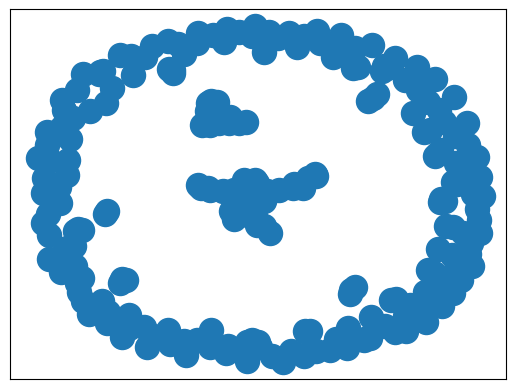

In [15]:
nx.draw_networkx(Rule_training_graph, with_labels = False)

In [16]:
average_degs = sum([Rule_training_graph.degree[i] for i in Rule_training_graph])/len(Rule_training_graph), sum([Itpr_training_graph.degree[i] for i in Itpr_training_graph])/len(Itpr_training_graph)
average_degs

(2.7011070110701105, 2.6741573033707864)

In [17]:
def test(template, nexamples):

    count = 0
    autTP = 0
    autFN = 0
    autFP = 0
    classTP = 0
    classFN = 0
    classFP = 0
    itprTP = 0
    itprFN = 0
    itprFP = 0
    precTP = 0
    precFN = 0
    precFP = 0
    #princTP = 0
    #princFN = 0
    #princFP = 0
    ruleTP = 0
    ruleFN = 0
    ruleFP = 0

    for i in range(len(df_test)):

        Rule_subgraph_radius = 43.60              #SET MANUALLY, on the training set, on average these yield a subgraph of size (N*25)**0.5
        Itpr_subgraph_radius = 44.73
        Aut_subgraph_radius = 44.27
        Class_subgraph_radius = 58.65
        Prec_subgraph_radius = 37.38

        query = 'Text: '+ df_test.iloc[i]['Text']+'\n'+'Answer: '

        Rule_test_graph = Rule_training_graph.copy()     
        Itpr_test_graph = Itpr_training_graph.copy()
        Aut_test_graph = Aut_training_graph.copy()
        Class_test_graph = Class_training_graph.copy()
        Prec_test_graph = Prec_training_graph.copy()


        for j in range(len(Rule_training_graph)):
            if euclid(df_train_Rule.iloc[j]['embeddings'], df_test.iloc[i]['embeddings']) > Rule_subgraph_radius:
                Rule_test_graph.remove_node(j)


        while(len(Rule_test_graph) < (nexamples+4)//5):     #If the subgraph doesn't have enough nodes, increment the radius
            Rule_subgraph_radius *= 1.1
            Rule_test_graph = Rule_training_graph.copy()
            for j in range(len(Rule_training_graph)):
                if euclid(df_train_Rule.iloc[j]['embeddings'], df_test.iloc[i]['embeddings']) > Rule_subgraph_radius:
                    Rule_test_graph.remove_node(j)
            #print(subgraph_radius)

        for j in range(len(Itpr_training_graph)):
            if euclid(df_train_Itpr.iloc[j]['embeddings'], df_test.iloc[i]['embeddings']) > Itpr_subgraph_radius:
                Itpr_test_graph.remove_node(j)


        while(len(Itpr_test_graph) < (nexamples+4)//5):     #If the subgraph doesn't have enough nodes, increment the radius
            Itpr_subgraph_radius *= 1.1
            Itpr_test_graph = Itpr_training_graph.copy()
            for j in range(len(Itpr_training_graph)):
                if euclid(df_train_Itpr.iloc[j]['embeddings'], df_test.iloc[i]['embeddings']) > Itpr_subgraph_radius:
                    Itpr_test_graph.remove_node(j)
            #print(subgraph_radius)

        for j in range(len(Aut_training_graph)):
            if euclid(df_train_Aut.iloc[j]['embeddings'], df_test.iloc[i]['embeddings']) > Aut_subgraph_radius:
                Aut_test_graph.remove_node(j)


        while(len(Aut_test_graph) < (nexamples+4)//5):     #If the subgraph doesn't have enough nodes, increment the radius
            Aut_subgraph_radius *= 1.1
            Aut_test_graph = Aut_training_graph.copy()
            for j in range(len(Aut_training_graph)):
                if euclid(df_train_Aut.iloc[j]['embeddings'], df_test.iloc[i]['embeddings']) > Aut_subgraph_radius:
                    Aut_test_graph.remove_node(j)
            #print(subgraph_radius)

        for j in range(len(Class_training_graph)):
            if euclid(df_train_Class.iloc[j]['embeddings'], df_test.iloc[i]['embeddings']) > Class_subgraph_radius:
                Class_test_graph.remove_node(j)


        while(len(Class_test_graph) < (nexamples+4)//5):     #If the subgraph doesn't have enough nodes, increment the radius
            Class_subgraph_radius *= 1.1
            Class_test_graph = Class_training_graph.copy()
            for j in range(len(Class_training_graph)):
                if euclid(df_train_Class.iloc[j]['embeddings'], df_test.iloc[i]['embeddings']) > Class_subgraph_radius:
                    Class_test_graph.remove_node(j)

        for j in range(len(Prec_training_graph)):
            if euclid(df_train_Prec.iloc[j]['embeddings'], df_test.iloc[i]['embeddings']) > Prec_subgraph_radius:
                Prec_test_graph.remove_node(j)


        while(len(Prec_test_graph) < (nexamples+4)//5):     #If the subgraph doesn't have enough nodes, increment the radius
            Prec_subgraph_radius *= 1.1
            Prec_test_graph = Prec_training_graph.copy()
            for j in range(len(Prec_training_graph)):
                if euclid(df_train_Prec.iloc[j]['embeddings'], df_test.iloc[i]['embeddings']) > Prec_subgraph_radius:
                    Prec_test_graph.remove_node(j)






        
        Rule_selected_nodes = []
        Itpr_selected_nodes = []
        Aut_selected_nodes = []
        Prec_selected_nodes = []
        Class_selected_nodes = []
        Rule_communities = nx.community.louvain_communities(Rule_test_graph, seed = random_state)
        Rule_sorted_communities = sorted(Rule_communities, key = lambda x: len(x), reverse = True)
        Itpr_communities = nx.community.louvain_communities(Itpr_test_graph, seed = random_state)
        Itpr_sorted_communities = sorted(Itpr_communities, key = lambda x: len(x), reverse = True)
        Aut_communities = nx.community.louvain_communities(Aut_test_graph, seed = random_state)
        Aut_sorted_communities = sorted(Aut_communities, key = lambda x: len(x), reverse = True)
        Prec_communities = nx.community.louvain_communities(Prec_test_graph, seed = random_state)
        Prec_sorted_communities = sorted(Prec_communities, key = lambda x: len(x), reverse = True)
        Class_communities = nx.community.louvain_communities(Class_test_graph, seed = random_state)
        Class_sorted_communities = sorted(Class_communities, key = lambda x: len(x), reverse = True)
        #print(sorted_communities)
        #print(len(sorted_communities))



        if len(Rule_sorted_communities) >= (nexamples+4)//5:    #If there are enough communities:
            for l in range((nexamples+4)//5):
                Rule_subgraph = Rule_test_graph.subgraph(Rule_sorted_communities[l])
                Rule_selected_nodes.append(sorted(nx.pagerank(Rule_subgraph).items(), key=lambda kv: kv[1], reverse = True )[0][0])
                #print(sorted(nx.pagerank(subgraph).items(), key=lambda kv: kv[1], reverse = True ))
        else:                                       #If there are less communities than nodes to choose:
            numberofelements = 2
            while len(Rule_selected_nodes) < (nexamples+4) //5:
                Rule_selected_nodes = []
                for element in Rule_sorted_communities:
                    Rule_subgraph = Rule_test_graph.subgraph(element)
                    Rule_selected_nodes += [foo[0] for foo in sorted(nx.pagerank(Rule_subgraph).items(), key=lambda kv: kv[1], reverse = True )][:numberofelements]
                    numberofelements += 1

        if len(Itpr_sorted_communities) >= (nexamples+4)//5:    #If there are enough communities:
            for l in range((nexamples+4)//5):
                Itpr_subgraph = Itpr_test_graph.subgraph(Itpr_sorted_communities[l])
                Itpr_selected_nodes.append(sorted(nx.pagerank(Itpr_subgraph).items(), key=lambda kv: kv[1], reverse = True )[0][0])
                #print(sorted(nx.pagerank(subgraph).items(), key=lambda kv: kv[1], reverse = True ))
        else:                                       #If there are less communities than nodes to choose:
            numberofelements = 2
            while len(Itpr_selected_nodes) < (nexamples+4) //5:
                Itpr_selected_nodes = []
                for element in Itpr_sorted_communities:
                    Itpr_subgraph = Itpr_test_graph.subgraph(element)
                    Itpr_selected_nodes += [foo[0] for foo in sorted(nx.pagerank(Itpr_subgraph).items(), key=lambda kv: kv[1], reverse = True )][:numberofelements]
                    numberofelements += 1
            #print(sorted(nx.pagerank(subgraph).items(), key=lambda kv: kv[1], reverse = True ))
        
        if len(Aut_sorted_communities) >= (nexamples+4)//5:    #If there are enough communities:
            for l in range((nexamples+4)//5):
                Aut_subgraph = Aut_test_graph.subgraph(Aut_sorted_communities[l])
                Aut_selected_nodes.append(sorted(nx.pagerank(Aut_subgraph).items(), key=lambda kv: kv[1], reverse = True )[0][0])
                #print(sorted(nx.pagerank(subgraph).items(), key=lambda kv: kv[1], reverse = True ))
        else:                                       #If there are less communities than nodes to choose:
            numberofelements = 2
            while len(Aut_selected_nodes) < (nexamples+4) //5:
                Aut_selected_nodes = []
                for element in Aut_sorted_communities:
                    Aut_subgraph = Aut_test_graph.subgraph(element)
                    Aut_selected_nodes += [foo[0] for foo in sorted(nx.pagerank(Aut_subgraph).items(), key=lambda kv: kv[1], reverse = True )][:numberofelements]
                    numberofelements += 1

        if len(Prec_sorted_communities) >= (nexamples+4)//5:    #If there are enough communities:
            for l in range((nexamples+4)//5):
                Prec_subgraph = Prec_test_graph.subgraph(Prec_sorted_communities[l])
                Prec_selected_nodes.append(sorted(nx.pagerank(Prec_subgraph).items(), key=lambda kv: kv[1], reverse = True )[0][0])
                #print(sorted(nx.pagerank(subgraph).items(), key=lambda kv: kv[1], reverse = True ))
        else:                                       #If there are less communities than nodes to choose:
            numberofelements = 2
            while len(Prec_selected_nodes) < (nexamples+4) //5:
                Prec_selected_nodes = []
                for element in Prec_sorted_communities:
                    Prec_subgraph = Prec_test_graph.subgraph(element)
                    Prec_selected_nodes += [foo[0] for foo in sorted(nx.pagerank(Prec_subgraph).items(), key=lambda kv: kv[1], reverse = True )][:numberofelements]
                    numberofelements += 1

        if len(Class_sorted_communities) >= (nexamples+4)//5:    #If there are enough communities:
            for l in range((nexamples+4)//5):
                Class_subgraph = Class_test_graph.subgraph(Class_sorted_communities[l])
                Class_selected_nodes.append(sorted(nx.pagerank(Class_subgraph).items(), key=lambda kv: kv[1], reverse = True )[0][0])
                #print(sorted(nx.pagerank(subgraph).items(), key=lambda kv: kv[1], reverse = True ))
        else:                                       #If there are less communities than nodes to choose:
            numberofelements = 2
            while len(Class_selected_nodes) < (nexamples+4) //5:
                Class_selected_nodes = []
                for element in Class_sorted_communities:
                    Class_subgraph = Class_test_graph.subgraph(element)
                    Class_selected_nodes += [foo[0] for foo in sorted(nx.pagerank(Class_subgraph).items(), key=lambda kv: kv[1], reverse = True )][:numberofelements]
                    numberofelements += 1
        



        Rule_selected_nodes = Rule_selected_nodes[:(nexamples+4)//5]     #The final chosen demonstrations
        Itpr_selected_nodes = Itpr_selected_nodes[:(nexamples+4)//5]
        Class_selected_nodes = Class_selected_nodes[:(nexamples+4)//5]
        Prec_selected_nodes = Prec_selected_nodes[:(nexamples+4)//5]
        Aut_selected_nodes = Aut_selected_nodes[:(nexamples+4)//5]
        #print('Selected Nodes:', Rule_selected_nodes)

        examples_text = []
        
        for el in list(range((nexamples+4)//5)):
            examples_text.append('Text: '+ df_train_Rule.iloc[Rule_selected_nodes[el]]['Text'] + '\n' + 'Answer: '+ str(df_train_Rule.iloc[Rule_selected_nodes[el]]['Scheme'])+'\n\n')
            examples_text.append('Text: '+ df_train_Itpr.iloc[Itpr_selected_nodes[el]]['Text'] + '\n' + 'Answer: '+ str(df_train_Itpr.iloc[Itpr_selected_nodes[el]]['Scheme'])+'\n\n')
            examples_text.append('Text: '+ df_train_Aut.iloc[Aut_selected_nodes[el]]['Text'] + '\n' + 'Answer: '+ str(df_train_Aut.iloc[Aut_selected_nodes[el]]['Scheme'])+'\n\n')
            examples_text.append('Text: '+ df_train_Prec.iloc[Prec_selected_nodes[el]]['Text'] + '\n' + 'Answer: '+ str(df_train_Prec.iloc[Prec_selected_nodes[el]]['Scheme'])+'\n\n')
            examples_text.append('Text: '+ df_train_Class.iloc[Class_selected_nodes[el]]['Text'] + '\n' + 'Answer: '+ str(df_train_Class.iloc[Class_selected_nodes[el]]['Scheme'])+'\n\n')

        random.shuffle(examples_text)

        examples_text = examples_text[:nexamples]

        text_examples = ''      #Building text examples

        for el in examples_text:
            text_examples += el
        
        print('query:\n'+ query,'\n')
        print('retrieved examples:\n\n'+ text_examples,'\n\n')

        messages = [{'role': 'system', 'content': template},{"role": "user", "content": text_examples},{"role": "user", "content": query}]

        outputs = pipeline(
            messages,
            max_new_tokens=10,
            do_sample = False
        )
        final_output = outputs[0]['generated_text'][-1]['content']
        print('LLM output:', final_output)
        print('ground truth:', df_test.iloc[i]['Scheme'])
        print(200*'-')

        if 'Aut' in final_output and 'Aut' in df_test.iloc[i]['Scheme']:
            autTP += 1
        if 'Aut' in final_output and 'Aut' not in df_test.iloc[i]['Scheme']:
            autFP += 1
        if 'Aut' not in final_output and 'Aut' in df_test.iloc[i]['Scheme']:
            autFN += 1
        
        if 'Class' in final_output and 'Class' in df_test.iloc[i]['Scheme']:
            classTP += 1
        if 'Class' in final_output and 'Class' not in df_test.iloc[i]['Scheme']:
            classFP += 1
        if 'Class' not in final_output and 'Class' in df_test.iloc[i]['Scheme']:
            classFN += 1

        if 'Itpr' in final_output and 'Itpr' in df_test.iloc[i]['Scheme']:
            itprTP += 1
        if 'Itpr' in final_output and 'Itpr' not in df_test.iloc[i]['Scheme']:
            itprFP += 1
        if 'Itpr' not in final_output and 'Itpr' in df_test.iloc[i]['Scheme']:
            itprFN += 1

        if 'Prec' in final_output and 'Prec' in df_test.iloc[i]['Scheme']:
            precTP += 1
        if 'Prec' in final_output and 'Prec' not in df_test.iloc[i]['Scheme']:
            precFP += 1
        if 'Prec' not in final_output and 'Prec' in df_test.iloc[i]['Scheme']:
            precFN += 1

        if 'Rule' in final_output and 'Rule' in df_test.iloc[i]['Scheme']:
            ruleTP += 1
        if 'Rule' in final_output and 'Rule' not in df_test.iloc[i]['Scheme']:
            ruleFP += 1
        if 'Rule' not in final_output and 'Rule' in df_test.iloc[i]['Scheme']:
            ruleFN += 1

    if autTP == 0:
        autF1 = 0
    else:
        autPREC = autTP/(autTP+autFP)
        autREC = autTP/(autTP+autFN)
        autF1 = 2/((1/autPREC)+(1/autREC))

    if classTP == 0:
        classF1 = 0
    else:
        classPREC = classTP/(classTP+classFP)
        classREC = classTP/(classTP+classFN)
        classF1 = 2/((1/classPREC)+(1/classREC))

    if itprTP == 0:
        itprF1 = 0
    else:
        itprPREC = itprTP/(itprTP+itprFP)
        itprREC = itprTP/(itprTP+itprFN)
        itprF1 = 2/((1/itprPREC)+(1/itprREC))

    if precTP == 0:
        precF1 = 0
    else:
        precPREC = precTP/(precTP+precFP)
        precREC = precTP/(precTP+precFN)
        precF1 = 2/((1/precPREC)+(1/precREC))

    if ruleTP == 0:
        ruleF1 = 0
    else:
        rulePREC = ruleTP/(ruleTP+ruleFP)
        ruleREC = ruleTP/(ruleTP+ruleFN)
        ruleF1 = 2/((1/rulePREC)+(1/ruleREC))

    print('Authoritative F1:', autF1)
    print('Verbal Classification F1:', classF1)
    print('Interpretation F1:', itprF1)
    print('Precedent F1:', precF1)
    print('Rule F1:', ruleF1)
    print()


    print('macro F1:', (autF1 + classF1 + itprF1 + precF1 + ruleF1)/5)
    print('macro F1 (reliable):', (autF1 + precF1 + ruleF1)/3)


In [18]:
template = '''Classify the following legal premise as one or more of the following argumentative schemes: Rule, Prec, Class, Itpr, Aut. Rule: whether there is an explicit or implicit reference to an article of law or citation of the text of a certain article. Prec: whether there is a reference to a previous ruling of the Supreme Court or the Court of Justice of the European Union. Class: if there is a definition of a legal concept or its constituent elements. Itpr: if there is reference to one of the interpretative criteria contained in Article 12 of the prelegislations (literal, teleological, psychological, systematic) to the Civil Code. Aut: if there is a reference to an indication by an authority (e.g. an opinion of the Advocate General). The expected output is a list with all applicable labels. For example: ['Prec', 'Aut', 'Rule']. Only reply with the list of labels.'''

In [19]:
test(template, 5)

C:\Users\alfio\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\transformers\generation\configuration_utils.py:628: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.6` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(
C:\Users\alfio\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\transformers\generation\configuration_utils.py:633: UserWarning: `do_sample` is set to `False`. However, `top_p` is set to `0.9` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `top_p`.
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard must observed follows Article 58 Statute Court Justice conjunction Article 1132 Rules Procedure Court Justice appeal appellant may put forward relevant argument provided subjectmatter proceedings General Court changed appeal Case C‑22905 P PKK KNK v Council 2007 ECR I‑439 paragraph 66 Case C‑806 P Herrero Romeu v Commission 2007 ECR I‑10333 paragraph 32
Answer:  

retrieved examples:

Text: Advocate General observes points 48 49 Opinion caselaw may applied third limb fourth paragraph Article 263 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: general application derives fact decisions apply objectively determined situations produce legal effects respect category persons envisaged general abstract manner see effect judgments 22 December 2008 British Aggregates v Commission C‑48706 P EUC2008757 paragraph 31 17 September 2009 Commission v Koninglijke FrieslandCampina C‑51907 P EUC2009556 paragraph 53 caselaw cited 28 June 2018 Lowell Financial Services v Commission C‑21916

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard Court repeatedly held action annulment purposes Article 230 EC must available acts adopted institutions whatever nature form intended legal effects capable affecting interests applicant bringing distinct change legal position see inter alia Athinaïki Techniki v Commission paragraph 29 caselaw cited Case C‑36208 P Internationaler Hilfsfonds v Commission 2010 ECR I‑0000 paragraph 51
Answer:  

retrieved examples:

Text: General Court recalled paragraph 26 judgment appeal persons decision addressed may claim individually concerned within meaning fourth paragraph Article 263 TFEU decision affects reason certain attributes peculiar reason circumstances differentiated persons virtue factors distinguishes individually case person addressedjudgments 15 July 1963 Plaumann v Commission 2562 EUC196317 107 3 October 2013 Inuit Tapiriit Kanatami Others v Parliament Council C‑58311 P EUC2013625 paragraph 72 19 December 2013 Telefónica v Commission C‑27412 P EUC2013852 paragraph 4

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: follows also settled caselaw concerning admissibility actions annulment necessary look actual substance acts challenged order classify see particular Case 6081 IBM v Commission 1981 ECR 2639 paragraph 9 Case C‑14796 Netherlands v Commission 2000 ECR I‑4723 paragraph 27
Answer:  

retrieved examples:

Text: Advocate General observes points 48 49 Opinion caselaw may applied third limb fourth paragraph Article 263 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: general application derives fact decisions apply objectively determined situations produce legal effects respect category persons envisaged general abstract manner see effect judgments 22 December 2008 British Aggregates v Commission C‑48706 P EUC2008757 paragraph 31 17 September 2009 Commission v Koninglijke FrieslandCampina C‑51907 P EUC2009556 paragraph 53 caselaw cited 28 June 2018 Lowell Financial Services v Commission C‑21916 P published EUC2018508 paragraph 42 caselaw cited
Answer: Prec

Text: Fourth must distort th

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: contrast form act decision adopted principle irrelevant right challenge acts decisions way action annulment
Answer:  

retrieved examples:

Text: Moreover apparent paragraphs 301 305 judgment appeal judgment vitiated inadequate statement reasons regards assessment plea alleging breach principle legal certainty raised FT French Republic
Answer: Itpr

Text: noted contrary Commission’s submissions certainly follow caselaw Court Justice measure public undertaking lays conditions use goods services always therefore nature selective measure purposes Article 1071 TFEU
Answer: ['Itpr', 'Rule']

Text: apparent paragraphs 46 52 observed essence Advocate General point 76 Opinion existing aid altered breach compatibility conditions imposed Commission Council longer regarded authorised result loses status existing aid entirety
Answer: ['Aut', 'Itpr']

Text: First must intervention State State resources
Answer: Class

Text: follows reading grounds measure issue judgment take form tax ad

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: therefore principle irrelevant classification act question whether satisfies certain formal requirements namely particular duly identified author mentions provisions providing legal basis
Answer:  

retrieved examples:

Text: position would different alteration fact constituted separate aid measure assessed separately would therefore influence assessment Commission already made original aid plan
Answer: Itpr

Text: issue whether act general application concerns objective characteristic act cannot vary according different limbs fourth paragraph Article 263 TFEU
Answer: ['Class', 'Rule']

Text: Second intervention must liable affect trade Member States
Answer: Class

Text: observed essence Advocate General points 133 136 Opinion caselaw cannot understood meaning national measure must necessarily classified selective measure benefits exclusively undertakings export goods services even fact may case respect particular tax measures issue judgments concerned
Answer: Aut

Text: r

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: therefore irrelevant act may described ‘decision’ refer Article 42 3 4 Regulation 6591999
Answer:  

retrieved examples:

Text: Advocate General observed point 100 Opinion overtaxation exhausted effects given time necessarily entailed conferring advantage FT special tax regime
Answer: Aut

Text: must recalled fact taxpayers satisfying conditions application measure benefit measure cannot make selective measure judgment 29 March 2012 3M Italia C‑41710 EUC2012184 paragraph 42
Answer: Prec

Text: stated paragraph 86 judgment tax reliefs could examined light decision 3 July 1991 refers rules common agricultural policy directly light Article 92 Treaty
Answer: ['Itpr', 'Rule']

Text: Second regards merits plea Article 44 Regulation 178581 merely provides Articles 92 93 94 Treaty apply production trade sugar save otherwise provided Regulation
Answer: Rule

Text: Second intervention must liable affect trade Member States
Answer: Class

 


LLM output: ['Prec', 'Rule']
ground truth

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: also importance Member State concerned notified act issue Commission infringing Article 25 regulation error capable altering substance act see Athinaïki Techniki v Commission paragraphs 43 44 caselaw cited
Answer:  

retrieved examples:

Text: hand General Court rightly pointed paragraph 206 judgment appeal Commission decision issue determine conditions application measure issue might made possible certain situations classify measure aid
Answer: Itpr

Text: contrast since assessment context appeal legal classification attributed national law General Court provision EU law constitutes question law falls within jurisdiction Court Justice judgment 28 June 2018 Andres insolvency Heitkamp BauHolding v Commission C‑20316 P EUC2018505 paragraph 78 caselaw cited
Answer: Prec

Text: also noted essence Advocate General point 109 Opinion follows caselaw Court recalled paragraphs 90 93 present judgment selectivity tax measure cannot precisely assessed basis reference framework consist

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Furthermore principle measures definitively determine position Commission upon conclusion administrative procedure intended legal effects capable affecting interests complainant constitute acts open challenge purposes Article 230 EC intermediate measures whose purpose prepare final decision effects see Athinaïki Techniki v Commission paragraph 42 caselaw cited
Answer:  

retrieved examples:

Text: also noted essence Advocate General point 109 Opinion follows caselaw Court recalled paragraphs 90 93 present judgment selectivity tax measure cannot precisely assessed basis reference framework consisting provisions artificially taken broader legislative framework
Answer: ['Aut', 'Itpr']

Text: borne mind first view mandatory nature review State aid Commission Article 93 Treaty undertakings aid granted may principle entertain legitimate expectation aid lawful unless granted compliance procedure laid article second diligent businessman normally able determine whether procedure fo

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard possible definitive actionable nature measures taken Commission procedure reviewing State aid noted first Commission must Article 101 Regulation 6591999 carry examination possession information whatever source regarding allegedly unlawful aid
Answer:  

retrieved examples:

Text: borne mind first view mandatory nature review State aid Commission Article 93 Treaty undertakings aid granted may principle entertain legitimate expectation aid lawful unless granted compliance procedure laid article second diligent businessman normally able determine whether procedure followed Case C589 Commission v Germany 1990 ECR I3437 paragraph 14 Case C16995 Spain v Commission 1997 ECR I135 paragraph 51 Case C2495 Alcan Deutschland 1997 ECR I1591 paragraph 25
Answer: ['Prec', 'Rule']

Text: also noted essence Advocate General point 109 Opinion follows caselaw Court recalled paragraphs 90 93 present judgment selectivity tax measure cannot precisely assessed basis reference framework co

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: examination complaint basis provision gives rise initiation preliminary examination stage Article 883 EC obliges Commission examine immediately possible existence aid compatibility common market see effect Athinaïki Techniki v Commission paragraph 37
Answer:  

retrieved examples:

Text: Advocate General observes point 26 Opinion interpretation supported Commission namely nonlegislative acts general application decision issue covered concept ‘regulatory act’ within meaning third limb fourth paragraph Article 263 TFEU cannot accepted
Answer: ['Aut', 'Itpr', 'Rule']

Text: borne mind first view mandatory nature review State aid Commission Article 93 Treaty undertakings aid granted may principle entertain legitimate expectation aid lawful unless granted compliance procedure laid article second diligent businessman normally able determine whether procedure followed Case C589 Commission v Germany 1990 ECR I3437 paragraph 14 Case C16995 Spain v Commission 1997 ECR I135 paragraph

You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Article 131 Regulation 6591999 applicable context examination complaint alleging unlawful aid obliges Commission close preliminary examination stage adopting decision pursuant Article 42 3 4 regulation say decision finding aid exist raising objections initiating formal investigation procedure since institution authorised persist failure act preliminary examination stage
Answer:  

retrieved examples:

Text: Advocate General observed points 40 41 Opinion concept ‘regulatory act … entail implementing measures’ within meaning final limb fourth paragraph Article 263 TFEU interpreted light provision’s objective clear origin consists preventing individual obliged infringe law order access court
Answer: ['Aut', 'Itpr', 'Rule']

Text: settled caselaw statement reasons required Article 296 TFEU must appropriate measure issue must disclose clear unequivocal fashion reasoning followed institution adopted measure way enable persons concerned ascertain reasons enable competent Court Eu

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: stage procedure completed Commission bound consequently either initiate next stage procedure provided Article 882 EC adopt definitive decision rejecting complaint see effect Athinaïki Techniki v Commission paragraph 40 caselaw cited
Answer:  

retrieved examples:

Text: Advocate General stated point 91 Opinion issue question present case caselaw arising judgments relevant proceedings
Answer: Aut

Text: Commission demonstrate decision real effect aid already granted requirement would effect favouring Member States grant aid breach obligation notify laid Article 933 Treaty detriment notify aid planning stage Case C30187 France v Commission 1990 ECR I307 ‘Boussac Saint Frères’ paragraphs 32 33
Answer: ['Itpr', 'Prec', 'Rule']

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: necessary reasoning go relevant facts points law since question whether statement reasons me

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Commission finds following examination complaint investigation revealed grounds concluding State aid within meaning Article 87 EC refuses implication initiate procedure provided Article 882 EC see effect Case C‑36795 P Commission v Sytraval Brink’s France 1998 ECR I‑1719 paragraph 47
Answer:  

retrieved examples:

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see effect judgment 15 November 2011 Commission Spain v Government Gi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regards Commission’s finding measures complained constituted existing aid noted existing aid course subject constant review provided Article 881 EC must regarded lawful long Commission found incompatible common market see Case C‑4493 NamurLes assurances du crédit 1994 ECR I‑3829 paragraph 34 Case C‑40099 Italy v Commission 2001 ECR I‑7303 paragraph 48
Answer:  

retrieved examples:

Text: Natural legal persons unable conditions admissibility fourth paragraph Article 263 TFEU challenge EU regulatory act directly EU judicature protected application act ability challenge implementing measures act entails judgments 19 December 2013 Telefónica v Commission C‑27412 P EUC2013852 paragraph 28 13 March 2018 European Union Copper Task Force v Commission C‑38416 P EUC2018176 paragraph 36 caselaw cited
Answer: ['Prec', 'Rule']

Text: Advocate General observes point 26 Opinion interpretation supported Commission namely nonlegislative acts general application decision issue covered conc

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However receives complaint relating allegedly unlawful aid Commission classifying measure existing aid subjects procedure provided Article 881 EC thus refuses implication initiate procedure provided Article 882 EC see effect CIRFS Others v Commission paragraphs 25 26 Case C‑32199 P ARAP Others v Commission 2002 ECR I‑4287 paragraph 61
Answer:  

retrieved examples:

Text: General Court recalled paragraph 26 judgment appeal persons decision addressed may claim individually concerned within meaning fourth paragraph Article 263 TFEU decision affects reason certain attributes peculiar reason circumstances differentiated persons virtue factors distinguishes individually case person addressedjudgments 15 July 1963 Plaumann v Commission 2562 EUC196317 107 3 October 2013 Inuit Tapiriit Kanatami Others v Parliament Council C‑58311 P EUC2013625 paragraph 72 19 December 2013 Telefónica v Commission C‑27412 P EUC2013852 paragraph 46
Answer: Rule

Text: necessary reasoning go relevant 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: decision refusing initiate procedure provided Article 882 EC definitive cannot characterised mere provisional measure CIRFS Others v Commission paragraph 26 effect Athinaïki Techniki v Commission paragraphs 54 58
Answer:  

retrieved examples:

Text: Advocate General observes point 26 Opinion interpretation supported Commission namely nonlegislative acts general application decision issue covered concept ‘regulatory act’ within meaning third limb fourth paragraph Article 263 TFEU cannot accepted
Answer: ['Aut', 'Itpr', 'Rule']

Text: Article 1071 TFEU distinguish measures State intervention reference causes aims defines basis effects thus independently techniques used see effect judgments 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 92 93 28 June 2018 Andres liquidator insolvency Heitkamp BauHolding v Commission C‑20316 P EUC2018505 paragraph 91
Answer: ['Prec', 'Rule']

Text: necessary reasoning go re

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: situation persons intended benefit procedural guarantees afforded provision may secure compliance therewith able challenge decision question European Union judicature fourth paragraph Article 230 EC
Answer:  

retrieved examples:

Text: basis caselaw use regulatory technique cannot enable national tax rules escape outset scrutiny concerning State aid provided FEU Treaty resorting regulatory technique used sufficient define relevant reference framework purposes assessing condition relating selectivity except order ensure form State intervention prevails decisively effects
Answer: ['Itpr', 'Rule']

Text: cannot deduced fact agreement could excluded reason nature purpose social policy objectives pursed scope provisions Article 811 EC collective negotiations parties involved likewise entirely automatically excluded Treaty rules State aid action annulment might brought parties would almost automatically regarded inadmissible involvement negotiations
Answer: ['Itpr', 'Rule']

Te

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: principle applies equally whether ground decision taken Commission regards aid compatible common market view existence aid must discounted Commission v Sytraval Brink’s France paragraph 47 considers existing aid see effect CIRFS Others v Commission paragraph 27 ARAP Others v Commission paragraph 62
Answer:  

retrieved examples:

Text: Thus respect assessment context appeal General Court’s findings national law field State aid constitute findings fact Court Justice jurisdiction determine whether law distorted see effect judgments 3 April 2014 France v Commission C‑55912 P EUC2014217 paragraph 79 caselaw cited 20 December 2017 Comunidad Autónoma del País Vasco Others v Commission C‑6616 P C‑6916 P EUC2017999 paragraph 98
Answer: Prec

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 296 TFEU must assessed regard wording also context legal rules governing matter question see inter alia judgments 6 Sept

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: finding corroborated Article 20 Regulation 6591999 governs rights interested parties
Answer:  

retrieved examples:

Text: Advocate General observed point 100 Opinion overtaxation exhausted effects given time necessarily entailed conferring advantage FT special tax regime
Answer: Aut

Text: finding follows examination wording context aim Article 1c Regulation 6591999
Answer: ['Itpr', 'Rule']

Text: apparent Court’s caselaw cited paragraphs 89 90 recovery unlawful aid different purpose Directive 2014104
Answer: ['Prec', 'Rule']

Text: Article 45 thereof provides applied appropriate account taken time objectives set Articles 39 EC Treaty Article 33 EC
Answer: Rule

Text: First must intervention State State resources
Answer: Class

 


LLM output: ['Itpr', 'Rule']
ground truth: Rule
----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: According second third sentences Article 202 thereof obtaining interested party information concerning alleged unlawful aid alleged misuse aid Commission either consider insufficient grounds taking view case inform interested party thereof take decision case concerning subjectmatter information supplied
Answer:  

retrieved examples:

Text: follows aid granted ECSC Treaty without notified delay Commission exercising supervisory powers ordering recovery aid render recovery decision unlawful except exceptional cases show Commission manifestly failed act clearly breached duty diligence
Answer: ['Itpr', 'Rule']

Text: follows aid granted ECSC Treaty without notified delay Commission exercising supervisory powers ordering recovery aid render recovery decision unlawful except exceptional cases show Commission manifestly failed act clearly breached duty diligence
Answer: ['Itpr', 'Rule']

Text: relation first condition set therein settled caselaw person directly concerned Communi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: follows Commission examined information taken position takes decision
Answer:  

retrieved examples:

Text: First must intervention State State resources
Answer: Class

Text: Consequently also noted essence Advocate General point 108 Opinion regulatory technique used cannot decisive purposes determining reference framework
Answer: Aut

Text: follows paragraph 78 applicable test among factors Commission required take account purposes establishing existence aid
Answer: Itpr

Text: apparent Court’s caselaw cited paragraphs 89 90 recovery unlawful aid different purpose Directive 2014104
Answer: ['Prec', 'Rule']

Text: Secondly also apparent caselaw examination selectivity must carried within context ‘a particular legal regime
Answer: Prec

 


LLM output: ['Prec', 'Rule']
ground truth: Itpr
---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Therefore action annulment decision initiate procedure pursuant Article 882 EC brought party concerned within meaning article must considered admissible party seeks thereby safeguard procedural rights available latter provision see Athinaïki Techniki v Commission paragraph 36 caselaw cited
Answer:  

retrieved examples:

Text: certain pleas may indeed must raised courts motion question whether statement reasons decision issue lacking inadequate falls within scope essential procedural requirements plea going substantive legality decision falls within scope infringement Treaties rule law relating application within meaning Article 263 TFEU contrast examined Courts European Union raised applicant see effect Case C36795 P Commission v Sytraval Brink’s France 1998 ECR I1719 paragraph 67 Case C26597 P VBA v Florimex Others 2000 ECR I2061 paragraph 114 Commission v Ireland Others paragraph 40
Answer: Prec

Text: borne mind first view mandatory nature review State aid Commission A

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: appellant undertaking competition company benefiting measures complained without doubt interested party purposes Article 882 EC see Commission v Sytraval Brink’s France paragraph 41 Case C‑31907 P 3F v Commission 2009 ECR I‑5963 paragraph 32 regard definition term Article 1h Regulation 6591999
Answer:  

retrieved examples:

Text: according Court’s settled caselaw fact number undertakings able claim entitlement national measure large undertakings belong various economic sectors sufficient call question selective nature measure therefore rule classification State aid see inter alia judgments 13 February 2003 Spain v Commission C‑40900 EUC200392 paragraph 48 8 September 2011 Commission v Netherlands C‑27908 P EUC2011551 paragraph 50
Answer: Prec

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: Furthermore Advocate General observed point 35 Opinion Joined Cases Wor

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: circumstances Commission’s complaint reference notice relating State aid field taxation ineffective see effect Case C18299 P Salzgitter v Commission 2003 ECR I10761 paragraphs 54 55 unnecessary consider content scope notice stage
Answer:  

retrieved examples:

Text: borne mind first view mandatory nature review State aid Commission Article 93 Treaty undertakings aid granted may principle entertain legitimate expectation aid lawful unless granted compliance procedure laid article second diligent businessman normally able determine whether procedure followed Case C589 Commission v Germany 1990 ECR I3437 paragraph 14 Case C16995 Spain v Commission 1997 ECR I135 paragraph 51 Case C2495 Alcan Deutschland 1997 ECR I1591 paragraph 25
Answer: ['Prec', 'Rule']

Text: provided caselaw wording Article 1062 TFEU shows exemptions Treaty rules permitted provided necessary performance particular tasks assigned undertaking entrusted operation service general economic interest see effect 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: According settled caselaw definition aid general subsidy given includes positive benefits subsidies also State measures various forms mitigate charges normally included budget undertaking thus without subsidies strict sense word similar character effect see Case C14399 AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke 2001 ECR I8365 paragraph 38 Joined Cases C‑7808 C8008 Paint Graphos Others 2011 ECR I‑0000 paragraph 45 caselaw cited
Answer:  

retrieved examples:

Text: provided caselaw wording Article 1062 TFEU shows exemptions Treaty rules permitted provided necessary performance particular tasks assigned undertaking entrusted operation service general economic interest see effect judgments 23 October 1997 Commission v France C‑15994 EUC1997501 paragraph 54 28 February 2013 Ordem dos Técnicos Oficiais de Contas C‑112 EUC2013127 paragraph 106
Answer: ['Itpr', 'Prec', 'Rule']

Text: borne mind first view mandatory nature review State aid Commission Article 93 Treaty u

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Consequently measure public authorities grant certain undertakings favourable tax treatment although involving transfer State resources places recipients favourable financial position taxpayers amounts State aid within meaning Article 871 EC see Case C38792 Banco Exterior de España 1994 ECR I877 paragraph 14 Paint Graphos Others paragraph 46 caselaw cited
Answer:  

retrieved examples:

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: provided caselaw wording Article 1062 TFEU shows exemptions Treaty rules permitted provided necessary performance particular tasks assigned undertaking entrusted operation service general economic interest see effect judgments 23 October 1997 Commission v France C‑15994 EUC1997501 paragraph 54 28 February 2013 Ordem dos Técnicos Oficiais de Contas C‑112 EUC2013127 paragraph 106
Answer: ['Itpr', 'Prec', 'Rule']

Text: Furthermore Adv

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: hand advantages resulting general measure applicable without distinction economic operators constitute State aid within meaning Article 87 EC see effect Case C‑15698 Germany v Commission 2000 ECR I‑6857 paragraph 22 Joined Cases C‑39304 C‑4105 Air Liquide Industries Belgium 2006 ECR I‑5293 paragraph 32 caselaw cited
Answer:  

retrieved examples:

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: Furthermore Advocate General observed point 35 Opinion Joined Cases World Duty Free Group Spain v Commission C‑5119 P C‑6419 P EUC202151 clear appellant’s arguments include detailed specific criticism grounds judgment appeal seek large extent challenge observance General Court limits detailed rules governing exercise review could event raised
Answer: Aut

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Art

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: therefore necessary determine whether proposed tax reform selective selectivity constituent factor concept State aid see Case C‑8803 Portugal v Commission 2006 ECR I‑7115 paragraph 54
Answer:  

retrieved examples:

Text: borne mind first view mandatory nature review State aid Commission Article 93 Treaty undertakings aid granted may principle entertain legitimate expectation aid lawful unless granted compliance procedure laid article second diligent businessman normally able determine whether procedure followed Case C589 Commission v Germany 1990 ECR I3437 paragraph 14 Case C16995 Spain v Commission 1997 ECR I135 paragraph 51 Case C2495 Alcan Deutschland 1997 ECR I1591 paragraph 25
Answer: ['Prec', 'Rule']

Text: contrast since assessment context appeal legal classification given national law General Court light provision EU law constitutes question law falls within jurisdiction Court Justice see effect judgments 3 April 2014 France v Commission C‑55912 P EUC2014217 parag

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regards appraisal condition selectivity clear settled caselaw Article 871 EC requires assessment whether particular legal regime national measure favour ‘certain undertakings production certain goods’ comparison others light objective pursued regime comparable factual legal situation AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke paragraph 41 Case C‑48706 P British Aggregates v Commission 2008 ECR I‑10515 paragraph 82 caselaw cited
Answer:  

retrieved examples:

Text: borne mind first view mandatory nature review State aid Commission Article 93 Treaty undertakings aid granted may principle entertain legitimate expectation aid lawful unless granted compliance procedure laid article second diligent businessman normally able determine whether procedure followed Case C589 Commission v Germany 1990 ECR I3437 paragraph 14 Case C16995 Spain v Commission 1997 ECR I135 paragraph 51 Case C2495 Alcan Deutschland 1997 ECR I1591 paragraph 25
Answer: ['Prec', 'Rule']

Text: Four

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: noted paragraph 73 selective advantages advantages resulting general measure applicable without distinction economic operators fall within concept State aid
Answer:  

retrieved examples:

Text: regards condition relating existence selective advantage accordance settled caselaw interventions form whatsoever liable favour undertakings directly indirectly must regarded economic advantages recipient undertaking would obtained normal market conditions considered State aid
Answer: Prec

Text: Second intervention must liable affect trade Member States
Answer: Class

Text: matters regard fact measure irrespective form legislative means used effect placing recipient undertakings position favourable undertakings although undertakings comparable factual legal situation light objective pursued tax system concerned
Answer: Itpr

Text: observed essence Advocate General points 133 136 Opinion caselaw cannot understood meaning national measure must necessarily classified selective measur

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: First appropriate recall Court consistently held Article 871 EC distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see British Aggregates v Commission paragraphs 85 89 caselaw cited Case C‑27908 P Commission v Netherlands 2011 ECR I‑0000 paragraph 51
Answer:  

retrieved examples:

Text: general application derives fact decisions apply objectively determined situations produce legal effects respect category persons envisaged general abstract manner see effect judgments 22 December 2008 British Aggregates v Commission C‑48706 P EUC2008757 paragraph 31 17 September 2009 Commission v Koninglijke FrieslandCampina C‑51907 P EUC2009556 paragraph 53 caselaw cited 28 June 2018 Lowell Financial Services v Commission C‑21916 P published EUC2018508 paragraph 42 caselaw cited
Answer: Prec

Text: General Court recalled paragraph 26 judgment appeal persons decision addressed may claim individually concerned within me

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Court admittedly held paragraph 56 Portugal v Commission determination reference framework particular importance case tax measures since existence advantage may established compared ‘normal’ taxation
Answer:  

retrieved examples:

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see effect judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 92 93 caselaw cited
Answer: ['Itpr', 'Prec', 'Rule']

Text: according Court’s settled caselaw fact number undertakings able claim entitlement national measure large undertakings belong various economic sectors sufficient call question selective nature measure therefore rule classification State aid see inter alia judgments 13 February 2003 Spain v Commission C‑40900 EUC200392 paragraph 48 8 September 2011 Commission v Netherlands C‑

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However contrary General Court’s reasoning proposition put forward Government Gibraltar United Kingdom caselaw make classification tax system ‘selective’ conditional upon system designed way undertakings might enjoy selective advantage general liable tax burden undertakings benefit derogating provisions selective advantage may identified difference normal tax burden borne former undertakings
Answer:  

retrieved examples:

Text: Consequently Advocate General observed point 65 Opinion contrary appellants’ contentions lack recognition obstacles crossborder business combinations Commission decided measure issue could correct reference system purposes selectivity analysis took view measure assessed light broader set rules included rules applicable amortisation financial goodwill case acquisition shareholdings resident companies principles applicable amortisation goodwill general according Commission aligned providing goodwill deductible acquisition shareholding followed busine

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: interpretation selectivity criterion would require contrary caselaw cited paragraph 87 order tax system classifiable ‘selective’ must designed accordance certain regulatory technique
Answer:  

retrieved examples:

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: regards particular national measures confer tax advantage must recalled measure nature although involving transfer State resources places recipients favourable position taxpayers capable procuring selective advantage recipients consequently constitutes State aid within meaning Article 1071 TFEU
Answer: ['Itpr', 'Rule']

Text: follows foregoing appropriate criterion establishing selectivity measure issue consists determining whether measure introduces operators light objective pursued general tax system concerned comparable factual legal situation distinction justified nature general structure system see 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: consequence would national tax rules fall outset outside scope control State aid merely adopted different regulatory technique although produce effects law andor fact
Answer:  

retrieved examples:

Text: cannot deduced fact agreement could excluded reason nature purpose social policy objectives pursed scope provisions Article 811 EC collective negotiations parties involved likewise entirely automatically excluded Treaty rules State aid action annulment might brought parties would almost automatically regarded inadmissible involvement negotiations
Answer: ['Itpr', 'Rule']

Text: follows Advocate General observed essence point 62 Opinion recovery aid entails restitution advantage procured aid recipient restitution economic benefit recipient may enjoyed result exploiting advantage
Answer: ['Aut', 'Itpr']

Text: Court Justice held measure measure issue designed facilitate exports may regarded selective benefits undertakings carrying crossborder transactions particular investm

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: true absence European Union rules governing matter falls within competence Member States infra‑State bodies fiscal autonomy designate bases assessment spread tax burden across different factors production economic sectors General Court held paragraph 146 judgment appeal
Answer:  

retrieved examples:

Text: Advocate General states points 25 26 Opinion Commission rely priori vague terms particular nature French system fiscal levies horserace betting order decide reduction public levies State aid
Answer: Aut

Text: Next since outside spheres EU tax law harmonised Member State concerned defines exercising exclusive competence matter direct taxation characteristics constituting tax determination reference system ‘normal’ tax regime necessary analyse condition relating selectivity must take account characteristics see effect judgment 16 March 2021 Commission v Poland C‑56219 P EUC2021201 paragraphs 38 39
Answer: Prec

Text: relation first condition set therein settled caselaw p

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Admittedly according caselaw cited paragraph 73 different tax burden resulting application ‘general’ tax regime sufficient establish selectivity taxation purposes Article 871 EC
Answer:  

retrieved examples:

Text: noted contrary Commission’s submissions certainly follow caselaw Court Justice measure public undertaking lays conditions use goods services always therefore nature selective measure purposes Article 1071 TFEU
Answer: ['Itpr', 'Rule']

Text: regard selectivity tax measure cannot assessed basis reference framework consisting provisions national law Member State concerned artificially taken broader legislative framework judgment 28 June 2018 Andres insolvency Heitkamp BauHolding v Commission C‑20316 P EUC2018505 paragraph 103
Answer: Prec

Text: also noted essence Advocate General point 109 Opinion follows caselaw Court recalled paragraphs 90 93 present judgment selectivity tax measure cannot precisely assessed basis reference framework consisting provisions arti

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Thus criteria forming basis assessment adopted tax system must also order capable recognised conferring selective advantages characterise recipient undertakings virtue properties specific privileged category thus permitting regime described favouring ‘certain’ undertakings production ‘certain’ goods within meaning Article 871 EC
Answer:  

retrieved examples:

Text: regards particular national measures confer tax advantage must recalled measure nature although involving transfer State resources places recipients favourable position taxpayers capable procuring selective advantage recipients consequently constitutes State aid within meaning Article 1071 TFEU
Answer: ['Itpr', 'Rule']

Text: However course considering second ground appeal found Member State confers economic advantage upon undertaking belonging fiscal nature process used grant advantage mean applicability private investor test automatically ruled
Answer: Itpr

Text: relation first condition set therein settled 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: apparent judgment appeal documents included file appellants submitted General Court contrary Commission stated point 97 grounds contested decision normal tax rules company profits could used valid basis comparison thus reference framework assessment selectivity tax scheme issue
Answer:  

retrieved examples:

Text: hand General Court rightly pointed paragraph 196 judgment appeal Commission decision issue determine conditions application measure issue might made possible certain situations classify measure aid
Answer: Itpr

Text: also noted essence Advocate General point 109 Opinion follows caselaw Court recalled paragraphs 90 93 present judgment selectivity tax measure cannot precisely assessed basis reference framework consisting provisions artificially taken broader legislative framework
Answer: ['Aut', 'Itpr']

Text: must observed outset Advocate General stated point 47 Opinion requirement selectivity Article 1071 TFEU must clearly distinguished concomitant detection ec

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Even case tax scheme issue confer economic advantage general realignment scheme
Answer:  

retrieved examples:

Text: Even though true purposes ECSC Treaty rules apply based domain State aid fundamental requirement legal certainty
Answer: ['Itpr', 'Rule']

Text: First must intervention State State resources
Answer: Class

Text: must recalled order establish selective nature tax advantage necessary competent national authorities discretionary power grant benefit measure
Answer: Itpr

Text: follows reading grounds measure issue judgment take form tax advantage derogated ordinary tax system rather involved application ‘general’ tax scheme based criteria also general
Answer: Prec

Text: Advocate General observed point 100 Opinion overtaxation exhausted effects given time necessarily entailed conferring advantage FT special tax regime
Answer: Aut

 


LLM output: ['Itpr', 'Rule']
ground truth: Itpr
--------------------------------------------------------------------------------

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Court Justice stated determination reference framework purpose determining whether measure selective particular importance case tax measures since existence advantage may established compared “normal” taxation Case C8803 Portugal v Commission 2006 ECR I7115 paragraph 56 say taxation normally applicable undertakings light objective pursued scheme question factual legal situation comparable undertakings benefiting scheme Case C14399 AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke 2001 ECR I8365 paragraph 41
Answer:  

retrieved examples:

Text: However imposition supplementary requirement identify particular category undertakings additional analytical method applicable selectivity tax matters may deduced Court’s settled caselaw essentially involves ascertaining whether exclusion certain operators benefit tax advantage arises measure derogating ordinary tax system constitutes discrimination respect operators cannot inferred Court’s caselaw particular judgment 15 Novembe

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However Commission examining scheme light rules State aid envisage subjective choices might made beneficiaries scheme absence scheme examine scheme order determine whether entails objective standpoint economic advantage reference tax provisions derogates would normally applicable absence scheme see effect Case C14804 Unicredito Italiano 2005 ECR I11137 paragraph 118
Answer:  

retrieved examples:

Text: borne mind first view mandatory nature review State aid Commission Article 93 Treaty undertakings aid granted may principle entertain legitimate expectation aid lawful unless granted compliance procedure laid article second diligent businessman normally able determine whether procedure followed Case C589 Commission v Germany 1990 ECR I3437 paragraph 14 Case C16995 Spain v Commission 1997 ECR I135 paragraph 51 Case C2495 Alcan Deutschland 1997 ECR I1591 paragraph 25
Answer: ['Prec', 'Rule']

Text: regards criterion trade affected General Court recalled paragraph 191 judgment

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: According Court’s caselaw however State aid defined Treaty Functioning European Union legal concept must interpreted basis objective factors
Answer:  

retrieved examples:

Text: Advocate General observes point 26 Opinion interpretation supported Commission namely nonlegislative acts general application decision issue covered concept ‘regulatory act’ within meaning third limb fourth paragraph Article 263 TFEU cannot accepted
Answer: ['Aut', 'Itpr', 'Rule']

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules C

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: reason European Union judicature must principle regard specific features case technical complex nature Commission’s assessments carry comprehensive review whether measure falls within scope Article 1071 TFEU see inter alia Case C8398 P France v Ladbroke Racing Commission 2000 ECR I3271 paragraph 25 Case C48706 P British Aggregates v Commission 2008 ECR I10515 paragraph 111
Answer:  

retrieved examples:

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: according Court’s settled caselaw fact number undertakings able claim entitlement national measure large undertakings belong various economic sectors sufficient call question selective nature measure therefore rule classification State aid see inter alia judgments 13 February 2003 Spain v Commission C‑40900 EUC200392 paragraph 48 8 September 2011 Commission v Netherlands C‑27908 P EUC2011551 paragraph 50
Answer: Pr

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Moreover according equally wellestablished caselawthe concept State aid refer State measures differentiate undertakings therefore prima facie selective differentiation arises nature general scheme system form part see effect inter alia AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke paragraph 42 Portugal v Commission paragraph 52 British Aggregates v Commission paragraph 83 Joined Cases C10609 P C10709 P Commission Spain v Government Gibraltar United Kingdom 2011 ECR I11113 paragraph 145
Answer:  

retrieved examples:

Text: regards caselaw relating aid exports relied contested decisions particular judgments 10 December 1969 Commission v France 669 1169 published EUC196968 7 June 1988 Greece v Commission 5786 EUC1988284 15 July 2004 Spain v Commission C‑50100 EUC2004438 clear stated essence Advocate General points 126 130 Opinion General Court erred law holding paragraphs 69 76 judgment appeal Autogrill España v Commission paragraphs 73 80 judgment appeal Banco Santa

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: apparent considerations carrying necessary comprehensive review characterisation tax scheme issue State aid General Court examine whether differentiation undertakings arising scheme due nature general scheme tax system formed part
Answer:  

retrieved examples:

Text: hand General Court rightly pointed paragraph 206 judgment appeal Commission decision issue determine conditions application measure issue might made possible certain situations classify measure aid
Answer: Itpr

Text: also noted essence Advocate General point 109 Opinion follows caselaw Court recalled paragraphs 90 93 present judgment selectivity tax measure cannot precisely assessed basis reference framework consisting provisions artificially taken broader legislative framework
Answer: ['Aut', 'Itpr']

Text: Commission demonstrate decision real effect aid already granted requirement would effect favouring Member States grant aid breach obligation notify laid Article 933 Treaty detriment notify aid planning s

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Admittedly Court Justice held judicial review limited regard whether measure comes within scope Article 1071 TFEU case appraisals Commission technical complex nature see inter alia France v Ladbroke Racing Commission paragraph 25 British Aggregates v Commission paragraph 114
Answer:  

retrieved examples:

Text: borne mind first view mandatory nature review State aid Commission Article 93 Treaty undertakings aid granted may principle entertain legitimate expectation aid lawful unless granted compliance procedure laid article second diligent businessman normally able determine whether procedure followed Case C589 Commission v Germany 1990 ECR I3437 paragraph 14 Case C16995 Spain v Commission 1997 ECR I135 paragraph 51 Case C2495 Alcan Deutschland 1997 ECR I1591 paragraph 25
Answer: ['Prec', 'Rule']

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 296 TFEU must assessed regard wording also context leg

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Court First Instance rightly observed measure vitiated misuse powers appears basis objective relevant consistent evidence taken exclusive main purpose achieving end stated see inter alia Case C‑11097 Netherlands v Council 2001 ECR I‑8763 paragraph 137 cases cited
Answer:  

retrieved examples:

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 296 TFEU must assessed regard wording also context legal rules governing matter question see inter alia judgments 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 88 2 December 2009 Commission v Ireland Others C‑8908 P EUC2009742 paragraph 77
Answer: ['Itpr', 'Prec', 'Rule']

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 296 TFEU must assessed regard wording also context legal rules governing matter question see inter alia judgments 6 September 2006 Portugal v Commissi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Court First Instance undertook assessment facts unless clear sense evidence produced distorted constitute question law subject review Court Justice see inter alia Joined Cases C‑28099 P C‑28299 P Moccia Irme Others v Commission 2001 ECR I‑4717 paragraph 78 Joined Cases C‑23899 P C‑24499 P C‑24599 P C‑24799 P C‑25099 P C‑25299 P C‑25499 P Limburgse Vinyl Maatschappij Others v Commission 2002 ECR I‑8375 paragraph 285
Answer:  

retrieved examples:

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 296 TFEU must assessed regard wording also context legal rules governing matter question see inter alia judgments 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 88 2 December 2009 Commission v Ireland Others C‑8908 P EUC2009742 paragraph 77
Answer: ['Itpr', 'Prec', 'Rule']

Text: general application derives fact decisions apply objectively determined situations produce legal effects respect

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: must borne mind allow party put forward first time Court Justice plea law raised Court First Instance would allow bring Court whose jurisdiction appeals limited case wider ambit came Court First Instance
Answer:  

retrieved examples:

Text: hand General Court rightly pointed paragraph 196 judgment appeal Commission decision issue determine conditions application measure issue might made possible certain situations classify measure aid
Answer: Itpr

Text: regards thirdly Commissions claim alternative Court set aside words view paragraph 36 English version judgment appeal clear grounds judgment Court First Instance decide admissibility application basis subjective appraisal interests applicants explained basis rules governing admissibility actions Article 173 Treaty
Answer: Rule

Text: Lastly regards argument General Court failed regard obligation state reasons relation principle limitation settled caselaw court thereby required provide account follows exhaustively point po

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: appeal Court’s jurisdiction confined review findings law pleas argued Court First Instance see particular Case C13692 P Commission v Brazzelli Lualdi Others 1994 ECR I1981 paragraph 59 Case C‑795 P John Deere v Commission 1998 ECR I‑3111 paragraph 62 Case C‑21701 P Hendrickx v Cedefop 2003 ECR I‑3701 paragraph 37
Answer:  

retrieved examples:

Text: regards caselaw relating aid exports relied contested decisions particular judgments 10 December 1969 Commission v France 669 1169 published EUC196968 7 June 1988 Greece v Commission 5786 EUC1988284 15 July 2004 Spain v Commission C‑50100 EUC2004438 clear stated essence Advocate General points 126 130 Opinion General Court erred law holding paragraphs 69 76 judgment appeal Autogrill España v Commission paragraphs 73 80 judgment appeal Banco Santander Santusa v Commission caselaw concern condition relating selectivity national measure condition relating question whether competition trade affected
Answer: ['Aut', 'Itpr', 'Prec']

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: respect borne mind pursuant Article 58 Statute Court Justice appeal Court Justice limited points law lie grounds particular infringement Community law Court First Instance
Answer:  

retrieved examples:

Text: noted contrary Commission’s submissions certainly follow caselaw Court Justice measure public undertaking lays conditions use goods services always therefore nature selective measure purposes Article 1071 TFEU
Answer: ['Itpr', 'Rule']

Text: General Court pointed paragraph 28 order appeal also clear settled caselaw possibility determining less precisely number even identity persons measure applies means implies must regarded individual concern long measure applied virtue objective legal factual situation defined see effect Case C45198 Antillean Rice Mills v Council 2001 ECR I8949 paragraph 52
Answer: Prec

Text: also noted essence Advocate General point 109 Opinion follows caselaw Court recalled paragraphs 90 93 present judgment selectivity tax measure cannot precise

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Advocate General states point 20 Opinion Commission’s appeal based precisely upon allegation Court First Instance infringed Community law failing follow apply interpretation Articles 87 EC 253 EC laid caselaw Court Justice
Answer:  

retrieved examples:

Text: provided caselaw wording Article 1062 TFEU shows exemptions Treaty rules permitted provided necessary performance particular tasks assigned undertaking entrusted operation service general economic interest see effect judgments 23 October 1997 Commission v France C‑15994 EUC1997501 paragraph 54 28 February 2013 Ordem dos Técnicos Oficiais de Contas C‑112 EUC2013127 paragraph 106
Answer: ['Itpr', 'Prec', 'Rule']

Text: Advocate General stated point 91 Opinion issue question present case caselaw arising judgments relevant proceedings
Answer: Aut

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Regarding Wam’s argument Commission’s appeal invites Court Justice first review substance judgment appeal rather limited review ‘essential procedural requirement’ laid Article 230 EC second carry review substance Court Justice jurisdiction appeal stage noted Article 230 EC gives Court Justice jurisdiction review acts Community institutions Court First Instance
Answer:  

retrieved examples:

Text: Advocate General observes point 26 Opinion interpretation supported Commission namely nonlegislative acts general application decision issue covered concept ‘regulatory act’ within meaning third limb fourth paragraph Article 263 TFEU cannot accepted
Answer: ['Aut', 'Itpr', 'Rule']

Text: regard must pointed first context appeal purpose review Court Justice inter alia consider whether General Court addressed requisite legal standard arguments raised appellant secondly plea alleging General Court failed respond arguments relied first instance amounts essentially pleading breach obl

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Appeals judgments Court First Instance governed however terms Article 2251 EC Statute Court Justice
Answer:  

retrieved examples:

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: apparent recitals 1 3 directions adopted order supplement clarify rules applicable conduct proceedings Court interest proper administration justice intended replace relevant provisions Statute Court Justice European Union Rules Procedure Court see effect order President Court 30 April 2010 Ziegler v Commission C‑11309 PR published EUC2010242 paragraph 33
Answer: ['Prec', 'Rule']

Text: Advocate General stated point 91 Opinion issue question present case caselaw arising judgments relevant proceedings
Answer: Aut

Text: must recalled case interpretation national law General Court Court Justice jurisdiction appeal determine whether law distorted distortion must obvious documents case file

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Next must noted obligation provide statement reasons essential procedural requirement must distinguished question whether reasoning well founded latter concerned substantive legality measure issue see effect Case C‑31099 Italy v Commission 2002 ECR I‑2289 paragraph 48
Answer:  

retrieved examples:

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: hand General Court rightly pointed paragraph 206 judgment appeal Commission decision issue determine conditions application measure issue might made possible certain situations classify measure aid
Answer: Itpr

Text: Advocate General observes points 48 49 Opinion caselaw may applied third limb fourth paragraph Article 263 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 296 TFEU must assessed regard wording a

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: According settled caselaw statement reasons required Article 253 EC must appropriate measure issue must disclose clear unequivocal fashion reasoning followed institution adopted measure way enable persons concerned ascertain reasons enable Court carry review
Answer:  

retrieved examples:

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: Even action annulment Commission decision raise objections hence initiate formal review procedure Article 882 EC held admissible applicant shows party concerned within meaning provision stricter criteria defined line caselaw following Plaumann applicable case interpret c

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 253 EC must assessed regard wording also context legal rules governing matter question Case C‑8803 Portugal v Commission 2006 ECR I‑7115 paragraph 88 caselaw cited
Answer:  

retrieved examples:

Text: Advocate General observes points 48 49 Opinion caselaw may applied third limb fourth paragraph Article 263 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: borne mind first view mandatory nature review State aid Commission Article 93 Treaty undertakings aid granted may principle entertain legitimate expectation aid lawful unless granted compliance procedure laid article second diligent businessman normally able determine whether procedure followed Case C589 Commission v Germany 1990 ECR I3437 paragraph 14 Case C16995 Spain v Commission 1997 ECR I135 paragraph 51 Case C2495 Alcan Deutschland 1997 ECR I1591 paragraph 25
Answer: ['Prec', 'Rule']

Text: hand General Co

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Applied classification measure aid principle requires statement reasons Commission considers measure concerned falls within scope Article 871 EC
Answer:  

retrieved examples:

Text: observed essence Advocate General points 133 136 Opinion caselaw cannot understood meaning national measure must necessarily classified selective measure benefits exclusively undertakings export goods services even fact may case respect particular tax measures issue judgments concerned
Answer: Aut

Text: Applied classification measure aid principle requires statement reasons Commission considers measure concerned falls within scope Article 1071 TFEU
Answer: ['Princ', 'Rule']

Text: follows foregoing appropriate criterion establishing selectivity measure issue consists determining whether measure introduces operators light objective pursued general tax system concerned comparable factual legal situation distinction justified nature general structure system see effect judgment 4 June 2015 Commis

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard even cases apparent circumstances granted aid liable affect trade Member States distort threaten distort competition Commission must least set circumstances statement reasons decision see Portugal v Commission paragraph 89 caselaw cited
Answer:  

retrieved examples:

Text: Second intervention must liable affect trade Member States
Answer: Class

Text: hand General Court rightly pointed paragraph 206 judgment appeal Commission decision issue determine conditions application measure issue might made possible certain situations classify measure aid
Answer: Itpr

Text: must observed outset Advocate General stated point 47 Opinion requirement selectivity Article 1071 TFEU must clearly distinguished concomitant detection economic advantage Commission identified advantage understood broad sense arising directly indirectly particular measure also required establish advantage specifically benefits one undertakings
Answer: ['Aut', 'Class', 'Rule']

Text: General Court pointe

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: context noted also according settled caselaw purpose categorising national measure State aid necessary demonstrate aid real effect trade Member States competition actually distorted examine whether aid liable affect trade distort competition Case C22204 Cassa di Risparmio di Firenze Others 2006 ECR I‑289 paragraph 140 caselaw cited
Answer:  

retrieved examples:

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: Commission demonstrate decision real effect aid already granted requirement would effect favouring Member States grant aid breach obligation notify laid Article 933 Treaty detriment notify aid planning stage Case C30187 France v Commission 1990 ECR I307 ‘Boussac Saint Frères’ paragraphs 32 33
Answer: ['Itpr', 'Prec', 'Rule']

Text: Furthermore Advocate General observed point 35 Opinion Joined Cases World Duty Free Group Spain v Commission C‑5119 P C‑6419 P

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard specifically condition trade Member States affected follows caselaw grant aid Member State form tax relief taxable persons must regarded likely effect trade consequently meeting condition taxable persons perform economic activity field trade conceivable competition operators established Member States see Portugal v Commission paragraph 91 Case C‑17203 Heiser 2005 ECR I‑1627 paragraph 35
Answer:  

retrieved examples:

Text: hand General Court rightly pointed paragraph 206 judgment appeal Commission decision issue determine conditions application measure issue might made possible certain situations classify measure aid
Answer: Itpr

Text: borne mind first view mandatory nature review State aid Commission Article 93 Treaty undertakings aid granted may principle entertain legitimate expectation aid lawful unless granted compliance procedure laid article second diligent businessman normally able determine whether procedure followed Case C589 Commission v Germany 1990 EC

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Furthermore Court held aid granted Member State strengthens position undertaking compared undertakings competing intraCommunity trade latter must regarded influenced aid Cassa di Risparmio di Firenze Others paragraph 141 caselaw cited
Answer:  

retrieved examples:

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 296 TFEU must assessed regard wording also context legal rules governing matter question see inter alia judgments 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 88 2 December 2009 Commission v Ireland Others C‑8908 P EUC2009742 paragraph 77
Answer: ['Itpr', 'Prec', 'Rule']

Text: Furthermore Advocate General observed point 35 Opinion Joined Cases World Duty Free Group Spain v Commission C‑5119 P C‑6419 P EUC202151 clear appellant’s arguments include detailed specific criticism grounds judgment appeal seek large extent challenge observance General Court limits detailed ru

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard fact economic sector liberalised Community level may serve determine aid real potential effect competition affects trade Member States Cassa di Risparmio di Firenze Others paragraph 142 caselaw cited
Answer:  

retrieved examples:

Text: Court also held compatibility aid common market assessed context Steel Aid Codes light rules force date actually paid Falck Acciaierie di Bolzano v Commission paragraph 117
Answer: Prec

Text: noted contrary Commission’s submissions certainly follow caselaw Court Justice measure public undertaking lays conditions use goods services always therefore nature selective measure purposes Article 1071 TFEU
Answer: ['Itpr', 'Rule']

Text: observed essence Advocate General points 133 136 Opinion caselaw cannot understood meaning national measure must necessarily classified selective measure benefits exclusively undertakings export goods services even fact may case respect particular tax measures issue judgments concerned
Answer: Aut

Text: S

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard condition distortion competition borne mind regard principle aid intended release undertaking costs would normally bear daytoday management normal activities distorts conditions competition see Case C‑15698 Germany v Commission 2000 ECR I‑6857 paragraph 30 Heiser paragraph 55
Answer:  

retrieved examples:

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 296 TFEU must assessed regard wording also context legal rules governing matter question see inter alia judgments 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 88 2 December 2009 Commission v Ireland Others C‑8908 P EUC2009742 paragraph 77
Answer: ['Itpr', 'Prec', 'Rule']

Text: also noted essence Advocate General point 109 Opinion follows caselaw Court recalled paragraphs 90 93 present judgment selectivity tax measure cannot precisely assessed basis reference framework consisting provisions artificially taken broader leg

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: findings examination interdependence EU Far Eastern markets relate possibility indirect effect trade intraCommunity competition referred principally Tubemeuse judgement
Answer:  

retrieved examples:

Text: regard clear Court’s caselaw necessary financial balance economic viability undertaking entrusted operation service general economic interest threatened
Answer: Prec

Text: Even though true purposes ECSC Treaty rules apply based domain State aid fundamental requirement legal certainty
Answer: ['Itpr', 'Rule']

Text: completion stage Commission make finding either measure constitute aid falls within scope Article 871 EC
Answer: ['Itpr', 'Rule']

Text: First must intervention State State resources
Answer: Class

Text: Consequently also noted essence Advocate General point 108 Opinion regulatory technique used cannot decisive purposes determining reference framework
Answer: Aut

 


LLM output: ['Prec']
ground truth: Prec
---------------------------------------------------

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: settled case‑law General Court obliged reject inadmissible head claim application brought essential matters law fact head claim based indicated coherently intelligibly application Case C‑21405 P Rossi v OHIM 2006 ECR I‑7057 paragraph 37 order 13 March 2007 Case C‑15006 P Arizona Chemical Others v Commission published ECR paragraph 45
Answer:  

retrieved examples:

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 296 TFEU must assessed regard wording also context legal rules governing matter question see inter alia judgments 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 88 2 December 2009 Commission v Ireland Others C‑8908 P EUC2009742 paragraph 77
Answer: ['Itpr', 'Prec', 'Rule']

Text: Indeed according settled caselaw grounds judgment General Court disclose infringement EU law operative part shown well founded legal grounds infringement capable bringing setting aside judgment j

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: General Court entitled pointing Article 441c Rules Procedure application must state subject‑matter proceedings summary pleas law application based manner sufficiently clear precise enable defendant prepare defence General Court give ruling reject argument alleging infringement Article 88 EC Regulation 6591999 inadmissible ground satisfy conditions
Answer:  

retrieved examples:

Text: circumstances Advocate General observes point 71 Opinion would artificial require competitor request national authorities grant benefit contest refusal request national court order cause national court make reference Court validity Commission’s decision concerning measure
Answer: Aut

Text: regard must pointed first context appeal purpose review Court Justice inter alia consider whether General Court addressed requisite legal standard arguments raised appellant secondly plea alleging General Court failed respond arguments relied first instance amounts essentially pleading breach obligation st

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: According established case‑law Court following restructuring entailing transfer production facilities one company newly constituted manufacturing companies since former company continues interest newly constituted manufacturing companies companies may far aid granted concerned together form single group notwithstanding fact newly constituted manufacturing companies legal personality separate former company see effect Case 32382 Intermills v Commission 1984 ECR 3809 paragraph 11
Answer:  

retrieved examples:

Text: Consequently Advocate General observed point 65 Opinion Joined Cases World Duty Free Group Spain v Commission C‑5119 P C‑6419 P EUC202151 contrary appellant’s contentions lack recognition obstacles crossborder business combinations Commission decided measure issue could correct reference system purposes selectivity analysis took view measure assessed light broader set rules included rules applicable amortisation financial goodwill case acquisition shareholdings 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: former company new operating companies form economic unit inter alia restructuring carried constitutes indivisible whole industrial economic point view see effect Intermills v Commission paragraph 12
Answer:  

retrieved examples:

Text: sufficient absence rights issue would possible undertaking perform particular tasks entrusted maintenance rights necessary enable holder perform tasks general economic interest assigned economically acceptable conditions judgment 15 November 2007 International Mail Spain C‑16206 EUC2007681 paragraph 35 caselaw cited
Answer: Prec

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: General policy measures liable appreciable repercussions conditions competition coal steel industry within meaning Article 671 CS without constituting State aid
Answer: ['Itpr', 'Rule']

Text: noted Advocate General point 96 Opinion DTS’s argument followed

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: also apparent Court’s case‑law entity owning controlling shareholdings company actually exercises control involving directly indirectly management thereof must regarded taking part economic activity carried controlled undertaking Case C‑22204 Cassa di Risparmio di Firenze Others 2006 ECR I‑289 paragraphs 112 118
Answer:  

retrieved examples:

Text: according Court’s settled caselaw fact number undertakings able claim entitlement national measure large undertakings belong various economic sectors sufficient call question selective nature measure therefore rule classification State aid see inter alia judgments 13 February 2003 Spain v Commission C‑40900 EUC200392 paragraph 48 8 September 2011 Commission v Netherlands C‑27908 P EUC2011551 paragraph 50
Answer: Prec

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: Furthermore Advocate General observed point 35 Opini

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: case simple separation undertaking two different entities first pursues directly former economic activity second controls first fully involved management would sufficient deprive rules European Union relating State aid practical effect
Answer:  

retrieved examples:

Text: Court Justice held measure measure issue designed facilitate exports may regarded selective benefits undertakings carrying crossborder transactions particular investment transactions disadvantage undertakings comparable factual legal situation light objective pursued tax system concerned carry transactions kind within national territory judgment WDFG paragraph 119
Answer: Prec

Text: cannot deduced fact agreement could excluded reason nature purpose social policy objectives pursed scope provisions Article 811 EC collective negotiations parties involved likewise entirely automatically excluded Treaty rules State aid action annulment might brought parties would almost automatically regarded inadmissible in

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: would enable second entity benefit subsidies advantages granted State means State resources use whole part benefit former interest also economic unit formed two entities Cassa di Risparmio di Firenze Others paragraph 114
Answer:  

retrieved examples:

Text: follows Member State relies test administrative procedure must doubt establish unequivocally basis objective verifiable evidence measure implemented falls ascribed State acting shareholder
Answer: Itpr

Text: Second intervention must liable affect trade Member States
Answer: Class

Text: regards particular national measures confer tax advantage must recalled measure nature although involving transfer State resources places recipients favourable position taxpayers capable procuring selective advantage recipients consequently constitutes State aid within meaning Article 1071 TFEU
Answer: ['Itpr', 'Rule']

Text: Advocate General observed essence point 41 Opinion assessment cannot carried comparing amount airlines subject 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: may reveal possible exercise functions relating control direction financial support – going beyond simple placing capital investor – illustrate existence organic functional links entity owning controlling shareholding company controlled company fact members management committee controlling body entity appointed equivalent bodies controlled company see effect Cassa di Risparmio di Firenze Others paragraphs 116 117
Answer:  

retrieved examples:

Text: However possibility cannot excluded priori reference Albany line caselaw excessively restrictive interpretation concept ‘market’ connection question status party concerned within meaning Article 882 EC organisation trade union seeking argue action annulment admissible
Answer: ['Itpr', 'Prec', 'Rule']

Text: follows foregoing appropriate criterion establishing selectivity measure issue consists determining whether measure introduces operators light objective pursued general tax system concerned comparable factual legal situatio

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: settled case‑law duty incumbent upon General Court Article 36 first paragraph Article 53 Statute Court Justice state reasons judgments require General Court provide account follows exhaustively one one arguments articulated parties case
Answer:  

retrieved examples:

Text: follows General Court correctly held paragraph 217 judgment appeal context proceedings Court must make necessary determinations order reach finding failure fulfil obligations result plea defence raised intervener relates element fact law Commission must necessarily take account analysis capable altering framework dispute even relied Member State concerned
Answer: Itpr

Text: circumstances Advocate General observes point 71 Opinion would artificial require competitor request national authorities grant benefit contest refusal request national court order cause national court make reference Court validity Commission’s decision concerning measure
Answer: Aut

Text: relation first condition set therein settl

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: reasoning may therefore implicit condition enables persons concerned know measures question taken provides Court Justice sufficient material exercise powers review Case C‑43107 P Bouygues Bouygues Télécom v Commission 2009 ECR I‑2665 paragraph 42 order 21 January 2010 Case C‑15009 P Iride Iride Energia v Commission published ECR paragraph 42
Answer:  

retrieved examples:

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 296 TFEU must assessed regard wording also context legal rules governing matter question see inter alia judgments 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 88 2 December 2009 Commission v Ireland Others C‑8908 P EUC2009742 paragraph 77
Answer: ['Itpr', 'Prec', 'Rule']

Text: Thus respect assessment context appeal General Court’s findings national law field State aid constitute findings fact Court Justice jurisdiction determine whether law distorted see effect

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Next clear Court’s case‑law need prevent cumulative effect aid repaid aid planned regardless whether individual aid aid covered aid scheme issue TWD v Commission caselaw allows Commission make compatibility aid conditional upon prior repayment earlier unlawful aid see effect order Iride Iride Energia v Commission paragraphs 49 50 70
Answer:  

retrieved examples:

Text: Furthermore Advocate General observed point 35 Opinion Joined Cases World Duty Free Group Spain v Commission C‑5119 P C‑6419 P EUC202151 clear appellant’s arguments include detailed specific criticism grounds judgment appeal seek large extent challenge observance General Court limits detailed rules governing exercise review could event raised
Answer: Aut

Text: borne mind first view mandatory nature review State aid Commission Article 93 Treaty undertakings aid granted may principle entertain legitimate expectation aid lawful unless granted compliance procedure laid article second diligent businessman norma

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: First Commission must appropriate take account cumulative effect earlier unlawful aid repaid new aid see effect Case C‑35595 P TWD v Commission paragraphs 26 27 second find new aid compatible common market evidence disposal enables reach conclusion see effect order Iride Iride Engergia v Commission paragraph 70
Answer:  

retrieved examples:

Text: regards criterion trade affected General Court recalled paragraph 191 judgment appeal follows caselaw Court Justice grant aid Member State form tax relief taxable persons must regarded likely effect trade consequently fulfilling criterion taxable persons perform economic activity field trade conceivable competition operators established Member States judgments 3 March 2005 Heiser C‑17203 EUC2005130 paragraph 35 30 April 2009 Commission v Italy Wam C‑49406 P EUC2009272 paragraph 51
Answer: Prec

Text: provided caselaw wording Article 1062 TFEU shows exemptions Treaty rules permitted provided necessary performance particular tasks

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: General Court correctly pointed paragraph 187 judgment appeal apparent TWD v Commission caselaw Commission decides initiate formal investigation procedure Member State potential beneficiary new aid provide Commission evidence capable showing aid compatible common market obligation also extends need establish new aid earlier unlawful aid incompatible common market repaid cumulative effect
Answer:  

retrieved examples:

Text: borne mind first view mandatory nature review State aid Commission Article 93 Treaty undertakings aid granted may principle entertain legitimate expectation aid lawful unless granted compliance procedure laid article second diligent businessman normally able determine whether procedure followed Case C589 Commission v Germany 1990 ECR I3437 paragraph 14 Case C16995 Spain v Commission 1997 ECR I135 paragraph 51 Case C2495 Alcan Deutschland 1997 ECR I1591 paragraph 25
Answer: ['Prec', 'Rule']

Text: follows General Court correctly held paragraph 217 judgm

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Lastly since clear Court’s case‑law sufficient Commission establish aid issue capable affecting trade Member States distorting competition order Iride Iride Energia v Commission paragraph 72 General Court acted correctly finding Commission required circumstances case carry specific detailed examination advantages derived aid issue referring specifically position AEP ACEA market question relative competitors trends Community trade
Answer:  

retrieved examples:

Text: borne mind first view mandatory nature review State aid Commission Article 93 Treaty undertakings aid granted may principle entertain legitimate expectation aid lawful unless granted compliance procedure laid article second diligent businessman normally able determine whether procedure followed Case C589 Commission v Germany 1990 ECR I3437 paragraph 14 Case C16995 Spain v Commission 1997 ECR I135 paragraph 51 Case C2495 Alcan Deutschland 1997 ECR I1591 paragraph 25
Answer: ['Prec', 'Rule']

Text: Commission de

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: pointed paragraph 77 duty incumbent upon General Court state reasons judgments require address expressly arguments articulated parties reasoning sufficient enables persons concerned know measures question taken provides Court Justice sufficient material exercise powers review
Answer:  

retrieved examples:

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: follows condition application receipt tax aid may grounds finding aid selective condition leads distinction made undertakings despite fact light objective pursued tax system concerned comparable factual legal situation therefore represents discriminatio

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Moreover clear paragraphs 186 188 judgment appeal General Court set therein interpretation TWD v Commission caselaw
Answer:  

retrieved examples:

Text: Advocate General observes points 48 49 Opinion caselaw may applied third limb fourth paragraph Article 263 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: hand General Court rightly pointed paragraph 206 judgment appeal Commission decision issue determine conditions application measure issue might made possible certain situations classify measure aid
Answer: Itpr

Text: Nonetheless except material factor justify course action General Court may led proceedings annulment interpret reasoning contested measure manner differs author even certain circumstances reject latter’s formal statement reasons see effect judgments 27 January 2000 DIR International Film Others v Commission C‑16498 P EUC200048 paragraph 42 22 December 2008 British Aggregates v Commission C‑48706 P EUC2008757 paragraph 142
Answer: Prec

Text: Second interventio

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However Articles 482 Rules Procedure General Court provides new plea law may introduced course proceedings unless based matters law fact come light course procedure see effect judgment 12 November 2009 Case C‑56408 P SGL Carbon v Commission published ECR paragraphs 20 34
Answer:  

retrieved examples:

Text: Furthermore tax specifically intended finance aid proves contrary provisions Treaty Commission cannot declare aid scheme charge forms part compatible internal market see effect judgment 21 October 2003 van Calster Others C‑26101 C‑26201 EUC2003571 paragraphs 47 48 caselaw cited
Answer: ['Prec', 'Rule']

Text: Nonetheless except material factor justify course action General Court may led proceedings annulment interpret reasoning contested measure manner differs author even certain circumstances reject latter’s formal statement reasons see effect judgments 27 January 2000 DIR International Film Others v Commission C‑16498 P EUC200048 paragraph 42 22 December 2008 British

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: first place regards plea alleging breach conditions laid fourth paragraph Article 230 EC made clear outset Article 4 Regulation 6591999 provides stage aid measures notified undergo preliminary examination purpose enable Commission form initial view whether aid notified compatible common market
Answer:  

retrieved examples:

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see effect judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 92 93 caselaw cited
Answer: ['Itpr', 'Prec', 'Rule']

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without applic

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: completion stage Commission make finding either measure constitute aid falls within scope Article 871 EC
Answer:  

retrieved examples:

Text: First must intervention State State resources
Answer: Class

Text: recalled first obligation notify one fundamental features system control put place Treaty field State aid
Answer: ['Itpr', 'Rule']

Text: noted contrary Commission’s submissions certainly follow caselaw Court Justice measure public undertaking lays conditions use goods services always therefore nature selective measure purposes Article 1071 TFEU
Answer: ['Itpr', 'Rule']

Text: Court also held compatibility aid common market assessed context Steel Aid Codes light rules force date actually paid Falck Acciaierie di Bolzano v Commission paragraph 117
Answer: Prec

Text: Yet submitted Commission stated Advocate General points 57 63 Opinion none applicants General Court relied plea
Answer: Aut

 


LLM output: ['Itpr', 'Rule']
ground truth: Rule
---------------------------

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: following preliminary examination Commission finds notwithstanding fact measure notified falls within scope Article 871 EC raise doubts compatibility common market Commission adopt decision raise objections Article 43 Regulation 6591999
Answer:  

retrieved examples:

Text: Commission preliminary examination finds doubts raised compatibility common market notified measure far falls within scope Article 871 EC adopt decision raise objections Article 43 Regulation 6591999 Commission v Kronoply Kronotex paragraph 44 TF1 v Commission paragraph 48 Austria v ScheucherFleisch Others paragraph 41
Answer: ['Prec', 'Rule']

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 p

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Commission adopts decision raise objections declares measure compatible common market also – implication – refuses initiate formal investigation procedure laid Article 882 EC Article 61 Regulation 6591999
Answer:  

retrieved examples:

Text: Commission preliminary examination finds doubts raised compatibility common market notified measure far falls within scope Article 871 EC adopt decision raise objections Article 43 Regulation 6591999 Commission v Kronoply Kronotex paragraph 44 TF1 v Commission paragraph 48 Austria v ScheucherFleisch Others paragraph 41
Answer: ['Prec', 'Rule']

Text: Commission preliminary examination finds doubts raised compatibility common market notified measure far falls within scope Article 871 EC adopt decision raise objections Article 43 Regulation 6591999 Commission v Kronoply Kronotex paragraph 44 TF1 v Commission paragraph 48 Austria v ScheucherFleisch Others paragraph 41
Answer: ['Prec', 'Rule']

Text: relation first condition set therein s

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: following preliminary examination finds measure notified raises doubts compatibility common market Commission required adopt basis Article 44 Regulation 6591999 decision initiating formal investigation procedure Article 882 EC Article 61 regulation
Answer:  

retrieved examples:

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: Commission preliminary examination finds doubts raised compatibility common market notified measure far falls within scope Article 871 EC adopt decision raise objections Article 43 Regulation 6591999 Commission v Kronoply Kronotex paragraph 44 TF1 v Commission paragraph 48 Austria

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: latter provision decision call upon Member State concerned upon interested parties submit comments within prescribed period must rule exceed one month
Answer:  

retrieved examples:

Text: evidence must show clearly time conferring economic advantage see effect France v Commission paragraphs 71 72 Member State concerned took decision make investment means measure actually implemented public undertaking
Answer: ['Itpr', 'Prec']

Text: Natural legal persons unable conditions governing admissibility laid fourth paragraph Article 263 TFEU challenge regulatory act European Union directly European Union judicature protected application act ability challenge implementing measures act entails
Answer: ['Itpr', 'Rule']

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Since doubts must trigger initiation formal investigation procedure interested parties referred Article 1h Regulation 6591999 participate must held interested party within meaning latter provision directly individually concerned decision
Answer:  

retrieved examples:

Text: Nonetheless except material factor justify course action General Court may led proceedings annulment interpret reasoning contested measure manner differs author even certain circumstances reject latter’s formal statement reasons see effect judgments 27 January 2000 DIR International Film Others v Commission C‑16498 P EUC200048 paragraph 42 22 December 2008 British Aggregates v Commission C‑48706 P EUC2008757 paragraph 142
Answer: Prec

Text: follows Member State relies test administrative procedure must doubt establish unequivocally basis objective verifiable evidence measure implemented falls ascribed State acting shareholder
Answer: Itpr

Text: Fourth must distort threaten distort competition see int

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: beneficiaries procedural guarantees provided Article 882 EC Article 61 Regulation 6591999 able ensure guarantees respected must possible challenge European Union judicature decision raise objections see effect Case C‑7803 P Commission v Aktionsgemeinschaft Recht und Eigentum 2005 ECR I‑10737 paragraph 35 caselaw cited Case C‑48706 P British Aggregates v Commission 2008 ECR I‑10515 paragraph 28 Case C‑31907 P 3F v Commission 2009 ECR I‑5963 paragraph 31 caselaw cited
Answer:  

retrieved examples:

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: Article 1071 TFEU distinguish measures State intervention r

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Accordingly specific status ‘interested party’ within meaning Article 1h Regulation 6591999 conjunction specific subjectmatter action sufficient distinguish individually purposes fourth paragraph Article 230 EC applicant contesting decision raise objections
Answer:  

retrieved examples:

Text: According settled caselaw Court expression ‘does entail implementing measures’ within meaning third limb fourth paragraph Article 263 TFEU must interpreted light objective provision apparent drafting history ensure individuals break law order access court
Answer: ['Itpr', 'Prec', 'Rule']

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see effect judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 92 93 caselaw cited
Answer: ['Itpr', 'Prec', 'Rule']

Text: Natural legal persons 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard although applicant contests Commission decision initiate formal investigation procedure must accordance Article 441c Rules Procedure General Court define subjectmatter action application initiating proceedings requirement satisfied requisite legal standard applicant identifies decision seeks annulled
Answer:  

retrieved examples:

Text: follows General Court correctly held paragraph 217 judgment appeal context proceedings Court must make necessary determinations order reach finding failure fulfil obligations result plea defence raised intervener relates element fact law Commission must necessarily take account analysis capable altering framework dispute even relied Member State concerned
Answer: Itpr

Text: Advocate General observes point 26 Opinion interpretation supported Commission namely nonlegislative acts general application decision issue covered concept ‘regulatory act’ within meaning third limb fourth paragraph Article 263 TFEU cannot accepted
Answer: ['Au

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: matters little whether application initiating proceedings states seeking annulment ‘a decision raise objections’ – term used Article 43 Regulation 6591999 – decision initiate formal investigation procedure since Commission takes position aspects question means single decision
Answer:  

retrieved examples:

Text: Advocate General observed points 40 41 Opinion concept ‘regulatory act … entail implementing measures’ within meaning final limb fourth paragraph Article 263 TFEU interpreted light provision’s objective clear origin consists preventing individual obliged infringe law order access court
Answer: ['Aut', 'Itpr', 'Rule']

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard first third pleas General Court thus rightly pointed paragraph 81 judgment appeal according settled caselaw General Court interpret action challenging exclusively merits aid assessment decision seeking reality ensure respect procedural rights available applicant Article 882 EC applicant expressly raised plea effect
Answer:  

retrieved examples:

Text: hand General Court rightly pointed paragraph 206 judgment appeal Commission decision issue determine conditions application measure issue might made possible certain situations classify measure aid
Answer: Itpr

Text: General Court pointed paragraph 28 order appeal also clear settled caselaw possibility determining less precisely number even identity persons measure applies means implies must regarded individual concern long measure applied virtue objective legal factual situation defined see effect Case C45198 Antillean Rice Mills v Council 2001 ECR I8949 paragraph 52
Answer: Prec

Text: relation first condition set 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: circumstances interpretation plea would tantamount redefining subjectmatter action see effect judgment 29 November 2007 Case C‑17606 P Stadtwerke Schwäbisch Hall Others v Commission paragraph 25
Answer:  

retrieved examples:

Text: Since determination reference system constitutes starting point comparative examination carried context assessment selectivity aid scheme error made determination necessarily vitiates whole analysis condition relating selectivity see effect judgments 28 June 2018 Andres insolvency Heitkamp BauHolding v Commission C‑20316 P EUC2018505 paragraph 107 16 March 2021 Commission v Poland C‑56219 P EUC2021201 paragraph 46
Answer: Prec

Text: Advocate General observes points 48 49 Opinion caselaw may applied third limb fourth paragraph Article 263 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: Thus liable pay charge cannot rely argument exemption enjoyed undertakings constitutes State aid order avoid payment charge obtain reimbursement thereof see effect i

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: use arguments nothing however bring change subjectmatter action conditions admissibility see effect 3F v Commission paragraph 35
Answer:  

retrieved examples:

Text: recalled first obligation notify one fundamental features system control put place Treaty field State aid
Answer: ['Itpr', 'Rule']

Text: Consequently also noted essence Advocate General point 108 Opinion regulatory technique used cannot decisive purposes determining reference framework
Answer: Aut

Text: stated recital 14 preamble regulation limitation period established reasons legal certainty
Answer: Rule

Text: First must intervention State State resources
Answer: Class

Text: follows reading grounds measure issue judgment take form tax advantage derogated ordinary tax system rather involved application ‘general’ tax scheme based criteria also general
Answer: Prec

 


LLM output: ['Prec']
ground truth: Prec
--------------------------------------------------------------------------------------------------

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: contrary existence doubts concerning compatibility precisely evidence must adduced order show Commission required initiate formal investigation procedure Article 882 EC Article 61 Regulation 6591999
Answer:  

retrieved examples:

Text: hand General Court rightly pointed paragraph 206 judgment appeal Commission decision issue determine conditions application measure issue might made possible certain situations classify measure aid
Answer: Itpr

Text: apparent judgment fact coming compulsory levy contrary sufficient identify State resources see effect judgment 28 March 2019 Germany v Commission C‑40516 P EUC2019268 paragraphs 65 72
Answer: Prec

Text: cannot deduced fact agreement could excluded reason nature purpose social policy objectives pursed scope provisions Article 811 EC collective negotiations parties involved likewise entirely automatically excluded Treaty rules State aid action annulment might brought parties would almost automatically regarded inadmissible invo

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Article 1h Regulation 6591999 ‘interested party’ means inter alia person undertaking association undertakings whose interests might affected granting aid say particular competing undertakings beneficiary aid
Answer:  

retrieved examples:

Text: Advocate General observes point 26 Opinion interpretation supported Commission namely nonlegislative acts general application decision issue covered concept ‘regulatory act’ within meaning third limb fourth paragraph Article 263 TFEU cannot accepted
Answer: ['Aut', 'Itpr', 'Rule']

Text: Furthermore aid granted Member State strengthens position undertaking compared undertakings competing trade within European Union undertakings must regarded affected aid judgment 10 January 2006 Cassa di Risparmio di Firenze Others C‑22204 EUC20068 paragraph 141
Answer: Prec

Text: According caselaw measure granted State resources puts recipient undertaking favourable financial situation competitors reason distorts threatens distort competition aff

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: words term covers indeterminate group persons see effect Case 32382 Intermills v Commission 1984 ECR 3809 paragraph 16
Answer:  

retrieved examples:

Text: fact resources concerned may administered entities distinct public authorities source resources may private significance regard see effect judgments 2 July 1974 Italy v Commission 17373 EUC197471 paragraph 35 8 May 2003 Italy SIM 2 Multimedia v Commission C‑32899 C‑39900 EUC2003252 paragraph 33
Answer: Prec

Text: appeal amounts reality request reexamination application submitted General Court Court Justice jurisdiction undertake appeal see judgment 30 May 2013 Quinn Barlo Others v Commission C‑7012 P published EUC2013351 paragraph 26 caselaw cited
Answer: ['Itpr', 'Prec']

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: apparent Court’s caselaw cited paragraphs 89 90 recovery unlawful aid different purpose 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: consequence provision rule possibility undertaking direct competitor beneficiary aid requires raw material production process categorised interested party provided undertaking demonstrates interests could adversely affected grant aid
Answer:  

retrieved examples:

Text: measure accordingly operated de facto discrimination undertakings comparable situation light objective pursued regime case objective putting place generalised taxation resident companies
Answer: Prec

Text: observed essence Advocate General points 133 136 Opinion caselaw cannot understood meaning national measure must necessarily classified selective measure benefits exclusively undertakings export goods services even fact may case respect particular tax measures issue judgments concerned
Answer: Aut

Text: cannot deduced fact agreement could excluded reason nature purpose social policy objectives pursed scope provisions Article 811 EC collective negotiations parties involved likewise entirely automaticall

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: purpose necessary undertaking establish requisite legal standard aid likely specific effect situation see effect 3F v Commission paragraph 33
Answer:  

retrieved examples:

Text: Second intervention must liable affect trade Member States
Answer: Class

Text: sufficient absence rights issue would possible undertaking perform particular tasks entrusted maintenance rights necessary enable holder perform tasks general economic interest assigned economically acceptable conditions judgment 15 November 2007 International Mail Spain C‑16206 EUC2007681 paragraph 35 caselaw cited
Answer: Prec

Text: cannot deduced fact agreement could excluded reason nature purpose social policy objectives pursed scope provisions Article 811 EC collective negotiations parties involved likewise entirely automatically excluded Treaty rules State aid action annulment might brought parties would almost automatically regarded inadmissible involvement negotiations
Answer: ['Itpr', 'Rule']

Text: hand Gen

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: According settled caselaw Court classification ‘State aid’ within meaning Article 1071 TFEU requires conditions set provision fulilled
Answer:  

retrieved examples:

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: Advocate General observes point 26 Opinion interpretation supported Commission namely nonlegislative acts general application decision issue covered concept ‘regulatory act’ within meaning third limb fourth paragraph Article 263 TFEU cannot accepted
Answer: ['Aut', 'Itpr', 'Rule']

Text: regard Court held numerous occasions objective pursued measures State intervention sufficient exclude meas

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Thus first must intervention State State resources
Answer:  

retrieved examples:

Text: Third must confer selective advantage recipient
Answer: Prec

Text: follows even situation Community legislature expressly laid period limitation Commission cannot indefinitely delay exercise power
Answer: Itpr

Text: First must intervention State State resources
Answer: Class

Text: recalled first obligation notify one fundamental features system control put place Treaty field State aid
Answer: ['Itpr', 'Rule']

Text: Consequently also noted essence Advocate General point 108 Opinion regulatory technique used cannot decisive purposes determining reference framework
Answer: Aut

 


LLM output: ['Class']
ground truth: Class
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: second intervention must liable affect trade Member States
Answer:  

retrieved examples:

Text: Since two categories bet identical existence advantage purposes Article 921 Treaty cannot deduced automatically difference treatment subject
Answer: ['Class', 'Rule']

Text: recalled first obligation notify one fundamental features system control put place Treaty field State aid
Answer: ['Itpr', 'Rule']

Text: First must intervention State State resources
Answer: Class

Text: Consequently also noted essence Advocate General point 108 Opinion regulatory technique used cannot decisive purposes determining reference framework
Answer: Aut

Text: purpose must like interest bringing proceedings continue exist final decision failing need adjudicate
Answer: Prec

 


LLM output: ['Prec', 'Rule']
ground truth: Class
-----------------------------------------------------------------------------------------------------------------------------------------------------------------------------

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: third must confer selective advantage recipient
Answer:  

retrieved examples:

Text: concept selectivity Advocate General states point 75 Opinion thus linked discrimination
Answer: ['Aut', 'Itpr']

Text: latter case may measure raise doubts compatibility common market
Answer: Itpr

Text: Since two categories bet identical existence advantage purposes Article 921 Treaty cannot deduced automatically difference treatment subject
Answer: ['Class', 'Rule']

Text: Third must confer selective advantage recipient
Answer: Prec

Text: Third must confer selective advantage recipient
Answer: Class

 


LLM output: ['Class']
ground truth: Class
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: fourth must distort threaten distort competition judgments 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 paragraph 40 21 December 2016 Commission v World Duty Free Group Others C‑2015 P C‑2115 P EUC2016981 paragraph 53
Answer:  

retrieved examples:

Text: provided caselaw wording Article 1062 TFEU shows exemptions Treaty rules permitted provided necessary performance particular tasks assigned undertaking entrusted operation service general economic interest see effect judgments 23 October 1997 Commission v France C‑15994 EUC1997501 paragraph 54 28 February 2013 Ordem dos Técnicos Oficiais de Contas C‑112 EUC2013127 paragraph 106
Answer: ['Itpr', 'Prec', 'Rule']

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: provided caselaw wording Article 1062 TFEU shows exemptions Treaty rules permitted provided necessary performance particular tasks 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: concept ‘aid’ embraces positive benefits subsidies also measures various forms mitigate charges normally included budget undertaking therefore without subsidies strict sense word similar character effect judgment 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 30
Answer:  

retrieved examples:

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 296 TFEU must assessed regard wording also context legal rules governing matter question see inter alia judgments 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 88 2 December 2009 Commission v Ireland Others C‑8908 P EUC2009742 paragraph 77
Answer: ['Itpr', 'Prec', 'Rule']

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: Advocate General observes points 107 110 Opinion principle ‘no one obliged

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However conditions measure must meet order treated ‘aid’ purposes Article 107 TFEU met recipient undertaking could circumstances correspond normal market conditions obtained advantage made available State resources judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 70 caselaw cited
Answer:  

retrieved examples:

Text: regards caselaw relating aid exports relied contested decisions particular judgments 10 December 1969 Commission v France 669 1169 published EUC196968 7 June 1988 Greece v Commission 5786 EUC1988284 15 July 2004 Spain v Commission C‑50100 EUC2004438 clear stated essence Advocate General points 126 130 Opinion General Court erred law holding paragraphs 69 76 judgment appeal Autogrill España v Commission paragraphs 73 80 judgment appeal Banco Santander Santusa v Commission caselaw concern condition relating selectivity national measure condition relating question whether competition trade affected
Answer: ['Aut', 'Itpr', 'Prec']


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: public creditor grants payment facilities respect debt payable undertaking assessment made applying principle private creditor test judgment 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 32
Answer:  

retrieved examples:

Text: Advocate General observes points 48 49 Opinion caselaw may applied third limb fourth paragraph Article 263 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: apparent judgment fact coming compulsory levy contrary sufficient identify State resources see effect judgment 28 March 2019 Germany v Commission C‑40516 P EUC2019268 paragraphs 65 72
Answer: Prec

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 296 TFEU must assessed regard wording also context legal rules governing matter question see inter alia judgments 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 88 2 December 2009 Commission v Ireland Others C‑8908 P EUC2009742

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Accordingly private creditor test exception applies Member State requests constituent elements State aid incompatible common market laid Article 1071 TFEU exist
Answer:  

retrieved examples:

Text: borne mind first view mandatory nature review State aid Commission Article 93 Treaty undertakings aid granted may principle entertain legitimate expectation aid lawful unless granted compliance procedure laid article second diligent businessman normally able determine whether procedure followed Case C589 Commission v Germany 1990 ECR I3437 paragraph 14 Case C16995 Spain v Commission 1997 ECR I135 paragraph 51 Case C2495 Alcan Deutschland 1997 ECR I1591 paragraph 25
Answer: ['Prec', 'Rule']

Text: Commission demonstrate decision real effect aid already granted requirement would effect favouring Member States grant aid breach obligation notify laid Article 933 Treaty detriment notify aid planning stage Case C30187 France v Commission 1990 ECR I307 ‘Boussac Saint Frères’ paragraph

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: fact test applicable among factors Commission required take account purposes establishing whether aid exists see effect judgments 5 June 2012 Commission v EDF C‑12410 P EUC2012318 paragraph 103 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 32
Answer:  

retrieved examples:

Text: Advocate General observes points 48 49 Opinion caselaw may applied third limb fourth paragraph Article 263 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: Nonetheless except material factor justify course action General Court may led proceedings annulment interpret reasoning contested measure manner differs author even certain circumstances reject latter’s formal statement reasons see effect judgments 27 January 2000 DIR International Film Others v Commission C‑16498 P EUC200048 paragraph 42 22 December 2008 B

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: result appears private creditor test might applicable Commission ask Member State concerned provide relevant information enabling determine whether conditions applying test satisfied judgment 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 33
Answer:  

retrieved examples:

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: contrast since assessment context appeal legal classification given national law General Court light provision EU law constitutes question law falls within jurisdiction Court Justice see effect judgments 3 April 2014 France v Commission C‑55912 P EUC2014217 paragraph 83 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 paragraphs 61 63
Answer: Prec

Text: Advocate General observes points 48 49 Opinion caselaw may applied third limb fourth paragraph Article 263 TFEU
Answer: ['Aut', 'Itpr', 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: first place clear caselaw Court appears private creditor test might applicable Commission examine possibility irrespective request effect
Answer:  

retrieved examples:

Text: follows condition application receipt tax aid may grounds finding aid selective condition leads distinction made undertakings despite fact light objective pursued tax system concerned comparable factual legal situation therefore represents discrimination undertakings excluded
Answer: Itpr

Text: noted contrary Commission’s submissions certainly follow caselaw Court Justice measure public undertaking lays conditions use goods services always therefore nature selective measure purposes Article 1071 TFEU
Answer: ['Itpr', 'Rule']

Text: also noted essence Advocate General point 109 Opinion follows caselaw Court recalled paragraphs 90 93 present judgment selectivity tax measure cannot precisely assessed basis reference framework consisting provisions artificially taken broader legislative framework
Answer

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Accordingly Advocate General noted points 72 76 Opinion nothing prevents recipient aid invoking applicability test recipient invoke test falls Commission assess whether test needs applied assess application
Answer:  

retrieved examples:

Text: must observed outset Advocate General stated point 47 Opinion requirement selectivity Article 1071 TFEU must clearly distinguished concomitant detection economic advantage Commission identified advantage understood broad sense arising directly indirectly particular measure also required establish advantage specifically benefits one undertakings
Answer: ['Aut', 'Class', 'Rule']

Text: Nonetheless except material factor justify course action General Court may led proceedings annulment interpret reasoning contested measure manner differs author even certain circumstances reject latter’s formal statement reasons see effect judgments 27 January 2000 DIR International Film Others v Commission C‑16498 P EUC200048 paragraph 42 22 December 2

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: second place regards relevance subjective state mind must noted Advocate General pointed point 74 Opinion starting point determining whether private operator test applied must economic nature Member State’s action Member State subjectively speaking thought acting alternative courses action considered adopting measure question
Answer:  

retrieved examples:

Text: cannot deduced fact agreement could excluded reason nature purpose social policy objectives pursed scope provisions Article 811 EC collective negotiations parties involved likewise entirely automatically excluded Treaty rules State aid action annulment might brought parties would almost automatically regarded inadmissible involvement negotiations
Answer: ['Itpr', 'Rule']

Text: also noted essence Advocate General point 109 Opinion follows caselaw Court recalled paragraphs 90 93 present judgment selectivity tax measure cannot precisely assessed basis reference framework consisting provisions artificially taken broa

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: case private creditor test intended determine whether recipient undertaking would manifestly obtained comparable facilities private creditor situation close possible public creditor sought recover sums due debtor financial difficulty judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 72 accordingly whether undertaking could circumstances correspond normal market conditions obtained advantage made available State resources judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 70
Answer:  

retrieved examples:

Text: regards caselaw relating aid exports relied contested decisions particular judgments 10 December 1969 Commission v France 669 1169 published EUC196968 7 June 1988 Greece v Commission 5786 EUC1988284 15 July 2004 Spain v Commission C‑50100 EUC2004438 clear stated essence Advocate General points 126 130 Opinion General Court erred law holding paragraphs 69 76 judgment appeal Autogrill España v Commission p

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Second must noted Commission doubt applicability test clear paragraph 24 present judgment asked Slovak State relevant information regard carried overall assessment evidence see effect judgment 5 June 2012 Commission v EDF C‑12410 P EUC2012318 paragraph 86
Answer:  

retrieved examples:

Text: Furthermore tax specifically intended finance aid proves contrary provisions Treaty Commission cannot declare aid scheme charge forms part compatible internal market see effect judgment 21 October 2003 van Calster Others C‑26101 C‑26201 EUC2003571 paragraphs 47 48 caselaw cited
Answer: ['Prec', 'Rule']

Text: Advocate General stated point 91 Opinion issue question present case caselaw arising judgments relevant proceedings
Answer: Aut

Text: regard selectivity tax measure cannot assessed basis reference framework consisting provisions national law Member State concerned artificially taken broader legislative framework judgment 28 June 2018 Andres insolvency Heitkamp BauHolding v Commi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: accordance Court’s settled caselaw applying private creditor test Commission must carry overall assessment taking account relevant evidence case enabling determine whether recipient company would manifestly obtained comparable facilities private creditor see effect judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 73 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 47
Answer:  

retrieved examples:

Text: According judgment applicant individually concerned decision addressed another person decision affects reason certain attributes peculiar reason circumstances differentiated persons see also field State aid judgments 19 October 2000 Italy Sardegna Lines v Commission C‑1598 C‑10599 EUC2000570 paragraph 32 9 June 2011 Comitato Venezia vuole vivere Others v Commission C‑7109 P C‑7309 P C‑7609 P EUC2011368 paragraph 52 fields judgments 17 January 1985 PiraikiPatraiki Others v Commission 1182 EUC198518 parag

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard information liable significant influence decisionmaking process normally prudent diligent private creditor situation close possible public creditor seeking recover sums due debtor experiencing difficulty making payments must regarded relevant judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 78 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 54
Answer:  

retrieved examples:

Text: Advocate General observes points 48 49 Opinion caselaw may applied third limb fourth paragraph Article 263 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: provided caselaw wording Article 1062 TFEU shows exemptions Treaty rules permitted provided necessary performance particular tasks assigned undertaking entrusted operation service general economic interest see effect judgments 23 October 1997 Commission v France C‑15994 EUC1997501 paragraph 54 28 February 2013 Ordem dos Técnicos Oficiais de Contas C‑112 EUC2013127 paragr

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Moreover purposes applying private creditor test relevant evidence information available developments foreseeable time decision taken see effect judgment 5 June 2012 Commission v EDF C‑12410 P EUC2012318 paragraph 105
Answer:  

retrieved examples:

Text: also noted essence Advocate General points 57 59 67 68 Opinion caselaw cited paragraphs 43 45 present judgment specific context State aid merely specific expression relevant legal test assessing individual concern within meaning fourth paragraph Article 263 TFEU stemming judgment 15 July 1963 Plaumann v Commission 2562 EUC196317
Answer: ['Aut', 'Prec', 'Rule']

Text: also noted essence Advocate General point 109 Opinion follows caselaw Court recalled paragraphs 90 93 present judgment selectivity tax measure cannot precisely assessed basis reference framework consisting provisions artificially taken broader legislative framework
Answer: ['Aut', 'Itpr']

Text: Nonetheless except material factor justify course action General

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: examination Commission whether particular measures classified State aid public authorities act way private creditor requires complex economic assessment judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 74 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 48
Answer:  

retrieved examples:

Text: contrast since assessment context appeal legal classification given national law General Court light provision EU law constitutes question law falls within jurisdiction Court Justice see effect judgments 3 April 2014 France v Commission C‑55912 P EUC2014217 paragraph 83 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 paragraphs 61 63
Answer: Prec

Text: Advocate General observes points 48 49 Opinion caselaw may applied third limb fourth paragraph Article 263 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: connection must observed context review Courts European Union complex economic assessments made Commission field State aid Courts substitute economic assessment Commission judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 75 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 49
Answer:  

retrieved examples:

Text: provided caselaw wording Article 1062 TFEU shows exemptions Treaty rules permitted provided necessary performance particular tasks assigned undertaking entrusted operation service general economic interest see effect judgments 23 October 1997 Commission v France C‑15994 EUC1997501 paragraph 54 28 February 2013 Ordem dos Técnicos Oficiais de Contas C‑112 EUC2013127 paragraph 106
Answer: ['Itpr', 'Prec', 'Rule']

Text: borne mind first view mandatory nature review State aid Commission Article 93 Treaty undertakings aid granted may principle entertain legitimate expectation aid lawful unless grante

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However Courts European Union must inter alia establish whether evidence relied factually accurate reliable consistent also whether evidence contains relevant information must taken account order assess complex situation whether capable substantiating conclusions drawn judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 76 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 50
Answer:  

retrieved examples:

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 296 TFEU must assessed regard wording also context legal rules governing matter question see inter alia judgments 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 88 2 December 2009 Commission v Ireland Others C‑8908 P EUC2009742 paragraph 77
Answer: ['Itpr', 'Prec', 'Rule']

Text: According judgment applicant individually concerned decision addressed another person 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: connection also borne mind lawfulness decision concerning State aid falls assessed European Union judicature light information available Commission time decision adopted judgment 2 September 2010 Commission v Scott C‑29007 P EUC2010480 paragraph 91 caselaw cited
Answer:  

retrieved examples:

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: Thus respect assessment context appeal General Court’s findings national law field State aid constitute findings fact Court Justice jurisdiction determine whether law distorted see effect judgments 3 April 2014 France v Commission C‑55912 P EUC2014217 paragraph 79 caselaw cited 20 December 2017 Comunidad Autónoma del País Vasco Others v Commission C‑6616 P C‑6916 P EUC2017999 paragraph 98
Answer: Prec

Text: hand General Court rightly pointed paragraph 206 judgment appeal Commission decision issue determine conditions applica

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However information ‘available’ Commission includes seemed relevant assessment carried accordance caselaw referred paragraphs 59 61 present judgment could obtained upon request Commission administrative procedure
Answer:  

retrieved examples:

Text: also noted essence Advocate General point 109 Opinion follows caselaw Court recalled paragraphs 90 93 present judgment selectivity tax measure cannot precisely assessed basis reference framework consisting provisions artificially taken broader legislative framework
Answer: ['Aut', 'Itpr']

Text: General Court pointed paragraph 28 order appeal also clear settled caselaw possibility determining less precisely number even identity persons measure applies means implies must regarded individual concern long measure applied virtue objective legal factual situation defined see effect Case C45198 Antillean Rice Mills v Council 2001 ECR I8949 paragraph 52
Answer: Prec

Text: Second intervention must liable affect trade Member States
An

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Paragraphs 180 213 235 judgment appeal Commission’s objections referred paragraph 64 present judgment directed read legal context referred General Court imply new requirements incompatible caselaw Court Justice
Answer:  

retrieved examples:

Text: Advocate General observes points 48 49 Opinion caselaw may applied third limb fourth paragraph Article 263 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see effect judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 92 93 caselaw cited
Answer: ['Itpr', 'Prec', 'Rule']

Text: hand General Court rightly pointed paragraph 206 judgment appeal Commission decision issue determine conditions application measure issue might made possible certain situations classify measure aid
Answer: Itpr

Te

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Advocate General noted paragraphs 125 131 Opinion General Court merely noted paragraphs 191 195 198 199 judgment appeal internal contradictions decision issue made findings fact according none evidence administrative file able substantiate liquidation factors used Commission
Answer:  

retrieved examples:

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see effect judgment 15 November 2011 Commission Spain v Government Gibraltar U

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: considerations far concern information normally prudent diligent private creditor situation close possible local tax office could priori ignore capable justifying General Court’s decision Commission failed take consideration relevant information see effect judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraphs 77 78 81
Answer:  

retrieved examples:

Text: regards criterion trade affected General Court recalled paragraph 191 judgment appeal follows caselaw Court Justice grant aid Member State form tax relief taxable persons must regarded likely effect trade consequently fulfilling criterion taxable persons perform economic activity field trade conceivable competition operators established Member States judgments 3 March 2005 Heiser C‑17203 EUC2005130 paragraph 35 30 April 2009 Commission v Italy Wam C‑49406 P EUC2009272 paragraph 51
Answer: Prec

Text: Advocate General stated point 91 Opinion issue question present case caselaw arising judgments

In [20]:
test(template, 10)

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard must observed follows Article 58 Statute Court Justice conjunction Article 1132 Rules Procedure Court Justice appeal appellant may put forward relevant argument provided subjectmatter proceedings General Court changed appeal Case C‑22905 P PKK KNK v Council 2007 ECR I‑439 paragraph 66 Case C‑806 P Herrero Romeu v Commission 2007 ECR I‑10333 paragraph 32
Answer:  

retrieved examples:

Text: Advocate General observes points 48 49 Opinion caselaw may applied third limb fourth paragraph Article 263 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see effect judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 92 93 caselaw cited
Answer: ['Itpr', 'Prec', 'Rule']

Text: necessary reasoning go relevant facts points law since questio

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard Court repeatedly held action annulment purposes Article 230 EC must available acts adopted institutions whatever nature form intended legal effects capable affecting interests applicant bringing distinct change legal position see inter alia Athinaïki Techniki v Commission paragraph 29 caselaw cited Case C‑36208 P Internationaler Hilfsfonds v Commission 2010 ECR I‑0000 paragraph 51
Answer:  

retrieved examples:

Text: Commission demonstrate decision real effect aid already granted requirement would effect favouring Member States grant aid breach obligation notify laid Article 933 Treaty detriment notify aid planning stage Case C30187 France v Commission 1990 ECR I307 ‘Boussac Saint Frères’ paragraphs 32 33
Answer: ['Itpr', 'Prec', 'Rule']

Text: order determine whether measure selective therefore examined whether within context specified legal regime measure constitutes advantage certain undertakings others light objective pursued regime comparable factual legal sit

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: follows also settled caselaw concerning admissibility actions annulment necessary look actual substance acts challenged order classify see particular Case 6081 IBM v Commission 1981 ECR 2639 paragraph 9 Case C‑14796 Netherlands v Commission 2000 ECR I‑4723 paragraph 27
Answer:  

retrieved examples:

Text: General Court recalled paragraph 26 judgment appeal persons decision addressed may claim individually concerned within meaning fourth paragraph Article 263 TFEU decision affects reason certain attributes peculiar reason circumstances differentiated persons virtue factors distinguishes individually case person addressedjudgments 15 July 1963 Plaumann v Commission 2562 EUC196317 107 3 October 2013 Inuit Tapiriit Kanatami Others v Parliament Council C‑58311 P EUC2013625 paragraph 72 19 December 2013 Telefónica v Commission C‑27412 P EUC2013852 paragraph 46
Answer: Rule

Text: regards caselaw relating aid exports relied contested decisions particular judgments 10 December 19

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: contrast form act decision adopted principle irrelevant right challenge acts decisions way action annulment
Answer:  

retrieved examples:

Text: First must intervention State State resources
Answer: Class

Text: Consequently also noted essence Advocate General point 108 Opinion regulatory technique used cannot decisive purposes determining reference framework
Answer: Aut

Text: Second intervention must liable affect trade Member States
Answer: Class

Text: Moreover apparent paragraphs 301 305 judgment appeal judgment vitiated inadequate statement reasons regards assessment plea alleging breach principle legal certainty raised FT French Republic
Answer: Itpr

Text: noted contrary Commission’s submissions certainly follow caselaw Court Justice measure public undertaking lays conditions use goods services always therefore nature selective measure purposes Article 1071 TFEU
Answer: ['Itpr', 'Rule']

Text: recalled first obligation notify one fundamental features system contro

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: therefore principle irrelevant classification act question whether satisfies certain formal requirements namely particular duly identified author mentions provisions providing legal basis
Answer:  

retrieved examples:

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: apparent paragraphs 46 52 observed essence Advocate General point 76 Opinion existing aid altered breach compatibility conditions imposed Commission Council longer regarded authorised result loses status existing aid entirety
Answer: ['Aut', 'Itpr']

Text: observed essence Advocate General points 133 136 Opinion caselaw cannot understood me

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: therefore irrelevant act may described ‘decision’ refer Article 42 3 4 Regulation 6591999
Answer:  

retrieved examples:

Text: Second regards merits plea Article 44 Regulation 178581 merely provides Articles 92 93 94 Treaty apply production trade sugar save otherwise provided Regulation
Answer: Rule

Text: apparent Court’s caselaw cited paragraphs 89 90 recovery unlawful aid different purpose Directive 2014104
Answer: ['Prec', 'Rule']

Text: follows paragraph 78 applicable test among factors Commission required take account purposes establishing existence aid
Answer: Itpr

Text: findings observed Advocate General points 66 72 Opinion consistent Court’s caselaw field see effect judgment 4 June 2015 Commission v MOL C‑1514 P EUC2015362 paragraph 60
Answer: ['Aut', 'Prec']

Text: must recalled fact taxpayers satisfying conditions application measure benefit measure cannot make selective measure judgment 29 March 2012 3M Italia C‑41710 EUC2012184 paragraph 42
Answer: Prec

Te

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: also importance Member State concerned notified act issue Commission infringing Article 25 regulation error capable altering substance act see Athinaïki Techniki v Commission paragraphs 43 44 caselaw cited
Answer:  

retrieved examples:

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: Second recalled Commission required establish aid real effect trade Member States competition actually distorted examine whether aid liable affect trade distort competition judgment 8 September 2011 Commission v Netherlands C‑27908 P EUC2011551 paragraph 13 caselaw cited
Answer: Prec

Text: Commission demonstrate decision 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Furthermore principle measures definitively determine position Commission upon conclusion administrative procedure intended legal effects capable affecting interests complainant constitute acts open challenge purposes Article 230 EC intermediate measures whose purpose prepare final decision effects see Athinaïki Techniki v Commission paragraph 42 caselaw cited
Answer:  

retrieved examples:

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: borne mind first view mandatory nature review State aid Commission Article 93 Treaty undertakings aid granted may principle entertain legitimate expectation aid lawful unless granted compliance procedure laid article second diligent businessman normally able determine whether procedure followed Case C589 Commission v Germany 1990 ECR I3437 paragraph 14 Case C16995 Spain v Commission 1997 ECR I135 paragraph 51 Case C2495 Alcan D

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard possible definitive actionable nature measures taken Commission procedure reviewing State aid noted first Commission must Article 101 Regulation 6591999 carry examination possession information whatever source regarding allegedly unlawful aid
Answer:  

retrieved examples:

Text: borne mind first view mandatory nature review State aid Commission Article 93 Treaty undertakings aid granted may principle entertain legitimate expectation aid lawful unless granted compliance procedure laid article second diligent businessman normally able determine whether procedure followed Case C589 Commission v Germany 1990 ECR I3437 paragraph 14 Case C16995 Spain v Commission 1997 ECR I135 paragraph 51 Case C2495 Alcan Deutschland 1997 ECR I1591 paragraph 25
Answer: ['Prec', 'Rule']

Text: hand General Court rightly pointed paragraph 206 judgment appeal Commission decision issue determine conditions application measure issue might made possible certain situations classify measure aid

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: examination complaint basis provision gives rise initiation preliminary examination stage Article 883 EC obliges Commission examine immediately possible existence aid compatibility common market see effect Athinaïki Techniki v Commission paragraph 37
Answer:  

retrieved examples:

Text: According caselaw measure granted State resources puts recipient undertaking favourable financial situation competitors reason distorts threatens distort competition affects trade Member States excluded outright categorised ‘aid’ purposes Article 87 EC aims pursued State see effect Case C697 Italy v Commission 1999 ECR I2981 paragraph 15 Case C15698 Germany v Commission 2000 ECR I6857 paragraph 25 caselaw cited Joined Cases C7109 P C7309 P C7609 P Comitato ‘Venezia vuole vivere’ Others v Commission 2011 ECR I4727 paragraph 94 caselaw cited
Answer: ['Prec', 'Rule']

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 296

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Article 131 Regulation 6591999 applicable context examination complaint alleging unlawful aid obliges Commission close preliminary examination stage adopting decision pursuant Article 42 3 4 regulation say decision finding aid exist raising objections initiating formal investigation procedure since institution authorised persist failure act preliminary examination stage
Answer:  

retrieved examples:

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: settled caselaw statement reasons required Article 296 TFEU must appropriate measure issue must disclose clear unequivocal fashion reasoning followed institu

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: stage procedure completed Commission bound consequently either initiate next stage procedure provided Article 882 EC adopt definitive decision rejecting complaint see effect Athinaïki Techniki v Commission paragraph 40 caselaw cited
Answer:  

retrieved examples:

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: Nonetheless except material factor justify course action General Court may led proceedings annulment interpret reasoning contested measure manner differs author even certain circumstances reject latter’s formal statement reasons see effect judgments 27 January 2000 DIR International Film Others v Commission C‑16498 P EUC200048 paragraph 42 22 December 2008 British Aggregates v Commission C‑48706 P EUC2008757 paragraph 142
Answer: Prec

Text: borne mind first view mandatory nature review State aid Commission Article 93 Treaty undertakings aid granted may p

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Commission finds following examination complaint investigation revealed grounds concluding State aid within meaning Article 87 EC refuses implication initiate procedure provided Article 882 EC see effect Case C‑36795 P Commission v Sytraval Brink’s France 1998 ECR I‑1719 paragraph 47
Answer:  

retrieved examples:

Text: Indeed according settled caselaw grounds judgment General Court disclose infringement EU law operative part shown well founded legal grounds infringement capable bringing setting aside judgment judgments 30 September 2003 Biret International v Council C‑9302 P EUC2003517 paragraph 60 caselaw cited 14 October 2014 Buono Others v Commission C‑1213 P C‑1313 P EUC20142284 paragraph 62 caselaw cited
Answer: Prec

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see effect judgment 15 November 2011 Commission Spain v Government Gib

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regards Commission’s finding measures complained constituted existing aid noted existing aid course subject constant review provided Article 881 EC must regarded lawful long Commission found incompatible common market see Case C‑4493 NamurLes assurances du crédit 1994 ECR I‑3829 paragraph 34 Case C‑40099 Italy v Commission 2001 ECR I‑7303 paragraph 48
Answer:  

retrieved examples:

Text: provided caselaw wording Article 1062 TFEU shows exemptions Treaty rules permitted provided necessary performance particular tasks assigned undertaking entrusted operation service general economic interest see effect judgments 23 October 1997 Commission v France C‑15994 EUC1997501 paragraph 54 28 February 2013 Ordem dos Técnicos Oficiais de Contas C‑112 EUC2013127 paragraph 106
Answer: ['Itpr', 'Prec', 'Rule']

Text: borne mind first view mandatory nature review State aid Commission Article 93 Treaty undertakings aid granted may principle entertain legitimate expectation aid lawful unless

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However receives complaint relating allegedly unlawful aid Commission classifying measure existing aid subjects procedure provided Article 881 EC thus refuses implication initiate procedure provided Article 882 EC see effect CIRFS Others v Commission paragraphs 25 26 Case C‑32199 P ARAP Others v Commission 2002 ECR I‑4287 paragraph 61
Answer:  

retrieved examples:

Text: regards caselaw relating aid exports relied contested decisions particular judgments 10 December 1969 Commission v France 669 1169 published EUC196968 7 June 1988 Greece v Commission 5786 EUC1988284 15 July 2004 Spain v Commission C‑50100 EUC2004438 clear stated essence Advocate General points 126 130 Opinion General Court erred law holding paragraphs 69 76 judgment appeal Autogrill España v Commission paragraphs 73 80 judgment appeal Banco Santander Santusa v Commission caselaw concern condition relating selectivity national measure condition relating question whether competition trade affected
Answer: [

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: decision refusing initiate procedure provided Article 882 EC definitive cannot characterised mere provisional measure CIRFS Others v Commission paragraph 26 effect Athinaïki Techniki v Commission paragraphs 54 58
Answer:  

retrieved examples:

Text: provided caselaw wording Article 1062 TFEU shows exemptions Treaty rules permitted provided necessary performance particular tasks assigned undertaking entrusted operation service general economic interest see effect judgments 23 October 1997 Commission v France C‑15994 EUC1997501 paragraph 54 28 February 2013 Ordem dos Técnicos Oficiais de Contas C‑112 EUC2013127 paragraph 106
Answer: ['Itpr', 'Prec', 'Rule']

Text: Article 1071 TFEU distinguish measures State intervention reference causes aims defines basis effects thus independently techniques used see effect judgments 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 92 93 28 June 2018 Andres liquidator ins

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: situation persons intended benefit procedural guarantees afforded provision may secure compliance therewith able challenge decision question European Union judicature fourth paragraph Article 230 EC
Answer:  

retrieved examples:

Text: Advocate General states points 25 26 Opinion Commission rely priori vague terms particular nature French system fiscal levies horserace betting order decide reduction public levies State aid
Answer: Aut

Text: cannot deduced fact agreement could excluded reason nature purpose social policy objectives pursed scope provisions Article 811 EC collective negotiations parties involved likewise entirely automatically excluded Treaty rules State aid action annulment might brought parties would almost automatically regarded inadmissible involvement negotiations
Answer: ['Itpr', 'Rule']

Text: hand General Court rightly pointed paragraph 206 judgment appeal Commission decision issue determine conditions application measure issue might made possible c

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: principle applies equally whether ground decision taken Commission regards aid compatible common market view existence aid must discounted Commission v Sytraval Brink’s France paragraph 47 considers existing aid see effect CIRFS Others v Commission paragraph 27 ARAP Others v Commission paragraph 62
Answer:  

retrieved examples:

Text: Natural legal persons unable conditions admissibility fourth paragraph Article 263 TFEU challenge EU regulatory act directly EU judicature protected application act ability challenge implementing measures act entails judgments 19 December 2013 Telefónica v Commission C‑27412 P EUC2013852 paragraph 28 13 March 2018 European Union Copper Task Force v Commission C‑38416 P EUC2018176 paragraph 36 caselaw cited
Answer: ['Prec', 'Rule']

Text: borne mind first view mandatory nature review State aid Commission Article 93 Treaty undertakings aid granted may principle entertain legitimate expectation aid lawful unless granted compliance procedure lai

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: finding corroborated Article 20 Regulation 6591999 governs rights interested parties
Answer:  

retrieved examples:

Text: stated recital 14 preamble regulation limitation period established reasons legal certainty
Answer: Rule

Text: Article 45 thereof provides applied appropriate account taken time objectives set Articles 39 EC Treaty Article 33 EC
Answer: Rule

Text: apparent Court’s caselaw cited paragraphs 89 90 recovery unlawful aid different purpose Directive 2014104
Answer: ['Prec', 'Rule']

Text: finding follows examination wording context aim Article 1c Regulation 6591999
Answer: ['Itpr', 'Rule']

Text: Second intervention must liable affect trade Member States
Answer: Class

Text: result aid cannot considered separately method financing see effect judgment 14 April 2005 AEM AEM Torino C‑12803 C‑12903 EUC2005224 paragraph 45
Answer: ['Itpr', 'Prec']

Text: apparent Article 152 Regulation 6591999 purpose determining date limitation period starts run provision refe

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: According second third sentences Article 202 thereof obtaining interested party information concerning alleged unlawful aid alleged misuse aid Commission either consider insufficient grounds taking view case inform interested party thereof take decision case concerning subjectmatter information supplied
Answer:  

retrieved examples:

Text: must nonetheless recalled grounds decision General Court reveal infringement EU law operative part judgment seen well founded legal grounds infringement capable leading annulment decision substitution grounds must made judgment 26 July 2017 Council v LTTE C‑59914 P EUC2017583 paragraph 75 caselaw cited
Answer: Prec

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: follows Commission examined information taken position takes decision
Answer:  

retrieved examples:

Text: follows Member State relies test administrative procedure must doubt establish unequivocally basis objective verifiable evidence measure implemented falls ascribed State acting shareholder
Answer: Itpr

Text: examination carried time Article 931 Treaty particularly event complaints Commission may receive
Answer: Rule

Text: apparent Court’s caselaw cited paragraphs 89 90 recovery unlawful aid different purpose Directive 2014104
Answer: ['Prec', 'Rule']

Text: follows paragraph 78 applicable test among factors Commission required take account purposes establishing existence aid
Answer: Itpr

Text: apparent Court’s caselaw cited paragraphs 89 90 recovery unlawful aid different purpose Directive 2014104
Answer: ['Prec', 'Rule']

Text: Thus measures various forms mitigate charges normally included budget undertaking therefore without subsidies strict meaning word similar

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Therefore action annulment decision initiate procedure pursuant Article 882 EC brought party concerned within meaning article must considered admissible party seeks thereby safeguard procedural rights available latter provision see Athinaïki Techniki v Commission paragraph 36 caselaw cited
Answer:  

retrieved examples:

Text: present case Court First Instance held paragraph 94 judgment appeal clear Article 2 contested decision Netherlands Authorities obliged without discretion whatsoever matter reject pending request first GFA authorisation undertakings beneficiaries GFA scheme time 11 July 2001 decision could benefit transitional scheme
Answer: ['Class', 'Prec', 'Rule']

Text: must nonetheless recalled grounds decision General Court reveal infringement EU law operative part judgment seen well founded legal grounds infringement capable leading annulment decision substitution grounds must made judgment 26 July 2017 Council v LTTE C‑59914 P EUC2017583 paragraph 75 caselaw c

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: appellant undertaking competition company benefiting measures complained without doubt interested party purposes Article 882 EC see Commission v Sytraval Brink’s France paragraph 41 Case C‑31907 P 3F v Commission 2009 ECR I‑5963 paragraph 32 regard definition term Article 1h Regulation 6591999
Answer:  

retrieved examples:

Text: Commission demonstrate decision real effect aid already granted requirement would effect favouring Member States grant aid breach obligation notify laid Article 933 Treaty detriment notify aid planning stage Case C30187 France v Commission 1990 ECR I307 ‘Boussac Saint Frères’ paragraphs 32 33
Answer: ['Itpr', 'Prec', 'Rule']

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: circumstances Commission’s complaint reference notice relating State aid field taxation ineffective see effect Case C18299 P Salzgitter v Commission 2003 ECR I10761 paragraphs 54 55 unnecessary consider content scope notice stage
Answer:  

retrieved examples:

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: General Court recalled paragraph 26 judgment appeal persons decision addressed may claim individually concerned within meaning fourth paragraph Article 263 TFEU decision affects reason certain attributes peculiar reason circumstances differentiated persons virtue factors distinguishes individually case person addressedjudgments 15 July 1963 Plaumann v Commission 2562 EUC196317 107 3 October 2013 Inuit Tapiriit Kanatami Others v Parliament Council C‑58311 P EUC2013625 paragraph 72 19 December 2013 Telefónica v Commission C‑27412 P EUC2013852 paragraph 46
Answ

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: According settled caselaw definition aid general subsidy given includes positive benefits subsidies also State measures various forms mitigate charges normally included budget undertaking thus without subsidies strict sense word similar character effect see Case C14399 AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke 2001 ECR I8365 paragraph 38 Joined Cases C‑7808 C8008 Paint Graphos Others 2011 ECR I‑0000 paragraph 45 caselaw cited
Answer:  

retrieved examples:

Text: Furthermore Advocate General observed point 35 Opinion Joined Cases World Duty Free Group Spain v Commission C‑5119 P C‑6419 P EUC202151 clear appellant’s arguments include detailed specific criticism grounds judgment appeal seek large extent challenge observance General Court limits detailed rules governing exercise review could event raised
Answer: Aut

Text: Commission demonstrate decision real effect aid already granted requirement would effect favouring Member States grant aid breach obligation no

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Consequently measure public authorities grant certain undertakings favourable tax treatment although involving transfer State resources places recipients favourable financial position taxpayers amounts State aid within meaning Article 871 EC see Case C38792 Banco Exterior de España 1994 ECR I877 paragraph 14 Paint Graphos Others paragraph 46 caselaw cited
Answer:  

retrieved examples:

Text: provided caselaw wording Article 1062 TFEU shows exemptions Treaty rules permitted provided necessary performance particular tasks assigned undertaking entrusted operation service general economic interest see effect judgments 23 October 1997 Commission v France C‑15994 EUC1997501 paragraph 54 28 February 2013 Ordem dos Técnicos Oficiais de Contas C‑112 EUC2013127 paragraph 106
Answer: ['Itpr', 'Prec', 'Rule']

Text: Furthermore Advocate General observed point 35 Opinion Joined Cases World Duty Free Group Spain v Commission C‑5119 P C‑6419 P EUC202151 clear appellant’s arguments inclu

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: hand advantages resulting general measure applicable without distinction economic operators constitute State aid within meaning Article 87 EC see effect Case C‑15698 Germany v Commission 2000 ECR I‑6857 paragraph 22 Joined Cases C‑39304 C‑4105 Air Liquide Industries Belgium 2006 ECR I‑5293 paragraph 32 caselaw cited
Answer:  

retrieved examples:

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: provided caselaw wording Article 1062 TFEU shows exemptions Treaty rules permitted provided necessary performance particular tasks assigned undertaking entrusted operation service general economic interest see ef

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: therefore necessary determine whether proposed tax reform selective selectivity constituent factor concept State aid see Case C‑8803 Portugal v Commission 2006 ECR I‑7115 paragraph 54
Answer:  

retrieved examples:

Text: Article 1071 TFEU distinguish measures State intervention reference causes aims defines basis effects thus independently techniques used see effect judgments 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 92 93 28 June 2018 Andres liquidator insolvency Heitkamp BauHolding v Commission C‑20316 P EUC2018505 paragraph 91
Answer: ['Prec', 'Rule']

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: contrast decision affects group persons identified identifiable measure adopted reason criteria specific members group persons might individually concerned measure inasmuch form part limit

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regards appraisal condition selectivity clear settled caselaw Article 871 EC requires assessment whether particular legal regime national measure favour ‘certain undertakings production certain goods’ comparison others light objective pursued regime comparable factual legal situation AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke paragraph 41 Case C‑48706 P British Aggregates v Commission 2008 ECR I‑10515 paragraph 82 caselaw cited
Answer:  

retrieved examples:

Text: Furthermore Advocate General observed point 35 Opinion Joined Cases World Duty Free Group Spain v Commission C‑5119 P C‑6419 P EUC202151 clear appellant’s arguments include detailed specific criticism grounds judgment appeal seek large extent challenge observance General Court limits detailed rules governing exercise review could event raised
Answer: Aut

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'P

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: noted paragraph 73 selective advantages advantages resulting general measure applicable without distinction economic operators fall within concept State aid
Answer:  

retrieved examples:

Text: recalled first obligation notify one fundamental features system control put place Treaty field State aid
Answer: ['Itpr', 'Rule']

Text: issue whether act general application concerns objective characteristic act cannot vary according different limbs fourth paragraph Article 263 TFEU
Answer: ['Class', 'Rule']

Text: Consequently also noted essence Advocate General point 108 Opinion regulatory technique used cannot decisive purposes determining reference framework
Answer: Aut

Text: matters regard fact measure irrespective form legislative means used effect placing recipient undertakings position favourable undertakings although undertakings comparable factual legal situation light objective pursued tax system concerned
Answer: Itpr

Text: Third must confer selective advantage reci

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: First appropriate recall Court consistently held Article 871 EC distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see British Aggregates v Commission paragraphs 85 89 caselaw cited Case C‑27908 P Commission v Netherlands 2011 ECR I‑0000 paragraph 51
Answer:  

retrieved examples:

Text: Advocate General observes points 48 49 Opinion caselaw may applied third limb fourth paragraph Article 263 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: general application derives fact decisions apply objectively determined situations produce legal effects respect category persons envisaged general abstract manner see effect judgments 22 December 2008 British Aggregates v Commission C‑48706 P EUC2008757 paragraph 31 17 September 2009 Commission v Koninglijke FrieslandCampina C‑51907 P EUC2009556 paragraph 53 caselaw cited 28 June 2018 Lowell Financial Services v Commission C‑21916 P published EUC2018508 paragraph 42 case

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Court admittedly held paragraph 56 Portugal v Commission determination reference framework particular importance case tax measures since existence advantage may established compared ‘normal’ taxation
Answer:  

retrieved examples:

Text: borne mind first view mandatory nature review State aid Commission Article 93 Treaty undertakings aid granted may principle entertain legitimate expectation aid lawful unless granted compliance procedure laid article second diligent businessman normally able determine whether procedure followed Case C589 Commission v Germany 1990 ECR I3437 paragraph 14 Case C16995 Spain v Commission 1997 ECR I135 paragraph 51 Case C2495 Alcan Deutschland 1997 ECR I1591 paragraph 25
Answer: ['Prec', 'Rule']

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: Advocate General observes point 26 Opinion interpretation supported Commission namely nonleg

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However contrary General Court’s reasoning proposition put forward Government Gibraltar United Kingdom caselaw make classification tax system ‘selective’ conditional upon system designed way undertakings might enjoy selective advantage general liable tax burden undertakings benefit derogating provisions selective advantage may identified difference normal tax burden borne former undertakings
Answer:  

retrieved examples:

Text: However course considering second ground appeal found Member State confers economic advantage upon undertaking belonging fiscal nature process used grant advantage mean applicability private investor test automatically ruled
Answer: Itpr

Text: Accordingly fact tax measure contrary provisions EU law Articles 107 108 TFEU mean exemption measure enjoyed certain taxpayers cannot classified State aid long measure question produces effects visàvis taxpayers either repealed declared unlawful therefore inapplicable see effect judgment 30 March 2005 Heiser

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: interpretation selectivity criterion would require contrary caselaw cited paragraph 87 order tax system classifiable ‘selective’ must designed accordance certain regulatory technique
Answer:  

retrieved examples:

Text: contrast conditions met measure constitutes State aid accordingly unless covered derogation provided Treaties incompatible internal market
Answer: ['Itpr', 'Rule']

Text: However follows caselaw purposes establishing selectivity tax measure regulatory technique used decisive result always necessary derogate common tax system fact derogation result use regulatory technique relevant purposes follows two categories operators distinguished priori treated differently namely covered derogation covered ordinary taxation regime even though two categories comparable situation regard objective pursued system judgment 28 June 2018 Andres insolvency Heitkamp BauHolding v Commission C‑20316 P EUC2018505 paragraph 93 caselaw cited
Answer: ['Itpr', 'Prec']

Text: stated 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: consequence would national tax rules fall outset outside scope control State aid merely adopted different regulatory technique although produce effects law andor fact
Answer:  

retrieved examples:

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: present case Court First Instance held paragraph 94 judgment appeal clear Article 2 contested decision Netherlands Authorities obliged without discretion whatsoever matter reject pending request first GFA authorisation undertakings beneficiaries GFA scheme time 11 July 2001 decision could benefit transitional scheme
Answer: ['Class', 'Prec', 'Rule']

Text: basi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: true absence European Union rules governing matter falls within competence Member States infra‑State bodies fiscal autonomy designate bases assessment spread tax burden across different factors production economic sectors General Court held paragraph 146 judgment appeal
Answer:  

retrieved examples:

Text: basis caselaw use regulatory technique cannot enable national tax rules escape outset scrutiny concerning State aid provided FEU Treaty resorting regulatory technique used sufficient define relevant reference framework purposes assessing condition relating selectivity except order ensure form State intervention prevails decisively effects
Answer: ['Itpr', 'Rule']

Text: regards second condition set Article 230 EC borne mind fact disputed provision nature scope provision general application inasmuch applies traders concerned general prevent individual concern Belgium Forum 187 v Commission paragraph 58 case‑law cited
Answer: Rule

Text: context order classify national ta

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Admittedly according caselaw cited paragraph 73 different tax burden resulting application ‘general’ tax regime sufficient establish selectivity taxation purposes Article 871 EC
Answer:  

retrieved examples:

Text: regard selectivity tax measure cannot assessed basis reference framework consisting provisions national law Member State concerned artificially taken broader legislative framework judgment 28 June 2018 Andres insolvency Heitkamp BauHolding v Commission C‑20316 P EUC2018505 paragraph 103
Answer: Prec

Text: Second intervention must liable affect trade Member States
Answer: Class

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: follows Member State relies test administrative procedure must doubt establish unequivocally basis objective verifiable evidence measure implemented falls ascribed State acting shareholder
Answer: Itpr

Text: regard must borne m

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Thus criteria forming basis assessment adopted tax system must also order capable recognised conferring selective advantages characterise recipient undertakings virtue properties specific privileged category thus permitting regime described favouring ‘certain’ undertakings production ‘certain’ goods within meaning Article 871 EC
Answer:  

retrieved examples:

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: However course considering second ground appeal found Member State confers economic advantage upon undertaking belonging fiscal nature process used grant advantage mean applicability private investor

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: apparent judgment appeal documents included file appellants submitted General Court contrary Commission stated point 97 grounds contested decision normal tax rules company profits could used valid basis comparison thus reference framework assessment selectivity tax scheme issue
Answer:  

retrieved examples:

Text: Advocate General states points 25 26 Opinion Commission rely priori vague terms particular nature French system fiscal levies horserace betting order decide reduction public levies State aid
Answer: Aut

Text: present case Court First Instance held paragraph 94 judgment appeal clear Article 2 contested decision Netherlands Authorities obliged without discretion whatsoever matter reject pending request first GFA authorisation undertakings beneficiaries GFA scheme time 11 July 2001 decision could benefit transitional scheme
Answer: ['Class', 'Prec', 'Rule']

Text: reasons given therefore enabled accordance Court’s established caselaw interested parties know ground

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Even case tax scheme issue confer economic advantage general realignment scheme
Answer:  

retrieved examples:

Text: Second intervention must liable affect trade Member States
Answer: Class

Text: must recalled order establish selective nature tax advantage necessary competent national authorities discretionary power grant benefit measure
Answer: Itpr

Text: Advocate General observed point 100 Opinion overtaxation exhausted effects given time necessarily entailed conferring advantage FT special tax regime
Answer: Aut

Text: follows reading grounds measure issue judgment take form tax advantage derogated ordinary tax system rather involved application ‘general’ tax scheme based criteria also general
Answer: Prec

Text: Even though true purposes ECSC Treaty rules apply based domain State aid fundamental requirement legal certainty
Answer: ['Itpr', 'Rule']

Text: Similarly basis obliged engage new tariff negotiations supplier sign new agreement order put effect Commission’s 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Court Justice stated determination reference framework purpose determining whether measure selective particular importance case tax measures since existence advantage may established compared “normal” taxation Case C8803 Portugal v Commission 2006 ECR I7115 paragraph 56 say taxation normally applicable undertakings light objective pursued scheme question factual legal situation comparable undertakings benefiting scheme Case C14399 AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke 2001 ECR I8365 paragraph 41
Answer:  

retrieved examples:

Text: borne mind first view mandatory nature review State aid Commission Article 93 Treaty undertakings aid granted may principle entertain legitimate expectation aid lawful unless granted compliance procedure laid article second diligent businessman normally able determine whether procedure followed Case C589 Commission v Germany 1990 ECR I3437 paragraph 14 Case C16995 Spain v Commission 1997 ECR I135 paragraph 51 Case C2495 Alcan De

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However Commission examining scheme light rules State aid envisage subjective choices might made beneficiaries scheme absence scheme examine scheme order determine whether entails objective standpoint economic advantage reference tax provisions derogates would normally applicable absence scheme see effect Case C14804 Unicredito Italiano 2005 ECR I11137 paragraph 118
Answer:  

retrieved examples:

Text: However imposition supplementary requirement identify particular category undertakings additional analytical method applicable selectivity tax matters may deduced Court’s settled caselaw essentially involves ascertaining whether exclusion certain operators benefit tax advantage arises measure derogating ordinary tax system constitutes discrimination respect operators cannot inferred Court’s caselaw particular judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732
Answer: ['Itpr', 'Prec']

Text: regards criterion trade

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: According Court’s caselaw however State aid defined Treaty Functioning European Union legal concept must interpreted basis objective factors
Answer:  

retrieved examples:

Text: According settled caselaw Court Justice classification national measure ‘State aid’ purposes Article 1071 TFEU requires conditions set provision fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: Second Advocate General observed point 48 Opinion question whether regulatory act entails implementing measures assessed reference position person pleading right bring proceedings final limb fourth paragraph Article 263 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: Advocate General observed points 40 41 Opinion concept ‘regulatory act … entail implementing measures’ within meaning final limb fourth paragraph Article 263 TFEU interpreted light provision’s objective clear origin consists preventing individual obliged infringe law order access court
Answer: ['Aut', 'Itpr', 'Rule']

Text: present case Court Fir

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: reason European Union judicature must principle regard specific features case technical complex nature Commission’s assessments carry comprehensive review whether measure falls within scope Article 1071 TFEU see inter alia Case C8398 P France v Ladbroke Racing Commission 2000 ECR I3271 paragraph 25 Case C48706 P British Aggregates v Commission 2008 ECR I10515 paragraph 111
Answer:  

retrieved examples:

Text: Advocate General observes points 48 49 Opinion caselaw may applied third limb fourth paragraph Article 263 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: according Court’s settled caselaw fact number undertakings able claim entitlement national measure large undertakings belong various economic sectors sufficient call question selective nature measure therefore rule classification State aid see inter alia judgments 13 February 2003 Spain v Commission C‑40900 EUC200392 paragraph 48 8 September 2011 Commission v Netherlands C‑27908 P EUC2011551 paragraph 50
Answer: Prec



Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Moreover according equally wellestablished caselawthe concept State aid refer State measures differentiate undertakings therefore prima facie selective differentiation arises nature general scheme system form part see effect inter alia AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke paragraph 42 Portugal v Commission paragraph 52 British Aggregates v Commission paragraph 83 Joined Cases C10609 P C10709 P Commission Spain v Government Gibraltar United Kingdom 2011 ECR I11113 paragraph 145
Answer:  

retrieved examples:

Text: regards caselaw relating aid exports relied contested decisions particular judgments 10 December 1969 Commission v France 669 1169 published EUC196968 7 June 1988 Greece v Commission 5786 EUC1988284 15 July 2004 Spain v Commission C‑50100 EUC2004438 clear stated essence Advocate General points 126 130 Opinion General Court erred law holding paragraphs 69 76 judgment appeal Autogrill España v Commission paragraphs 73 80 judgment appeal Banco Santa

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: apparent considerations carrying necessary comprehensive review characterisation tax scheme issue State aid General Court examine whether differentiation undertakings arising scheme due nature general scheme tax system formed part
Answer:  

retrieved examples:

Text: However claimed Commission concept State aid corresponds objective situation cannot depend conduct statements institutions Commission v Ireland Others paragraph 72
Answer: Prec

Text: Advocate General states points 25 26 Opinion Commission rely priori vague terms particular nature French system fiscal levies horserace betting order decide reduction public levies State aid
Answer: Aut

Text: hand General Court rightly pointed paragraph 206 judgment appeal Commission decision issue determine conditions application measure issue might made possible certain situations classify measure aid
Answer: Itpr

Text: Commission demonstrate decision real effect aid already granted requirement would effect favouring Member 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Admittedly Court Justice held judicial review limited regard whether measure comes within scope Article 1071 TFEU case appraisals Commission technical complex nature see inter alia France v Ladbroke Racing Commission paragraph 25 British Aggregates v Commission paragraph 114
Answer:  

retrieved examples:

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 296 TFEU must assessed regard wording also context legal rules governing matter question see inter alia judgments 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 88 2 December 2009 Commission v Ireland Others C‑8908 P EUC2009742 paragraph 77
Answer: ['Itpr', 'Prec', 'Rule']

Text: Advocate General observes points 48 49 Opinion caselaw may applied third limb fourth paragraph Article 263 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: Commission demonstrate decision real effect aid already granted requirement would effect favouring Membe

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Court First Instance rightly observed measure vitiated misuse powers appears basis objective relevant consistent evidence taken exclusive main purpose achieving end stated see inter alia Case C‑11097 Netherlands v Council 2001 ECR I‑8763 paragraph 137 cases cited
Answer:  

retrieved examples:

Text: General Court recalled paragraph 26 judgment appeal persons decision addressed may claim individually concerned within meaning fourth paragraph Article 263 TFEU decision affects reason certain attributes peculiar reason circumstances differentiated persons virtue factors distinguishes individually case person addressedjudgments 15 July 1963 Plaumann v Commission 2562 EUC196317 107 3 October 2013 Inuit Tapiriit Kanatami Others v Parliament Council C‑58311 P EUC2013625 paragraph 72 19 December 2013 Telefónica v Commission C‑27412 P EUC2013852 paragraph 46
Answer: Rule

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requireme

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Court First Instance undertook assessment facts unless clear sense evidence produced distorted constitute question law subject review Court Justice see inter alia Joined Cases C‑28099 P C‑28299 P Moccia Irme Others v Commission 2001 ECR I‑4717 paragraph 78 Joined Cases C‑23899 P C‑24499 P C‑24599 P C‑24799 P C‑25099 P C‑25299 P C‑25499 P Limburgse Vinyl Maatschappij Others v Commission 2002 ECR I‑8375 paragraph 285
Answer:  

retrieved examples:

Text: general application derives fact decisions apply objectively determined situations produce legal effects respect category persons envisaged general abstract manner see effect judgments 22 December 2008 British Aggregates v Commission C‑48706 P EUC2008757 paragraph 31 17 September 2009 Commission v Koninglijke FrieslandCampina C‑51907 P EUC2009556 paragraph 53 caselaw cited 28 June 2018 Lowell Financial Services v Commission C‑21916 P published EUC2018508 paragraph 42 caselaw cited
Answer: Prec

Text: Thus actual recipients i

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: must borne mind allow party put forward first time Court Justice plea law raised Court First Instance would allow bring Court whose jurisdiction appeals limited case wider ambit came Court First Instance
Answer:  

retrieved examples:

Text: Yet submitted Commission stated Advocate General points 57 63 Opinion none applicants General Court relied plea
Answer: Aut

Text: However penalty falling foul distinction made Rules Procedure appeal main proceedings crossappeal requirement laid second sentence Article 1783 rules may understood based premiss pleas arguments set reply analogous raised appeal main proceedings
Answer: ['Itpr', 'Rule']

Text: issue whether act general application concerns objective characteristic act cannot vary according different limbs fourth paragraph Article 263 TFEU
Answer: ['Class', 'Rule']

Text: pointed paragraph 146 appeal plea directed ground included sake completeness judgment appeal operative part sufficiently founded law grounds ineffective mu

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: appeal Court’s jurisdiction confined review findings law pleas argued Court First Instance see particular Case C13692 P Commission v Brazzelli Lualdi Others 1994 ECR I1981 paragraph 59 Case C‑795 P John Deere v Commission 1998 ECR I‑3111 paragraph 62 Case C‑21701 P Hendrickx v Cedefop 2003 ECR I‑3701 paragraph 37
Answer:  

retrieved examples:

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: Advocate General observes points 48 49 Opinion caselaw may applied third limb fourth paragraph Article 263 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: Article 1071 TFEU distinguish measures State intervention refere

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: respect borne mind pursuant Article 58 Statute Court Justice appeal Court Justice limited points law lie grounds particular infringement Community law Court First Instance
Answer:  

retrieved examples:

Text: Advocate General states points 25 26 Opinion Commission rely priori vague terms particular nature French system fiscal levies horserace betting order decide reduction public levies State aid
Answer: Aut

Text: noted contrary Commission’s submissions certainly follow caselaw Court Justice measure public undertaking lays conditions use goods services always therefore nature selective measure purposes Article 1071 TFEU
Answer: ['Itpr', 'Rule']

Text: regards thirdly Commissions claim alternative Court set aside words view paragraph 36 English version judgment appeal clear grounds judgment Court First Instance decide admissibility application basis subjective appraisal interests applicants explained basis rules governing admissibility actions Article 173 Treaty
Answer: R

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Advocate General states point 20 Opinion Commission’s appeal based precisely upon allegation Court First Instance infringed Community law failing follow apply interpretation Articles 87 EC 253 EC laid caselaw Court Justice
Answer:  

retrieved examples:

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see effect judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 92 93 caselaw cited
Answer: ['Itpr', 'Prec', 'Rule']

Text: Natural legal persons unable conditions admissibility fourth paragraph Article 263 TFEU challenge EU regulatory act directly EU judicature protected application act ability challenge implementing measures act entails judgments 19 December 2013 Telefónica v Commission C‑27412 P EUC2013852 paragraph 28 13 March 2018 European Union Copper Task Force v Co

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Regarding Wam’s argument Commission’s appeal invites Court Justice first review substance judgment appeal rather limited review ‘essential procedural requirement’ laid Article 230 EC second carry review substance Court Justice jurisdiction appeal stage noted Article 230 EC gives Court Justice jurisdiction review acts Community institutions Court First Instance
Answer:  

retrieved examples:

Text: Advocate General observes point 26 Opinion interpretation supported Commission namely nonlegislative acts general application decision issue covered concept ‘regulatory act’ within meaning third limb fourth paragraph Article 263 TFEU cannot accepted
Answer: ['Aut', 'Itpr', 'Rule']

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermedia

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Appeals judgments Court First Instance governed however terms Article 2251 EC Statute Court Justice
Answer:  

retrieved examples:

Text: Advocate General stated point 91 Opinion issue question present case caselaw arising judgments relevant proceedings
Answer: Aut

Text: appeal amounts reality request reexamination application submitted General Court Court Justice jurisdiction undertake appeal see judgment 30 May 2013 Quinn Barlo Others v Commission C‑7012 P published EUC2013351 paragraph 26 caselaw cited
Answer: ['Itpr', 'Prec']

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: General Court establishe

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Next must noted obligation provide statement reasons essential procedural requirement must distinguished question whether reasoning well founded latter concerned substantive legality measure issue see effect Case C‑31099 Italy v Commission 2002 ECR I‑2289 paragraph 48
Answer:  

retrieved examples:

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see effect judgment 15 November 2011 Commission Spain v Government Gibraltar United K

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: According settled caselaw statement reasons required Article 253 EC must appropriate measure issue must disclose clear unequivocal fashion reasoning followed institution adopted measure way enable persons concerned ascertain reasons enable Court carry review
Answer:  

retrieved examples:

Text: settled caselaw statement reasons required Article 296 TFEU must appropriate measure issue must disclose clear unequivocal fashion reasoning followed institution adopted measure way enable persons concerned ascertain reasons enable competent Court European Union exercise jurisdiction review legality judgment 29 September 2011 Elf Aquitaine v Commission C‑52109 P EUC2011620 paragraph 147 caselaw cited
Answer: ['Prec', 'Rule']

Text: Even action annulment Commission decision raise objections hence initiate formal review procedure Article 882 EC held admissible applicant shows party concerned within meaning provision stricter criteria defined line caselaw following Plaumann applicable

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 253 EC must assessed regard wording also context legal rules governing matter question Case C‑8803 Portugal v Commission 2006 ECR I‑7115 paragraph 88 caselaw cited
Answer:  

retrieved examples:

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 296 TFEU must assessed regard wording also context legal rules governing matter question see inter alia judgments 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 88 2 December 2009 Commission v Ireland Others C‑8908 P EUC2009742 paragraph 77
Answer: ['Itpr', 'Prec', 'Rule']

Text: borne mind first view mandatory nature review State aid Commission Article 93 Treaty undertakings aid granted may principle entertain legitimate expectation aid lawful unless granted compliance procedure laid article second diligent businessman norma

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Applied classification measure aid principle requires statement reasons Commission considers measure concerned falls within scope Article 871 EC
Answer:  

retrieved examples:

Text: follows foregoing appropriate criterion establishing selectivity measure issue consists determining whether measure introduces operators light objective pursued general tax system concerned comparable factual legal situation distinction justified nature general structure system see effect judgment 4 June 2015 Commission v MOL C‑1514 P EUC2015362 paragraph 61
Answer: Prec

Text: observed essence Advocate General points 133 136 Opinion caselaw cannot understood meaning national measure must necessarily classified selective measure benefits exclusively undertakings export goods services even fact may case respect particular tax measures issue judgments concerned
Answer: Aut

Text: follows Member State relies test administrative procedure must doubt establish unequivocally basis objective verifiab

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard even cases apparent circumstances granted aid liable affect trade Member States distort threaten distort competition Commission must least set circumstances statement reasons decision see Portugal v Commission paragraph 89 caselaw cited
Answer:  

retrieved examples:

Text: However claimed Commission concept State aid corresponds objective situation cannot depend conduct statements institutions Commission v Ireland Others paragraph 72
Answer: Prec

Text: also noted essence Advocate General point 109 Opinion follows caselaw Court recalled paragraphs 90 93 present judgment selectivity tax measure cannot precisely assessed basis reference framework consisting provisions artificially taken broader legislative framework
Answer: ['Aut', 'Itpr']

Text: hand General Court rightly pointed paragraph 206 judgment appeal Commission decision issue determine conditions application measure issue might made possible certain situations classify measure aid
Answer: Itpr

Text: Genera

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: context noted also according settled caselaw purpose categorising national measure State aid necessary demonstrate aid real effect trade Member States competition actually distorted examine whether aid liable affect trade distort competition Case C22204 Cassa di Risparmio di Firenze Others 2006 ECR I‑289 paragraph 140 caselaw cited
Answer:  

retrieved examples:

Text: contrary settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraph 87 caselaw cited
Answer: Prec

Text: Commission demonstrate decision real effect aid already granted requirement would effect favouring Member States grant aid breach obligation notify laid Article 933 Treaty detriment notify aid planning stage Case C30187 France v Commission 1990 ECR I307 ‘Boussac Saint Frères’ paragraphs 32 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard specifically condition trade Member States affected follows caselaw grant aid Member State form tax relief taxable persons must regarded likely effect trade consequently meeting condition taxable persons perform economic activity field trade conceivable competition operators established Member States see Portugal v Commission paragraph 91 Case C‑17203 Heiser 2005 ECR I‑1627 paragraph 35
Answer:  

retrieved examples:

Text: Accordingly fact tax measure contrary provisions EU law Articles 107 108 TFEU mean exemption measure enjoyed certain taxpayers cannot classified State aid long measure question produces effects visàvis taxpayers either repealed declared unlawful therefore inapplicable see effect judgment 30 March 2005 Heiser C‑17203 EUC2005130 paragraph 38
Answer: ['Prec', 'Rule']

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addresse

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Furthermore Court held aid granted Member State strengthens position undertaking compared undertakings competing intraCommunity trade latter must regarded influenced aid Cassa di Risparmio di Firenze Others paragraph 141 caselaw cited
Answer:  

retrieved examples:

Text: Natural legal persons unable conditions admissibility fourth paragraph Article 263 TFEU challenge EU regulatory act directly EU judicature protected application act ability challenge implementing measures act entails judgments 19 December 2013 Telefónica v Commission C‑27412 P EUC2013852 paragraph 28 13 March 2018 European Union Copper Task Force v Commission C‑38416 P EUC2018176 paragraph 36 caselaw cited
Answer: ['Prec', 'Rule']

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 296 TFEU must assessed regard wording also context legal rules governing matter question see inter alia judgments 6 September 2006 Portugal v Commission C‑

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard fact economic sector liberalised Community level may serve determine aid real potential effect competition affects trade Member States Cassa di Risparmio di Firenze Others paragraph 142 caselaw cited
Answer:  

retrieved examples:

Text: noted contrary Commission’s submissions certainly follow caselaw Court Justice measure public undertaking lays conditions use goods services always therefore nature selective measure purposes Article 1071 TFEU
Answer: ['Itpr', 'Rule']

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: observed essence Advocate General points 133 136 Opinion caselaw cannot understood meaning national measure must necessarily classified selective measure benefits exclusively undertakings export goods services even fact may case respect particular tax measures issue judgments concerned
Answer: Aut

Text: Second intervention must liable affect 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard condition distortion competition borne mind regard principle aid intended release undertaking costs would normally bear daytoday management normal activities distorts conditions competition see Case C‑15698 Germany v Commission 2000 ECR I‑6857 paragraph 30 Heiser paragraph 55
Answer:  

retrieved examples:

Text: Advocate General states points 25 26 Opinion Commission rely priori vague terms particular nature French system fiscal levies horserace betting order decide reduction public levies State aid
Answer: Aut

Text: Second intervention must liable affect trade Member States
Answer: Class

Text: regard selectivity tax measure cannot assessed basis reference framework consisting provisions national law Member State concerned artificially taken broader legislative framework judgment 28 June 2018 Andres insolvency Heitkamp BauHolding v Commission C‑20316 P EUC2018505 paragraph 103
Answer: Prec

Text: necessary reasoning go relevant facts points law since question whe

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: findings examination interdependence EU Far Eastern markets relate possibility indirect effect trade intraCommunity competition referred principally Tubemeuse judgement
Answer:  

retrieved examples:

Text: Second intervention must liable affect trade Member States
Answer: Class

Text: First must intervention State State resources
Answer: Class

Text: regard true decision adopts end examination Commission may exercise discretion differentiate beneficiaries aid scheme notified regard certain characteristics display conditions fulfil
Answer: Itpr

Text: Even though true purposes ECSC Treaty rules apply based domain State aid fundamental requirement legal certainty
Answer: ['Itpr', 'Rule']

Text: Similarly basis obliged engage new tariff negotiations supplier sign new agreement order put effect Commission’s decision
Answer: Prec

Text: recalled first obligation notify one fundamental features system control put place Treaty field State aid
Answer: ['Itpr', 'Rule']

Text: Cour

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: settled case‑law General Court obliged reject inadmissible head claim application brought essential matters law fact head claim based indicated coherently intelligibly application Case C‑21405 P Rossi v OHIM 2006 ECR I‑7057 paragraph 37 order 13 March 2007 Case C‑15006 P Arizona Chemical Others v Commission published ECR paragraph 45
Answer:  

retrieved examples:

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see effect judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 92 93 caselaw cited
Answer: ['Itpr', 'Prec', 'Rule']

Text: provided caselaw wording Article 1062 TFEU shows exemptions Treaty rules permitted provided necessary performance particular tasks assigned undertaking entrusted operation service general economic interest see effect judgments 23 October 19

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: General Court entitled pointing Article 441c Rules Procedure application must state subject‑matter proceedings summary pleas law application based manner sufficiently clear precise enable defendant prepare defence General Court give ruling reject argument alleging infringement Article 88 EC Regulation 6591999 inadmissible ground satisfy conditions
Answer:  

retrieved examples:

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: regard must pointed first context appeal purpose review Court Justice inter alia consider whether General Court addressed requisite legal standard arguments raised appellant second

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: According established case‑law Court following restructuring entailing transfer production facilities one company newly constituted manufacturing companies since former company continues interest newly constituted manufacturing companies companies may far aid granted concerned together form single group notwithstanding fact newly constituted manufacturing companies legal personality separate former company see effect Case 32382 Intermills v Commission 1984 ECR 3809 paragraph 11
Answer:  

retrieved examples:

Text: regards caselaw relating aid exports relied contested decisions particular judgments 10 December 1969 Commission v France 669 1169 published EUC196968 7 June 1988 Greece v Commission 5786 EUC1988284 15 July 2004 Spain v Commission C‑50100 EUC2004438 clear stated essence Advocate General points 126 130 Opinion General Court erred law holding paragraphs 69 76 judgment appeal Autogrill España v Commission paragraphs 73 80 judgment appeal Banco Santander Santusa v C

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: former company new operating companies form economic unit inter alia restructuring carried constitutes indivisible whole industrial economic point view see effect Intermills v Commission paragraph 12
Answer:  

retrieved examples:

Text: noted Advocate General point 96 Opinion DTS’s argument followed would lead conclusion tax levied sectoral level imposed undertakings competition beneficiary aid financed tax must examined Articles 107 108 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 199

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: also apparent Court’s case‑law entity owning controlling shareholdings company actually exercises control involving directly indirectly management thereof must regarded taking part economic activity carried controlled undertaking Case C‑22204 Cassa di Risparmio di Firenze Others 2006 ECR I‑289 paragraphs 112 118
Answer:  

retrieved examples:

Text: implementation matter Member States persons may plead invalidity basic act concerned national courts cause refer questions Court preliminary ruling Article 267 TFEU judgments 19 December 2013 Telefónica v Commission C‑27412 P EUC2013852 paragraph 29 13 March 2018 European Union Copper Task Force v Commission C‑38416 P EUC2018176 paragraph 37 caselaw cited
Answer: ['Prec', 'Rule']

Text: intention underlying Article 871 EC private investor test thus prevent recipient public undertaking placed means State resources favourable position competitors see effect Case C38792 Banco Exterior de España 1994 ECR I877 paragraph 14 Case C697

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: case simple separation undertaking two different entities first pursues directly former economic activity second controls first fully involved management would sufficient deprive rules European Union relating State aid practical effect
Answer:  

retrieved examples:

Text: Court Justice held measure measure issue designed facilitate exports may regarded selective benefits undertakings carrying crossborder transactions particular investment transactions disadvantage undertakings comparable factual legal situation light objective pursued tax system concerned carry transactions kind within national territory judgment WDFG paragraph 119
Answer: Prec

Text: measure accordingly operated de facto discrimination undertakings comparable situation light objective pursued regime case objective putting place generalised taxation resident companies
Answer: Prec

Text: present case Court First Instance held paragraph 94 judgment appeal clear Article 2 contested decision Netherlands Auth

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: would enable second entity benefit subsidies advantages granted State means State resources use whole part benefit former interest also economic unit formed two entities Cassa di Risparmio di Firenze Others paragraph 114
Answer:  

retrieved examples:

Text: Consequently General Court entitled find nothing relevance La Poste decision could given rise legitimate expectation part FT tax regime issue lawful light rules State aid
Answer: Itpr

Text: regards particular national measures confer tax advantage must recalled measure nature although involving transfer State resources places recipients favourable position taxpayers capable procuring selective advantage recipients consequently constitutes State aid within meaning Article 1071 TFEU
Answer: ['Itpr', 'Rule']

Text: follows Advocate General observed essence point 62 Opinion recovery aid entails restitution advantage procured aid recipient restitution economic benefit recipient may enjoyed result exploiting advantage
Answe

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: may reveal possible exercise functions relating control direction financial support – going beyond simple placing capital investor – illustrate existence organic functional links entity owning controlling shareholding company controlled company fact members management committee controlling body entity appointed equivalent bodies controlled company see effect Cassa di Risparmio di Firenze Others paragraphs 116 117
Answer:  

retrieved examples:

Text: However possibility cannot excluded priori reference Albany line caselaw excessively restrictive interpretation concept ‘market’ connection question status party concerned within meaning Article 882 EC organisation trade union seeking argue action annulment admissible
Answer: ['Itpr', 'Prec', 'Rule']

Text: Consequently considering whether private investor test applicable General Court err law focusing analysis fiscal nature means employed French State improvement — view opening electricity market — EDF’s financial situation e

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: settled case‑law duty incumbent upon General Court Article 36 first paragraph Article 53 Statute Court Justice state reasons judgments require General Court provide account follows exhaustively one one arguments articulated parties case
Answer:  

retrieved examples:

Text: present case Court First Instance held paragraph 94 judgment appeal clear Article 2 contested decision Netherlands Authorities obliged without discretion whatsoever matter reject pending request first GFA authorisation undertakings beneficiaries GFA scheme time 11 July 2001 decision could benefit transitional scheme
Answer: ['Class', 'Prec', 'Rule']

Text: follows rules governing proceedings EU Courts particular Article 21 Statute Court Justice European Union applicable General Court pursuant first paragraph Article 53 Statute Article 441 Rules Procedure General Court version applicable originating application lodged case principle determined delimited parties EU Courts cannot adjudicate ultra petita se

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: reasoning may therefore implicit condition enables persons concerned know measures question taken provides Court Justice sufficient material exercise powers review Case C‑43107 P Bouygues Bouygues Télécom v Commission 2009 ECR I‑2665 paragraph 42 order 21 January 2010 Case C‑15009 P Iride Iride Energia v Commission published ECR paragraph 42
Answer:  

retrieved examples:

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 296 TFEU must assessed regard wording also context legal rules governing matter question see inter alia judgments 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 88 2 December 2009 Commission v Ireland Others C‑8908 P EUC2009742 paragraph 77
Answer: ['Itpr', 'Prec', 'Rule']

Text: Thus respect assessment context appeal General Court’s findings national law field State aid constitute findings fact Court Justice jurisdiction determine whether law distorted see effect

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Next clear Court’s case‑law need prevent cumulative effect aid repaid aid planned regardless whether individual aid aid covered aid scheme issue TWD v Commission caselaw allows Commission make compatibility aid conditional upon prior repayment earlier unlawful aid see effect order Iride Iride Energia v Commission paragraphs 49 50 70
Answer:  

retrieved examples:

Text: borne mind first view mandatory nature review State aid Commission Article 93 Treaty undertakings aid granted may principle entertain legitimate expectation aid lawful unless granted compliance procedure laid article second diligent businessman normally able determine whether procedure followed Case C589 Commission v Germany 1990 ECR I3437 paragraph 14 Case C16995 Spain v Commission 1997 ECR I135 paragraph 51 Case C2495 Alcan Deutschland 1997 ECR I1591 paragraph 25
Answer: ['Prec', 'Rule']

Text: Consequently Advocate General observed point 65 Opinion contrary appellants’ contentions lack recognition obstac

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: First Commission must appropriate take account cumulative effect earlier unlawful aid repaid new aid see effect Case C‑35595 P TWD v Commission paragraphs 26 27 second find new aid compatible common market evidence disposal enables reach conclusion see effect order Iride Iride Engergia v Commission paragraph 70
Answer:  

retrieved examples:

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: regards criterion trade affected General Court recalled paragraph 191 judgment appeal follows caselaw Court Justice grant aid Member State form tax relief taxable persons must regarded likely effect trade consequently

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: General Court correctly pointed paragraph 187 judgment appeal apparent TWD v Commission caselaw Commission decides initiate formal investigation procedure Member State potential beneficiary new aid provide Commission evidence capable showing aid compatible common market obligation also extends need establish new aid earlier unlawful aid incompatible common market repaid cumulative effect
Answer:  

retrieved examples:

Text: present case Court First Instance held paragraph 94 judgment appeal clear Article 2 contested decision Netherlands Authorities obliged without discretion whatsoever matter reject pending request first GFA authorisation undertakings beneficiaries GFA scheme time 11 July 2001 decision could benefit transitional scheme
Answer: ['Class', 'Prec', 'Rule']

Text: Commission demonstrate decision real effect aid already granted requirement would effect favouring Member States grant aid breach obligation notify laid Article 933 Treaty detriment notify aid planni

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Lastly since clear Court’s case‑law sufficient Commission establish aid issue capable affecting trade Member States distorting competition order Iride Iride Energia v Commission paragraph 72 General Court acted correctly finding Commission required circumstances case carry specific detailed examination advantages derived aid issue referring specifically position AEP ACEA market question relative competitors trends Community trade
Answer:  

retrieved examples:

Text: Commission demonstrate decision real effect aid already granted requirement would effect favouring Member States grant aid breach obligation notify laid Article 933 Treaty detriment notify aid planning stage Case C30187 France v Commission 1990 ECR I307 ‘Boussac Saint Frères’ paragraphs 32 33
Answer: ['Itpr', 'Prec', 'Rule']

Text: present case Court First Instance held paragraph 94 judgment appeal clear Article 2 contested decision Netherlands Authorities obliged without discretion whatsoever matter reject pe

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: pointed paragraph 77 duty incumbent upon General Court state reasons judgments require address expressly arguments articulated parties reasoning sufficient enables persons concerned know measures question taken provides Court Justice sufficient material exercise powers review
Answer:  

retrieved examples:

Text: cannot deduced fact agreement could excluded reason nature purpose social policy objectives pursed scope provisions Article 811 EC collective negotiations parties involved likewise entirely automatically excluded Treaty rules State aid action annulment might brought parties would almost automatically regarded inadmissible involvement negotiations
Answer: ['Itpr', 'Rule']

Text: present case Court First Instance held paragraph 94 judgment appeal clear Article 2 contested decision Netherlands Authorities obliged without discretion whatsoever matter reject pending request first GFA authorisation undertakings beneficiaries GFA scheme time 11 July 2001 decision could b

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Moreover clear paragraphs 186 188 judgment appeal General Court set therein interpretation TWD v Commission caselaw
Answer:  

retrieved examples:

Text: also noted essence Advocate General point 109 Opinion follows caselaw Court recalled paragraphs 90 93 present judgment selectivity tax measure cannot precisely assessed basis reference framework consisting provisions artificially taken broader legislative framework
Answer: ['Aut', 'Itpr']

Text: Nonetheless except material factor justify course action General Court may led proceedings annulment interpret reasoning contested measure manner differs author even certain circumstances reject latter’s formal statement reasons see effect judgments 27 January 2000 DIR International Film Others v Commission C‑16498 P EUC200048 paragraph 42 22 December 2008 British Aggregates v Commission C‑48706 P EUC2008757 paragraph 142
Answer: Prec

Text: Second intervention must liable affect trade Member States
Answer: Class

Text: Moreover a

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However Articles 482 Rules Procedure General Court provides new plea law may introduced course proceedings unless based matters law fact come light course procedure see effect judgment 12 November 2009 Case C‑56408 P SGL Carbon v Commission published ECR paragraphs 20 34
Answer:  

retrieved examples:

Text: Nonetheless except material factor justify course action General Court may led proceedings annulment interpret reasoning contested measure manner differs author even certain circumstances reject latter’s formal statement reasons see effect judgments 27 January 2000 DIR International Film Others v Commission C‑16498 P EUC200048 paragraph 42 22 December 2008 British Aggregates v Commission C‑48706 P EUC2008757 paragraph 142
Answer: Prec

Text: Furthermore Advocate General observed point 35 Opinion Joined Cases World Duty Free Group Spain v Commission C‑5119 P C‑6419 P EUC202151 clear appellant’s arguments include detailed specific criticism grounds judgment appeal seek l

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: first place regards plea alleging breach conditions laid fourth paragraph Article 230 EC made clear outset Article 4 Regulation 6591999 provides stage aid measures notified undergo preliminary examination purpose enable Commission form initial view whether aid notified compatible common market
Answer:  

retrieved examples:

Text: Advocate General observes point 26 Opinion interpretation supported Commission namely nonlegislative acts general application decision issue covered concept ‘regulatory act’ within meaning third limb fourth paragraph Article 263 TFEU cannot accepted
Answer: ['Aut', 'Itpr', 'Rule']

Text: Second Advocate General observed point 48 Opinion question whether regulatory act entails implementing measures assessed reference position person pleading right bring proceedings final limb fourth paragraph Article 263 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: relation first condition set therein settled caselaw person directly concerned Community measure meas

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: completion stage Commission make finding either measure constitute aid falls within scope Article 871 EC
Answer:  

retrieved examples:

Text: follows reading grounds measure issue judgment take form tax advantage derogated ordinary tax system rather involved application ‘general’ tax scheme based criteria also general
Answer: Prec

Text: Court also held compatibility aid common market assessed context Steel Aid Codes light rules force date actually paid Falck Acciaierie di Bolzano v Commission paragraph 117
Answer: Prec

Text: Second intervention must liable affect trade Member States
Answer: Class

Text: follows Member State relies test administrative procedure must doubt establish unequivocally basis objective verifiable evidence measure implemented falls ascribed State acting shareholder
Answer: Itpr

Text: Yet submitted Commission stated Advocate General points 57 63 Opinion none applicants General Court relied plea
Answer: Aut

Text: Advocate General observed essence

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: following preliminary examination Commission finds notwithstanding fact measure notified falls within scope Article 871 EC raise doubts compatibility common market Commission adopt decision raise objections Article 43 Regulation 6591999
Answer:  

retrieved examples:

Text: Advocate General observed point 33 Opinion Telefónica’s action concerned solely challenging declaration Article 11 contested decision scheme issue partially incompatible common market criticise recovery aid ordered Article 41 decision directions issued Kingdom Spain Article 62 thereof
Answer: Aut

Text: Advocate General observed points 40 41 Opinion concept ‘regulatory act … entail implementing measures’ within meaning final limb fourth paragraph Article 263 TFEU interpreted light provision’s objective clear origin consists preventing individual obliged infringe law order access court
Answer: ['Aut', 'Itpr', 'Rule']

Text: Advocate General observes point 26 Opinion interpretation supported Commission na

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Commission adopts decision raise objections declares measure compatible common market also – implication – refuses initiate formal investigation procedure laid Article 882 EC Article 61 Regulation 6591999
Answer:  

retrieved examples:

Text: Commission preliminary examination finds doubts raised compatibility common market notified measure far falls within scope Article 871 EC adopt decision raise objections Article 43 Regulation 6591999 Commission v Kronoply Kronotex paragraph 44 TF1 v Commission paragraph 48 Austria v ScheucherFleisch Others paragraph 41
Answer: ['Prec', 'Rule']

Text: Advocate General observed point 33 Opinion Telefónica’s action concerned solely challenging declaration Article 11 contested decision scheme issue partially incompatible common market criticise recovery aid ordered Article 41 decision directions issued Kingdom Spain Article 62 thereof
Answer: Aut

Text: Commission preliminary examination finds doubts raised compatibility common market not

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: following preliminary examination finds measure notified raises doubts compatibility common market Commission required adopt basis Article 44 Regulation 6591999 decision initiating formal investigation procedure Article 882 EC Article 61 regulation
Answer:  

retrieved examples:

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see effect judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 92 93 caselaw cited
Answer: ['Itpr', 'Prec', 'Rule']

Text: examining present plea noted first Article 4 Council Regulation EC 6591999 22 March 1999 laying detailed rules application Article 88 EC Treaty OJ 1999 L 83 p 1 provides stage aid measures notified undergo preliminary examination purpose enable Commission form initial view whether aid compatible common market
Answer: ['Itpr',

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: latter provision decision call upon Member State concerned upon interested parties submit comments within prescribed period must rule exceed one month
Answer:  

retrieved examples:

Text: regards second limb fourth paragraph Article 263 TFEU Court repeatedly held field State aid decisions Commission authorising prohibiting national scheme general application
Answer: ['Prec', 'Rule']

Text: Commission demonstrate decision real effect aid already granted requirement would effect favouring Member States grant aid breach obligation notify laid Article 933 Treaty detriment notify aid planning stage Case C30187 France v Commission 1990 ECR I307 ‘Boussac Saint Frères’ paragraphs 32 33
Answer: ['Itpr', 'Prec', 'Rule']

Text: present case Court First Instance held paragraph 94 judgment appeal clear Article 2 contested decision Netherlands Authorities obliged without discretion whatsoever matter reject pending request first GFA authorisation undertakings beneficiaries GFA scheme ti

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Since doubts must trigger initiation formal investigation procedure interested parties referred Article 1h Regulation 6591999 participate must held interested party within meaning latter provision directly individually concerned decision
Answer:  

retrieved examples:

Text: regards finally purpose third limb fourth paragraph Article 263 TFEU may seen paragraphs 22 23 26 objective relax conditions admissibility actions annulment brought natural legal persons acts general application exception legislative nature
Answer: ['Itpr', 'Rule']

Text: Also far arguments set alternative 3F seeks put forward separate specific grounds demonstrate Commission infringed principle good administration essentially alleging duration preliminary examination stage unreasonable recalled according Article 1701 Rules Procedure Court Justice subjectmatter proceedings General Court may changed appeal
Answer: Rule

Text: Consequently Advocate General observed essence point 49 Opinion tax measure que

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: beneficiaries procedural guarantees provided Article 882 EC Article 61 Regulation 6591999 able ensure guarantees respected must possible challenge European Union judicature decision raise objections see effect Case C‑7803 P Commission v Aktionsgemeinschaft Recht und Eigentum 2005 ECR I‑10737 paragraph 35 caselaw cited Case C‑48706 P British Aggregates v Commission 2008 ECR I‑10515 paragraph 28 Case C‑31907 P 3F v Commission 2009 ECR I‑5963 paragraph 31 caselaw cited
Answer:  

retrieved examples:

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see effect judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 92 93 caselaw cited
Answer: ['Itpr', 'Prec', 'Rule']

Text: provided caselaw wording Article 1062 TFEU shows exemptions Treaty rules permitted provided necessary per

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Accordingly specific status ‘interested party’ within meaning Article 1h Regulation 6591999 conjunction specific subjectmatter action sufficient distinguish individually purposes fourth paragraph Article 230 EC applicant contesting decision raise objections
Answer:  

retrieved examples:

Text: According settled caselaw Court expression ‘does entail implementing measures’ within meaning third limb fourth paragraph Article 263 TFEU must interpreted light objective provision apparent drafting history ensure individuals break law order access court
Answer: ['Itpr', 'Prec', 'Rule']

Text: follows settled caselaw Court defence may relied Member State action failure fulfil obligations brought Commission basis Article 1082 TFEU absolute impossibility implementing correctly Commission’s decision order recovery aid question see effect judgments 15 January 1986 Commission v Belgium 5284 EUC19863 paragraph 14 1 June 2006 Commission v Italy C‑20705 published EUC2006366 paragraph 45 9 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard although applicant contests Commission decision initiate formal investigation procedure must accordance Article 441c Rules Procedure General Court define subjectmatter action application initiating proceedings requirement satisfied requisite legal standard applicant identifies decision seeks annulled
Answer:  

retrieved examples:

Text: circumstances Advocate General observes point 71 Opinion would artificial require competitor request national authorities grant benefit contest refusal request national court order cause national court make reference Court validity Commission’s decision concerning measure
Answer: Aut

Text: Advocate General observed points 40 41 Opinion concept ‘regulatory act … entail implementing measures’ within meaning final limb fourth paragraph Article 263 TFEU interpreted light provision’s objective clear origin consists preventing individual obliged infringe law order access court
Answer: ['Aut', 'Itpr', 'Rule']

Text: follows General Court 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: matters little whether application initiating proceedings states seeking annulment ‘a decision raise objections’ – term used Article 43 Regulation 6591999 – decision initiate formal investigation procedure since Commission takes position aspects question means single decision
Answer:  

retrieved examples:

Text: According settled caselaw Court expression ‘does entail implementing measures’ within meaning third limb fourth paragraph Article 263 TFEU must interpreted light objective provision apparent drafting history ensure individuals break law order access court
Answer: ['Itpr', 'Prec', 'Rule']

Text: According settled caselaw Court expression ‘does entail implementing measures’ within meaning third limb fourth paragraph Article 263 TFEU must interpreted light objective provision apparent drafting history ensure individuals break law order access court
Answer: ['Itpr', 'Prec', 'Rule']

Text: According settled caselaw Court expression ‘does entail implementing measures’ w

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard first third pleas General Court thus rightly pointed paragraph 81 judgment appeal according settled caselaw General Court interpret action challenging exclusively merits aid assessment decision seeking reality ensure respect procedural rights available applicant Article 882 EC applicant expressly raised plea effect
Answer:  

retrieved examples:

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: General Court pointed paragraph 28 order appeal also clear settled caselaw possibility determining less precisely number even identity persons measure applies means implies must regarded individual concern 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: circumstances interpretation plea would tantamount redefining subjectmatter action see effect judgment 29 November 2007 Case C‑17606 P Stadtwerke Schwäbisch Hall Others v Commission paragraph 25
Answer:  

retrieved examples:

Text: Advocate General observes points 48 49 Opinion caselaw may applied third limb fourth paragraph Article 263 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: Advocate General stated point 91 Opinion issue question present case caselaw arising judgments relevant proceedings
Answer: Aut

Text: regard Court held numerous occasions objective pursued measures State intervention sufficient exclude measures outright classification ‘aid’ purposes Article 107 TFEU since provision distinguish measures State intervention reference causes aims defines relation effects see effect judgments 22 December 2008 British Aggregates v Commission C‑48706 P EUC2008757 paragraphs 84 85 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 paragraph 48
Answer: 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: use arguments nothing however bring change subjectmatter action conditions admissibility see effect 3F v Commission paragraph 35
Answer:  

retrieved examples:

Text: First must intervention State State resources
Answer: Class

Text: regard suffice state Advocate General done points 37 39 Opinion arguments relate Court First Instances assessment facts cannot challenged Court Justice appeal
Answer: Aut

Text: purpose must like interest bringing proceedings continue exist final decision failing need adjudicate
Answer: Prec

Text: position would different alteration fact constituted separate aid measure assessed separately would therefore influence assessment Commission already made original aid plan
Answer: Itpr

Text: follows reading grounds measure issue judgment take form tax advantage derogated ordinary tax system rather involved application ‘general’ tax scheme based criteria also general
Answer: Prec

Text: Second intervention must liable affect trade Member States
Ans

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: contrary existence doubts concerning compatibility precisely evidence must adduced order show Commission required initiate formal investigation procedure Article 882 EC Article 61 Regulation 6591999
Answer:  

retrieved examples:

Text: Advocate General states points 25 26 Opinion Commission rely priori vague terms particular nature French system fiscal levies horserace betting order decide reduction public levies State aid
Answer: Aut

Text: cannot deduced fact agreement could excluded reason nature purpose social policy objectives pursed scope provisions Article 811 EC collective negotiations parties involved likewise entirely automatically excluded Treaty rules State aid action annulment might brought parties would almost automatically regarded inadmissible involvement negotiations
Answer: ['Itpr', 'Rule']

Text: hand General Court rightly pointed paragraph 206 judgment appeal Commission decision issue determine conditions application measure issue might made possible c

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Article 1h Regulation 6591999 ‘interested party’ means inter alia person undertaking association undertakings whose interests might affected granting aid say particular competing undertakings beneficiary aid
Answer:  

retrieved examples:

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: Furthermore aid granted Member State strengthens position undertaking compared undertakings competing trade within European Union undertakings must regarded affected aid judgment 10 January 2006 Cassa di Risparmio di Firenze Others C‑22204 EUC20068 paragraph 141
Answer: Prec

Text: Article 1d Regulation 6591999 defines ‘

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: words term covers indeterminate group persons see effect Case 32382 Intermills v Commission 1984 ECR 3809 paragraph 16
Answer:  

retrieved examples:

Text: noted observed Advocate General point 42 Opinion particular feature situation gave rise judgment 23 March 2006 Enirisorse C‑23704 EUC2006197 concerned national measure effect neutralising effects system derogated general system place
Answer: Aut

Text: Advocate General observes points 48 49 Opinion caselaw may applied third limb fourth paragraph Article 263 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules with

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: consequence provision rule possibility undertaking direct competitor beneficiary aid requires raw material production process categorised interested party provided undertaking demonstrates interests could adversely affected grant aid
Answer:  

retrieved examples:

Text: cannot deduced fact agreement could excluded reason nature purpose social policy objectives pursed scope provisions Article 811 EC collective negotiations parties involved likewise entirely automatically excluded Treaty rules State aid action annulment might brought parties would almost automatically regarded inadmissible involvement negotiations
Answer: ['Itpr', 'Rule']

Text: Second intervention must liable affect trade Member States
Answer: Class

Text: follows condition application receipt tax aid may grounds finding aid selective condition leads distinction made undertakings despite fact light objective pursued tax system concerned comparable factual legal situation therefore represents discrimination

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: purpose necessary undertaking establish requisite legal standard aid likely specific effect situation see effect 3F v Commission paragraph 33
Answer:  

retrieved examples:

Text: Second intervention must liable affect trade Member States
Answer: Class

Text: hand General Court rightly pointed paragraph 206 judgment appeal Commission decision issue determine conditions application measure issue might made possible certain situations classify measure aid
Answer: Itpr

Text: also noted essence Advocate General point 109 Opinion follows caselaw Court recalled paragraphs 90 93 present judgment selectivity tax measure cannot precisely assessed basis reference framework consisting provisions artificially taken broader legislative framework
Answer: ['Aut', 'Itpr']

Text: cannot deduced fact agreement could excluded reason nature purpose social policy objectives pursed scope provisions Article 811 EC collective negotiations parties involved likewise entirely automatically excluded

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: According settled caselaw Court classification ‘State aid’ within meaning Article 1071 TFEU requires conditions set provision fulilled
Answer:  

retrieved examples:

Text: regards concept ‘regulatory acts’ Court held scope restricted concept ‘acts’ used first second limbs fourth paragraph Article 263 TFEU refers acts acts general application legislative acts see effect judgment 3 October 2013 Inuit Tapiriit Kanatami Others v Parliament Council C‑58311 P EUC2013625 paragraphs 58 61
Answer: ['Itpr', 'Prec', 'Rule']

Text: Advocate General observes points 48 49 Opinion caselaw may applied third limb fourth paragraph Article 263 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: Consequently must considered concept ‘regulatory act’ within meaning third limb fourth paragraph 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Thus first must intervention State State resources
Answer:  

retrieved examples:

Text: Third must confer selective advantage recipient
Answer: Prec

Text: however examine effects alteration original aid scheme
Answer: Prec

Text: Even though true purposes ECSC Treaty rules apply based domain State aid fundamental requirement legal certainty
Answer: ['Itpr', 'Rule']

Text: follows even situation Community legislature expressly laid period limitation Commission cannot indefinitely delay exercise power
Answer: Itpr

Text: Second intervention must liable affect trade Member States
Answer: Class

Text: First must intervention State State resources
Answer: Class

Text: Since two categories bet identical existence advantage purposes Article 921 Treaty cannot deduced automatically difference treatment subject
Answer: ['Class', 'Rule']

Text: Since provision established broad terms capable covering alteration also aid concerned alteration
Answer: Itpr

Text: regard suffice state 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: second intervention must liable affect trade Member States
Answer:  

retrieved examples:

Text: Second intervention must liable affect trade Member States
Answer: Class

Text: Consequently also noted essence Advocate General point 108 Opinion regulatory technique used cannot decisive purposes determining reference framework
Answer: Aut

Text: Secondly also apparent caselaw examination selectivity must carried within context ‘a particular legal regime
Answer: Prec

Text: completion stage Commission make finding either measure constitute aid falls within scope Article 871 EC
Answer: ['Itpr', 'Rule']

Text: recalled first obligation notify one fundamental features system control put place Treaty field State aid
Answer: ['Itpr', 'Rule']

Text: examination carried time Article 931 Treaty particularly event complaints Commission may receive
Answer: Rule

Text: purpose must like interest bringing proceedings continue exist final decision failing need adjudicate
Answer: Prec

Tex

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: third must confer selective advantage recipient
Answer:  

retrieved examples:

Text: Third must confer selective advantage recipient
Answer: Class

Text: Third must confer selective advantage recipient
Answer: Prec

Text: Third must confer advantage recipient
Answer: Class

Text: Since two categories bet identical existence advantage purposes Article 921 Treaty cannot deduced automatically difference treatment subject
Answer: ['Class', 'Rule']

Text: interpretation selectivity criterion would require order tax system classifiable ‘selective’ must designed accordance certain regulatory technique
Answer: Itpr

Text: Consequently decisive factor determining starting point limitation period referred Article 15 aid fact granted
Answer: Rule

Text: Therefore arguments put forward Orange appeal ineffective even well founded could result judgment appeal set aside
Answer: Aut

Text: therefore irrelevant whether act question entails implementing measures regard persons
Answer: Prec

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: fourth must distort threaten distort competition judgments 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 paragraph 40 21 December 2016 Commission v World Duty Free Group Others C‑2015 P C‑2115 P EUC2016981 paragraph 53
Answer:  

retrieved examples:

Text: Thus respect assessment context appeal General Court’s findings national law field State aid constitute findings fact Court Justice jurisdiction determine whether law distorted see effect judgments 3 April 2014 France v Commission C‑55912 P EUC2014217 paragraph 79 caselaw cited 20 December 2017 Comunidad Autónoma del País Vasco Others v Commission C‑6616 P C‑6916 P EUC2017999 paragraph 98
Answer: Prec

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermed

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: concept ‘aid’ embraces positive benefits subsidies also measures various forms mitigate charges normally included budget undertaking therefore without subsidies strict sense word similar character effect judgment 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 30
Answer:  

retrieved examples:

Text: However imposition supplementary requirement identify particular category undertakings additional analytical method applicable selectivity tax matters may deduced Court’s settled caselaw essentially involves ascertaining whether exclusion certain operators benefit tax advantage arises measure derogating ordinary tax system constitutes discrimination respect operators cannot inferred Court’s caselaw particular judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732
Answer: ['Itpr', 'Prec']

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However conditions measure must meet order treated ‘aid’ purposes Article 107 TFEU met recipient undertaking could circumstances correspond normal market conditions obtained advantage made available State resources judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 70 caselaw cited
Answer:  

retrieved examples:

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: Advocate General observes points 48 49 Opinion caselaw may applied third limb fourth paragraph Article 263 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: Fourth must distort threaten distort competition see inter alia j

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: public creditor grants payment facilities respect debt payable undertaking assessment made applying principle private creditor test judgment 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 32
Answer:  

retrieved examples:

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 296 TFEU must assessed regard wording also context legal rules governing matter question see inter alia judgments 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 88 2 December 2009 Commission v Ireland Others C‑8908 P EUC2009742 paragraph 77
Answer: ['Itpr', 'Prec', 'Rule']

Text: However imposition supplementary requirement identify particular category undertakings additional analytical method applicable selectivity tax matters may deduced Court’s settled caselaw essentially involves ascertaining whether exclusion certain operators benefit tax advantage arises measure derogat

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Accordingly private creditor test exception applies Member State requests constituent elements State aid incompatible common market laid Article 1071 TFEU exist
Answer:  

retrieved examples:

Text: Advocate General states points 25 26 Opinion Commission rely priori vague terms particular nature French system fiscal levies horserace betting order decide reduction public levies State aid
Answer: Aut

Text: must observed outset Advocate General stated point 47 Opinion requirement selectivity Article 1071 TFEU must clearly distinguished concomitant detection economic advantage Commission identified advantage understood broad sense arising directly indirectly particular measure also required establish advantage specifically benefits one undertakings
Answer: ['Aut', 'Class', 'Rule']

Text: borne mind first view mandatory nature review State aid Commission Article 93 Treaty undertakings aid granted may principle entertain legitimate expectation aid lawful unless granted complian

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: fact test applicable among factors Commission required take account purposes establishing whether aid exists see effect judgments 5 June 2012 Commission v EDF C‑12410 P EUC2012318 paragraph 103 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 32
Answer:  

retrieved examples:

Text: Nonetheless except material factor justify course action General Court may led proceedings annulment interpret reasoning contested measure manner differs author even certain circumstances reject latter’s formal statement reasons see effect judgments 27 January 2000 DIR International Film Others v Commission C‑16498 P EUC200048 paragraph 42 22 December 2008 British Aggregates v Commission C‑48706 P EUC2008757 paragraph 142
Answer: Prec

Text: borne mind first view mandatory nature review State aid Commission Article 93 Treaty undertakings aid granted may principle entertain legitimate expectation aid lawful unless granted compliance procedure laid article sec

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: result appears private creditor test might applicable Commission ask Member State concerned provide relevant information enabling determine whether conditions applying test satisfied judgment 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 33
Answer:  

retrieved examples:

Text: borne mind first view mandatory nature review State aid Commission Article 93 Treaty undertakings aid granted may principle entertain legitimate expectation aid lawful unless granted compliance procedure laid article second diligent businessman normally able determine whether procedure followed Case C589 Commission v Germany 1990 ECR I3437 paragraph 14 Case C16995 Spain v Commission 1997 ECR I135 paragraph 51 Case C2495 Alcan Deutschland 1997 ECR I1591 paragraph 25
Answer: ['Prec', 'Rule']

Text: contrast since assessment context appeal legal classification given national law General Court light provision EU law constitutes question law falls within jurisdicti

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: first place clear caselaw Court appears private creditor test might applicable Commission examine possibility irrespective request effect
Answer:  

retrieved examples:

Text: Court occasion contemplate application caselaw actions seeking annulment Commission decision terminating procedure initiated Article 882 EC
Answer: ['Prec', 'Rule']

Text: First must intervention State State resources
Answer: Class

Text: paragraphs 70 71 judgment Court stated supplementary requirement identify particular category undertakings exclusively favoured measure question may distinguished reason specific properties common characteristic cannot inferred caselaw Court Justice
Answer: Prec

Text: stated recital 14 preamble regulation limitation period established reasons legal certainty
Answer: Rule

Text: also noted essence Advocate General point 109 Opinion follows caselaw Court recalled paragraphs 90 93 present judgment selectivity tax measure cannot precisely assessed basis reference frame

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Accordingly Advocate General noted points 72 76 Opinion nothing prevents recipient aid invoking applicability test recipient invoke test falls Commission assess whether test needs applied assess application
Answer:  

retrieved examples:

Text: must observed outset Advocate General stated point 47 Opinion requirement selectivity Article 1071 TFEU must clearly distinguished concomitant detection economic advantage Commission identified advantage understood broad sense arising directly indirectly particular measure also required establish advantage specifically benefits one undertakings
Answer: ['Aut', 'Class', 'Rule']

Text: Commission demonstrate decision real effect aid already granted requirement would effect favouring Member States grant aid breach obligation notify laid Article 933 Treaty detriment notify aid planning stage Case C30187 France v Commission 1990 ECR I307 ‘Boussac Saint Frères’ paragraphs 32 33
Answer: ['Itpr', 'Prec', 'Rule']

Text: Advocate General obse

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: second place regards relevance subjective state mind must noted Advocate General pointed point 74 Opinion starting point determining whether private operator test applied must economic nature Member State’s action Member State subjectively speaking thought acting alternative courses action considered adopting measure question
Answer:  

retrieved examples:

Text: also noted essence Advocate General point 109 Opinion follows caselaw Court recalled paragraphs 90 93 present judgment selectivity tax measure cannot precisely assessed basis reference framework consisting provisions artificially taken broader legislative framework
Answer: ['Aut', 'Itpr']

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dre

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: case private creditor test intended determine whether recipient undertaking would manifestly obtained comparable facilities private creditor situation close possible public creditor sought recover sums due debtor financial difficulty judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 72 accordingly whether undertaking could circumstances correspond normal market conditions obtained advantage made available State resources judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 70
Answer:  

retrieved examples:

Text: Advocate General argues points 77 86 89 Opinion method limited solely examination tax measures Court merely observed determination reference framework particular importance case tax measures since existence advantage may established compared ‘normal’ taxation judgment 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 56
Answer: ['Aut', 'Prec']

Text: provided caselaw wording Article 1062

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Second must noted Commission doubt applicability test clear paragraph 24 present judgment asked Slovak State relevant information regard carried overall assessment evidence see effect judgment 5 June 2012 Commission v EDF C‑12410 P EUC2012318 paragraph 86
Answer:  

retrieved examples:

Text: hand General Court rightly pointed paragraph 206 judgment appeal Commission decision issue determine conditions application measure issue might made possible certain situations classify measure aid
Answer: Itpr

Text: Furthermore tax specifically intended finance aid proves contrary provisions Treaty Commission cannot declare aid scheme charge forms part compatible internal market see effect judgment 21 October 2003 van Calster Others C‑26101 C‑26201 EUC2003571 paragraphs 47 48 caselaw cited
Answer: ['Prec', 'Rule']

Text: Nonetheless except material factor justify course action General Court may led proceedings annulment interpret reasoning contested measure manner differs author eve

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: accordance Court’s settled caselaw applying private creditor test Commission must carry overall assessment taking account relevant evidence case enabling determine whether recipient company would manifestly obtained comparable facilities private creditor see effect judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 73 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 47
Answer:  

retrieved examples:

Text: provided caselaw wording Article 1062 TFEU shows exemptions Treaty rules permitted provided necessary performance particular tasks assigned undertaking entrusted operation service general economic interest see effect judgments 23 October 1997 Commission v France C‑15994 EUC1997501 paragraph 54 28 February 2013 Ordem dos Técnicos Oficiais de Contas C‑112 EUC2013127 paragraph 106
Answer: ['Itpr', 'Prec', 'Rule']

Text: provided caselaw wording Article 1062 TFEU shows exemptions Treaty rules permitted prov

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard information liable significant influence decisionmaking process normally prudent diligent private creditor situation close possible public creditor seeking recover sums due debtor experiencing difficulty making payments must regarded relevant judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 78 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 54
Answer:  

retrieved examples:

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: provided caselaw wording Article 1062 TFEU shows exemptions Treaty rules permitted provided necessary per

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Moreover purposes applying private creditor test relevant evidence information available developments foreseeable time decision taken see effect judgment 5 June 2012 Commission v EDF C‑12410 P EUC2012318 paragraph 105
Answer:  

retrieved examples:

Text: Nonetheless except material factor justify course action General Court may led proceedings annulment interpret reasoning contested measure manner differs author even certain circumstances reject latter’s formal statement reasons see effect judgments 27 January 2000 DIR International Film Others v Commission C‑16498 P EUC200048 paragraph 42 22 December 2008 British Aggregates v Commission C‑48706 P EUC2008757 paragraph 142
Answer: Prec

Text: regards argument FT could interpreted context La Poste decision adopted definition Commission’s opinion tax regime issue must noted General Court without erring law rejected argument paragraphs 265 269 judgment appeal
Answer: Itpr

Text: Furthermore tax specifically intended finance a

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: examination Commission whether particular measures classified State aid public authorities act way private creditor requires complex economic assessment judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 74 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 48
Answer:  

retrieved examples:

Text: According judgment applicant individually concerned decision addressed another person decision affects reason certain attributes peculiar reason circumstances differentiated persons see also field State aid judgments 19 October 2000 Italy Sardegna Lines v Commission C‑1598 C‑10599 EUC2000570 paragraph 32 9 June 2011 Comitato Venezia vuole vivere Others v Commission C‑7109 P C‑7309 P C‑7609 P EUC2011368 paragraph 52 fields judgments 17 January 1985 PiraikiPatraiki Others v Commission 1182 EUC198518 paragraphs 11 19 31 13 March 2018 European Union Copper Task Force v Commission C‑38416 P EUC2018176 paragraph 93
Answ

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: connection must observed context review Courts European Union complex economic assessments made Commission field State aid Courts substitute economic assessment Commission judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 75 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 49
Answer:  

retrieved examples:

Text: provided caselaw wording Article 1062 TFEU shows exemptions Treaty rules permitted provided necessary performance particular tasks assigned undertaking entrusted operation service general economic interest see effect judgments 23 October 1997 Commission v France C‑15994 EUC1997501 paragraph 54 28 February 2013 Ordem dos Técnicos Oficiais de Contas C‑112 EUC2013127 paragraph 106
Answer: ['Itpr', 'Prec', 'Rule']

Text: borne mind first view mandatory nature review State aid Commission Article 93 Treaty undertakings aid granted may principle entertain legitimate expectation aid lawful unless grante

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However Courts European Union must inter alia establish whether evidence relied factually accurate reliable consistent also whether evidence contains relevant information must taken account order assess complex situation whether capable substantiating conclusions drawn judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 76 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 50
Answer:  

retrieved examples:

Text: Advocate General observes points 48 49 Opinion caselaw may applied third limb fourth paragraph Article 263 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 296 TFEU must assessed regard wording also context legal rules governing matter question see inter alia judgments 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 88 2 December 2009 Commission v Ireland Others C‑8908 P

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: connection also borne mind lawfulness decision concerning State aid falls assessed European Union judicature light information available Commission time decision adopted judgment 2 September 2010 Commission v Scott C‑29007 P EUC2010480 paragraph 91 caselaw cited
Answer:  

retrieved examples:

Text: borne mind first view mandatory nature review State aid Commission Article 93 Treaty undertakings aid granted may principle entertain legitimate expectation aid lawful unless granted compliance procedure laid article second diligent businessman normally able determine whether procedure followed Case C589 Commission v Germany 1990 ECR I3437 paragraph 14 Case C16995 Spain v Commission 1997 ECR I135 paragraph 51 Case C2495 Alcan Deutschland 1997 ECR I1591 paragraph 25
Answer: ['Prec', 'Rule']

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: hand General Court rightly po

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However information ‘available’ Commission includes seemed relevant assessment carried accordance caselaw referred paragraphs 59 61 present judgment could obtained upon request Commission administrative procedure
Answer:  

retrieved examples:

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: hand General Court rightly pointed paragraph 206 judgment appeal Commission decision issue determine conditions application measure issue might made possible certain situations classify measure aid
Answer: Itpr

Text: also noted essence Advocate General points 57 59 67 68 Opinion caselaw cited paragraphs 43 45 present judgment specific context State aid merely specific expression relevant legal test assessing individual concern within meaning fourth paragraph Article 263 TFEU stemming judgment 15 July 1963 Plaumann v Commission 2562 EUC196317
Answer: ['Aut', 'Prec', 'Rule']


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Paragraphs 180 213 235 judgment appeal Commission’s objections referred paragraph 64 present judgment directed read legal context referred General Court imply new requirements incompatible caselaw Court Justice
Answer:  

retrieved examples:

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: Advocate General observes points 48 49 Opinion caselaw may applied third limb fourth paragraph Article 263 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: obligation state reasons require General Court provide account follows exhaustively one one arguments put forward parties case reasoning may therefore implicit conditio

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Advocate General noted paragraphs 125 131 Opinion General Court merely noted paragraphs 191 195 198 199 judgment appeal internal contradictions decision issue made findings fact according none evidence administrative file able substantiate liquidation factors used Commission
Answer:  

retrieved examples:

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see effect judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 92 93 caselaw cited
Answer: ['Itpr', 'Prec', 'Rule']

Text: borne mind first view mandatory nature review State aid Commission Article 93 Treaty undertakings aid granted may principle entertain legitimate expectation aid lawful unless granted compliance procedure laid article second diligent businessman normally able determine whether procedure followed Case

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: considerations far concern information normally prudent diligent private creditor situation close possible local tax office could priori ignore capable justifying General Court’s decision Commission failed take consideration relevant information see effect judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraphs 77 78 81
Answer:  

retrieved examples:

Text: Advocate General stated point 91 Opinion issue question present case caselaw arising judgments relevant proceedings
Answer: Aut

Text: also noted essence Advocate General point 109 Opinion follows caselaw Court recalled paragraphs 90 93 present judgment selectivity tax measure cannot precisely assessed basis reference framework consisting provisions artificially taken broader legislative framework
Answer: ['Aut', 'Itpr']

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: Nonetheless e

In [21]:
test(template, 15)

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard must observed follows Article 58 Statute Court Justice conjunction Article 1132 Rules Procedure Court Justice appeal appellant may put forward relevant argument provided subjectmatter proceedings General Court changed appeal Case C‑22905 P PKK KNK v Council 2007 ECR I‑439 paragraph 66 Case C‑806 P Herrero Romeu v Commission 2007 ECR I‑10333 paragraph 32
Answer:  

retrieved examples:

Text: regards first argument must recalled accordance Court’s settled caselaw proceedings annulment General Court cannot substitute reasoning author contested act see judgments DIR International Film Others v Commission C‑16498 P EUC200048 paragraph 38 British Aggregates v Commission C‑48706 P EUC2008757 paragraph 141
Answer: Prec

Text: must also made clear Court paragraph 36 judgment 8 November 2001 AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke C‑14399 EUC2001598 referred activity undertakings benefiting national measures reference explained wording second question submitted 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard Court repeatedly held action annulment purposes Article 230 EC must available acts adopted institutions whatever nature form intended legal effects capable affecting interests applicant bringing distinct change legal position see inter alia Athinaïki Techniki v Commission paragraph 29 caselaw cited Case C‑36208 P Internationaler Hilfsfonds v Commission 2010 ECR I‑0000 paragraph 51
Answer:  

retrieved examples:

Text: implementation matter Member States persons may plead invalidity basic act concerned national courts cause refer questions Court preliminary ruling Article 267 TFEU judgments 19 December 2013 Telefónica v Commission C‑27412 P EUC2013852 paragraph 29 13 March 2018 European Union Copper Task Force v Commission C‑38416 P EUC2018176 paragraph 37 caselaw cited
Answer: ['Prec', 'Rule']

Text: order determine whether measure selective therefore examined whether within context specified legal regime measure constitutes advantage certain undertakings others lig

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: follows also settled caselaw concerning admissibility actions annulment necessary look actual substance acts challenged order classify see particular Case 6081 IBM v Commission 1981 ECR 2639 paragraph 9 Case C‑14796 Netherlands v Commission 2000 ECR I‑4723 paragraph 27
Answer:  

retrieved examples:

Text: present case Court First Instance held paragraph 94 judgment appeal clear Article 2 contested decision Netherlands Authorities obliged without discretion whatsoever matter reject pending request first GFA authorisation undertakings beneficiaries GFA scheme time 11 July 2001 decision could benefit transitional scheme
Answer: ['Class', 'Prec', 'Rule']

Text: general application derives fact decisions apply objectively determined situations produce legal effects respect category persons envisaged general abstract manner see effect judgments 22 December 2008 British Aggregates v Commission C‑48706 P EUC2008757 paragraph 31 17 September 2009 Commission v Koninglijke Friesland

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: contrast form act decision adopted principle irrelevant right challenge acts decisions way action annulment
Answer:  

retrieved examples:

Text: apparent paragraphs 46 52 observed essence Advocate General point 76 Opinion existing aid altered breach compatibility conditions imposed Commission Council longer regarded authorised result loses status existing aid entirety
Answer: ['Aut', 'Itpr']

Text: First must intervention State State resources
Answer: Class

Text: Consequently also noted essence Advocate General point 108 Opinion regulatory technique used cannot decisive purposes determining reference framework
Answer: Aut

Text: recalled first obligation notify one fundamental features system control put place Treaty field State aid
Answer: ['Itpr', 'Rule']

Text: Second intervention must liable affect trade Member States
Answer: Class

Text: Court occasion contemplate application caselaw actions seeking annulment Commission decision terminating procedure initiated Artic

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: therefore principle irrelevant classification act question whether satisfies certain formal requirements namely particular duly identified author mentions provisions providing legal basis
Answer:  

retrieved examples:

Text: cannot deduced fact agreement could excluded reason nature purpose social policy objectives pursed scope provisions Article 811 EC collective negotiations parties involved likewise entirely automatically excluded Treaty rules State aid action annulment might brought parties would almost automatically regarded inadmissible involvement negotiations
Answer: ['Itpr', 'Rule']

Text: stated paragraphs 59 60 recipient aid cannot principle rely considerations based principle protection legitimate expectations aid question notified Commission
Answer: ['Itpr', 'Princ']

Text: Consequently also noted essence Advocate General point 108 Opinion regulatory technique used cannot decisive purposes determining reference framework
Answer: Aut

Text: Moreover apparent p

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: therefore irrelevant act may described ‘decision’ refer Article 42 3 4 Regulation 6591999
Answer:  

retrieved examples:

Text: Consequently Advocate General observed essence point 49 Opinion tax measure question inseparable general tax system Member State concerned reference must made system
Answer: ['Aut', 'Itpr']

Text: stated recital 14 preamble regulation limitation period established reasons legal certainty
Answer: Rule

Text: result aid cannot considered separately method financing see effect judgment 14 April 2005 AEM AEM Torino C‑12803 C‑12903 EUC2005224 paragraph 45
Answer: ['Itpr', 'Prec']

Text: Advocate General observed point 100 Opinion overtaxation exhausted effects given time necessarily entailed conferring advantage FT special tax regime
Answer: Aut

Text: findings observed Advocate General points 66 72 Opinion consistent Court’s caselaw field see effect judgment 4 June 2015 Commission v MOL C‑1514 P EUC2015362 paragraph 60
Answer: ['Aut', 'Prec']

Text: a

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: also importance Member State concerned notified act issue Commission infringing Article 25 regulation error capable altering substance act see Athinaïki Techniki v Commission paragraphs 43 44 caselaw cited
Answer:  

retrieved examples:

Text: contrast since assessment context appeal legal classification attributed national law General Court provision EU law constitutes question law falls within jurisdiction Court Justice judgment 28 June 2018 Andres insolvency Heitkamp BauHolding v Commission C‑20316 P EUC2018505 paragraph 78 caselaw cited
Answer: Prec

Text: Commission demonstrate decision real effect aid already granted requirement would effect favouring Member States grant aid breach obligation notify laid Article 933 Treaty detriment notify aid planning stage Case C30187 France v Commission 1990 ECR I307 ‘Boussac Saint Frères’ paragraphs 32 33
Answer: ['Itpr', 'Prec', 'Rule']

Text: regard Court held numerous occasions objective pursued measures State intervention suf

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Furthermore principle measures definitively determine position Commission upon conclusion administrative procedure intended legal effects capable affecting interests complainant constitute acts open challenge purposes Article 230 EC intermediate measures whose purpose prepare final decision effects see Athinaïki Techniki v Commission paragraph 42 caselaw cited
Answer:  

retrieved examples:

Text: Advocate General observes points 48 49 Opinion caselaw may applied third limb fourth paragraph Article 263 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: Nonetheless except material factor justify course action General Court may led proceedings annulment interpret reasoning contested measure manner differs author even certain circumstances reject latter’s formal statement reasons see effect judgments 27 January 2000 DIR International Film Others v Commission C‑16498 P EUC200048 paragraph 42 22 December 2008 British Aggregates v Commission C‑48706 P EUC2008757 paragraph 142
Answer: P

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard possible definitive actionable nature measures taken Commission procedure reviewing State aid noted first Commission must Article 101 Regulation 6591999 carry examination possession information whatever source regarding allegedly unlawful aid
Answer:  

retrieved examples:

Text: measure issue judgment concerned sector years receiving State aid approved Commission object meet additional costs operation already received authorised aid Case C‑33499 Germany v Commission 2003 ECR I‑1139 paragraph 44
Answer: Prec

Text: However claimed Commission concept State aid corresponds objective situation cannot depend conduct statements institutions Commission v Ireland Others paragraph 72
Answer: Prec

Text: also noted essence Advocate General point 109 Opinion follows caselaw Court recalled paragraphs 90 93 present judgment selectivity tax measure cannot precisely assessed basis reference framework consisting provisions artificially taken broader legislative framework
Answer: [

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: examination complaint basis provision gives rise initiation preliminary examination stage Article 883 EC obliges Commission examine immediately possible existence aid compatibility common market see effect Athinaïki Techniki v Commission paragraph 37
Answer:  

retrieved examples:

Text: Commission demonstrate decision real effect aid already granted requirement would effect favouring Member States grant aid breach obligation notify laid Article 933 Treaty detriment notify aid planning stage Case C30187 France v Commission 1990 ECR I307 ‘Boussac Saint Frères’ paragraphs 32 33
Answer: ['Itpr', 'Prec', 'Rule']

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: borne mind first view mandatory nature review State aid Commission Article 93 Treaty undertakings aid granted may principle entertain legitimate expectation aid lawful unless granted compliance procedure laid 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Article 131 Regulation 6591999 applicable context examination complaint alleging unlawful aid obliges Commission close preliminary examination stage adopting decision pursuant Article 42 3 4 regulation say decision finding aid exist raising objections initiating formal investigation procedure since institution authorised persist failure act preliminary examination stage
Answer:  

retrieved examples:

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: Commission preliminary examination finds doubts raised compatibility common market notified measure far falls within scope Article 871 EC adopt decision rais

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: stage procedure completed Commission bound consequently either initiate next stage procedure provided Article 882 EC adopt definitive decision rejecting complaint see effect Athinaïki Techniki v Commission paragraph 40 caselaw cited
Answer:  

retrieved examples:

Text: regards finally purpose third limb fourth paragraph Article 263 TFEU may seen paragraphs 22 23 26 objective relax conditions admissibility actions annulment brought natural legal persons acts general application exception legislative nature
Answer: ['Itpr', 'Rule']

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: borne mind first view mandatory nature review State aid Commission Article 93 Treaty undertakings aid granted may principle entertain legitimate expectation aid lawful unless granted compliance procedure laid article second diligent businessman normally able determine whether procedure f

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Commission finds following examination complaint investigation revealed grounds concluding State aid within meaning Article 87 EC refuses implication initiate procedure provided Article 882 EC see effect Case C‑36795 P Commission v Sytraval Brink’s France 1998 ECR I‑1719 paragraph 47
Answer:  

retrieved examples:

Text: provided caselaw wording Article 1062 TFEU shows exemptions Treaty rules permitted provided necessary performance particular tasks assigned undertaking entrusted operation service general economic interest see effect judgments 23 October 1997 Commission v France C‑15994 EUC1997501 paragraph 54 28 February 2013 Ordem dos Técnicos Oficiais de Contas C‑112 EUC2013127 paragraph 106
Answer: ['Itpr', 'Prec', 'Rule']

Text: follows settled caselaw Court defence may relied Member State action failure fulfil obligations brought Commission basis Article 1082 TFEU absolute impossibility implementing correctly Commission’s decision order recovery aid question see effe

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regards Commission’s finding measures complained constituted existing aid noted existing aid course subject constant review provided Article 881 EC must regarded lawful long Commission found incompatible common market see Case C‑4493 NamurLes assurances du crédit 1994 ECR I‑3829 paragraph 34 Case C‑40099 Italy v Commission 2001 ECR I‑7303 paragraph 48
Answer:  

retrieved examples:

Text: noted observed Advocate General point 42 Opinion particular feature situation gave rise judgment 23 March 2006 Enirisorse C‑23704 EUC2006197 concerned national measure effect neutralising effects system derogated general system place
Answer: Aut

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: regards criterion trade affected General Court recalled paragraph 191 judgment appeal follows caselaw Court Justice grant aid Member State form tax relief taxable persons must regarded li

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However receives complaint relating allegedly unlawful aid Commission classifying measure existing aid subjects procedure provided Article 881 EC thus refuses implication initiate procedure provided Article 882 EC see effect CIRFS Others v Commission paragraphs 25 26 Case C‑32199 P ARAP Others v Commission 2002 ECR I‑4287 paragraph 61
Answer:  

retrieved examples:

Text: General Court recalled paragraph 26 judgment appeal persons decision addressed may claim individually concerned within meaning fourth paragraph Article 263 TFEU decision affects reason certain attributes peculiar reason circumstances differentiated persons virtue factors distinguishes individually case person addressedjudgments 15 July 1963 Plaumann v Commission 2562 EUC196317 107 3 October 2013 Inuit Tapiriit Kanatami Others v Parliament Council C‑58311 P EUC2013625 paragraph 72 19 December 2013 Telefónica v Commission C‑27412 P EUC2013852 paragraph 46
Answer: Rule

Text: necessary reasoning go relevant 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: decision refusing initiate procedure provided Article 882 EC definitive cannot characterised mere provisional measure CIRFS Others v Commission paragraph 26 effect Athinaïki Techniki v Commission paragraphs 54 58
Answer:  

retrieved examples:

Text: Article 1071 TFEU distinguish measures State intervention reference causes aims defines basis effects thus independently techniques used see effect judgments 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 92 93 28 June 2018 Andres liquidator insolvency Heitkamp BauHolding v Commission C‑20316 P EUC2018505 paragraph 91
Answer: ['Prec', 'Rule']

Text: provided caselaw wording Article 1062 TFEU shows exemptions Treaty rules permitted provided necessary performance particular tasks assigned undertaking entrusted operation service general economic interest see effect judgments 23 October 1997 Commission v France C‑15994 EUC1997501 paragraph 54 28 February 2013 Or

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: situation persons intended benefit procedural guarantees afforded provision may secure compliance therewith able challenge decision question European Union judicature fourth paragraph Article 230 EC
Answer:  

retrieved examples:

Text: also noted essence Advocate General point 109 Opinion follows caselaw Court recalled paragraphs 90 93 present judgment selectivity tax measure cannot precisely assessed basis reference framework consisting provisions artificially taken broader legislative framework
Answer: ['Aut', 'Itpr']

Text: cannot deduced fact agreement could excluded reason nature purpose social policy objectives pursed scope provisions Article 811 EC collective negotiations parties involved likewise entirely automatically excluded Treaty rules State aid action annulment might brought parties would almost automatically regarded inadmissible involvement negotiations
Answer: ['Itpr', 'Rule']

Text: relation first condition set therein settled caselaw person directly con

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: principle applies equally whether ground decision taken Commission regards aid compatible common market view existence aid must discounted Commission v Sytraval Brink’s France paragraph 47 considers existing aid see effect CIRFS Others v Commission paragraph 27 ARAP Others v Commission paragraph 62
Answer:  

retrieved examples:

Text: Commission demonstrate decision real effect aid already granted requirement would effect favouring Member States grant aid breach obligation notify laid Article 933 Treaty detriment notify aid planning stage Case C30187 France v Commission 1990 ECR I307 ‘Boussac Saint Frères’ paragraphs 32 33
Answer: ['Itpr', 'Prec', 'Rule']

Text: regards caselaw relating aid exports relied contested decisions particular judgments 10 December 1969 Commission v France 669 1169 published EUC196968 7 June 1988 Greece v Commission 5786 EUC1988284 15 July 2004 Spain v Commission C‑50100 EUC2004438 clear stated essence Advocate General points 126 130 Opinion Gene

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: finding corroborated Article 20 Regulation 6591999 governs rights interested parties
Answer:  

retrieved examples:

Text: apparent Article 152 Regulation 6591999 purpose determining date limitation period starts run provision refers grant aid beneficiary date aid scheme adopted
Answer: ['Itpr', 'Rule']

Text: must recalled fact taxpayers satisfying conditions application measure benefit measure cannot make selective measure judgment 29 March 2012 3M Italia C‑41710 EUC2012184 paragraph 42
Answer: Prec

Text: Article 45 thereof provides applied appropriate account taken time objectives set Articles 39 EC Treaty Article 33 EC
Answer: Rule

Text: Second intervention must liable affect trade Member States
Answer: Class

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: Advocate General observes substance point 52 Opinion consideration contested Commission appeals viti

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: According second third sentences Article 202 thereof obtaining interested party information concerning alleged unlawful aid alleged misuse aid Commission either consider insufficient grounds taking view case inform interested party thereof take decision case concerning subjectmatter information supplied
Answer:  

retrieved examples:

Text: follows aid granted ECSC Treaty without notified delay Commission exercising supervisory powers ordering recovery aid render recovery decision unlawful except exceptional cases show Commission manifestly failed act clearly breached duty diligence
Answer: ['Itpr', 'Rule']

Text: Consequently Advocate General observed point 65 Opinion contrary appellants’ contentions lack recognition obstacles crossborder business combinations Commission decided measure issue could correct reference system purposes selectivity analysis took view measure assessed light broader set rules included rules applicable amortisation financial goodwill case acquisi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: follows Commission examined information taken position takes decision
Answer:  

retrieved examples:

Text: First must intervention State State resources
Answer: Class

Text: second place contrary Commission’s contentions measure benefits one economic sector undertakings sector necessarily selective
Answer: Itpr

Text: Consequently also noted essence Advocate General point 108 Opinion regulatory technique used cannot decisive purposes determining reference framework
Answer: Aut

Text: follows paragraph 78 applicable test among factors Commission required take account purposes establishing existence aid
Answer: Itpr

Text: Third must confer selective advantage recipient
Answer: Class

Text: Advocate General observed point 100 Opinion overtaxation exhausted effects given time necessarily entailed conferring advantage FT special tax regime
Answer: Aut

Text: examination carried time Article 931 Treaty particularly event complaints Commission may receive
Answer: Rule

Text: Th

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Therefore action annulment decision initiate procedure pursuant Article 882 EC brought party concerned within meaning article must considered admissible party seeks thereby safeguard procedural rights available latter provision see Athinaïki Techniki v Commission paragraph 36 caselaw cited
Answer:  

retrieved examples:

Text: Commission demonstrate decision real effect aid already granted requirement would effect favouring Member States grant aid breach obligation notify laid Article 933 Treaty detriment notify aid planning stage Case C30187 France v Commission 1990 ECR I307 ‘Boussac Saint Frères’ paragraphs 32 33
Answer: ['Itpr', 'Prec', 'Rule']

Text: Advocate General observes point 26 Opinion interpretation supported Commission namely nonlegislative acts general application decision issue covered concept ‘regulatory act’ within meaning third limb fourth paragraph Article 263 TFEU cannot accepted
Answer: ['Aut', 'Itpr', 'Rule']

Text: must nonetheless recalled grounds d

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: appellant undertaking competition company benefiting measures complained without doubt interested party purposes Article 882 EC see Commission v Sytraval Brink’s France paragraph 41 Case C‑31907 P 3F v Commission 2009 ECR I‑5963 paragraph 32 regard definition term Article 1h Regulation 6591999
Answer:  

retrieved examples:

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: must also made clear Court paragraph 36 judgment 8 November 2001 AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke C‑14399 EUC2001598 referred activity undertakings benefiting national measures reference explained wording second qu

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: circumstances Commission’s complaint reference notice relating State aid field taxation ineffective see effect Case C18299 P Salzgitter v Commission 2003 ECR I10761 paragraphs 54 55 unnecessary consider content scope notice stage
Answer:  

retrieved examples:

Text: must also made clear Court paragraph 36 judgment 8 November 2001 AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke C‑14399 EUC2001598 referred activity undertakings benefiting national measures reference explained wording second question submitted referring court case gave rise judgment
Answer: ['Itpr', 'Prec']

Text: General Court recalled paragraph 26 judgment appeal persons decision addressed may claim individually concerned within meaning fourth paragraph Article 263 TFEU decision affects reason certain attributes peculiar reason circumstances differentiated persons virtue factors distinguishes individually case person addressedjudgments 15 July 1963 Plaumann v Commission 2562 EUC196317 107 3 October 2

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: According settled caselaw definition aid general subsidy given includes positive benefits subsidies also State measures various forms mitigate charges normally included budget undertaking thus without subsidies strict sense word similar character effect see Case C14399 AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke 2001 ECR I8365 paragraph 38 Joined Cases C‑7808 C8008 Paint Graphos Others 2011 ECR I‑0000 paragraph 45 caselaw cited
Answer:  

retrieved examples:

Text: must also made clear Court paragraph 36 judgment 8 November 2001 AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke C‑14399 EUC2001598 referred activity undertakings benefiting national measures reference explained wording second question submitted referring court case gave rise judgment
Answer: ['Itpr', 'Prec']

Text: present case Court First Instance held paragraph 94 judgment appeal clear Article 2 contested decision Netherlands Authorities obliged without discretion whatsoever matter reject pend

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Consequently measure public authorities grant certain undertakings favourable tax treatment although involving transfer State resources places recipients favourable financial position taxpayers amounts State aid within meaning Article 871 EC see Case C38792 Banco Exterior de España 1994 ECR I877 paragraph 14 Paint Graphos Others paragraph 46 caselaw cited
Answer:  

retrieved examples:

Text: provided caselaw wording Article 1062 TFEU shows exemptions Treaty rules permitted provided necessary performance particular tasks assigned undertaking entrusted operation service general economic interest see effect judgments 23 October 1997 Commission v France C‑15994 EUC1997501 paragraph 54 28 February 2013 Ordem dos Técnicos Oficiais de Contas C‑112 EUC2013127 paragraph 106
Answer: ['Itpr', 'Prec', 'Rule']

Text: follows settled caselaw Court defence may relied Member State action failure fulfil obligations brought Commission basis Article 1082 TFEU absolute impossibility implemen

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: hand advantages resulting general measure applicable without distinction economic operators constitute State aid within meaning Article 87 EC see effect Case C‑15698 Germany v Commission 2000 ECR I‑6857 paragraph 22 Joined Cases C‑39304 C‑4105 Air Liquide Industries Belgium 2006 ECR I‑5293 paragraph 32 caselaw cited
Answer:  

retrieved examples:

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 296 TFEU must assessed regard wording also context legal rules governing matter question see inter alia judgments 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 88 2 December 2009 Commission v Ireland Others C‑8908 P EUC2009742 paragraph 77
Answer: ['Itpr', 'Prec', 'Rule']

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: regards second third parts decision issue Commission found

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: therefore necessary determine whether proposed tax reform selective selectivity constituent factor concept State aid see Case C‑8803 Portugal v Commission 2006 ECR I‑7115 paragraph 54
Answer:  

retrieved examples:

Text: Article 1071 TFEU distinguish measures State intervention reference causes aims defines basis effects thus independently techniques used see effect judgments 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 92 93 28 June 2018 Andres liquidator insolvency Heitkamp BauHolding v Commission C‑20316 P EUC2018505 paragraph 91
Answer: ['Prec', 'Rule']

Text: Furthermore Advocate General observed point 35 Opinion Joined Cases World Duty Free Group Spain v Commission C‑5119 P C‑6419 P EUC202151 clear appellant’s arguments include detailed specific criticism grounds judgment appeal seek large extent challenge observance General Court limits detailed rules governing exercise review could event raise

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regards appraisal condition selectivity clear settled caselaw Article 871 EC requires assessment whether particular legal regime national measure favour ‘certain undertakings production certain goods’ comparison others light objective pursued regime comparable factual legal situation AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke paragraph 41 Case C‑48706 P British Aggregates v Commission 2008 ECR I‑10515 paragraph 82 caselaw cited
Answer:  

retrieved examples:

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: follows settled caselaw Court defence may relied Member State action failure fulfil obligations brought Commission basis Article 1082 TFEU absolute impossibility implementing correctly Commission’s decision order recovery aid question see effect judgments 15 January 1986 Commission v Belgium 5

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: noted paragraph 73 selective advantages advantages resulting general measure applicable without distinction economic operators fall within concept State aid
Answer:  

retrieved examples:

Text: Third must confer selective advantage recipient
Answer: Class

Text: Second intervention must liable affect trade Member States
Answer: Class

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: measure accordingly operated de facto discrimination undertakings comparable situation light objective pursued regime case objective putting place generalised taxation resident companies
Answer: Prec

Text: apparent paragraphs 46 52 observed essence Advocate General point 76 Opinion existing aid altered breach compatibility conditions imposed Commission Council longer regarded authorised result loses status existing aid entirety
Answer: ['Aut', 'Itpr']

Text: issue whether act genera

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: First appropriate recall Court consistently held Article 871 EC distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see British Aggregates v Commission paragraphs 85 89 caselaw cited Case C‑27908 P Commission v Netherlands 2011 ECR I‑0000 paragraph 51
Answer:  

retrieved examples:

Text: borne mind first view mandatory nature review State aid Commission Article 93 Treaty undertakings aid granted may principle entertain legitimate expectation aid lawful unless granted compliance procedure laid article second diligent businessman normally able determine whether procedure followed Case C589 Commission v Germany 1990 ECR I3437 paragraph 14 Case C16995 Spain v Commission 1997 ECR I135 paragraph 51 Case C2495 Alcan Deutschland 1997 ECR I1591 paragraph 25
Answer: ['Prec', 'Rule']

Text: hand General Court rightly pointed paragraph 206 judgment appeal Commission decision issue determine conditions application m

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Court admittedly held paragraph 56 Portugal v Commission determination reference framework particular importance case tax measures since existence advantage may established compared ‘normal’ taxation
Answer:  

retrieved examples:

Text: borne mind first view mandatory nature review State aid Commission Article 93 Treaty undertakings aid granted may principle entertain legitimate expectation aid lawful unless granted compliance procedure laid article second diligent businessman normally able determine whether procedure followed Case C589 Commission v Germany 1990 ECR I3437 paragraph 14 Case C16995 Spain v Commission 1997 ECR I135 paragraph 51 Case C2495 Alcan Deutschland 1997 ECR I1591 paragraph 25
Answer: ['Prec', 'Rule']

Text: regards second condition set Article 230 EC borne mind fact disputed provision nature scope provision general application inasmuch applies traders concerned general prevent individual concern Belgium Forum 187 v Commission paragraph 58 case‑law ci

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However contrary General Court’s reasoning proposition put forward Government Gibraltar United Kingdom caselaw make classification tax system ‘selective’ conditional upon system designed way undertakings might enjoy selective advantage general liable tax burden undertakings benefit derogating provisions selective advantage may identified difference normal tax burden borne former undertakings
Answer:  

retrieved examples:

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: However classification tax system ‘selective’ conditional upon system designed way undertakings might enjoy selective advantage general

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: interpretation selectivity criterion would require contrary caselaw cited paragraph 87 order tax system classifiable ‘selective’ must designed accordance certain regulatory technique
Answer:  

retrieved examples:

Text: follows foregoing appropriate criterion establishing selectivity measure issue consists determining whether measure introduces operators light objective pursued general tax system concerned comparable factual legal situation distinction justified nature general structure system see effect judgment 4 June 2015 Commission v MOL C‑1514 P EUC2015362 paragraph 61
Answer: Prec

Text: contrast conditions met measure constitutes State aid accordingly unless covered derogation provided Treaties incompatible internal market
Answer: ['Itpr', 'Rule']

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: present case Court First Instance held paragraph 94 judgmen

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: consequence would national tax rules fall outset outside scope control State aid merely adopted different regulatory technique although produce effects law andor fact
Answer:  

retrieved examples:

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: measure accordingly operated de facto discrimination undertakings comparable situation light objective pursued regime case objective putting place generalised taxation resident companies
Answer: Prec

Text: cannot deduced fact agreement could excluded reason nature purpose social policy objectives pursed scope provisions Article 811 EC collective negotiations parties involved likewise entirely automatically excluded Treaty rules State aid action annulment might brought parties would almost automatically regarded inadmissible involvement negotiations
Answer: ['Itpr

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: true absence European Union rules governing matter falls within competence Member States infra‑State bodies fiscal autonomy designate bases assessment spread tax burden across different factors production economic sectors General Court held paragraph 146 judgment appeal
Answer:  

retrieved examples:

Text: basis caselaw use regulatory technique cannot enable national tax rules escape outset scrutiny concerning State aid provided FEU Treaty resorting regulatory technique used sufficient define relevant reference framework purposes assessing condition relating selectivity except order ensure form State intervention prevails decisively effects
Answer: ['Itpr', 'Rule']

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Admittedly according caselaw cited paragraph 73 different tax burden resulting application ‘general’ tax regime sufficient establish selectivity taxation purposes Article 871 EC
Answer:  

retrieved examples:

Text: regard must borne mind accordance caselaw mentioned paragraph 28 General Court fully entitled refer paragraph 135 judgment appeal examination comparability second stage analysis selectivity must carried light objective reference system measure issue
Answer: Itpr

Text: Second intervention must liable affect trade Member States
Answer: Class

Text: noted contrary Commission’s submissions certainly follow caselaw Court Justice measure public undertaking lays conditions use goods services always therefore nature selective measure purposes Article 1071 TFEU
Answer: ['Itpr', 'Rule']

Text: also noted essence Advocate General point 109 Opinion follows caselaw Court recalled paragraphs 90 93 present judgment selectivity tax measure cannot precisely assessed basis refe

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Thus criteria forming basis assessment adopted tax system must also order capable recognised conferring selective advantages characterise recipient undertakings virtue properties specific privileged category thus permitting regime described favouring ‘certain’ undertakings production ‘certain’ goods within meaning Article 871 EC
Answer:  

retrieved examples:

Text: noted Advocate General point 96 Opinion DTS’s argument followed would lead conclusion tax levied sectoral level imposed undertakings competition beneficiary aid financed tax must examined Articles 107 108 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: Advocate General stated point 86 Opinion fundamental difference one hand assessment selectivity general schemes exemption relief definition confer advantage assessment selectivity optional provisions national law prescribing imposition additional charges
Answer: ['Aut', 'Itpr']

Text: According reasoning existence derogation exception reference framework identified C

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: apparent judgment appeal documents included file appellants submitted General Court contrary Commission stated point 97 grounds contested decision normal tax rules company profits could used valid basis comparison thus reference framework assessment selectivity tax scheme issue
Answer:  

retrieved examples:

Text: present case Court First Instance held paragraph 94 judgment appeal clear Article 2 contested decision Netherlands Authorities obliged without discretion whatsoever matter reject pending request first GFA authorisation undertakings beneficiaries GFA scheme time 11 July 2001 decision could benefit transitional scheme
Answer: ['Class', 'Prec', 'Rule']

Text: also noted essence Advocate General points 57 59 67 68 Opinion caselaw cited paragraphs 43 45 present judgment specific context State aid merely specific expression relevant legal test assessing individual concern within meaning fourth paragraph Article 263 TFEU stemming judgment 15 July 1963 Plaumann v Commis

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Even case tax scheme issue confer economic advantage general realignment scheme
Answer:  

retrieved examples:

Text: recalled first obligation notify one fundamental features system control put place Treaty field State aid
Answer: ['Itpr', 'Rule']

Text: follows paragraph 78 applicable test among factors Commission required take account purposes establishing existence aid
Answer: Itpr

Text: First must intervention State State resources
Answer: Class

Text: recalled first obligation notify one fundamental features system control put place Treaty field State aid
Answer: ['Itpr', 'Rule']

Text: Even though true purposes ECSC Treaty rules apply based domain State aid fundamental requirement legal certainty
Answer: ['Itpr', 'Rule']

Text: Similarly basis obliged engage new tariff negotiations supplier sign new agreement order put effect Commission’s decision
Answer: Prec

Text: must recalled order establish selective nature tax advantage necessary competent national authoriti

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Court Justice stated determination reference framework purpose determining whether measure selective particular importance case tax measures since existence advantage may established compared “normal” taxation Case C8803 Portugal v Commission 2006 ECR I7115 paragraph 56 say taxation normally applicable undertakings light objective pursued scheme question factual legal situation comparable undertakings benefiting scheme Case C14399 AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke 2001 ECR I8365 paragraph 41
Answer:  

retrieved examples:

Text: Commission demonstrate decision real effect aid already granted requirement would effect favouring Member States grant aid breach obligation notify laid Article 933 Treaty detriment notify aid planning stage Case C30187 France v Commission 1990 ECR I307 ‘Boussac Saint Frères’ paragraphs 32 33
Answer: ['Itpr', 'Prec', 'Rule']

Text: regards particular national measures confer tax advantage must recalled measure nature although in

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However Commission examining scheme light rules State aid envisage subjective choices might made beneficiaries scheme absence scheme examine scheme order determine whether entails objective standpoint economic advantage reference tax provisions derogates would normally applicable absence scheme see effect Case C14804 Unicredito Italiano 2005 ECR I11137 paragraph 118
Answer:  

retrieved examples:

Text: Commission demonstrate decision real effect aid already granted requirement would effect favouring Member States grant aid breach obligation notify laid Article 933 Treaty detriment notify aid planning stage Case C30187 France v Commission 1990 ECR I307 ‘Boussac Saint Frères’ paragraphs 32 33
Answer: ['Itpr', 'Prec', 'Rule']

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: present case Court First Instance 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: According Court’s caselaw however State aid defined Treaty Functioning European Union legal concept must interpreted basis objective factors
Answer:  

retrieved examples:

Text: present case Court First Instance held paragraph 94 judgment appeal clear Article 2 contested decision Netherlands Authorities obliged without discretion whatsoever matter reject pending request first GFA authorisation undertakings beneficiaries GFA scheme time 11 July 2001 decision could benefit transitional scheme
Answer: ['Class', 'Prec', 'Rule']

Text: Advocate General observed points 40 41 Opinion concept ‘regulatory act … entail implementing measures’ within meaning final limb fourth paragraph Article 263 TFEU interpreted light provision’s objective clear origin consists preventing individual obliged infringe law order access court
Answer: ['Aut', 'Itpr', 'Rule']

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: reason European Union judicature must principle regard specific features case technical complex nature Commission’s assessments carry comprehensive review whether measure falls within scope Article 1071 TFEU see inter alia Case C8398 P France v Ladbroke Racing Commission 2000 ECR I3271 paragraph 25 Case C48706 P British Aggregates v Commission 2008 ECR I10515 paragraph 111
Answer:  

retrieved examples:

Text: according Court’s settled caselaw fact number undertakings able claim entitlement national measure large undertakings belong various economic sectors sufficient call question selective nature measure therefore rule classification State aid see inter alia judgments 13 February 2003 Spain v Commission C‑40900 EUC200392 paragraph 48 8 September 2011 Commission v Netherlands C‑27908 P EUC2011551 paragraph 50
Answer: Prec

Text: implementation matter Member States persons may plead invalidity basic act concerned national courts cause refer questions Court preliminary ruli

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Moreover according equally wellestablished caselawthe concept State aid refer State measures differentiate undertakings therefore prima facie selective differentiation arises nature general scheme system form part see effect inter alia AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke paragraph 42 Portugal v Commission paragraph 52 British Aggregates v Commission paragraph 83 Joined Cases C10609 P C10709 P Commission Spain v Government Gibraltar United Kingdom 2011 ECR I11113 paragraph 145
Answer:  

retrieved examples:

Text: Commission preliminary examination finds doubts raised compatibility common market notified measure far falls within scope Article 871 EC adopt decision raise objections Article 43 Regulation 6591999 Commission v Kronoply Kronotex paragraph 44 TF1 v Commission paragraph 48 Austria v ScheucherFleisch Others paragraph 41
Answer: ['Prec', 'Rule']

Text: regards caselaw relating aid exports relied contested decisions particular judgments 10 December 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: apparent considerations carrying necessary comprehensive review characterisation tax scheme issue State aid General Court examine whether differentiation undertakings arising scheme due nature general scheme tax system formed part
Answer:  

retrieved examples:

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: Court Justice already held respect national measure conferring tax advantage general application like measure issue condition relating selectivity fulfilled Commission able demonstrate measure derogation ordinary ‘normal’ tax system applicable Member State concerned thereby introducing actual effects differences treatment operators although operators qualify tax advantage light objective pursued Member State’s tax system comparable factual legal situation judgment WDFG paragraph 67
Answer: Prec

Text:

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Admittedly Court Justice held judicial review limited regard whether measure comes within scope Article 1071 TFEU case appraisals Commission technical complex nature see inter alia France v Ladbroke Racing Commission paragraph 25 British Aggregates v Commission paragraph 114
Answer:  

retrieved examples:

Text: borne mind first view mandatory nature review State aid Commission Article 93 Treaty undertakings aid granted may principle entertain legitimate expectation aid lawful unless granted compliance procedure laid article second diligent businessman normally able determine whether procedure followed Case C589 Commission v Germany 1990 ECR I3437 paragraph 14 Case C16995 Spain v Commission 1997 ECR I135 paragraph 51 Case C2495 Alcan Deutschland 1997 ECR I1591 paragraph 25
Answer: ['Prec', 'Rule']

Text: order determine whether measure selective therefore examined whether within context specified legal regime measure constitutes advantage certain undertakings others light 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Court First Instance rightly observed measure vitiated misuse powers appears basis objective relevant consistent evidence taken exclusive main purpose achieving end stated see inter alia Case C‑11097 Netherlands v Council 2001 ECR I‑8763 paragraph 137 cases cited
Answer:  

retrieved examples:

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: Furthermore Advocate General observed point 35 Opinion Joined Cases World Duty Free Group Spain v Commission C‑5119 P C‑6419 P EUC202151 clear appellant’s arguments include detailed specific criticism grounds judgment appeal seek large extent challenge observance General Court limits detailed rules governing exercise review could event raised
Answer: Aut

Text: present case Court First Instance held paragraph 94 judgment appeal clear Article 2 contested decision Netherlands Authorities obliged without discretion whatsoever m

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Court First Instance undertook assessment facts unless clear sense evidence produced distorted constitute question law subject review Court Justice see inter alia Joined Cases C‑28099 P C‑28299 P Moccia Irme Others v Commission 2001 ECR I‑4717 paragraph 78 Joined Cases C‑23899 P C‑24499 P C‑24599 P C‑24799 P C‑25099 P C‑25299 P C‑25499 P Limburgse Vinyl Maatschappij Others v Commission 2002 ECR I‑8375 paragraph 285
Answer:  

retrieved examples:

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 296 TFEU must assessed regard wording also context legal rules governing matter question see inter alia judgments 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 88 2 December 2009 C

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: must borne mind allow party put forward first time Court Justice plea law raised Court First Instance would allow bring Court whose jurisdiction appeals limited case wider ambit came Court First Instance
Answer:  

retrieved examples:

Text: hand General Court rightly pointed paragraph 196 judgment appeal Commission decision issue determine conditions application measure issue might made possible certain situations classify measure aid
Answer: Itpr

Text: issue whether act general application concerns objective characteristic act cannot vary according different limbs fourth paragraph Article 263 TFEU
Answer: ['Class', 'Rule']

Text: However penalty falling foul distinction made Rules Procedure appeal main proceedings crossappeal requirement laid second sentence Article 1783 rules may understood based premiss pleas arguments set reply analogous raised appeal main proceedings
Answer: ['Itpr', 'Rule']

Text: also noted essence Advocate General point 109 Opinion follows casela

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: appeal Court’s jurisdiction confined review findings law pleas argued Court First Instance see particular Case C13692 P Commission v Brazzelli Lualdi Others 1994 ECR I1981 paragraph 59 Case C‑795 P John Deere v Commission 1998 ECR I‑3111 paragraph 62 Case C‑21701 P Hendrickx v Cedefop 2003 ECR I‑3701 paragraph 37
Answer:  

retrieved examples:

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see effect judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 92 93 caselaw cited
Answer: ['Itpr', 'Prec', 'Rule']

Text: General Court recalled paragraph 26 judgment appeal persons decision addressed may claim individually concerned within meaning fourth paragraph Article 263 TFEU decision affects reason certain attributes peculiar reason circumstances differentiated persons virt

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: respect borne mind pursuant Article 58 Statute Court Justice appeal Court Justice limited points law lie grounds particular infringement Community law Court First Instance
Answer:  

retrieved examples:

Text: regards thirdly Commissions claim alternative Court set aside words view paragraph 36 English version judgment appeal clear grounds judgment Court First Instance decide admissibility application basis subjective appraisal interests applicants explained basis rules governing admissibility actions Article 173 Treaty
Answer: Rule

Text: regards finally purpose third limb fourth paragraph Article 263 TFEU may seen paragraphs 22 23 26 objective relax conditions admissibility actions annulment brought natural legal persons acts general application exception legislative nature
Answer: ['Itpr', 'Rule']

Text: present case Court First Instance held paragraph 94 judgment appeal clear Article 2 contested decision Netherlands Authorities obliged without discretion whatsoever mat

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Advocate General states point 20 Opinion Commission’s appeal based precisely upon allegation Court First Instance infringed Community law failing follow apply interpretation Articles 87 EC 253 EC laid caselaw Court Justice
Answer:  

retrieved examples:

Text: Natural legal persons unable conditions admissibility fourth paragraph Article 263 TFEU challenge EU regulatory act directly EU judicature protected application act ability challenge implementing measures act entails judgments 19 December 2013 Telefónica v Commission C‑27412 P EUC2013852 paragraph 28 13 March 2018 European Union Copper Task Force v Commission C‑38416 P EUC2018176 paragraph 36 caselaw cited
Answer: ['Prec', 'Rule']

Text: provided caselaw wording Article 1062 TFEU shows exemptions Treaty rules permitted provided necessary performance particular tasks assigned undertaking entrusted operation service general economic interest see effect judgments 23 October 1997 Commission v France C‑15994 EUC1997501 pa

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Regarding Wam’s argument Commission’s appeal invites Court Justice first review substance judgment appeal rather limited review ‘essential procedural requirement’ laid Article 230 EC second carry review substance Court Justice jurisdiction appeal stage noted Article 230 EC gives Court Justice jurisdiction review acts Community institutions Court First Instance
Answer:  

retrieved examples:

Text: Advocate General observed points 40 41 Opinion concept ‘regulatory act … entail implementing measures’ within meaning final limb fourth paragraph Article 263 TFEU interpreted light provision’s objective clear origin consists preventing individual obliged infringe law order access court
Answer: ['Aut', 'Itpr', 'Rule']

Text: regard Court Justice points reviewing legality acts Article 263 TFEU Court Justice General Court jurisdiction actions brought grounds lack competence infringement essential procedural requirement infringement Treaty rule law relating application misuse powers


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Appeals judgments Court First Instance governed however terms Article 2251 EC Statute Court Justice
Answer:  

retrieved examples:

Text: Advocate General stated point 91 Opinion issue question present case caselaw arising judgments relevant proceedings
Answer: Aut

Text: paragraph 236 judgment appeal Court First Instance correctly held referring inter alia Commission v Germany cited argument based principle protection legitimate interests could upheld
Answer: ['Itpr', 'Prec']

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Next must noted obligation provide statement reasons essential procedural requirement must distinguished question whether reasoning well founded latter concerned substantive legality measure issue see effect Case C‑31099 Italy v Commission 2002 ECR I‑2289 paragraph 48
Answer:  

retrieved examples:

Text: regards finally purpose third limb fourth paragraph Article 263 TFEU may seen paragraphs 22 23 26 objective relax conditions admissibility actions annulment brought natural legal persons acts general application exception legislative nature
Answer: ['Itpr', 'Rule']

Text: regards criterion trade affected General Court recalled paragraph 191 judgment appeal follows caselaw Court Justice grant aid Member State form tax relief taxable persons must regarded likely effect trade consequently fulfilling criterion taxable persons perform economic activity field trade conceivable competition operators established Member States judgments 3 March 2005 Heiser C‑17203 EUC2005130 parag

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: According settled caselaw statement reasons required Article 253 EC must appropriate measure issue must disclose clear unequivocal fashion reasoning followed institution adopted measure way enable persons concerned ascertain reasons enable Court carry review
Answer:  

retrieved examples:

Text: Even action annulment Commission decision raise objections hence initiate formal review procedure Article 882 EC held admissible applicant shows party concerned within meaning provision stricter criteria defined line caselaw following Plaumann applicable case interpret caselaw cited preceding paragraph referring person made complaint Commission would amount depriving substance caselaw considered connection first ground appeal cited paragraph 30 order appeal relating effect applicant’s competitive position
Answer: ['Itpr', 'Prec', 'Rule']

Text: Advocate General observed points 40 41 Opinion concept ‘regulatory act … entail implementing measures’ within meaning final limb fourth par

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 253 EC must assessed regard wording also context legal rules governing matter question Case C‑8803 Portugal v Commission 2006 ECR I‑7115 paragraph 88 caselaw cited
Answer:  

retrieved examples:

Text: Thus respect assessment context appeal General Court’s determinations national law Court Justice jurisdiction determine whether law distorted see judgment 3 April 2014 France v Commission C‑55912 P EUC2014217 paragraph 79 caselaw cited
Answer: Prec

Text: Advocate General observes point 26 Opinion interpretation supported Commission namely nonlegislative acts general application decision issue covered concept ‘regulatory act’ within meaning third limb fourth paragraph Article 263 TFEU cannot accepted
Answer: ['Aut', 'Itpr', 'Rule']

Text: according Court’s settled caselaw fact number undertakings able claim entitlement national measure large undertakings belon

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Applied classification measure aid principle requires statement reasons Commission considers measure concerned falls within scope Article 871 EC
Answer:  

retrieved examples:

Text: follows foregoing appropriate criterion establishing selectivity measure issue consists determining whether measure introduces operators light objective pursued general tax system concerned comparable factual legal situation distinction justified nature general structure system see effect judgment 4 June 2015 Commission v MOL C‑1514 P EUC2015362 paragraph 61
Answer: Prec

Text: reason Community courts must principle regard specific features case technical complex nature Commissions assessments carry comprehensive review whether measure falls within scope Article 921 Treaty
Answer: ['Itpr', 'Rule']

Text: Applied classification measure aid principle requires statement reasons Commission considers measure concerned falls within scope Article 1071 TFEU
Answer: ['Princ', 'Rule']

Text: Fourth must

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard even cases apparent circumstances granted aid liable affect trade Member States distort threaten distort competition Commission must least set circumstances statement reasons decision see Portugal v Commission paragraph 89 caselaw cited
Answer:  

retrieved examples:

Text: reasons given therefore enabled accordance Court’s established caselaw interested parties know grounds upon General Court relied provided Court sufficient material exercise powers review appeal complaint alleging judgment appeal failed give adequate reasons must rejected
Answer: Prec

Text: However claimed Commission concept State aid corresponds objective situation cannot depend conduct statements institutions Commission v Ireland Others paragraph 72
Answer: Prec

Text: cannot deduced fact agreement could excluded reason nature purpose social policy objectives pursed scope provisions Article 811 EC collective negotiations parties involved likewise entirely automatically excluded Treaty rules Sta

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: context noted also according settled caselaw purpose categorising national measure State aid necessary demonstrate aid real effect trade Member States competition actually distorted examine whether aid liable affect trade distort competition Case C22204 Cassa di Risparmio di Firenze Others 2006 ECR I‑289 paragraph 140 caselaw cited
Answer:  

retrieved examples:

Text: Natural legal persons unable conditions admissibility fourth paragraph Article 263 TFEU challenge EU regulatory act directly EU judicature protected application act ability challenge implementing measures act entails judgments 19 December 2013 Telefónica v Commission C‑27412 P EUC2013852 paragraph 28 13 March 2018 European Union Copper Task Force v Commission C‑38416 P EUC2018176 paragraph 36 caselaw cited
Answer: ['Prec', 'Rule']

Text: regards criterion trade affected General Court recalled paragraph 191 judgment appeal follows caselaw Court Justice grant aid Member State form tax relief taxable persons mu

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard specifically condition trade Member States affected follows caselaw grant aid Member State form tax relief taxable persons must regarded likely effect trade consequently meeting condition taxable persons perform economic activity field trade conceivable competition operators established Member States see Portugal v Commission paragraph 91 Case C‑17203 Heiser 2005 ECR I‑1627 paragraph 35
Answer:  

retrieved examples:

Text: borne mind first view mandatory nature review State aid Commission Article 93 Treaty undertakings aid granted may principle entertain legitimate expectation aid lawful unless granted compliance procedure laid article second diligent businessman normally able determine whether procedure followed Case C589 Commission v Germany 1990 ECR I3437 paragraph 14 Case C16995 Spain v Commission 1997 ECR I135 paragraph 51 Case C2495 Alcan Deutschland 1997 ECR I1591 paragraph 25
Answer: ['Prec', 'Rule']

Text: relation first condition set therein settled casel

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Furthermore Court held aid granted Member State strengthens position undertaking compared undertakings competing intraCommunity trade latter must regarded influenced aid Cassa di Risparmio di Firenze Others paragraph 141 caselaw cited
Answer:  

retrieved examples:

Text: addition paragraphs 80 81 judgment 21 December 2016 Commission v World Duty Free Group Others C‑2015 P C‑2115 P EUC2016981 Court recalled fact recipient undertakings belong various economic sectors sufficient call question selective nature measure concerned held potentially selective nature measure issue way called question fact essential condition obtaining tax advantage conferred measure economic transaction particularly entirely financial transaction available regardless nature business recipient undertakings
Answer: Prec

Text: Natural legal persons unable conditions admissibility fourth paragraph Article 263 TFEU challenge EU regulatory act directly EU judicature protected application act ability cha

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard fact economic sector liberalised Community level may serve determine aid real potential effect competition affects trade Member States Cassa di Risparmio di Firenze Others paragraph 142 caselaw cited
Answer:  

retrieved examples:

Text: Second intervention must liable affect trade Member States
Answer: Class

Text: noted contrary Commission’s submissions certainly follow caselaw Court Justice measure public undertaking lays conditions use goods services always therefore nature selective measure purposes Article 1071 TFEU
Answer: ['Itpr', 'Rule']

Text: follows Advocate General observed essence point 62 Opinion recovery aid entails restitution advantage procured aid recipient restitution economic benefit recipient may enjoyed result exploiting advantage
Answer: ['Aut', 'Itpr']

Text: Court also held compatibility aid common market assessed context Steel Aid Codes light rules force date actually paid Falck Acciaierie di Bolzano v Commission paragraph 117
Answer: Prec

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard condition distortion competition borne mind regard principle aid intended release undertaking costs would normally bear daytoday management normal activities distorts conditions competition see Case C‑15698 Germany v Commission 2000 ECR I‑6857 paragraph 30 Heiser paragraph 55
Answer:  

retrieved examples:

Text: measure issue conceived aid scheme individual aid Commission establish measure although confers advantage general application confers benefit advantage exclusively certain undertakings certain sectors activity see effect inter alia judgment 30 June 2016 Belgium v Commission C‑27015 P EUC2016489 paragraphs 49 50
Answer: Prec

Text: Advocate General states points 25 26 Opinion Commission rely priori vague terms particular nature French system fiscal levies horserace betting order decide reduction public levies State aid
Answer: Aut

Text: Nonetheless except material factor justify course action General Court may led proceedings annulment interpret reasoning c

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: findings examination interdependence EU Far Eastern markets relate possibility indirect effect trade intraCommunity competition referred principally Tubemeuse judgement
Answer:  

retrieved examples:

Text: Similarly basis obliged engage new tariff negotiations supplier sign new agreement order put effect Commission’s decision
Answer: Prec

Text: Advocate General observed point 100 Opinion overtaxation exhausted effects given time necessarily entailed conferring advantage FT special tax regime
Answer: Aut

Text: Third must confer selective advantage recipient
Answer: Class

Text: completion stage Commission make finding either measure constitute aid falls within scope Article 871 EC
Answer: ['Itpr', 'Rule']

Text: Consequently also noted essence Advocate General point 108 Opinion regulatory technique used cannot decisive purposes determining reference framework
Answer: Aut

Text: observed essence Advocate General points 133 136 Opinion caselaw cannot understood meaning nat

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: settled case‑law General Court obliged reject inadmissible head claim application brought essential matters law fact head claim based indicated coherently intelligibly application Case C‑21405 P Rossi v OHIM 2006 ECR I‑7057 paragraph 37 order 13 March 2007 Case C‑15006 P Arizona Chemical Others v Commission published ECR paragraph 45
Answer:  

retrieved examples:

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see effect judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 92 93 caselaw cited
Answer: ['Itpr', 'Prec', 'Rule']

Text: Indeed according settled caselaw grounds judgment General Court disclose infringement EU law operative part shown well founded legal grounds infringement capable bringing setting aside judgment judgments 30 September 2003 Biret Internationa

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: General Court entitled pointing Article 441c Rules Procedure application must state subject‑matter proceedings summary pleas law application based manner sufficiently clear precise enable defendant prepare defence General Court give ruling reject argument alleging infringement Article 88 EC Regulation 6591999 inadmissible ground satisfy conditions
Answer:  

retrieved examples:

Text: follows rules governing proceedings EU Courts particular Article 21 Statute Court Justice European Union applicable General Court pursuant first paragraph Article 53 Statute Article 441 Rules Procedure General Court version applicable originating application lodged case principle determined delimited parties EU Courts cannot adjudicate ultra petita see effect judgment 10 December 2013 Commission v Ireland Others C‑27212 P EUC2013812 paragraph 27
Answer: ['Prec', 'Rule']

Text: regard must pointed first context appeal purpose review Court Justice inter alia consider whether General Court addre

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: According established case‑law Court following restructuring entailing transfer production facilities one company newly constituted manufacturing companies since former company continues interest newly constituted manufacturing companies companies may far aid granted concerned together form single group notwithstanding fact newly constituted manufacturing companies legal personality separate former company see effect Case 32382 Intermills v Commission 1984 ECR 3809 paragraph 11
Answer:  

retrieved examples:

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: First must recalled according Court’s settled c

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: former company new operating companies form economic unit inter alia restructuring carried constitutes indivisible whole industrial economic point view see effect Intermills v Commission paragraph 12
Answer:  

retrieved examples:

Text: noted observed Advocate General point 42 Opinion particular feature situation gave rise judgment 23 March 2006 Enirisorse C‑23704 EUC2006197 concerned national measure effect neutralising effects system derogated general system place
Answer: Aut

Text: determination reference framework particular importance case tax measures since existence economic advantage purposes Article 1071 TFEU may established compared ‘normal’ taxation
Answer: ['Itpr', 'Rule']

Text: present case Court First Instance held paragraph 94 judgment appeal clear Article 2 contested decision Netherlands Authorities obliged without discretion whatsoever matter reject pending request first GFA authorisation undertakings beneficiaries GFA scheme time 11 July 2001 decision c

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: also apparent Court’s case‑law entity owning controlling shareholdings company actually exercises control involving directly indirectly management thereof must regarded taking part economic activity carried controlled undertaking Case C‑22204 Cassa di Risparmio di Firenze Others 2006 ECR I‑289 paragraphs 112 118
Answer:  

retrieved examples:

Text: Furthermore Advocate General observed point 35 Opinion Joined Cases World Duty Free Group Spain v Commission C‑5119 P C‑6419 P EUC202151 clear appellant’s arguments include detailed specific criticism grounds judgment appeal seek large extent challenge observance General Court limits detailed rules governing exercise review could event raised
Answer: Aut

Text: contrary settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC20

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: case simple separation undertaking two different entities first pursues directly former economic activity second controls first fully involved management would sufficient deprive rules European Union relating State aid practical effect
Answer:  

retrieved examples:

Text: cannot deduced fact agreement could excluded reason nature purpose social policy objectives pursed scope provisions Article 811 EC collective negotiations parties involved likewise entirely automatically excluded Treaty rules State aid action annulment might brought parties would almost automatically regarded inadmissible involvement negotiations
Answer: ['Itpr', 'Rule']

Text: regards condition relating existence selective advantage accordance settled caselaw interventions form whatsoever liable favour undertakings directly indirectly must regarded economic advantages recipient undertaking would obtained normal market conditions considered State aid
Answer: Prec

Text: basis caselaw use regulatory techn

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: would enable second entity benefit subsidies advantages granted State means State resources use whole part benefit former interest also economic unit formed two entities Cassa di Risparmio di Firenze Others paragraph 114
Answer:  

retrieved examples:

Text: Consequently General Court entitled find nothing relevance La Poste decision could given rise legitimate expectation part FT tax regime issue lawful light rules State aid
Answer: Itpr

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: may reveal possible exercise functions relating control direction financial support – going beyond simple placing capital investor – illustrate existence organic functional links entity owning controlling shareholding company controlled company fact members management committee controlling body entity appointed equivalent bodies controlled company see effect Cassa di Risparmio di Firenze Others paragraphs 116 117
Answer:  

retrieved examples:

Text: General policy measures liable appreciable repercussions conditions competition coal steel industry within meaning Article 671 CS without constituting State aid
Answer: ['Itpr', 'Rule']

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commissi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: settled case‑law duty incumbent upon General Court Article 36 first paragraph Article 53 Statute Court Justice state reasons judgments require General Court provide account follows exhaustively one one arguments articulated parties case
Answer:  

retrieved examples:

Text: regard first part first ground appeal recalled first place regards argument General Court distorted facts follows second subparagraph Article 2561 TFEU first paragraph Article 58 Statute Court Justice European Union General Court exclusive jurisdiction first find facts except substantive inaccuracy findings apparent documents file submitted second assess facts judgments General Motors v Commission C‑55103 P EUC2006229 paragraph 51 ThyssenKrupp Nirosta v Commission C‑35209 P EUC2011191 paragraph 179
Answer: ['Prec', 'Rule']

Text: regard must pointed first context appeal purpose review Court Justice inter alia consider whether General Court addressed requisite legal standard arguments raised appellant se

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: reasoning may therefore implicit condition enables persons concerned know measures question taken provides Court Justice sufficient material exercise powers review Case C‑43107 P Bouygues Bouygues Télécom v Commission 2009 ECR I‑2665 paragraph 42 order 21 January 2010 Case C‑15009 P Iride Iride Energia v Commission published ECR paragraph 42
Answer:  

retrieved examples:

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: Furthermore Advocate General observed point 35 Opinion Joined Cases World Duty Free Group Spain v Commission C‑5119 P C‑6419 P EUC202151 clear appellant’s arguments include detailed specific criticism grounds judgment appeal seek large extent challenge observance General Court limits detailed rules governing exercise review could event raised
Answer: Aut

Text: present case Court First Instance held paragraph 94 judgment appeal clear Article 2 co

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Next clear Court’s case‑law need prevent cumulative effect aid repaid aid planned regardless whether individual aid aid covered aid scheme issue TWD v Commission caselaw allows Commission make compatibility aid conditional upon prior repayment earlier unlawful aid see effect order Iride Iride Energia v Commission paragraphs 49 50 70
Answer:  

retrieved examples:

Text: Furthermore Advocate General observed point 35 Opinion Joined Cases World Duty Free Group Spain v Commission C‑5119 P C‑6419 P EUC202151 clear appellant’s arguments include detailed specific criticism grounds judgment appeal seek large extent challenge observance General Court limits detailed rules governing exercise review could event raised
Answer: Aut

Text: also noted essence Advocate General points 57 59 67 68 Opinion caselaw cited paragraphs 43 45 present judgment specific context State aid merely specific expression relevant legal test assessing individual concern within meaning fourth paragraph Arti

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: First Commission must appropriate take account cumulative effect earlier unlawful aid repaid new aid see effect Case C‑35595 P TWD v Commission paragraphs 26 27 second find new aid compatible common market evidence disposal enables reach conclusion see effect order Iride Iride Engergia v Commission paragraph 70
Answer:  

retrieved examples:

Text: provided caselaw wording Article 1062 TFEU shows exemptions Treaty rules permitted provided necessary performance particular tasks assigned undertaking entrusted operation service general economic interest see effect judgments 23 October 1997 Commission v France C‑15994 EUC1997501 paragraph 54 28 February 2013 Ordem dos Técnicos Oficiais de Contas C‑112 EUC2013127 paragraph 106
Answer: ['Itpr', 'Prec', 'Rule']

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: provided caselaw wording Article 1062 TFEU shows exemptions 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: General Court correctly pointed paragraph 187 judgment appeal apparent TWD v Commission caselaw Commission decides initiate formal investigation procedure Member State potential beneficiary new aid provide Commission evidence capable showing aid compatible common market obligation also extends need establish new aid earlier unlawful aid incompatible common market repaid cumulative effect
Answer:  

retrieved examples:

Text: Consequently Advocate General observed point 65 Opinion contrary appellants’ contentions lack recognition obstacles crossborder business combinations Commission decided measure issue could correct reference system purposes selectivity analysis took view measure assessed light broader set rules included rules applicable amortisation financial goodwill case acquisition shareholdings resident companies principles applicable amortisation goodwill general according Commission aligned providing goodwill deductible acquisition shareholding followed business c

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Lastly since clear Court’s case‑law sufficient Commission establish aid issue capable affecting trade Member States distorting competition order Iride Iride Energia v Commission paragraph 72 General Court acted correctly finding Commission required circumstances case carry specific detailed examination advantages derived aid issue referring specifically position AEP ACEA market question relative competitors trends Community trade
Answer:  

retrieved examples:

Text: circumstances Advocate General observes point 71 Opinion would artificial require competitor request national authorities grant benefit contest refusal request national court order cause national court make reference Court validity Commission’s decision concerning measure
Answer: Aut

Text: regards second condition set Article 230 EC borne mind fact disputed provision nature scope provision general application inasmuch applies traders concerned general prevent individual concern Belgium Forum 187 v Commission 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: pointed paragraph 77 duty incumbent upon General Court state reasons judgments require address expressly arguments articulated parties reasoning sufficient enables persons concerned know measures question taken provides Court Justice sufficient material exercise powers review
Answer:  

retrieved examples:

Text: follows condition application receipt tax aid may grounds finding aid selective condition leads distinction made undertakings despite fact light objective pursued tax system concerned comparable factual legal situation therefore represents discrimination undertakings excluded
Answer: Itpr

Text: paragraphs 70 71 judgment Court stated supplementary requirement identify particular category undertakings exclusively favoured measure question may distinguished reason specific properties common characteristic cannot inferred caselaw Court Justice
Answer: Prec

Text: hand General Court rightly pointed paragraph 206 judgment appeal Commission decision issue determine cond

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Moreover clear paragraphs 186 188 judgment appeal General Court set therein interpretation TWD v Commission caselaw
Answer:  

retrieved examples:

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 296 TFEU must assessed regard wording also context legal rules governing matter question see inter alia judgments 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 88 2 December 2009 Commission v Ireland Others C‑8908 P EUC2009742 paragraph 77
Answer: ['Itpr', 'Prec', 'Rule']

Text: hand General Court rightly pointed paragraph 206 judgment appeal Commission decision issue determine conditions application measure issue might made possible certain situations classify measure aid
Answer: Itpr

Text: apparent judgment fact coming compulsory levy contrary sufficient identify State resources see effect judgment 28 March 2019 Germany v Commission C‑40516 P EUC2019268 paragraphs 65 72
Answer: Prec


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However Articles 482 Rules Procedure General Court provides new plea law may introduced course proceedings unless based matters law fact come light course procedure see effect judgment 12 November 2009 Case C‑56408 P SGL Carbon v Commission published ECR paragraphs 20 34
Answer:  

retrieved examples:

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 296 TFEU must assessed regard wording also context legal rules governing matter question see inter alia judgments 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 88 2 December 2009 Commission v Ireland Others C‑8908 P EUC2009742 paragraph 77
Answer: ['Itpr', 'Prec', 'Rule']

Text: However imposition supplementary requirement identify particular category undertakings additional analytical method applicable selectivity tax matters may deduced Court’s settled caselaw essentially involves ascertaining whether exclusion certain operators be

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: first place regards plea alleging breach conditions laid fourth paragraph Article 230 EC made clear outset Article 4 Regulation 6591999 provides stage aid measures notified undergo preliminary examination purpose enable Commission form initial view whether aid notified compatible common market
Answer:  

retrieved examples:

Text: However condition absolute impossibility implementation satisfied defendant Member State inform Commission internal difficulties legal political practical nature attributable national authorities’ acts omissions raised implementation decision issue without taking real steps recover aid undertakings concerned without suggesting Commission alternative methods implementing decision would allow difficulties overcome see effect judgments 13 November 2008 Commission v France C‑21407 EUC2008619 paragraph 50 12 February 2015 Commission v France C‑3714 published EUC201590 paragraph 66 caselaw cited
Answer: Prec

Text: According settled caselaw relating Ar

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: completion stage Commission make finding either measure constitute aid falls within scope Article 871 EC
Answer:  

retrieved examples:

Text: regard clear Court’s caselaw necessary financial balance economic viability undertaking entrusted operation service general economic interest threatened
Answer: Prec

Text: stated recital 14 preamble regulation limitation period established reasons legal certainty
Answer: Rule

Text: Third must confer selective advantage recipient
Answer: Class

Text: follows Member State relies test administrative procedure must doubt establish unequivocally basis objective verifiable evidence measure implemented falls ascribed State acting shareholder
Answer: Itpr

Text: Yet submitted Commission stated Advocate General points 57 63 Opinion none applicants General Court relied plea
Answer: Aut

Text: light foregoing must consequently held Article 4c CS applies State aid paid coal steel undertakings State aid scheme specific coal steel sector
Answer

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: following preliminary examination Commission finds notwithstanding fact measure notified falls within scope Article 871 EC raise doubts compatibility common market Commission adopt decision raise objections Article 43 Regulation 6591999
Answer:  

retrieved examples:

Text: following preliminary examination finds measure notified raises doubts compatibility common market Commission required adopt basis Article 44 Regulation 6591999 decision initiating formal investigation procedure Article 882 EC Article 61 regulation Commission v Kronoply Kronotex paragraph 46 TF1 v Commission paragraph 50 Belgium v Deutsche Post DHL International paragraph 77
Answer: ['Prec', 'Rule']

Text: Commission preliminary examination finds doubts raised compatibility common market notified measure far falls within scope Article 871 EC adopt decision raise objections Article 43 Regulation 6591999 Commission v Kronoply Kronotex paragraph 44 TF1 v Commission paragraph 48 Austria v ScheucherFleisch O

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Commission adopts decision raise objections declares measure compatible common market also – implication – refuses initiate formal investigation procedure laid Article 882 EC Article 61 Regulation 6591999
Answer:  

retrieved examples:

Text: accordance Court’s settled caselaw classification ‘aid’ within meaning Article 1071 TFEU requires conditions set provision fulfilled see judgment 17 July 2008 Essent Netwerk Noord Others C‑20606 EUC2008413 paragraph 63 caselaw cited
Answer: ['Class', 'Prec', 'Rule']

Text: General Court pointed paragraph 42 judgment appeal review EU judicature legality decision initiate formal investigation procedure applicant challenges Commission’s assessment measure constituting State aid limited ascertaining whether Commission made manifest error assessment see effect judgment 21 July 2011 Alcoa Trasformazioni v Commission C‑19409 P EUC2011497 paragraph 61
Answer: Prec

Text: Advocate General observes point 26 Opinion interpretation supported Comm

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: following preliminary examination finds measure notified raises doubts compatibility common market Commission required adopt basis Article 44 Regulation 6591999 decision initiating formal investigation procedure Article 882 EC Article 61 regulation
Answer:  

retrieved examples:

Text: Commission preliminary examination finds doubts raised compatibility common market notified measure far falls within scope Article 871 EC adopt decision raise objections Article 43 Regulation 6591999 Commission v Kronoply Kronotex paragraph 44 TF1 v Commission paragraph 48 Austria v ScheucherFleisch Others paragraph 41
Answer: ['Prec', 'Rule']

Text: Second Advocate General observed point 48 Opinion question whether regulatory act entails implementing measures assessed reference position person pleading right bring proceedings final limb fourth paragraph Article 263 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: According settled caselaw relating Article 253 EC applied Article 15 CS statement r

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: latter provision decision call upon Member State concerned upon interested parties submit comments within prescribed period must rule exceed one month
Answer:  

retrieved examples:

Text: Commission demonstrate decision real effect aid already granted requirement would effect favouring Member States grant aid breach obligation notify laid Article 933 Treaty detriment notify aid planning stage Case C30187 France v Commission 1990 ECR I307 ‘Boussac Saint Frères’ paragraphs 32 33
Answer: ['Itpr', 'Prec', 'Rule']

Text: regards second limb fourth paragraph Article 263 TFEU Court repeatedly held field State aid decisions Commission authorising prohibiting national scheme general application
Answer: ['Prec', 'Rule']

Text: Advocate General observes point 26 Opinion interpretation supported Commission namely nonlegislative acts general application decision issue covered concept ‘regulatory act’ within meaning third limb fourth paragraph Article 263 TFEU cannot accepted
Answer: [

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Since doubts must trigger initiation formal investigation procedure interested parties referred Article 1h Regulation 6591999 participate must held interested party within meaning latter provision directly individually concerned decision
Answer:  

retrieved examples:

Text: Advocate General states points 25 26 Opinion Commission rely priori vague terms particular nature French system fiscal levies horserace betting order decide reduction public levies State aid
Answer: Aut

Text: Nonetheless except material factor justify course action General Court may led proceedings annulment interpret reasoning contested measure manner differs author even certain circumstances reject latter’s formal statement reasons see effect judgments 27 January 2000 DIR International Film Others v Commission C‑16498 P EUC200048 paragraph 42 22 December 2008 British Aggregates v Commission C‑48706 P EUC2008757 paragraph 142
Answer: Prec

Text: Fourth must distort threaten distort competition see in

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: beneficiaries procedural guarantees provided Article 882 EC Article 61 Regulation 6591999 able ensure guarantees respected must possible challenge European Union judicature decision raise objections see effect Case C‑7803 P Commission v Aktionsgemeinschaft Recht und Eigentum 2005 ECR I‑10737 paragraph 35 caselaw cited Case C‑48706 P British Aggregates v Commission 2008 ECR I‑10515 paragraph 28 Case C‑31907 P 3F v Commission 2009 ECR I‑5963 paragraph 31 caselaw cited
Answer:  

retrieved examples:

Text: Advocate General observes points 107 110 Opinion principle ‘no one obliged impossible’ among general principles EU law see effect order 3 March 2016 Daimler C‑17915 EUC2016134 paragraph 42
Answer: ['Aut', 'Prec', 'Princ']

Text: According judgment applicant individually concerned decision addressed another person decision affects reason certain attributes peculiar reason circumstances differentiated persons see also field State aid judgments 19 October 2000 Italy Sardegna L

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Accordingly specific status ‘interested party’ within meaning Article 1h Regulation 6591999 conjunction specific subjectmatter action sufficient distinguish individually purposes fourth paragraph Article 230 EC applicant contesting decision raise objections
Answer:  

retrieved examples:

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see effect judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 92 93 caselaw cited
Answer: ['Itpr', 'Prec', 'Rule']

Text: Advocate General observed points 40 41 Opinion concept ‘regulatory act … entail implementing measures’ within meaning final limb fourth paragraph Article 263 TFEU interpreted light provision’s objective clear origin consists preventing individual obliged infringe law order access court
Answer: ['Aut', 'Itpr', 'Rule']

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard although applicant contests Commission decision initiate formal investigation procedure must accordance Article 441c Rules Procedure General Court define subjectmatter action application initiating proceedings requirement satisfied requisite legal standard applicant identifies decision seeks annulled
Answer:  

retrieved examples:

Text: follows rules governing proceedings EU Courts particular Article 21 Statute Court Justice European Union applicable General Court pursuant first paragraph Article 53 Statute Article 441 Rules Procedure General Court version applicable originating application lodged case principle determined delimited parties EU Courts cannot adjudicate ultra petita see effect judgment 10 December 2013 Commission v Ireland Others C‑27212 P EUC2013812 paragraph 27
Answer: ['Prec', 'Rule']

Text: Second Advocate General observed point 48 Opinion question whether regulatory act entails implementing measures assessed reference position person pleading ri

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: matters little whether application initiating proceedings states seeking annulment ‘a decision raise objections’ – term used Article 43 Regulation 6591999 – decision initiate formal investigation procedure since Commission takes position aspects question means single decision
Answer:  

retrieved examples:

Text: Advocate General observed point 33 Opinion Telefónica’s action concerned solely challenging declaration Article 11 contested decision scheme issue partially incompatible common market criticise recovery aid ordered Article 41 decision directions issued Kingdom Spain Article 62 thereof
Answer: Aut

Text: Court moreover repeatedly held question whether regulatory act entails implementing measures assessed reference position person pleading right bring proceedings third limb fourth paragraph Article 263 TFEU
Answer: ['Prec', 'Rule']

Text: Moreover approach adopted General Court confirmed wording Article 151 Regulation 6591999 apparent Commission’s powers recover aid

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard first third pleas General Court thus rightly pointed paragraph 81 judgment appeal according settled caselaw General Court interpret action challenging exclusively merits aid assessment decision seeking reality ensure respect procedural rights available applicant Article 882 EC applicant expressly raised plea effect
Answer:  

retrieved examples:

Text: regard must pointed first context appeal purpose review Court Justice inter alia consider whether General Court addressed requisite legal standard arguments raised appellant secondly plea alleging General Court failed respond arguments relied first instance amounts essentially pleading breach obligation state reasons derives Article 36 Statute Court Justice applicable General Court virtue first paragraph Article 53 Statute Article 117 Rules Procedure General Court order 13 December 2012 Alliance One International v Commission C‑59311 P published EUC2012804 paragraph 27
Answer: ['Prec', 'Rule']

Text: must nonetheless 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: circumstances interpretation plea would tantamount redefining subjectmatter action see effect judgment 29 November 2007 Case C‑17606 P Stadtwerke Schwäbisch Hall Others v Commission paragraph 25
Answer:  

retrieved examples:

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: Advocate General stated point 91 Opinion issue question present case caselaw arising judgments relevant proceedings
Answer: Aut

Text: reality appeal amounts request reexamination application submitted Court First Instance Article 49 EC Statute Court Justice falls outside jurisdiction Court Justice see particular order 25 March 1998 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: use arguments nothing however bring change subjectmatter action conditions admissibility see effect 3F v Commission paragraph 35
Answer:  

retrieved examples:

Text: Secondly also apparent caselaw examination selectivity must carried within context ‘a particular legal regime
Answer: Prec

Text: purpose must like interest bringing proceedings continue exist final decision failing need adjudicate
Answer: Prec

Text: Second intervention must liable affect trade Member States
Answer: Class

Text: finding follows examination wording context aim Article 1c Regulation 6591999
Answer: ['Itpr', 'Rule']

Text: follows reading grounds measure issue judgment take form tax advantage derogated ordinary tax system rather involved application ‘general’ tax scheme based criteria also general
Answer: Prec

Text: First must intervention State State resources
Answer: Class

Text: Since two categories bet identical existence advantage purposes Article 921 Treaty cannot deduced automatically d

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: contrary existence doubts concerning compatibility precisely evidence must adduced order show Commission required initiate formal investigation procedure Article 882 EC Article 61 Regulation 6591999
Answer:  

retrieved examples:

Text: Second intervention must liable affect trade Member States
Answer: Class

Text: Moreover apparent paragraphs 301 305 judgment appeal judgment vitiated inadequate statement reasons regards assessment plea alleging breach principle legal certainty raised FT French Republic
Answer: Itpr

Text: conditions referred previous paragraph met State measure issue would deemed confer selective advantage recipient undertaking moreover criteria set Article 1071 TFEU met measure would constitute aid principle incompatible internal market
Answer: Rule

Text: also noted essence Advocate General points 57 59 67 68 Opinion caselaw cited paragraphs 43 45 present judgment specific context State aid merely specific expression relevant legal test assessing indivi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Article 1h Regulation 6591999 ‘interested party’ means inter alia person undertaking association undertakings whose interests might affected granting aid say particular competing undertakings beneficiary aid
Answer:  

retrieved examples:

Text: provided caselaw wording Article 1062 TFEU shows exemptions Treaty rules permitted provided necessary performance particular tasks assigned undertaking entrusted operation service general economic interest see effect judgments 23 October 1997 Commission v France C‑15994 EUC1997501 paragraph 54 28 February 2013 Ordem dos Técnicos Oficiais de Contas C‑112 EUC2013127 paragraph 106
Answer: ['Itpr', 'Prec', 'Rule']

Text: regards caselaw relating aid exports relied contested decisions particular judgments 10 December 1969 Commission v France 669 1169 published EUC196968 7 June 1988 Greece v Commission 5786 EUC1988284 15 July 2004 Spain v Commission C‑50100 EUC2004438 clear stated essence Advocate General points 126 130 Opinion General C

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: words term covers indeterminate group persons see effect Case 32382 Intermills v Commission 1984 ECR 3809 paragraph 16
Answer:  

retrieved examples:

Text: apparent Court’s caselaw cited paragraphs 89 90 recovery unlawful aid different purpose Directive 2014104
Answer: ['Prec', 'Rule']

Text: findings observed Advocate General points 66 72 Opinion consistent Court’s caselaw field see effect judgment 4 June 2015 Commission v MOL C‑1514 P EUC2015362 paragraph 60
Answer: ['Aut', 'Prec']

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: noted observed Advocate General point 42 Opinion particular feature situation gave rise judgment 23 March 2006 Enirisorse C‑23704 EUC2006197 concerned national measure effect neutralising effects system derogated general system place
Answer: Aut

Text: appeal amounts reality request reexamination application submitted General Court C

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: consequence provision rule possibility undertaking direct competitor beneficiary aid requires raw material production process categorised interested party provided undertaking demonstrates interests could adversely affected grant aid
Answer:  

retrieved examples:

Text: follows Advocate General observed essence point 62 Opinion recovery aid entails restitution advantage procured aid recipient restitution economic benefit recipient may enjoyed result exploiting advantage
Answer: ['Aut', 'Itpr']

Text: observed essence Advocate General points 133 136 Opinion caselaw cannot understood meaning national measure must necessarily classified selective measure benefits exclusively undertakings export goods services even fact may case respect particular tax measures issue judgments concerned
Answer: Aut

Text: assessment made public creditor grants payment facilities respect debt payable undertaking applying principle private creditor test
Answer: Prec

Text: present case Court Fir

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: purpose necessary undertaking establish requisite legal standard aid likely specific effect situation see effect 3F v Commission paragraph 33
Answer:  

retrieved examples:

Text: Yet submitted Commission stated Advocate General points 57 63 Opinion none applicants General Court relied plea
Answer: Aut

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: Second intervention must liable affect trade Member States
Answer: Class

Text: cannot deduced fact agreement could excluded reason nature purpose social policy objectives pursed scope provisions Article 811 EC collective negotiations parties involved likew

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: According settled caselaw Court classification ‘State aid’ within meaning Article 1071 TFEU requires conditions set provision fulilled
Answer:  

retrieved examples:

Text: According settled caselaw procedure Article 882 EC essential whenever Commission serious difficulties determining whether aid compatible common market
Answer: ['Prec', 'Rule']

Text: accordance Court’s settled caselaw classification ‘aid’ within meaning Article 1071 TFEU requires conditions set provision fulfilled see judgment 17 July 2008 Essent Netwerk Noord Others C‑20606 EUC2008413 paragraph 63 caselaw cited
Answer: ['Class', 'Prec', 'Rule']

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: According Court’s settled caselaw EU competition law particular prohibition Article 1071 TFEU applies activities undertakings
Answer: ['Prec', 'R

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Thus first must intervention State State resources
Answer:  

retrieved examples:

Text: Since provision established broad terms capable covering alteration also aid concerned alteration
Answer: Itpr

Text: Advocate General observed point 100 Opinion overtaxation exhausted effects given time necessarily entailed conferring advantage FT special tax regime
Answer: Aut

Text: Since two categories bet identical existence advantage purposes Article 921 Treaty cannot deduced automatically difference treatment subject
Answer: ['Class', 'Rule']

Text: follows even situation Community legislature expressly laid period limitation Commission cannot indefinitely delay exercise power
Answer: Itpr

Text: Second intervention must liable affect trade Member States
Answer: Class

Text: First must intervention State State resources
Answer: Class

Text: Third must confer selective advantage recipient
Answer: Prec

Text: examination carried time Article 931 Treaty particularly event complaint

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: second intervention must liable affect trade Member States
Answer:  

retrieved examples:

Text: regard suffice state Advocate General done points 37 39 Opinion arguments relate Court First Instances assessment facts cannot challenged Court Justice appeal
Answer: Aut

Text: recalled first obligation notify one fundamental features system control put place Treaty field State aid
Answer: ['Itpr', 'Rule']

Text: purpose must like interest bringing proceedings continue exist final decision failing need adjudicate
Answer: Prec

Text: Advocate General observed point 100 Opinion overtaxation exhausted effects given time necessarily entailed conferring advantage FT special tax regime
Answer: Aut

Text: Since two categories bet identical existence advantage purposes Article 921 Treaty cannot deduced automatically difference treatment subject
Answer: ['Class', 'Rule']

Text: completion stage Commission make finding either measure constitute aid falls within scope Article 871 EC
Answ

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: third must confer selective advantage recipient
Answer:  

retrieved examples:

Text: Third must confer advantage recipient
Answer: Class

Text: Advocate General states point 42 Opinion assessment leaves room criticism legal correctness
Answer: Aut

Text: finding follows examination wording context aim Article 1c Regulation 6591999
Answer: ['Itpr', 'Rule']

Text: latter case may measure raise doubts compatibility common market
Answer: Itpr

Text: therefore irrelevant whether act question entails implementing measures regard persons
Answer: Prec

Text: Since two categories bet identical existence advantage purposes Article 921 Treaty cannot deduced automatically difference treatment subject
Answer: ['Class', 'Rule']

Text: therefore irrelevant whether act question entails implementing measures regard persons
Answer: Itpr

Text: regards whether ground well founded according settled caselaw definition aid general subsidy
Answer: Prec

Text: Advocate General observes points 48

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: fourth must distort threaten distort competition judgments 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 paragraph 40 21 December 2016 Commission v World Duty Free Group Others C‑2015 P C‑2115 P EUC2016981 paragraph 53
Answer:  

retrieved examples:

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: Furthermore Advocate General observed point 35 Opinion Joined Cases World Duty Free Group Spain v Commission C‑5119 P C‑6419 P EUC202151 clear appellant’s arguments include detailed specific criticism grounds judgment appeal seek large extent challenge observance General Court limits detailed rules governing exercise review could event raised
Answer: Aut

Text: regard Court held numerous occasions objective pursued measures State intervention sufficient exclude measures outright classification ‘aid’ purposes Article 107 TFEU since provision disti

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: concept ‘aid’ embraces positive benefits subsidies also measures various forms mitigate charges normally included budget undertaking therefore without subsidies strict sense word similar character effect judgment 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 30
Answer:  

retrieved examples:

Text: noted Advocate General point 96 Opinion DTS’s argument followed would lead conclusion tax levied sectoral level imposed undertakings competition beneficiary aid financed tax must examined Articles 107 108 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: Commission demonstrate decision real effect aid already granted requirement would effect favouring Member States grant aid breach obligation notify laid Article 933 Treaty detriment notify aid planning stage Case C30187 France v Commission 1990 ECR I307 ‘Boussac Saint Frères’ paragraphs 32 33
Answer: ['Itpr', 'Prec', 'Rule']

Text: However imposition supplementary requirement identify particular

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However conditions measure must meet order treated ‘aid’ purposes Article 107 TFEU met recipient undertaking could circumstances correspond normal market conditions obtained advantage made available State resources judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 70 caselaw cited
Answer:  

retrieved examples:

Text: Article 1071 TFEU distinguish measures State intervention reference causes aims defines basis effects thus independently techniques used see effect judgments 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 92 93 28 June 2018 Andres liquidator insolvency Heitkamp BauHolding v Commission C‑20316 P EUC2018505 paragraph 91
Answer: ['Prec', 'Rule']

Text: Advocate General observes points 48 49 Opinion caselaw may applied third limb fourth paragraph Article 263 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: Furthermore Advocate General observed point 35 Opinion Joined 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: public creditor grants payment facilities respect debt payable undertaking assessment made applying principle private creditor test judgment 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 32
Answer:  

retrieved examples:

Text: regards specifically rules State aid must noted objective preserve competition see effect judgments 15 June 2006 Air Liquide Industries Belgium C‑39304 C‑4105 EUC2006403 paragraph 27 caselaw cited 17 July 2008 Essent Network Noord Others C‑20606 EUC2008413 paragraph 60
Answer: ['Itpr', 'Prec']

Text: Advocate General states points 25 26 Opinion Commission rely priori vague terms particular nature French system fiscal levies horserace betting order decide reduction public levies State aid
Answer: Aut

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementin

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Accordingly private creditor test exception applies Member State requests constituent elements State aid incompatible common market laid Article 1071 TFEU exist
Answer:  

retrieved examples:

Text: Commission demonstrate decision real effect aid already granted requirement would effect favouring Member States grant aid breach obligation notify laid Article 933 Treaty detriment notify aid planning stage Case C30187 France v Commission 1990 ECR I307 ‘Boussac Saint Frères’ paragraphs 32 33
Answer: ['Itpr', 'Prec', 'Rule']

Text: must observed outset Advocate General stated point 47 Opinion requirement selectivity Article 1071 TFEU must clearly distinguished concomitant detection economic advantage Commission identified advantage understood broad sense arising directly indirectly particular measure also required establish advantage specifically benefits one undertakings
Answer: ['Aut', 'Class', 'Rule']

Text: Accordingly fact tax measure contrary provisions EU law Articles 10

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: fact test applicable among factors Commission required take account purposes establishing whether aid exists see effect judgments 5 June 2012 Commission v EDF C‑12410 P EUC2012318 paragraph 103 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 32
Answer:  

retrieved examples:

Text: noted observed Advocate General point 42 Opinion particular feature situation gave rise judgment 23 March 2006 Enirisorse C‑23704 EUC2006197 concerned national measure effect neutralising effects system derogated general system place
Answer: Aut

Text: Advocate General observes points 48 49 Opinion caselaw may applied third limb fourth paragraph Article 263 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community r

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: result appears private creditor test might applicable Commission ask Member State concerned provide relevant information enabling determine whether conditions applying test satisfied judgment 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 33
Answer:  

retrieved examples:

Text: Advocate General states points 25 26 Opinion Commission rely priori vague terms particular nature French system fiscal levies horserace betting order decide reduction public levies State aid
Answer: Aut

Text: regards criterion trade affected General Court recalled paragraph 191 judgment appeal follows caselaw Court Justice grant aid Member State form tax relief taxable persons must regarded likely effect trade consequently fulfilling criterion taxable persons perform economic activity field trade conceivable competition operators established Member States judgments 3 March 2005 Heiser C‑17203 EUC2005130 paragraph 35 30 April 2009 Commission v Italy Wam C‑4940

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: first place clear caselaw Court appears private creditor test might applicable Commission examine possibility irrespective request effect
Answer:  

retrieved examples:

Text: paragraphs 70 71 judgment Court stated supplementary requirement identify particular category undertakings exclusively favoured measure question may distinguished reason specific properties common characteristic cannot inferred caselaw Court Justice
Answer: Prec

Text: First must intervention State State resources
Answer: Class

Text: stated recital 14 preamble regulation limitation period established reasons legal certainty
Answer: Rule

Text: noted contrary Commission’s submissions certainly follow caselaw Court Justice measure public undertaking lays conditions use goods services always therefore nature selective measure purposes Article 1071 TFEU
Answer: ['Itpr', 'Rule']

Text: also noted essence Advocate General point 109 Opinion follows caselaw Court recalled paragraphs 90 93 present judgment s

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Accordingly Advocate General noted points 72 76 Opinion nothing prevents recipient aid invoking applicability test recipient invoke test falls Commission assess whether test needs applied assess application
Answer:  

retrieved examples:

Text: Second Advocate General observed point 48 Opinion question whether regulatory act entails implementing measures assessed reference position person pleading right bring proceedings final limb fourth paragraph Article 263 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: must observed outset Advocate General stated point 47 Opinion requirement selectivity Article 1071 TFEU must clearly distinguished concomitant detection economic advantage Commission identified advantage understood broad sense arising directly indirectly particular measure also required establish advantage specifically benefits one undertakings
Answer: ['Aut', 'Class', 'Rule']

Text: Advocate General observes point 26 Opinion interpretation supported Commission namely nonle

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: second place regards relevance subjective state mind must noted Advocate General pointed point 74 Opinion starting point determining whether private operator test applied must economic nature Member State’s action Member State subjectively speaking thought acting alternative courses action considered adopting measure question
Answer:  

retrieved examples:

Text: Advocate General observed essence point 41 Opinion assessment cannot carried comparing amount airlines subject lower rate ATT required pay hypothetical tax amount calculated basis rate Ryanair accepts apply flight airline period covered decision issue
Answer: Aut

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: Advocate General states points 25 26 Opinion Commission rely priori vague terms particular nature French system fiscal levies horserace be

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: case private creditor test intended determine whether recipient undertaking would manifestly obtained comparable facilities private creditor situation close possible public creditor sought recover sums due debtor financial difficulty judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 72 accordingly whether undertaking could circumstances correspond normal market conditions obtained advantage made available State resources judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 70
Answer:  

retrieved examples:

Text: present case Court First Instance held paragraph 94 judgment appeal clear Article 2 contested decision Netherlands Authorities obliged without discretion whatsoever matter reject pending request first GFA authorisation undertakings beneficiaries GFA scheme time 11 July 2001 decision could benefit transitional scheme
Answer: ['Class', 'Prec', 'Rule']

Text: First must recalled according Court’s settled ca

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Second must noted Commission doubt applicability test clear paragraph 24 present judgment asked Slovak State relevant information regard carried overall assessment evidence see effect judgment 5 June 2012 Commission v EDF C‑12410 P EUC2012318 paragraph 86
Answer:  

retrieved examples:

Text: hand General Court rightly pointed paragraph 206 judgment appeal Commission decision issue determine conditions application measure issue might made possible certain situations classify measure aid
Answer: Itpr

Text: Advocate General states points 25 26 Opinion Commission rely priori vague terms particular nature French system fiscal levies horserace betting order decide reduction public levies State aid
Answer: Aut

Text: borne mind first view mandatory nature review State aid Commission Article 93 Treaty undertakings aid granted may principle entertain legitimate expectation aid lawful unless granted compliance procedure laid article second diligent businessman normally able determ

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: accordance Court’s settled caselaw applying private creditor test Commission must carry overall assessment taking account relevant evidence case enabling determine whether recipient company would manifestly obtained comparable facilities private creditor see effect judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 73 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 47
Answer:  

retrieved examples:

Text: regard Court held numerous occasions objective pursued measures State intervention sufficient exclude measures outright classification ‘aid’ purposes Article 107 TFEU since provision distinguish measures State intervention reference causes aims defines relation effects see effect judgments 22 December 2008 British Aggregates v Commission C‑48706 P EUC2008757 paragraphs 84 85 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 paragraph 48
Answer: ['Itpr', 'Prec', 'Rule']

Text: therefor

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard information liable significant influence decisionmaking process normally prudent diligent private creditor situation close possible public creditor seeking recover sums due debtor experiencing difficulty making payments must regarded relevant judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 78 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 54
Answer:  

retrieved examples:

Text: Advocate General observes points 48 49 Opinion caselaw may applied third limb fourth paragraph Article 263 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: Nonetheless except material factor justify course action General Court may led proceedings annulment interpret reasoning contested measure manner differs author even certain circumstances reject latter’s formal statement reasons see effect judgments 27 January 2000 DIR International Film Others v Commission C‑16498 P EUC200048 paragraph 42 22 December 2008 British Aggreg

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Moreover purposes applying private creditor test relevant evidence information available developments foreseeable time decision taken see effect judgment 5 June 2012 Commission v EDF C‑12410 P EUC2012318 paragraph 105
Answer:  

retrieved examples:

Text: However imposition supplementary requirement identify particular category undertakings additional analytical method applicable selectivity tax matters may deduced Court’s settled caselaw essentially involves ascertaining whether exclusion certain operators benefit tax advantage arises measure derogating ordinary tax system constitutes discrimination respect operators cannot inferred Court’s caselaw particular judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732
Answer: ['Itpr', 'Prec']

Text: regards second condition set Article 230 EC borne mind fact disputed provision nature scope provision general application inasmuch applies traders concerned general prevent i

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: examination Commission whether particular measures classified State aid public authorities act way private creditor requires complex economic assessment judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 74 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 48
Answer:  

retrieved examples:

Text: regards caselaw relating aid exports relied contested decisions particular judgments 10 December 1969 Commission v France 669 1169 published EUC196968 7 June 1988 Greece v Commission 5786 EUC1988284 15 July 2004 Spain v Commission C‑50100 EUC2004438 clear stated essence Advocate General points 126 130 Opinion General Court erred law holding paragraphs 69 76 judgment appeal Autogrill España v Commission paragraphs 73 80 judgment appeal Banco Santander Santusa v Commission caselaw concern condition relating selectivity national measure condition relating question whether competition trade affected
Answer: ['Aut', 'I

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: connection must observed context review Courts European Union complex economic assessments made Commission field State aid Courts substitute economic assessment Commission judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 75 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 49
Answer:  

retrieved examples:

Text: provided caselaw wording Article 1062 TFEU shows exemptions Treaty rules permitted provided necessary performance particular tasks assigned undertaking entrusted operation service general economic interest see effect judgments 23 October 1997 Commission v France C‑15994 EUC1997501 paragraph 54 28 February 2013 Ordem dos Técnicos Oficiais de Contas C‑112 EUC2013127 paragraph 106
Answer: ['Itpr', 'Prec', 'Rule']

Text: provided caselaw wording Article 1062 TFEU shows exemptions Treaty rules permitted provided necessary performance particular tasks assigned undertaking entrusted operation service g

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However Courts European Union must inter alia establish whether evidence relied factually accurate reliable consistent also whether evidence contains relevant information must taken account order assess complex situation whether capable substantiating conclusions drawn judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 76 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 50
Answer:  

retrieved examples:

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 296 TFEU must assessed regard wording also context legal rules governing matter question see inter alia judgments 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 88 2 December 2009 Commission v Ireland Others C‑89

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: connection also borne mind lawfulness decision concerning State aid falls assessed European Union judicature light information available Commission time decision adopted judgment 2 September 2010 Commission v Scott C‑29007 P EUC2010480 paragraph 91 caselaw cited
Answer:  

retrieved examples:

Text: borne mind first view mandatory nature review State aid Commission Article 93 Treaty undertakings aid granted may principle entertain legitimate expectation aid lawful unless granted compliance procedure laid article second diligent businessman normally able determine whether procedure followed Case C589 Commission v Germany 1990 ECR I3437 paragraph 14 Case C16995 Spain v Commission 1997 ECR I135 paragraph 51 Case C2495 Alcan Deutschland 1997 ECR I1591 paragraph 25
Answer: ['Prec', 'Rule']

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: hand General Court rightly po

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However information ‘available’ Commission includes seemed relevant assessment carried accordance caselaw referred paragraphs 59 61 present judgment could obtained upon request Commission administrative procedure
Answer:  

retrieved examples:

Text: Second regards merits plea Article 44 Regulation 178581 merely provides Articles 92 93 94 Treaty apply production trade sugar save otherwise provided Regulation
Answer: Rule

Text: context must stated preliminary point determination reference framework must carried following exchange arguments Member State concerned must follow objective examination content structure specific effects applicable rules national law State
Answer: Itpr

Text: Advocate General states points 25 26 Opinion Commission rely priori vague terms particular nature French system fiscal levies horserace betting order decide reduction public levies State aid
Answer: Aut

Text: noted contrary Commission’s submissions certainly follow caselaw Court Justice meas

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Paragraphs 180 213 235 judgment appeal Commission’s objections referred paragraph 64 present judgment directed read legal context referred General Court imply new requirements incompatible caselaw Court Justice
Answer:  

retrieved examples:

Text: also noted essence Advocate General points 57 59 67 68 Opinion caselaw cited paragraphs 43 45 present judgment specific context State aid merely specific expression relevant legal test assessing individual concern within meaning fourth paragraph Article 263 TFEU stemming judgment 15 July 1963 Plaumann v Commission 2562 EUC196317
Answer: ['Aut', 'Prec', 'Rule']

Text: Moreover apparent paragraphs 301 305 judgment appeal judgment vitiated inadequate statement reasons regards assessment plea alleging breach principle legal certainty raised FT French Republic
Answer: Itpr

Text: regards thirdly Commissions claim alternative Court set aside words view paragraph 36 English version judgment appeal clear grounds judgment Court First Ins

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Advocate General noted paragraphs 125 131 Opinion General Court merely noted paragraphs 191 195 198 199 judgment appeal internal contradictions decision issue made findings fact according none evidence administrative file able substantiate liquidation factors used Commission
Answer:  

retrieved examples:

Text: Furthermore General Court stated paragraphs 186 187 judgment appeal Court also consistently held adopting rules conduct announcing publishing henceforth apply cases relate Commission imposes limit exercise aforementioned discretion principle cannot depart rules without found appropriate breach general principles law equal treatment protection legitimate expectations judgments Holland Malt v Commission C‑46409 P EUC2010733 paragraph 46 Banco Privado Português Massa Insolvente Banco Privado Português C‑66713 EUC2015151 paragraph 69
Answer: Prec

Text: regard must pointed first context appeal purpose review Court Justice inter alia consider whether General Court addre

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: considerations far concern information normally prudent diligent private creditor situation close possible local tax office could priori ignore capable justifying General Court’s decision Commission failed take consideration relevant information see effect judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraphs 77 78 81
Answer:  

retrieved examples:

Text: Advocate General states points 25 26 Opinion Commission rely priori vague terms particular nature French system fiscal levies horserace betting order decide reduction public levies State aid
Answer: Aut

Text: borne mind first view mandatory nature review State aid Commission Article 93 Treaty undertakings aid granted may principle entertain legitimate expectation aid lawful unless granted compliance procedure laid article second diligent businessman normally able determine whether procedure followed Case C589 Commission v Germany 1990 ECR I3437 paragraph 14 Case C16995 Spain v Commission 1997

In [22]:
test(template, 30)

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard must observed follows Article 58 Statute Court Justice conjunction Article 1132 Rules Procedure Court Justice appeal appellant may put forward relevant argument provided subjectmatter proceedings General Court changed appeal Case C‑22905 P PKK KNK v Council 2007 ECR I‑439 paragraph 66 Case C‑806 P Herrero Romeu v Commission 2007 ECR I‑10333 paragraph 32
Answer:  

retrieved examples:

Text: Fourth must distort threaten distort competition see judgments 24 July 2003 Altmark Trans Regierungspräsidium Magdeburg C‑28000 EUC2003415 paragraph 75 17 July 2008 Essent Netwerk Noord Others C‑20606 EUC2008413 paragraph 64 19 December 2013 Association Vent De Colère Others C‑26212 EUC2013851 paragraph 15
Answer: ['Class', 'Prec']

Text: Commission preliminary examination finds doubts raised compatibility common market notified measure far falls within scope Article 871 EC adopt decision raise objections Article 43 Regulation 6591999 Commission v Kronoply Kronotex paragraph 44 T

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard Court repeatedly held action annulment purposes Article 230 EC must available acts adopted institutions whatever nature form intended legal effects capable affecting interests applicant bringing distinct change legal position see inter alia Athinaïki Techniki v Commission paragraph 29 caselaw cited Case C‑36208 P Internationaler Hilfsfonds v Commission 2010 ECR I‑0000 paragraph 51
Answer:  

retrieved examples:

Text: must nonetheless recalled grounds decision General Court reveal infringement EU law operative part judgment seen well founded legal grounds infringement capable leading annulment decision substitution grounds must made judgment 26 July 2017 Council v LTTE C‑59914 P EUC2017583 paragraph 75 caselaw cited
Answer: Prec

Text: Advocate General observes point 26 Opinion interpretation supported Commission namely nonlegislative acts general application decision issue covered concept ‘regulatory act’ within meaning third limb fourth paragraph Article 263 TFEU 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: follows also settled caselaw concerning admissibility actions annulment necessary look actual substance acts challenged order classify see particular Case 6081 IBM v Commission 1981 ECR 2639 paragraph 9 Case C‑14796 Netherlands v Commission 2000 ECR I‑4723 paragraph 27
Answer:  

retrieved examples:

Text: also noted essence Advocate General points 57 59 67 68 Opinion caselaw cited paragraphs 43 45 present judgment specific context State aid merely specific expression relevant legal test assessing individual concern within meaning fourth paragraph Article 263 TFEU stemming judgment 15 July 1963 Plaumann v Commission 2562 EUC196317
Answer: ['Aut', 'Prec', 'Rule']

Text: apparent judgment fact coming compulsory levy contrary sufficient identify State resources see effect judgment 28 March 2019 Germany v Commission C‑40516 P EUC2019268 paragraphs 65 72
Answer: Prec

Text: According settled caselaw Court Justice classification national measure ‘State aid’ purposes Article 1071

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: contrast form act decision adopted principle irrelevant right challenge acts decisions way action annulment
Answer:  

retrieved examples:

Text: However must noted paragraph Court expressly stated absence selectivity due finding persons eligible measure concerned factual legal situation comparable taxpayers eligible light objective pursued national legislature
Answer: Prec

Text: following examination considers plan compatible common market must without delay initiate procedure provided paragraph 2 article
Answer: ['Itpr', 'Rule']

Text: Therefore arguments put forward Orange appeal ineffective even well founded could result judgment appeal set aside
Answer: Aut

Text: recalled first obligation notify one fundamental features system control put place Treaty field State aid
Answer: ['Itpr', 'Rule']

Text: issue whether act general application concerns objective characteristic act cannot vary according different limbs fourth paragraph Article 263 TFEU
Answer: ['Class', 'Rul

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: therefore principle irrelevant classification act question whether satisfies certain formal requirements namely particular duly identified author mentions provisions providing legal basis
Answer:  

retrieved examples:

Text: context must stated preliminary point determination reference framework must carried following exchange arguments Member State concerned must follow objective examination content structure specific effects applicable rules national law State
Answer: Itpr

Text: addition Advocate General stated point 38 opinion clear paragraphs 22 32 36 defence lodged Commission General Court Commission indeed understood complaint summarised refuted pleading
Answer: Aut

Text: Lastly rules must make reference system identified according objective criteria particular enable judicial review assessments identification based
Answer: Itpr

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 253 EC must a

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: therefore irrelevant act may described ‘decision’ refer Article 42 3 4 Regulation 6591999
Answer:  

retrieved examples:

Text: regard noted distortion must obvious documents Court’s file without need carry new assessment facts evidence judgment 3 April 2014 France v Commission C‑55912 P EUC2014217 paragraph 80
Answer: Prec

Text: apparent judgment fact coming compulsory levy contrary sufficient identify State resources see effect judgment 28 March 2019 Germany v Commission C‑40516 P EUC2019268 paragraphs 65 72
Answer: Prec

Text: Consequently also noted essence Advocate General point 108 Opinion regulatory technique used cannot decisive purposes determining reference framework
Answer: Aut

Text: stated paragraph 86 judgment tax reliefs could examined light decision 3 July 1991 refers rules common agricultural policy directly light Article 92 Treaty
Answer: ['Itpr', 'Rule']

Text: apparent Court’s caselaw cited paragraphs 89 90 recovery unlawful aid different purpose Direc

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: also importance Member State concerned notified act issue Commission infringing Article 25 regulation error capable altering substance act see Athinaïki Techniki v Commission paragraphs 43 44 caselaw cited
Answer:  

retrieved examples:

Text: regard must pointed first context appeal purpose review Court Justice inter alia consider whether General Court addressed requisite legal standard arguments raised appellant secondly plea alleging General Court failed respond arguments relied first instance amounts essentially pleading breach obligation state reasons derives Article 36 Statute Court Justice applicable General Court virtue first paragraph Article 53 Statute Article 117 Rules Procedure General Court order 13 December 2012 Alliance One International v Commission C‑59311 P published EUC2012804 paragraph 27
Answer: ['Prec', 'Rule']

Text: regards finally purpose third limb fourth paragraph Article 263 TFEU may seen paragraphs 22 23 26 objective relax conditions admissibil

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Furthermore principle measures definitively determine position Commission upon conclusion administrative procedure intended legal effects capable affecting interests complainant constitute acts open challenge purposes Article 230 EC intermediate measures whose purpose prepare final decision effects see Athinaïki Techniki v Commission paragraph 42 caselaw cited
Answer:  

retrieved examples:

Text: context must stated preliminary point determination reference framework must carried following exchange arguments Member State concerned must follow objective examination content structure specific effects applicable rules national law State
Answer: Itpr

Text: obligation state reasons require General Court provide account follows exhaustively one one arguments put forward parties case reasoning may therefore implicit condition enables persons concerned know General Court upheld arguments provides Court Justice sufficient material exercise power review see judgment FIAMM Others v

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard possible definitive actionable nature measures taken Commission procedure reviewing State aid noted first Commission must Article 101 Regulation 6591999 carry examination possession information whatever source regarding allegedly unlawful aid
Answer:  

retrieved examples:

Text: follows Advocate General observed essence point 62 Opinion recovery aid entails restitution advantage procured aid recipient restitution economic benefit recipient may enjoyed result exploiting advantage
Answer: ['Aut', 'Itpr']

Text: addition Advocate General stated point 38 opinion clear paragraphs 22 32 36 defence lodged Commission General Court Commission indeed understood complaint summarised refuted pleading
Answer: Aut

Text: However course considering second ground appeal found Member State confers economic advantage upon undertaking belonging fiscal nature process used grant advantage mean applicability private investor test automatically ruled
Answer: Itpr

Text: must observed out

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: examination complaint basis provision gives rise initiation preliminary examination stage Article 883 EC obliges Commission examine immediately possible existence aid compatibility common market see effect Athinaïki Techniki v Commission paragraph 37
Answer:  

retrieved examples:

Text: Fourth must distort threaten distort competition see judgments 24 July 2003 Altmark Trans Regierungspräsidium Magdeburg C‑28000 EUC2003415 paragraph 75 17 July 2008 Essent Netwerk Noord Others C‑20606 EUC2008413 paragraph 64 19 December 2013 Association Vent De Colère Others C‑26212 EUC2013851 paragraph 15
Answer: ['Class', 'Prec']

Text: Advocate General observes point 26 Opinion interpretation supported Commission namely nonlegislative acts general application decision issue covered concept ‘regulatory act’ within meaning third limb fourth paragraph Article 263 TFEU cannot accepted
Answer: ['Aut', 'Itpr', 'Rule']

Text: accordance Court’s settled caselaw classification ‘aid’ within meani

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Article 131 Regulation 6591999 applicable context examination complaint alleging unlawful aid obliges Commission close preliminary examination stage adopting decision pursuant Article 42 3 4 regulation say decision finding aid exist raising objections initiating formal investigation procedure since institution authorised persist failure act preliminary examination stage
Answer:  

retrieved examples:

Text: settled caselaw statement reasons required Article 296 TFEU must appropriate measure issue must disclose clear unequivocal fashion reasoning followed institution adopted measure way enable persons concerned ascertain reasons enable competent Court European Union exercise jurisdiction review legality judgment 29 September 2011 Elf Aquitaine v Commission C‑52109 P EUC2011620 paragraph 147 caselaw cited
Answer: ['Prec', 'Rule']

Text: present case Court First Instance held paragraph 94 judgment appeal clear Article 2 contested decision Netherlands Authorities obliged witho

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: stage procedure completed Commission bound consequently either initiate next stage procedure provided Article 882 EC adopt definitive decision rejecting complaint see effect Athinaïki Techniki v Commission paragraph 40 caselaw cited
Answer:  

retrieved examples:

Text: appeal amounts reality request reexamination application submitted General Court Court Justice jurisdiction undertake appeal see judgment 30 May 2013 Quinn Barlo Others v Commission C‑7012 P published EUC2013351 paragraph 26 caselaw cited
Answer: ['Itpr', 'Prec']

Text: Second regards merits plea Article 44 Regulation 178581 merely provides Articles 92 93 94 Treaty apply production trade sugar save otherwise provided Regulation
Answer: Rule

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rul

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Commission finds following examination complaint investigation revealed grounds concluding State aid within meaning Article 87 EC refuses implication initiate procedure provided Article 882 EC see effect Case C‑36795 P Commission v Sytraval Brink’s France 1998 ECR I‑1719 paragraph 47
Answer:  

retrieved examples:

Text: Advocate General observes points 107 110 Opinion principle ‘no one obliged impossible’ among general principles EU law see effect order 3 March 2016 Daimler C‑17915 EUC2016134 paragraph 42
Answer: ['Aut', 'Prec', 'Princ']

Text: Commission preliminary examination finds doubts raised compatibility common market notified measure far falls within scope Article 871 EC adopt decision raise objections Article 43 Regulation 6591999 Commission v Kronoply Kronotex paragraph 44 TF1 v Commission paragraph 48 Austria v ScheucherFleisch Others paragraph 41
Answer: ['Prec', 'Rule']

Text: necessary reasoning go relevant facts points law since question whether statement 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regards Commission’s finding measures complained constituted existing aid noted existing aid course subject constant review provided Article 881 EC must regarded lawful long Commission found incompatible common market see Case C‑4493 NamurLes assurances du crédit 1994 ECR I‑3829 paragraph 34 Case C‑40099 Italy v Commission 2001 ECR I‑7303 paragraph 48
Answer:  

retrieved examples:

Text: appeal amounts reality request reexamination application submitted General Court Court Justice jurisdiction undertake appeal see judgment 30 May 2013 Quinn Barlo Others v Commission C‑7012 P published EUC2013351 paragraph 26 caselaw cited
Answer: ['Itpr', 'Prec']

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dre

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However receives complaint relating allegedly unlawful aid Commission classifying measure existing aid subjects procedure provided Article 881 EC thus refuses implication initiate procedure provided Article 882 EC see effect CIRFS Others v Commission paragraphs 25 26 Case C‑32199 P ARAP Others v Commission 2002 ECR I‑4287 paragraph 61
Answer:  

retrieved examples:

Text: accordance Court’s settled caselaw classification ‘aid’ within meaning Article 1071 TFEU requires conditions set provision fulfilled see judgment 17 July 2008 Essent Netwerk Noord Others C‑20606 EUC2008413 paragraph 63 caselaw cited
Answer: ['Class', 'Prec', 'Rule']

Text: General Court recalled paragraph 26 judgment appeal persons decision addressed may claim individually concerned within meaning fourth paragraph Article 263 TFEU decision affects reason certain attributes peculiar reason circumstances differentiated persons virtue factors distinguishes individually case person addressedjudgments 15 July 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: decision refusing initiate procedure provided Article 882 EC definitive cannot characterised mere provisional measure CIRFS Others v Commission paragraph 26 effect Athinaïki Techniki v Commission paragraphs 54 58
Answer:  

retrieved examples:

Text: Furthermore Advocate General observed point 35 Opinion Joined Cases World Duty Free Group Spain v Commission C‑5119 P C‑6419 P EUC202151 clear appellant’s arguments include detailed specific criticism grounds judgment appeal seek large extent challenge observance General Court limits detailed rules governing exercise review could event raised
Answer: Aut

Text: regards caselaw relating aid exports relied contested decisions particular judgments 10 December 1969 Commission v France 669 1169 published EUC196968 7 June 1988 Greece v Commission 5786 EUC1988284 15 July 2004 Spain v Commission C‑50100 EUC2004438 clear stated essence Advocate General points 126 130 Opinion General Court erred law holding paragraphs 69 76 judgment app

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: situation persons intended benefit procedural guarantees afforded provision may secure compliance therewith able challenge decision question European Union judicature fourth paragraph Article 230 EC
Answer:  

retrieved examples:

Text: Advocate General states points 25 26 Opinion Commission rely priori vague terms particular nature French system fiscal levies horserace betting order decide reduction public levies State aid
Answer: Aut

Text: First Advocate General observed point 48 Opinion declaration Article 11 contested decision scheme issue partially incompatible common market addressed solely Member State decision addressed namely Kingdom Spain therefore decision binding persons accordance fourth paragraph Article 288 TFEU
Answer: Aut

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: addition obligatio

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: principle applies equally whether ground decision taken Commission regards aid compatible common market view existence aid must discounted Commission v Sytraval Brink’s France paragraph 47 considers existing aid see effect CIRFS Others v Commission paragraph 27 ARAP Others v Commission paragraph 62
Answer:  

retrieved examples:

Text: contrary settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraph 87 caselaw cited
Answer: Prec

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 296 TFEU must assessed regard wording also context legal rules governing matter question see inter alia judgments 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 88 2 December 2009 Commissi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: finding corroborated Article 20 Regulation 6591999 governs rights interested parties
Answer:  

retrieved examples:

Text: result aid cannot considered separately method financing see effect judgment 14 April 2005 AEM AEM Torino C‑12803 C‑12903 EUC2005224 paragraph 45
Answer: ['Itpr', 'Prec']

Text: finding follows examination wording context aim Article 1c Regulation 6591999
Answer: ['Itpr', 'Rule']

Text: purpose scope procedure laid article differ rules established Article 88 EC
Answer: Itpr

Text: Advocate General states point 42 Opinion assessment leaves room criticism legal correctness
Answer: Aut

Text: Advocate General observes points 48 49 Opinion caselaw may applied third limb fourth paragraph Article 263 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: According settled caselaw Court Justice classification national measure ‘State aid’ purposes Article 1071 TFEU requires conditions set provision fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: examination carried ti

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: According second third sentences Article 202 thereof obtaining interested party information concerning alleged unlawful aid alleged misuse aid Commission either consider insufficient grounds taking view case inform interested party thereof take decision case concerning subjectmatter information supplied
Answer:  

retrieved examples:

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: regards first part first ground appeal must recalled accordance first sentence Article 141 Regulation 6591999 negative decisions taken cases unlawful aid Commission decide Member State concerned shall take necessary measures 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: follows Commission examined information taken position takes decision
Answer:  

retrieved examples:

Text: apparent Court’s caselaw cited paragraphs 89 90 recovery unlawful aid different purpose Directive 2014104
Answer: ['Prec', 'Rule']

Text: noted contrary Commission’s submissions certainly follow caselaw Court Justice measure public undertaking lays conditions use goods services always therefore nature selective measure purposes Article 1071 TFEU
Answer: ['Itpr', 'Rule']

Text: finding follows examination wording context aim Article 1c Regulation 6591999
Answer: ['Itpr', 'Rule']

Text: apparent Court’s caselaw cited paragraphs 89 90 recovery unlawful aid different purpose Directive 2014104
Answer: ['Prec', 'Rule']

Text: follows paragraph 78 applicable test among factors Commission required take account purposes establishing existence aid
Answer: Itpr

Text: regard noted distortion must obvious documents Court’s file without need carry new assessment facts evidence ju

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Therefore action annulment decision initiate procedure pursuant Article 882 EC brought party concerned within meaning article must considered admissible party seeks thereby safeguard procedural rights available latter provision see Athinaïki Techniki v Commission paragraph 36 caselaw cited
Answer:  

retrieved examples:

Text: First Advocate General observed point 48 Opinion declaration Article 11 contested decision scheme issue partially incompatible common market addressed solely Member State decision addressed namely Kingdom Spain therefore decision binding persons accordance fourth paragraph Article 288 TFEU
Answer: Aut

Text: present case Court First Instance held paragraph 94 judgment appeal clear Article 2 contested decision Netherlands Authorities obliged without discretion whatsoever matter reject pending request first GFA authorisation undertakings beneficiaries GFA scheme time 11 July 2001 decision could benefit transitional scheme
Answer: ['Class', 'Prec', 'Rul

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: appellant undertaking competition company benefiting measures complained without doubt interested party purposes Article 882 EC see Commission v Sytraval Brink’s France paragraph 41 Case C‑31907 P 3F v Commission 2009 ECR I‑5963 paragraph 32 regard definition term Article 1h Regulation 6591999
Answer:  

retrieved examples:

Text: appeal amounts reality request reexamination application submitted General Court Court Justice jurisdiction undertake appeal see judgment 30 May 2013 Quinn Barlo Others v Commission C‑7012 P published EUC2013351 paragraph 26 caselaw cited
Answer: ['Itpr', 'Prec']

Text: Advocate General observed point 33 Opinion Telefónica’s action concerned solely challenging declaration Article 11 contested decision scheme issue partially incompatible common market criticise recovery aid ordered Article 41 decision directions issued Kingdom Spain Article 62 thereof
Answer: Aut

Text: Advocate General observes points 107 110 Opinion principle ‘no one obliged imp

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: circumstances Commission’s complaint reference notice relating State aid field taxation ineffective see effect Case C18299 P Salzgitter v Commission 2003 ECR I10761 paragraphs 54 55 unnecessary consider content scope notice stage
Answer:  

retrieved examples:

Text: Furthermore Advocate General observed point 35 Opinion Joined Cases World Duty Free Group Spain v Commission C‑5119 P C‑6419 P EUC202151 clear appellant’s arguments include detailed specific criticism grounds judgment appeal seek large extent challenge observance General Court limits detailed rules governing exercise review could event raised
Answer: Aut

Text: appeal amounts reality request reexamination application submitted General Court Court Justice jurisdiction undertake appeal see judgment 30 May 2013 Quinn Barlo Others v Commission C‑7012 P published EUC2013351 paragraph 26 caselaw cited
Answer: ['Itpr', 'Prec']

Text: borne mind first view mandatory nature review State aid Commission Article 93 Treaty

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: According settled caselaw definition aid general subsidy given includes positive benefits subsidies also State measures various forms mitigate charges normally included budget undertaking thus without subsidies strict sense word similar character effect see Case C14399 AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke 2001 ECR I8365 paragraph 38 Joined Cases C‑7808 C8008 Paint Graphos Others 2011 ECR I‑0000 paragraph 45 caselaw cited
Answer:  

retrieved examples:

Text: According caselaw measure granted State resources puts recipient undertaking favourable financial situation competitors reason distorts threatens distort competition affects trade Member States excluded outright categorised ‘aid’ purposes Article 87 EC aims pursued State see effect Case C697 Italy v Commission 1999 ECR I2981 paragraph 15 Case C15698 Germany v Commission 2000 ECR I6857 paragraph 25 caselaw cited Joined Cases C7109 P C7309 P C7609 P Comitato ‘Venezia vuole vivere’ Others v Commission 201

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Consequently measure public authorities grant certain undertakings favourable tax treatment although involving transfer State resources places recipients favourable financial position taxpayers amounts State aid within meaning Article 871 EC see Case C38792 Banco Exterior de España 1994 ECR I877 paragraph 14 Paint Graphos Others paragraph 46 caselaw cited
Answer:  

retrieved examples:

Text: follows settled caselaw Court defence may relied Member State action failure fulfil obligations brought Commission basis Article 1082 TFEU absolute impossibility implementing correctly Commission’s decision order recovery aid question see effect judgments 15 January 1986 Commission v Belgium 5284 EUC19863 paragraph 14 1 June 2006 Commission v Italy C‑20705 published EUC2006366 paragraph 45 9 November 2017 Commission v Greece C‑48116 published EUC2017845 paragraph 28 caselaw cited caselaw relates however solely pleas raised defence Member State order recovery made Commission whether ab

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: hand advantages resulting general measure applicable without distinction economic operators constitute State aid within meaning Article 87 EC see effect Case C‑15698 Germany v Commission 2000 ECR I‑6857 paragraph 22 Joined Cases C‑39304 C‑4105 Air Liquide Industries Belgium 2006 ECR I‑5293 paragraph 32 caselaw cited
Answer:  

retrieved examples:

Text: Commission preliminary examination finds doubts raised compatibility common market notified measure far falls within scope Article 871 EC adopt decision raise objections Article 43 Regulation 6591999 Commission v Kronoply Kronotex paragraph 44 TF1 v Commission paragraph 48 Austria v ScheucherFleisch Others paragraph 41
Answer: ['Prec', 'Rule']

Text: regards caselaw relating aid exports relied contested decisions particular judgments 10 December 1969 Commission v France 669 1169 published EUC196968 7 June 1988 Greece v Commission 5786 EUC1988284 15 July 2004 Spain v Commission C‑50100 EUC2004438 clear stated essence Advocat

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: therefore necessary determine whether proposed tax reform selective selectivity constituent factor concept State aid see Case C‑8803 Portugal v Commission 2006 ECR I‑7115 paragraph 54
Answer:  

retrieved examples:

Text: Commission demonstrate decision real effect aid already granted requirement would effect favouring Member States grant aid breach obligation notify laid Article 933 Treaty detriment notify aid planning stage Case C30187 France v Commission 1990 ECR I307 ‘Boussac Saint Frères’ paragraphs 32 33
Answer: ['Itpr', 'Prec', 'Rule']

Text: borne mind first view mandatory nature review State aid Commission Article 93 Treaty undertakings aid granted may principle entertain legitimate expectation aid lawful unless granted compliance procedure laid article second diligent businessman normally able determine whether procedure followed Case C589 Commission v Germany 1990 ECR I3437 paragraph 14 Case C16995 Spain v Commission 1997 ECR I135 paragraph 51 Case C2495 Alcan D

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regards appraisal condition selectivity clear settled caselaw Article 871 EC requires assessment whether particular legal regime national measure favour ‘certain undertakings production certain goods’ comparison others light objective pursued regime comparable factual legal situation AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke paragraph 41 Case C‑48706 P British Aggregates v Commission 2008 ECR I‑10515 paragraph 82 caselaw cited
Answer:  

retrieved examples:

Text: According caselaw measure granted State resources puts recipient undertaking favourable financial situation competitors reason distorts threatens distort competition affects trade Member States excluded outright categorised ‘aid’ purposes Article 87 EC aims pursued State see effect Case C697 Italy v Commission 1999 ECR I2981 paragraph 15 Case C15698 Germany v Commission 2000 ECR I6857 paragraph 25 caselaw cited Joined Cases C7109 P C7309 P C7609 P Comitato ‘Venezia vuole vivere’ Others v Commission 20

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: noted paragraph 73 selective advantages advantages resulting general measure applicable without distinction economic operators fall within concept State aid
Answer:  

retrieved examples:

Text: far concerns condition relating selectivity advantage clear settled caselaw order assess condition necessary determine whether particular legal regime national measure question favour ‘certain undertakings production certain goods’ others light objective pursued regime comparable factual legal situation accordingly subject different treatment essence classified discriminatory see judgment 21 December 2016 Commission v World Duty Free Group Others C‑2015 P C‑2115 P EUC2016981 paragraph 54 caselaw cited
Answer: ['Class', 'Prec']

Text: follows reading grounds measure issue judgment take form tax advantage derogated ordinary tax system rather involved application ‘general’ tax scheme based criteria also general
Answer: Prec

Text: also noted essence Advocate General point 109 Opinion 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: First appropriate recall Court consistently held Article 871 EC distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see British Aggregates v Commission paragraphs 85 89 caselaw cited Case C‑27908 P Commission v Netherlands 2011 ECR I‑0000 paragraph 51
Answer:  

retrieved examples:

Text: borne mind first view mandatory nature review State aid Commission Article 93 Treaty undertakings aid granted may principle entertain legitimate expectation aid lawful unless granted compliance procedure laid article second diligent businessman normally able determine whether procedure followed Case C589 Commission v Germany 1990 ECR I3437 paragraph 14 Case C16995 Spain v Commission 1997 ECR I135 paragraph 51 Case C2495 Alcan Deutschland 1997 ECR I1591 paragraph 25
Answer: ['Prec', 'Rule']

Text: noted observed Advocate General point 42 Opinion particular feature situation gave rise judgment 23 March 2006 Enirisorse C‑2

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Court admittedly held paragraph 56 Portugal v Commission determination reference framework particular importance case tax measures since existence advantage may established compared ‘normal’ taxation
Answer:  

retrieved examples:

Text: Court also held first indent Article 672 CS derogation Article 4 CS allows granting State aid respect protective measures undertakings referred Article 80 CS distinguish aid specific coal steel industry aid applies result general measure Commission v France paragraph 43
Answer: ['Prec', 'Rule']

Text: However course considering second ground appeal found Member State confers economic advantage upon undertaking belonging fiscal nature process used grant advantage mean applicability private investor test automatically ruled
Answer: Itpr

Text: present case Court First Instance held paragraph 94 judgment appeal clear Article 2 contested decision Netherlands Authorities obliged without discretion whatsoever matter reject pending request first 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However contrary General Court’s reasoning proposition put forward Government Gibraltar United Kingdom caselaw make classification tax system ‘selective’ conditional upon system designed way undertakings might enjoy selective advantage general liable tax burden undertakings benefit derogating provisions selective advantage may identified difference normal tax burden borne former undertakings
Answer:  

retrieved examples:

Text: accordance Court’s settled caselaw classification ‘aid’ within meaning Article 1071 TFEU requires conditions set provision fulfilled see judgment 17 July 2008 Essent Netwerk Noord Others C‑20606 EUC2008413 paragraph 63 caselaw cited
Answer: ['Class', 'Prec', 'Rule']

Text: must observed outset Advocate General stated point 47 Opinion requirement selectivity Article 1071 TFEU must clearly distinguished concomitant detection economic advantage Commission identified advantage understood broad sense arising directly indirectly particular measure also r

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: interpretation selectivity criterion would require contrary caselaw cited paragraph 87 order tax system classifiable ‘selective’ must designed accordance certain regulatory technique
Answer:  

retrieved examples:

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 253 EC must assessed regard wording also context legal rules governing matter question see C‑50100 Spain v Commission 2004 ECR I‑6717 paragraph 73 caselaw cited
Answer: ['Prec', 'Rule']

Text: However possibility cannot excluded priori reference Albany line caselaw excessively restrictive interpretation concept ‘market’ connection question status party concerned within meaning Article 882 EC organisation trade union seeking argue action annulment admissible
Answer: ['Itpr', 'Prec', 'Rule']

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: consequence would national tax rules fall outset outside scope control State aid merely adopted different regulatory technique although produce effects law andor fact
Answer:  

retrieved examples:

Text: must observed outset Advocate General stated point 47 Opinion requirement selectivity Article 1071 TFEU must clearly distinguished concomitant detection economic advantage Commission identified advantage understood broad sense arising directly indirectly particular measure also required establish advantage specifically benefits one undertakings
Answer: ['Aut', 'Class', 'Rule']

Text: far concerns condition relating selectivity advantage clear settled caselaw order assess condition necessary determine whether particular legal regime national measure question favour ‘certain undertakings production certain goods’ others light objective pursued regime comparable factual legal situation accordingly subject different treatment essence classified discriminatory see judgment 21 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: true absence European Union rules governing matter falls within competence Member States infra‑State bodies fiscal autonomy designate bases assessment spread tax burden across different factors production economic sectors General Court held paragraph 146 judgment appeal
Answer:  

retrieved examples:

Text: However course considering second ground appeal found Member State confers economic advantage upon undertaking belonging fiscal nature process used grant advantage mean applicability private investor test automatically ruled
Answer: Itpr

Text: present case Court First Instance held paragraph 94 judgment appeal clear Article 2 contested decision Netherlands Authorities obliged without discretion whatsoever matter reject pending request first GFA authorisation undertakings beneficiaries GFA scheme time 11 July 2001 decision could benefit transitional scheme
Answer: ['Class', 'Prec', 'Rule']

Text: Also clear consistent caselaw Articles 4 CS 67 CS concern two distinct are

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Admittedly according caselaw cited paragraph 73 different tax burden resulting application ‘general’ tax regime sufficient establish selectivity taxation purposes Article 871 EC
Answer:  

retrieved examples:

Text: present case Court First Instance held paragraph 94 judgment appeal clear Article 2 contested decision Netherlands Authorities obliged without discretion whatsoever matter reject pending request first GFA authorisation undertakings beneficiaries GFA scheme time 11 July 2001 decision could benefit transitional scheme
Answer: ['Class', 'Prec', 'Rule']

Text: Thus measures various forms mitigate charges normally included budget undertaking therefore without subsidies strict meaning word similar character effect considered constitute aid judgment 27 June 2017 Congregación de Escuelas Pías Provincia Betania C‑7416 EUC2017496 paragraphs 65 66 caselaw cited
Answer: Prec

Text: noted observed Advocate General point 42 Opinion particular feature situation gave rise judg

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Thus criteria forming basis assessment adopted tax system must also order capable recognised conferring selective advantages characterise recipient undertakings virtue properties specific privileged category thus permitting regime described favouring ‘certain’ undertakings production ‘certain’ goods within meaning Article 871 EC
Answer:  

retrieved examples:

Text: follows foregoing appropriate criterion establishing selectivity measure issue consists determining whether measure introduces operators light objective pursued general tax system concerned comparable factual legal situation distinction justified nature general structure system see effect judgment 4 June 2015 Commission v MOL C‑1514 P EUC2015362 paragraph 61
Answer: Prec

Text: selective follows reasoning set paragraphs 41 47 55 present judgment within context particular legal regime effect conferring advantage certain undertakings others different sector sector light objective pursued regime comparable factual

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: apparent judgment appeal documents included file appellants submitted General Court contrary Commission stated point 97 grounds contested decision normal tax rules company profits could used valid basis comparison thus reference framework assessment selectivity tax scheme issue
Answer:  

retrieved examples:

Text: noted contrary Commission’s submissions certainly follow caselaw Court Justice measure public undertaking lays conditions use goods services always therefore nature selective measure purposes Article 1071 TFEU
Answer: ['Itpr', 'Rule']

Text: present case Court First Instance held paragraph 94 judgment appeal clear Article 2 contested decision Netherlands Authorities obliged without discretion whatsoever matter reject pending request first GFA authorisation undertakings beneficiaries GFA scheme time 11 July 2001 decision could benefit transitional scheme
Answer: ['Class', 'Prec', 'Rule']

Text: regards Court First Instance’s finding adoption Second Third Steel Ai

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Even case tax scheme issue confer economic advantage general realignment scheme
Answer:  

retrieved examples:

Text: examination carried time Article 931 Treaty particularly event complaints Commission may receive
Answer: Rule

Text: Court occasion contemplate application caselaw actions seeking annulment Commission decision terminating procedure initiated Article 882 EC
Answer: ['Prec', 'Rule']

Text: regard recalled judgment Court held essence case asymmetrical tax liability one two categories competing traders liable pay tax traders liable pay tax may plead illegality
Answer: Prec

Text: Advocate General observed essence point 41 Opinion assessment cannot carried comparing amount airlines subject lower rate ATT required pay hypothetical tax amount calculated basis rate Ryanair accepts apply flight airline period covered decision issue
Answer: Aut

Text: follows paragraph 78 applicable test among factors Commission required take account purposes establishing existence a

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Court Justice stated determination reference framework purpose determining whether measure selective particular importance case tax measures since existence advantage may established compared “normal” taxation Case C8803 Portugal v Commission 2006 ECR I7115 paragraph 56 say taxation normally applicable undertakings light objective pursued scheme question factual legal situation comparable undertakings benefiting scheme Case C14399 AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke 2001 ECR I8365 paragraph 41
Answer:  

retrieved examples:

Text: present case Court First Instance held paragraph 94 judgment appeal clear Article 2 contested decision Netherlands Authorities obliged without discretion whatsoever matter reject pending request first GFA authorisation undertakings beneficiaries GFA scheme time 11 July 2001 decision could benefit transitional scheme
Answer: ['Class', 'Prec', 'Rule']

Text: Fourth must distort threaten distort competition see inter alia judgment 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However Commission examining scheme light rules State aid envisage subjective choices might made beneficiaries scheme absence scheme examine scheme order determine whether entails objective standpoint economic advantage reference tax provisions derogates would normally applicable absence scheme see effect Case C14804 Unicredito Italiano 2005 ECR I11137 paragraph 118
Answer:  

retrieved examples:

Text: Accordingly fact tax measure contrary provisions EU law Articles 107 108 TFEU mean exemption measure enjoyed certain taxpayers cannot classified State aid long measure question produces effects visàvis taxpayers either repealed declared unlawful therefore inapplicable see effect judgment 30 March 2005 Heiser C‑17203 EUC2005130 paragraph 38
Answer: ['Prec', 'Rule']

Text: However course considering second ground appeal found Member State confers economic advantage upon undertaking belonging fiscal nature process used grant advantage mean applicability private investor test a

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: According Court’s caselaw however State aid defined Treaty Functioning European Union legal concept must interpreted basis objective factors
Answer:  

retrieved examples:

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: Second Advocate General observed point 48 Opinion question whether regulatory act entails implementing measures assessed reference position person pleading right bring proceedings final limb fourth paragraph Article 263 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: Court held particular inconceivable authors ECSC Treaty decided Article 4c CS subsidies aids granted Member States form whats

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: reason European Union judicature must principle regard specific features case technical complex nature Commission’s assessments carry comprehensive review whether measure falls within scope Article 1071 TFEU see inter alia Case C8398 P France v Ladbroke Racing Commission 2000 ECR I3271 paragraph 25 Case C48706 P British Aggregates v Commission 2008 ECR I10515 paragraph 111
Answer:  

retrieved examples:

Text: must also made clear Court paragraph 36 judgment 8 November 2001 AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke C‑14399 EUC2001598 referred activity undertakings benefiting national measures reference explained wording second question submitted referring court case gave rise judgment
Answer: ['Itpr', 'Prec']

Text: provided caselaw wording Article 1062 TFEU shows exemptions Treaty rules permitted provided necessary performance particular tasks assigned undertaking entrusted operation service general economic interest see effect judgments 23 October 1997 Commis

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Moreover according equally wellestablished caselawthe concept State aid refer State measures differentiate undertakings therefore prima facie selective differentiation arises nature general scheme system form part see effect inter alia AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke paragraph 42 Portugal v Commission paragraph 52 British Aggregates v Commission paragraph 83 Joined Cases C10609 P C10709 P Commission Spain v Government Gibraltar United Kingdom 2011 ECR I11113 paragraph 145
Answer:  

retrieved examples:

Text: Furthermore Advocate General observed point 35 Opinion Joined Cases World Duty Free Group Spain v Commission C‑5119 P C‑6419 P EUC202151 clear appellant’s arguments include detailed specific criticism grounds judgment appeal seek large extent challenge observance General Court limits detailed rules governing exercise review could event raised
Answer: Aut

Text: activity consisting offering goods services given market economic activity see effect 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: apparent considerations carrying necessary comprehensive review characterisation tax scheme issue State aid General Court examine whether differentiation undertakings arising scheme due nature general scheme tax system formed part
Answer:  

retrieved examples:

Text: regards second condition set Article 230 EC borne mind fact disputed provision nature scope provision general application inasmuch applies traders concerned general prevent individual concern Belgium Forum 187 v Commission paragraph 58 case‑law cited
Answer: Rule

Text: According reasoning existence derogation exception reference framework identified Commission cannot establish measure issue favours ‘certain undertakings production certain goods’ within meaning provision measure available priori undertaking directed particular category undertakings would undertakings favoured measure category economic transactions
Answer: Prec

Text: hand General Court rightly pointed paragraph 206 judgment appeal Commission 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Admittedly Court Justice held judicial review limited regard whether measure comes within scope Article 1071 TFEU case appraisals Commission technical complex nature see inter alia France v Ladbroke Racing Commission paragraph 25 British Aggregates v Commission paragraph 114
Answer:  

retrieved examples:

Text: follows rules governing proceedings EU Courts particular Article 21 Statute Court Justice European Union applicable General Court pursuant first paragraph Article 53 Statute Article 441 Rules Procedure General Court version applicable originating application lodged case principle determined delimited parties EU Courts cannot adjudicate ultra petita see effect judgment 10 December 2013 Commission v Ireland Others C‑27212 P EUC2013812 paragraph 27
Answer: ['Prec', 'Rule']

Text: Furthermore Advocate General observed point 35 Opinion Joined Cases World Duty Free Group Spain v Commission C‑5119 P C‑6419 P EUC202151 clear appellant’s arguments include detailed specific 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Court First Instance rightly observed measure vitiated misuse powers appears basis objective relevant consistent evidence taken exclusive main purpose achieving end stated see inter alia Case C‑11097 Netherlands v Council 2001 ECR I‑8763 paragraph 137 cases cited
Answer:  

retrieved examples:

Text: According settled caselaw obligation state reasons owed General Court Article 36 Statute Court Justice applies General Court virtue first paragraph Article 53 Statute Article 81 Rules Procedure General Court requires disclose clearly unequivocally reasoning followed way enable persons concerned ascertain reasons decision taken Court Justice exercise power review see inter alia Case C‑28008 P Deutsche Telekom v Commission 2010 ECR I‑9555 paragraphs 135 136 caselaw cited
Answer: ['Prec', 'Rule']

Text: Advocate General observed points 40 41 Opinion concept ‘regulatory act … entail implementing measures’ within meaning final limb fourth paragraph Article 263 TFEU interpreted ligh

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Court First Instance undertook assessment facts unless clear sense evidence produced distorted constitute question law subject review Court Justice see inter alia Joined Cases C‑28099 P C‑28299 P Moccia Irme Others v Commission 2001 ECR I‑4717 paragraph 78 Joined Cases C‑23899 P C‑24499 P C‑24599 P C‑24799 P C‑25099 P C‑25299 P C‑25499 P Limburgse Vinyl Maatschappij Others v Commission 2002 ECR I‑8375 paragraph 285
Answer:  

retrieved examples:

Text: Furthermore Advocate General observed point 35 Opinion Joined Cases World Duty Free Group Spain v Commission C‑5119 P C‑6419 P EUC202151 clear appellant’s arguments include detailed specific criticism grounds judgment appeal seek large extent challenge observance General Court limits detailed rules governing exercise review could event raised
Answer: Aut

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: regards cas

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: must borne mind allow party put forward first time Court Justice plea law raised Court First Instance would allow bring Court whose jurisdiction appeals limited case wider ambit came Court First Instance
Answer:  

retrieved examples:

Text: Also far arguments set alternative 3F seeks put forward separate specific grounds demonstrate Commission infringed principle good administration essentially alleging duration preliminary examination stage unreasonable recalled according Article 1701 Rules Procedure Court Justice subjectmatter proceedings General Court may changed appeal
Answer: Rule

Text: Court occasion contemplate application caselaw actions seeking annulment Commission decision terminating procedure initiated Article 882 EC
Answer: ['Prec', 'Rule']

Text: Advocate General observes points 116 117 Opinion circumstance information needed recovery unlawful aid question could obtained Italian land registry tax databases must regarded caused internal difficulties attribut

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: appeal Court’s jurisdiction confined review findings law pleas argued Court First Instance see particular Case C13692 P Commission v Brazzelli Lualdi Others 1994 ECR I1981 paragraph 59 Case C‑795 P John Deere v Commission 1998 ECR I‑3111 paragraph 62 Case C‑21701 P Hendrickx v Cedefop 2003 ECR I‑3701 paragraph 37
Answer:  

retrieved examples:

Text: Furthermore Advocate General observed point 35 Opinion Joined Cases World Duty Free Group Spain v Commission C‑5119 P C‑6419 P EUC202151 clear appellant’s arguments include detailed specific criticism grounds judgment appeal seek large extent challenge observance General Court limits detailed rules governing exercise review could event raised
Answer: Aut

Text: Advocate General noted points 90 93 Opinion observations made General Court paragraphs 99 101 judgment appeal made purely sake completeness
Answer: Aut

Text: Consequently Advocate General observed essence point 49 Opinion Joined Cases World Duty Free Group Spain v Comm

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: respect borne mind pursuant Article 58 Statute Court Justice appeal Court Justice limited points law lie grounds particular infringement Community law Court First Instance
Answer:  

retrieved examples:

Text: merits recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Rule']

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: General Court pointed paragraph 28 order appeal also clear settled caselaw possibility determining less precisely number even identity persons measure applies means implies must regarded individual concern long measure applied virtue objective legal factual situation defined see effect Case C45198 Antillean Rice Mills v Council 2001 ECR I8949 paragraph 52
Answer: Prec

Text: regards finally purpose third limb fourth pa

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Advocate General states point 20 Opinion Commission’s appeal based precisely upon allegation Court First Instance infringed Community law failing follow apply interpretation Articles 87 EC 253 EC laid caselaw Court Justice
Answer:  

retrieved examples:

Text: accordance Court’s settled caselaw classification ‘aid’ within meaning Article 1071 TFEU requires conditions set provision fulfilled see judgment 17 July 2008 Essent Netwerk Noord Others C‑20606 EUC2008413 paragraph 63 caselaw cited
Answer: ['Class', 'Prec', 'Rule']

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see effect judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 92 93 caselaw cited
Answer: ['Itpr', 'Prec', 'Rule']

Text: activity consisting offering goods services given market economic activity see 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Regarding Wam’s argument Commission’s appeal invites Court Justice first review substance judgment appeal rather limited review ‘essential procedural requirement’ laid Article 230 EC second carry review substance Court Justice jurisdiction appeal stage noted Article 230 EC gives Court Justice jurisdiction review acts Community institutions Court First Instance
Answer:  

retrieved examples:

Text: regards second plea inadmissibility raised Commission alleging appellant intended call question findings fact principle subject review Court Justice must borne mind according settled caselaw assessment facts evidence constitute save clear sense facts evidence distorted question law subject review Court Justice context appeal
Answer: Prec

Text: Furthermore Advocate General observed point 35 Opinion clear appellants’ arguments include detailed specific criticism grounds judgment appeal seek large extent challenge observance General Court limits detailed rules governing exercise re

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Appeals judgments Court First Instance governed however terms Article 2251 EC Statute Court Justice
Answer:  

retrieved examples:

Text: present case Court First Instance held paragraph 94 judgment appeal clear Article 2 contested decision Netherlands Authorities obliged without discretion whatsoever matter reject pending request first GFA authorisation undertakings beneficiaries GFA scheme time 11 July 2001 decision could benefit transitional scheme
Answer: ['Class', 'Prec', 'Rule']

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: Second Advocate General observed point 85 Opinion argument summarised p

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Next must noted obligation provide statement reasons essential procedural requirement must distinguished question whether reasoning well founded latter concerned substantive legality measure issue see effect Case C‑31099 Italy v Commission 2002 ECR I‑2289 paragraph 48
Answer:  

retrieved examples:

Text: accordance Court’s settled caselaw classification ‘aid’ within meaning Article 1071 TFEU requires conditions set provision fulfilled see judgment 17 July 2008 Essent Netwerk Noord Others C‑20606 EUC2008413 paragraph 63 caselaw cited
Answer: ['Class', 'Prec', 'Rule']

Text: Nonetheless except material factor justify course action General Court may led proceedings annulment interpret reasoning contested measure manner differs author even certain circumstances reject latter’s formal statement reasons see effect judgments 27 January 2000 DIR International Film Others v Commission C‑16498 P EUC200048 paragraph 42 22 December 2008 British Aggregates v Commission C‑48706 P EUC20

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: According settled caselaw statement reasons required Article 253 EC must appropriate measure issue must disclose clear unequivocal fashion reasoning followed institution adopted measure way enable persons concerned ascertain reasons enable Court carry review
Answer:  

retrieved examples:

Text: Moreover interpretation according act could time general application relation second limb fourth paragraph Article 263 TFEU general application relation third limb fourth paragraph Article 263 TFEU would run counter objective behind addition provision relax conditions admissibility annulment actions brought natural legal persons
Answer: ['Itpr', 'Rule']

Text: regard must pointed first context appeal purpose review Court Justice inter alia consider whether General Court addressed requisite legal standard arguments raised appellant secondly plea alleging General Court failed respond arguments relied first instance amounts essentially pleading breach obligation state reasons derives 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 253 EC must assessed regard wording also context legal rules governing matter question Case C‑8803 Portugal v Commission 2006 ECR I‑7115 paragraph 88 caselaw cited
Answer:  

retrieved examples:

Text: contrast decision affects group persons identified identifiable measure adopted reason criteria specific members group persons might individually concerned measure inasmuch form part limited class traders judgments 13 March 2008 Commission v Infront WM C‑12506 P EUC2008159 paragraph 71 caselaw cited 27 February 2014 Stichting Woonpunt Others v Commission C‑13212 P EUC2014100 paragraph 59
Answer: Prec

Text: certain pleas may indeed must raised courts motion question whether statement reasons decision issue lacking inadequate falls within scope essential procedural requirements plea going substantive legality decision falls within scope infringement Treaties ru

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Applied classification measure aid principle requires statement reasons Commission considers measure concerned falls within scope Article 871 EC
Answer:  

retrieved examples:

Text: present case Court First Instance held paragraph 94 judgment appeal clear Article 2 contested decision Netherlands Authorities obliged without discretion whatsoever matter reject pending request first GFA authorisation undertakings beneficiaries GFA scheme time 11 July 2001 decision could benefit transitional scheme
Answer: ['Class', 'Prec', 'Rule']

Text: However possibility cannot excluded priori reference Albany line caselaw excessively restrictive interpretation concept ‘market’ connection question status party concerned within meaning Article 882 EC organisation trade union seeking argue action annulment admissible
Answer: ['Itpr', 'Prec', 'Rule']

Text: Accordingly apparent Advocate General states point 112 Opinion relevant reference framework examining whether 2006 schedule effect favou

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard even cases apparent circumstances granted aid liable affect trade Member States distort threaten distort competition Commission must least set circumstances statement reasons decision see Portugal v Commission paragraph 89 caselaw cited
Answer:  

retrieved examples:

Text: Advocate General observed essence point 41 Opinion assessment cannot carried comparing amount airlines subject lower rate ATT required pay hypothetical tax amount calculated basis rate Ryanair accepts apply flight airline period covered decision issue
Answer: Aut

Text: also noted essence Advocate General point 109 Opinion follows caselaw Court recalled paragraphs 90 93 present judgment selectivity tax measure cannot precisely assessed basis reference framework consisting provisions artificially taken broader legislative framework
Answer: ['Aut', 'Itpr']

Text: Moreover apparent paragraphs 301 305 judgment appeal judgment vitiated inadequate statement reasons regards assessment plea alleging brea

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: context noted also according settled caselaw purpose categorising national measure State aid necessary demonstrate aid real effect trade Member States competition actually distorted examine whether aid liable affect trade distort competition Case C22204 Cassa di Risparmio di Firenze Others 2006 ECR I‑289 paragraph 140 caselaw cited
Answer:  

retrieved examples:

Text: Admittedly Court held even Community legislature laid period limitation fundamental requirement legal certainty effect preventing Commission indefinitely delaying exercise powers see effect 5269 Geigy v Commission 1972 ECR 787 paragraph 21 regards State aid falling within scope ECSC Treaty Falck Acciaierie di Bolzano v Commission paragraphs 140 141
Answer: Prec

Text: must observed outset Advocate General stated point 47 Opinion requirement selectivity Article 1071 TFEU must clearly distinguished concomitant detection economic advantage Commission identified advantage understood broad sense arising directly 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard specifically condition trade Member States affected follows caselaw grant aid Member State form tax relief taxable persons must regarded likely effect trade consequently meeting condition taxable persons perform economic activity field trade conceivable competition operators established Member States see Portugal v Commission paragraph 91 Case C‑17203 Heiser 2005 ECR I‑1627 paragraph 35
Answer:  

retrieved examples:

Text: Second recalled Commission required establish aid real effect trade Member States competition actually distorted examine whether aid liable affect trade distort competition judgment 8 September 2011 Commission v Netherlands C‑27908 P EUC2011551 paragraph 13 caselaw cited
Answer: Prec

Text: Natural legal persons unable conditions governing admissibility laid fourth paragraph Article 263 TFEU challenge regulatory act European Union directly European Union judicature protected application act ability challenge implementing measures act entails
Answ

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Furthermore Court held aid granted Member State strengthens position undertaking compared undertakings competing intraCommunity trade latter must regarded influenced aid Cassa di Risparmio di Firenze Others paragraph 141 caselaw cited
Answer:  

retrieved examples:

Text: Fourth must distort threaten distort competition see judgments 24 July 2003 Altmark Trans Regierungspräsidium Magdeburg C‑28000 EUC2003415 paragraph 75 17 July 2008 Essent Netwerk Noord Others C‑20606 EUC2008413 paragraph 64 19 December 2013 Association Vent De Colère Others C‑26212 EUC2013851 paragraph 15
Answer: ['Class', 'Prec']

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: Natural legal persons unable conditions admissibility fourth paragraph Article 263 TFEU challenge EU regulatory act directly EU judicature protected application 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard fact economic sector liberalised Community level may serve determine aid real potential effect competition affects trade Member States Cassa di Risparmio di Firenze Others paragraph 142 caselaw cited
Answer:  

retrieved examples:

Text: follows Advocate General observed essence point 62 Opinion recovery aid entails restitution advantage procured aid recipient restitution economic benefit recipient may enjoyed result exploiting advantage
Answer: ['Aut', 'Itpr']

Text: contrary exclude priori possibility case present trade union could show party concerned within meaning Article 882 EC relying role collective negotiations effects role national tax measures regarded Commission aid compatible common market would liable undermine social policy objectives induced Court exclude collective agreement issue Albany application Article 851 Treaty
Answer: ['Itpr', 'Rule']

Text: also noted essence Advocate General point 109 Opinion follows caselaw Court recalled paragraphs 90 93

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard condition distortion competition borne mind regard principle aid intended release undertaking costs would normally bear daytoday management normal activities distorts conditions competition see Case C‑15698 Germany v Commission 2000 ECR I‑6857 paragraph 30 Heiser paragraph 55
Answer:  

retrieved examples:

Text: selective follows reasoning set paragraphs 41 47 55 present judgment within context particular legal regime effect conferring advantage certain undertakings others different sector sector light objective pursued regime comparable factual legal situation
Answer: Itpr

Text: Advocate General states points 25 26 Opinion Commission rely priori vague terms particular nature French system fiscal levies horserace betting order decide reduction public levies State aid
Answer: Aut

Text: accordance Court’s settled caselaw classification ‘aid’ within meaning Article 1071 TFEU requires conditions set provision fulfilled see judgment 17 July 2008 Essent Netwerk Noord O

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: findings examination interdependence EU Far Eastern markets relate possibility indirect effect trade intraCommunity competition referred principally Tubemeuse judgement
Answer:  

retrieved examples:

Text: follows Court seeking case determine whether market position members Aktionsgemeinschaft Recht und Eigentum association set promote collective interests class persons substantially affected aid scheme subject decision question
Answer: Prec

Text: far concerns condition relating selectivity advantage clear settled caselaw order assess condition necessary determine whether particular legal regime national measure question favour ‘certain undertakings production certain goods’ others light objective pursued regime comparable factual legal situation accordingly subject different treatment essence classified discriminatory see judgment 21 December 2016 Commission v World Duty Free Group Others C‑2015 P C‑2115 P EUC2016981 paragraph 54 caselaw cited
Answer: ['Class', 'Prec']


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: settled case‑law General Court obliged reject inadmissible head claim application brought essential matters law fact head claim based indicated coherently intelligibly application Case C‑21405 P Rossi v OHIM 2006 ECR I‑7057 paragraph 37 order 13 March 2007 Case C‑15006 P Arizona Chemical Others v Commission published ECR paragraph 45
Answer:  

retrieved examples:

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 296 TFEU must assessed regard wording also context legal rules governing matter question see inter alia judgments 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 88 2 December 2009 Commission v Ireland Others C‑8908 P EUC2009742 paragraph 77
Answer: ['Itpr', 'Prec', 'Rule']

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see effect judgment

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: General Court entitled pointing Article 441c Rules Procedure application must state subject‑matter proceedings summary pleas law application based manner sufficiently clear precise enable defendant prepare defence General Court give ruling reject argument alleging infringement Article 88 EC Regulation 6591999 inadmissible ground satisfy conditions
Answer:  

retrieved examples:

Text: Advocate General stated points 107 114 Opinion preliminary explanations General Court fact sought deal issue links existing 2005 agreement 2008 amendment Commission specifically addressed decision issue particularly underline fact given chronological andor functional link two elements cannot interpreted constituting single aid measure
Answer: Aut

Text: regard must pointed first context appeal purpose review Court Justice inter alia consider whether General Court addressed requisite legal standard arguments raised appellant secondly plea alleging General Court failed respond arguments relied 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: According established case‑law Court following restructuring entailing transfer production facilities one company newly constituted manufacturing companies since former company continues interest newly constituted manufacturing companies companies may far aid granted concerned together form single group notwithstanding fact newly constituted manufacturing companies legal personality separate former company see effect Case 32382 Intermills v Commission 1984 ECR 3809 paragraph 11
Answer:  

retrieved examples:

Text: settled case‑law breach general Community law principle equal treatment arises application different rules comparable situations application rule different situations see inter alia Case C‑39096 Lease Plan 1998 ECR I‑2553 paragraph 34 Case C‑15698 Germany v Commission 2000 ECR I‑6857 paragraph 84
Answer: ['Prec', 'Princ']

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal sit

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: former company new operating companies form economic unit inter alia restructuring carried constitutes indivisible whole industrial economic point view see effect Intermills v Commission paragraph 12
Answer:  

retrieved examples:

Text: stated paragraph 86 judgment tax reliefs could examined light decision 3 July 1991 refers rules common agricultural policy directly light Article 92 Treaty
Answer: ['Itpr', 'Rule']

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: present case Court First Instance held paragraph 94 judgment appeal clear Article 2 contested decision Netherlands Authorities obliged without discretion whatsoever matter reject pending request first GFA authorisation undertakings beneficiaries GFA scheme time 11 July 2001 decision could benefit transitional scheme
Answer: ['Class', 'Prec', 'Rule

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: also apparent Court’s case‑law entity owning controlling shareholdings company actually exercises control involving directly indirectly management thereof must regarded taking part economic activity carried controlled undertaking Case C‑22204 Cassa di Risparmio di Firenze Others 2006 ECR I‑289 paragraphs 112 118
Answer:  

retrieved examples:

Text: Second Advocate General observed point 48 Opinion question whether regulatory act entails implementing measures assessed reference position person pleading right bring proceedings final limb fourth paragraph Article 263 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: regard recalled Court Justice also held judgment 21 November 2013 Deutsche Lufthansa C‑28412 EUC2013755 paragraph 45 order Court 4 April 2014 Flughafen Lübeck C‑2713 published EUC2014240 paragraph 27 accordance Article 1083 TFEU Commission initiated formal investigation procedure regard measure notified course implementation national court hearing application cessation

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: case simple separation undertaking two different entities first pursues directly former economic activity second controls first fully involved management would sufficient deprive rules European Union relating State aid practical effect
Answer:  

retrieved examples:

Text: merits recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Rule']

Text: basis caselaw use regulatory technique cannot enable national tax rules escape outset scrutiny concerning State aid provided FEU Treaty resorting regulatory technique used sufficient define relevant reference framework purposes assessing condition relating selectivity except order ensure form State intervention prevails decisively effects
Answer: ['Itpr', 'Rule']

Text: However natural legal persons may claim contested provision individual concern affects reason certain attributes peculiar reason circumstanc

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: would enable second entity benefit subsidies advantages granted State means State resources use whole part benefit former interest also economic unit formed two entities Cassa di Risparmio di Firenze Others paragraph 114
Answer:  

retrieved examples:

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: Consequently Advocate General observed essence point 49 Opinion tax measure question inseparable general tax system Member State concerned reference must made system
Answer: ['Aut', 'Itpr']

Text: However course considering second ground appeal found Member State confers economic advantage upon undertaking belonging fiscal nature process used grant advantage mean applicability private investor test automatically ruled
Answer: Itpr

Text: regards particular national measures confer tax advantage must recalled measure nature although involving transfer State resources 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: may reveal possible exercise functions relating control direction financial support – going beyond simple placing capital investor – illustrate existence organic functional links entity owning controlling shareholding company controlled company fact members management committee controlling body entity appointed equivalent bodies controlled company see effect Cassa di Risparmio di Firenze Others paragraphs 116 117
Answer:  

retrieved examples:

Text: activity consisting offering goods services given market economic activity see effect judgment 27 June 2017 Congregación de Escuelas Pías Provincia Betania C‑7416 EUC2017496 paragraphs 39 41 45 caselaw cited
Answer: ['Class', 'Prec']

Text: noted Advocate General point 96 Opinion DTS’s argument followed would lead conclusion tax levied sectoral level imposed undertakings competition beneficiary aid financed tax must examined Articles 107 108 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: third place follows reasoning set paragrap

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: settled case‑law duty incumbent upon General Court Article 36 first paragraph Article 53 Statute Court Justice state reasons judgments require General Court provide account follows exhaustively one one arguments articulated parties case
Answer:  

retrieved examples:

Text: Second Advocate General observed point 48 Opinion question whether regulatory act entails implementing measures assessed reference position person pleading right bring proceedings final limb fourth paragraph Article 263 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: Second Advocate General observed point 48 Opinion question whether regulatory act entails implementing measures assessed reference position person pleading right bring proceedings final limb fourth paragraph Article 263 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: regard must pointed first context appeal purpose review Court Justice inter alia consider whether General Court addressed requisite legal standard arguments raised appellant secondly p

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: reasoning may therefore implicit condition enables persons concerned know measures question taken provides Court Justice sufficient material exercise powers review Case C‑43107 P Bouygues Bouygues Télécom v Commission 2009 ECR I‑2665 paragraph 42 order 21 January 2010 Case C‑15009 P Iride Iride Energia v Commission published ECR paragraph 42
Answer:  

retrieved examples:

Text: Advocate General observes point 26 Opinion interpretation supported Commission namely nonlegislative acts general application decision issue covered concept ‘regulatory act’ within meaning third limb fourth paragraph Article 263 TFEU cannot accepted
Answer: ['Aut', 'Itpr', 'Rule']

Text: must also made clear Court paragraph 36 judgment 8 November 2001 AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke C‑14399 EUC2001598 referred activity undertakings benefiting national measures reference explained wording second question submitted referring court case gave rise judgment
Answer: ['Itpr', 'Prec']

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Next clear Court’s case‑law need prevent cumulative effect aid repaid aid planned regardless whether individual aid aid covered aid scheme issue TWD v Commission caselaw allows Commission make compatibility aid conditional upon prior repayment earlier unlawful aid see effect order Iride Iride Energia v Commission paragraphs 49 50 70
Answer:  

retrieved examples:

Text: Furthermore Advocate General observed point 35 Opinion Joined Cases World Duty Free Group Spain v Commission C‑5119 P C‑6419 P EUC202151 clear appellant’s arguments include detailed specific criticism grounds judgment appeal seek large extent challenge observance General Court limits detailed rules governing exercise review could event raised
Answer: Aut

Text: also noted essence Advocate General points 57 59 67 68 Opinion caselaw cited paragraphs 43 45 present judgment specific context State aid merely specific expression relevant legal test assessing individual concern within meaning fourth paragraph Arti

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: First Commission must appropriate take account cumulative effect earlier unlawful aid repaid new aid see effect Case C‑35595 P TWD v Commission paragraphs 26 27 second find new aid compatible common market evidence disposal enables reach conclusion see effect order Iride Iride Engergia v Commission paragraph 70
Answer:  

retrieved examples:

Text: provided caselaw wording Article 1062 TFEU shows exemptions Treaty rules permitted provided necessary performance particular tasks assigned undertaking entrusted operation service general economic interest see effect judgments 23 October 1997 Commission v France C‑15994 EUC1997501 paragraph 54 28 February 2013 Ordem dos Técnicos Oficiais de Contas C‑112 EUC2013127 paragraph 106
Answer: ['Itpr', 'Prec', 'Rule']

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: necessary reasoning go relevant facts points law since quest

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: General Court correctly pointed paragraph 187 judgment appeal apparent TWD v Commission caselaw Commission decides initiate formal investigation procedure Member State potential beneficiary new aid provide Commission evidence capable showing aid compatible common market obligation also extends need establish new aid earlier unlawful aid incompatible common market repaid cumulative effect
Answer:  

retrieved examples:

Text: follows General Court correctly held paragraph 217 judgment appeal context proceedings Court must make necessary determinations order reach finding failure fulfil obligations result plea defence raised intervener relates element fact law Commission must necessarily take account analysis capable altering framework dispute even relied Member State concerned
Answer: Itpr

Text: circumstances Advocate General observes point 71 Opinion would artificial require competitor request national authorities grant benefit contest refusal request national court order

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Lastly since clear Court’s case‑law sufficient Commission establish aid issue capable affecting trade Member States distorting competition order Iride Iride Energia v Commission paragraph 72 General Court acted correctly finding Commission required circumstances case carry specific detailed examination advantages derived aid issue referring specifically position AEP ACEA market question relative competitors trends Community trade
Answer:  

retrieved examples:

Text: must observed outset Advocate General stated point 47 Opinion requirement selectivity Article 1071 TFEU must clearly distinguished concomitant detection economic advantage Commission identified advantage understood broad sense arising directly indirectly particular measure also required establish advantage specifically benefits one undertakings
Answer: ['Aut', 'Class', 'Rule']

Text: far concerns condition relating selectivity advantage clear settled caselaw order assess condition necessary determine whether p

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: pointed paragraph 77 duty incumbent upon General Court state reasons judgments require address expressly arguments articulated parties reasoning sufficient enables persons concerned know measures question taken provides Court Justice sufficient material exercise powers review
Answer:  

retrieved examples:

Text: paragraphs 70 71 judgment Court stated supplementary requirement identify particular category undertakings exclusively favoured measure question may distinguished reason specific properties common characteristic cannot inferred caselaw Court Justice
Answer: Prec

Text: issue whether act general application concerns objective characteristic act cannot vary according different limbs fourth paragraph Article 263 TFEU
Answer: ['Class', 'Rule']

Text: regards thirdly Commissions claim alternative Court set aside words view paragraph 36 English version judgment appeal clear grounds judgment Court First Instance decide admissibility application basis subjective appraisal

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Moreover clear paragraphs 186 188 judgment appeal General Court set therein interpretation TWD v Commission caselaw
Answer:  

retrieved examples:

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 296 TFEU must assessed regard wording also context legal rules governing matter question see inter alia judgments 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 88 2 December 2009 Commission v Ireland Others C‑8908 P EUC2009742 paragraph 77
Answer: ['Itpr', 'Prec', 'Rule']

Text: Moreover apparent paragraphs 301 305 judgment ap

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However Articles 482 Rules Procedure General Court provides new plea law may introduced course proceedings unless based matters law fact come light course procedure see effect judgment 12 November 2009 Case C‑56408 P SGL Carbon v Commission published ECR paragraphs 20 34
Answer:  

retrieved examples:

Text: Court Justice General Court cannot therefore circumstances substitute reasoning author contested act see Case C16498 P DIR International Film Others v Commission 2000 ECR I447 paragraph 38 Case C48706 P British Aggregates v Commission 2008 ECR I10515 paragraph 141
Answer: Prec

Text: However imposition supplementary requirement identify particular category undertakings additional analytical method applicable selectivity tax matters may deduced Court’s settled caselaw essentially involves ascertaining whether exclusion certain operators benefit tax advantage arises measure derogating ordinary tax system constitutes discrimination respect operators cannot inferred Court’

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: first place regards plea alleging breach conditions laid fourth paragraph Article 230 EC made clear outset Article 4 Regulation 6591999 provides stage aid measures notified undergo preliminary examination purpose enable Commission form initial view whether aid notified compatible common market
Answer:  

retrieved examples:

Text: regards question whether applicability private investor test could ruled present case simply means employed French State fiscal recalled Article 871 EC aid granted State resources — form whatsoever — terms effects distorts threatens distort competition incompatible common market far affects trade Member States see Case C15698 Germany v Commission paragraph 25 caselaw cited
Answer: ['Prec', 'Rule']

Text: However condition absolute impossibility implementation satisfied defendant Member State inform Commission internal difficulties legal political practical nature attributable national authorities’ acts omissions raised implementation decision iss

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: completion stage Commission make finding either measure constitute aid falls within scope Article 871 EC
Answer:  

retrieved examples:

Text: follows reading grounds measure issue judgment take form tax advantage derogated ordinary tax system rather involved application ‘general’ tax scheme based criteria also general
Answer: Prec

Text: Court occasion contemplate application caselaw actions seeking annulment Commission decision terminating procedure initiated Article 882 EC
Answer: ['Prec', 'Rule']

Text: noted contrary Commission’s submissions certainly follow caselaw Court Justice measure public undertaking lays conditions use goods services always therefore nature selective measure purposes Article 1071 TFEU
Answer: ['Itpr', 'Rule']

Text: regard suffice state Advocate General done points 37 39 Opinion arguments relate Court First Instances assessment facts cannot challenged Court Justice appeal
Answer: Aut

Text: position would different alteration fact constituted s

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: following preliminary examination Commission finds notwithstanding fact measure notified falls within scope Article 871 EC raise doubts compatibility common market Commission adopt decision raise objections Article 43 Regulation 6591999
Answer:  

retrieved examples:

Text: examining present plea noted first Article 4 Council Regulation EC 6591999 22 March 1999 laying detailed rules application Article 88 EC Treaty OJ 1999 L 83 p 1 provides stage aid measures notified undergo preliminary examination purpose enable Commission form initial view whether aid compatible common market
Answer: ['Itpr', 'Rule']

Text: Admittedly Court held even Community legislature laid period limitation fundamental requirement legal certainty effect preventing Commission indefinitely delaying exercise powers see effect 5269 Geigy v Commission 1972 ECR 787 paragraph 21 regards State aid falling within scope ECSC Treaty Falck Acciaierie di Bolzano v Commission paragraphs 140 141
Answer: Prec

Text

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Commission adopts decision raise objections declares measure compatible common market also – implication – refuses initiate formal investigation procedure laid Article 882 EC Article 61 Regulation 6591999
Answer:  

retrieved examples:

Text: respect must held regards State aid falling within scope EC Treaty Article 101 Council Regulation EC 6591999 22 March 1999 laying detailed rules application Article 93 EC Treaty OJ 1999 L 83 p 1 provides Commission possession information whatever source regarding alleged unlawful aid examine information without delay
Answer: Rule

Text: Advocate General observed point 33 Opinion Telefónica’s action concerned solely challenging declaration Article 11 contested decision scheme issue partially incompatible common market criticise recovery aid ordered Article 41 decision directions issued Kingdom Spain Article 62 thereof
Answer: Aut

Text: follows aid granted ECSC Treaty without notified delay Commission exercising supervisory powers orde

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: following preliminary examination finds measure notified raises doubts compatibility common market Commission required adopt basis Article 44 Regulation 6591999 decision initiating formal investigation procedure Article 882 EC Article 61 regulation
Answer:  

retrieved examples:

Text: According settled caselaw Court Justice classification national measure ‘State aid’ purposes Article 1071 TFEU requires conditions set provision fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: must borne mind Directive 9281 adopted basis Article 99 EEC Treaty became Article 99 EC Treaty became Article 93 EC conferred Council power adopt provisions harmonisation legislation concerning turnover taxes excise duties forms indirect taxation extent harmonisation necessary ensure establishment functioning internal market
Answer: ['Itpr', 'Rule']

Text: EU judicature stage examination admissibility rule definitively competitive relationships applicant beneficiaries national measures assessed deci

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: latter provision decision call upon Member State concerned upon interested parties submit comments within prescribed period must rule exceed one month
Answer:  

retrieved examples:

Text: follows caselaw could applicable within limits specified Court actions annulment either Commission decision closing procedure initiated Article 882 EC decision raise objections hence initiate formal review procedure provision
Answer: ['Itpr', 'Rule']

Text: Second Advocate General observed point 48 Opinion question whether regulatory act entails implementing measures assessed reference position person pleading right bring proceedings final limb fourth paragraph Article 263 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: Commission take account factors put forward Member State concerned generally carry examination rigorous sufficiently reasoned manner order enable full judicial review
Answer: Itpr

Text: First Advocate General observed point 48 Opinion declaration Article 11 contested decisio

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Since doubts must trigger initiation formal investigation procedure interested parties referred Article 1h Regulation 6591999 participate must held interested party within meaning latter provision directly individually concerned decision
Answer:  

retrieved examples:

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: Thus determination set undertakings comparable factual legal situation depends prior definition legal regime light whose objective necessary applicable examine whether factual legal situation undertakings favoured measure question comparable judgment 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 paragraph 60
Answer: Pre

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: beneficiaries procedural guarantees provided Article 882 EC Article 61 Regulation 6591999 able ensure guarantees respected must possible challenge European Union judicature decision raise objections see effect Case C‑7803 P Commission v Aktionsgemeinschaft Recht und Eigentum 2005 ECR I‑10737 paragraph 35 caselaw cited Case C‑48706 P British Aggregates v Commission 2008 ECR I‑10515 paragraph 28 Case C‑31907 P 3F v Commission 2009 ECR I‑5963 paragraph 31 caselaw cited
Answer:  

retrieved examples:

Text: implementation matter Member States persons may plead invalidity basic act concerned national courts cause refer questions Court preliminary ruling Article 267 TFEU judgments 19 December 2013 Telefónica v Commission C‑27412 P EUC2013852 paragraph 29 13 March 2018 European Union Copper Task Force v Commission C‑38416 P EUC2018176 paragraph 37 caselaw cited
Answer: ['Prec', 'Rule']

Text: Advocate General observes points 107 110 Opinion principle ‘no one obliged impossible’ a

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Accordingly specific status ‘interested party’ within meaning Article 1h Regulation 6591999 conjunction specific subjectmatter action sufficient distinguish individually purposes fourth paragraph Article 230 EC applicant contesting decision raise objections
Answer:  

retrieved examples:

Text: Advocate General observes point 26 Opinion interpretation supported Commission namely nonlegislative acts general application decision issue covered concept ‘regulatory act’ within meaning third limb fourth paragraph Article 263 TFEU cannot accepted
Answer: ['Aut', 'Itpr', 'Rule']

Text: Advocate General observed points 40 41 Opinion concept ‘regulatory act … entail implementing measures’ within meaning final limb fourth paragraph Article 263 TFEU interpreted light provision’s objective clear origin consists preventing individual obliged infringe law order access court
Answer: ['Aut', 'Itpr', 'Rule']

Text: follows rules governing proceedings EU Courts particular Article 21 Statute 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard although applicant contests Commission decision initiate formal investigation procedure must accordance Article 441c Rules Procedure General Court define subjectmatter action application initiating proceedings requirement satisfied requisite legal standard applicant identifies decision seeks annulled
Answer:  

retrieved examples:

Text: Moreover interpretation according act could time general application relation second limb fourth paragraph Article 263 TFEU general application relation third limb fourth paragraph Article 263 TFEU would run counter objective behind addition provision relax conditions admissibility annulment actions brought natural legal persons
Answer: ['Itpr', 'Rule']

Text: regard Court Justice points reviewing legality acts Article 263 TFEU Court Justice General Court jurisdiction actions brought grounds lack competence infringement essential procedural requirement infringement Treaty rule law relating application misuse powers
Answer: ['Prec', 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: matters little whether application initiating proceedings states seeking annulment ‘a decision raise objections’ – term used Article 43 Regulation 6591999 – decision initiate formal investigation procedure since Commission takes position aspects question means single decision
Answer:  

retrieved examples:

Text: Consequently plea based infringement Article 871 EC non‑attributability measure question State cannot raised court motion
Answer: ['Itpr', 'Rule']

Text: General Court recalled paragraph 185 judgment appeal according settled caselaw statement reasons required Article 296 TFEU must appropriate act issue must disclose clear unequivocal fashion reasoning followed institution adopted measure question way enable persons concerned ascertain reasons measure enable Court European Union exercise power review
Answer: ['Prec', 'Rule']

Text: Advocate General observed points 40 41 Opinion concept ‘regulatory act … entail implementing measures’ within meaning final limb fourth

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard first third pleas General Court thus rightly pointed paragraph 81 judgment appeal according settled caselaw General Court interpret action challenging exclusively merits aid assessment decision seeking reality ensure respect procedural rights available applicant Article 882 EC applicant expressly raised plea effect
Answer:  

retrieved examples:

Text: However imposition supplementary requirement identify particular category undertakings additional analytical method applicable selectivity tax matters may deduced Court’s settled caselaw essentially involves ascertaining whether exclusion certain operators benefit tax advantage arises measure derogating ordinary tax system constitutes discrimination respect operators cannot inferred Court’s caselaw particular judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732
Answer: ['Itpr', 'Prec']

Text: regard must pointed first context appeal purpose review Court Justic

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: circumstances interpretation plea would tantamount redefining subjectmatter action see effect judgment 29 November 2007 Case C‑17606 P Stadtwerke Schwäbisch Hall Others v Commission paragraph 25
Answer:  

retrieved examples:

Text: apparent reading grounds judgment 8 November 2001 AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke C‑14399 EUC2001598 paragraph 36 read light paragraph 35 judgment Court held national measures issue case selective applied indiscriminately undertakings Member State concerned constituted reason general measure within meaning caselaw cited paragraph 56 present judgment
Answer: ['Itpr', 'Prec']

Text: must also made clear Court paragraph 36 judgment 8 November 2001 AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke C‑14399 EUC2001598 referred activity undertakings benefiting national measures reference explained wording second question submitted referring court case gave rise judgment
Answer: ['Itpr', 'Prec']

Text: noted observed Advocate 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: use arguments nothing however bring change subjectmatter action conditions admissibility see effect 3F v Commission paragraph 35
Answer:  

retrieved examples:

Text: Third must confer advantage recipient
Answer: Class

Text: event situation private investors cannot treated equivalent resident undertakings benefit measure issue
Answer: Itpr

Text: First must intervention State State resources
Answer: Class

Text: concept selectivity Advocate General states point 75 Opinion thus linked discrimination
Answer: ['Aut', 'Itpr']

Text: following examination considers plan compatible common market must without delay initiate procedure provided paragraph 2 article
Answer: ['Itpr', 'Rule']

Text: examination carried time Article 931 Treaty particularly event complaints Commission may receive
Answer: Rule

Text: Advocate General observed point 100 Opinion overtaxation exhausted effects given time necessarily entailed conferring advantage FT special tax regime
Answer: Aut

Text: Cour

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: contrary existence doubts concerning compatibility precisely evidence must adduced order show Commission required initiate formal investigation procedure Article 882 EC Article 61 Regulation 6591999
Answer:  

retrieved examples:

Text: regard true decision adopts end examination Commission may exercise discretion differentiate beneficiaries aid scheme notified regard certain characteristics display conditions fulfil
Answer: Itpr

Text: present case Court First Instance held paragraph 94 judgment appeal clear Article 2 contested decision Netherlands Authorities obliged without discretion whatsoever matter reject pending request first GFA authorisation undertakings beneficiaries GFA scheme time 11 July 2001 decision could benefit transitional scheme
Answer: ['Class', 'Prec', 'Rule']

Text: Second intervention must liable affect trade Member States
Answer: Class

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within me

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Article 1h Regulation 6591999 ‘interested party’ means inter alia person undertaking association undertakings whose interests might affected granting aid say particular competing undertakings beneficiary aid
Answer:  

retrieved examples:

Text: Fourth must distort threaten distort competition see judgments 24 July 2003 Altmark Trans Regierungspräsidium Magdeburg C‑28000 EUC2003415 paragraph 75 17 July 2008 Essent Netwerk Noord Others C‑20606 EUC2008413 paragraph 64 19 December 2013 Association Vent De Colère Others C‑26212 EUC2013851 paragraph 15
Answer: ['Class', 'Prec']

Text: Article 264 TFEU provides action well founded act concerned must declared void
Answer: Rule

Text: must borne mind according settled caselaw concept ‘State aid’ refer State measures differentiate undertakings therefore prima facie selective differentiation arises nature overall structure system part judgments Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 par

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: words term covers indeterminate group persons see effect Case 32382 Intermills v Commission 1984 ECR 3809 paragraph 16
Answer:  

retrieved examples:

Text: appeal amounts reality request reexamination application submitted General Court Court Justice jurisdiction undertake appeal see judgment 30 May 2013 Quinn Barlo Others v Commission C‑7012 P published EUC2013351 paragraph 26 caselaw cited
Answer: ['Itpr', 'Prec']

Text: noted observed Advocate General point 42 Opinion particular feature situation gave rise judgment 23 March 2006 Enirisorse C‑23704 EUC2006197 concerned national measure effect neutralising effects system derogated general system place
Answer: Aut

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: also noted essence Advocate General points 57 59 67 68 Opinion caselaw cited paragraphs 43 45 present judgment specific context State aid merely specif

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: consequence provision rule possibility undertaking direct competitor beneficiary aid requires raw material production process categorised interested party provided undertaking demonstrates interests could adversely affected grant aid
Answer:  

retrieved examples:

Text: observed essence Advocate General points 133 136 Opinion caselaw cannot understood meaning national measure must necessarily classified selective measure benefits exclusively undertakings export goods services even fact may case respect particular tax measures issue judgments concerned
Answer: Aut

Text: basis caselaw use regulatory technique cannot enable national tax rules escape outset scrutiny concerning State aid provided FEU Treaty resorting regulatory technique used sufficient define relevant reference framework purposes assessing condition relating selectivity except order ensure form State intervention prevails decisively effects
Answer: ['Itpr', 'Rule']

Text: Indeed always necessary tax measure 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: purpose necessary undertaking establish requisite legal standard aid likely specific effect situation see effect 3F v Commission paragraph 33
Answer:  

retrieved examples:

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 253 EC must assessed regard wording also context legal rules governing matter question see C‑50100 Spain v Commission 2004 ECR I‑6717 paragraph 73 caselaw cited
Answer: ['Prec', 'Rule']

Text: Advocate General states points 25 26 Opinion Commission rely priori vague terms particular nature French system fiscal levies horserace betting order decide reduction public levies State aid
Answer: Aut

Text: cannot deduced fact agreement could excluded reason nature purpose social policy objectives pursed scope provisions Article 811 EC collective negotiations parties involved likewise entirely automatically excluded Treaty rules State aid action annulment might brought parties would almost

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: According settled caselaw Court classification ‘State aid’ within meaning Article 1071 TFEU requires conditions set provision fulilled
Answer:  

retrieved examples:

Text: Court’s established caselaw appraising requirement selectivity Article 1071 TFEU requires assessment whether particular legal regime national measure favour ‘certain undertakings production certain goods’ comparison others light objective pursued regime comparable factual legal situation judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraph 75 caselaw cited
Answer: ['Prec', 'Rule']

Text: Consequently must considered concept ‘regulatory act’ within meaning third limb fourth paragraph Article 263 TFEU extends nonlegislative acts general application
Answer: ['Itpr', 'Rule']

Text: Fourth must distort threaten distort competition see judgments 24 July 2003 Altmark Trans Regierungspräsidium Magdeburg C‑28000 EUC2003415 paragraph 75 17 July 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Thus first must intervention State State resources
Answer:  

retrieved examples:

Text: concept selectivity Advocate General states point 75 Opinion thus linked discrimination
Answer: ['Aut', 'Itpr']

Text: Third must confer advantage recipient
Answer: Class

Text: second intervention must liable affect trade Member States
Answer: Class

Text: however examine effects alteration original aid scheme
Answer: Prec

Text: examination carried time Article 931 Treaty particularly event complaints Commission may receive
Answer: Rule

Text: Secondly also apparent caselaw examination selectivity must carried within context ‘a particular legal regime
Answer: Prec

Text: stated recital 14 preamble regulation limitation period established reasons legal certainty
Answer: Rule

Text: Since two categories bet identical existence advantage purposes Article 921 Treaty cannot deduced automatically difference treatment subject
Answer: ['Class', 'Rule']

Text: regard suffice state Advocate Ge

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: second intervention must liable affect trade Member States
Answer:  

retrieved examples:

Text: Advocate General observed point 100 Opinion overtaxation exhausted effects given time necessarily entailed conferring advantage FT special tax regime
Answer: Aut

Text: finding follows examination wording context aim Article 1c Regulation 6591999
Answer: ['Itpr', 'Rule']

Text: Since two categories bet identical existence advantage purposes Article 921 Treaty cannot deduced automatically difference treatment subject
Answer: ['Class', 'Rule']

Text: Even though true purposes ECSC Treaty rules apply based domain State aid fundamental requirement legal certainty
Answer: ['Itpr', 'Rule']

Text: however examine effects alteration original aid scheme
Answer: Prec

Text: stated recital 14 preamble regulation limitation period established reasons legal certainty
Answer: Rule

Text: Third must confer advantage recipient
Answer: Class

Text: event situation private investors cannot treat

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: third must confer selective advantage recipient
Answer:  

retrieved examples:

Text: Third must confer selective advantage recipient
Answer: Class

Text: Advocate General observed point 100 Opinion overtaxation exhausted effects given time necessarily entailed conferring advantage FT special tax regime
Answer: Aut

Text: noted observed Advocate General point 42 Opinion particular feature situation gave rise judgment 23 March 2006 Enirisorse C‑23704 EUC2006197 concerned national measure effect neutralising effects system derogated general system place
Answer: Aut

Text: apparent judgment fact coming compulsory levy contrary sufficient identify State resources see effect judgment 28 March 2019 Germany v Commission C‑40516 P EUC2019268 paragraphs 65 72
Answer: Prec

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: therefore irrelevant whether act question entails i

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: fourth must distort threaten distort competition judgments 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 paragraph 40 21 December 2016 Commission v World Duty Free Group Others C‑2015 P C‑2115 P EUC2016981 paragraph 53
Answer:  

retrieved examples:

Text: intention underlying Article 871 EC private investor test thus prevent recipient public undertaking placed means State resources favourable position competitors see effect Case C38792 Banco Exterior de España 1994 ECR I877 paragraph 14 Case C697 Italy v Commission paragraph 16
Answer: ['Itpr', 'Prec', 'Rule']

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 296 TFEU must assessed regard wording also context legal rules governing matter question see inter alia judgments 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 88 2 December 2009 Commission v Ireland Others C‑8908 P EUC2009742 paragraph 77
Answer: ['I

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: concept ‘aid’ embraces positive benefits subsidies also measures various forms mitigate charges normally included budget undertaking therefore without subsidies strict sense word similar character effect judgment 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 30
Answer:  

retrieved examples:

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 296 TFEU must assessed regard wording also context legal rules governing matter question see inter alia judgments 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 88 2 December 2009 Commission v Ireland Others C‑8908 P EUC2009742 paragraph 77
Answer: ['Itpr', 'Prec', 'Rule']

Text: accordance Court’s settled caselaw classification ‘aid’ within meaning Article 1071 TFEU requires conditions set provision fulfilled see judgment 17 July 2008 Essent Netwerk Noord Others C‑20606 EUC2008413 paragraph 63 caselaw ci

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However conditions measure must meet order treated ‘aid’ purposes Article 107 TFEU met recipient undertaking could circumstances correspond normal market conditions obtained advantage made available State resources judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 70 caselaw cited
Answer:  

retrieved examples:

Text: regards particular national measures confer tax advantage must recalled measure nature although involving transfer State resources places recipients favourable position taxpayers capable procuring selective advantage recipients consequently constitutes State aid within meaning Article 1071 TFEU
Answer: ['Itpr', 'Rule']

Text: present case Court First Instance held paragraph 94 judgment appeal clear Article 2 contested decision Netherlands Authorities obliged without discretion whatsoever matter reject pending request first GFA authorisation undertakings beneficiaries GFA scheme time 11 July 2001 decision could benefit transitio

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: public creditor grants payment facilities respect debt payable undertaking assessment made applying principle private creditor test judgment 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 32
Answer:  

retrieved examples:

Text: also noted essence Advocate General points 57 59 67 68 Opinion caselaw cited paragraphs 43 45 present judgment specific context State aid merely specific expression relevant legal test assessing individual concern within meaning fourth paragraph Article 263 TFEU stemming judgment 15 July 1963 Plaumann v Commission 2562 EUC196317
Answer: ['Aut', 'Prec', 'Rule']

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 EC

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Accordingly private creditor test exception applies Member State requests constituent elements State aid incompatible common market laid Article 1071 TFEU exist
Answer:  

retrieved examples:

Text: term ‘undertaking’ context covers entity engaged economic activity regardless legal status way financed
Answer: Class

Text: Advocate General states points 25 26 Opinion Commission rely priori vague terms particular nature French system fiscal levies horserace betting order decide reduction public levies State aid
Answer: Aut

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: According settled caselaw Court Justice classification national measure ‘State aid’ purposes Article 1071 TFEU requires conditions set provision fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: Also clear consistent caselaw Articles 4 CS 6

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: fact test applicable among factors Commission required take account purposes establishing whether aid exists see effect judgments 5 June 2012 Commission v EDF C‑12410 P EUC2012318 paragraph 103 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 32
Answer:  

retrieved examples:

Text: Commission preliminary examination finds doubts raised compatibility common market notified measure far falls within scope Article 871 EC adopt decision raise objections Article 43 Regulation 6591999 Commission v Kronoply Kronotex paragraph 44 TF1 v Commission paragraph 48 Austria v ScheucherFleisch Others paragraph 41
Answer: ['Prec', 'Rule']

Text: according Court’s settled caselaw fact number undertakings able claim entitlement national measure large undertakings belong various economic sectors sufficient call question selective nature measure therefore rule classification State aid see inter alia judgments 13 February 2003 Spain v Commission C‑40900 EUC2

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: result appears private creditor test might applicable Commission ask Member State concerned provide relevant information enabling determine whether conditions applying test satisfied judgment 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 33
Answer:  

retrieved examples:

Text: accordance Court’s settled caselaw classification ‘aid’ within meaning Article 1071 TFEU requires conditions set provision fulfilled see judgment 17 July 2008 Essent Netwerk Noord Others C‑20606 EUC2008413 paragraph 63 caselaw cited
Answer: ['Class', 'Prec', 'Rule']

Text: must nonetheless recalled grounds decision General Court reveal infringement EU law operative part judgment seen well founded legal grounds infringement capable leading annulment decision substitution grounds must made judgment 26 July 2017 Council v LTTE C‑59914 P EUC2017583 paragraph 75 caselaw cited
Answer: Prec

Text: contrast since assessment context appeal legal classification given na

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: first place clear caselaw Court appears private creditor test might applicable Commission examine possibility irrespective request effect
Answer:  

retrieved examples:

Text: addition Advocate General stated point 38 opinion clear paragraphs 22 32 36 defence lodged Commission General Court Commission indeed understood complaint summarised refuted pleading
Answer: Aut

Text: Moreover apparent paragraphs 301 305 judgment appeal judgment vitiated inadequate statement reasons regards assessment plea alleging breach principle legal certainty raised FT French Republic
Answer: Itpr

Text: recalled first obligation notify one fundamental features system control put place Treaty field State aid
Answer: ['Itpr', 'Rule']

Text: Court occasion contemplate application caselaw actions seeking annulment Commission decision terminating procedure initiated Article 882 EC
Answer: ['Prec', 'Rule']

Text: Advocate General observed point 100 Opinion overtaxation exhausted effects given time n

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Accordingly Advocate General noted points 72 76 Opinion nothing prevents recipient aid invoking applicability test recipient invoke test falls Commission assess whether test needs applied assess application
Answer:  

retrieved examples:

Text: However imposition supplementary requirement identify particular category undertakings additional analytical method applicable selectivity tax matters may deduced Court’s settled caselaw essentially involves ascertaining whether exclusion certain operators benefit tax advantage arises measure derogating ordinary tax system constitutes discrimination respect operators cannot inferred Court’s caselaw particular judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732
Answer: ['Itpr', 'Prec']

Text: regard must pointed first context appeal purpose review Court Justice inter alia consider whether General Court addressed requisite legal standard arguments raised appellant secondly pl

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: second place regards relevance subjective state mind must noted Advocate General pointed point 74 Opinion starting point determining whether private operator test applied must economic nature Member State’s action Member State subjectively speaking thought acting alternative courses action considered adopting measure question
Answer:  

retrieved examples:

Text: also noted essence Advocate General point 109 Opinion follows caselaw Court recalled paragraphs 90 93 present judgment selectivity tax measure cannot precisely assessed basis reference framework consisting provisions artificially taken broader legislative framework
Answer: ['Aut', 'Itpr']

Text: determination reference framework particular importance case tax measures since existence economic advantage purposes Article 1071 TFEU may established compared ‘normal’ taxation
Answer: ['Itpr', 'Rule']

Text: However natural legal persons may claim contested provision individual concern affects reason certain attributes 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: case private creditor test intended determine whether recipient undertaking would manifestly obtained comparable facilities private creditor situation close possible public creditor sought recover sums due debtor financial difficulty judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 72 accordingly whether undertaking could circumstances correspond normal market conditions obtained advantage made available State resources judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 70
Answer:  

retrieved examples:

Text: However imposition supplementary requirement identify particular category undertakings additional analytical method applicable selectivity tax matters may deduced Court’s settled caselaw essentially involves ascertaining whether exclusion certain operators benefit tax advantage arises measure derogating ordinary tax system constitutes discrimination respect operators cannot inferred Court’s caselaw parti

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Second must noted Commission doubt applicability test clear paragraph 24 present judgment asked Slovak State relevant information regard carried overall assessment evidence see effect judgment 5 June 2012 Commission v EDF C‑12410 P EUC2012318 paragraph 86
Answer:  

retrieved examples:

Text: Commission demonstrate decision real effect aid already granted requirement would effect favouring Member States grant aid breach obligation notify laid Article 933 Treaty detriment notify aid planning stage Case C30187 France v Commission 1990 ECR I307 ‘Boussac Saint Frères’ paragraphs 32 33
Answer: ['Itpr', 'Prec', 'Rule']

Text: accordance Court’s settled caselaw classification ‘aid’ within meaning Article 1071 TFEU requires conditions set provision fulfilled see judgment 17 July 2008 Essent Netwerk Noord Others C‑20606 EUC2008413 paragraph 63 caselaw cited
Answer: ['Class', 'Prec', 'Rule']

Text: regards criterion trade affected General Court recalled paragraph 191 judgment appeal

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: accordance Court’s settled caselaw applying private creditor test Commission must carry overall assessment taking account relevant evidence case enabling determine whether recipient company would manifestly obtained comparable facilities private creditor see effect judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 73 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 47
Answer:  

retrieved examples:

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: regards caselaw relating aid exports relied contested decisions particular judgments 10 D

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard information liable significant influence decisionmaking process normally prudent diligent private creditor situation close possible public creditor seeking recover sums due debtor experiencing difficulty making payments must regarded relevant judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 78 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 54
Answer:  

retrieved examples:

Text: Advocate General observes points 48 49 Opinion caselaw may applied third limb fourth paragraph Article 263 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: contrast since assessment context appeal legal classification given national law General Court light provision EU law constitutes question law falls within jurisdiction Court Justice see effect judgments 3 April 2014 France v Commission C‑55912 P EUC2014217 paragraph 83 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 paragraphs 61 63
Answer: Prec

Te

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Moreover purposes applying private creditor test relevant evidence information available developments foreseeable time decision taken see effect judgment 5 June 2012 Commission v EDF C‑12410 P EUC2012318 paragraph 105
Answer:  

retrieved examples:

Text: Nonetheless except material factor justify course action General Court may led proceedings annulment interpret reasoning contested measure manner differs author even certain circumstances reject latter’s formal statement reasons see effect judgments 27 January 2000 DIR International Film Others v Commission C‑16498 P EUC200048 paragraph 42 22 December 2008 British Aggregates v Commission C‑48706 P EUC2008757 paragraph 142
Answer: Prec

Text: accordance Court’s settled caselaw classification ‘aid’ within meaning Article 1071 TFEU requires conditions set provision fulfilled see judgment 17 July 2008 Essent Netwerk Noord Others C‑20606 EUC2008413 paragraph 63 caselaw cited
Answer: ['Class', 'Prec', 'Rule']

Text: relation fi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: examination Commission whether particular measures classified State aid public authorities act way private creditor requires complex economic assessment judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 74 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 48
Answer:  

retrieved examples:

Text: accordance Court’s settled caselaw classification ‘aid’ within meaning Article 1071 TFEU requires conditions set provision fulfilled see judgment 17 July 2008 Essent Netwerk Noord Others C‑20606 EUC2008413 paragraph 63 caselaw cited
Answer: ['Class', 'Prec', 'Rule']

Text: implementation matter Member States persons may plead invalidity basic act concerned national courts cause refer questions Court preliminary ruling Article 267 TFEU judgments 19 December 2013 Telefónica v Commission C‑27412 P EUC2013852 paragraph 29 13 March 2018 European Union Copper Task Force v Commission C‑38416 P EUC2018176 paragraph 37 cas

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: connection must observed context review Courts European Union complex economic assessments made Commission field State aid Courts substitute economic assessment Commission judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 75 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 49
Answer:  

retrieved examples:

Text: borne mind first view mandatory nature review State aid Commission Article 93 Treaty undertakings aid granted may principle entertain legitimate expectation aid lawful unless granted compliance procedure laid article second diligent businessman normally able determine whether procedure followed Case C589 Commission v Germany 1990 ECR I3437 paragraph 14 Case C16995 Spain v Commission 1997 ECR I135 paragraph 51 Case C2495 Alcan Deutschland 1997 ECR I1591 paragraph 25
Answer: ['Prec', 'Rule']

Text: Furthermore Advocate General observed point 35 Opinion Joined Cases World Duty Free Group Spain v Co

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However Courts European Union must inter alia establish whether evidence relied factually accurate reliable consistent also whether evidence contains relevant information must taken account order assess complex situation whether capable substantiating conclusions drawn judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 76 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 50
Answer:  

retrieved examples:

Text: Advocate General argues points 77 86 89 Opinion method limited solely examination tax measures Court merely observed determination reference framework particular importance case tax measures since existence advantage may established compared ‘normal’ taxation judgment 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 56
Answer: ['Aut', 'Prec']

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU req

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: connection also borne mind lawfulness decision concerning State aid falls assessed European Union judicature light information available Commission time decision adopted judgment 2 September 2010 Commission v Scott C‑29007 P EUC2010480 paragraph 91 caselaw cited
Answer:  

retrieved examples:

Text: Commission demonstrate decision real effect aid already granted requirement would effect favouring Member States grant aid breach obligation notify laid Article 933 Treaty detriment notify aid planning stage Case C30187 France v Commission 1990 ECR I307 ‘Boussac Saint Frères’ paragraphs 32 33
Answer: ['Itpr', 'Prec', 'Rule']

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 296 TFEU must assessed regard wording also context legal rules governing matter question see inter alia judgments 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 88 2 December 2009 Commission v Ireland Others C‑8908 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However information ‘available’ Commission includes seemed relevant assessment carried accordance caselaw referred paragraphs 59 61 present judgment could obtained upon request Commission administrative procedure
Answer:  

retrieved examples:

Text: General Court pointed paragraph 28 order appeal also clear settled caselaw possibility determining less precisely number even identity persons measure applies means implies must regarded individual concern long measure applied virtue objective legal factual situation defined see effect Case C45198 Antillean Rice Mills v Council 2001 ECR I8949 paragraph 52
Answer: Prec

Text: present case Court First Instance held paragraph 94 judgment appeal clear Article 2 contested decision Netherlands Authorities obliged without discretion whatsoever matter reject pending request first GFA authorisation undertakings beneficiaries GFA scheme time 11 July 2001 decision could benefit transitional scheme
Answer: ['Class', 'Prec', 'Rule']

Text:

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Paragraphs 180 213 235 judgment appeal Commission’s objections referred paragraph 64 present judgment directed read legal context referred General Court imply new requirements incompatible caselaw Court Justice
Answer:  

retrieved examples:

Text: noted contrary Commission’s submissions certainly follow caselaw Court Justice measure public undertaking lays conditions use goods services always therefore nature selective measure purposes Article 1071 TFEU
Answer: ['Itpr', 'Rule']

Text: regards second condition set Article 230 EC borne mind fact disputed provision nature scope provision general application inasmuch applies traders concerned general prevent individual concern Belgium Forum 187 v Commission paragraph 58 case‑law cited
Answer: Rule

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see effect judgment 15 November 2011 Commission S

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Advocate General noted paragraphs 125 131 Opinion General Court merely noted paragraphs 191 195 198 199 judgment appeal internal contradictions decision issue made findings fact according none evidence administrative file able substantiate liquidation factors used Commission
Answer:  

retrieved examples:

Text: Fourth must distort threaten distort competition see judgments 24 July 2003 Altmark Trans Regierungspräsidium Magdeburg C‑28000 EUC2003415 paragraph 75 17 July 2008 Essent Netwerk Noord Others C‑20606 EUC2008413 paragraph 64 19 December 2013 Association Vent De Colère Others C‑26212 EUC2013851 paragraph 15
Answer: ['Class', 'Prec']

Text: also noted essence Advocate General points 57 59 67 68 Opinion caselaw cited paragraphs 43 45 present judgment specific context State aid merely specific expression relevant legal test assessing individual concern within meaning fourth paragraph Article 263 TFEU stemming judgment 15 July 1963 Plaumann v Commission 2562 EUC196317
A

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: considerations far concern information normally prudent diligent private creditor situation close possible local tax office could priori ignore capable justifying General Court’s decision Commission failed take consideration relevant information see effect judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraphs 77 78 81
Answer:  

retrieved examples:

Text: Since determination reference system constitutes starting point comparative examination carried context assessment selectivity aid scheme error made determination necessarily vitiates whole analysis condition relating selectivity see effect judgments 28 June 2018 Andres insolvency Heitkamp BauHolding v Commission C‑20316 P EUC2018505 paragraph 107 16 March 2021 Commission v Poland C‑56219 P EUC2021201 paragraph 46
Answer: Prec

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: However

In [23]:
test(template, 50)

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard must observed follows Article 58 Statute Court Justice conjunction Article 1132 Rules Procedure Court Justice appeal appellant may put forward relevant argument provided subjectmatter proceedings General Court changed appeal Case C‑22905 P PKK KNK v Council 2007 ECR I‑439 paragraph 66 Case C‑806 P Herrero Romeu v Commission 2007 ECR I‑10333 paragraph 32
Answer:  

retrieved examples:

Text: General Court established assessed facts Court Justice jurisdiction Article 256 TFEU review legal characterisation facts legal conclusions drawn judgment 25 July 2018 Commission v Spain Others C‑12816 P EUC2018591 paragraph 31 caselaw cited
Answer: ['Prec', 'Rule']

Text: apparent recitals 1 3 directions adopted order supplement clarify rules applicable conduct proceedings Court interest proper administration justice intended replace relevant provisions Statute Court Justice European Union Rules Procedure Court see effect order President Court 30 April 2010 Ziegler v Commission C

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard Court repeatedly held action annulment purposes Article 230 EC must available acts adopted institutions whatever nature form intended legal effects capable affecting interests applicant bringing distinct change legal position see inter alia Athinaïki Techniki v Commission paragraph 29 caselaw cited Case C‑36208 P Internationaler Hilfsfonds v Commission 2010 ECR I‑0000 paragraph 51
Answer:  

retrieved examples:

Text: party cannot therefore put forward first time Court Justice plea law raised General Court since would allow party bring Court Justice whose jurisdiction appeal proceedings limited wider case heard General Court judgment 29 July 2019 Bayerische Motoren Werke Freistaat Sachsen v Commission C‑65417 P EUC2019634 paragraph 69 caselaw cited
Answer: Prec

Text: However follows paragraph 37 Article 1062 TFEU require Commission take consideration second fourth Altmark conditions order decide whether State aid compatible internal market provision
Answer: ['Itpr'

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: follows also settled caselaw concerning admissibility actions annulment necessary look actual substance acts challenged order classify see particular Case 6081 IBM v Commission 1981 ECR 2639 paragraph 9 Case C‑14796 Netherlands v Commission 2000 ECR I‑4723 paragraph 27
Answer:  

retrieved examples:

Text: Second regards merits plea Article 44 Regulation 178581 merely provides Articles 92 93 94 Treaty apply production trade sugar save otherwise provided Regulation
Answer: Rule

Text: Natural legal persons unable conditions governing admissibility laid fourth paragraph Article 263 TFEU challenge regulatory act European Union directly European Union judicature protected application act ability challenge implementing measures act entails
Answer: ['Itpr', 'Rule']

Text: accordance Court’s settled caselaw classification ‘aid’ within meaning Article 1071 TFEU requires conditions set provision fulfilled see judgment 17 July 2008 Essent Netwerk Noord Others C‑20606 EUC2008413 para

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: contrast form act decision adopted principle irrelevant right challenge acts decisions way action annulment
Answer:  

retrieved examples:

Text: examination carried time Article 931 Treaty particularly event complaints Commission may receive
Answer: Rule

Text: issue whether act general application concerns objective characteristic act cannot vary according different limbs fourth paragraph Article 263 TFEU
Answer: ['Class', 'Rule']

Text: Advocate General observes points 116 117 Opinion circumstance information needed recovery unlawful aid question could obtained Italian land registry tax databases must regarded caused internal difficulties attributable national authorities’ acts omissions
Answer: Aut

Text: Second intervention must liable affect trade Member States
Answer: Class

Text: hand appears measure clearly severable general system cannot ruled reference framework taken account may limited general system even may equate measure latter appears rule legal logic poss

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: therefore principle irrelevant classification act question whether satisfies certain formal requirements namely particular duly identified author mentions provisions providing legal basis
Answer:  

retrieved examples:

Text: cannot deduced fact agreement could excluded reason nature purpose social policy objectives pursed scope provisions Article 811 EC collective negotiations parties involved likewise entirely automatically excluded Treaty rules State aid action annulment might brought parties would almost automatically regarded inadmissible involvement negotiations
Answer: ['Itpr', 'Rule']

Text: Advocate General observed essence point 41 Opinion assessment cannot carried comparing amount airlines subject lower rate ATT required pay hypothetical tax amount calculated basis rate Ryanair accepts apply flight airline period covered decision issue
Answer: Aut

Text: regard suffice state Advocate General done points 37 39 Opinion arguments relate Court First Instances assess

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: therefore irrelevant act may described ‘decision’ refer Article 42 3 4 Regulation 6591999
Answer:  

retrieved examples:

Text: finding follows examination wording context aim Article 1c Regulation 6591999
Answer: ['Itpr', 'Rule']

Text: follows paragraph 78 applicable test among factors Commission required take account purposes establishing existence aid
Answer: Itpr

Text: observed essence Advocate General points 133 136 Opinion caselaw cannot understood meaning national measure must necessarily classified selective measure benefits exclusively undertakings export goods services even fact may case respect particular tax measures issue judgments concerned
Answer: Aut

Text: must held analysis Commission’s decisionmaking practice regard aid granted undertakings fall ECSC Treaty cannot affect interpretation Court First Instance Articles 4c CS 67 CS
Answer: ['Itpr', 'Rule']

Text: therefore irrelevant whether act question entails implementing measures regard persons
Answer: 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: also importance Member State concerned notified act issue Commission infringing Article 25 regulation error capable altering substance act see Athinaïki Techniki v Commission paragraphs 43 44 caselaw cited
Answer:  

retrieved examples:

Text: also noted essence Advocate General point 109 Opinion follows caselaw Court recalled paragraphs 90 93 present judgment selectivity tax measure cannot precisely assessed basis reference framework consisting provisions artificially taken broader legislative framework
Answer: ['Aut', 'Itpr']

Text: addition Advocate General stated point 38 opinion clear paragraphs 22 32 36 defence lodged Commission General Court Commission indeed understood complaint summarised refuted pleading
Answer: Aut

Text: measure issue conceived aid scheme individual aid Commission establish measure although confers advantage general application confers benefit advantage exclusively certain undertakings certain business sectors judgment 21 December 2016 Commissi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Furthermore principle measures definitively determine position Commission upon conclusion administrative procedure intended legal effects capable affecting interests complainant constitute acts open challenge purposes Article 230 EC intermediate measures whose purpose prepare final decision effects see Athinaïki Techniki v Commission paragraph 42 caselaw cited
Answer:  

retrieved examples:

Text: According settled caselaw Court Justice classification national measure ‘State aid’ purposes Article 1071 TFEU requires conditions set provision fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: regard selectivity tax measure cannot assessed basis reference framework consisting provisions national law Member State concerned artificially taken broader legislative framework judgment 28 June 2018 Andres insolvency Heitkamp BauHolding v Commission C‑20316 P EUC2018505 paragraph 103
Answer: Prec

Text: Fourth must distort threaten distort competition see judgments 24 July 2003 Altmar

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard possible definitive actionable nature measures taken Commission procedure reviewing State aid noted first Commission must Article 101 Regulation 6591999 carry examination possession information whatever source regarding allegedly unlawful aid
Answer:  

retrieved examples:

Text: circumstances Advocate General observes point 71 Opinion would artificial require competitor request national authorities grant benefit contest refusal request national court order cause national court make reference Court validity Commission’s decision concerning measure
Answer: Aut

Text: must observed outset Advocate General stated point 47 Opinion requirement selectivity Article 1071 TFEU must clearly distinguished concomitant detection economic advantage Commission identified advantage understood broad sense arising directly indirectly particular measure also required establish advantage specifically benefits one undertakings
Answer: ['Aut', 'Class', 'Rule']

Text: far concerns conditi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: examination complaint basis provision gives rise initiation preliminary examination stage Article 883 EC obliges Commission examine immediately possible existence aid compatibility common market see effect Athinaïki Techniki v Commission paragraph 37
Answer:  

retrieved examples:

Text: circumstances Advocate General observes point 71 Opinion would artificial require competitor request national authorities grant benefit contest refusal request national court order cause national court make reference Court validity Commission’s decision concerning measure
Answer: Aut

Text: follows rules governing proceedings EU Courts particular Article 21 Statute Court Justice European Union applicable General Court pursuant first paragraph Article 53 Statute Article 441 Rules Procedure General Court version applicable originating application lodged case principle determined delimited parties EU Courts cannot adjudicate ultra petita see effect judgment 10 December 2013 Commission v Irela

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Article 131 Regulation 6591999 applicable context examination complaint alleging unlawful aid obliges Commission close preliminary examination stage adopting decision pursuant Article 42 3 4 regulation say decision finding aid exist raising objections initiating formal investigation procedure since institution authorised persist failure act preliminary examination stage
Answer:  

retrieved examples:

Text: far concerns condition relating selectivity advantage clear settled caselaw order assess condition necessary determine whether particular legal regime national measure question favour ‘certain undertakings production certain goods’ others light objective pursued regime comparable factual legal situation accordingly subject different treatment essence classified discriminatory see judgment 21 December 2016 Commission v World Duty Free Group Others C‑2015 P C‑2115 P EUC2016981 paragraph 54 caselaw cited
Answer: ['Class', 'Prec']

Text: Consequently Council decision author

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: stage procedure completed Commission bound consequently either initiate next stage procedure provided Article 882 EC adopt definitive decision rejecting complaint see effect Athinaïki Techniki v Commission paragraph 40 caselaw cited
Answer:  

retrieved examples:

Text: Second regards merits plea Article 44 Regulation 178581 merely provides Articles 92 93 94 Treaty apply production trade sugar save otherwise provided Regulation
Answer: Rule

Text: regards criterion trade affected General Court recalled paragraph 191 judgment appeal follows caselaw Court Justice grant aid Member State form tax relief taxable persons must regarded likely effect trade consequently fulfilling criterion taxable persons perform economic activity field trade conceivable competition operators established Member States judgments 3 March 2005 Heiser C‑17203 EUC2005130 paragraph 35 30 April 2009 Commission v Italy Wam C‑49406 P EUC2009272 paragraph 51
Answer: Prec

Text: Advocate General observes poi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Commission finds following examination complaint investigation revealed grounds concluding State aid within meaning Article 87 EC refuses implication initiate procedure provided Article 882 EC see effect Case C‑36795 P Commission v Sytraval Brink’s France 1998 ECR I‑1719 paragraph 47
Answer:  

retrieved examples:

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: Advocate General observed points 40 41 Opinion concept ‘regulatory act … entail implementing measures’ within meaning final limb fourth paragraph Article 263 TFEU interpreted light provision’s objective clear origin consists preventing individua

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regards Commission’s finding measures complained constituted existing aid noted existing aid course subject constant review provided Article 881 EC must regarded lawful long Commission found incompatible common market see Case C‑4493 NamurLes assurances du crédit 1994 ECR I‑3829 paragraph 34 Case C‑40099 Italy v Commission 2001 ECR I‑7303 paragraph 48
Answer:  

retrieved examples:

Text: Court held particular inconceivable authors ECSC Treaty decided Article 4c CS subsidies aids granted Member States form whatsoever abolished prohibited declared Article 67 CS without even authorised Commission aid could allowed subject measures recommended Commission mitigate remedy effects De Gezamenlijke Steenkolenmijnen Limburg v High Authority p 21
Answer: ['Itpr', 'Prec', 'Rule']

Text: examining present plea noted first Article 4 Council Regulation EC 6591999 22 March 1999 laying detailed rules application Article 88 EC Treaty OJ 1999 L 83 p 1 provides stage aid measures notified un

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However receives complaint relating allegedly unlawful aid Commission classifying measure existing aid subjects procedure provided Article 881 EC thus refuses implication initiate procedure provided Article 882 EC see effect CIRFS Others v Commission paragraphs 25 26 Case C‑32199 P ARAP Others v Commission 2002 ECR I‑4287 paragraph 61
Answer:  

retrieved examples:

Text: follows EC Treaty ECSC Treaty independent treaties consequently EC Treaty secondary legislation enacted basis cannot produce effects areas fall within scope ECSC Treaty see effect Joined Cases 18880 19080 France Others v Commission 1982 ECR 2545 paragraph 31
Answer: ['Prec', 'Rule']

Text: Fourth must distort threaten distort competition see judgments 24 July 2003 Altmark Trans Regierungspräsidium Magdeburg C‑28000 EUC2003415 paragraph 75 17 July 2008 Essent Netwerk Noord Others C‑20606 EUC2008413 paragraph 64 19 December 2013 Association Vent De Colère Others C‑26212 EUC2013851 paragraph 15
Answer: ['Cla

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: decision refusing initiate procedure provided Article 882 EC definitive cannot characterised mere provisional measure CIRFS Others v Commission paragraph 26 effect Athinaïki Techniki v Commission paragraphs 54 58
Answer:  

retrieved examples:

Text: apparent reading grounds judgment 8 November 2001 AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke C‑14399 EUC2001598 paragraph 36 read light paragraph 35 judgment Court held national measures issue case selective applied indiscriminately undertakings Member State concerned constituted reason general measure within meaning caselaw cited paragraph 56 present judgment
Answer: ['Itpr', 'Prec']

Text: regards second third parts decision issue Commission found Article 1494 TUIR exemption IMU scheme constitute State aid within meaning Article 1071 TFEU must recalled Court indeed repeatedly held beneficiaries aid scheme national provisions establishing scheme measures implementing provisions tax notice constitute implementing me

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: situation persons intended benefit procedural guarantees afforded provision may secure compliance therewith able challenge decision question European Union judicature fourth paragraph Article 230 EC
Answer:  

retrieved examples:

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: addition Advocate General stated point 38 opinion clear paragraphs 22 32 36 defence lodged Commission General Court Commission indeed understood complaint summarised refuted pleading
Answer: Aut

Text: Natural legal persons unable conditions governing admissibility laid fourth paragraph Article 263 TFEU challenge regulatory act European Union directly European Union judicature protected application act ability challenge implementing measures act entails
Answer: ['Itpr', 'Rule']

Text: must observed outset Advocate General stated poi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: principle applies equally whether ground decision taken Commission regards aid compatible common market view existence aid must discounted Commission v Sytraval Brink’s France paragraph 47 considers existing aid see effect CIRFS Others v Commission paragraph 27 ARAP Others v Commission paragraph 62
Answer:  

retrieved examples:

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 296 TFEU must assessed regard wording also context legal rules governing matter question see inter alia judgments 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 88 2 December 2009 Commission v Ireland Others C‑8908 P EUC2009742 paragraph 77
Answer: ['Itpr', 'Prec', 'Rule']

Text: Advocate General observed point 33 Opinion Telefónica’s action concerned solely challenging declaration Article 11 contested decision scheme issue partially incompatible common market criticise recovery aid ordered Article 41 decis

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: finding corroborated Article 20 Regulation 6591999 governs rights interested parties
Answer:  

retrieved examples:

Text: Advocate General states point 42 Opinion assessment leaves room criticism legal correctness
Answer: Aut

Text: finding follows examination wording context aim Article 1c Regulation 6591999
Answer: ['Itpr', 'Rule']

Text: presupposes action must liable successful procure advantage party bringing judgment 28 May 2013 Abdulrahim v Council Commission C‑23912 P EUC2013331 paragraph 61 caselaw cited
Answer: Prec

Text: finding follows examination wording context aim Article 1c Regulation 6591999
Answer: ['Itpr', 'Rule']

Text: noted observed Advocate General point 42 Opinion particular feature situation gave rise judgment 23 March 2006 Enirisorse C‑23704 EUC2006197 concerned national measure effect neutralising effects system derogated general system place
Answer: Aut

Text: result aid cannot considered separately method financing see effect judgment 14 Apri

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: According second third sentences Article 202 thereof obtaining interested party information concerning alleged unlawful aid alleged misuse aid Commission either consider insufficient grounds taking view case inform interested party thereof take decision case concerning subjectmatter information supplied
Answer:  

retrieved examples:

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: regards first part first ground appeal must recalled accordance first sentence Article 141 Regulation 6591999 negative decisions taken cases unlawful aid Commission decide Member State concerned shall take necessary measures 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: follows Commission examined information taken position takes decision
Answer:  

retrieved examples:

Text: Court also held compatibility aid common market assessed context Steel Aid Codes light rules force date actually paid Falck Acciaierie di Bolzano v Commission paragraph 117
Answer: Prec

Text: apparent Court’s caselaw cited paragraphs 89 90 recovery unlawful aid different purpose Directive 2014104
Answer: ['Prec', 'Rule']

Text: Commission could whenever examined individual aid measure go back decision approving aid scheme already involved examination light Article 92 Treaty
Answer: Rule

Text: issue whether act general application concerns objective characteristic act cannot vary according different limbs fourth paragraph Article 263 TFEU
Answer: ['Class', 'Rule']

Text: addition Advocate General stated point 38 opinion clear paragraphs 22 32 36 defence lodged Commission General Court Commission indeed understood complaint summarised refuted pleading
Answer: Aut

Te

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Therefore action annulment decision initiate procedure pursuant Article 882 EC brought party concerned within meaning article must considered admissible party seeks thereby safeguard procedural rights available latter provision see Athinaïki Techniki v Commission paragraph 36 caselaw cited
Answer:  

retrieved examples:

Text: follows settled caselaw Court defence may relied Member State action failure fulfil obligations brought Commission basis Article 1082 TFEU absolute impossibility implementing correctly Commission’s decision order recovery aid question see effect judgments 15 January 1986 Commission v Belgium 5284 EUC19863 paragraph 14 1 June 2006 Commission v Italy C‑20705 published EUC2006366 paragraph 45 9 November 2017 Commission v Greece C‑48116 published EUC2017845 paragraph 28 caselaw cited caselaw relates however solely pleas raised defence Member State order recovery made Commission whether absolute impossibility recovering aid may already established stage f

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: appellant undertaking competition company benefiting measures complained without doubt interested party purposes Article 882 EC see Commission v Sytraval Brink’s France paragraph 41 Case C‑31907 P 3F v Commission 2009 ECR I‑5963 paragraph 32 regard definition term Article 1h Regulation 6591999
Answer:  

retrieved examples:

Text: Fourth must distort threaten distort competition judgments 10 June 2010 Fallimento Traghetti del Mediterraneo C‑14009 EUC2010335 paragraph 31 caselaw cited 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 paragraph 40 21 December 2016 Commission v World Duty Free Group Others C‑2015 P C‑2115 P EUC2016981 paragraph 53
Answer: ['Class', 'Prec']

Text: regards next origin provision appears legislative history Article III‑3654 draft Treaty establishing Constitution Europe content repeated words fourth paragraph Article 263 TFEU addition third limb provision intended broaden conditions admissibility actions annulment respect natura

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: circumstances Commission’s complaint reference notice relating State aid field taxation ineffective see effect Case C18299 P Salzgitter v Commission 2003 ECR I10761 paragraphs 54 55 unnecessary consider content scope notice stage
Answer:  

retrieved examples:

Text: Advocate General observed points 40 41 Opinion concept ‘regulatory act … entail implementing measures’ within meaning final limb fourth paragraph Article 263 TFEU interpreted light provision’s objective clear origin consists preventing individual obliged infringe law order access court
Answer: ['Aut', 'Itpr', 'Rule']

Text: Consequently Advocate General observed points 32 34 Opinion even apparent paragraphs 185 188 judgment appeal response fourth plea law action annulment General Court rule existence 2009 serious disturbance Greek economy Hellenic Republic entitled claim Court General Court erred law rejecting argument disturbance justified application Article 1073b TFEU facts present case
Answer: Aut

Text: C

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: According settled caselaw definition aid general subsidy given includes positive benefits subsidies also State measures various forms mitigate charges normally included budget undertaking thus without subsidies strict sense word similar character effect see Case C14399 AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke 2001 ECR I8365 paragraph 38 Joined Cases C‑7808 C8008 Paint Graphos Others 2011 ECR I‑0000 paragraph 45 caselaw cited
Answer:  

retrieved examples:

Text: borne mind first view mandatory nature review State aid Commission Article 93 Treaty undertakings aid granted may principle entertain legitimate expectation aid lawful unless granted compliance procedure laid article second diligent businessman normally able determine whether procedure followed Case C589 Commission v Germany 1990 ECR I3437 paragraph 14 Case C16995 Spain v Commission 1997 ECR I135 paragraph 51 Case C2495 Alcan Deutschland 1997 ECR I1591 paragraph 25
Answer: ['Prec', 'Rule']

Text: regar

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Consequently measure public authorities grant certain undertakings favourable tax treatment although involving transfer State resources places recipients favourable financial position taxpayers amounts State aid within meaning Article 871 EC see Case C38792 Banco Exterior de España 1994 ECR I877 paragraph 14 Paint Graphos Others paragraph 46 caselaw cited
Answer:  

retrieved examples:

Text: Fourth must distort threaten distort competition judgments 10 June 2010 Fallimento Traghetti del Mediterraneo C‑14009 EUC2010335 paragraph 31 caselaw cited 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 paragraph 40 21 December 2016 Commission v World Duty Free Group Others C‑2015 P C‑2115 P EUC2016981 paragraph 53
Answer: ['Class', 'Prec']

Text: follows EC Treaty ECSC Treaty independent treaties consequently EC Treaty secondary legislation enacted basis cannot produce effects areas fall within scope ECSC Treaty see effect Joined Cases 18880 19080 France Others 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: hand advantages resulting general measure applicable without distinction economic operators constitute State aid within meaning Article 87 EC see effect Case C‑15698 Germany v Commission 2000 ECR I‑6857 paragraph 22 Joined Cases C‑39304 C‑4105 Air Liquide Industries Belgium 2006 ECR I‑5293 paragraph 32 caselaw cited
Answer:  

retrieved examples:

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: Consequently Advocate General observed point 65 Opinion Joined Cases World Duty Free Group Spain v Commission C‑5119 P C‑6419 P EUC202151 contrary appellant’s contentions lack recognition obstacles crossborder business combinations Commission decided measure issue could correct reference system purposes selectivity analysis took view measure assessed light broader set rules included rules applicable amortisation financial goodwill case acquisition shareholdings resident c

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: therefore necessary determine whether proposed tax reform selective selectivity constituent factor concept State aid see Case C‑8803 Portugal v Commission 2006 ECR I‑7115 paragraph 54
Answer:  

retrieved examples:

Text: noted Advocate General point 96 Opinion DTS’s argument followed would lead conclusion tax levied sectoral level imposed undertakings competition beneficiary aid financed tax must examined Articles 107 108 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: According settled caselaw Court Justice classification national measure ‘State aid’ purposes Article 1071 TFEU requires conditions set provision fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: Furthermore tax specifically intended finance aid proves contrary provisions Treaty Commission cannot declare aid scheme charge forms part compatible internal market see effect judgment 21 October 2003 van Calster Others C‑26101 C‑26201 EUC2003571 paragraphs 47 48 caselaw cited
Answer: ['Prec', 'Rule']

Text: noted obs

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regards appraisal condition selectivity clear settled caselaw Article 871 EC requires assessment whether particular legal regime national measure favour ‘certain undertakings production certain goods’ comparison others light objective pursued regime comparable factual legal situation AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke paragraph 41 Case C‑48706 P British Aggregates v Commission 2008 ECR I‑10515 paragraph 82 caselaw cited
Answer:  

retrieved examples:

Text: Advocate General observed points 40 41 Opinion concept ‘regulatory act … entail implementing measures’ within meaning final limb fourth paragraph Article 263 TFEU interpreted light provision’s objective clear origin consists preventing individual obliged infringe law order access court
Answer: ['Aut', 'Itpr', 'Rule']

Text: Consequently plea based infringement Article 871 EC non‑attributability measure question State cannot raised court motion
Answer: ['Itpr', 'Rule']

Text: provided caselaw wording A

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: noted paragraph 73 selective advantages advantages resulting general measure applicable without distinction economic operators fall within concept State aid
Answer:  

retrieved examples:

Text: paragraphs 70 71 judgment Court stated supplementary requirement identify particular category undertakings exclusively favoured measure question may distinguished reason specific properties common characteristic cannot inferred caselaw Court Justice
Answer: Prec

Text: recalled first obligation notify one fundamental features system control put place Treaty field State aid
Answer: ['Itpr', 'Rule']

Text: Since two categories bet identical existence advantage purposes Article 921 Treaty cannot deduced automatically difference treatment subject
Answer: ['Class', 'Rule']

Text: must recalled fact taxpayers satisfying conditions application measure benefit measure cannot make selective measure judgment 29 March 2012 3M Italia C‑41710 EUC2012184 paragraph 42
Answer: Prec

Text: also not

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: First appropriate recall Court consistently held Article 871 EC distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see British Aggregates v Commission paragraphs 85 89 caselaw cited Case C‑27908 P Commission v Netherlands 2011 ECR I‑0000 paragraph 51
Answer:  

retrieved examples:

Text: regard must pointed first context appeal purpose review Court Justice inter alia consider whether General Court addressed requisite legal standard arguments raised appellant secondly plea alleging General Court failed respond arguments relied first instance amounts essentially pleading breach obligation state reasons derives Article 36 Statute Court Justice applicable General Court virtue first paragraph Article 53 Statute Article 117 Rules Procedure General Court order 13 December 2012 Alliance One International v Commission C‑59311 P published EUC2012804 paragraph 27
Answer: ['Prec', 'Rule']

Text: Indeed appellant co

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Court admittedly held paragraph 56 Portugal v Commission determination reference framework particular importance case tax measures since existence advantage may established compared ‘normal’ taxation
Answer:  

retrieved examples:

Text: Admittedly Court held even Community legislature laid period limitation fundamental requirement legal certainty effect preventing Commission indefinitely delaying exercise powers see effect 5269 Geigy v Commission 1972 ECR 787 paragraph 21 regards State aid falling within scope ECSC Treaty Falck Acciaierie di Bolzano v Commission paragraphs 140 141
Answer: Prec

Text: accordance Court’s settled caselaw classification ‘aid’ within meaning Article 1071 TFEU requires conditions set provision fulfilled see judgment 17 July 2008 Essent Netwerk Noord Others C‑20606 EUC2008413 paragraph 63 caselaw cited
Answer: ['Class', 'Prec', 'Rule']

Text: hand General Court rightly pointed paragraph 206 judgment appeal Commission decision issue determine con

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However contrary General Court’s reasoning proposition put forward Government Gibraltar United Kingdom caselaw make classification tax system ‘selective’ conditional upon system designed way undertakings might enjoy selective advantage general liable tax burden undertakings benefit derogating provisions selective advantage may identified difference normal tax burden borne former undertakings
Answer:  

retrieved examples:

Text: Admittedly appellants rightly argued apparent caselaw use particular regulatory technique cannot enable national tax rules evade outset scrutiny State aid rules provided FEU Treaty use sufficient define relevant reference framework purposes assessing condition relating selectivity since would cause form State intervention prevail decisively effects
Answer: ['Prec', 'Rule']

Text: regards particular national measures confer tax advantage must recalled measure nature although involving transfer State resources places recipients favourable position ta

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: interpretation selectivity criterion would require contrary caselaw cited paragraph 87 order tax system classifiable ‘selective’ must designed accordance certain regulatory technique
Answer:  

retrieved examples:

Text: However possibility cannot excluded priori reference Albany line caselaw excessively restrictive interpretation concept ‘market’ connection question status party concerned within meaning Article 882 EC organisation trade union seeking argue action annulment admissible
Answer: ['Itpr', 'Prec', 'Rule']

Text: noted observed Advocate General point 42 Opinion particular feature situation gave rise judgment 23 March 2006 Enirisorse C‑23704 EUC2006197 concerned national measure effect neutralising effects system derogated general system place
Answer: Aut

Text: contrast conditions met measure constitutes State aid accordingly unless covered derogation provided Treaties incompatible internal market
Answer: ['Itpr', 'Rule']

Text: noted Advocate General point 96 O

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: consequence would national tax rules fall outset outside scope control State aid merely adopted different regulatory technique although produce effects law andor fact
Answer:  

retrieved examples:

Text: measure accordingly operated de facto discrimination undertakings comparable situation light objective pursued regime case objective putting place generalised taxation resident companies
Answer: Prec

Text: Commission take account factors put forward Member State concerned generally carry examination rigorous sufficiently reasoned manner order enable full judicial review
Answer: Itpr

Text: However follows caselaw purposes establishing selectivity tax measure regulatory technique used decisive result always necessary derogate common tax system fact derogation result use regulatory technique relevant purposes follows two categories operators distinguished priori treated differently namely covered derogation covered ordinary taxation regime even though two categories compar

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: true absence European Union rules governing matter falls within competence Member States infra‑State bodies fiscal autonomy designate bases assessment spread tax burden across different factors production economic sectors General Court held paragraph 146 judgment appeal
Answer:  

retrieved examples:

Text: observed essence Advocate General points 133 136 Opinion caselaw cannot understood meaning national measure must necessarily classified selective measure benefits exclusively undertakings export goods services even fact may case respect particular tax measures issue judgments concerned
Answer: Aut

Text: contrast since assessment context appeal legal classification attributed national law General Court provision EU law constitutes question law falls within jurisdiction Court Justice judgment 28 June 2018 Andres insolvency Heitkamp BauHolding v Commission C‑20316 P EUC2018505 paragraph 78 caselaw cited
Answer: Prec

Text: stage Member State thus called demonstrate differ

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Admittedly according caselaw cited paragraph 73 different tax burden resulting application ‘general’ tax regime sufficient establish selectivity taxation purposes Article 871 EC
Answer:  

retrieved examples:

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: However possibility cannot excluded priori reference Albany line caselaw excessively restrictive interpretation concept ‘market’ connection question status party concerned within meaning Article 882 EC organisation trade union seeking argue action annulment admissible
Answer: ['Itpr', 'Prec', 'Rule']

Text: determination reference framework particula

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Thus criteria forming basis assessment adopted tax system must also order capable recognised conferring selective advantages characterise recipient undertakings virtue properties specific privileged category thus permitting regime described favouring ‘certain’ undertakings production ‘certain’ goods within meaning Article 871 EC
Answer:  

retrieved examples:

Text: circumstances Advocate General observes point 71 Opinion would artificial require competitor request national authorities grant benefit contest refusal request national court order cause national court make reference Court validity Commission’s decision concerning measure
Answer: Aut

Text: Consequently Advocate General observed point 65 Opinion contrary appellants’ contentions lack recognition obstacles crossborder business combinations Commission decided measure issue could correct reference system purposes selectivity analysis took view measure assessed light broader set rules included rules applicable amort

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: apparent judgment appeal documents included file appellants submitted General Court contrary Commission stated point 97 grounds contested decision normal tax rules company profits could used valid basis comparison thus reference framework assessment selectivity tax scheme issue
Answer:  

retrieved examples:

Text: However claimed Commission concept State aid corresponds objective situation cannot depend conduct statements institutions Commission v Ireland Others paragraph 72
Answer: Prec

Text: must observed outset Advocate General stated point 47 Opinion requirement selectivity Article 1071 TFEU must clearly distinguished concomitant detection economic advantage Commission identified advantage understood broad sense arising directly indirectly particular measure also required establish advantage specifically benefits one undertakings
Answer: ['Aut', 'Class', 'Rule']

Text: paragraphs 70 71 judgment Court stated supplementary requirement identify particular category under

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Even case tax scheme issue confer economic advantage general realignment scheme
Answer:  

retrieved examples:

Text: Third compensation must exceed necessary cover part costs incurred discharging public service obligations
Answer: Class

Text: However financial situation recipient public undertaking depends means used place advantage however may effected amount undertaking ultimately receives
Answer: Itpr

Text: follows reading grounds measure issue judgment take form tax advantage derogated ordinary tax system rather involved application ‘general’ tax scheme based criteria also general
Answer: Prec

Text: second intervention must liable affect trade Member States
Answer: Class

Text: Consequently also noted essence Advocate General point 108 Opinion regulatory technique used cannot decisive purposes determining reference framework
Answer: Aut

Text: event situation private investors cannot treated equivalent resident undertakings benefit measure issue
Answer: Itpr

Text:

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Court Justice stated determination reference framework purpose determining whether measure selective particular importance case tax measures since existence advantage may established compared “normal” taxation Case C8803 Portugal v Commission 2006 ECR I7115 paragraph 56 say taxation normally applicable undertakings light objective pursued scheme question factual legal situation comparable undertakings benefiting scheme Case C14399 AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke 2001 ECR I8365 paragraph 41
Answer:  

retrieved examples:

Text: Furthermore Advocate General observed point 35 Opinion Joined Cases World Duty Free Group Spain v Commission C‑5119 P C‑6419 P EUC202151 clear appellant’s arguments include detailed specific criticism grounds judgment appeal seek large extent challenge observance General Court limits detailed rules governing exercise review could event raised
Answer: Aut

Text: Advocate General observes point 26 Opinion interpretation supported 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However Commission examining scheme light rules State aid envisage subjective choices might made beneficiaries scheme absence scheme examine scheme order determine whether entails objective standpoint economic advantage reference tax provisions derogates would normally applicable absence scheme see effect Case C14804 Unicredito Italiano 2005 ECR I11137 paragraph 118
Answer:  

retrieved examples:

Text: regard may added Court previously ruled tax measure solely undertakings carried specified transactions benefited undertakings sector carry transactions could classified selective need assess whether measure greater benefit large undertakings see effect judgment 15 December 2005 Unicredito Italiano C‑14804 EUC2005774 paragraphs 47 50
Answer: Prec

Text: Accordingly fact tax measure contrary provisions EU law Articles 107 108 TFEU mean exemption measure enjoyed certain taxpayers cannot classified State aid long measure question produces effects visàvis taxpayers either repeal

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: According Court’s caselaw however State aid defined Treaty Functioning European Union legal concept must interpreted basis objective factors
Answer:  

retrieved examples:

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: Advocate General observes point 26 Opinion interpretation supported Commission namely nonlegislative acts general application decision issue covered concept ‘regulatory act’ within meaning third limb fourth paragraph Article 263 TFEU cannot accepted
Answer: ['Aut', 'Itpr', 'Rule']

Text: accordance Court’s settled caselaw classification ‘aid’ within meaning Article 1071 TFEU requires conditions set provision fulfilled see judgment 17 July 2008 Essent Netwerk Noord Others C‑20606 EUC2008413 paragraph 63 caselaw cited
Answer: ['Class', 'Prec', 'Rule']

Text: Furthermore Advocate General obse

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: reason European Union judicature must principle regard specific features case technical complex nature Commission’s assessments carry comprehensive review whether measure falls within scope Article 1071 TFEU see inter alia Case C8398 P France v Ladbroke Racing Commission 2000 ECR I3271 paragraph 25 Case C48706 P British Aggregates v Commission 2008 ECR I10515 paragraph 111
Answer:  

retrieved examples:

Text: Court also held first indent Article 672 CS derogation Article 4 CS allows granting State aid respect protective measures undertakings referred Article 80 CS distinguish aid specific coal steel industry aid applies result general measure Commission v France paragraph 43
Answer: ['Prec', 'Rule']

Text: examining present plea noted first Article 4 Council Regulation EC 6591999 22 March 1999 laying detailed rules application Article 88 EC Treaty OJ 1999 L 83 p 1 provides stage aid measures notified undergo preliminary examination purpose enable Commission form initial v

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Moreover according equally wellestablished caselawthe concept State aid refer State measures differentiate undertakings therefore prima facie selective differentiation arises nature general scheme system form part see effect inter alia AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke paragraph 42 Portugal v Commission paragraph 52 British Aggregates v Commission paragraph 83 Joined Cases C10609 P C10709 P Commission Spain v Government Gibraltar United Kingdom 2011 ECR I11113 paragraph 145
Answer:  

retrieved examples:

Text: general application derives fact decisions apply objectively determined situations produce legal effects respect category persons envisaged general abstract manner see effect judgments 22 December 2008 British Aggregates v Commission C‑48706 P EUC2008757 paragraph 31 17 September 2009 Commission v Koninglijke FrieslandCampina C‑51907 P EUC2009556 paragraph 53 caselaw cited 28 June 2018 Lowell Financial Services v Commission C‑21916 P published EU

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: apparent considerations carrying necessary comprehensive review characterisation tax scheme issue State aid General Court examine whether differentiation undertakings arising scheme due nature general scheme tax system formed part
Answer:  

retrieved examples:

Text: Consequently appears private investor test could applicable Commission duty ask Member State concerned provide relevant information enabling determine whether conditions governing applicability application test met cannot refuse examine information unless evidence produced established adoption decision make investment question
Answer: Itpr

Text: Admittedly appellants rightly argued apparent caselaw use particular regulatory technique cannot enable national tax rules evade outset scrutiny State aid rules provided FEU Treaty use sufficient define relevant reference framework purposes assessing condition relating selectivity since would cause form State intervention prevail decisively effects
Answer: ['Prec', '

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Admittedly Court Justice held judicial review limited regard whether measure comes within scope Article 1071 TFEU case appraisals Commission technical complex nature see inter alia France v Ladbroke Racing Commission paragraph 25 British Aggregates v Commission paragraph 114
Answer:  

retrieved examples:

Text: regards second limb fourth paragraph Article 263 TFEU Court repeatedly held field State aid decisions Commission authorising prohibiting national scheme general application
Answer: ['Prec', 'Rule']

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: However follows paragraph 37 Article 1062 TFEU re

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Court First Instance rightly observed measure vitiated misuse powers appears basis objective relevant consistent evidence taken exclusive main purpose achieving end stated see inter alia Case C‑11097 Netherlands v Council 2001 ECR I‑8763 paragraph 137 cases cited
Answer:  

retrieved examples:

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: Even action annulment Commission decision raise objections hence initiate formal review procedure Article 882 EC held admissible applicant shows party concerned within meaning provision stricter criteria defined line caselaw following Plaumann applicable case interpret caselaw cited preceding paragraph referring person made complaint Commission would amount depriving substance caselaw considered connection first ground appeal cited paragraph 30 order appeal relating effect applicant’s competitive position
Answer: ['Itpr', 'P

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Court First Instance undertook assessment facts unless clear sense evidence produced distorted constitute question law subject review Court Justice see inter alia Joined Cases C‑28099 P C‑28299 P Moccia Irme Others v Commission 2001 ECR I‑4717 paragraph 78 Joined Cases C‑23899 P C‑24499 P C‑24599 P C‑24799 P C‑25099 P C‑25299 P C‑25499 P Limburgse Vinyl Maatschappij Others v Commission 2002 ECR I‑8375 paragraph 285
Answer:  

retrieved examples:

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 296 TFEU must assessed regard wording also context legal rules governing matter question see inter alia judgments 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 88 2 December 2009 Commission v Ireland Others C‑8908 P EUC2009742 paragraph 77
Answer: ['Itpr', 'Prec', 'Rule']

Text: far Scuola Elementare Maria Montessori also bases first part first ground appeal principle sincere cooperation m

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: must borne mind allow party put forward first time Court Justice plea law raised Court First Instance would allow bring Court whose jurisdiction appeals limited case wider ambit came Court First Instance
Answer:  

retrieved examples:

Text: issue whether act general application concerns objective characteristic act cannot vary according different limbs fourth paragraph Article 263 TFEU
Answer: ['Class', 'Rule']

Text: pointed paragraph 146 appeal plea directed ground included sake completeness judgment appeal operative part sufficiently founded law grounds ineffective must therefore rejected
Answer: Itpr

Text: Also far arguments set alternative 3F seeks put forward separate specific grounds demonstrate Commission infringed principle good administration essentially alleging duration preliminary examination stage unreasonable recalled according Article 1701 Rules Procedure Court Justice subjectmatter proceedings General Court may changed appeal
Answer: Rule

Text: Thus Cou

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: appeal Court’s jurisdiction confined review findings law pleas argued Court First Instance see particular Case C13692 P Commission v Brazzelli Lualdi Others 1994 ECR I1981 paragraph 59 Case C‑795 P John Deere v Commission 1998 ECR I‑3111 paragraph 62 Case C‑21701 P Hendrickx v Cedefop 2003 ECR I‑3701 paragraph 37
Answer:  

retrieved examples:

Text: Indeed according settled caselaw grounds judgment General Court disclose infringement EU law operative part shown well founded legal grounds infringement capable bringing setting aside judgment judgments 30 September 2003 Biret International v Council C‑9302 P EUC2003517 paragraph 60 caselaw cited 14 October 2014 Buono Others v Commission C‑1213 P C‑1313 P EUC20142284 paragraph 62 caselaw cited
Answer: Prec

Text: far Scuola Elementare Maria Montessori also bases first part first ground appeal principle sincere cooperation must recalled Article 43 TEU principle applies throughout procedure examination measure reference provisi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: respect borne mind pursuant Article 58 Statute Court Justice appeal Court Justice limited points law lie grounds particular infringement Community law Court First Instance
Answer:  

retrieved examples:

Text: appeal amounts reality request reexamination application submitted General Court Court Justice jurisdiction undertake appeal see judgment 30 May 2013 Quinn Barlo Others v Commission C‑7012 P published EUC2013351 paragraph 26 caselaw cited
Answer: ['Itpr', 'Prec']

Text: regard must pointed first context appeal purpose review Court Justice inter alia consider whether General Court addressed requisite legal standard arguments raised appellant secondly plea alleging General Court failed respond arguments relied first instance amounts essentially pleading breach obligation state reasons derives Article 36 Statute Court Justice applicable General Court virtue first paragraph Article 53 Statute Article 117 Rules Procedure General Court order 13 December 2012 Alliance One I

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Advocate General states point 20 Opinion Commission’s appeal based precisely upon allegation Court First Instance infringed Community law failing follow apply interpretation Articles 87 EC 253 EC laid caselaw Court Justice
Answer:  

retrieved examples:

Text: According settled caselaw Court Justice classification national measure ‘State aid’ purposes Article 1071 TFEU requires conditions set provision fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: Indeed according settled caselaw grounds judgment General Court disclose infringement EU law operative part shown well founded legal grounds infringement capable bringing setting aside judgment judgments 30 September 2003 Biret International v Council C‑9302 P EUC2003517 paragraph 60 caselaw cited 14 October 2014 Buono Others v Commission C‑1213 P C‑1313 P EUC20142284 paragraph 62 caselaw cited
Answer: Prec

Text: follows rules governing proceedings EU Courts particular Article 21 Statute Court Justice European Union applica

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Regarding Wam’s argument Commission’s appeal invites Court Justice first review substance judgment appeal rather limited review ‘essential procedural requirement’ laid Article 230 EC second carry review substance Court Justice jurisdiction appeal stage noted Article 230 EC gives Court Justice jurisdiction review acts Community institutions Court First Instance
Answer:  

retrieved examples:

Text: General Court recalled paragraph 185 judgment appeal according settled caselaw statement reasons required Article 296 TFEU must appropriate act issue must disclose clear unequivocal fashion reasoning followed institution adopted measure question way enable persons concerned ascertain reasons measure enable Court European Union exercise power review
Answer: ['Prec', 'Rule']

Text: present case Court First Instance held paragraph 94 judgment appeal clear Article 2 contested decision Netherlands Authorities obliged without discretion whatsoever matter reject pending request first GF

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Appeals judgments Court First Instance governed however terms Article 2251 EC Statute Court Justice
Answer:  

retrieved examples:

Text: Admittedly Court held even Community legislature laid period limitation fundamental requirement legal certainty effect preventing Commission indefinitely delaying exercise powers see effect 5269 Geigy v Commission 1972 ECR 787 paragraph 21 regards State aid falling within scope ECSC Treaty Falck Acciaierie di Bolzano v Commission paragraphs 140 141
Answer: Prec

Text: thus follows Albany later judgments confirmed Albany competent authorities courts consider individual case whether nature purpose agreement question social policy objectives pursued warrant exclusion scope Article 811 EC see effect inter alia Case C‑22298 Van der Woude 2000 ECR I‑7111 paragraph 23
Answer: Prec

Text: Court considered whether nature purpose agreement issue Albany justified exclusion scope Article 851 Treaty concluded case exclusion scope provision justified 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Next must noted obligation provide statement reasons essential procedural requirement must distinguished question whether reasoning well founded latter concerned substantive legality measure issue see effect Case C‑31099 Italy v Commission 2002 ECR I‑2289 paragraph 48
Answer:  

retrieved examples:

Text: Nonetheless except material factor justify course action General Court may led proceedings annulment interpret reasoning contested measure manner differs author even certain circumstances reject latter’s formal statement reasons see effect judgments 27 January 2000 DIR International Film Others v Commission C‑16498 P EUC200048 paragraph 42 22 December 2008 British Aggregates v Commission C‑48706 P EUC2008757 paragraph 142
Answer: Prec

Text: order determine whether measure selective therefore examined whether within context specified legal regime measure constitutes advantage certain undertakings others light objective pursued regime comparable factual legal situation jud

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: According settled caselaw statement reasons required Article 253 EC must appropriate measure issue must disclose clear unequivocal fashion reasoning followed institution adopted measure way enable persons concerned ascertain reasons enable Court carry review
Answer:  

retrieved examples:

Text: follows caselaw could applicable within limits specified Court actions annulment either Commission decision closing procedure initiated Article 882 EC decision raise objections hence initiate formal review procedure provision
Answer: ['Itpr', 'Rule']

Text: Natural legal persons unable conditions governing admissibility laid fourth paragraph Article 263 TFEU challenge regulatory act European Union directly European Union judicature protected application act ability challenge implementing measures act entails
Answer: ['Itpr', 'Rule']

Text: Even action annulment Commission decision raise objections hence initiate formal review procedure Article 882 EC held admissible applicant shows

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 253 EC must assessed regard wording also context legal rules governing matter question Case C‑8803 Portugal v Commission 2006 ECR I‑7115 paragraph 88 caselaw cited
Answer:  

retrieved examples:

Text: Advocate General observes points 48 49 Opinion caselaw may applied third limb fourth paragraph Article 263 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: also noted essence Advocate General point 109 Opinion follows caselaw Court recalled paragraphs 90 93 present judgment selectivity tax measure cannot precisely assessed basis reference framework consisting provisions artificially taken broader legislative framework
Answer: ['Aut', 'Itpr']

Text: accordance Court’s settled caselaw classification ‘aid’ within meaning Article 1071 TFEU requires conditions set provision fulfilled see judgment 17 July 2008 Essent Netwerk Noord Others C‑20606 EUC2008413 paragraph 63 c

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Applied classification measure aid principle requires statement reasons Commission considers measure concerned falls within scope Article 871 EC
Answer:  

retrieved examples:

Text: examination therefore principle requires prior definition reference framework within measure concerned fits
Answer: Itpr

Text: Since figures delimit range within final amount established General Court found referring particular paragraphs 31 40 Commission v France contested decision contained appropriate information enable amount determined without much difficulty
Answer: Prec

Text: must recalled fact taxpayers satisfying conditions application measure benefit measure cannot make selective measure judgment 29 March 2012 3M Italia C‑41710 EUC2012184 paragraph 42
Answer: Prec

Text: follows Member State relies test administrative procedure must doubt establish unequivocally basis objective verifiable evidence measure implemented falls ascribed State acting shareholder
Answer: Itpr

Text: Advoc

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard even cases apparent circumstances granted aid liable affect trade Member States distort threaten distort competition Commission must least set circumstances statement reasons decision see Portugal v Commission paragraph 89 caselaw cited
Answer:  

retrieved examples:

Text: Consequently appears private investor test could applicable Commission duty ask Member State concerned provide relevant information enabling determine whether conditions governing applicability application test met cannot refuse examine information unless evidence produced established adoption decision make investment question
Answer: Itpr

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: Advocate General stated points 107 114 Opinion preliminary explanations General Court fact sought deal issue links existing 2005 agreement 2008 amendment Commission specifically addressed decision issu

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: context noted also according settled caselaw purpose categorising national measure State aid necessary demonstrate aid real effect trade Member States competition actually distorted examine whether aid liable affect trade distort competition Case C22204 Cassa di Risparmio di Firenze Others 2006 ECR I‑289 paragraph 140 caselaw cited
Answer:  

retrieved examples:

Text: According caselaw measure granted State resources puts recipient undertaking favourable financial situation competitors reason distorts threatens distort competition affects trade Member States excluded outright categorised ‘aid’ purposes Article 87 EC aims pursued State see effect Case C697 Italy v Commission 1999 ECR I2981 paragraph 15 Case C15698 Germany v Commission 2000 ECR I6857 paragraph 25 caselaw cited Joined Cases C7109 P C7309 P C7609 P Comitato ‘Venezia vuole vivere’ Others v Commission 2011 ECR I4727 paragraph 94 caselaw cited
Answer: ['Prec', 'Rule']

Text: must observed outset Advocate General

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard specifically condition trade Member States affected follows caselaw grant aid Member State form tax relief taxable persons must regarded likely effect trade consequently meeting condition taxable persons perform economic activity field trade conceivable competition operators established Member States see Portugal v Commission paragraph 91 Case C‑17203 Heiser 2005 ECR I‑1627 paragraph 35
Answer:  

retrieved examples:

Text: Accordingly fact tax measure contrary provisions EU law Articles 107 108 TFEU mean exemption measure enjoyed certain taxpayers cannot classified State aid long measure question produces effects visàvis taxpayers either repealed declared unlawful therefore inapplicable see effect judgment 30 March 2005 Heiser C‑17203 EUC2005130 paragraph 38
Answer: ['Prec', 'Rule']

Text: present case Court First Instance held paragraph 94 judgment appeal clear Article 2 contested decision Netherlands Authorities obliged without discretion whatsoever matter reject

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Furthermore Court held aid granted Member State strengthens position undertaking compared undertakings competing intraCommunity trade latter must regarded influenced aid Cassa di Risparmio di Firenze Others paragraph 141 caselaw cited
Answer:  

retrieved examples:

Text: third place according settled caselaw fact Member State seeks approximate unilateral measures conditions competition particular sector economy prevailing Member States cannot deprive measures question character aid Joined Cases 669 1169 Commission v France 1969 ECR 523 paragraphs 20 21 Case C697 Italy v Commission 1999 ECR I2981 paragraph 21
Answer: Prec

Text: term ‘undertaking’ context covers entity engaged economic activity regardless legal status way financed
Answer: Class

Text: addition paragraphs 80 81 judgment 21 December 2016 Commission v World Duty Free Group Others C‑2015 P C‑2115 P EUC2016981 Court recalled fact recipient undertakings belong various economic sectors sufficient call question se

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard fact economic sector liberalised Community level may serve determine aid real potential effect competition affects trade Member States Cassa di Risparmio di Firenze Others paragraph 142 caselaw cited
Answer:  

retrieved examples:

Text: addition Advocate General stated point 38 opinion clear paragraphs 22 32 36 defence lodged Commission General Court Commission indeed understood complaint summarised refuted pleading
Answer: Aut

Text: noted contrary Commission’s submissions certainly follow caselaw Court Justice measure public undertaking lays conditions use goods services always therefore nature selective measure purposes Article 1071 TFEU
Answer: ['Itpr', 'Rule']

Text: Second intervention must liable affect trade Member States
Answer: Class

Text: completion stage Commission make finding either measure constitute aid falls within scope Article 871 EC
Answer: ['Itpr', 'Rule']

Text: matters regard fact measure irrespective form legislative means used effect placi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard condition distortion competition borne mind regard principle aid intended release undertaking costs would normally bear daytoday management normal activities distorts conditions competition see Case C‑15698 Germany v Commission 2000 ECR I‑6857 paragraph 30 Heiser paragraph 55
Answer:  

retrieved examples:

Text: held certain associations economic operators played significant role procedure provision must recognised individually concerned decision far affected capacity negotiators see effect Case C‑10698 P Comité d’entreprise de la Société française de production Others paragraphs 40 42
Answer: Prec

Text: contrast conditions met measure constitutes State aid accordingly unless covered derogation provided Treaties incompatible internal market
Answer: ['Itpr', 'Rule']

Text: common ground Commission required make complex economic assessment examines whether particular measures described State aid public authorities act way private creditor see Case C52504 P Spain v L

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: findings examination interdependence EU Far Eastern markets relate possibility indirect effect trade intraCommunity competition referred principally Tubemeuse judgement
Answer:  

retrieved examples:

Text: Since two categories bet identical existence advantage purposes Article 921 Treaty cannot deduced automatically difference treatment subject
Answer: ['Class', 'Rule']

Text: recalled Van der Kooy Landbouwschap negotiated supplier gas preferential tariff challenged Commission also one signatories agreement establishing tariff
Answer: Prec

Text: follows Member State relies test administrative procedure must doubt establish unequivocally basis objective verifiable evidence measure implemented falls ascribed State acting shareholder
Answer: Itpr

Text: stated recital 14 preamble regulation limitation period established reasons legal certainty
Answer: Rule

Text: Third must confer selective advantage recipient
Answer: Class

Text: also noted essence Advocate General point 1

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: settled case‑law General Court obliged reject inadmissible head claim application brought essential matters law fact head claim based indicated coherently intelligibly application Case C‑21405 P Rossi v OHIM 2006 ECR I‑7057 paragraph 37 order 13 March 2007 Case C‑15006 P Arizona Chemical Others v Commission published ECR paragraph 45
Answer:  

retrieved examples:

Text: Consequently Advocate General observed points 32 34 Opinion even apparent paragraphs 185 188 judgment appeal response fourth plea law action annulment General Court rule existence 2009 serious disturbance Greek economy Hellenic Republic entitled claim Court General Court erred law rejecting argument disturbance justified application Article 1073b TFEU facts present case
Answer: Aut

Text: provided caselaw wording Article 1062 TFEU shows exemptions Treaty rules permitted provided necessary performance particular tasks assigned undertaking entrusted operation service general economic interest see effect judg

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: General Court entitled pointing Article 441c Rules Procedure application must state subject‑matter proceedings summary pleas law application based manner sufficiently clear precise enable defendant prepare defence General Court give ruling reject argument alleging infringement Article 88 EC Regulation 6591999 inadmissible ground satisfy conditions
Answer:  

retrieved examples:

Text: follows rules governing proceedings EU Courts particular Article 21 Statute Court Justice European Union applicable General Court pursuant first paragraph Article 53 Statute Article 441 Rules Procedure General Court version applicable originating application lodged case principle determined delimited parties EU Courts cannot adjudicate ultra petita see effect judgment 10 December 2013 Commission v Ireland Others C‑27212 P EUC2013812 paragraph 27
Answer: ['Prec', 'Rule']

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: According established case‑law Court following restructuring entailing transfer production facilities one company newly constituted manufacturing companies since former company continues interest newly constituted manufacturing companies companies may far aid granted concerned together form single group notwithstanding fact newly constituted manufacturing companies legal personality separate former company see effect Case 32382 Intermills v Commission 1984 ECR 3809 paragraph 11
Answer:  

retrieved examples:

Text: Court also held first indent Article 672 CS derogation Article 4 CS allows granting State aid respect protective measures undertakings referred Article 80 CS distinguish aid specific coal steel industry aid applies result general measure Commission v France paragraph 43
Answer: ['Prec', 'Rule']

Text: follows settled caselaw Court defence may relied Member State action failure fulfil obligations brought Commission basis Article 1082 TFEU absolute impossibility i

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: former company new operating companies form economic unit inter alia restructuring carried constitutes indivisible whole industrial economic point view see effect Intermills v Commission paragraph 12
Answer:  

retrieved examples:

Text: follows since resources public undertakings subject control State therefore disposal resources fall within scope concept ‘State resources’ within meaning Article 1071 TFEU
Answer: ['Itpr', 'Rule']

Text: common ground Commission required make complex economic assessment examines whether particular measures described State aid public authorities act way private creditor see Case C52504 P Spain v Lenzing 2007 ECR I9947 paragraph 59
Answer: Prec

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermed

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: also apparent Court’s case‑law entity owning controlling shareholdings company actually exercises control involving directly indirectly management thereof must regarded taking part economic activity carried controlled undertaking Case C‑22204 Cassa di Risparmio di Firenze Others 2006 ECR I‑289 paragraphs 112 118
Answer:  

retrieved examples:

Text: also noted essence Advocate General points 57 59 67 68 Opinion caselaw cited paragraphs 43 45 present judgment specific context State aid merely specific expression relevant legal test assessing individual concern within meaning fourth paragraph Article 263 TFEU stemming judgment 15 July 1963 Plaumann v Commission 2562 EUC196317
Answer: ['Aut', 'Prec', 'Rule']

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see effect judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingd

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: case simple separation undertaking two different entities first pursues directly former economic activity second controls first fully involved management would sufficient deprive rules European Union relating State aid practical effect
Answer:  

retrieved examples:

Text: merits recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Rule']

Text: Consequently appears private investor test could applicable Commission duty ask Member State concerned provide relevant information enabling determine whether conditions governing applicability application test met cannot refuse examine information unless evidence produced established adoption decision make investment question
Answer: Itpr

Text: However possibility cannot excluded priori reference Albany line caselaw excessively restrictive interpretation concept ‘market’ connection question status party co

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: would enable second entity benefit subsidies advantages granted State means State resources use whole part benefit former interest also economic unit formed two entities Cassa di Risparmio di Firenze Others paragraph 114
Answer:  

retrieved examples:

Text: stated paragraph 86 judgment tax reliefs could examined light decision 3 July 1991 refers rules common agricultural policy directly light Article 92 Treaty
Answer: ['Itpr', 'Rule']

Text: noted Advocate General point 96 Opinion DTS’s argument followed would lead conclusion tax levied sectoral level imposed undertakings competition beneficiary aid financed tax must examined Articles 107 108 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: present case Court First Instance held paragraph 94 judgment appeal clear Article 2 contested decision Netherlands Authorities obliged without discretion whatsoever matter reject pending request first GFA authorisation undertakings beneficiaries GFA scheme time 11 July 2001 decision could b

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: may reveal possible exercise functions relating control direction financial support – going beyond simple placing capital investor – illustrate existence organic functional links entity owning controlling shareholding company controlled company fact members management committee controlling body entity appointed equivalent bodies controlled company see effect Cassa di Risparmio di Firenze Others paragraphs 116 117
Answer:  

retrieved examples:

Text: Advocate General stated point 59 Opinion present case involves dual categorisation existence advantage attributable first fixed element forming part special tax regime applied FT opposed general law regime second variable element depends factual circumstances namely location premises land various local authorities tax rate applicable authorities
Answer: Aut

Text: However follows caselaw purposes establishing selectivity tax measure regulatory technique used decisive result always necessary derogate common tax system fact dero

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: settled case‑law duty incumbent upon General Court Article 36 first paragraph Article 53 Statute Court Justice state reasons judgments require General Court provide account follows exhaustively one one arguments articulated parties case
Answer:  

retrieved examples:

Text: General Court recalled paragraph 185 judgment appeal according settled caselaw statement reasons required Article 296 TFEU must appropriate act issue must disclose clear unequivocal fashion reasoning followed institution adopted measure question way enable persons concerned ascertain reasons measure enable Court European Union exercise power review
Answer: ['Prec', 'Rule']

Text: regard must pointed first context appeal purpose review Court Justice inter alia consider whether General Court addressed requisite legal standard arguments raised appellant secondly plea alleging General Court failed respond arguments relied first instance amounts essentially pleading breach obligation state reasons derives Ar

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: reasoning may therefore implicit condition enables persons concerned know measures question taken provides Court Justice sufficient material exercise powers review Case C‑43107 P Bouygues Bouygues Télécom v Commission 2009 ECR I‑2665 paragraph 42 order 21 January 2010 Case C‑15009 P Iride Iride Energia v Commission published ECR paragraph 42
Answer:  

retrieved examples:

Text: findings observed Advocate General points 66 72 Opinion consistent Court’s caselaw field see effect judgment 4 June 2015 Commission v MOL C‑1514 P EUC2015362 paragraph 60
Answer: ['Aut', 'Prec']

Text: end FEU Treaty established Articles 263 TFEU 277 TFEU one hand Article 267 TFEU complete system legal remedies procedures designed ensure judicial review legality European Union acts entrusted review European Union judicature Inuit Tapiriit Kanatami Others v Parliament Council paragraphs 90 92
Answer: ['Itpr', 'Prec', 'Rule']

Text: regards caselaw relating aid exports relied contested decisions part

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Next clear Court’s case‑law need prevent cumulative effect aid repaid aid planned regardless whether individual aid aid covered aid scheme issue TWD v Commission caselaw allows Commission make compatibility aid conditional upon prior repayment earlier unlawful aid see effect order Iride Iride Energia v Commission paragraphs 49 50 70
Answer:  

retrieved examples:

Text: According settled caselaw Court Justice classification national measure ‘State aid’ purposes Article 1071 TFEU requires conditions set provision fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: noted regard paragraphs 46 48 judgment 23 March 2016 Enirisorse C‑23704 EUC2006197 Court held national legislation offers advantage neither shareholders company company far merely prevents budget burdened charge normal situation would existed therefore simply regulates exceptional right without seeking reduce charge company would normally bear cannot regarded advantage within meaning Article 1071 TFEU
Answer: ['Pre

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: First Commission must appropriate take account cumulative effect earlier unlawful aid repaid new aid see effect Case C‑35595 P TWD v Commission paragraphs 26 27 second find new aid compatible common market evidence disposal enables reach conclusion see effect order Iride Iride Engergia v Commission paragraph 70
Answer:  

retrieved examples:

Text: Fourth must distort threaten distort competition see judgments 24 July 2003 Altmark Trans Regierungspräsidium Magdeburg C‑28000 EUC2003415 paragraph 75 17 July 2008 Essent Netwerk Noord Others C‑20606 EUC2008413 paragraph 64 19 December 2013 Association Vent De Colère Others C‑26212 EUC2013851 paragraph 15
Answer: ['Class', 'Prec']

Text: also noted essence Advocate General points 57 59 67 68 Opinion caselaw cited paragraphs 43 45 present judgment specific context State aid merely specific expression relevant legal test assessing individual concern within meaning fourth paragraph Article 263 TFEU stemming judgment 15 July 1963 P

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: General Court correctly pointed paragraph 187 judgment appeal apparent TWD v Commission caselaw Commission decides initiate formal investigation procedure Member State potential beneficiary new aid provide Commission evidence capable showing aid compatible common market obligation also extends need establish new aid earlier unlawful aid incompatible common market repaid cumulative effect
Answer:  

retrieved examples:

Text: Admittedly appellants rightly argued apparent caselaw use particular regulatory technique cannot enable national tax rules evade outset scrutiny State aid rules provided FEU Treaty use sufficient define relevant reference framework purposes assessing condition relating selectivity since would cause form State intervention prevail decisively effects
Answer: ['Prec', 'Rule']

Text: present case Court First Instance held paragraph 94 judgment appeal clear Article 2 contested decision Netherlands Authorities obliged without discretion whatsoever matter rej

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Lastly since clear Court’s case‑law sufficient Commission establish aid issue capable affecting trade Member States distorting competition order Iride Iride Energia v Commission paragraph 72 General Court acted correctly finding Commission required circumstances case carry specific detailed examination advantages derived aid issue referring specifically position AEP ACEA market question relative competitors trends Community trade
Answer:  

retrieved examples:

Text: Consequently Advocate General observed point 65 Opinion contrary appellants’ contentions lack recognition obstacles crossborder business combinations Commission decided measure issue could correct reference system purposes selectivity analysis took view measure assessed light broader set rules included rules applicable amortisation financial goodwill case acquisition shareholdings resident companies principles applicable amortisation goodwill general according Commission aligned providing goodwill deductible a

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: pointed paragraph 77 duty incumbent upon General Court state reasons judgments require address expressly arguments articulated parties reasoning sufficient enables persons concerned know measures question taken provides Court Justice sufficient material exercise powers review
Answer:  

retrieved examples:

Text: accordance settled caselaw appeal plea directed ground judgment appeal operative part sufficiently founded law grounds ineffective must therefore rejected
Answer: Prec

Text: Advocate General stated points 107 114 Opinion preliminary explanations General Court fact sought deal issue links existing 2005 agreement 2008 amendment Commission specifically addressed decision issue particularly underline fact given chronological andor functional link two elements cannot interpreted constituting single aid measure
Answer: Aut

Text: Court occasion contemplate application caselaw actions seeking annulment Commission decision terminating procedure initiated Article 882 EC
A

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Moreover clear paragraphs 186 188 judgment appeal General Court set therein interpretation TWD v Commission caselaw
Answer:  

retrieved examples:

Text: also noted essence Advocate General points 57 59 67 68 Opinion caselaw cited paragraphs 43 45 present judgment specific context State aid merely specific expression relevant legal test assessing individual concern within meaning fourth paragraph Article 263 TFEU stemming judgment 15 July 1963 Plaumann v Commission 2562 EUC196317
Answer: ['Aut', 'Prec', 'Rule']

Text: stated recital 14 preamble regulation limitation period established reasons legal certainty
Answer: Rule

Text: Also clear consistent caselaw Articles 4 CS 67 CS concern two distinct areas first abolishing prohibiting certain actions Member States field ECSC Treaty places Community jurisdiction second intended prevent distortion competition exercise residual powers Member States inevitably entails see Banks paragraph 88 caselaw cited
Answer: ['Itpr', 'Prec', 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However Articles 482 Rules Procedure General Court provides new plea law may introduced course proceedings unless based matters law fact come light course procedure see effect judgment 12 November 2009 Case C‑56408 P SGL Carbon v Commission published ECR paragraphs 20 34
Answer:  

retrieved examples:

Text: Fourth must distort threaten distort competition judgments 10 June 2010 Fallimento Traghetti del Mediterraneo C‑14009 EUC2010335 paragraph 31 caselaw cited 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 paragraph 40 21 December 2016 Commission v World Duty Free Group Others C‑2015 P C‑2115 P EUC2016981 paragraph 53
Answer: ['Class', 'Prec']

Text: Advocate General observes points 48 49 Opinion caselaw may applied third limb fourth paragraph Article 263 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text:

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: first place regards plea alleging breach conditions laid fourth paragraph Article 230 EC made clear outset Article 4 Regulation 6591999 provides stage aid measures notified undergo preliminary examination purpose enable Commission form initial view whether aid notified compatible common market
Answer:  

retrieved examples:

Text: regards caselaw relating aid exports relied contested decisions particular judgments 10 December 1969 Commission v France 669 1169 published EUC196968 7 June 1988 Greece v Commission 5786 EUC1988284 15 July 2004 Spain v Commission C‑50100 EUC2004438 clear stated essence Advocate General points 126 130 Opinion General Court erred law holding paragraphs 69 76 judgment appeal Autogrill España v Commission paragraphs 73 80 judgment appeal Banco Santander Santusa v Commission caselaw concern condition relating selectivity national measure condition relating question whether competition trade affected
Answer: ['Aut', 'Itpr', 'Prec']

Text: Court also h

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: completion stage Commission make finding either measure constitute aid falls within scope Article 871 EC
Answer:  

retrieved examples:

Text: Similarly basis obliged engage new tariff negotiations supplier sign new agreement order put effect Commission’s decision
Answer: Prec

Text: Advocate General observes points 116 117 Opinion circumstance information needed recovery unlawful aid question could obtained Italian land registry tax databases must regarded caused internal difficulties attributable national authorities’ acts omissions
Answer: Aut

Text: Advocate General observed point 100 Opinion overtaxation exhausted effects given time necessarily entailed conferring advantage FT special tax regime
Answer: Aut

Text: event situation private investors cannot treated equivalent resident undertakings benefit measure issue
Answer: Itpr

Text: issue whether act general application concerns objective characteristic act cannot vary according different limbs fourth paragraph Art

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: following preliminary examination Commission finds notwithstanding fact measure notified falls within scope Article 871 EC raise doubts compatibility common market Commission adopt decision raise objections Article 43 Regulation 6591999
Answer:  

retrieved examples:

Text: Court also held first indent Article 672 CS derogation Article 4 CS allows granting State aid respect protective measures undertakings referred Article 80 CS distinguish aid specific coal steel industry aid applies result general measure Commission v France paragraph 43
Answer: ['Prec', 'Rule']

Text: context order classify national tax measure ‘selective’ Commission must begin identifying ordinary ‘normal’ tax system applicable Member State concerned thereafter demonstrate tax measure issue derogation ordinary system far differentiates operators light objective pursued ordinary tax system comparable factual legal situation see effect inter alia judgment 21 December 2016 Commission v World Duty Free Gro

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Commission adopts decision raise objections declares measure compatible common market also – implication – refuses initiate formal investigation procedure laid Article 882 EC Article 61 Regulation 6591999
Answer:  

retrieved examples:

Text: must borne mind Directive 9281 adopted basis Article 99 EEC Treaty became Article 99 EC Treaty became Article 93 EC conferred Council power adopt provisions harmonisation legislation concerning turnover taxes excise duties forms indirect taxation extent harmonisation necessary ensure establishment functioning internal market
Answer: ['Itpr', 'Rule']

Text: examination selectivity condition therefore implies principle determination first reference framework within measure concerned falls determination greater importance case tax measures since existence advantage may established compared ‘normal’ taxation see effect judgments 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 56 21 December 2016 Commission v Hansestadt 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: following preliminary examination finds measure notified raises doubts compatibility common market Commission required adopt basis Article 44 Regulation 6591999 decision initiating formal investigation procedure Article 882 EC Article 61 regulation
Answer:  

retrieved examples:

Text: regards caselaw relating aid exports relied contested decisions particular judgments 10 December 1969 Commission v France 669 1169 published EUC196968 7 June 1988 Greece v Commission 5786 EUC1988284 15 July 2004 Spain v Commission C‑50100 EUC2004438 clear stated essence Advocate General points 126 130 Opinion General Court erred law holding paragraphs 69 76 judgment appeal Autogrill España v Commission paragraphs 73 80 judgment appeal Banco Santander Santusa v Commission caselaw concern condition relating selectivity national measure condition relating question whether competition trade affected
Answer: ['Aut', 'Itpr', 'Prec']

Text: allowing derogations made general rules Treaty certain cir

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: latter provision decision call upon Member State concerned upon interested parties submit comments within prescribed period must rule exceed one month
Answer:  

retrieved examples:

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: context order classify national tax measure ‘selective’ Commission must begin identifying ordinary ‘normal’ tax system applicable Member State concerned thereafter demonstrate tax measure issue derogation ordinary system far differentiates operators light objective pursued ordinary tax system comparable factual legal situation see effect inter alia judgment 21 December 2016 Co

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Since doubts must trigger initiation formal investigation procedure interested parties referred Article 1h Regulation 6591999 participate must held interested party within meaning latter provision directly individually concerned decision
Answer:  

retrieved examples:

Text: observed essence Advocate General points 133 136 Opinion caselaw cannot understood meaning national measure must necessarily classified selective measure benefits exclusively undertakings export goods services even fact may case respect particular tax measures issue judgments concerned
Answer: Aut

Text: Moreover Scuola Elementare Maria Montessori’s argument absolute impossibility recovering unlawful aid established adoption order recovery conflicts wording second sentence Article 141 Regulation 6591999 Commission adopt order recovery would contrary general principle EU law
Answer: ['Itpr', 'Rule']

Text: relation first condition set therein settled caselaw person directly concerned Community measure m

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: beneficiaries procedural guarantees provided Article 882 EC Article 61 Regulation 6591999 able ensure guarantees respected must possible challenge European Union judicature decision raise objections see effect Case C‑7803 P Commission v Aktionsgemeinschaft Recht und Eigentum 2005 ECR I‑10737 paragraph 35 caselaw cited Case C‑48706 P British Aggregates v Commission 2008 ECR I‑10515 paragraph 28 Case C‑31907 P 3F v Commission 2009 ECR I‑5963 paragraph 31 caselaw cited
Answer:  

retrieved examples:

Text: activity consisting offering goods services given market economic activity see effect judgment 27 June 2017 Congregación de Escuelas Pías Provincia Betania C‑7416 EUC2017496 paragraphs 39 41 45 caselaw cited
Answer: ['Class', 'Prec']

Text: regards caselaw relating aid exports relied contested decisions particular judgments 10 December 1969 Commission v France 669 1169 published EUC196968 7 June 1988 Greece v Commission 5786 EUC1988284 15 July 2004 Spain v Commission C‑5010

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Accordingly specific status ‘interested party’ within meaning Article 1h Regulation 6591999 conjunction specific subjectmatter action sufficient distinguish individually purposes fourth paragraph Article 230 EC applicant contesting decision raise objections
Answer:  

retrieved examples:

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see effect judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 92 93 caselaw cited
Answer: ['Itpr', 'Prec', 'Rule']

Text: second place recalled according settled caselaw Court act general application applies objectively determined situations produces legal effects respect categories persons envisaged general abstract manner judgments 11 July 1968 Zuckerfabrik Watenstedt v Council 668 EUC196843 p 415 15 January 2002 Libéros v Commission 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard although applicant contests Commission decision initiate formal investigation procedure must accordance Article 441c Rules Procedure General Court define subjectmatter action application initiating proceedings requirement satisfied requisite legal standard applicant identifies decision seeks annulled
Answer:  

retrieved examples:

Text: Advocate General stated points 107 114 Opinion preliminary explanations General Court fact sought deal issue links existing 2005 agreement 2008 amendment Commission specifically addressed decision issue particularly underline fact given chronological andor functional link two elements cannot interpreted constituting single aid measure
Answer: Aut

Text: Moreover interpretation according act could time general application relation second limb fourth paragraph Article 263 TFEU general application relation third limb fourth paragraph Article 263 TFEU would run counter objective behind addition provision relax conditions admissibility a

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: matters little whether application initiating proceedings states seeking annulment ‘a decision raise objections’ – term used Article 43 Regulation 6591999 – decision initiate formal investigation procedure since Commission takes position aspects question means single decision
Answer:  

retrieved examples:

Text: Advocate General observed points 40 41 Opinion concept ‘regulatory act … entail implementing measures’ within meaning final limb fourth paragraph Article 263 TFEU interpreted light provision’s objective clear origin consists preventing individual obliged infringe law order access court
Answer: ['Aut', 'Itpr', 'Rule']

Text: context order classify national tax measure ‘selective’ Commission must begin identifying ordinary ‘normal’ tax system applicable Member State concerned thereafter demonstrate tax measure issue derogation ordinary system far differentiates operators light objective pursued ordinary tax system comparable factual legal situation see effect inter 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard first third pleas General Court thus rightly pointed paragraph 81 judgment appeal according settled caselaw General Court interpret action challenging exclusively merits aid assessment decision seeking reality ensure respect procedural rights available applicant Article 882 EC applicant expressly raised plea effect
Answer:  

retrieved examples:

Text: cases national authorities impose charges order maintain equal treatment operators simple fact authorities enjoy discretion defined law unlimited Commission claimed appeal cannot sufficient establish corresponding scheme selective
Answer: Itpr

Text: also noted essence Advocate General points 57 59 67 68 Opinion caselaw cited paragraphs 43 45 present judgment specific context State aid merely specific expression relevant legal test assessing individual concern within meaning fourth paragraph Article 263 TFEU stemming judgment 15 July 1963 Plaumann v Commission 2562 EUC196317
Answer: ['Aut', 'Prec', 'Rule']

Text: rega

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: circumstances interpretation plea would tantamount redefining subjectmatter action see effect judgment 29 November 2007 Case C‑17606 P Stadtwerke Schwäbisch Hall Others v Commission paragraph 25
Answer:  

retrieved examples:

Text: apparent reading grounds judgment 8 November 2001 AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke C‑14399 EUC2001598 paragraph 36 read light paragraph 35 judgment Court held national measures issue case selective applied indiscriminately undertakings Member State concerned constituted reason general measure within meaning caselaw cited paragraph 56 present judgment
Answer: ['Itpr', 'Prec']

Text: Advocate General argues points 77 86 89 Opinion method limited solely examination tax measures Court merely observed determination reference framework particular importance case tax measures since existence advantage may established compared ‘normal’ taxation judgment 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 56
Answer: [

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: use arguments nothing however bring change subjectmatter action conditions admissibility see effect 3F v Commission paragraph 35
Answer:  

retrieved examples:

Text: apparent Court’s caselaw cited paragraphs 89 90 recovery unlawful aid different purpose Directive 2014104
Answer: ['Prec', 'Rule']

Text: Consequently also noted essence Advocate General point 108 Opinion regulatory technique used cannot decisive purposes determining reference framework
Answer: Aut

Text: issue whether act general application concerns objective characteristic act cannot vary according different limbs fourth paragraph Article 263 TFEU
Answer: ['Class', 'Rule']

Text: Court occasion contemplate application caselaw actions seeking annulment Commission decision terminating procedure initiated Article 882 EC
Answer: ['Prec', 'Rule']

Text: Third must confer advantage recipient
Answer: Class

Text: noted observed Advocate General point 42 Opinion particular feature situation gave rise judgment 23 M

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: contrary existence doubts concerning compatibility precisely evidence must adduced order show Commission required initiate formal investigation procedure Article 882 EC Article 61 Regulation 6591999
Answer:  

retrieved examples:

Text: aid may therefore lawfully put effect long Commission found incompatible see judgments Italy v Commission cited paragraphs 23 25 Banco Exterior de España cited paragraph 20
Answer: Prec

Text: circumstances Advocate General observes point 71 Opinion would artificial require competitor request national authorities grant benefit contest refusal request national court order cause national court make reference Court validity Commission’s decision concerning measure
Answer: Aut

Text: regard true decision adopts end examination Commission may exercise discretion differentiate beneficiaries aid scheme notified regard certain characteristics display conditions fulfil
Answer: Itpr

Text: Court occasion contemplate application caselaw actions seekin

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Article 1h Regulation 6591999 ‘interested party’ means inter alia person undertaking association undertakings whose interests might affected granting aid say particular competing undertakings beneficiary aid
Answer:  

retrieved examples:

Text: Advocate General argues points 77 86 89 Opinion method limited solely examination tax measures Court merely observed determination reference framework particular importance case tax measures since existence advantage may established compared ‘normal’ taxation judgment 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 56
Answer: ['Aut', 'Prec']

Text: must borne mind according settled caselaw concept ‘State aid’ refer State measures differentiate undertakings therefore prima facie selective differentiation arises nature overall structure system part judgments Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraph 145 caselaw cited BNP Paribas BNL v Commission C‑45210 P EUC201

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: words term covers indeterminate group persons see effect Case 32382 Intermills v Commission 1984 ECR 3809 paragraph 16
Answer:  

retrieved examples:

Text: present case Court First Instance held paragraph 94 judgment appeal clear Article 2 contested decision Netherlands Authorities obliged without discretion whatsoever matter reject pending request first GFA authorisation undertakings beneficiaries GFA scheme time 11 July 2001 decision could benefit transitional scheme
Answer: ['Class', 'Prec', 'Rule']

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: Consequently regulatory technique used cannot decisive purposes determining reference framework see effect judgment WDFG paragraph 76 judgment 28 June 2018 Andres insolvency Heitkamp BauHolding v Commission C‑20316 P EUC2018505 paragraph 92
Answer: Prec

Text: addition Advocate General stated point 38 opinion clear

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: consequence provision rule possibility undertaking direct competitor beneficiary aid requires raw material production process categorised interested party provided undertaking demonstrates interests could adversely affected grant aid
Answer:  

retrieved examples:

Text: selective follows reasoning set paragraphs 41 47 55 present judgment within context particular legal regime effect conferring advantage certain undertakings others different sector sector light objective pursued regime comparable factual legal situation
Answer: Itpr

Text: merits recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Rule']

Text: measure accordingly operated de facto discrimination undertakings comparable situation light objective pursued regime case objective putting place generalised taxation resident companies
Answer: Prec

Text: follows Member State relies test a

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: purpose necessary undertaking establish requisite legal standard aid likely specific effect situation see effect 3F v Commission paragraph 33
Answer:  

retrieved examples:

Text: regard suffice state Advocate General done points 37 39 Opinion arguments relate Court First Instances assessment facts cannot challenged Court Justice appeal
Answer: Aut

Text: follows Advocate General observed essence point 62 Opinion recovery aid entails restitution advantage procured aid recipient restitution economic benefit recipient may enjoyed result exploiting advantage
Answer: ['Aut', 'Itpr']

Text: Advocate General observed point 100 Opinion overtaxation exhausted effects given time necessarily entailed conferring advantage FT special tax regime
Answer: Aut

Text: far concerns condition relating selectivity advantage clear settled caselaw order assess condition necessary determine whether particular legal regime national measure question favour ‘certain undertakings production certain 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: According settled caselaw Court classification ‘State aid’ within meaning Article 1071 TFEU requires conditions set provision fulilled
Answer:  

retrieved examples:

Text: Furthermore Advocate General observed point 35 Opinion Joined Cases World Duty Free Group Spain v Commission C‑5119 P C‑6419 P EUC202151 clear appellant’s arguments include detailed specific criticism grounds judgment appeal seek large extent challenge observance General Court limits detailed rules governing exercise review could event raised
Answer: Aut

Text: According settled caselaw Court condition natural legal person must directly concerned decision action brought laid fourth paragraph Article 263 TFEU requires two cumulative criteria met namely first contested measure must directly affect legal situation individual second must leave discretion addressees entrusted task implementing implementation purely automatic resulting EU rules alone without application intermediate rules judgments 5 May 1998

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Thus first must intervention State State resources
Answer:  

retrieved examples:

Text: recalled Van der Kooy Landbouwschap negotiated supplier gas preferential tariff challenged Commission also one signatories agreement establishing tariff
Answer: Prec

Text: follows Advocate General observed essence point 62 Opinion recovery aid entails restitution advantage procured aid recipient restitution economic benefit recipient may enjoyed result exploiting advantage
Answer: ['Aut', 'Itpr']

Text: Commission could whenever examined individual aid measure go back decision approving aid scheme already involved examination light Article 92 Treaty
Answer: Rule

Text: therefore irrelevant whether act question entails implementing measures regard persons
Answer: Prec

Text: finding follows examination wording context aim Article 1c Regulation 6591999
Answer: ['Itpr', 'Rule']

Text: stated recital 14 preamble regulation limitation period established reasons legal certainty
Answer: Rule

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: second intervention must liable affect trade Member States
Answer:  

retrieved examples:

Text: issue whether act general application concerns objective characteristic act cannot vary according different limbs fourth paragraph Article 263 TFEU
Answer: ['Class', 'Rule']

Text: follows fortiori precise modus operandi chosen Member State irrelevant purposes assessing whether test applies
Answer: Itpr

Text: however examine effects alteration original aid scheme
Answer: Prec

Text: following examination considers plan compatible common market must without delay initiate procedure provided paragraph 2 article
Answer: ['Itpr', 'Rule']

Text: therefore irrelevant whether act question entails implementing measures regard persons
Answer: Prec

Text: Yet submitted Commission stated Advocate General points 57 63 Opinion none applicants General Court relied plea
Answer: Aut

Text: event situation private investors cannot treated equivalent resident undertakings benefit measure issue


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: third must confer selective advantage recipient
Answer:  

retrieved examples:

Text: also appear legislative texts governing structural regional policy measures Community
Answer: Rule

Text: Consequently also noted essence Advocate General point 108 Opinion regulatory technique used cannot decisive purposes determining reference framework
Answer: Aut

Text: Consequently decisive factor determining starting point limitation period referred Article 15 aid fact granted
Answer: Rule

Text: Second parameters basis compensation calculated must established advance objective transparent manner
Answer: Class

Text: follows Advocate General observed essence point 62 Opinion recovery aid entails restitution advantage procured aid recipient restitution economic benefit recipient may enjoyed result exploiting advantage
Answer: ['Aut', 'Itpr']

Text: therefore irrelevant whether act question entails implementing measures regard persons
Answer: Prec

Text: result aid cannot considered s

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: fourth must distort threaten distort competition judgments 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 paragraph 40 21 December 2016 Commission v World Duty Free Group Others C‑2015 P C‑2115 P EUC2016981 paragraph 53
Answer:  

retrieved examples:

Text: Advocate General observed point 33 Opinion Telefónica’s action concerned solely challenging declaration Article 11 contested decision scheme issue partially incompatible common market criticise recovery aid ordered Article 41 decision directions issued Kingdom Spain Article 62 thereof
Answer: Aut

Text: regard Court held numerous occasions objective pursued measures State intervention sufficient exclude measures outright classification ‘aid’ purposes Article 107 TFEU since provision distinguish measures State intervention reference causes aims defines relation effects see effect judgments 22 December 2008 British Aggregates v Commission C‑48706 P EUC2008757 paragraphs 84 85 21 December 2016 Commiss

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: concept ‘aid’ embraces positive benefits subsidies also measures various forms mitigate charges normally included budget undertaking therefore without subsidies strict sense word similar character effect judgment 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 30
Answer:  

retrieved examples:

Text: measure issue conceived aid scheme individual aid Commission establish measure although confers advantage general application confers benefit advantage exclusively certain undertakings certain sectors activity see effect inter alia judgment 30 June 2016 Belgium v Commission C‑27015 P EUC2016489 paragraphs 49 50
Answer: Prec

Text: noted Advocate General point 96 Opinion DTS’s argument followed would lead conclusion tax levied sectoral level imposed undertakings competition beneficiary aid financed tax must examined Articles 107 108 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: According settled caselaw Court Justice classification national m

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However conditions measure must meet order treated ‘aid’ purposes Article 107 TFEU met recipient undertaking could circumstances correspond normal market conditions obtained advantage made available State resources judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 70 caselaw cited
Answer:  

retrieved examples:

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: context contrary held General Court paragraph 57 judgment appeal Autogrill España v Commission paragraph 61 judgment appeal Banco Santander Santusa v Commission cannot inferred paragraph 36 judgment 8 November 2001 AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke C‑14399 EUC2001598 according measures selective apply undertakings national territory ‘regardless activity’ measure whose application depend nature undert

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: public creditor grants payment facilities respect debt payable undertaking assessment made applying principle private creditor test judgment 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 32
Answer:  

retrieved examples:

Text: must also made clear Court paragraph 36 judgment 8 November 2001 AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke C‑14399 EUC2001598 referred activity undertakings benefiting national measures reference explained wording second question submitted referring court case gave rise judgment
Answer: ['Itpr', 'Prec']

Text: regards criterion trade affected General Court recalled paragraph 191 judgment appeal follows caselaw Court Justice grant aid Member State form tax relief taxable persons must regarded likely effect trade consequently fulfilling criterion taxable persons perform economic activity field trade conceivable competition operators established Member States judgments 3 March 2005 Heiser C‑17203 EUC2

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Accordingly private creditor test exception applies Member State requests constituent elements State aid incompatible common market laid Article 1071 TFEU exist
Answer:  

retrieved examples:

Text: According settled caselaw Court Justice classification national measure ‘State aid’ purposes Article 1071 TFEU requires conditions set provision fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: Accordingly fact tax measure contrary provisions EU law Articles 107 108 TFEU mean exemption measure enjoyed certain taxpayers cannot classified State aid long measure question produces effects visàvis taxpayers either repealed declared unlawful therefore inapplicable see effect judgment 30 March 2005 Heiser C‑17203 EUC2005130 paragraph 38
Answer: ['Prec', 'Rule']

Text: merits recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Rule']

Text: Fourth must distor

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: fact test applicable among factors Commission required take account purposes establishing whether aid exists see effect judgments 5 June 2012 Commission v EDF C‑12410 P EUC2012318 paragraph 103 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 32
Answer:  

retrieved examples:

Text: Fourth must distort threaten distort competition judgments 10 June 2010 Fallimento Traghetti del Mediterraneo C‑14009 EUC2010335 paragraph 31 caselaw cited 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 paragraph 40 21 December 2016 Commission v World Duty Free Group Others C‑2015 P C‑2115 P EUC2016981 paragraph 53
Answer: ['Class', 'Prec']

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: Court accordingly held preferential rediscount rate exports constitutes aid case p

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: result appears private creditor test might applicable Commission ask Member State concerned provide relevant information enabling determine whether conditions applying test satisfied judgment 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 33
Answer:  

retrieved examples:

Text: Advocate General observes point 26 Opinion interpretation supported Commission namely nonlegislative acts general application decision issue covered concept ‘regulatory act’ within meaning third limb fourth paragraph Article 263 TFEU cannot accepted
Answer: ['Aut', 'Itpr', 'Rule']

Text: far concerns condition relating selectivity advantage clear settled caselaw order assess condition necessary determine whether particular legal regime national measure question favour ‘certain undertakings production certain goods’ others light objective pursued regime comparable factual legal situation accordingly subject different treatment essence classified discriminatory 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: first place clear caselaw Court appears private creditor test might applicable Commission examine possibility irrespective request effect
Answer:  

retrieved examples:

Text: Third must confer advantage recipient
Answer: Class

Text: apparent Court’s caselaw cited paragraphs 89 90 recovery unlawful aid different purpose Directive 2014104
Answer: ['Prec', 'Rule']

Text: Advocate General observed point 100 Opinion overtaxation exhausted effects given time necessarily entailed conferring advantage FT special tax regime
Answer: Aut

Text: recalled first obligation notify one fundamental features system control put place Treaty field State aid
Answer: ['Itpr', 'Rule']

Text: Third must confer selective advantage recipient
Answer: Class

Text: Commission could whenever examined individual aid measure go back decision approving aid scheme already involved examination light Article 92 Treaty
Answer: Rule

Text: regard suffice state Advocate General done points 37 39 Opinion argum

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Accordingly Advocate General noted points 72 76 Opinion nothing prevents recipient aid invoking applicability test recipient invoke test falls Commission assess whether test needs applied assess application
Answer:  

retrieved examples:

Text: accordance Court’s settled caselaw classification ‘aid’ within meaning Article 1071 TFEU requires conditions set provision fulfilled see judgment 17 July 2008 Essent Netwerk Noord Others C‑20606 EUC2008413 paragraph 63 caselaw cited
Answer: ['Class', 'Prec', 'Rule']

Text: Advocate General observed points 40 41 Opinion concept ‘regulatory act … entail implementing measures’ within meaning final limb fourth paragraph Article 263 TFEU interpreted light provision’s objective clear origin consists preventing individual obliged infringe law order access court
Answer: ['Aut', 'Itpr', 'Rule']

Text: addition obligation state reasons require General Court provide account follows exhaustively onebyone arguments put forward parties case Gener

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: second place regards relevance subjective state mind must noted Advocate General pointed point 74 Opinion starting point determining whether private operator test applied must economic nature Member State’s action Member State subjectively speaking thought acting alternative courses action considered adopting measure question
Answer:  

retrieved examples:

Text: Advocate General states points 25 26 Opinion Commission rely priori vague terms particular nature French system fiscal levies horserace betting order decide reduction public levies State aid
Answer: Aut

Text: circumstances Advocate General observes point 71 Opinion would artificial require competitor request national authorities grant benefit contest refusal request national court order cause national court make reference Court validity Commission’s decision concerning measure
Answer: Aut

Text: basis caselaw use regulatory technique cannot enable national tax rules escape outset scrutiny concerning State aid pro

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: case private creditor test intended determine whether recipient undertaking would manifestly obtained comparable facilities private creditor situation close possible public creditor sought recover sums due debtor financial difficulty judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 72 accordingly whether undertaking could circumstances correspond normal market conditions obtained advantage made available State resources judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 70
Answer:  

retrieved examples:

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Pr

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Second must noted Commission doubt applicability test clear paragraph 24 present judgment asked Slovak State relevant information regard carried overall assessment evidence see effect judgment 5 June 2012 Commission v EDF C‑12410 P EUC2012318 paragraph 86
Answer:  

retrieved examples:

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: Furthermore tax specifically intended finance aid proves contrary provisions Treaty Commission cannot declare aid scheme charge forms part compatible internal market see effect judgment 21 October 2003 van Calster Others C‑26101 C‑26201 EUC2003571 paragraphs 47 48 caselaw c

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: accordance Court’s settled caselaw applying private creditor test Commission must carry overall assessment taking account relevant evidence case enabling determine whether recipient company would manifestly obtained comparable facilities private creditor see effect judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 73 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 47
Answer:  

retrieved examples:

Text: accordance Court’s settled caselaw classification ‘aid’ within meaning Article 1071 TFEU requires conditions set provision fulfilled see judgment 17 July 2008 Essent Netwerk Noord Others C‑20606 EUC2008413 paragraph 63 caselaw cited
Answer: ['Class', 'Prec', 'Rule']

Text: far concerns condition relating selectivity advantage clear settled caselaw order assess condition necessary determine whether particular legal regime national measure question favour ‘certain undertakings production certain goods’ ot

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard information liable significant influence decisionmaking process normally prudent diligent private creditor situation close possible public creditor seeking recover sums due debtor experiencing difficulty making payments must regarded relevant judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 78 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 54
Answer:  

retrieved examples:

Text: Nonetheless except material factor justify course action General Court may led proceedings annulment interpret reasoning contested measure manner differs author even certain circumstances reject latter’s formal statement reasons see effect judgments 27 January 2000 DIR International Film Others v Commission C‑16498 P EUC200048 paragraph 42 22 December 2008 British Aggregates v Commission C‑48706 P EUC2008757 paragraph 142
Answer: Prec

Text: general application derives fact decisions apply objectively determined situat

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Moreover purposes applying private creditor test relevant evidence information available developments foreseeable time decision taken see effect judgment 5 June 2012 Commission v EDF C‑12410 P EUC2012318 paragraph 105
Answer:  

retrieved examples:

Text: also noted essence Advocate General points 57 59 67 68 Opinion caselaw cited paragraphs 43 45 present judgment specific context State aid merely specific expression relevant legal test assessing individual concern within meaning fourth paragraph Article 263 TFEU stemming judgment 15 July 1963 Plaumann v Commission 2562 EUC196317
Answer: ['Aut', 'Prec', 'Rule']

Text: Consequently also noted essence Advocate General point 108 Opinion regulatory technique used cannot decisive purposes determining reference framework
Answer: Aut

Text: However imposition supplementary requirement identify particular category undertakings additional analytical method applicable selectivity tax matters may deduced Court’s settled caselaw essen

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: examination Commission whether particular measures classified State aid public authorities act way private creditor requires complex economic assessment judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 74 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 48
Answer:  

retrieved examples:

Text: Court also held first indent Article 672 CS derogation Article 4 CS allows granting State aid respect protective measures undertakings referred Article 80 CS distinguish aid specific coal steel industry aid applies result general measure Commission v France paragraph 43
Answer: ['Prec', 'Rule']

Text: measure issue conceived aid scheme individual aid Commission establish measure although confers advantage general application confers benefit advantage exclusively certain undertakings certain sectors activity see effect inter alia judgment 30 June 2016 Belgium v Commission C‑27015 P EUC2016489 paragraphs 49 50
Answe

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: connection must observed context review Courts European Union complex economic assessments made Commission field State aid Courts substitute economic assessment Commission judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 75 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 49
Answer:  

retrieved examples:

Text: result aid cannot considered separately method financing see effect judgment 14 April 2005 AEM AEM Torino C‑12803 C‑12903 EUC2005224 paragraph 45
Answer: ['Itpr', 'Prec']

Text: regards second limb fourth paragraph Article 263 TFEU Court repeatedly held field State aid decisions Commission authorising prohibiting national scheme general application
Answer: ['Prec', 'Rule']

Text: regards second third parts decision issue Commission found Article 1494 TUIR exemption IMU scheme constitute State aid within meaning Article 1071 TFEU must recalled Court indeed repeatedly held beneficiaries aid scheme

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However Courts European Union must inter alia establish whether evidence relied factually accurate reliable consistent also whether evidence contains relevant information must taken account order assess complex situation whether capable substantiating conclusions drawn judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 76 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 50
Answer:  

retrieved examples:

Text: Advocate General observes point 26 Opinion interpretation supported Commission namely nonlegislative acts general application decision issue covered concept ‘regulatory act’ within meaning third limb fourth paragraph Article 263 TFEU cannot accepted
Answer: ['Aut', 'Itpr', 'Rule']

Text: However European Union Courts must inter alia establish whether evidence relied factually accurate reliable consistent also whether evidence contains relevant information must taken account order assess complex situ

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: connection also borne mind lawfulness decision concerning State aid falls assessed European Union judicature light information available Commission time decision adopted judgment 2 September 2010 Commission v Scott C‑29007 P EUC2010480 paragraph 91 caselaw cited
Answer:  

retrieved examples:

Text: certain pleas may indeed must raised courts motion question whether statement reasons decision issue lacking inadequate falls within scope essential procedural requirements plea going substantive legality decision falls within scope infringement Treaties rule law relating application within meaning Article 263 TFEU contrast examined Courts European Union raised applicant see effect Case C36795 P Commission v Sytraval Brink’s France 1998 ECR I1719 paragraph 67 Case C26597 P VBA v Florimex Others 2000 ECR I2061 paragraph 114 Commission v Ireland Others paragraph 40
Answer: Prec

Text: Furthermore Advocate General observed point 35 Opinion Joined Cases World Duty Free Group Spain 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However information ‘available’ Commission includes seemed relevant assessment carried accordance caselaw referred paragraphs 59 61 present judgment could obtained upon request Commission administrative procedure
Answer:  

retrieved examples:

Text: General Court pointed paragraph 28 order appeal also clear settled caselaw possibility determining less precisely number even identity persons measure applies means implies must regarded individual concern long measure applied virtue objective legal factual situation defined see effect Case C45198 Antillean Rice Mills v Council 2001 ECR I8949 paragraph 52
Answer: Prec

Text: merits recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Rule']

Text: Yet submitted Commission stated Advocate General points 57 63 Opinion none applicants General Court relied plea
Answer: Aut

Text: paragraphs 70 71 judgment C

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Paragraphs 180 213 235 judgment appeal Commission’s objections referred paragraph 64 present judgment directed read legal context referred General Court imply new requirements incompatible caselaw Court Justice
Answer:  

retrieved examples:

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: present case Court First Instance held paragraph 94 judgment appeal clear Article 2 contested decision Netherlands Authorities obliged without discretion whatsoever matter reject pending request first GFA authorisation undertakings beneficiaries GFA scheme time 11 July 2001 decision could benefit transitional scheme
Answer: ['Class', 'Prec', 'Rule']

Text: appeal amounts reality request reexamination application submitted General Court Court Justice jurisdiction undertake appeal see judgment 30 May 2013 Quinn Barlo Other

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Advocate General noted paragraphs 125 131 Opinion General Court merely noted paragraphs 191 195 198 199 judgment appeal internal contradictions decision issue made findings fact according none evidence administrative file able substantiate liquidation factors used Commission
Answer:  

retrieved examples:

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see effect judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 92 93 caselaw cited
Answer: ['Itpr', 'Prec', 'Rule']

Text: Commission challenges view line argument set paragraph 13 present judgment pointed case interpretation national law General Court Court Justice jurisdiction appeal determine whether law distorted distortion must obvious documents file see effect judgments 5 July 2011 Edwin v OHIM C‑26309 P EUC201145

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: considerations far concern information normally prudent diligent private creditor situation close possible local tax office could priori ignore capable justifying General Court’s decision Commission failed take consideration relevant information see effect judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraphs 77 78 81
Answer:  

retrieved examples:

Text: also noted essence Advocate General points 57 59 67 68 Opinion caselaw cited paragraphs 43 45 present judgment specific context State aid merely specific expression relevant legal test assessing individual concern within meaning fourth paragraph Article 263 TFEU stemming judgment 15 July 1963 Plaumann v Commission 2562 EUC196317
Answer: ['Aut', 'Prec', 'Rule']

Text: Nonetheless except material factor justify course action General Court may led proceedings annulment interpret reasoning contested measure manner differs author even certain circumstances reject latter’s formal statement reasons s

# 1,.02

In [24]:
Rule_training_graph = pickle.load(open('task3_Rule_.02.pickle', 'rb'))
Itpr_training_graph = pickle.load(open('task3_Itpr_.02.pickle', 'rb'))
Aut_training_graph = pickle.load(open('task3_Aut_.02.pickle', 'rb'))
Prec_training_graph = pickle.load(open('task3_Prec_.02.pickle', 'rb'))
Class_training_graph = pickle.load(open('task3_Class_.02.pickle', 'rb'))


In [25]:
test(template, 5)

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard must observed follows Article 58 Statute Court Justice conjunction Article 1132 Rules Procedure Court Justice appeal appellant may put forward relevant argument provided subjectmatter proceedings General Court changed appeal Case C‑22905 P PKK KNK v Council 2007 ECR I‑439 paragraph 66 Case C‑806 P Herrero Romeu v Commission 2007 ECR I‑10333 paragraph 32
Answer:  

retrieved examples:

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: Article 1071 TFEU distinguish measures State intervention reference causes aims defines basis effects thus independently techniques used see effect judgments 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 92 93 28 June 2018 Andres liquidator insolvency Heitkamp BauHolding v Commission C‑20316 P EUC20185

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard Court repeatedly held action annulment purposes Article 230 EC must available acts adopted institutions whatever nature form intended legal effects capable affecting interests applicant bringing distinct change legal position see inter alia Athinaïki Techniki v Commission paragraph 29 caselaw cited Case C‑36208 P Internationaler Hilfsfonds v Commission 2010 ECR I‑0000 paragraph 51
Answer:  

retrieved examples:

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 296 TFEU must assessed regard wording also context legal rules governing matter question see inter alia judgments 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 88 2 December 2009 Commission v Ireland Others C‑8908 P EUC2009742 paragraph 77
Answer: ['Itpr', 'Prec', 'Rule']

Text: Indeed according settled caselaw grounds judgment General Court disclose infringement EU law operative part shown well founded legal grounds

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: follows also settled caselaw concerning admissibility actions annulment necessary look actual substance acts challenged order classify see particular Case 6081 IBM v Commission 1981 ECR 2639 paragraph 9 Case C‑14796 Netherlands v Commission 2000 ECR I‑4723 paragraph 27
Answer:  

retrieved examples:

Text: Advocate General stated point 91 Opinion issue question present case caselaw arising judgments relevant proceedings
Answer: Aut

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: Natural legal persons unable conditions admissibility fourth paragraph Article 263 TFEU challenge EU regulatory act directly EU judicature protected application act ability challenge implementing measures act entails judgments 19 December 2013 Telefónica v Commission C‑27412 P EUC2013852 paragraph 28 13 March 2018 European Union C

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: contrast form act decision adopted principle irrelevant right challenge acts decisions way action annulment
Answer:  

retrieved examples:

Text: recalled first obligation notify one fundamental features system control put place Treaty field State aid
Answer: ['Itpr', 'Rule']

Text: follows reading grounds measure issue judgment take form tax advantage derogated ordinary tax system rather involved application ‘general’ tax scheme based criteria also general
Answer: Prec

Text: apparent paragraphs 46 52 observed essence Advocate General point 76 Opinion existing aid altered breach compatibility conditions imposed Commission Council longer regarded authorised result loses status existing aid entirety
Answer: ['Aut', 'Itpr']

Text: follows Member State relies test administrative procedure must doubt establish unequivocally basis objective verifiable evidence measure implemented falls ascribed State acting shareholder
Answer: Itpr

Text: First must intervention State State res

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: therefore principle irrelevant classification act question whether satisfies certain formal requirements namely particular duly identified author mentions provisions providing legal basis
Answer:  

retrieved examples:

Text: issue whether act general application concerns objective characteristic act cannot vary according different limbs fourth paragraph Article 263 TFEU
Answer: ['Class', 'Rule']

Text: observed essence Advocate General points 133 136 Opinion caselaw cannot understood meaning national measure must necessarily classified selective measure benefits exclusively undertakings export goods services even fact may case respect particular tax measures issue judgments concerned
Answer: Aut

Text: contrast examining general scheme aid necessary identify whether measure question notwithstanding finding confers advantage general application exclusive benefit certain undertakings certain sectors activity
Answer: Itpr

Text: Second intervention must liable affect trade M

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: therefore irrelevant act may described ‘decision’ refer Article 42 3 4 Regulation 6591999
Answer:  

retrieved examples:

Text: Second regards merits plea Article 44 Regulation 178581 merely provides Articles 92 93 94 Treaty apply production trade sugar save otherwise provided Regulation
Answer: Rule

Text: regard noted distortion must obvious documents Court’s file without need carry new assessment facts evidence judgment 3 April 2014 France v Commission C‑55912 P EUC2014217 paragraph 80
Answer: Prec

Text: Advocate General observed point 100 Opinion overtaxation exhausted effects given time necessarily entailed conferring advantage FT special tax regime
Answer: Aut

Text: stated paragraph 86 judgment tax reliefs could examined light decision 3 July 1991 refers rules common agricultural policy directly light Article 92 Treaty
Answer: ['Itpr', 'Rule']

Text: Second intervention must liable affect trade Member States
Answer: Class

 


LLM output: ['Rule']
ground truth: ['I

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: also importance Member State concerned notified act issue Commission infringing Article 25 regulation error capable altering substance act see Athinaïki Techniki v Commission paragraphs 43 44 caselaw cited
Answer:  

retrieved examples:

Text: regards criterion trade affected General Court recalled paragraph 191 judgment appeal follows caselaw Court Justice grant aid Member State form tax relief taxable persons must regarded likely effect trade consequently fulfilling criterion taxable persons perform economic activity field trade conceivable competition operators established Member States judgments 3 March 2005 Heiser C‑17203 EUC2005130 paragraph 35 30 April 2009 Commission v Italy Wam C‑49406 P EUC2009272 paragraph 51
Answer: Prec

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see effect judgment 15 November 2011 Commission Spain v Gover

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Furthermore principle measures definitively determine position Commission upon conclusion administrative procedure intended legal effects capable affecting interests complainant constitute acts open challenge purposes Article 230 EC intermediate measures whose purpose prepare final decision effects see Athinaïki Techniki v Commission paragraph 42 caselaw cited
Answer:  

retrieved examples:

Text: regards criterion trade affected General Court recalled paragraph 191 judgment appeal follows caselaw Court Justice grant aid Member State form tax relief taxable persons must regarded likely effect trade consequently fulfilling criterion taxable persons perform economic activity field trade conceivable competition operators established Member States judgments 3 March 2005 Heiser C‑17203 EUC2005130 paragraph 35 30 April 2009 Commission v Italy Wam C‑49406 P EUC2009272 paragraph 51
Answer: Prec

Text: First must recalled according Court’s settled caselaw classification national me

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard possible definitive actionable nature measures taken Commission procedure reviewing State aid noted first Commission must Article 101 Regulation 6591999 carry examination possession information whatever source regarding allegedly unlawful aid
Answer:  

retrieved examples:

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: regards finally purpose third limb fourth paragraph Article 263 TFEU may seen paragraphs 22 23 26 objective relax conditions admissibility actions annulment brought natural legal persons acts general application exception legislative nature
Answer: ['Itpr', 'Rule']

Text: regard must borne mind accordance caselaw mentioned paragraph 35 General Court fully entitled refer paragraph 145 judgment appeal examination comparability second stage analysis selectivity must carried light objec

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: examination complaint basis provision gives rise initiation preliminary examination stage Article 883 EC obliges Commission examine immediately possible existence aid compatibility common market see effect Athinaïki Techniki v Commission paragraph 37
Answer:  

retrieved examples:

Text: measure issue conceived aid scheme individual aid Commission establish measure although confers advantage general application confers benefit advantage exclusively certain undertakings certain business sectors judgment 21 December 2016 Commission v World Duty Free Group Others C‑2015 P C‑2115 P EUC2016981 paragraph 55 caselaw cited
Answer: Prec

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: Commission may therefore restrict preliminary examination Article 883 EC taking decision favour aid able satisfy initial examination

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Article 131 Regulation 6591999 applicable context examination complaint alleging unlawful aid obliges Commission close preliminary examination stage adopting decision pursuant Article 42 3 4 regulation say decision finding aid exist raising objections initiating formal investigation procedure since institution authorised persist failure act preliminary examination stage
Answer:  

retrieved examples:

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: Advocate General observed points 40 41 Opinion concept ‘regulatory act … entail implementing measures’ within meaning final limb fourth paragraph Article 263 TFEU interpreted light provision’s objective clear origin consists preventing individual obliged infringe law order access court
Answer: ['Aut', 'Itpr', 'Rule']

Text: Court held paragraphs 29 31 Case C1100

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: stage procedure completed Commission bound consequently either initiate next stage procedure provided Article 882 EC adopt definitive decision rejecting complaint see effect Athinaïki Techniki v Commission paragraph 40 caselaw cited
Answer:  

retrieved examples:

Text: Nonetheless except material factor justify course action General Court may led proceedings annulment interpret reasoning contested measure manner differs author even certain circumstances reject latter’s formal statement reasons see effect judgments 27 January 2000 DIR International Film Others v Commission C‑16498 P EUC200048 paragraph 42 22 December 2008 British Aggregates v Commission C‑48706 P EUC2008757 paragraph 142
Answer: Prec

Text: Advocate General stated point 91 Opinion issue question present case caselaw arising judgments relevant proceedings
Answer: Aut

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Cla

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Commission finds following examination complaint investigation revealed grounds concluding State aid within meaning Article 87 EC refuses implication initiate procedure provided Article 882 EC see effect Case C‑36795 P Commission v Sytraval Brink’s France 1998 ECR I‑1719 paragraph 47
Answer:  

retrieved examples:

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see effect judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 92 93 caselaw cited
Answer: ['Itpr', 'Prec', 'Rule']

Text: Thus liable pay charge cannot rely argument exemption enjoyed undertakings constitutes State aid order avoid payment charge obtain reimbursement thereof see effect inter alia judgment 27 October 2005 Distribution Casino France Others C‑26604 C‑27004 C‑27604 C‑32104 C‑32504 EUC2005657 paragr

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regards Commission’s finding measures complained constituted existing aid noted existing aid course subject constant review provided Article 881 EC must regarded lawful long Commission found incompatible common market see Case C‑4493 NamurLes assurances du crédit 1994 ECR I‑3829 paragraph 34 Case C‑40099 Italy v Commission 2001 ECR I‑7303 paragraph 48
Answer:  

retrieved examples:

Text: Commission demonstrate decision real effect aid already granted requirement would effect favouring Member States grant aid breach obligation notify laid Article 933 Treaty detriment notify aid planning stage Case C30187 France v Commission 1990 ECR I307 ‘Boussac Saint Frères’ paragraphs 32 33
Answer: ['Itpr', 'Prec', 'Rule']

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: regards criterion trade affected General Court re

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However receives complaint relating allegedly unlawful aid Commission classifying measure existing aid subjects procedure provided Article 881 EC thus refuses implication initiate procedure provided Article 882 EC see effect CIRFS Others v Commission paragraphs 25 26 Case C‑32199 P ARAP Others v Commission 2002 ECR I‑4287 paragraph 61
Answer:  

retrieved examples:

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: Commission demonstrate decision real effect aid already granted requirement would effect favouring Member States grant aid breach obligation notify laid Article 933 Treaty detriment notify aid planning stage Case C30187 France v Commission 1990 ECR I307 ‘Boussac Saint Frères’ paragraphs 32 33
Answer: ['Itpr', 'Prec', 'Rule']

Text: Advocate General argues points 77 86 89 Opinion method limited sol

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: decision refusing initiate procedure provided Article 882 EC definitive cannot characterised mere provisional measure CIRFS Others v Commission paragraph 26 effect Athinaïki Techniki v Commission paragraphs 54 58
Answer:  

retrieved examples:

Text: Thus respect assessment context appeal General Court’s findings national law field State aid constitute findings fact Court Justice jurisdiction determine whether law distorted see effect judgments 3 April 2014 France v Commission C‑55912 P EUC2014217 paragraph 79 caselaw cited 20 December 2017 Comunidad Autónoma del País Vasco Others v Commission C‑6616 P C‑6916 P EUC2017999 paragraph 98
Answer: Prec

Text: Advocate General observes point 26 Opinion interpretation supported Commission namely nonlegislative acts general application decision issue covered concept ‘regulatory act’ within meaning third limb fourth paragraph Article 263 TFEU cannot accepted
Answer: ['Aut', 'Itpr', 'Rule']

Text: therefore conflicts settled caselaw

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: situation persons intended benefit procedural guarantees afforded provision may secure compliance therewith able challenge decision question European Union judicature fourth paragraph Article 230 EC
Answer:  

retrieved examples:

Text: regards second limb fourth paragraph Article 263 TFEU Court repeatedly held field State aid decisions Commission authorising prohibiting national scheme general application
Answer: ['Prec', 'Rule']

Text: addition obligation state reasons require General Court provide account follows exhaustively onebyone arguments put forward parties case General Court’s reasoning may therefore implicit condition enables persons concerned know upheld arguments provides Court Justice sufficient material exercise power review order 13 December 2012 Alliance One International v Commission C‑59311 P published EUC2012804 paragraph 28
Answer: Prec

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within mean

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: principle applies equally whether ground decision taken Commission regards aid compatible common market view existence aid must discounted Commission v Sytraval Brink’s France paragraph 47 considers existing aid see effect CIRFS Others v Commission paragraph 27 ARAP Others v Commission paragraph 62
Answer:  

retrieved examples:

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 296 TFEU must assessed regard wording also context legal rules governing matter question see inter alia judgments 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 88 2 December 2009 Commission v Ireland Others C‑8908 P EUC2009742 paragraph 77
Answer: ['Itpr', 'Prec', 'Rule']

Text: Furthermore Advocate General observed point 35 Opinion Joined Cases World Duty Free Group Spain v Commission C‑5119 P C‑6419 P EUC202151 clear appellant’s arguments include detailed specific criticism grounds judgment appeal seek l

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: finding corroborated Article 20 Regulation 6591999 governs rights interested parties
Answer:  

retrieved examples:

Text: First must intervention State State resources
Answer: Class

Text: Advocate General observed point 100 Opinion overtaxation exhausted effects given time necessarily entailed conferring advantage FT special tax regime
Answer: Aut

Text: finding follows examination wording context aim Article 1c Regulation 6591999
Answer: ['Itpr', 'Rule']

Text: apparent Court’s caselaw cited paragraphs 89 90 recovery unlawful aid different purpose Directive 2014104
Answer: ['Prec', 'Rule']

Text: Article 45 thereof provides applied appropriate account taken time objectives set Articles 39 EC Treaty Article 33 EC
Answer: Rule

 


LLM output: ['Itpr', 'Rule']
ground truth: Rule
----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: According second third sentences Article 202 thereof obtaining interested party information concerning alleged unlawful aid alleged misuse aid Commission either consider insufficient grounds taking view case inform interested party thereof take decision case concerning subjectmatter information supplied
Answer:  

retrieved examples:

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: follows aid granted ECSC Treaty without notified delay Commission exercising supervisory powers ordering recovery aid render recovery decision unlawful except exceptional cases show Commission manifestly failed act clearly breached duty diligence
Answer: ['Itpr', 'Rule']

Text: First Advocate General observed point 48 Opinion declaration Article 11 contested decision scheme issue partially incompatible common market addressed so

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: follows Commission examined information taken position takes decision
Answer:  

retrieved examples:

Text: completion stage Commission make finding either measure constitute aid falls within scope Article 871 EC
Answer: ['Itpr', 'Rule']

Text: Consequently also noted essence Advocate General point 108 Opinion regulatory technique used cannot decisive purposes determining reference framework
Answer: Aut

Text: Secondly also apparent caselaw examination selectivity must carried within context ‘a particular legal regime
Answer: Prec

Text: follows Member State relies test administrative procedure must doubt establish unequivocally basis objective verifiable evidence measure implemented falls ascribed State acting shareholder
Answer: Itpr

Text: First must intervention State State resources
Answer: Class

 


LLM output: ['Rule']
ground truth: Itpr
---------------------------------------------------------------------------------------------------------------------------------

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Therefore action annulment decision initiate procedure pursuant Article 882 EC brought party concerned within meaning article must considered admissible party seeks thereby safeguard procedural rights available latter provision see Athinaïki Techniki v Commission paragraph 36 caselaw cited
Answer:  

retrieved examples:

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see effect judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 92 93 caselaw cited
Answer: ['Itpr', 'Prec', 'Rule']

Text: Advocate General observes point 26 Opinion interpretation supported Commi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: appellant undertaking competition company benefiting measures complained without doubt interested party purposes Article 882 EC see Commission v Sytraval Brink’s France paragraph 41 Case C‑31907 P 3F v Commission 2009 ECR I‑5963 paragraph 32 regard definition term Article 1h Regulation 6591999
Answer:  

retrieved examples:

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see effect judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 92 93 caselaw cited
Answer: ['Itpr', 'Prec', 'Rule']

Text: Advocate General argues points 77 86 89 Opinion method limited solely examination tax measures Court merely observed determination reference framework particular importance case tax measures since existence advantage may established compared ‘normal’ taxation judgment 6 September 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: circumstances Commission’s complaint reference notice relating State aid field taxation ineffective see effect Case C18299 P Salzgitter v Commission 2003 ECR I10761 paragraphs 54 55 unnecessary consider content scope notice stage
Answer:  

retrieved examples:

Text: regards criterion trade affected General Court recalled paragraph 191 judgment appeal follows caselaw Court Justice grant aid Member State form tax relief taxable persons must regarded likely effect trade consequently fulfilling criterion taxable persons perform economic activity field trade conceivable competition operators established Member States judgments 3 March 2005 Heiser C‑17203 EUC2005130 paragraph 35 30 April 2009 Commission v Italy Wam C‑49406 P EUC2009272 paragraph 51
Answer: Prec

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: t

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: According settled caselaw definition aid general subsidy given includes positive benefits subsidies also State measures various forms mitigate charges normally included budget undertaking thus without subsidies strict sense word similar character effect see Case C14399 AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke 2001 ECR I8365 paragraph 38 Joined Cases C‑7808 C8008 Paint Graphos Others 2011 ECR I‑0000 paragraph 45 caselaw cited
Answer:  

retrieved examples:

Text: Article 1071 TFEU distinguish measures State intervention reference causes aims defines basis effects thus independently techniques used see effect judgments 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 92 93 28 June 2018 Andres liquidator insolvency Heitkamp BauHolding v Commission C‑20316 P EUC2018505 paragraph 91
Answer: ['Prec', 'Rule']

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State inte

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Consequently measure public authorities grant certain undertakings favourable tax treatment although involving transfer State resources places recipients favourable financial position taxpayers amounts State aid within meaning Article 871 EC see Case C38792 Banco Exterior de España 1994 ECR I877 paragraph 14 Paint Graphos Others paragraph 46 caselaw cited
Answer:  

retrieved examples:

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: Thus liable pay charge cannot rely argument exemption enjoyed undertakings constitutes State aid order avoid payment charge obtain reimbursement thereof see effect inter alia judgment 27 October 2005 Distribution Casino France Others C‑26604 C‑27004 C‑27604 C‑32104 C‑32504 EUC2005657 paragraphs 41 42
Answer: ['Itpr', 'Prec']

Text: according Court’s settled caselaw fact number

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: hand advantages resulting general measure applicable without distinction economic operators constitute State aid within meaning Article 87 EC see effect Case C‑15698 Germany v Commission 2000 ECR I‑6857 paragraph 22 Joined Cases C‑39304 C‑4105 Air Liquide Industries Belgium 2006 ECR I‑5293 paragraph 32 caselaw cited
Answer:  

retrieved examples:

Text: Article 1071 TFEU distinguish measures State intervention reference causes aims defines basis effects thus independently techniques used see effect judgments 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 92 93 28 June 2018 Andres liquidator insolvency Heitkamp BauHolding v Commission C‑20316 P EUC2018505 paragraph 91
Answer: ['Prec', 'Rule']

Text: Advocate General argues points 77 86 89 Opinion method limited solely examination tax measures Court merely observed determination reference framework particular importance case tax measures since existence ad

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: therefore necessary determine whether proposed tax reform selective selectivity constituent factor concept State aid see Case C‑8803 Portugal v Commission 2006 ECR I‑7115 paragraph 54
Answer:  

retrieved examples:

Text: according Court’s settled caselaw fact number undertakings able claim entitlement national measure large undertakings belong various economic sectors sufficient call question selective nature measure therefore rule classification State aid see inter alia judgments 13 February 2003 Spain v Commission C‑40900 EUC200392 paragraph 48 8 September 2011 Commission v Netherlands C‑27908 P EUC2011551 paragraph 50
Answer: Prec

Text: General Court recalled paragraph 26 judgment appeal persons decision addressed may claim individually concerned within meaning fourth paragraph Article 263 TFEU decision affects reason certain attributes peculiar reason circumstances differentiated persons virtue factors distinguishes individually case person addressedjudgments 15 July

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regards appraisal condition selectivity clear settled caselaw Article 871 EC requires assessment whether particular legal regime national measure favour ‘certain undertakings production certain goods’ comparison others light objective pursued regime comparable factual legal situation AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke paragraph 41 Case C‑48706 P British Aggregates v Commission 2008 ECR I‑10515 paragraph 82 caselaw cited
Answer:  

retrieved examples:

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: Natural legal persons unable conditions admissibility fourth paragraph Article 263 TFEU challenge EU regulatory act directly EU judicature protected application act ability challenge implementing measures act entails judgments 19 December 2013 Telefónica v Commission C‑27412 P EUC2013852 paragraph 28 13 March 2018 European Union Copper Task Force v 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: noted paragraph 73 selective advantages advantages resulting general measure applicable without distinction economic operators fall within concept State aid
Answer:  

retrieved examples:

Text: regards condition relating existence selective advantage accordance settled caselaw interventions form whatsoever liable favour undertakings directly indirectly must regarded economic advantages recipient undertaking would obtained normal market conditions considered State aid
Answer: Prec

Text: observed essence Advocate General points 133 136 Opinion caselaw cannot understood meaning national measure must necessarily classified selective measure benefits exclusively undertakings export goods services even fact may case respect particular tax measures issue judgments concerned
Answer: Aut

Text: recalled first obligation notify one fundamental features system control put place Treaty field State aid
Answer: ['Itpr', 'Rule']

Text: completion stage Commission make finding either me

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: First appropriate recall Court consistently held Article 871 EC distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see British Aggregates v Commission paragraphs 85 89 caselaw cited Case C‑27908 P Commission v Netherlands 2011 ECR I‑0000 paragraph 51
Answer:  

retrieved examples:

Text: General Court recalled paragraph 26 judgment appeal persons decision addressed may claim individually concerned within meaning fourth paragraph Article 263 TFEU decision affects reason certain attributes peculiar reason circumstances differentiated persons virtue factors distinguishes individually case person addressedjudgments 15 July 1963 Plaumann v Commission 2562 EUC196317 107 3 October 2013 Inuit Tapiriit Kanatami Others v Parliament Council C‑58311 P EUC2013625 paragraph 72 19 December 2013 Telefónica v Commission C‑27412 P EUC2013852 paragraph 46
Answer: Rule

Text: First must recalled according Court’s settled c

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Court admittedly held paragraph 56 Portugal v Commission determination reference framework particular importance case tax measures since existence advantage may established compared ‘normal’ taxation
Answer:  

retrieved examples:

Text: basis caselaw use regulatory technique cannot enable national tax rules escape outset scrutiny concerning State aid provided FEU Treaty resorting regulatory technique used sufficient define relevant reference framework purposes assessing condition relating selectivity except order ensure form State intervention prevails decisively effects
Answer: ['Itpr', 'Rule']

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: regards criterion trade affected General Court recalled paragraph 191 judgment appeal follows caselaw Court Justice grant aid Member State form tax relief taxable p

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However contrary General Court’s reasoning proposition put forward Government Gibraltar United Kingdom caselaw make classification tax system ‘selective’ conditional upon system designed way undertakings might enjoy selective advantage general liable tax burden undertakings benefit derogating provisions selective advantage may identified difference normal tax burden borne former undertakings
Answer:  

retrieved examples:

Text: Consequently Advocate General observed point 65 Opinion contrary appellants’ contentions lack recognition obstacles crossborder business combinations Commission decided measure issue could correct reference system purposes selectivity analysis took view measure assessed light broader set rules included rules applicable amortisation financial goodwill case acquisition shareholdings resident companies principles applicable amortisation goodwill general according Commission aligned providing goodwill deductible acquisition shareholding followed busine

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: interpretation selectivity criterion would require contrary caselaw cited paragraph 87 order tax system classifiable ‘selective’ must designed accordance certain regulatory technique
Answer:  

retrieved examples:

Text: follows foregoing appropriate criterion establishing selectivity measure issue consists determining whether measure introduces operators light objective pursued general tax system concerned comparable factual legal situation distinction justified nature general structure system see effect judgment 4 June 2015 Commission v MOL C‑1514 P EUC2015362 paragraph 61
Answer: Prec

Text: observed essence Advocate General points 133 136 Opinion caselaw cannot understood meaning national measure must necessarily classified selective measure benefits exclusively undertakings export goods services even fact may case respect particular tax measures issue judgments concerned
Answer: Aut

Text: First must recalled according Court’s settled caselaw classification national m

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: consequence would national tax rules fall outset outside scope control State aid merely adopted different regulatory technique although produce effects law andor fact
Answer:  

retrieved examples:

Text: cannot deduced fact agreement could excluded reason nature purpose social policy objectives pursed scope provisions Article 811 EC collective negotiations parties involved likewise entirely automatically excluded Treaty rules State aid action annulment might brought parties would almost automatically regarded inadmissible involvement negotiations
Answer: ['Itpr', 'Rule']

Text: follows Advocate General observed essence point 62 Opinion recovery aid entails restitution advantage procured aid recipient restitution economic benefit recipient may enjoyed result exploiting advantage
Answer: ['Aut', 'Itpr']

Text: noted contrary Commission’s submissions certainly follow caselaw Court Justice measure public undertaking lays conditions use goods services always therefore nature s

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: true absence European Union rules governing matter falls within competence Member States infra‑State bodies fiscal autonomy designate bases assessment spread tax burden across different factors production economic sectors General Court held paragraph 146 judgment appeal
Answer:  

retrieved examples:

Text: Next since outside spheres EU tax law harmonised Member State concerned defines exercising exclusive competence matter direct taxation characteristics constituting tax determination reference system ‘normal’ tax regime necessary analyse condition relating selectivity must take account characteristics see effect judgment 16 March 2021 Commission v Poland C‑56219 P EUC2021201 paragraphs 38 39
Answer: Prec

Text: Advocate General states points 25 26 Opinion Commission rely priori vague terms particular nature French system fiscal levies horserace betting order decide reduction public levies State aid
Answer: Aut

Text: cannot deduced fact agreement could excluded reason na

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Admittedly according caselaw cited paragraph 73 different tax burden resulting application ‘general’ tax regime sufficient establish selectivity taxation purposes Article 871 EC
Answer:  

retrieved examples:

Text: must held analysis Commission’s decisionmaking practice regard aid granted undertakings fall ECSC Treaty cannot affect interpretation Court First Instance Articles 4c CS 67 CS
Answer: ['Itpr', 'Rule']

Text: regard must borne mind accordance caselaw mentioned paragraph 28 General Court fully entitled refer paragraph 135 judgment appeal examination comparability second stage analysis selectivity must carried light objective reference system measure issue
Answer: Itpr

Text: Second intervention must liable affect trade Member States
Answer: Class

Text: also noted essence Advocate General point 109 Opinion follows caselaw Court recalled paragraphs 90 93 present judgment selectivity tax measure cannot precisely assessed basis reference framework consisting provisi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Thus criteria forming basis assessment adopted tax system must also order capable recognised conferring selective advantages characterise recipient undertakings virtue properties specific privileged category thus permitting regime described favouring ‘certain’ undertakings production ‘certain’ goods within meaning Article 871 EC
Answer:  

retrieved examples:

Text: First order determine whether measure although applying generally set economic operators effect ultimately conferring advantage certain undertakings examined apparent caselaw recalled paragraph 41 present judgment whether certain undertakings favoured others light objective pursued legal regime concerned comparable factual legal situation
Answer: Prec

Text: must observed outset Advocate General stated point 47 Opinion requirement selectivity Article 1071 TFEU must clearly distinguished concomitant detection economic advantage Commission identified advantage understood broad sense arising directly indirectly pa

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: apparent judgment appeal documents included file appellants submitted General Court contrary Commission stated point 97 grounds contested decision normal tax rules company profits could used valid basis comparison thus reference framework assessment selectivity tax scheme issue
Answer:  

retrieved examples:

Text: regards thirdly Commissions claim alternative Court set aside words view paragraph 36 English version judgment appeal clear grounds judgment Court First Instance decide admissibility application basis subjective appraisal interests applicants explained basis rules governing admissibility actions Article 173 Treaty
Answer: Rule

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: also noted essence Advocate General point 109 Opinion follows caselaw Court recalled paragraphs 90 93 present judgment sel

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Even case tax scheme issue confer economic advantage general realignment scheme
Answer:  

retrieved examples:

Text: follows reading grounds measure issue judgment take form tax advantage derogated ordinary tax system rather involved application ‘general’ tax scheme based criteria also general
Answer: Prec

Text: Advocate General observed point 100 Opinion overtaxation exhausted effects given time necessarily entailed conferring advantage FT special tax regime
Answer: Aut

Text: First must intervention State State resources
Answer: Class

Text: recalled first obligation notify one fundamental features system control put place Treaty field State aid
Answer: ['Itpr', 'Rule']

Text: Even though true purposes ECSC Treaty rules apply based domain State aid fundamental requirement legal certainty
Answer: ['Itpr', 'Rule']

 


LLM output: ['Rule', 'Itpr']
ground truth: Itpr
----------------------------------------------------------------------------------------------------------

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Court Justice stated determination reference framework purpose determining whether measure selective particular importance case tax measures since existence advantage may established compared “normal” taxation Case C8803 Portugal v Commission 2006 ECR I7115 paragraph 56 say taxation normally applicable undertakings light objective pursued scheme question factual legal situation comparable undertakings benefiting scheme Case C14399 AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke 2001 ECR I8365 paragraph 41
Answer:  

retrieved examples:

Text: Advocate General observes point 26 Opinion interpretation supported Commission namely nonlegislative acts general application decision issue covered concept ‘regulatory act’ within meaning third limb fourth paragraph Article 263 TFEU cannot accepted
Answer: ['Aut', 'Itpr', 'Rule']

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires fol

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However Commission examining scheme light rules State aid envisage subjective choices might made beneficiaries scheme absence scheme examine scheme order determine whether entails objective standpoint economic advantage reference tax provisions derogates would normally applicable absence scheme see effect Case C14804 Unicredito Italiano 2005 ECR I11137 paragraph 118
Answer:  

retrieved examples:

Text: follows Advocate General observed essence point 62 Opinion recovery aid entails restitution advantage procured aid recipient restitution economic benefit recipient may enjoyed result exploiting advantage
Answer: ['Aut', 'Itpr']

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: However existence discretion may enable authorities favour certain undertakings production certain goods detriment others therefore e

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: According Court’s caselaw however State aid defined Treaty Functioning European Union legal concept must interpreted basis objective factors
Answer:  

retrieved examples:

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see effect judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 92 93 caselaw cited
Answer: ['Itpr', 'Prec', 'Rule']

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: Advocate Ge

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: reason European Union judicature must principle regard specific features case technical complex nature Commission’s assessments carry comprehensive review whether measure falls within scope Article 1071 TFEU see inter alia Case C8398 P France v Ladbroke Racing Commission 2000 ECR I3271 paragraph 25 Case C48706 P British Aggregates v Commission 2008 ECR I10515 paragraph 111
Answer:  

retrieved examples:

Text: contrast since assessment context appeal legal classification given national law General Court light provision EU law constitutes question law falls within jurisdiction Court Justice see effect judgments 3 April 2014 France v Commission C‑55912 P EUC2014217 paragraph 83 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 paragraphs 61 63
Answer: Prec

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see effect judgment 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Moreover according equally wellestablished caselawthe concept State aid refer State measures differentiate undertakings therefore prima facie selective differentiation arises nature general scheme system form part see effect inter alia AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke paragraph 42 Portugal v Commission paragraph 52 British Aggregates v Commission paragraph 83 Joined Cases C10609 P C10709 P Commission Spain v Government Gibraltar United Kingdom 2011 ECR I11113 paragraph 145
Answer:  

retrieved examples:

Text: regards caselaw relating aid exports relied contested decisions particular judgments 10 December 1969 Commission v France 669 1169 published EUC196968 7 June 1988 Greece v Commission 5786 EUC1988284 15 July 2004 Spain v Commission C‑50100 EUC2004438 clear stated essence Advocate General points 126 130 Opinion General Court erred law holding paragraphs 69 76 judgment appeal Autogrill España v Commission paragraphs 73 80 judgment appeal Banco Santa

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: apparent considerations carrying necessary comprehensive review characterisation tax scheme issue State aid General Court examine whether differentiation undertakings arising scheme due nature general scheme tax system formed part
Answer:  

retrieved examples:

Text: far concerns condition relating selectivity advantage clear settled caselaw order assess condition necessary determine whether particular legal regime national measure question favour ‘certain undertakings production certain goods’ others light objective pursued regime comparable factual legal situation accordingly subject different treatment essence classified discriminatory see judgment 21 December 2016 Commission v World Duty Free Group Others C‑2015 P C‑2115 P EUC2016981 paragraph 54 caselaw cited
Answer: ['Class', 'Prec']

Text: follows Advocate General observed essence point 62 Opinion recovery aid entails restitution advantage procured aid recipient restitution economic benefit recipient may enjoyed re

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Admittedly Court Justice held judicial review limited regard whether measure comes within scope Article 1071 TFEU case appraisals Commission technical complex nature see inter alia France v Ladbroke Racing Commission paragraph 25 British Aggregates v Commission paragraph 114
Answer:  

retrieved examples:

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 296 TFEU must assessed regard wording also context legal rules governing matter question see inter alia judgments 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 88 2 December 2009 Commission v Ireland Others C‑8908 P EUC2009742 paragraph 77
Answer: ['Itpr', 'Prec', 'Rule']

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: Natural legal persons unable conditions adm

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Court First Instance rightly observed measure vitiated misuse powers appears basis objective relevant consistent evidence taken exclusive main purpose achieving end stated see inter alia Case C‑11097 Netherlands v Council 2001 ECR I‑8763 paragraph 137 cases cited
Answer:  

retrieved examples:

Text: General Court recalled paragraph 26 judgment appeal persons decision addressed may claim individually concerned within meaning fourth paragraph Article 263 TFEU decision affects reason certain attributes peculiar reason circumstances differentiated persons virtue factors distinguishes individually case person addressedjudgments 15 July 1963 Plaumann v Commission 2562 EUC196317 107 3 October 2013 Inuit Tapiriit Kanatami Others v Parliament Council C‑58311 P EUC2013625 paragraph 72 19 December 2013 Telefónica v Commission C‑27412 P EUC2013852 paragraph 46
Answer: Rule

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Court First Instance undertook assessment facts unless clear sense evidence produced distorted constitute question law subject review Court Justice see inter alia Joined Cases C‑28099 P C‑28299 P Moccia Irme Others v Commission 2001 ECR I‑4717 paragraph 78 Joined Cases C‑23899 P C‑24499 P C‑24599 P C‑24799 P C‑25099 P C‑25299 P C‑25499 P Limburgse Vinyl Maatschappij Others v Commission 2002 ECR I‑8375 paragraph 285
Answer:  

retrieved examples:

Text: Furthermore Advocate General observed point 35 Opinion Joined Cases World Duty Free Group Spain v Commission C‑5119 P C‑6419 P EUC202151 clear appellant’s arguments include detailed specific criticism grounds judgment appeal seek large extent challenge observance General Court limits detailed rules governing exercise review could event raised
Answer: Aut

Text: regards caselaw relating aid exports relied contested decisions particular judgments 10 December 1969 Commission v France 669 1169 published EUC196968 7 June 1988 Gre

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: must borne mind allow party put forward first time Court Justice plea law raised Court First Instance would allow bring Court whose jurisdiction appeals limited case wider ambit came Court First Instance
Answer:  

retrieved examples:

Text: regards thirdly Commissions claim alternative Court set aside words view paragraph 36 English version judgment appeal clear grounds judgment Court First Instance decide admissibility application basis subjective appraisal interests applicants explained basis rules governing admissibility actions Article 173 Treaty
Answer: Rule

Text: Lastly regards argument General Court failed regard obligation state reasons relation principle limitation settled caselaw court thereby required provide account follows exhaustively point point reasoning articulated parties case
Answer: Prec

Text: Moreover apparent paragraphs 301 305 judgment appeal judgment vitiated inadequate statement reasons regards assessment plea alleging breach principle legal cer

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: appeal Court’s jurisdiction confined review findings law pleas argued Court First Instance see particular Case C13692 P Commission v Brazzelli Lualdi Others 1994 ECR I1981 paragraph 59 Case C‑795 P John Deere v Commission 1998 ECR I‑3111 paragraph 62 Case C‑21701 P Hendrickx v Cedefop 2003 ECR I‑3701 paragraph 37
Answer:  

retrieved examples:

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see effect judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 92 93 caselaw cited
Answer: ['Itpr', 'Prec', 'Rule']

Text: regards caselaw relating aid exports relied conte

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: respect borne mind pursuant Article 58 Statute Court Justice appeal Court Justice limited points law lie grounds particular infringement Community law Court First Instance
Answer:  

retrieved examples:

Text: regard must borne mind accordance caselaw mentioned paragraph 35 General Court fully entitled refer paragraph 145 judgment appeal examination comparability second stage analysis selectivity must carried light objective reference system measure issue
Answer: ['Itpr', 'Prec']

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: General Court pointed paragraph 28 order appeal also clear settled caselaw possibility determining less precisely number even identity persons measure applies means implies must regarded individual concern long measure applied virtue objective legal factual situation defined see eff

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Advocate General states point 20 Opinion Commission’s appeal based precisely upon allegation Court First Instance infringed Community law failing follow apply interpretation Articles 87 EC 253 EC laid caselaw Court Justice
Answer:  

retrieved examples:

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: Advocate General argues points 77 86 89 Opinion method limited solely examination tax measures Court merely observed determination reference framework particular importance case tax measures since existence advantage may established compared ‘normal’ taxation judgment 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 56
Answer: ['Aut', 'Prec']

Text: Article 1071 TFEU distinguish measures State intervention reference causes aims defines basis effects thus independently techniques used see eff

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Regarding Wam’s argument Commission’s appeal invites Court Justice first review substance judgment appeal rather limited review ‘essential procedural requirement’ laid Article 230 EC second carry review substance Court Justice jurisdiction appeal stage noted Article 230 EC gives Court Justice jurisdiction review acts Community institutions Court First Instance
Answer:  

retrieved examples:

Text: Advocate General observes point 26 Opinion interpretation supported Commission namely nonlegislative acts general application decision issue covered concept ‘regulatory act’ within meaning third limb fourth paragraph Article 263 TFEU cannot accepted
Answer: ['Aut', 'Itpr', 'Rule']

Text: regards fourth part ground appeal recalled appellant must pursuant Article 256 TFEU first paragraph Article 58 Statute Court Justice European Union Article 1681d Rules Procedure Court Justice indicate precisely evidence alleged distorted General Court demonstrate errors appraisal view led distort

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Appeals judgments Court First Instance governed however terms Article 2251 EC Statute Court Justice
Answer:  

retrieved examples:

Text: reality appeal amounts request reexamination application submitted Court First Instance Article 49 EC Statute Court Justice falls outside jurisdiction Court Justice see particular order 25 March 1998 Case C17497 P FFSA Others v Commission 1998 ECR I1303 paragraph 24
Answer: ['Prec', 'Rule']

Text: Advocate General observes points 48 49 Opinion caselaw may applied third limb fourth paragraph Article 263 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: appeal amounts reality request reexamination application submitted General Court Court Justice jurisdiction undertake appeal see judgment 30 May 2013 Quinn Barlo Others v Commission C‑7012 P published EUC2013351 paragraph 26 caselaw cited
Answer: ['Itpr', 'Prec']

Text: Thus respect assessment context appeal General Court’s determinations national law Court Justice jurisdiction determine whether 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Next must noted obligation provide statement reasons essential procedural requirement must distinguished question whether reasoning well founded latter concerned substantive legality measure issue see effect Case C‑31099 Italy v Commission 2002 ECR I‑2289 paragraph 48
Answer:  

retrieved examples:

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see effect judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 92 93 caselaw cited
Answer: ['Itpr', 'Prec', 'Rule']

Text: Nonetheless except material factor justify course action General Court may led proceedings annulment interpret reasoning contested measure manner differs author even certain circumstances reject latter’s formal statement reasons see effect judgments 27 January 2000 DIR International Film Others v Commissio

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: According settled caselaw statement reasons required Article 253 EC must appropriate measure issue must disclose clear unequivocal fashion reasoning followed institution adopted measure way enable persons concerned ascertain reasons enable Court carry review
Answer:  

retrieved examples:

Text: regard must pointed first context appeal purpose review Court Justice inter alia consider whether General Court addressed requisite legal standard arguments raised appellant secondly plea alleging General Court failed respond arguments relied first instance amounts essentially pleading breach obligation state reasons derives Article 36 Statute Court Justice applicable General Court virtue first paragraph Article 53 Statute Article 117 Rules Procedure General Court order 13 December 2012 Alliance One International v Commission C‑59311 P published EUC2012804 paragraph 27
Answer: ['Prec', 'Rule']

Text: Advocate General observed points 40 41 Opinion concept ‘regulatory act … entail im

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 253 EC must assessed regard wording also context legal rules governing matter question Case C‑8803 Portugal v Commission 2006 ECR I‑7115 paragraph 88 caselaw cited
Answer:  

retrieved examples:

Text: also noted essence Advocate General point 109 Opinion follows caselaw Court recalled paragraphs 90 93 present judgment selectivity tax measure cannot precisely assessed basis reference framework consisting provisions artificially taken broader legislative framework
Answer: ['Aut', 'Itpr']

Text: regards finally purpose third limb fourth paragraph Article 263 TFEU may seen paragraphs 22 23 26 objective relax conditions admissibility actions annulment brought natural legal persons acts general application exception legislative nature
Answer: ['Itpr', 'Rule']

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Applied classification measure aid principle requires statement reasons Commission considers measure concerned falls within scope Article 871 EC
Answer:  

retrieved examples:

Text: Advocate General observed essence point 41 Opinion assessment cannot carried comparing amount airlines subject lower rate ATT required pay hypothetical tax amount calculated basis rate Ryanair accepts apply flight airline period covered decision issue
Answer: Aut

Text: Applied classification measure aid principle requires statement reasons Commission considers measure concerned falls within scope Article 1071 TFEU
Answer: ['Princ', 'Rule']

Text: follows Member State relies test administrative procedure must doubt establish unequivocally basis objective verifiable evidence measure implemented falls ascribed State acting shareholder
Answer: Itpr

Text: follows foregoing appropriate criterion establishing selectivity measure issue consists determining whether measure introduces operators light 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard even cases apparent circumstances granted aid liable affect trade Member States distort threaten distort competition Commission must least set circumstances statement reasons decision see Portugal v Commission paragraph 89 caselaw cited
Answer:  

retrieved examples:

Text: addition obligation state reasons require General Court provide account follows exhaustively onebyone arguments put forward parties case General Court’s reasoning may therefore implicit condition enables persons concerned know upheld arguments provides Court Justice sufficient material exercise power review order 13 December 2012 Alliance One International v Commission C‑59311 P published EUC2012804 paragraph 28
Answer: Prec

Text: observed essence Advocate General points 133 136 Opinion caselaw cannot understood meaning national measure must necessarily classified selective measure benefits exclusively undertakings export goods services even fact may case respect particular tax measures issue ju

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: context noted also according settled caselaw purpose categorising national measure State aid necessary demonstrate aid real effect trade Member States competition actually distorted examine whether aid liable affect trade distort competition Case C22204 Cassa di Risparmio di Firenze Others 2006 ECR I‑289 paragraph 140 caselaw cited
Answer:  

retrieved examples:

Text: basis caselaw use regulatory technique cannot enable national tax rules escape outset scrutiny concerning State aid provided FEU Treaty resorting regulatory technique used sufficient define relevant reference framework purposes assessing condition relating selectivity except order ensure form State intervention prevails decisively effects
Answer: ['Itpr', 'Rule']

Text: Furthermore Advocate General observed point 35 Opinion Joined Cases World Duty Free Group Spain v Commission C‑5119 P C‑6419 P EUC202151 clear appellant’s arguments include detailed specific criticism grounds judgment appeal seek large extent

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard specifically condition trade Member States affected follows caselaw grant aid Member State form tax relief taxable persons must regarded likely effect trade consequently meeting condition taxable persons perform economic activity field trade conceivable competition operators established Member States see Portugal v Commission paragraph 91 Case C‑17203 Heiser 2005 ECR I‑1627 paragraph 35
Answer:  

retrieved examples:

Text: Commission demonstrate decision real effect aid already granted requirement would effect favouring Member States grant aid breach obligation notify laid Article 933 Treaty detriment notify aid planning stage Case C30187 France v Commission 1990 ECR I307 ‘Boussac Saint Frères’ paragraphs 32 33
Answer: ['Itpr', 'Prec', 'Rule']

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: regard

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Furthermore Court held aid granted Member State strengthens position undertaking compared undertakings competing intraCommunity trade latter must regarded influenced aid Cassa di Risparmio di Firenze Others paragraph 141 caselaw cited
Answer:  

retrieved examples:

Text: concept ‘State aid’ however cover measures differentiate undertakings light objective pursued legal regime concerned comparable factual legal situation therefore priori selective Member State concerned thirdly able demonstrate differentiation justified since flows nature general structure system measures form part see effect judgment 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 52 see also judgment 21 December 2016 Commission v World Duty Free Group Others C‑2015 P C‑2115 P EUC2016981 paragraph 58 caselaw cited
Answer: Prec

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 296 TFEU must assessed regard wording 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard fact economic sector liberalised Community level may serve determine aid real potential effect competition affects trade Member States Cassa di Risparmio di Firenze Others paragraph 142 caselaw cited
Answer:  

retrieved examples:

Text: regard fact economic sector subject liberalisation EU level may serve determine aid question real potential effect competition affects trade Member States judgment 30 April 2009 Commission v Italy Wam C‑49406 P EUC2009272 paragraph 53 caselaw cited
Answer: Prec

Text: follows Advocate General observed essence point 62 Opinion recovery aid entails restitution advantage procured aid recipient restitution economic benefit recipient may enjoyed result exploiting advantage
Answer: ['Aut', 'Itpr']

Text: matters regard fact measure irrespective form legislative means used effect placing recipient undertakings position favourable undertakings although undertakings comparable factual legal situation light objective pursued tax system concer

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard condition distortion competition borne mind regard principle aid intended release undertaking costs would normally bear daytoday management normal activities distorts conditions competition see Case C‑15698 Germany v Commission 2000 ECR I‑6857 paragraph 30 Heiser paragraph 55
Answer:  

retrieved examples:

Text: Nonetheless except material factor justify course action General Court may led proceedings annulment interpret reasoning contested measure manner differs author even certain circumstances reject latter’s formal statement reasons see effect judgments 27 January 2000 DIR International Film Others v Commission C‑16498 P EUC200048 paragraph 42 22 December 2008 British Aggregates v Commission C‑48706 P EUC2008757 paragraph 142
Answer: Prec

Text: follows condition application receipt tax aid may grounds finding aid selective condition leads distinction made undertakings despite fact light objective pursued tax system concerned comparable factual legal situation 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: findings examination interdependence EU Far Eastern markets relate possibility indirect effect trade intraCommunity competition referred principally Tubemeuse judgement
Answer:  

retrieved examples:

Text: First must intervention State State resources
Answer: Class

Text: regard clear Court’s caselaw necessary financial balance economic viability undertaking entrusted operation service general economic interest threatened
Answer: Prec

Text: Consequently also noted essence Advocate General point 108 Opinion regulatory technique used cannot decisive purposes determining reference framework
Answer: Aut

Text: second place contrary Commission’s contentions measure benefits one economic sector undertakings sector necessarily selective
Answer: Itpr

Text: completion stage Commission make finding either measure constitute aid falls within scope Article 871 EC
Answer: ['Itpr', 'Rule']

 


LLM output: ['Prec']
ground truth: Prec
--------------------------------------------------

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: settled case‑law General Court obliged reject inadmissible head claim application brought essential matters law fact head claim based indicated coherently intelligibly application Case C‑21405 P Rossi v OHIM 2006 ECR I‑7057 paragraph 37 order 13 March 2007 Case C‑15006 P Arizona Chemical Others v Commission published ECR paragraph 45
Answer:  

retrieved examples:

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: Advocate General argues points 77 86 89 Opinion method limited solely examination tax measures Court merely observed determination reference framework particular importance case tax measures since existence advantage may established compared ‘normal’ taxation judgment 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 56
Answer: ['Aut', 'Prec']

Text: Thus liable pay charge cannot r

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: General Court entitled pointing Article 441c Rules Procedure application must state subject‑matter proceedings summary pleas law application based manner sufficiently clear precise enable defendant prepare defence General Court give ruling reject argument alleging infringement Article 88 EC Regulation 6591999 inadmissible ground satisfy conditions
Answer:  

retrieved examples:

Text: First Advocate General observed point 48 Opinion declaration Article 11 contested decision scheme issue partially incompatible common market addressed solely Member State decision addressed namely Kingdom Spain therefore decision binding persons accordance fourth paragraph Article 288 TFEU
Answer: Aut

Text: regard must pointed first context appeal purpose review Court Justice inter alia consider whether General Court addressed requisite legal standard arguments raised appellant secondly plea alleging General Court failed respond arguments relied first instance amounts essentially pleading br

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: According established case‑law Court following restructuring entailing transfer production facilities one company newly constituted manufacturing companies since former company continues interest newly constituted manufacturing companies companies may far aid granted concerned together form single group notwithstanding fact newly constituted manufacturing companies legal personality separate former company see effect Case 32382 Intermills v Commission 1984 ECR 3809 paragraph 11
Answer:  

retrieved examples:

Text: However imposition supplementary requirement identify particular category undertakings additional analytical method applicable selectivity tax matters may deduced Court’s settled caselaw essentially involves ascertaining whether exclusion certain operators benefit tax advantage arises measure derogating ordinary tax system constitutes discrimination respect operators cannot inferred Court’s caselaw particular judgment 15 November 2011 Commission Spain v Governme

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: former company new operating companies form economic unit inter alia restructuring carried constitutes indivisible whole industrial economic point view see effect Intermills v Commission paragraph 12
Answer:  

retrieved examples:

Text: noted Advocate General point 96 Opinion DTS’s argument followed would lead conclusion tax levied sectoral level imposed undertakings competition beneficiary aid financed tax must examined Articles 107 108 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: sufficient absence rights issue would possible undertaking perform particular tasks entrusted maintenance rights necessary enable holder perform tasks general economic interest assigned economically acceptable conditions judgment 15 November 2007 International Mail Spain C‑16206 EUC2007681 paragraph 35 caselaw cited
Answer: Prec

Text: Moreover noted paragraph 78 private investor test applied order determine whether effects economic advantage granted whatever form State resources public undertak

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: also apparent Court’s case‑law entity owning controlling shareholdings company actually exercises control involving directly indirectly management thereof must regarded taking part economic activity carried controlled undertaking Case C‑22204 Cassa di Risparmio di Firenze Others 2006 ECR I‑289 paragraphs 112 118
Answer:  

retrieved examples:

Text: Furthermore Advocate General observed point 35 Opinion Joined Cases World Duty Free Group Spain v Commission C‑5119 P C‑6419 P EUC202151 clear appellant’s arguments include detailed specific criticism grounds judgment appeal seek large extent challenge observance General Court limits detailed rules governing exercise review could event raised
Answer: Aut

Text: according Court’s settled caselaw fact number undertakings able claim entitlement national measure large undertakings belong various economic sectors sufficient call question selective nature measure therefore rule classification State aid see inter alia judgments 13 Feb

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: case simple separation undertaking two different entities first pursues directly former economic activity second controls first fully involved management would sufficient deprive rules European Union relating State aid practical effect
Answer:  

retrieved examples:

Text: follows Advocate General observed essence point 62 Opinion recovery aid entails restitution advantage procured aid recipient restitution economic benefit recipient may enjoyed result exploiting advantage
Answer: ['Aut', 'Itpr']

Text: Court Justice held measure measure issue designed facilitate exports may regarded selective benefits undertakings carrying crossborder transactions particular investment transactions disadvantage undertakings comparable factual legal situation light objective pursued tax system concerned carry transactions kind within national territory judgment WDFG paragraph 119
Answer: Prec

Text: follows condition application receipt tax aid may grounds finding aid selective condition l

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: would enable second entity benefit subsidies advantages granted State means State resources use whole part benefit former interest also economic unit formed two entities Cassa di Risparmio di Firenze Others paragraph 114
Answer:  

retrieved examples:

Text: Second intervention must liable affect trade Member States
Answer: Class

Text: follows Advocate General observed essence point 62 Opinion recovery aid entails restitution advantage procured aid recipient restitution economic benefit recipient may enjoyed result exploiting advantage
Answer: ['Aut', 'Itpr']

Text: conditions referred previous paragraph met State measure issue would deemed confer selective advantage recipient undertaking moreover criteria set Article 1071 TFEU met measure would constitute aid principle incompatible internal market
Answer: Rule

Text: follows Member State relies test administrative procedure must doubt establish unequivocally basis objective verifiable evidence measure implemented falls a

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: may reveal possible exercise functions relating control direction financial support – going beyond simple placing capital investor – illustrate existence organic functional links entity owning controlling shareholding company controlled company fact members management committee controlling body entity appointed equivalent bodies controlled company see effect Cassa di Risparmio di Firenze Others paragraphs 116 117
Answer:  

retrieved examples:

Text: However possibility cannot excluded priori reference Albany line caselaw excessively restrictive interpretation concept ‘market’ connection question status party concerned within meaning Article 882 EC organisation trade union seeking argue action annulment admissible
Answer: ['Itpr', 'Prec', 'Rule']

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: follows Adv

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: settled case‑law duty incumbent upon General Court Article 36 first paragraph Article 53 Statute Court Justice state reasons judgments require General Court provide account follows exhaustively one one arguments articulated parties case
Answer:  

retrieved examples:

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see effect judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 92 93 caselaw cited
Answer: ['Itpr', 'Prec', 'Rule']

Text: First Advocate General observed point 48 Opinion declaration Article 11 contested decision scheme issue partially incompatible common market addressed solely Member State decision addressed namely Kingdom Spain therefore decision binding persons accordance fourth paragraph Article 288 TFEU
Answer: Aut

Text: regards second part first gro

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: reasoning may therefore implicit condition enables persons concerned know measures question taken provides Court Justice sufficient material exercise powers review Case C‑43107 P Bouygues Bouygues Télécom v Commission 2009 ECR I‑2665 paragraph 42 order 21 January 2010 Case C‑15009 P Iride Iride Energia v Commission published ECR paragraph 42
Answer:  

retrieved examples:

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: Article 1071 TFEU distinguish measures State intervention reference causes aims defines basis effects thus independently techniques used see effect judgments 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 92 93 28 June 2018 Andres liquidator insolvency Heitkamp BauHolding v Commission C‑20316 P EUC2018505 paragraph 91
Ans

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Next clear Court’s case‑law need prevent cumulative effect aid repaid aid planned regardless whether individual aid aid covered aid scheme issue TWD v Commission caselaw allows Commission make compatibility aid conditional upon prior repayment earlier unlawful aid see effect order Iride Iride Energia v Commission paragraphs 49 50 70
Answer:  

retrieved examples:

Text: measure issue conceived aid scheme individual aid Commission establish measure although confers advantage general application confers benefit advantage exclusively certain undertakings certain business sectors judgment 21 December 2016 Commission v World Duty Free Group Others C‑2015 P C‑2115 P EUC2016981 paragraph 55 caselaw cited
Answer: Prec

Text: Commission demonstrate decision real effect aid already granted requirement would effect favouring Member States grant aid breach obligation notify laid Article 933 Treaty detriment notify aid planning stage Case C30187 France v Commission 1990 ECR I307 ‘Bouss

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: First Commission must appropriate take account cumulative effect earlier unlawful aid repaid new aid see effect Case C‑35595 P TWD v Commission paragraphs 26 27 second find new aid compatible common market evidence disposal enables reach conclusion see effect order Iride Iride Engergia v Commission paragraph 70
Answer:  

retrieved examples:

Text: Advocate General observes point 26 Opinion interpretation supported Commission namely nonlegislative acts general application decision issue covered concept ‘regulatory act’ within meaning third limb fourth paragraph Article 263 TFEU cannot accepted
Answer: ['Aut', 'Itpr', 'Rule']

Text: Natural legal persons unable conditions admissibility fourth paragraph Article 263 TFEU challenge EU regulatory act directly EU judicature protected application act ability challenge implementing measures act entails judgments 19 December 2013 Telefónica v Commission C‑27412 P EUC2013852 paragraph 28 13 March 2018 European Union Copper Task Forc

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: General Court correctly pointed paragraph 187 judgment appeal apparent TWD v Commission caselaw Commission decides initiate formal investigation procedure Member State potential beneficiary new aid provide Commission evidence capable showing aid compatible common market obligation also extends need establish new aid earlier unlawful aid incompatible common market repaid cumulative effect
Answer:  

retrieved examples:

Text: Commission demonstrate decision real effect aid already granted requirement would effect favouring Member States grant aid breach obligation notify laid Article 933 Treaty detriment notify aid planning stage Case C30187 France v Commission 1990 ECR I307 ‘Boussac Saint Frères’ paragraphs 32 33
Answer: ['Itpr', 'Prec', 'Rule']

Text: Contrary held General Court judgments appeal neither required Commission order establish selectivity measure identify certain specific features characteristic common undertakings recipients tax advantage distinguished undert

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Lastly since clear Court’s case‑law sufficient Commission establish aid issue capable affecting trade Member States distorting competition order Iride Iride Energia v Commission paragraph 72 General Court acted correctly finding Commission required circumstances case carry specific detailed examination advantages derived aid issue referring specifically position AEP ACEA market question relative competitors trends Community trade
Answer:  

retrieved examples:

Text: Consequently Advocate General observed points 32 34 Opinion even apparent paragraphs 185 188 judgment appeal response fourth plea law action annulment General Court rule existence 2009 serious disturbance Greek economy Hellenic Republic entitled claim Court General Court erred law rejecting argument disturbance justified application Article 1073b TFEU facts present case
Answer: Aut

Text: regards criterion trade affected General Court recalled paragraph 191 judgment appeal follows caselaw Court Justice grant a

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: pointed paragraph 77 duty incumbent upon General Court state reasons judgments require address expressly arguments articulated parties reasoning sufficient enables persons concerned know measures question taken provides Court Justice sufficient material exercise powers review
Answer:  

retrieved examples:

Text: context must stated preliminary point determination reference framework must carried following exchange arguments Member State concerned must follow objective examination content structure specific effects applicable rules national law State
Answer: Itpr

Text: Lastly regards argument General Court failed regard obligation state reasons relation principle limitation settled caselaw court thereby required provide account follows exhaustively point point reasoning articulated parties case
Answer: Prec

Text: observed essence Advocate General points 133 136 Opinion caselaw cannot understood meaning national measure must necessarily classified selective measure benefi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Moreover clear paragraphs 186 188 judgment appeal General Court set therein interpretation TWD v Commission caselaw
Answer:  

retrieved examples:

Text: Advocate General stated point 91 Opinion issue question present case caselaw arising judgments relevant proceedings
Answer: Aut

Text: must held analysis Commission’s decisionmaking practice regard aid granted undertakings fall ECSC Treaty cannot affect interpretation Court First Instance Articles 4c CS 67 CS
Answer: ['Itpr', 'Rule']

Text: Second intervention must liable affect trade Member States
Answer: Class

Text: Nonetheless except material factor justify course action General Court may led proceedings annulment interpret reasoning contested measure manner differs author even certain circumstances reject latter’s formal statement reasons see effect judgments 27 January 2000 DIR International Film Others v Commission C‑16498 P EUC200048 paragraph 42 22 December 2008 British Aggregates v Commission C‑48706 P EUC200875

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However Articles 482 Rules Procedure General Court provides new plea law may introduced course proceedings unless based matters law fact come light course procedure see effect judgment 12 November 2009 Case C‑56408 P SGL Carbon v Commission published ECR paragraphs 20 34
Answer:  

retrieved examples:

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see effect judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 92 93 caselaw cited
Answer: ['Itpr', 'Prec', 'Rule']

Text: Commission challenges view line argument set paragraph 13 present judgment pointed case interpretation national law General Court Court Justice jurisdiction appeal determine whether law distorted distortion must obvious documents file see effect judgments 5 July 2011 Edwin v OHIM C‑26309 P EUC2011452 pa

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: first place regards plea alleging breach conditions laid fourth paragraph Article 230 EC made clear outset Article 4 Regulation 6591999 provides stage aid measures notified undergo preliminary examination purpose enable Commission form initial view whether aid notified compatible common market
Answer:  

retrieved examples:

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: Advocate General observes point 26 Opinion interpretation supported Commission namely nonlegislative acts general application decision issue covered concept ‘regulatory act’ within meaning third limb fourth paragraph Article 263 TFEU cannot accepted
Answer: ['Aut', 'Itpr', 'Rule']

Text: settled caselaw statement reasons required Article 296 TFEU must appropriate measure issue must disclose clear unequivocal fashion reasoning followed ins

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: completion stage Commission make finding either measure constitute aid falls within scope Article 871 EC
Answer:  

retrieved examples:

Text: Court also held compatibility aid common market assessed context Steel Aid Codes light rules force date actually paid Falck Acciaierie di Bolzano v Commission paragraph 117
Answer: Prec

Text: follows Member State relies test administrative procedure must doubt establish unequivocally basis objective verifiable evidence measure implemented falls ascribed State acting shareholder
Answer: Itpr

Text: completion stage Commission make finding either measure constitute aid falls within scope Article 871 EC
Answer: ['Itpr', 'Rule']

Text: First must intervention State State resources
Answer: Class

Text: Yet submitted Commission stated Advocate General points 57 63 Opinion none applicants General Court relied plea
Answer: Aut

 


LLM output: ['Itpr', 'Rule']
ground truth: Rule
-------------------------------------------------------------

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: following preliminary examination Commission finds notwithstanding fact measure notified falls within scope Article 871 EC raise doubts compatibility common market Commission adopt decision raise objections Article 43 Regulation 6591999
Answer:  

retrieved examples:

Text: Consequently first Commission may fail regard Article 1073 TFEU adopting guidelines vitiated error law manifest error assessment may waive adoption guidelines exercise discretion provision confers
Answer: ['Itpr', 'Rule']

Text: Commission preliminary examination finds doubts raised compatibility common market notified measure far falls within scope Article 871 EC adopt decision raise objections Article 43 Regulation 6591999 Commission v Kronoply Kronotex paragraph 44 TF1 v Commission paragraph 48 Austria v ScheucherFleisch Others paragraph 41
Answer: ['Prec', 'Rule']

Text: following preliminary examination finds measure notified raises doubts compatibility common market Commission required adopt basis

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Commission adopts decision raise objections declares measure compatible common market also – implication – refuses initiate formal investigation procedure laid Article 882 EC Article 61 Regulation 6591999
Answer:  

retrieved examples:

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: Court held paragraphs 29 31 Case C11002 Commission v Council 2004 ECR I6333 intention EC Treaty providing Article 88 EC aid kept constant review monitored Commission finding aid may incompatible common market arrived subject review General Court Court Justice means appropriate procedure Commission’s responsibility set motion
Answer: ['Itpr', 'Prec', 'Rule']

Text: Commission preliminary examination finds doubts raised compatibility common market notified measure far falls within scope Article 871 EC adopt decision raise object

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: following preliminary examination finds measure notified raises doubts compatibility common market Commission required adopt basis Article 44 Regulation 6591999 decision initiating formal investigation procedure Article 882 EC Article 61 regulation
Answer:  

retrieved examples:

Text: Court held paragraphs 29 31 Case C11002 Commission v Council 2004 ECR I6333 intention EC Treaty providing Article 88 EC aid kept constant review monitored Commission finding aid may incompatible common market arrived subject review General Court Court Justice means appropriate procedure Commission’s responsibility set motion
Answer: ['Itpr', 'Prec', 'Rule']

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: Advocate General observes point 26 Opinion interpretation supported Commission namely nonlegislative acts general applica

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: latter provision decision call upon Member State concerned upon interested parties submit comments within prescribed period must rule exceed one month
Answer:  

retrieved examples:

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: evidence must show clearly time conferring economic advantage see effect France v Commission paragraphs 71 72 Member State concerned took decision make investment means measure actually implemented public undertaking
Answer: ['Itpr', 'Prec']

Text: circumstances Advocate General observes point 71 Opinion would artificial require competitor request national authorities grant benefit contest refusal request national court order cause national court make reference Court validity Commission’s decision concerning measure
Answer: Aut

Text: regards second limb fourth paragraph Article 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Since doubts must trigger initiation formal investigation procedure interested parties referred Article 1h Regulation 6591999 participate must held interested party within meaning latter provision directly individually concerned decision
Answer:  

retrieved examples:

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: Second regards merits plea Article 44 Regulation 178581 merely provides Articles 92 93 94 Treaty apply production trade sugar save otherwise provided Regulation
Answer: Rule

Text: Advocate General observes points 116 117 Opinion circumstance information needed recovery unlawful aid question could obtained Italian land registry tax databases must regarded caused internal difficulties attributable national authorities’ acts omissions
Answer: Aut

Text: Thus determination set undertakings compara

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: beneficiaries procedural guarantees provided Article 882 EC Article 61 Regulation 6591999 able ensure guarantees respected must possible challenge European Union judicature decision raise objections see effect Case C‑7803 P Commission v Aktionsgemeinschaft Recht und Eigentum 2005 ECR I‑10737 paragraph 35 caselaw cited Case C‑48706 P British Aggregates v Commission 2008 ECR I‑10515 paragraph 28 Case C‑31907 P 3F v Commission 2009 ECR I‑5963 paragraph 31 caselaw cited
Answer:  

retrieved examples:

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: General Court recalled paragraph 26 judgment appeal persons decision addressed may claim individually concerned within meaning fourth paragraph Article 263 TFEU decision affects reason certain attributes peculiar reason circumstances differentiated persons virtue fa

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Accordingly specific status ‘interested party’ within meaning Article 1h Regulation 6591999 conjunction specific subjectmatter action sufficient distinguish individually purposes fourth paragraph Article 230 EC applicant contesting decision raise objections
Answer:  

retrieved examples:

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: Advocate General observes point 26 Opinion interpretation supported Commission namely nonlegislative acts general application decision issue covered concept ‘regulatory act’ within meaning third limb fourth paragraph Article 263 TFEU cannot accepted
Answer: ['Aut', 'Itpr', 'Rule']

Text: General Court recalled paragraph 26 judgment appeal persons decision addressed may claim individually concerned within meaning fourth paragraph Article 263 TFEU decision affects reason certa

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard although applicant contests Commission decision initiate formal investigation procedure must accordance Article 441c Rules Procedure General Court define subjectmatter action application initiating proceedings requirement satisfied requisite legal standard applicant identifies decision seeks annulled
Answer:  

retrieved examples:

Text: Consequently first Commission may fail regard Article 1073 TFEU adopting guidelines vitiated error law manifest error assessment may waive adoption guidelines exercise discretion provision confers
Answer: ['Itpr', 'Rule']

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: Advocate General observes point 26 Opinion interpretation supported Commission namely nonlegislative acts general application decision issue covered concept ‘regulatory act’ within meaning third limb

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: matters little whether application initiating proceedings states seeking annulment ‘a decision raise objections’ – term used Article 43 Regulation 6591999 – decision initiate formal investigation procedure since Commission takes position aspects question means single decision
Answer:  

retrieved examples:

Text: General Court recalled paragraph 185 judgment appeal according settled caselaw statement reasons required Article 296 TFEU must appropriate act issue must disclose clear unequivocal fashion reasoning followed institution adopted measure question way enable persons concerned ascertain reasons measure enable Court European Union exercise power review
Answer: ['Prec', 'Rule']

Text: According settled caselaw Court expression ‘does entail implementing measures’ within meaning third limb fourth paragraph Article 263 TFEU must interpreted light objective provision apparent drafting history ensure individuals break law order access court
Answer: ['Itpr', 'Prec', 'Rule']


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard first third pleas General Court thus rightly pointed paragraph 81 judgment appeal according settled caselaw General Court interpret action challenging exclusively merits aid assessment decision seeking reality ensure respect procedural rights available applicant Article 882 EC applicant expressly raised plea effect
Answer:  

retrieved examples:

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: General Court pointed paragraph 28 order appeal also clear settled caselaw possibility determining less precisely number even identity persons measure applies means implies must regarded individual concern long measure applied virtue objective legal factual situation defined see effect Case C45198 Antillean Rice Mills v Council 2001 ECR I8949 paragraph 52
Answer: Prec

Text: regard must borne mind accordance c

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: circumstances interpretation plea would tantamount redefining subjectmatter action see effect judgment 29 November 2007 Case C‑17606 P Stadtwerke Schwäbisch Hall Others v Commission paragraph 25
Answer:  

retrieved examples:

Text: regard Court held numerous occasions objective pursued measures State intervention sufficient exclude measures outright classification ‘aid’ purposes Article 107 TFEU since provision distinguish measures State intervention reference causes aims defines relation effects see effect judgments 22 December 2008 British Aggregates v Commission C‑48706 P EUC2008757 paragraphs 84 85 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 paragraph 48
Answer: ['Itpr', 'Prec', 'Rule']

Text: Advocate General observes points 48 49 Opinion caselaw may applied third limb fourth paragraph Article 263 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: hand irrelevant financing mechanism issue strictly speaking fall within category fiscal levies national

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: use arguments nothing however bring change subjectmatter action conditions admissibility see effect 3F v Commission paragraph 35
Answer:  

retrieved examples:

Text: First must intervention State State resources
Answer: Class

Text: follows reading grounds measure issue judgment take form tax advantage derogated ordinary tax system rather involved application ‘general’ tax scheme based criteria also general
Answer: Prec

Text: follows paragraph 78 applicable test among factors Commission required take account purposes establishing existence aid
Answer: Itpr

Text: Consequently also noted essence Advocate General point 108 Opinion regulatory technique used cannot decisive purposes determining reference framework
Answer: Aut

Text: completion stage Commission make finding either measure constitute aid falls within scope Article 871 EC
Answer: ['Itpr', 'Rule']

 


LLM output: ['Prec']
ground truth: Prec
-----------------------------------------------------------------------

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: contrary existence doubts concerning compatibility precisely evidence must adduced order show Commission required initiate formal investigation procedure Article 882 EC Article 61 Regulation 6591999
Answer:  

retrieved examples:

Text: observed essence Advocate General points 133 136 Opinion caselaw cannot understood meaning national measure must necessarily classified selective measure benefits exclusively undertakings export goods services even fact may case respect particular tax measures issue judgments concerned
Answer: Aut

Text: regard must borne mind accordance caselaw mentioned paragraph 28 General Court fully entitled refer paragraph 135 judgment appeal examination comparability second stage analysis selectivity must carried light objective reference system measure issue
Answer: Itpr

Text: regards finally purpose third limb fourth paragraph Article 263 TFEU may seen paragraphs 22 23 26 objective relax conditions admissibility actions annulment brought natural l

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Article 1h Regulation 6591999 ‘interested party’ means inter alia person undertaking association undertakings whose interests might affected granting aid say particular competing undertakings beneficiary aid
Answer:  

retrieved examples:

Text: Furthermore aid granted Member State strengthens position undertaking compared undertakings competing trade within European Union undertakings must regarded affected aid judgment 10 January 2006 Cassa di Risparmio di Firenze Others C‑22204 EUC20068 paragraph 141
Answer: Prec

Text: provided caselaw wording Article 1062 TFEU shows exemptions Treaty rules permitted provided necessary performance particular tasks assigned undertaking entrusted operation service general economic interest see effect judgments 23 October 1997 Commission v France C‑15994 EUC1997501 paragraph 54 28 February 2013 Ordem dos Técnicos Oficiais de Contas C‑112 EUC2013127 paragraph 106
Answer: ['Itpr', 'Prec', 'Rule']

Text: According caselaw measure granted Sta

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: words term covers indeterminate group persons see effect Case 32382 Intermills v Commission 1984 ECR 3809 paragraph 16
Answer:  

retrieved examples:

Text: noted observed Advocate General point 42 Opinion particular feature situation gave rise judgment 23 March 2006 Enirisorse C‑23704 EUC2006197 concerned national measure effect neutralising effects system derogated general system place
Answer: Aut

Text: must also made clear Court paragraph 36 judgment 8 November 2001 AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke C‑14399 EUC2001598 referred activity undertakings benefiting national measures reference explained wording second question submitted referring court case gave rise judgment
Answer: ['Itpr', 'Prec']

Text: Therefore appraisal facts General Court constitute save clear sense evidence produced distorted question law subject review Court Justice judgments Archer Daniels Midland Archer Daniels Midland Ingredients v Commission C‑39703 P EUC2006328 paragraph 85 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: consequence provision rule possibility undertaking direct competitor beneficiary aid requires raw material production process categorised interested party provided undertaking demonstrates interests could adversely affected grant aid
Answer:  

retrieved examples:

Text: measure accordingly operated de facto discrimination undertakings comparable situation light objective pursued regime case objective putting place generalised taxation resident companies
Answer: Prec

Text: observed essence Advocate General points 133 136 Opinion caselaw cannot understood meaning national measure must necessarily classified selective measure benefits exclusively undertakings export goods services even fact may case respect particular tax measures issue judgments concerned
Answer: Aut

Text: Second intervention must liable affect trade Member States
Answer: Class

Text: cannot deduced fact agreement could excluded reason nature purpose social policy objectives pursed scope provisions Articl

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: purpose necessary undertaking establish requisite legal standard aid likely specific effect situation see effect 3F v Commission paragraph 33
Answer:  

retrieved examples:

Text: regards finally purpose third limb fourth paragraph Article 263 TFEU may seen paragraphs 22 23 26 objective relax conditions admissibility actions annulment brought natural legal persons acts general application exception legislative nature
Answer: ['Itpr', 'Rule']

Text: sufficient absence rights issue would possible undertaking perform particular tasks entrusted maintenance rights necessary enable holder perform tasks general economic interest assigned economically acceptable conditions judgment 15 November 2007 International Mail Spain C‑16206 EUC2007681 paragraph 35 caselaw cited
Answer: Prec

Text: observed essence Advocate General points 133 136 Opinion caselaw cannot understood meaning national measure must necessarily classified selective measure benefits exclusively undertakings export g

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: According settled caselaw Court classification ‘State aid’ within meaning Article 1071 TFEU requires conditions set provision fulilled
Answer:  

retrieved examples:

Text: Fourth must distort threaten distort competition judgments 10 June 2010 Fallimento Traghetti del Mediterraneo C‑14009 EUC2010335 paragraph 31 caselaw cited 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 paragraph 40 21 December 2016 Commission v World Duty Free Group Others C‑2015 P C‑2115 P EUC2016981 paragraph 53
Answer: ['Class', 'Prec']

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: Advocate General observes point 26 Opinion interpretation supported Commission namely nonlegislative acts general application decision issue covered concept ‘regulatory act’ within meaning third limb fourth paragraph Article 263 T

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Thus first must intervention State State resources
Answer:  

retrieved examples:

Text: follows even situation Community legislature expressly laid period limitation Commission cannot indefinitely delay exercise power
Answer: Itpr

Text: recalled first obligation notify one fundamental features system control put place Treaty field State aid
Answer: ['Itpr', 'Rule']

Text: Third must confer selective advantage recipient
Answer: Prec

Text: Consequently also noted essence Advocate General point 108 Opinion regulatory technique used cannot decisive purposes determining reference framework
Answer: Aut

Text: First must intervention State State resources
Answer: Class

 


LLM output: ['Class', 'Rule']
ground truth: Class
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: second intervention must liable affect trade Member States
Answer:  

retrieved examples:

Text: completion stage Commission make finding either measure constitute aid falls within scope Article 871 EC
Answer: ['Itpr', 'Rule']

Text: follows paragraph 78 applicable test among factors Commission required take account purposes establishing existence aid
Answer: Itpr

Text: purpose must like interest bringing proceedings continue exist final decision failing need adjudicate
Answer: Prec

Text: First must intervention State State resources
Answer: Class

Text: Consequently also noted essence Advocate General point 108 Opinion regulatory technique used cannot decisive purposes determining reference framework
Answer: Aut

 


LLM output: ['Class']
ground truth: Class
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: third must confer selective advantage recipient
Answer:  

retrieved examples:

Text: latter case may measure raise doubts compatibility common market
Answer: Itpr

Text: Third must confer selective advantage recipient
Answer: Prec

Text: concept selectivity Advocate General states point 75 Opinion thus linked discrimination
Answer: ['Aut', 'Itpr']

Text: Third must confer selective advantage recipient
Answer: Class

Text: Since two categories bet identical existence advantage purposes Article 921 Treaty cannot deduced automatically difference treatment subject
Answer: ['Class', 'Rule']

 


LLM output: ['Class']
ground truth: Class
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: fourth must distort threaten distort competition judgments 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 paragraph 40 21 December 2016 Commission v World Duty Free Group Others C‑2015 P C‑2115 P EUC2016981 paragraph 53
Answer:  

retrieved examples:

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: Furthermore Advocate General observed point 35 Opinion Joined Cases World Duty Free Group Spain v Commission C‑5119 P C‑6419 P EUC202151 clear appellant’s arguments include detailed specific criticism grounds judgment appeal seek large extent challenge observance General Court limits detailed rules governing exercise review could event raised
Answer: Aut

Text: Thus actual recipients individual aid granted aid scheme Commission ordered recovery accordingly individually concerned within meaning fourth paragraph Article 263 TFEU see effect judgment

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: concept ‘aid’ embraces positive benefits subsidies also measures various forms mitigate charges normally included budget undertaking therefore without subsidies strict sense word similar character effect judgment 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 30
Answer:  

retrieved examples:

Text: examination selectivity condition therefore implies principle determination first reference framework within measure concerned falls determination greater importance case tax measures since existence advantage may established compared ‘normal’ taxation see effect judgments 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 56 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 paragraph 55
Answer: ['Class', 'Prec']

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: However existence discretion may 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However conditions measure must meet order treated ‘aid’ purposes Article 107 TFEU met recipient undertaking could circumstances correspond normal market conditions obtained advantage made available State resources judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 70 caselaw cited
Answer:  

retrieved examples:

Text: regards second limb fourth paragraph Article 263 TFEU Court repeatedly held field State aid decisions Commission authorising prohibiting national scheme general application
Answer: ['Prec', 'Rule']

Text: regards criterion trade affected General Court recalled paragraph 191 judgment appeal follows caselaw Court Justice grant aid Member State form tax relief taxable persons must regarded likely effect trade consequently fulfilling criterion taxable persons perform economic activity field trade conceivable competition operators established Member States judgments 3 March 2005 Heiser C‑17203 EUC2005130 paragraph 35 30 April 2009 C

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: public creditor grants payment facilities respect debt payable undertaking assessment made applying principle private creditor test judgment 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 32
Answer:  

retrieved examples:

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: Commission demonstrate decision real effect aid already granted requirement would effect favouring Member States grant aid breach obligation notify laid Article 933 Treaty detriment notify aid planning stage Case C30187 France v Commission 1990 ECR I307 ‘Boussac Saint Frères’ paragraphs 32 33
Answer: ['Itpr', 'Prec', 'Rule']

Text: Advocate General observes points 107 110 Opinion principle ‘no one obliged impossible’ among general principles EU law see effect order 3 March 2016 Daimler C‑17915 EUC2016134 paragraph 42
Answer: ['Aut', 'Prec', 'Princ']

Text: r

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Accordingly private creditor test exception applies Member State requests constituent elements State aid incompatible common market laid Article 1071 TFEU exist
Answer:  

retrieved examples:

Text: basis caselaw use regulatory technique cannot enable national tax rules escape outset scrutiny concerning State aid provided FEU Treaty resorting regulatory technique used sufficient define relevant reference framework purposes assessing condition relating selectivity except order ensure form State intervention prevails decisively effects
Answer: ['Itpr', 'Rule']

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: Commission demonstrate decision real effect aid already granted requirement would effect favouring Member States grant aid breach obligation notify laid Article 933 Treaty detriment notify aid planning s

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: fact test applicable among factors Commission required take account purposes establishing whether aid exists see effect judgments 5 June 2012 Commission v EDF C‑12410 P EUC2012318 paragraph 103 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 32
Answer:  

retrieved examples:

Text: Advocate General observes points 48 49 Opinion caselaw may applied third limb fourth paragraph Article 263 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: Natural legal persons unable conditions admissibility fourth paragraph Article 263 TFEU challenge EU regulatory act directly EU judicature protected application act ability challenge implementing measures act entails judgments 19 December 2013 Telefónica v Commission C‑27412 P EUC2013852 paragraph 28 13 March 2018 European Union Copper Task Force v Commission C‑38416 P EUC2018176 paragraph 36 caselaw cited
Answer: ['Prec', 'Rule']

Text: necessary reasoning go relevant facts points law since question whether s

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: result appears private creditor test might applicable Commission ask Member State concerned provide relevant information enabling determine whether conditions applying test satisfied judgment 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 33
Answer:  

retrieved examples:

Text: Advocate General observes points 48 49 Opinion caselaw may applied third limb fourth paragraph Article 263 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: regards second limb fourth paragraph Article 263 TFEU Court repeatedly held field State aid decisions Commission authorising prohibiting national scheme general application
Answer: ['Prec', 'Rule']

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 296 TFEU must assessed regard wording also context legal rules governing matter question see inter alia judgments 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 88 2 December 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: first place clear caselaw Court appears private creditor test might applicable Commission examine possibility irrespective request effect
Answer:  

retrieved examples:

Text: First must intervention State State resources
Answer: Class

Text: regard true decision adopts end examination Commission may exercise discretion differentiate beneficiaries aid scheme notified regard certain characteristics display conditions fulfil
Answer: Itpr

Text: noted contrary Commission’s submissions certainly follow caselaw Court Justice measure public undertaking lays conditions use goods services always therefore nature selective measure purposes Article 1071 TFEU
Answer: ['Itpr', 'Rule']

Text: observed essence Advocate General points 133 136 Opinion caselaw cannot understood meaning national measure must necessarily classified selective measure benefits exclusively undertakings export goods services even fact may case respect particular tax measures issue judgments concerned
Answer: Aut

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Accordingly Advocate General noted points 72 76 Opinion nothing prevents recipient aid invoking applicability test recipient invoke test falls Commission assess whether test needs applied assess application
Answer:  

retrieved examples:

Text: respect whether crossappeal well founded recalled party pursuant Article 40 Statute Court Justice European Union granted leave intervene case submitted Court may alter subject matter dispute defined forms order sought pleas law raised main parties
Answer: Rule

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: Nonetheless except material factor justify course action General Court may led proceedings annulment interpret reasoning contested measure manner differs author even certain circumstances reject latter’s formal statement reasons see effect judgments 27 January 2

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: second place regards relevance subjective state mind must noted Advocate General pointed point 74 Opinion starting point determining whether private operator test applied must economic nature Member State’s action Member State subjectively speaking thought acting alternative courses action considered adopting measure question
Answer:  

retrieved examples:

Text: follows condition application receipt tax aid may grounds finding aid selective condition leads distinction made undertakings despite fact light objective pursued tax system concerned comparable factual legal situation therefore represents discrimination undertakings excluded
Answer: Itpr

Text: must observed outset Advocate General stated point 47 Opinion requirement selectivity Article 1071 TFEU must clearly distinguished concomitant detection economic advantage Commission identified advantage understood broad sense arising directly indirectly particular measure also required establish advantage specifically ben

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: case private creditor test intended determine whether recipient undertaking would manifestly obtained comparable facilities private creditor situation close possible public creditor sought recover sums due debtor financial difficulty judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 72 accordingly whether undertaking could circumstances correspond normal market conditions obtained advantage made available State resources judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 70
Answer:  

retrieved examples:

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see effect judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 92 93 caselaw cited
Answer: ['Itpr', 'Prec', 'Rule']

Text: First must recalled according Cour

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Second must noted Commission doubt applicability test clear paragraph 24 present judgment asked Slovak State relevant information regard carried overall assessment evidence see effect judgment 5 June 2012 Commission v EDF C‑12410 P EUC2012318 paragraph 86
Answer:  

retrieved examples:

Text: Advocate General stated point 91 Opinion issue question present case caselaw arising judgments relevant proceedings
Answer: Aut

Text: Commission demonstrate decision real effect aid already granted requirement would effect favouring Member States grant aid breach obligation notify laid Article 933 Treaty detriment notify aid planning stage Case C30187 France v Commission 1990 ECR I307 ‘Boussac Saint Frères’ paragraphs 32 33
Answer: ['Itpr', 'Prec', 'Rule']

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see effect judgment 15 November 2011 Commission 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: accordance Court’s settled caselaw applying private creditor test Commission must carry overall assessment taking account relevant evidence case enabling determine whether recipient company would manifestly obtained comparable facilities private creditor see effect judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 73 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 47
Answer:  

retrieved examples:

Text: Advocate General argues points 77 86 89 Opinion method limited solely examination tax measures Court merely observed determination reference framework particular importance case tax measures since existence advantage may established compared ‘normal’ taxation judgment 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 56
Answer: ['Aut', 'Prec']

Text: Indeed according settled caselaw grounds judgment General Court disclose infringement EU law operative part shown well founded legal groun

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard information liable significant influence decisionmaking process normally prudent diligent private creditor situation close possible public creditor seeking recover sums due debtor experiencing difficulty making payments must regarded relevant judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 78 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 54
Answer:  

retrieved examples:

Text: Advocate General observes points 107 110 Opinion principle ‘no one obliged impossible’ among general principles EU law see effect order 3 March 2016 Daimler C‑17915 EUC2016134 paragraph 42
Answer: ['Aut', 'Prec', 'Princ']

Text: Nonetheless except material factor justify course action General Court may led proceedings annulment interpret reasoning contested measure manner differs author even certain circumstances reject latter’s formal statement reasons see effect judgments 27 January 2000 DIR International Film Others

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Moreover purposes applying private creditor test relevant evidence information available developments foreseeable time decision taken see effect judgment 5 June 2012 Commission v EDF C‑12410 P EUC2012318 paragraph 105
Answer:  

retrieved examples:

Text: Second intervention must liable affect trade Member States
Answer: Class

Text: Thus respect assessment context appeal General Court’s determinations national law Court Justice jurisdiction determine whether law distorted see judgment 3 April 2014 France v Commission C‑55912 P EUC2014217 paragraph 79 caselaw cited
Answer: Prec

Text: regards finally purpose third limb fourth paragraph Article 263 TFEU may seen paragraphs 22 23 26 objective relax conditions admissibility actions annulment brought natural legal persons acts general application exception legislative nature
Answer: ['Itpr', 'Rule']

Text: follows Member State relies test administrative procedure must doubt establish unequivocally basis objective verifiable ev

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: examination Commission whether particular measures classified State aid public authorities act way private creditor requires complex economic assessment judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 74 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 48
Answer:  

retrieved examples:

Text: Commission demonstrate decision real effect aid already granted requirement would effect favouring Member States grant aid breach obligation notify laid Article 933 Treaty detriment notify aid planning stage Case C30187 France v Commission 1990 ECR I307 ‘Boussac Saint Frères’ paragraphs 32 33
Answer: ['Itpr', 'Prec', 'Rule']

Text: according Court’s settled caselaw fact number undertakings able claim entitlement national measure large undertakings belong various economic sectors sufficient call question selective nature measure therefore rule classification State aid see inter alia judgments 13 February 2003 Spain

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: connection must observed context review Courts European Union complex economic assessments made Commission field State aid Courts substitute economic assessment Commission judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 75 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 49
Answer:  

retrieved examples:

Text: Advocate General stated point 91 Opinion issue question present case caselaw arising judgments relevant proceedings
Answer: Aut

Text: Nonetheless except material factor justify course action General Court may led proceedings annulment interpret reasoning contested measure manner differs author even certain circumstances reject latter’s formal statement reasons see effect judgments 27 January 2000 DIR International Film Others v Commission C‑16498 P EUC200048 paragraph 42 22 December 2008 British Aggregates v Commission C‑48706 P EUC2008757 paragraph 142
Answer: Prec

Text: provided caselaw word

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However Courts European Union must inter alia establish whether evidence relied factually accurate reliable consistent also whether evidence contains relevant information must taken account order assess complex situation whether capable substantiating conclusions drawn judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 76 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 50
Answer:  

retrieved examples:

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see effect judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 92 93 caselaw cited
Answer: ['Itpr', 'Prec', 'Rule']

Text: According judgment applicant individually concerned decision addressed another person decision affects reason certain attributes pe

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: connection also borne mind lawfulness decision concerning State aid falls assessed European Union judicature light information available Commission time decision adopted judgment 2 September 2010 Commission v Scott C‑29007 P EUC2010480 paragraph 91 caselaw cited
Answer:  

retrieved examples:

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: regard must borne mind accordance caselaw mentioned paragraph 35 General Court fully entitled refer paragraph 145 judgment appeal examination comparability second stage analysis selectivity must carried light objective reference system measure issue
Answer: ['Itpr', 'Prec']

Text: Nonetheless except material factor justify course action General Court may led proceedings annulment interpret reasoning contested measure manner differs author even certain circumstances reje

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However information ‘available’ Commission includes seemed relevant assessment carried accordance caselaw referred paragraphs 59 61 present judgment could obtained upon request Commission administrative procedure
Answer:  

retrieved examples:

Text: Second intervention must liable affect trade Member States
Answer: Class

Text: observed essence Advocate General points 133 136 Opinion caselaw cannot understood meaning national measure must necessarily classified selective measure benefits exclusively undertakings export goods services even fact may case respect particular tax measures issue judgments concerned
Answer: Aut

Text: obligation state reasons require General Court provide account follows exhaustively one one arguments put forward parties case reasoning may therefore implicit condition enables persons concerned know General Court upheld arguments provides Court Justice sufficient material exercise power review see judgment FIAMM Others v Council Commission C‑1200

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Paragraphs 180 213 235 judgment appeal Commission’s objections referred paragraph 64 present judgment directed read legal context referred General Court imply new requirements incompatible caselaw Court Justice
Answer:  

retrieved examples:

Text: Advocate General stated point 91 Opinion issue question present case caselaw arising judgments relevant proceedings
Answer: Aut

Text: regard must borne mind accordance caselaw mentioned paragraph 28 General Court fully entitled refer paragraph 135 judgment appeal examination comparability second stage analysis selectivity must carried light objective reference system measure issue
Answer: Itpr

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see effect judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 92 93 caselaw cited


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Advocate General noted paragraphs 125 131 Opinion General Court merely noted paragraphs 191 195 198 199 judgment appeal internal contradictions decision issue made findings fact according none evidence administrative file able substantiate liquidation factors used Commission
Answer:  

retrieved examples:

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: General Court recalled paragraph 26 judgment appeal persons decision addressed may claim individually concerned within meaning fourth paragraph Article 263 TFEU decision affects reason certain attributes peculiar reason circumstances differentiated persons virtue factors distinguishes individually case person addressedjudgments 15 July 1963 Plaumann v Commission 2562 EUC196317 107 3 October 2013 Inuit Tapiriit Kanatami Others v Parliament Council C‑58311 P 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: considerations far concern information normally prudent diligent private creditor situation close possible local tax office could priori ignore capable justifying General Court’s decision Commission failed take consideration relevant information see effect judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraphs 77 78 81
Answer:  

retrieved examples:

Text: regards criterion trade affected General Court recalled paragraph 191 judgment appeal follows caselaw Court Justice grant aid Member State form tax relief taxable persons must regarded likely effect trade consequently fulfilling criterion taxable persons perform economic activity field trade conceivable competition operators established Member States judgments 3 March 2005 Heiser C‑17203 EUC2005130 paragraph 35 30 April 2009 Commission v Italy Wam C‑49406 P EUC2009272 paragraph 51
Answer: Prec

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3

In [26]:
test(template, 10)

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard must observed follows Article 58 Statute Court Justice conjunction Article 1132 Rules Procedure Court Justice appeal appellant may put forward relevant argument provided subjectmatter proceedings General Court changed appeal Case C‑22905 P PKK KNK v Council 2007 ECR I‑439 paragraph 66 Case C‑806 P Herrero Romeu v Commission 2007 ECR I‑10333 paragraph 32
Answer:  

retrieved examples:

Text: findings observed Advocate General points 66 72 Opinion consistent Court’s caselaw field see effect judgment 4 June 2015 Commission v MOL C‑1514 P EUC2015362 paragraph 60
Answer: ['Aut', 'Prec']

Text: Advocate General observes points 48 49 Opinion caselaw may applied third limb fourth paragraph Article 263 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: Indeed according settled caselaw grounds judgment General Court disclose infri

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard Court repeatedly held action annulment purposes Article 230 EC must available acts adopted institutions whatever nature form intended legal effects capable affecting interests applicant bringing distinct change legal position see inter alia Athinaïki Techniki v Commission paragraph 29 caselaw cited Case C‑36208 P Internationaler Hilfsfonds v Commission 2010 ECR I‑0000 paragraph 51
Answer:  

retrieved examples:

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see effect judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 92 93 caselaw cited
Answer: ['Itpr', 'Prec', 'Rule']

Text: findings observed Advocate General points 66 72 Opinion consistent Court’s caselaw field see effect judgment 4 June 2015 Commission v MOL C‑1514 P EUC2015362 paragraph 60
Answer: ['Aut'

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: follows also settled caselaw concerning admissibility actions annulment necessary look actual substance acts challenged order classify see particular Case 6081 IBM v Commission 1981 ECR 2639 paragraph 9 Case C‑14796 Netherlands v Commission 2000 ECR I‑4723 paragraph 27
Answer:  

retrieved examples:

Text: Natural legal persons unable conditions admissibility fourth paragraph Article 263 TFEU challenge EU regulatory act directly EU judicature protected application act ability challenge implementing measures act entails judgments 19 December 2013 Telefónica v Commission C‑27412 P EUC2013852 paragraph 28 13 March 2018 European Union Copper Task Force v Commission C‑38416 P EUC2018176 paragraph 36 caselaw cited
Answer: ['Prec', 'Rule']

Text: regards criterion trade affected General Court recalled paragraph 191 judgment appeal follows caselaw Court Justice grant aid Member State form tax relief taxable persons must regarded likely effect trade consequently fulfilling criterio

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: contrast form act decision adopted principle irrelevant right challenge acts decisions way action annulment
Answer:  

retrieved examples:

Text: apparent paragraphs 46 52 observed essence Advocate General point 76 Opinion existing aid altered breach compatibility conditions imposed Commission Council longer regarded authorised result loses status existing aid entirety
Answer: ['Aut', 'Itpr']

Text: follows reading grounds measure issue judgment take form tax advantage derogated ordinary tax system rather involved application ‘general’ tax scheme based criteria also general
Answer: Prec

Text: follows paragraph 78 applicable test among factors Commission required take account purposes establishing existence aid
Answer: Itpr

Text: First must intervention State State resources
Answer: Class

Text: recalled first obligation notify one fundamental features system control put place Treaty field State aid
Answer: ['Itpr', 'Rule']

Text: Consequently also noted essence Advocate 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: therefore principle irrelevant classification act question whether satisfies certain formal requirements namely particular duly identified author mentions provisions providing legal basis
Answer:  

retrieved examples:

Text: contrast examining general scheme aid necessary identify whether measure question notwithstanding finding confers advantage general application exclusive benefit certain undertakings certain sectors activity
Answer: Itpr

Text: selective follows reasoning set paragraphs 41 47 55 present judgment within context particular legal regime effect conferring advantage certain undertakings others different sector sector light objective pursued regime comparable factual legal situation
Answer: Itpr

Text: issue whether act general application concerns objective characteristic act cannot vary according different limbs fourth paragraph Article 263 TFEU
Answer: ['Class', 'Rule']

Text: observed essence Advocate General points 133 136 Opinion caselaw cannot unders

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: therefore irrelevant act may described ‘decision’ refer Article 42 3 4 Regulation 6591999
Answer:  

retrieved examples:

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: Advocate General observed point 100 Opinion overtaxation exhausted effects given time necessarily entailed conferring advantage FT special tax regime
Answer: Aut

Text: stated paragraph 86 judgment tax reliefs could examined light decision 3 July 1991 refers rules common agricultural policy directly light Article 92 Treaty
Answer: ['Itpr', 'Rule']

Text: findings observed Advocate General points 66 72 Opinion consistent Court’s caselaw field see effect judgment 4 June 2015 Commission v MOL C‑1514 P EUC2015362 paragraph 60
Answer: ['Aut', 'Prec']

Text: must held analysis Commission’s decisionmaking practice regard aid granted undertakings 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: also importance Member State concerned notified act issue Commission infringing Article 25 regulation error capable altering substance act see Athinaïki Techniki v Commission paragraphs 43 44 caselaw cited
Answer:  

retrieved examples:

Text: regard must borne mind accordance caselaw mentioned paragraph 35 General Court fully entitled refer paragraph 145 judgment appeal examination comparability second stage analysis selectivity must carried light objective reference system measure issue
Answer: ['Itpr', 'Prec']

Text: findings observed Advocate General points 66 72 Opinion consistent Court’s caselaw field see effect judgment 4 June 2015 Commission v MOL C‑1514 P EUC2015362 paragraph 60
Answer: ['Aut', 'Prec']

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Furthermore principle measures definitively determine position Commission upon conclusion administrative procedure intended legal effects capable affecting interests complainant constitute acts open challenge purposes Article 230 EC intermediate measures whose purpose prepare final decision effects see Athinaïki Techniki v Commission paragraph 42 caselaw cited
Answer:  

retrieved examples:

Text: Commission demonstrate decision real effect aid already granted requirement would effect favouring Member States grant aid breach obligation notify laid Article 933 Treaty detriment notify aid planning stage Case C30187 France v Commission 1990 ECR I307 ‘Boussac Saint Frères’ paragraphs 32 33
Answer: ['Itpr', 'Prec', 'Rule']

Text: regard must borne mind accordance caselaw mentioned paragraph 28 General Court fully entitled refer paragraph 135 judgment appeal examination comparability second stage analysis selectivity must carried light objective reference system measure issue
An

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard possible definitive actionable nature measures taken Commission procedure reviewing State aid noted first Commission must Article 101 Regulation 6591999 carry examination possession information whatever source regarding allegedly unlawful aid
Answer:  

retrieved examples:

Text: also noted essence Advocate General point 109 Opinion follows caselaw Court recalled paragraphs 90 93 present judgment selectivity tax measure cannot precisely assessed basis reference framework consisting provisions artificially taken broader legislative framework
Answer: ['Aut', 'Itpr']

Text: Commission demonstrate decision real effect aid already granted requirement would effect favouring Member States grant aid breach obligation notify laid Article 933 Treaty detriment notify aid planning stage Case C30187 France v Commission 1990 ECR I307 ‘Boussac Saint Frères’ paragraphs 32 33
Answer: ['Itpr', 'Prec', 'Rule']

Text: regards finally purpose third limb fourth paragraph Article 263 TFEU

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: examination complaint basis provision gives rise initiation preliminary examination stage Article 883 EC obliges Commission examine immediately possible existence aid compatibility common market see effect Athinaïki Techniki v Commission paragraph 37
Answer:  

retrieved examples:

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: Advocate General observes point 26 Opinion interpretation supported Commission namely nonlegislative acts general application decision issue covered concept ‘regulatory act’ within meaning third limb fourth paragraph Article 263 TFEU cannot accepted
Answer: ['Aut', 'Itpr', 'Rule']

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: Commission may therefore restrict prelimin

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Article 131 Regulation 6591999 applicable context examination complaint alleging unlawful aid obliges Commission close preliminary examination stage adopting decision pursuant Article 42 3 4 regulation say decision finding aid exist raising objections initiating formal investigation procedure since institution authorised persist failure act preliminary examination stage
Answer:  

retrieved examples:

Text: Court held paragraphs 29 31 Case C11002 Commission v Council 2004 ECR I6333 intention EC Treaty providing Article 88 EC aid kept constant review monitored Commission finding aid may incompatible common market arrived subject review General Court Court Justice means appropriate procedure Commission’s responsibility set motion
Answer: ['Itpr', 'Prec', 'Rule']

Text: General Court pointed paragraph 42 judgment appeal review EU judicature legality decision initiate formal investigation procedure applicant challenges Commission’s assessment measure constituting State aid lim

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: stage procedure completed Commission bound consequently either initiate next stage procedure provided Article 882 EC adopt definitive decision rejecting complaint see effect Athinaïki Techniki v Commission paragraph 40 caselaw cited
Answer:  

retrieved examples:

Text: connection must observed context review conducted European Union Courts complex economic assessments made Commission field State aid Courts substitute economic assessment Commission see effect Case C29007 P Commission v Scott 2010 ECR I7763 paragraphs 64 66 caselaw cited
Answer: Prec

Text: Commission demonstrate decision real effect aid already granted requirement would effect favouring Member States grant aid breach obligation notify laid Article 933 Treaty detriment notify aid planning stage Case C30187 France v Commission 1990 ECR I307 ‘Boussac Saint Frères’ paragraphs 32 33
Answer: ['Itpr', 'Prec', 'Rule']

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervent

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Commission finds following examination complaint investigation revealed grounds concluding State aid within meaning Article 87 EC refuses implication initiate procedure provided Article 882 EC see effect Case C‑36795 P Commission v Sytraval Brink’s France 1998 ECR I‑1719 paragraph 47
Answer:  

retrieved examples:

Text: provided caselaw wording Article 1062 TFEU shows exemptions Treaty rules permitted provided necessary performance particular tasks assigned undertaking entrusted operation service general economic interest see effect judgments 23 October 1997 Commission v France C‑15994 EUC1997501 paragraph 54 28 February 2013 Ordem dos Técnicos Oficiais de Contas C‑112 EUC2013127 paragraph 106
Answer: ['Itpr', 'Prec', 'Rule']

Text: regards caselaw relating aid exports relied contested decisions particular judgments 10 December 1969 Commission v France 669 1169 published EUC196968 7 June 1988 Greece v Commission 5786 EUC1988284 15 July 2004 Spain v Commission C‑50100 EUC2

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regards Commission’s finding measures complained constituted existing aid noted existing aid course subject constant review provided Article 881 EC must regarded lawful long Commission found incompatible common market see Case C‑4493 NamurLes assurances du crédit 1994 ECR I‑3829 paragraph 34 Case C‑40099 Italy v Commission 2001 ECR I‑7303 paragraph 48
Answer:  

retrieved examples:

Text: Commission demonstrate decision real effect aid already granted requirement would effect favouring Member States grant aid breach obligation notify laid Article 933 Treaty detriment notify aid planning stage Case C30187 France v Commission 1990 ECR I307 ‘Boussac Saint Frères’ paragraphs 32 33
Answer: ['Itpr', 'Prec', 'Rule']

Text: regards criterion trade affected General Court recalled paragraph 191 judgment appeal follows caselaw Court Justice grant aid Member State form tax relief taxable persons must regarded likely effect trade consequently fulfilling criterion taxable persons perfor

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However receives complaint relating allegedly unlawful aid Commission classifying measure existing aid subjects procedure provided Article 881 EC thus refuses implication initiate procedure provided Article 882 EC see effect CIRFS Others v Commission paragraphs 25 26 Case C‑32199 P ARAP Others v Commission 2002 ECR I‑4287 paragraph 61
Answer:  

retrieved examples:

Text: Fourth must distort threaten distort competition judgments 10 June 2010 Fallimento Traghetti del Mediterraneo C‑14009 EUC2010335 paragraph 31 caselaw cited 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 paragraph 40 21 December 2016 Commission v World Duty Free Group Others C‑2015 P C‑2115 P EUC2016981 paragraph 53
Answer: ['Class', 'Prec']

Text: according Court’s settled caselaw fact number undertakings able claim entitlement national measure large undertakings belong various economic sectors sufficient call question selective nature measure therefore rule classification State aid 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: decision refusing initiate procedure provided Article 882 EC definitive cannot characterised mere provisional measure CIRFS Others v Commission paragraph 26 effect Athinaïki Techniki v Commission paragraphs 54 58
Answer:  

retrieved examples:

Text: Advocate General argues points 77 86 89 Opinion method limited solely examination tax measures Court merely observed determination reference framework particular importance case tax measures since existence advantage may established compared ‘normal’ taxation judgment 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 56
Answer: ['Aut', 'Prec']

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 296 TFEU must assessed regard wording also context legal rules governing matter question see inter alia judgments 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 88 2 December 2009 Commission v Ireland Others C‑8908 P EUC2009742 p

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: situation persons intended benefit procedural guarantees afforded provision may secure compliance therewith able challenge decision question European Union judicature fourth paragraph Article 230 EC
Answer:  

retrieved examples:

Text: regard must borne mind accordance caselaw mentioned paragraph 28 General Court fully entitled refer paragraph 135 judgment appeal examination comparability second stage analysis selectivity must carried light objective reference system measure issue
Answer: Itpr

Text: observed essence Advocate General points 133 136 Opinion caselaw cannot understood meaning national measure must necessarily classified selective measure benefits exclusively undertakings export goods services even fact may case respect particular tax measures issue judgments concerned
Answer: Aut

Text: regards second limb fourth paragraph Article 263 TFEU Court repeatedly held field State aid decisions Commission authorising prohibiting national scheme general application
A

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: principle applies equally whether ground decision taken Commission regards aid compatible common market view existence aid must discounted Commission v Sytraval Brink’s France paragraph 47 considers existing aid see effect CIRFS Others v Commission paragraph 27 ARAP Others v Commission paragraph 62
Answer:  

retrieved examples:

Text: regard Court held numerous occasions objective pursued measures State intervention sufficient exclude measures outright classification ‘aid’ purposes Article 107 TFEU since provision distinguish measures State intervention reference causes aims defines relation effects see effect judgments 22 December 2008 British Aggregates v Commission C‑48706 P EUC2008757 paragraphs 84 85 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 paragraph 48
Answer: ['Prec', 'Rule']

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 296 TFEU must assessed regard wording al

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: finding corroborated Article 20 Regulation 6591999 governs rights interested parties
Answer:  

retrieved examples:

Text: result aid cannot considered separately method financing see effect judgment 14 April 2005 AEM AEM Torino C‑12803 C‑12903 EUC2005224 paragraph 45
Answer: ['Itpr', 'Prec']

Text: apparent Article 152 Regulation 6591999 purpose determining date limitation period starts run provision refers grant aid beneficiary date aid scheme adopted
Answer: ['Itpr', 'Rule']

Text: First must intervention State State resources
Answer: Class

Text: Advocate General observed point 100 Opinion overtaxation exhausted effects given time necessarily entailed conferring advantage FT special tax regime
Answer: Aut

Text: concept selectivity Advocate General states point 75 Opinion thus linked discrimination
Answer: ['Aut', 'Itpr']

Text: stated recital 14 preamble regulation limitation period established reasons legal certainty
Answer: Rule

Text: Article 45 thereof provides ap

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: According second third sentences Article 202 thereof obtaining interested party information concerning alleged unlawful aid alleged misuse aid Commission either consider insufficient grounds taking view case inform interested party thereof take decision case concerning subjectmatter information supplied
Answer:  

retrieved examples:

Text: follows aid granted ECSC Treaty without notified delay Commission exercising supervisory powers ordering recovery aid render recovery decision unlawful except exceptional cases show Commission manifestly failed act clearly breached duty diligence
Answer: ['Itpr', 'Rule']

Text: follows aid granted ECSC Treaty without notified delay Commission exercising supervisory powers ordering recovery aid render recovery decision unlawful except exceptional cases show Commission manifestly failed act clearly breached duty diligence
Answer: ['Itpr', 'Rule']

Text: First Advocate General observed point 48 Opinion declaration Article 11 contested deci

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: follows Commission examined information taken position takes decision
Answer:  

retrieved examples:

Text: Consequently also noted essence Advocate General point 108 Opinion regulatory technique used cannot decisive purposes determining reference framework
Answer: Aut

Text: completion stage Commission make finding either measure constitute aid falls within scope Article 871 EC
Answer: ['Itpr', 'Rule']

Text: apparent Court’s caselaw cited paragraphs 89 90 recovery unlawful aid different purpose Directive 2014104
Answer: ['Prec', 'Rule']

Text: Second intervention must liable affect trade Member States
Answer: Class

Text: follows Member State relies test administrative procedure must doubt establish unequivocally basis objective verifiable evidence measure implemented falls ascribed State acting shareholder
Answer: Itpr

Text: apparent Court’s caselaw cited paragraphs 89 90 recovery unlawful aid different purpose Directive 2014104
Answer: ['Prec', 'Rule']

Text: Advocate

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Therefore action annulment decision initiate procedure pursuant Article 882 EC brought party concerned within meaning article must considered admissible party seeks thereby safeguard procedural rights available latter provision see Athinaïki Techniki v Commission paragraph 36 caselaw cited
Answer:  

retrieved examples:

Text: Natural legal persons unable conditions admissibility fourth paragraph Article 263 TFEU challenge EU regulatory act directly EU judicature protected application act ability challenge implementing measures act entails judgments 19 December 2013 Telefónica v Commission C‑27412 P EUC2013852 paragraph 28 13 March 2018 European Union Copper Task Force v Commission C‑38416 P EUC2018176 paragraph 36 caselaw cited
Answer: ['Prec', 'Rule']

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see effect judgment 15 November 2011 Com

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: appellant undertaking competition company benefiting measures complained without doubt interested party purposes Article 882 EC see Commission v Sytraval Brink’s France paragraph 41 Case C‑31907 P 3F v Commission 2009 ECR I‑5963 paragraph 32 regard definition term Article 1h Regulation 6591999
Answer:  

retrieved examples:

Text: Thus liable pay charge cannot rely argument exemption enjoyed undertakings constitutes State aid order avoid payment charge obtain reimbursement thereof see effect inter alia judgment 27 October 2005 Distribution Casino France Others C‑26604 C‑27004 C‑27604 C‑32104 C‑32504 EUC2005657 paragraphs 41 42
Answer: ['Itpr', 'Prec']

Text: contrast since assessment context appeal legal classification given national law General Court light provision EU law constitutes question law falls within jurisdiction Court Justice see effect judgments 3 April 2014 France v Commission C‑55912 P EUC2014217 paragraph 83 21 December 2016 Commission v Hansestadt Lübeck C

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: circumstances Commission’s complaint reference notice relating State aid field taxation ineffective see effect Case C18299 P Salzgitter v Commission 2003 ECR I10761 paragraphs 54 55 unnecessary consider content scope notice stage
Answer:  

retrieved examples:

Text: findings observed Advocate General points 66 72 Opinion consistent Court’s caselaw field see effect judgment 4 June 2015 Commission v MOL C‑1514 P EUC2015362 paragraph 60
Answer: ['Aut', 'Prec']

Text: Thus liable pay charge cannot rely argument exemption enjoyed undertakings constitutes State aid order avoid payment charge obtain reimbursement thereof see effect inter alia judgment 27 October 2005 Distribution Casino France Others C‑26604 C‑27004 C‑27604 C‑32104 C‑32504 EUC2005657 paragraphs 41 42
Answer: ['Itpr', 'Prec']

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: Commission demonstrate decis

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: According settled caselaw definition aid general subsidy given includes positive benefits subsidies also State measures various forms mitigate charges normally included budget undertaking thus without subsidies strict sense word similar character effect see Case C14399 AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke 2001 ECR I8365 paragraph 38 Joined Cases C‑7808 C8008 Paint Graphos Others 2011 ECR I‑0000 paragraph 45 caselaw cited
Answer:  

retrieved examples:

Text: Article 1071 TFEU distinguish measures State intervention reference causes aims defines basis effects thus independently techniques used see effect judgments 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 92 93 28 June 2018 Andres liquidator insolvency Heitkamp BauHolding v Commission C‑20316 P EUC2018505 paragraph 91
Answer: ['Prec', 'Rule']

Text: First must recalled according Court’s settled caselaw classification national measure

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Consequently measure public authorities grant certain undertakings favourable tax treatment although involving transfer State resources places recipients favourable financial position taxpayers amounts State aid within meaning Article 871 EC see Case C38792 Banco Exterior de España 1994 ECR I877 paragraph 14 Paint Graphos Others paragraph 46 caselaw cited
Answer:  

retrieved examples:

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see effect judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 92 93 caselaw cited
Answer: ['Itpr', 'Prec', 'Rule']

Text: according Court’s settled caselaw fact number undertakings able claim entitlement national measure large undertakings belong various economic sectors sufficient call question selective nature measure therefore rule cla

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: hand advantages resulting general measure applicable without distinction economic operators constitute State aid within meaning Article 87 EC see effect Case C‑15698 Germany v Commission 2000 ECR I‑6857 paragraph 22 Joined Cases C‑39304 C‑4105 Air Liquide Industries Belgium 2006 ECR I‑5293 paragraph 32 caselaw cited
Answer:  

retrieved examples:

Text: Furthermore Advocate General observed point 35 Opinion Joined Cases World Duty Free Group Spain v Commission C‑5119 P C‑6419 P EUC202151 clear appellant’s arguments include detailed specific criticism grounds judgment appeal seek large extent challenge observance General Court limits detailed rules governing exercise review could event raised
Answer: Aut

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: Article 1071 TFEU distinguish measures State interventi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: therefore necessary determine whether proposed tax reform selective selectivity constituent factor concept State aid see Case C‑8803 Portugal v Commission 2006 ECR I‑7115 paragraph 54
Answer:  

retrieved examples:

Text: according Court’s settled caselaw fact number undertakings able claim entitlement national measure large undertakings belong various economic sectors sufficient call question selective nature measure therefore rule classification State aid see inter alia judgments 13 February 2003 Spain v Commission C‑40900 EUC200392 paragraph 48 8 September 2011 Commission v Netherlands C‑27908 P EUC2011551 paragraph 50
Answer: Prec

Text: Commission demonstrate decision real effect aid already granted requirement would effect favouring Member States grant aid breach obligation notify laid Article 933 Treaty detriment notify aid planning stage Case C30187 France v Commission 1990 ECR I307 ‘Boussac Saint Frères’ paragraphs 32 33
Answer: ['Itpr', 'Prec', 'Rule']

Text: nec

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regards appraisal condition selectivity clear settled caselaw Article 871 EC requires assessment whether particular legal regime national measure favour ‘certain undertakings production certain goods’ comparison others light objective pursued regime comparable factual legal situation AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke paragraph 41 Case C‑48706 P British Aggregates v Commission 2008 ECR I‑10515 paragraph 82 caselaw cited
Answer:  

retrieved examples:

Text: Advocate General observes point 26 Opinion interpretation supported Commission namely nonlegislative acts general application decision issue covered concept ‘regulatory act’ within meaning third limb fourth paragraph Article 263 TFEU cannot accepted
Answer: ['Aut', 'Itpr', 'Rule']

Text: Natural legal persons unable conditions admissibility fourth paragraph Article 263 TFEU challenge EU regulatory act directly EU judicature protected application act ability challenge implementing measures act entails 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: noted paragraph 73 selective advantages advantages resulting general measure applicable without distinction economic operators fall within concept State aid
Answer:  

retrieved examples:

Text: recalled first obligation notify one fundamental features system control put place Treaty field State aid
Answer: ['Itpr', 'Rule']

Text: Second intervention must liable affect trade Member States
Answer: Class

Text: observed essence Advocate General points 133 136 Opinion caselaw cannot understood meaning national measure must necessarily classified selective measure benefits exclusively undertakings export goods services even fact may case respect particular tax measures issue judgments concerned
Answer: Aut

Text: Third must confer selective advantage recipient
Answer: Class

Text: completion stage Commission make finding either measure constitute aid falls within scope Article 871 EC
Answer: ['Itpr', 'Rule']

Text: follows reading grounds measure issue judgment take form tax a

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: First appropriate recall Court consistently held Article 871 EC distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see British Aggregates v Commission paragraphs 85 89 caselaw cited Case C‑27908 P Commission v Netherlands 2011 ECR I‑0000 paragraph 51
Answer:  

retrieved examples:

Text: findings observed Advocate General points 66 72 Opinion consistent Court’s caselaw field see effect judgment 4 June 2015 Commission v MOL C‑1514 P EUC2015362 paragraph 60
Answer: ['Aut', 'Prec']

Text: Nonetheless except material factor justify course action General Court may led proceedings annulment interpret reasoning contested measure manner differs author even certain circumstances reject latter’s formal statement reasons see effect judgments 27 January 2000 DIR International Film Others v Commission C‑16498 P EUC200048 paragraph 42 22 December 2008 British Aggregates v Commission C‑48706 P EUC2008757 paragraph 142

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Court admittedly held paragraph 56 Portugal v Commission determination reference framework particular importance case tax measures since existence advantage may established compared ‘normal’ taxation
Answer:  

retrieved examples:

Text: regards second limb fourth paragraph Article 263 TFEU Court repeatedly held field State aid decisions Commission authorising prohibiting national scheme general application
Answer: ['Prec', 'Rule']

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: Advocate General observes point 26 Opinion interpretation supported Commission namely nonlegislative acts general application decision issue covered concept ‘regulatory act’ within meaning third limb fourth paragraph Article 263 TFEU cannot accepted
Answer: ['Aut', 'Itpr', 'Rule']

Text: contrary settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However contrary General Court’s reasoning proposition put forward Government Gibraltar United Kingdom caselaw make classification tax system ‘selective’ conditional upon system designed way undertakings might enjoy selective advantage general liable tax burden undertakings benefit derogating provisions selective advantage may identified difference normal tax burden borne former undertakings
Answer:  

retrieved examples:

Text: regards particular national measures confer tax advantage must recalled measure nature although involving transfer State resources places recipients favourable position taxpayers capable procuring selective advantage recipients consequently constitutes State aid within meaning Article 1071 TFEU
Answer: ['Itpr', 'Rule']

Text: Consequently Advocate General observed point 65 Opinion contrary appellants’ contentions lack recognition obstacles crossborder business combinations Commission decided measure issue could correct reference system purposes sel

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: interpretation selectivity criterion would require contrary caselaw cited paragraph 87 order tax system classifiable ‘selective’ must designed accordance certain regulatory technique
Answer:  

retrieved examples:

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: follows foregoing appropriate criterion establishing selectivity measure issue consists determining whether measure introduces operators light objective pursued general tax system concerned comparable factual legal situation distinction justified nature general structure system see effect judgment 4 June 2015 Commission v MOL C‑1514 P EUC2015362 paragraph 61
Answer: Prec

Text: noted Advocate General point 96 Opinion DTS’s argument followed would lead conclusion tax levied sectoral level imposed undertakings competition beneficiary aid financed tax

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: consequence would national tax rules fall outset outside scope control State aid merely adopted different regulatory technique although produce effects law andor fact
Answer:  

retrieved examples:

Text: However course considering second ground appeal found Member State confers economic advantage upon undertaking belonging fiscal nature process used grant advantage mean applicability private investor test automatically ruled
Answer: Itpr

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: However must forgotten notification State aid central element Community rules supervising aid undertakings aid granted may entertain legitimate expectation aid lawful granted compliance procedure Alcan Deutschland paragraph 25
Answer: Prec

Text: However also clear settled caselaw conditions measure must meet order treated 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: true absence European Union rules governing matter falls within competence Member States infra‑State bodies fiscal autonomy designate bases assessment spread tax burden across different factors production economic sectors General Court held paragraph 146 judgment appeal
Answer:  

retrieved examples:

Text: Commission demonstrate decision real effect aid already granted requirement would effect favouring Member States grant aid breach obligation notify laid Article 933 Treaty detriment notify aid planning stage Case C30187 France v Commission 1990 ECR I307 ‘Boussac Saint Frères’ paragraphs 32 33
Answer: ['Itpr', 'Prec', 'Rule']

Text: Next since outside spheres EU tax law harmonised Member State concerned defines exercising exclusive competence matter direct taxation characteristics constituting tax determination reference system ‘normal’ tax regime necessary analyse condition relating selectivity must take account characteristics see effect judgment 16 March 2021 Commissi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Admittedly according caselaw cited paragraph 73 different tax burden resulting application ‘general’ tax regime sufficient establish selectivity taxation purposes Article 871 EC
Answer:  

retrieved examples:

Text: must recalled fact taxpayers satisfying conditions application measure benefit measure cannot make selective measure judgment 29 March 2012 3M Italia C‑41710 EUC2012184 paragraph 42
Answer: Prec

Text: regard selectivity tax measure cannot assessed basis reference framework consisting provisions national law Member State concerned artificially taken broader legislative framework judgment 28 June 2018 Andres insolvency Heitkamp BauHolding v Commission C‑20316 P EUC2018505 paragraph 103
Answer: Prec

Text: regard must borne mind accordance caselaw mentioned paragraph 28 General Court fully entitled refer paragraph 135 judgment appeal examination comparability second stage analysis selectivity must carried light objective reference system measure issue
Answer: Itp

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Thus criteria forming basis assessment adopted tax system must also order capable recognised conferring selective advantages characterise recipient undertakings virtue properties specific privileged category thus permitting regime described favouring ‘certain’ undertakings production ‘certain’ goods within meaning Article 871 EC
Answer:  

retrieved examples:

Text: must observed outset Advocate General stated point 47 Opinion requirement selectivity Article 1071 TFEU must clearly distinguished concomitant detection economic advantage Commission identified advantage understood broad sense arising directly indirectly particular measure also required establish advantage specifically benefits one undertakings
Answer: ['Aut', 'Class', 'Rule']

Text: However also clear settled caselaw conditions measure must meet order treated ‘aid’ purposes Article 87 EC met recipient public undertaking could circumstances correspond normal market conditions obtain advantage made available Sta

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: apparent judgment appeal documents included file appellants submitted General Court contrary Commission stated point 97 grounds contested decision normal tax rules company profits could used valid basis comparison thus reference framework assessment selectivity tax scheme issue
Answer:  

retrieved examples:

Text: Advocate General observed essence point 41 Opinion assessment cannot carried comparing amount airlines subject lower rate ATT required pay hypothetical tax amount calculated basis rate Ryanair accepts apply flight airline period covered decision issue
Answer: Aut

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Cla

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Even case tax scheme issue confer economic advantage general realignment scheme
Answer:  

retrieved examples:

Text: First must intervention State State resources
Answer: Class

Text: Commission could whenever examined individual aid measure go back decision approving aid scheme already involved examination light Article 92 Treaty
Answer: Rule

Text: Consequently also noted essence Advocate General point 108 Opinion regulatory technique used cannot decisive purposes determining reference framework
Answer: Aut

Text: follows reading grounds measure issue judgment take form tax advantage derogated ordinary tax system rather involved application ‘general’ tax scheme based criteria also general
Answer: Prec

Text: Similarly basis obliged engage new tariff negotiations supplier sign new agreement order put effect Commission’s decision
Answer: Prec

Text: Advocate General observed point 100 Opinion overtaxation exhausted effects given time necessarily entailed conferring advant

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Court Justice stated determination reference framework purpose determining whether measure selective particular importance case tax measures since existence advantage may established compared “normal” taxation Case C8803 Portugal v Commission 2006 ECR I7115 paragraph 56 say taxation normally applicable undertakings light objective pursued scheme question factual legal situation comparable undertakings benefiting scheme Case C14399 AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke 2001 ECR I8365 paragraph 41
Answer:  

retrieved examples:

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 296 TFEU must assessed regard wording also context legal rules governing matter question see inter alia judgments 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 88 2 December 2009 Commission v Ireland Others C‑8908 P EUC2009742 paragraph 77
Answer: ['Itpr', 'Prec', 'Rule']

Text: regards partic

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However Commission examining scheme light rules State aid envisage subjective choices might made beneficiaries scheme absence scheme examine scheme order determine whether entails objective standpoint economic advantage reference tax provisions derogates would normally applicable absence scheme see effect Case C14804 Unicredito Italiano 2005 ECR I11137 paragraph 118
Answer:  

retrieved examples:

Text: regard must borne mind accordance caselaw mentioned paragraph 35 General Court fully entitled refer paragraph 145 judgment appeal examination comparability second stage analysis selectivity must carried light objective reference system measure issue
Answer: ['Itpr', 'Prec']

Text: cannot deduced fact agreement could excluded reason nature purpose social policy objectives pursed scope provisions Article 811 EC collective negotiations parties involved likewise entirely automatically excluded Treaty rules State aid action annulment might brought parties would almost automatica

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: According Court’s caselaw however State aid defined Treaty Functioning European Union legal concept must interpreted basis objective factors
Answer:  

retrieved examples:

Text: Advocate General observed points 40 41 Opinion concept ‘regulatory act … entail implementing measures’ within meaning final limb fourth paragraph Article 263 TFEU interpreted light provision’s objective clear origin consists preventing individual obliged infringe law order access court
Answer: ['Aut', 'Itpr', 'Rule']

Text: Second Advocate General observed point 48 Opinion question whether regulatory act entails implementing measures assessed reference position person pleading right bring proceedings final limb fourth paragraph Article 263 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: Advocate General observes point 26 Opinion interpretation supported Commission namely nonlegislative acts general application decision issue covered concept ‘regulatory act’ within meaning third limb fourth paragraph A

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: reason European Union judicature must principle regard specific features case technical complex nature Commission’s assessments carry comprehensive review whether measure falls within scope Article 1071 TFEU see inter alia Case C8398 P France v Ladbroke Racing Commission 2000 ECR I3271 paragraph 25 Case C48706 P British Aggregates v Commission 2008 ECR I10515 paragraph 111
Answer:  

retrieved examples:

Text: provided caselaw wording Article 1062 TFEU shows exemptions Treaty rules permitted provided necessary performance particular tasks assigned undertaking entrusted operation service general economic interest see effect judgments 23 October 1997 Commission v France C‑15994 EUC1997501 paragraph 54 28 February 2013 Ordem dos Técnicos Oficiais de Contas C‑112 EUC2013127 paragraph 106
Answer: ['Itpr', 'Prec', 'Rule']

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Tex

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Moreover according equally wellestablished caselawthe concept State aid refer State measures differentiate undertakings therefore prima facie selective differentiation arises nature general scheme system form part see effect inter alia AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke paragraph 42 Portugal v Commission paragraph 52 British Aggregates v Commission paragraph 83 Joined Cases C10609 P C10709 P Commission Spain v Government Gibraltar United Kingdom 2011 ECR I11113 paragraph 145
Answer:  

retrieved examples:

Text: Commission may therefore restrict preliminary examination Article 883 EC taking decision favour aid able satisfy initial examination aid compatible common market see Case C‑43107 P Bouygues Bouygues Télécom v Commission 2009 ECR I‑2665 paragraph 61 caselaw cited Austria v ScheucherFleisch Others paragraph 70
Answer: ['Prec', 'Rule']

Text: regard Court held numerous occasions objective pursued measures State intervention sufficient exclude measur

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: apparent considerations carrying necessary comprehensive review characterisation tax scheme issue State aid General Court examine whether differentiation undertakings arising scheme due nature general scheme tax system formed part
Answer:  

retrieved examples:

Text: also noted essence Advocate General point 109 Opinion follows caselaw Court recalled paragraphs 90 93 present judgment selectivity tax measure cannot precisely assessed basis reference framework consisting provisions artificially taken broader legislative framework
Answer: ['Aut', 'Itpr']

Text: regards finally purpose third limb fourth paragraph Article 263 TFEU may seen paragraphs 22 23 26 objective relax conditions admissibility actions annulment brought natural legal persons acts general application exception legislative nature
Answer: ['Itpr', 'Rule']

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation indivi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Admittedly Court Justice held judicial review limited regard whether measure comes within scope Article 1071 TFEU case appraisals Commission technical complex nature see inter alia France v Ladbroke Racing Commission paragraph 25 British Aggregates v Commission paragraph 114
Answer:  

retrieved examples:

Text: Article 1071 TFEU distinguish measures State intervention reference causes aims defines basis effects thus independently techniques used see effect judgments 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 92 93 28 June 2018 Andres liquidator insolvency Heitkamp BauHolding v Commission C‑20316 P EUC2018505 paragraph 91
Answer: ['Prec', 'Rule']

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: findings observed Advocate General poin

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Court First Instance rightly observed measure vitiated misuse powers appears basis objective relevant consistent evidence taken exclusive main purpose achieving end stated see inter alia Case C‑11097 Netherlands v Council 2001 ECR I‑8763 paragraph 137 cases cited
Answer:  

retrieved examples:

Text: Advocate General observes points 48 49 Opinion caselaw may applied third limb fourth paragraph Article 263 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: regards first argument must recalled accordance Court’s settled caselaw proceedings annulment General Court cannot substitute reasoning author contested act see judgments DIR International Film Others v Commission C‑16498 P EUC200048 paragraph 38 British Aggregates v Commission C‑48706 P EUC2008757 paragraph 141
Answer: 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Court First Instance undertook assessment facts unless clear sense evidence produced distorted constitute question law subject review Court Justice see inter alia Joined Cases C‑28099 P C‑28299 P Moccia Irme Others v Commission 2001 ECR I‑4717 paragraph 78 Joined Cases C‑23899 P C‑24499 P C‑24599 P C‑24799 P C‑25099 P C‑25299 P C‑25499 P Limburgse Vinyl Maatschappij Others v Commission 2002 ECR I‑8375 paragraph 285
Answer:  

retrieved examples:

Text: According judgment applicant individually concerned decision addressed another person decision affects reason certain attributes peculiar reason circumstances differentiated persons see also field State aid judgments 19 October 2000 Italy Sardegna Lines v Commission C‑1598 C‑10599 EUC2000570 paragraph 32 9 June 2011 Comitato Venezia vuole vivere Others v Commission C‑7109 P C‑7309 P C‑7609 P EUC2011368 paragraph 52 fields judgments 17 January 1985 PiraikiPatraiki Others v Commission 1182 EUC198518 paragraphs 11 19 31 13 Marc

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: must borne mind allow party put forward first time Court Justice plea law raised Court First Instance would allow bring Court whose jurisdiction appeals limited case wider ambit came Court First Instance
Answer:  

retrieved examples:

Text: noted Court Justice consistently held General Court established assessed facts Court Justice jurisdiction Article 256 TFEU solely review legal characterisation facts conclusions law drawn
Answer: ['Prec', 'Rule']

Text: present case Court First Instance held paragraph 94 judgment appeal clear Article 2 contested decision Netherlands Authorities obliged without discretion whatsoever matter reject pending request first GFA authorisation undertakings beneficiaries GFA scheme time 11 July 2001 decision could benefit transitional scheme
Answer: ['Class', 'Prec', 'Rule']

Text: regards thirdly Commissions claim alternative Court set aside words view paragraph 36 English version judgment appeal clear grounds judgment Court First Instance deci

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: appeal Court’s jurisdiction confined review findings law pleas argued Court First Instance see particular Case C13692 P Commission v Brazzelli Lualdi Others 1994 ECR I1981 paragraph 59 Case C‑795 P John Deere v Commission 1998 ECR I‑3111 paragraph 62 Case C‑21701 P Hendrickx v Cedefop 2003 ECR I‑3701 paragraph 37
Answer:  

retrieved examples:

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see effect judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 92 93 caselaw cited
Answer: ['Itpr', 'Prec', 'Rule']

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: addition settled caselaw Court distortion must ob

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: respect borne mind pursuant Article 58 Statute Court Justice appeal Court Justice limited points law lie grounds particular infringement Community law Court First Instance
Answer:  

retrieved examples:

Text: regards finally purpose third limb fourth paragraph Article 263 TFEU may seen paragraphs 22 23 26 objective relax conditions admissibility actions annulment brought natural legal persons acts general application exception legislative nature
Answer: ['Itpr', 'Rule']

Text: General Court pointed paragraph 28 order appeal also clear settled caselaw possibility determining less precisely number even identity persons measure applies means implies must regarded individual concern long measure applied virtue objective legal factual situation defined see effect Case C45198 Antillean Rice Mills v Council 2001 ECR I8949 paragraph 52
Answer: Prec

Text: reasons given therefore enabled accordance Court’s established caselaw interested parties know grounds upon General Court reli

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Advocate General states point 20 Opinion Commission’s appeal based precisely upon allegation Court First Instance infringed Community law failing follow apply interpretation Articles 87 EC 253 EC laid caselaw Court Justice
Answer:  

retrieved examples:

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see effect judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 92 93 caselaw cited
Answer: ['Itpr', 'Prec', 'Rule']

Text: follows settled caselaw Court defence may relied Member State action failure fulfil obligations brought Commission basis Article 1082 TFEU ab

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Regarding Wam’s argument Commission’s appeal invites Court Justice first review substance judgment appeal rather limited review ‘essential procedural requirement’ laid Article 230 EC second carry review substance Court Justice jurisdiction appeal stage noted Article 230 EC gives Court Justice jurisdiction review acts Community institutions Court First Instance
Answer:  

retrieved examples:

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: regards second part first ground appeal must recalled according settled caselaw Court duty incumbent upon General Court Article 36 first paragraph Article 53 Statute Court Justice European Union state reasons judgments require General Court provide account follows exhaustively one one arguments articulated parties case
Answer: ['Prec', 'Rule']

Text: relation first condit

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Appeals judgments Court First Instance governed however terms Article 2251 EC Statute Court Justice
Answer:  

retrieved examples:

Text: reality appeal amounts request reexamination application submitted Court First Instance Article 49 EC Statute Court Justice falls outside jurisdiction Court Justice see particular order 25 March 1998 Case C17497 P FFSA Others v Commission 1998 ECR I1303 paragraph 24
Answer: ['Prec', 'Rule']

Text: appeal amounts reality request reexamination application submitted General Court Court Justice jurisdiction undertake appeal see judgment 30 May 2013 Quinn Barlo Others v Commission C‑7012 P published EUC2013351 paragraph 26 caselaw cited
Answer: ['Itpr', 'Prec']

Text: Advocate General observes points 48 49 Opinion caselaw may applied third limb fourth paragraph Article 263 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: Thus respect assessment context appeal General Court’s determinations national law Court Justice jurisdiction determine whether 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Next must noted obligation provide statement reasons essential procedural requirement must distinguished question whether reasoning well founded latter concerned substantive legality measure issue see effect Case C‑31099 Italy v Commission 2002 ECR I‑2289 paragraph 48
Answer:  

retrieved examples:

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see effect judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: According settled caselaw statement reasons required Article 253 EC must appropriate measure issue must disclose clear unequivocal fashion reasoning followed institution adopted measure way enable persons concerned ascertain reasons enable Court carry review
Answer:  

retrieved examples:

Text: Natural legal persons unable conditions governing admissibility laid fourth paragraph Article 263 TFEU challenge regulatory act European Union directly European Union judicature protected application act ability challenge implementing measures act entails
Answer: ['Itpr', 'Rule']

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: regards second part first ground appeal must recalled according settled caselaw Court duty incumbent upon General Court Article 36 first paragraph Article 53 Statute Court Justice European U

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 253 EC must assessed regard wording also context legal rules governing matter question Case C‑8803 Portugal v Commission 2006 ECR I‑7115 paragraph 88 caselaw cited
Answer:  

retrieved examples:

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see effect judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 92 93 caselaw cited
Answer: ['Itpr', 'Prec', 'Rule']

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State in

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Applied classification measure aid principle requires statement reasons Commission considers measure concerned falls within scope Article 871 EC
Answer:  

retrieved examples:

Text: hand application authorisation system competent authorities latitude limited objective criteria unrelated tax system established legislation question could principle regarded selective see effect judgment 18 July 2013 P C‑612 EUC2013525 paragraphs 26 27
Answer: Prec

Text: Advocate General observed essence point 41 Opinion assessment cannot carried comparing amount airlines subject lower rate ATT required pay hypothetical tax amount calculated basis rate Ryanair accepts apply flight airline period covered decision issue
Answer: Aut

Text: issue whether act general application concerns objective characteristic act cannot vary according different limbs fourth paragraph Article 263 TFEU
Answer: ['Class', 'Rule']

Text: follows foregoing appropriate criterion establishing selectivity measure issue

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard even cases apparent circumstances granted aid liable affect trade Member States distort threaten distort competition Commission must least set circumstances statement reasons decision see Portugal v Commission paragraph 89 caselaw cited
Answer:  

retrieved examples:

Text: addition obligation state reasons require General Court provide account follows exhaustively onebyone arguments put forward parties case General Court’s reasoning may therefore implicit condition enables persons concerned know upheld arguments provides Court Justice sufficient material exercise power review order 13 December 2012 Alliance One International v Commission C‑59311 P published EUC2012804 paragraph 28
Answer: Prec

Text: follows condition application receipt tax aid may grounds finding aid selective condition leads distinction made undertakings despite fact light objective pursued tax system concerned comparable factual legal situation therefore represents discrimination undertakings e

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: context noted also according settled caselaw purpose categorising national measure State aid necessary demonstrate aid real effect trade Member States competition actually distorted examine whether aid liable affect trade distort competition Case C22204 Cassa di Risparmio di Firenze Others 2006 ECR I‑289 paragraph 140 caselaw cited
Answer:  

retrieved examples:

Text: Commission demonstrate decision real effect aid already granted requirement would effect favouring Member States grant aid breach obligation notify laid Article 933 Treaty detriment notify aid planning stage Case C30187 France v Commission 1990 ECR I307 ‘Boussac Saint Frères’ paragraphs 32 33
Answer: ['Itpr', 'Prec', 'Rule']

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 296 TFEU 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard specifically condition trade Member States affected follows caselaw grant aid Member State form tax relief taxable persons must regarded likely effect trade consequently meeting condition taxable persons perform economic activity field trade conceivable competition operators established Member States see Portugal v Commission paragraph 91 Case C‑17203 Heiser 2005 ECR I‑1627 paragraph 35
Answer:  

retrieved examples:

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: Commission demonstrate decision real effect aid already granted requirement would effect favouring Member States grant aid breach obligation notify laid Article 933 Treaty detriment notify aid planning stage Case C30187 France v Commission 1990 ECR I307 ‘Boussac Saint Frères’ paragraphs 32 33
Answer: ['Itpr', 'Prec', 'Rule']

Text: reality appeal amounts request reexamination application submit

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Furthermore Court held aid granted Member State strengthens position undertaking compared undertakings competing intraCommunity trade latter must regarded influenced aid Cassa di Risparmio di Firenze Others paragraph 141 caselaw cited
Answer:  

retrieved examples:

Text: concept ‘State aid’ however cover measures differentiate undertakings light objective pursued legal regime concerned comparable factual legal situation therefore priori selective Member State concerned thirdly able demonstrate differentiation justified since flows nature general structure system measures form part see effect judgment 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 52 see also judgment 21 December 2016 Commission v World Duty Free Group Others C‑2015 P C‑2115 P EUC2016981 paragraph 58 caselaw cited
Answer: Prec

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 296 TFEU must assessed regard wording 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard fact economic sector liberalised Community level may serve determine aid real potential effect competition affects trade Member States Cassa di Risparmio di Firenze Others paragraph 142 caselaw cited
Answer:  

retrieved examples:

Text: contrary exclude priori possibility case present trade union could show party concerned within meaning Article 882 EC relying role collective negotiations effects role national tax measures regarded Commission aid compatible common market would liable undermine social policy objectives induced Court exclude collective agreement issue Albany application Article 851 Treaty
Answer: ['Itpr', 'Rule']

Text: matters regard fact measure irrespective form legislative means used effect placing recipient undertakings position favourable undertakings although undertakings comparable factual legal situation light objective pursued tax system concerned
Answer: Itpr

Text: must pointed connection order assess measure Article 1062 TFEU Commission 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard condition distortion competition borne mind regard principle aid intended release undertaking costs would normally bear daytoday management normal activities distorts conditions competition see Case C‑15698 Germany v Commission 2000 ECR I‑6857 paragraph 30 Heiser paragraph 55
Answer:  

retrieved examples:

Text: Furthermore tax specifically intended finance aid proves contrary provisions Treaty Commission cannot declare aid scheme charge forms part compatible internal market see effect judgment 21 October 2003 van Calster Others C‑26101 C‑26201 EUC2003571 paragraphs 47 48 caselaw cited
Answer: ['Prec', 'Rule']

Text: regards finally purpose third limb fourth paragraph Article 263 TFEU may seen paragraphs 22 23 26 objective relax conditions admissibility actions annulment brought natural legal persons acts general application exception legislative nature
Answer: ['Itpr', 'Rule']

Text: Nonetheless except material factor justify course action General Court may led pr

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: findings examination interdependence EU Far Eastern markets relate possibility indirect effect trade intraCommunity competition referred principally Tubemeuse judgement
Answer:  

retrieved examples:

Text: First must intervention State State resources
Answer: Class

Text: Consequently also noted essence Advocate General point 108 Opinion regulatory technique used cannot decisive purposes determining reference framework
Answer: Aut

Text: completion stage Commission make finding either measure constitute aid falls within scope Article 871 EC
Answer: ['Itpr', 'Rule']

Text: Court also held compatibility aid common market assessed context Steel Aid Codes light rules force date actually paid Falck Acciaierie di Bolzano v Commission paragraph 117
Answer: Prec

Text: Similarly basis obliged engage new tariff negotiations supplier sign new agreement order put effect Commission’s decision
Answer: Prec

Text: Even though true purposes ECSC Treaty rules apply based domain State aid

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: settled case‑law General Court obliged reject inadmissible head claim application brought essential matters law fact head claim based indicated coherently intelligibly application Case C‑21405 P Rossi v OHIM 2006 ECR I‑7057 paragraph 37 order 13 March 2007 Case C‑15006 P Arizona Chemical Others v Commission published ECR paragraph 45
Answer:  

retrieved examples:

Text: Thus actual recipients individual aid granted aid scheme Commission ordered recovery accordingly individually concerned within meaning fourth paragraph Article 263 TFEU see effect judgment 19 October 2000 Italy Sardegna Lines v Commission C‑1598 C‑10599 EUC2000570 paragraphs 34 35 see also judgment 9 June 2011 Comitato Venezia vuole vivere Others v Commission C‑7109 P C‑7309 P C‑7609 P EUC2011368 paragraph 53
Answer: ['Prec', 'Rule']

Text: However imposition supplementary requirement identify particular category undertakings additional analytical method applicable selectivity tax matters may deduced Court

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: General Court entitled pointing Article 441c Rules Procedure application must state subject‑matter proceedings summary pleas law application based manner sufficiently clear precise enable defendant prepare defence General Court give ruling reject argument alleging infringement Article 88 EC Regulation 6591999 inadmissible ground satisfy conditions
Answer:  

retrieved examples:

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: respect whether crossappeal well founded recalled party pursuant Article 40 Statute Court Justice European Union granted leave intervene case submitted Court may alter subject matt

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: According established case‑law Court following restructuring entailing transfer production facilities one company newly constituted manufacturing companies since former company continues interest newly constituted manufacturing companies companies may far aid granted concerned together form single group notwithstanding fact newly constituted manufacturing companies legal personality separate former company see effect Case 32382 Intermills v Commission 1984 ECR 3809 paragraph 11
Answer:  

retrieved examples:

Text: Consequently Advocate General observed point 65 Opinion contrary appellants’ contentions lack recognition obstacles crossborder business combinations Commission decided measure issue could correct reference system purposes selectivity analysis took view measure assessed light broader set rules included rules applicable amortisation financial goodwill case acquisition shareholdings resident companies principles applicable amortisation goodwill general according C

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: former company new operating companies form economic unit inter alia restructuring carried constitutes indivisible whole industrial economic point view see effect Intermills v Commission paragraph 12
Answer:  

retrieved examples:

Text: However possibility cannot excluded priori reference Albany line caselaw excessively restrictive interpretation concept ‘market’ connection question status party concerned within meaning Article 882 EC organisation trade union seeking argue action annulment admissible
Answer: ['Itpr', 'Prec', 'Rule']

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: sufficient absence rights issue would possible undertaking perform particular tasks entrusted maintenance rights necessary enable holder perform tasks general economic interest assigned economically acceptable conditions judgment 15 November 2007 International Mail Spain C‑16206 EUC20

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: also apparent Court’s case‑law entity owning controlling shareholdings company actually exercises control involving directly indirectly management thereof must regarded taking part economic activity carried controlled undertaking Case C‑22204 Cassa di Risparmio di Firenze Others 2006 ECR I‑289 paragraphs 112 118
Answer:  

retrieved examples:

Text: Furthermore Advocate General observed point 35 Opinion Joined Cases World Duty Free Group Spain v Commission C‑5119 P C‑6419 P EUC202151 clear appellant’s arguments include detailed specific criticism grounds judgment appeal seek large extent challenge observance General Court limits detailed rules governing exercise review could event raised
Answer: Aut

Text: regard Court held numerous occasions objective pursued measures State intervention sufficient exclude measures outright classification ‘aid’ purposes Article 107 TFEU since provision distinguish measures State intervention reference causes aims defines relation effects s

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: case simple separation undertaking two different entities first pursues directly former economic activity second controls first fully involved management would sufficient deprive rules European Union relating State aid practical effect
Answer:  

retrieved examples:

Text: cannot deduced fact agreement could excluded reason nature purpose social policy objectives pursed scope provisions Article 811 EC collective negotiations parties involved likewise entirely automatically excluded Treaty rules State aid action annulment might brought parties would almost automatically regarded inadmissible involvement negotiations
Answer: ['Itpr', 'Rule']

Text: regards particular national measures confer tax advantage must recalled measure nature although involving transfer State resources places recipients favourable position taxpayers capable procuring selective advantage recipients consequently constitutes State aid within meaning Article 1071 TFEU
Answer: ['Itpr', 'Rule']

Text: foll

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: would enable second entity benefit subsidies advantages granted State means State resources use whole part benefit former interest also economic unit formed two entities Cassa di Risparmio di Firenze Others paragraph 114
Answer:  

retrieved examples:

Text: follows Advocate General observed essence point 62 Opinion recovery aid entails restitution advantage procured aid recipient restitution economic benefit recipient may enjoyed result exploiting advantage
Answer: ['Aut', 'Itpr']

Text: sufficient absence rights issue would possible undertaking perform particular tasks entrusted maintenance rights necessary enable holder perform tasks general economic interest assigned economically acceptable conditions judgment 15 November 2007 International Mail Spain C‑16206 EUC2007681 paragraph 35 caselaw cited
Answer: Prec

Text: follows Member State relies test administrative procedure must doubt establish unequivocally basis objective verifiable evidence measure implemented falls 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: may reveal possible exercise functions relating control direction financial support – going beyond simple placing capital investor – illustrate existence organic functional links entity owning controlling shareholding company controlled company fact members management committee controlling body entity appointed equivalent bodies controlled company see effect Cassa di Risparmio di Firenze Others paragraphs 116 117
Answer:  

retrieved examples:

Text: Advocate General states points 25 26 Opinion Commission rely priori vague terms particular nature French system fiscal levies horserace betting order decide reduction public levies State aid
Answer: Aut

Text: State perfectly capable exercising dominant influence undertakings directing use resources order occasion arises finance specific advantages favour undertakings see effect judgment 16 May 2002 France v Commission C‑48299 EUC2002294 paragraph 38
Answer: Prec

Text: follows foregoing appropriate criterion establishing sele

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: settled case‑law duty incumbent upon General Court Article 36 first paragraph Article 53 Statute Court Justice state reasons judgments require General Court provide account follows exhaustively one one arguments articulated parties case
Answer:  

retrieved examples:

Text: First Advocate General observed point 48 Opinion declaration Article 11 contested decision scheme issue partially incompatible common market addressed solely Member State decision addressed namely Kingdom Spain therefore decision binding persons accordance fourth paragraph Article 288 TFEU
Answer: Aut

Text: follows General Court correctly held paragraph 217 judgment appeal context proceedings Court must make necessary determinations order reach finding failure fulfil obligations result plea defence raised intervener relates element fact law Commission must necessarily take account analysis capable altering framework dispute even relied Member State concerned
Answer: Itpr

Text: Consequently Advocate Ge

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: reasoning may therefore implicit condition enables persons concerned know measures question taken provides Court Justice sufficient material exercise powers review Case C‑43107 P Bouygues Bouygues Télécom v Commission 2009 ECR I‑2665 paragraph 42 order 21 January 2010 Case C‑15009 P Iride Iride Energia v Commission published ECR paragraph 42
Answer:  

retrieved examples:

Text: Article 1071 TFEU distinguish measures State intervention reference causes aims defines basis effects thus independently techniques used see effect judgments 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 92 93 28 June 2018 Andres liquidator insolvency Heitkamp BauHolding v Commission C‑20316 P EUC2018505 paragraph 91
Answer: ['Prec', 'Rule']

Text: According judgment applicant individually concerned decision addressed another person decision affects reason certain attributes peculiar reason circumstances differentiated persons s

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Next clear Court’s case‑law need prevent cumulative effect aid repaid aid planned regardless whether individual aid aid covered aid scheme issue TWD v Commission caselaw allows Commission make compatibility aid conditional upon prior repayment earlier unlawful aid see effect order Iride Iride Energia v Commission paragraphs 49 50 70
Answer:  

retrieved examples:

Text: Commission demonstrate decision real effect aid already granted requirement would effect favouring Member States grant aid breach obligation notify laid Article 933 Treaty detriment notify aid planning stage Case C30187 France v Commission 1990 ECR I307 ‘Boussac Saint Frères’ paragraphs 32 33
Answer: ['Itpr', 'Prec', 'Rule']

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines r

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: First Commission must appropriate take account cumulative effect earlier unlawful aid repaid new aid see effect Case C‑35595 P TWD v Commission paragraphs 26 27 second find new aid compatible common market evidence disposal enables reach conclusion see effect order Iride Iride Engergia v Commission paragraph 70
Answer:  

retrieved examples:

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: Advocate General observes point 26 Opinion interpretation supported Commission namely nonlegislative acts general application decision issue covered concept ‘regulatory act’ within meaning third limb fourth paragraph Article 263 TFEU cannot accepted
Answer: ['Aut', 'Itpr', 'Rule']

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Cla

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: General Court correctly pointed paragraph 187 judgment appeal apparent TWD v Commission caselaw Commission decides initiate formal investigation procedure Member State potential beneficiary new aid provide Commission evidence capable showing aid compatible common market obligation also extends need establish new aid earlier unlawful aid incompatible common market repaid cumulative effect
Answer:  

retrieved examples:

Text: must observed outset Advocate General stated point 47 Opinion requirement selectivity Article 1071 TFEU must clearly distinguished concomitant detection economic advantage Commission identified advantage understood broad sense arising directly indirectly particular measure also required establish advantage specifically benefits one undertakings
Answer: ['Aut', 'Class', 'Rule']

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion a

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Lastly since clear Court’s case‑law sufficient Commission establish aid issue capable affecting trade Member States distorting competition order Iride Iride Energia v Commission paragraph 72 General Court acted correctly finding Commission required circumstances case carry specific detailed examination advantages derived aid issue referring specifically position AEP ACEA market question relative competitors trends Community trade
Answer:  

retrieved examples:

Text: field fact Commission decision leaves intact effects national measures applicant complaint addressed institution claimed compatible objective placed unfavourable competitive position makes possible conclude decision directly affects legal situation particular right provisions State aid FEU Treaty subject competition distorted national measures concerned see effect judgment 28 January 1986 Cofaz Others v Commission 16984 EUC198642 paragraph 30
Answer: ['Prec', 'Rule']

Text: relation first condition set therein

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: pointed paragraph 77 duty incumbent upon General Court state reasons judgments require address expressly arguments articulated parties reasoning sufficient enables persons concerned know measures question taken provides Court Justice sufficient material exercise powers review
Answer:  

retrieved examples:

Text: regards thirdly Commissions claim alternative Court set aside words view paragraph 36 English version judgment appeal clear grounds judgment Court First Instance decide admissibility application basis subjective appraisal interests applicants explained basis rules governing admissibility actions Article 173 Treaty
Answer: Rule

Text: regards finally purpose third limb fourth paragraph Article 263 TFEU may seen paragraphs 22 23 26 objective relax conditions admissibility actions annulment brought natural legal persons acts general application exception legislative nature
Answer: ['Itpr', 'Rule']

Text: paragraphs 70 71 judgment Court stated supplementary requiremen

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Moreover clear paragraphs 186 188 judgment appeal General Court set therein interpretation TWD v Commission caselaw
Answer:  

retrieved examples:

Text: Moreover apparent paragraphs 301 305 judgment appeal judgment vitiated inadequate statement reasons regards assessment plea alleging breach principle legal certainty raised FT French Republic
Answer: Itpr

Text: apparent judgment fact coming compulsory levy contrary sufficient identify State resources see effect judgment 28 March 2019 Germany v Commission C‑40516 P EUC2019268 paragraphs 65 72
Answer: Prec

Text: Second intervention must liable affect trade Member States
Answer: Class

Text: must held analysis Commission’s decisionmaking practice regard aid granted undertakings fall ECSC Treaty cannot affect interpretation Court First Instance Articles 4c CS 67 CS
Answer: ['Itpr', 'Rule']

Text: regard must borne mind accordance caselaw mentioned paragraph 35 General Court fully entitled refer paragraph 145 judgment appeal

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However Articles 482 Rules Procedure General Court provides new plea law may introduced course proceedings unless based matters law fact come light course procedure see effect judgment 12 November 2009 Case C‑56408 P SGL Carbon v Commission published ECR paragraphs 20 34
Answer:  

retrieved examples:

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see effect judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 92 93 caselaw cited
Answer: ['Itpr', 'Prec', 'Rule']

Text: Commission challenges view line argument set paragraph 13 present judgment pointed case interpretation national law General Court Court Justice juris

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: first place regards plea alleging breach conditions laid fourth paragraph Article 230 EC made clear outset Article 4 Regulation 6591999 provides stage aid measures notified undergo preliminary examination purpose enable Commission form initial view whether aid notified compatible common market
Answer:  

retrieved examples:

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: regards second limb fourth paragraph Article 263 TFEU Court repeatedly held field State aid decisions Commission authorising prohibiting national scheme general application
Answer: ['Prec', 'Rule']

Text: Advocate General observes poin

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: completion stage Commission make finding either measure constitute aid falls within scope Article 871 EC
Answer:  

retrieved examples:

Text: Yet submitted Commission stated Advocate General points 57 63 Opinion none applicants General Court relied plea
Answer: Aut

Text: Second intervention must liable affect trade Member States
Answer: Class

Text: Advocate General observed essence point 41 Opinion assessment cannot carried comparing amount airlines subject lower rate ATT required pay hypothetical tax amount calculated basis rate Ryanair accepts apply flight airline period covered decision issue
Answer: Aut

Text: recalled first obligation notify one fundamental features system control put place Treaty field State aid
Answer: ['Itpr', 'Rule']

Text: First must intervention State State resources
Answer: Class

Text: follows Member State relies test administrative procedure must doubt establish unequivocally basis objective verifiable evidence measure implemented falls as

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: following preliminary examination Commission finds notwithstanding fact measure notified falls within scope Article 871 EC raise doubts compatibility common market Commission adopt decision raise objections Article 43 Regulation 6591999
Answer:  

retrieved examples:

Text: examining present plea noted first Article 4 Council Regulation EC 6591999 22 March 1999 laying detailed rules application Article 88 EC Treaty OJ 1999 L 83 p 1 provides stage aid measures notified undergo preliminary examination purpose enable Commission form initial view whether aid compatible common market
Answer: ['Itpr', 'Rule']

Text: According settled caselaw procedure Article 882 EC essential whenever Commission serious difficulties determining whether aid compatible common market
Answer: ['Prec', 'Rule']

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entru

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Commission adopts decision raise objections declares measure compatible common market also – implication – refuses initiate formal investigation procedure laid Article 882 EC Article 61 Regulation 6591999
Answer:  

retrieved examples:

Text: examining present plea noted first Article 4 Council Regulation EC 6591999 22 March 1999 laying detailed rules application Article 88 EC Treaty OJ 1999 L 83 p 1 provides stage aid measures notified undergo preliminary examination purpose enable Commission form initial view whether aid compatible common market
Answer: ['Itpr', 'Rule']

Text: Court held paragraphs 29 31 Case C11002 Commission v Council 2004 ECR I6333 intention EC Treaty providing Article 88 EC aid kept constant review monitored Commission finding aid may incompatible common market arrived subject review General Court Court Justice means appropriate procedure Commission’s responsibility set motion
Answer: ['Itpr', 'Prec', 'Rule']

Text: Advocate General observed point 33

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: following preliminary examination finds measure notified raises doubts compatibility common market Commission required adopt basis Article 44 Regulation 6591999 decision initiating formal investigation procedure Article 882 EC Article 61 regulation
Answer:  

retrieved examples:

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see effect judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 92 93 caselaw cited
Answer: ['Itpr', 'Prec', 'Rule']

Text: following preliminary examination finds measure notified raises doubts compatibility common market Commission required adopt basis Article 44 Regulation 6591999 decision initiating formal investigation procedure Article 882 EC Article 61 regulation Commission v Kronoply Kronotex paragraph 46 TF1 v Commission paragraph 50 Belg

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: latter provision decision call upon Member State concerned upon interested parties submit comments within prescribed period must rule exceed one month
Answer:  

retrieved examples:

Text: Commission demonstrate decision real effect aid already granted requirement would effect favouring Member States grant aid breach obligation notify laid Article 933 Treaty detriment notify aid planning stage Case C30187 France v Commission 1990 ECR I307 ‘Boussac Saint Frères’ paragraphs 32 33
Answer: ['Itpr', 'Prec', 'Rule']

Text: Commission take account factors put forward Member State concerned generally carry examination rigorous sufficiently reasoned manner order enable full judicial review
Answer: Itpr

Text: Commission demonstrate decision real effect aid already granted requirement would effect favouring Member States grant aid breach obligation notify laid Article 933 Treaty detriment notify aid planning stage Case C30187 France v Commission 1990 ECR I307 ‘Boussac Saint Frères’ 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Since doubts must trigger initiation formal investigation procedure interested parties referred Article 1h Regulation 6591999 participate must held interested party within meaning latter provision directly individually concerned decision
Answer:  

retrieved examples:

Text: Secondly adoption guidelines relieve Commission obligation examine specific exceptional circumstances relied Member State particular case purpose requesting direct application Article 1073b TFEU provide reasons refusal grant request case arise
Answer: ['Itpr', 'Rule']

Text: Thus determination set undertakings comparable factual legal situation depends prior definition legal regime light whose objective necessary applicable examine whether factual legal situation undertakings favoured measure question comparable judgment 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 paragraph 60
Answer: Prec

Text: regards finally purpose third limb fourth paragraph Article 263 TFEU may seen para

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: beneficiaries procedural guarantees provided Article 882 EC Article 61 Regulation 6591999 able ensure guarantees respected must possible challenge European Union judicature decision raise objections see effect Case C‑7803 P Commission v Aktionsgemeinschaft Recht und Eigentum 2005 ECR I‑10737 paragraph 35 caselaw cited Case C‑48706 P British Aggregates v Commission 2008 ECR I‑10515 paragraph 28 Case C‑31907 P 3F v Commission 2009 ECR I‑5963 paragraph 31 caselaw cited
Answer:  

retrieved examples:

Text: Fourth must distort threaten distort competition judgments 10 June 2010 Fallimento Traghetti del Mediterraneo C‑14009 EUC2010335 paragraph 31 caselaw cited 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 paragraph 40 21 December 2016 Commission v World Duty Free Group Others C‑2015 P C‑2115 P EUC2016981 paragraph 53
Answer: ['Class', 'Prec']

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within m

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Accordingly specific status ‘interested party’ within meaning Article 1h Regulation 6591999 conjunction specific subjectmatter action sufficient distinguish individually purposes fourth paragraph Article 230 EC applicant contesting decision raise objections
Answer:  

retrieved examples:

Text: Advocate General observed point 33 Opinion Telefónica’s action concerned solely challenging declaration Article 11 contested decision scheme issue partially incompatible common market criticise recovery aid ordered Article 41 decision directions issued Kingdom Spain Article 62 thereof
Answer: Aut

Text: follows settled caselaw Court defence may relied Member State action failure fulfil obligations brought Commission basis Article 1082 TFEU absolute impossibility implementing correctly Commission’s decision order recovery aid question see effect judgments 15 January 1986 Commission v Belgium 5284 EUC19863 paragraph 14 1 June 2006 Commission v Italy C‑20705 published EUC2006366 paragr

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard although applicant contests Commission decision initiate formal investigation procedure must accordance Article 441c Rules Procedure General Court define subjectmatter action application initiating proceedings requirement satisfied requisite legal standard applicant identifies decision seeks annulled
Answer:  

retrieved examples:

Text: Consequently first Commission may fail regard Article 1073 TFEU adopting guidelines vitiated error law manifest error assessment may waive adoption guidelines exercise discretion provision confers
Answer: ['Itpr', 'Rule']

Text: First Advocate General observed point 48 Opinion declaration Article 11 contested decision scheme issue partially incompatible common market addressed solely Member State decision addressed namely Kingdom Spain therefore decision binding persons accordance fourth paragraph Article 288 TFEU
Answer: Aut

Text: Natural legal persons unable conditions governing admissibility laid fourth paragraph Article 263 TFE

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: matters little whether application initiating proceedings states seeking annulment ‘a decision raise objections’ – term used Article 43 Regulation 6591999 – decision initiate formal investigation procedure since Commission takes position aspects question means single decision
Answer:  

retrieved examples:

Text: Court moreover repeatedly held question whether regulatory act entails implementing measures assessed reference position person pleading right bring proceedings third limb fourth paragraph Article 263 TFEU
Answer: ['Prec', 'Rule']

Text: According settled caselaw Court expression ‘does entail implementing measures’ within meaning third limb fourth paragraph Article 263 TFEU must interpreted light objective provision apparent drafting history ensure individuals break law order access court
Answer: ['Itpr', 'Prec', 'Rule']

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU require

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard first third pleas General Court thus rightly pointed paragraph 81 judgment appeal according settled caselaw General Court interpret action challenging exclusively merits aid assessment decision seeking reality ensure respect procedural rights available applicant Article 882 EC applicant expressly raised plea effect
Answer:  

retrieved examples:

Text: observed essence Advocate General points 133 136 Opinion caselaw cannot understood meaning national measure must necessarily classified selective measure benefits exclusively undertakings export goods services even fact may case respect particular tax measures issue judgments concerned
Answer: Aut

Text: Commission demonstrate decision real effect aid already granted requirement would effect favouring Member States grant aid breach obligation notify laid Article 933 Treaty detriment notify aid planning stage Case C30187 France v Commission 1990 ECR I307 ‘Boussac Saint Frères’ paragraphs 32 33
Answer: ['Itpr', 'Prec', 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: circumstances interpretation plea would tantamount redefining subjectmatter action see effect judgment 29 November 2007 Case C‑17606 P Stadtwerke Schwäbisch Hall Others v Commission paragraph 25
Answer:  

retrieved examples:

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: findings observed Advocate General points 66 72 Opinion consistent Court’s caselaw field see effect judgment 4 June 2015 Commission v MOL C‑1514 P EUC2015362 paragraph 60
Answer: ['Aut', 'Prec']

Text: apparent judgment fact coming compulsory levy contrary sufficient identify State resources see effect judgment 28 March 2019 Germany v Commission C‑40516 P EUC2019268 paragraphs 65 72
A

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: use arguments nothing however bring change subjectmatter action conditions admissibility see effect 3F v Commission paragraph 35
Answer:  

retrieved examples:

Text: Second intervention must liable affect trade Member States
Answer: Class

Text: regard suffice state Advocate General done points 37 39 Opinion arguments relate Court First Instances assessment facts cannot challenged Court Justice appeal
Answer: Aut

Text: event must borne mind mere fact measure issue general nature may priori benefit undertakings subject corporate tax mean cannot selective
Answer: Itpr

Text: stated recital 14 preamble regulation limitation period established reasons legal certainty
Answer: Rule

Text: completion stage Commission make finding either measure constitute aid falls within scope Article 871 EC
Answer: ['Itpr', 'Rule']

Text: First must intervention State State resources
Answer: Class

Text: Consequently also noted essence Advocate General point 108 Opinion regulatory technique u

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: contrary existence doubts concerning compatibility precisely evidence must adduced order show Commission required initiate formal investigation procedure Article 882 EC Article 61 Regulation 6591999
Answer:  

retrieved examples:

Text: regard must borne mind accordance caselaw mentioned paragraph 28 General Court fully entitled refer paragraph 135 judgment appeal examination comparability second stage analysis selectivity must carried light objective reference system measure issue
Answer: Itpr

Text: regards finally purpose third limb fourth paragraph Article 263 TFEU may seen paragraphs 22 23 26 objective relax conditions admissibility actions annulment brought natural legal persons acts general application exception legislative nature
Answer: ['Itpr', 'Rule']

Text: observed essence Advocate General points 133 136 Opinion caselaw cannot understood meaning national measure must necessarily classified selective measure benefits exclusively undertakings export goods servic

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Article 1h Regulation 6591999 ‘interested party’ means inter alia person undertaking association undertakings whose interests might affected granting aid say particular competing undertakings beneficiary aid
Answer:  

retrieved examples:

Text: Thus liable pay charge cannot rely argument exemption enjoyed undertakings constitutes State aid order avoid payment charge obtain reimbursement thereof see effect inter alia judgment 27 October 2005 Distribution Casino France Others C‑26604 C‑27004 C‑27604 C‑32104 C‑32504 EUC2005657 paragraphs 41 42
Answer: ['Itpr', 'Prec']

Text: According caselaw measure granted State resources puts recipient undertaking favourable financial situation competitors reason distorts threatens distort competition affects trade Member States excluded outright categorised ‘aid’ purposes Article 87 EC aims pursued State see effect Case C697 Italy v Commission 1999 ECR I2981 paragraph 15 Case C15698 Germany v Commission 2000 ECR I6857 paragraph 25 casela

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: words term covers indeterminate group persons see effect Case 32382 Intermills v Commission 1984 ECR 3809 paragraph 16
Answer:  

retrieved examples:

Text: result aid cannot considered separately method financing see effect judgment 14 April 2005 AEM AEM Torino C‑12803 C‑12903 EUC2005224 paragraph 45
Answer: ['Itpr', 'Prec']

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: Advocate General observes points 48 49 Opinion caselaw may applied third limb fourth paragraph Article 263 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: must also made clear Court paragraph 36 judgment 8 November 2001 AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke C‑14399 EUC2001

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: consequence provision rule possibility undertaking direct competitor beneficiary aid requires raw material production process categorised interested party provided undertaking demonstrates interests could adversely affected grant aid
Answer:  

retrieved examples:

Text: contrast examining general scheme aid necessary identify whether measure question notwithstanding finding confers advantage general application exclusive benefit certain undertakings certain sectors activity
Answer: Itpr

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: regards condition relating existence selective advantage accordance 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: purpose necessary undertaking establish requisite legal standard aid likely specific effect situation see effect 3F v Commission paragraph 33
Answer:  

retrieved examples:

Text: regards finally purpose third limb fourth paragraph Article 263 TFEU may seen paragraphs 22 23 26 objective relax conditions admissibility actions annulment brought natural legal persons acts general application exception legislative nature
Answer: ['Itpr', 'Rule']

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: light foregoing must consequently held Article 4c CS applies State aid paid coal steel undertakings State aid scheme specific coal steel sector
Answer: ['Itpr', 'Rule']

Text: Second intervention must liable affect trade Member States
Answer: Class

Text: General Court pointed paragraph 28 order appeal also clear settled

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: According settled caselaw Court classification ‘State aid’ within meaning Article 1071 TFEU requires conditions set provision fulilled
Answer:  

retrieved examples:

Text: Advocate General observes point 26 Opinion interpretation supported Commission namely nonlegislative acts general application decision issue covered concept ‘regulatory act’ within meaning third limb fourth paragraph Article 263 TFEU cannot accepted
Answer: ['Aut', 'Itpr', 'Rule']

Text: Advocate General observes points 48 49 Opinion caselaw may applied third limb fourth paragraph Article 263 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: regard Court held numerous occasions objective pursued measures State intervention sufficient exclude measures outright classification ‘aid’ purposes Article 107 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Thus first must intervention State State resources
Answer:  

retrieved examples:

Text: Third must confer selective advantage recipient
Answer: Prec

Text: Consequently also noted essence Advocate General point 108 Opinion regulatory technique used cannot decisive purposes determining reference framework
Answer: Aut

Text: completion stage Commission make finding either measure constitute aid falls within scope Article 871 EC
Answer: ['Itpr', 'Rule']

Text: Second intervention must liable affect trade Member States
Answer: Class

Text: however examine effects alteration original aid scheme
Answer: Prec

Text: follows even situation Community legislature expressly laid period limitation Commission cannot indefinitely delay exercise power
Answer: Itpr

Text: Even though true purposes ECSC Treaty rules apply based domain State aid fundamental requirement legal certainty
Answer: ['Itpr', 'Rule']

Text: Since provision established broad terms capable covering alteration also a

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: second intervention must liable affect trade Member States
Answer:  

retrieved examples:

Text: Consequently also noted essence Advocate General point 108 Opinion regulatory technique used cannot decisive purposes determining reference framework
Answer: Aut

Text: second place contrary Commission’s contentions measure benefits one economic sector undertakings sector necessarily selective
Answer: Itpr

Text: Since two categories bet identical existence advantage purposes Article 921 Treaty cannot deduced automatically difference treatment subject
Answer: ['Class', 'Rule']

Text: purpose must like interest bringing proceedings continue exist final decision failing need adjudicate
Answer: Prec

Text: completion stage Commission make finding either measure constitute aid falls within scope Article 871 EC
Answer: ['Itpr', 'Rule']

Text: follows paragraph 78 applicable test among factors Commission required take account purposes establishing existence aid
Answer: Itpr

Text: Fi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: third must confer selective advantage recipient
Answer:  

retrieved examples:

Text: Third must confer selective advantage recipient
Answer: Prec

Text: interpretation selectivity criterion would require order tax system classifiable ‘selective’ must designed accordance certain regulatory technique
Answer: Itpr

Text: therefore irrelevant whether act question entails implementing measures regard persons
Answer: Prec

Text: Third must confer advantage recipient
Answer: Class

Text: Third must confer selective advantage recipient
Answer: Class

Text: Consequently decisive factor determining starting point limitation period referred Article 15 aid fact granted
Answer: Rule

Text: concept selectivity Advocate General states point 75 Opinion thus linked discrimination
Answer: ['Aut', 'Itpr']

Text: Since two categories bet identical existence advantage purposes Article 921 Treaty cannot deduced automatically difference treatment subject
Answer: ['Class', 'Rule']

Text: Therefo

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: fourth must distort threaten distort competition judgments 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 paragraph 40 21 December 2016 Commission v World Duty Free Group Others C‑2015 P C‑2115 P EUC2016981 paragraph 53
Answer:  

retrieved examples:

Text: established caselaw Article 871 EC distinguish causes objectives State aid defines relation effects see Case C‑40900 Spain v Commission 2003 ECR I‑1487 paragraph 46 caselaw cited
Answer: ['Prec', 'Rule']

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 296 TFEU must assessed regard wording also context legal rules governing matter question see inter alia judgments 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 88 2 December 2009 Commission v Ireland Others C‑8908 P EUC2009742 paragraph 77
Answer: ['Itpr', 'Prec', 'Rule']

Text: regards caselaw relating aid exports relied contested decisions particular jud

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: concept ‘aid’ embraces positive benefits subsidies also measures various forms mitigate charges normally included budget undertaking therefore without subsidies strict sense word similar character effect judgment 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 30
Answer:  

retrieved examples:

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: measure issue conceived aid scheme individual aid Commission establish measure although confers advantage general application confers benefit advantage exclusively certain undertakings certain business sectors judgment 21 December 2016 Commission v World Duty Free Group Others C‑2015 P C‑2115 P EUC2016981 paragraph 55 caselaw cited
Answer: Prec

Text: examination selectivity condition therefore implies principle determination first

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However conditions measure must meet order treated ‘aid’ purposes Article 107 TFEU met recipient undertaking could circumstances correspond normal market conditions obtained advantage made available State resources judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 70 caselaw cited
Answer:  

retrieved examples:

Text: regards second limb fourth paragraph Article 263 TFEU Court repeatedly held field State aid decisions Commission authorising prohibiting national scheme general application
Answer: ['Prec', 'Rule']

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: Contrary held General Court judgments appeal neither required Commission order establish selectivity measure identify certain specific features characteristic common undertakings recipients tax advantage distinguished 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: public creditor grants payment facilities respect debt payable undertaking assessment made applying principle private creditor test judgment 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 32
Answer:  

retrieved examples:

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: Advocate General observes points 107 110 Opinion principle ‘no one obliged impossible’ among general principles EU law see effect order 3 March 2016 Daimler C‑17915 EUC2016134 paragraph 42
Answer: ['Aut', 'Prec', 'Princ']

Text: regards criterion trade affected General Court recalled paragraph 191 judgment appeal follows caselaw Court Justice grant aid Member State form tax relief taxable persons must regarded likely effect trade consequently fulfilling criterion taxable persons perform economic activity field trade conceivable competition operators establis

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Accordingly private creditor test exception applies Member State requests constituent elements State aid incompatible common market laid Article 1071 TFEU exist
Answer:  

retrieved examples:

Text: Commission demonstrate decision real effect aid already granted requirement would effect favouring Member States grant aid breach obligation notify laid Article 933 Treaty detriment notify aid planning stage Case C30187 France v Commission 1990 ECR I307 ‘Boussac Saint Frères’ paragraphs 32 33
Answer: ['Itpr', 'Prec', 'Rule']

Text: Advocate General states points 25 26 Opinion Commission rely priori vague terms particular nature French system fiscal levies horserace betting order decide reduction public levies State aid
Answer: Aut

Text: Commission demonstrate decision real effect aid already granted requirement would effect favouring Member States grant aid breach obligation notify laid Article 933 Treaty detriment notify aid planning stage Case C30187 France v Commission 1990

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: fact test applicable among factors Commission required take account purposes establishing whether aid exists see effect judgments 5 June 2012 Commission v EDF C‑12410 P EUC2012318 paragraph 103 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 32
Answer:  

retrieved examples:

Text: Advocate General observes points 48 49 Opinion caselaw may applied third limb fourth paragraph Article 263 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: regards criterion trade affected General Court recalled paragraph 191 judgment appeal follows caselaw Court Justice grant aid Member State form tax relief taxable persons must regarded likely effect trade consequently fulfilling criterion taxable persons perform economic activity field trade conceivable competition operators established Member States judgments 3 March 2005 Heiser C‑17203 EUC2005130 paragraph 35 30 April 2009 Commission v Italy Wam C‑49406 P EUC2009272 paragraph 51
Answer: Prec

Text: Natural l

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: result appears private creditor test might applicable Commission ask Member State concerned provide relevant information enabling determine whether conditions applying test satisfied judgment 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 33
Answer:  

retrieved examples:

Text: borne mind first view mandatory nature review State aid Commission Article 93 Treaty undertakings aid granted may principle entertain legitimate expectation aid lawful unless granted compliance procedure laid article second diligent businessman normally able determine whether procedure followed Case C589 Commission v Germany 1990 ECR I3437 paragraph 14 Case C16995 Spain v Commission 1997 ECR I135 paragraph 51 Case C2495 Alcan Deutschland 1997 ECR I1591 paragraph 25
Answer: ['Prec', 'Rule']

Text: Thus respect assessment context appeal General Court’s determinations national law Court Justice jurisdiction determine whether law distorted see judgment 3 April 201

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: first place clear caselaw Court appears private creditor test might applicable Commission examine possibility irrespective request effect
Answer:  

retrieved examples:

Text: Second intervention must liable affect trade Member States
Answer: Class

Text: First must intervention State State resources
Answer: Class

Text: observed essence Advocate General points 133 136 Opinion caselaw cannot understood meaning national measure must necessarily classified selective measure benefits exclusively undertakings export goods services even fact may case respect particular tax measures issue judgments concerned
Answer: Aut

Text: noted contrary Commission’s submissions certainly follow caselaw Court Justice measure public undertaking lays conditions use goods services always therefore nature selective measure purposes Article 1071 TFEU
Answer: ['Itpr', 'Rule']

Text: paragraphs 70 71 judgment Court stated supplementary requirement identify particular category undertakings exclusive

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Accordingly Advocate General noted points 72 76 Opinion nothing prevents recipient aid invoking applicability test recipient invoke test falls Commission assess whether test needs applied assess application
Answer:  

retrieved examples:

Text: respect whether crossappeal well founded recalled party pursuant Article 40 Statute Court Justice European Union granted leave intervene case submitted Court may alter subject matter dispute defined forms order sought pleas law raised main parties
Answer: Rule

Text: However course considering second ground appeal found Member State confers economic advantage upon undertaking belonging fiscal nature process used grant advantage mean applicability private investor test automatically ruled
Answer: Itpr

Text: regard must borne mind accordance caselaw mentioned paragraph 35 General Court fully entitled refer paragraph 145 judgment appeal examination comparability second stage analysis selectivity must carried light objective reference 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: second place regards relevance subjective state mind must noted Advocate General pointed point 74 Opinion starting point determining whether private operator test applied must economic nature Member State’s action Member State subjectively speaking thought acting alternative courses action considered adopting measure question
Answer:  

retrieved examples:

Text: hand General Court rightly pointed paragraph 206 judgment appeal Commission decision issue determine conditions application measure issue might made possible certain situations classify measure aid
Answer: Itpr

Text: also noted essence Advocate General point 109 Opinion follows caselaw Court recalled paragraphs 90 93 present judgment selectivity tax measure cannot precisely assessed basis reference framework consisting provisions artificially taken broader legislative framework
Answer: ['Aut', 'Itpr']

Text: observed essence Advocate General points 133 136 Opinion caselaw cannot understood meaning national measur

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: case private creditor test intended determine whether recipient undertaking would manifestly obtained comparable facilities private creditor situation close possible public creditor sought recover sums due debtor financial difficulty judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 72 accordingly whether undertaking could circumstances correspond normal market conditions obtained advantage made available State resources judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 70
Answer:  

retrieved examples:

Text: Fourth must distort threaten distort competition judgments 10 June 2010 Fallimento Traghetti del Mediterraneo C‑14009 EUC2010335 paragraph 31 caselaw cited 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 paragraph 40 21 December 2016 Commission v World Duty Free Group Others C‑2015 P C‑2115 P EUC2016981 paragraph 53
Answer: ['Class', 'Prec']

Text: regards caselaw relating aid export

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Second must noted Commission doubt applicability test clear paragraph 24 present judgment asked Slovak State relevant information regard carried overall assessment evidence see effect judgment 5 June 2012 Commission v EDF C‑12410 P EUC2012318 paragraph 86
Answer:  

retrieved examples:

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: Commission demonstrate decision real effect aid already granted requirement would effect favouring Member States grant aid breach obligation notify laid Article 933 Treaty detriment notify aid planning stage Case C30187 France v Commission 1990 ECR I307 ‘Boussac Saint Frères’ paragraphs 32 33
Answer: ['Itpr', 'Prec', 'Rule']

Text: Nonetheless except material factor justify course action General Court may led proceedings annulment interpret reasoning contested measure manner d

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: accordance Court’s settled caselaw applying private creditor test Commission must carry overall assessment taking account relevant evidence case enabling determine whether recipient company would manifestly obtained comparable facilities private creditor see effect judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 73 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 47
Answer:  

retrieved examples:

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see effect judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 92 93 caselaw cited
Answer: ['Itpr', 'Prec', 'Rule']

Text: Furthermore Advocate General observed point 35 Opinion Joined Cases World Duty Free Group Spain v Commission C‑5119 P C‑6419 P EUC20215

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard information liable significant influence decisionmaking process normally prudent diligent private creditor situation close possible public creditor seeking recover sums due debtor experiencing difficulty making payments must regarded relevant judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 78 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 54
Answer:  

retrieved examples:

Text: Nonetheless except material factor justify course action General Court may led proceedings annulment interpret reasoning contested measure manner differs author even certain circumstances reject latter’s formal statement reasons see effect judgments 27 January 2000 DIR International Film Others v Commission C‑16498 P EUC200048 paragraph 42 22 December 2008 British Aggregates v Commission C‑48706 P EUC2008757 paragraph 142
Answer: Prec

Text: Furthermore Advocate General observed point 35 Opinion Joined Cases World Duty

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Moreover purposes applying private creditor test relevant evidence information available developments foreseeable time decision taken see effect judgment 5 June 2012 Commission v EDF C‑12410 P EUC2012318 paragraph 105
Answer:  

retrieved examples:

Text: observed essence Advocate General points 133 136 Opinion caselaw cannot understood meaning national measure must necessarily classified selective measure benefits exclusively undertakings export goods services even fact may case respect particular tax measures issue judgments concerned
Answer: Aut

Text: Advocate General stated point 91 Opinion issue question present case caselaw arising judgments relevant proceedings
Answer: Aut

Text: regards thirdly Commissions claim alternative Court set aside words view paragraph 36 English version judgment appeal clear grounds judgment Court First Instance decide admissibility application basis subjective appraisal interests applicants explained basis rules governing admissibility a

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: examination Commission whether particular measures classified State aid public authorities act way private creditor requires complex economic assessment judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 74 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 48
Answer:  

retrieved examples:

Text: Thus liable pay charge cannot rely argument exemption enjoyed undertakings constitutes State aid order avoid payment charge obtain reimbursement thereof see effect inter alia judgment 27 October 2005 Distribution Casino France Others C‑26604 C‑27004 C‑27604 C‑32104 C‑32504 EUC2005657 paragraphs 41 42
Answer: ['Itpr', 'Prec']

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see effect judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: connection must observed context review Courts European Union complex economic assessments made Commission field State aid Courts substitute economic assessment Commission judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 75 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 49
Answer:  

retrieved examples:

Text: Advocate General stated point 91 Opinion issue question present case caselaw arising judgments relevant proceedings
Answer: Aut

Text: General Court recalled paragraph 26 judgment appeal persons decision addressed may claim individually concerned within meaning fourth paragraph Article 263 TFEU decision affects reason certain attributes peculiar reason circumstances differentiated persons virtue factors distinguishes individually case person addressedjudgments 15 July 1963 Plaumann v Commission 2562 EUC196317 107 3 October 2013 Inuit Tapiriit Kanatami Others v Parliament Council C‑58311 P EUC201

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However Courts European Union must inter alia establish whether evidence relied factually accurate reliable consistent also whether evidence contains relevant information must taken account order assess complex situation whether capable substantiating conclusions drawn judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 76 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 50
Answer:  

retrieved examples:

Text: Thus respect assessment context appeal General Court’s findings national law field State aid constitute findings fact Court Justice jurisdiction determine whether law distorted see effect judgments 3 April 2014 France v Commission C‑55912 P EUC2014217 paragraph 79 caselaw cited 20 December 2017 Comunidad Autónoma del País Vasco Others v Commission C‑6616 P C‑6916 P EUC2017999 paragraph 98
Answer: Prec

Text: According judgment applicant individually concerned decision addressed another person decisi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: connection also borne mind lawfulness decision concerning State aid falls assessed European Union judicature light information available Commission time decision adopted judgment 2 September 2010 Commission v Scott C‑29007 P EUC2010480 paragraph 91 caselaw cited
Answer:  

retrieved examples:

Text: Article 1071 TFEU distinguish measures State intervention reference causes aims defines basis effects thus independently techniques used see effect judgments 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 92 93 28 June 2018 Andres liquidator insolvency Heitkamp BauHolding v Commission C‑20316 P EUC2018505 paragraph 91
Answer: ['Prec', 'Rule']

Text: Thus respect assessment context appeal General Court’s findings national law field State aid constitute findings fact Court Justice jurisdiction determine whether law distorted see effect judgments 3 April 2014 France v Commission C‑55912 P EUC2014217 paragraph 79

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However information ‘available’ Commission includes seemed relevant assessment carried accordance caselaw referred paragraphs 59 61 present judgment could obtained upon request Commission administrative procedure
Answer:  

retrieved examples:

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: Second intervention must liable affect trade Member States
Answer: Class

Text: General Court pointed paragraph 28 order appeal also clear settled caselaw possibility determining less precisely number even identity persons measure applies means implies must regarded individual concern long measure applied virtue objective legal factual situation defined see effect Case C45198 Antillean Rice Mills v Council 2001 ECR I8949 paragraph 52
Answer: Prec

Text: regard must borne mind accordance caselaw mentioned paragraph 28 G

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Paragraphs 180 213 235 judgment appeal Commission’s objections referred paragraph 64 present judgment directed read legal context referred General Court imply new requirements incompatible caselaw Court Justice
Answer:  

retrieved examples:

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see effect judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 92 93 caselaw cited
Answer: ['Itpr', 'Prec', 'Rule']

Text: observed essence Advocate General points 133 136 Opinion caselaw cannot understood meaning national measure must necessarily classified selective measure benefits exclusively undertakings export goods services even fact may case respect particular tax measures issue judgments concerned
Answer: Aut

Text: addition settled caselaw Court distortion must obvious docu

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Advocate General noted paragraphs 125 131 Opinion General Court merely noted paragraphs 191 195 198 199 judgment appeal internal contradictions decision issue made findings fact according none evidence administrative file able substantiate liquidation factors used Commission
Answer:  

retrieved examples:

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: Fourth must distort threaten distort competition judgments 10 June 2010 Fallimento Traghetti del Mediterraneo C‑14009 EUC2010335 paragraph 31 caselaw cited 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 paragraph 40 21 December 2016 Commission v World Duty Free Group Others C‑2015 P C‑2115 P EUC2016981 paragraph 53
Answer: ['Class', 'Prec']

Text: Advocate General observes point 26 Opinion interpretation supported Commission namely non

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: considerations far concern information normally prudent diligent private creditor situation close possible local tax office could priori ignore capable justifying General Court’s decision Commission failed take consideration relevant information see effect judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraphs 77 78 81
Answer:  

retrieved examples:

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: regard must borne mind accordance caselaw mentioned paragraph 35 General Court fully entitled refer paragraph 145 judgment appeal examination comparability second stage analysis selectivity must carried light objective reference system measure issue
Answer: ['Itpr', 'Prec']

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently tec

In [27]:
test(template, 15)

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard must observed follows Article 58 Statute Court Justice conjunction Article 1132 Rules Procedure Court Justice appeal appellant may put forward relevant argument provided subjectmatter proceedings General Court changed appeal Case C‑22905 P PKK KNK v Council 2007 ECR I‑439 paragraph 66 Case C‑806 P Herrero Romeu v Commission 2007 ECR I‑10333 paragraph 32
Answer:  

retrieved examples:

Text: addition settled caselaw Court distortion must obvious documents Court’s file without need carry new assessment facts evidence judgments Lafarge v Commission C‑41308 P EUC2010346 paragraph 16 caselaw cited Austria v ScheucherFleisch Others C‑4710 P EUC2011698 paragraph 59 caselaw cited
Answer: ['Itpr', 'Prec']

Text: Article 1071 TFEU distinguish measures State intervention reference causes aims defines basis effects thus independently techniques used see effect judgments 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragr

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard Court repeatedly held action annulment purposes Article 230 EC must available acts adopted institutions whatever nature form intended legal effects capable affecting interests applicant bringing distinct change legal position see inter alia Athinaïki Techniki v Commission paragraph 29 caselaw cited Case C‑36208 P Internationaler Hilfsfonds v Commission 2010 ECR I‑0000 paragraph 51
Answer:  

retrieved examples:

Text: regards fourth part ground appeal recalled appellant must pursuant Article 256 TFEU first paragraph Article 58 Statute Court Justice European Union Article 1681d Rules Procedure Court Justice indicate precisely evidence alleged distorted General Court demonstrate errors appraisal view led distortion
Answer: Rule

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: therefore conflicts settl

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: follows also settled caselaw concerning admissibility actions annulment necessary look actual substance acts challenged order classify see particular Case 6081 IBM v Commission 1981 ECR 2639 paragraph 9 Case C‑14796 Netherlands v Commission 2000 ECR I‑4723 paragraph 27
Answer:  

retrieved examples:

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: findings observed Advocate General points 66 72 Opinion consistent Court’s caselaw field see effect judgment 4 June 2015 Commission v MOL C‑1514 P EUC2015362 paragraph 60
Answer: ['Aut', 'Prec']

Text: regards second limb fourth paragraph Article 263 TFEU Court repeatedly held field State aid decisions Commission authorising prohibiting national scheme general application
Answer: ['Prec', 'Rule']

Text: necessary reasoning go relevant facts points law since quest

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: contrast form act decision adopted principle irrelevant right challenge acts decisions way action annulment
Answer:  

retrieved examples:

Text: recalled first obligation notify one fundamental features system control put place Treaty field State aid
Answer: ['Itpr', 'Rule']

Text: stated recital 14 preamble regulation limitation period established reasons legal certainty
Answer: Rule

Text: noted contrary Commission’s submissions certainly follow caselaw Court Justice measure public undertaking lays conditions use goods services always therefore nature selective measure purposes Article 1071 TFEU
Answer: ['Itpr', 'Rule']

Text: First must intervention State State resources
Answer: Class

Text: Third must confer selective advantage recipient
Answer: Class

Text: follows paragraph 78 applicable test among factors Commission required take account purposes establishing existence aid
Answer: Itpr

Text: regard clear Court’s caselaw necessary financial balance economic viabili

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: therefore principle irrelevant classification act question whether satisfies certain formal requirements namely particular duly identified author mentions provisions providing legal basis
Answer:  

retrieved examples:

Text: stated recital 14 preamble regulation limitation period established reasons legal certainty
Answer: Rule

Text: Consequently Advocate General observed essence point 49 Opinion tax measure question inseparable general tax system Member State concerned reference must made system
Answer: ['Aut', 'Itpr']

Text: However must noted paragraph Court expressly stated absence selectivity due finding persons eligible measure concerned factual legal situation comparable taxpayers eligible light objective pursued national legislature
Answer: Prec

Text: selective follows reasoning set paragraphs 41 47 55 present judgment within context particular legal regime effect conferring advantage certain undertakings others different sector sector light objective pursued re

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: therefore irrelevant act may described ‘decision’ refer Article 42 3 4 Regulation 6591999
Answer:  

retrieved examples:

Text: stated recital 14 preamble regulation limitation period established reasons legal certainty
Answer: Rule

Text: Second regards merits plea Article 44 Regulation 178581 merely provides Articles 92 93 94 Treaty apply production trade sugar save otherwise provided Regulation
Answer: Rule

Text: result aid cannot considered separately method financing see effect judgment 14 April 2005 AEM AEM Torino C‑12803 C‑12903 EUC2005224 paragraph 45
Answer: ['Itpr', 'Prec']

Text: must recalled fact taxpayers satisfying conditions application measure benefit measure cannot make selective measure judgment 29 March 2012 3M Italia C‑41710 EUC2012184 paragraph 42
Answer: Prec

Text: Advocate General observed point 100 Opinion overtaxation exhausted effects given time necessarily entailed conferring advantage FT special tax regime
Answer: Aut

Text: stated paragraph 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: also importance Member State concerned notified act issue Commission infringing Article 25 regulation error capable altering substance act see Athinaïki Techniki v Commission paragraphs 43 44 caselaw cited
Answer:  

retrieved examples:

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see effect judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 92 93 caselaw cited
Answer: ['Itpr', 'Prec', 'Rule']

Text: measure issue conceived aid scheme individual aid Commission establish measure although confers advantage general application confers benefit advantage exclusively certain undertakings certain business sectors judgment 21 December 2016 Commission v World Duty Free Group Others C‑2015 P C‑2115 P EUC2016981 paragraph 55 caselaw cited
Answer: Prec

Text: Commission demon

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Furthermore principle measures definitively determine position Commission upon conclusion administrative procedure intended legal effects capable affecting interests complainant constitute acts open challenge purposes Article 230 EC intermediate measures whose purpose prepare final decision effects see Athinaïki Techniki v Commission paragraph 42 caselaw cited
Answer:  

retrieved examples:

Text: regards second limb fourth paragraph Article 263 TFEU Court repeatedly held field State aid decisions Commission authorising prohibiting national scheme general application
Answer: ['Prec', 'Rule']

Text: regard must borne mind accordance caselaw mentioned paragraph 28 General Court fully entitled refer paragraph 135 judgment appeal examination comparability second stage analysis selectivity must carried light objective reference system measure issue
Answer: Itpr

Text: cannot deduced fact agreement could excluded reason nature purpose social policy objectives pursed scope provis

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard possible definitive actionable nature measures taken Commission procedure reviewing State aid noted first Commission must Article 101 Regulation 6591999 carry examination possession information whatever source regarding allegedly unlawful aid
Answer:  

retrieved examples:

Text: also noted essence Advocate General point 109 Opinion follows caselaw Court recalled paragraphs 90 93 present judgment selectivity tax measure cannot precisely assessed basis reference framework consisting provisions artificially taken broader legislative framework
Answer: ['Aut', 'Itpr']

Text: Commission demonstrate decision real effect aid already granted requirement would effect favouring Member States grant aid breach obligation notify laid Article 933 Treaty detriment notify aid planning stage Case C30187 France v Commission 1990 ECR I307 ‘Boussac Saint Frères’ paragraphs 32 33
Answer: ['Itpr', 'Prec', 'Rule']

Text: follows Member State relies test administrative procedure must doubt

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: examination complaint basis provision gives rise initiation preliminary examination stage Article 883 EC obliges Commission examine immediately possible existence aid compatibility common market see effect Athinaïki Techniki v Commission paragraph 37
Answer:  

retrieved examples:

Text: measure issue conceived aid scheme individual aid Commission establish measure although confers advantage general application confers benefit advantage exclusively certain undertakings certain business sectors judgment 21 December 2016 Commission v World Duty Free Group Others C‑2015 P C‑2115 P EUC2016981 paragraph 55 caselaw cited
Answer: Prec

Text: First Advocate General observed point 48 Opinion declaration Article 11 contested decision scheme issue partially incompatible common market addressed solely Member State decision addressed namely Kingdom Spain therefore decision binding persons accordance fourth paragraph Article 288 TFEU
Answer: Aut

Text: Fourth must distort threaten disto

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Article 131 Regulation 6591999 applicable context examination complaint alleging unlawful aid obliges Commission close preliminary examination stage adopting decision pursuant Article 42 3 4 regulation say decision finding aid exist raising objections initiating formal investigation procedure since institution authorised persist failure act preliminary examination stage
Answer:  

retrieved examples:

Text: Second Advocate General observed point 48 Opinion question whether regulatory act entails implementing measures assessed reference position person pleading right bring proceedings final limb fourth paragraph Article 263 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: settled caselaw statement reasons required Article 296 TFEU must appropriate measure issue must disclose clear unequivocal fashion reasoning followed institution adopted measure way enable persons concerned ascertain reasons enable competent Court European Union exercise jurisdiction review legality judgment 29

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: stage procedure completed Commission bound consequently either initiate next stage procedure provided Article 882 EC adopt definitive decision rejecting complaint see effect Athinaïki Techniki v Commission paragraph 40 caselaw cited
Answer:  

retrieved examples:

Text: addition settled caselaw Court distortion must obvious documents Court’s file without need carry new assessment facts evidence judgments Lafarge v Commission C‑41308 P EUC2010346 paragraph 16 caselaw cited Austria v ScheucherFleisch Others C‑4710 P EUC2011698 paragraph 59 caselaw cited
Answer: ['Itpr', 'Prec']

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: Fourth must distort threaten distort competition judgments 10 June 2010 Fallimento Traghetti del Mediterraneo C‑14009 EUC2010335 paragraph 31 caselaw cited 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 paragraph 40 21 D

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Commission finds following examination complaint investigation revealed grounds concluding State aid within meaning Article 87 EC refuses implication initiate procedure provided Article 882 EC see effect Case C‑36795 P Commission v Sytraval Brink’s France 1998 ECR I‑1719 paragraph 47
Answer:  

retrieved examples:

Text: Thus respect assessment context appeal General Court’s findings national law field State aid constitute findings fact Court Justice jurisdiction determine whether law distorted see effect judgments 3 April 2014 France v Commission C‑55912 P EUC2014217 paragraph 79 caselaw cited 20 December 2017 Comunidad Autónoma del País Vasco Others v Commission C‑6616 P C‑6916 P EUC2017999 paragraph 98
Answer: Prec

Text: provided caselaw wording Article 1062 TFEU shows exemptions Treaty rules permitted provided necessary performance particular tasks assigned undertaking entrusted operation service general economic interest see effect judgments 23 October 1997 Commissio

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regards Commission’s finding measures complained constituted existing aid noted existing aid course subject constant review provided Article 881 EC must regarded lawful long Commission found incompatible common market see Case C‑4493 NamurLes assurances du crédit 1994 ECR I‑3829 paragraph 34 Case C‑40099 Italy v Commission 2001 ECR I‑7303 paragraph 48
Answer:  

retrieved examples:

Text: addition settled caselaw Court distortion must obvious documents Court’s file without need carry new assessment facts evidence judgments Lafarge v Commission C‑41308 P EUC2010346 paragraph 16 caselaw cited Austria v ScheucherFleisch Others C‑4710 P EUC2011698 paragraph 59 caselaw cited
Answer: ['Itpr', 'Prec']

Text: regards first argument must recalled accordance Court’s settled caselaw proceedings annulment General Court cannot substitute reasoning author contested act see judgments DIR International Film Others v Commission C‑16498 P EUC200048 paragraph 38 British Aggregates v Commissi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However receives complaint relating allegedly unlawful aid Commission classifying measure existing aid subjects procedure provided Article 881 EC thus refuses implication initiate procedure provided Article 882 EC see effect CIRFS Others v Commission paragraphs 25 26 Case C‑32199 P ARAP Others v Commission 2002 ECR I‑4287 paragraph 61
Answer:  

retrieved examples:

Text: Thus respect assessment context appeal General Court’s findings national law field State aid constitute findings fact Court Justice jurisdiction determine whether law distorted see effect judgments 3 April 2014 France v Commission C‑55912 P EUC2014217 paragraph 79 caselaw cited 20 December 2017 Comunidad Autónoma del País Vasco Others v Commission C‑6616 P C‑6916 P EUC2017999 paragraph 98
Answer: Prec

Text: Fourth must distort threaten distort competition judgments 10 June 2010 Fallimento Traghetti del Mediterraneo C‑14009 EUC2010335 paragraph 31 caselaw cited 21 December 2016 Commission v Hansestadt Lüb

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: decision refusing initiate procedure provided Article 882 EC definitive cannot characterised mere provisional measure CIRFS Others v Commission paragraph 26 effect Athinaïki Techniki v Commission paragraphs 54 58
Answer:  

retrieved examples:

Text: Advocate General observed points 40 41 Opinion concept ‘regulatory act … entail implementing measures’ within meaning final limb fourth paragraph Article 263 TFEU interpreted light provision’s objective clear origin consists preventing individual obliged infringe law order access court
Answer: ['Aut', 'Itpr', 'Rule']

Text: Indeed according settled caselaw grounds judgment General Court disclose infringement EU law operative part shown well founded legal grounds infringement capable bringing setting aside judgment judgments 30 September 2003 Biret International v Council C‑9302 P EUC2003517 paragraph 60 caselaw cited 14 October 2014 Buono Others v Commission C‑1213 P C‑1313 P EUC20142284 paragraph 62 caselaw cited
Answer: Prec

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: situation persons intended benefit procedural guarantees afforded provision may secure compliance therewith able challenge decision question European Union judicature fourth paragraph Article 230 EC
Answer:  

retrieved examples:

Text: selective follows reasoning set paragraphs 41 47 55 present judgment within context particular legal regime effect conferring advantage certain undertakings others different sector sector light objective pursued regime comparable factual legal situation
Answer: Itpr

Text: basis caselaw use regulatory technique cannot enable national tax rules escape outset scrutiny concerning State aid provided FEU Treaty resorting regulatory technique used sufficient define relevant reference framework purposes assessing condition relating selectivity except order ensure form State intervention prevails decisively effects
Answer: ['Itpr', 'Rule']

Text: relation first condition set therein settled caselaw person directly concerned Community measure measur

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: principle applies equally whether ground decision taken Commission regards aid compatible common market view existence aid must discounted Commission v Sytraval Brink’s France paragraph 47 considers existing aid see effect CIRFS Others v Commission paragraph 27 ARAP Others v Commission paragraph 62
Answer:  

retrieved examples:

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: concept ‘State aid’ however cover measures differentiate undertakings light objective pursued legal regime concerned comparable factual legal situation therefore priori selective Member State concerned thirdly able demonstrate differentiation justified since flows nature general structure system measures form part see effect judgment 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 52 see also judgment 21 December 2

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: finding corroborated Article 20 Regulation 6591999 governs rights interested parties
Answer:  

retrieved examples:

Text: Advocate General observes substance point 52 Opinion consideration contested Commission appeals vitiated error law
Answer: Aut

Text: stated recital 14 preamble regulation limitation period established reasons legal certainty
Answer: Rule

Text: noted observed Advocate General point 42 Opinion particular feature situation gave rise judgment 23 March 2006 Enirisorse C‑23704 EUC2006197 concerned national measure effect neutralising effects system derogated general system place
Answer: Aut

Text: must recalled fact taxpayers satisfying conditions application measure benefit measure cannot make selective measure judgment 29 March 2012 3M Italia C‑41710 EUC2012184 paragraph 42
Answer: Prec

Text: regard noted distortion must obvious documents Court’s file without need carry new assessment facts evidence judgment 3 April 2014 France v Commission C‑55912 P EU

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: According second third sentences Article 202 thereof obtaining interested party information concerning alleged unlawful aid alleged misuse aid Commission either consider insufficient grounds taking view case inform interested party thereof take decision case concerning subjectmatter information supplied
Answer:  

retrieved examples:

Text: must nonetheless recalled grounds decision General Court reveal infringement EU law operative part judgment seen well founded legal grounds infringement capable leading annulment decision substitution grounds must made judgment 26 July 2017 Council v LTTE C‑59914 P EUC2017583 paragraph 75 caselaw cited
Answer: Prec

Text: regards merits settled caselaw Commission may approve general aid schemes course review must carry Articles 92 93 Treaty dispense notification Member States individual aid measures taken schemes subject reservations may express decision allowing schemes Italy v Commission cited paragraph 21 Case C27895 P Siemens v Comm

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: follows Commission examined information taken position takes decision
Answer:  

retrieved examples:

Text: Second intervention must liable affect trade Member States
Answer: Class

Text: Even though true purposes ECSC Treaty rules apply based domain State aid fundamental requirement legal certainty
Answer: ['Itpr', 'Rule']

Text: following examination considers plan compatible common market must without delay initiate procedure provided paragraph 2 article
Answer: ['Itpr', 'Rule']

Text: Consequently also noted essence Advocate General point 108 Opinion regulatory technique used cannot decisive purposes determining reference framework
Answer: Aut

Text: completion stage Commission make finding either measure constitute aid falls within scope Article 871 EC
Answer: ['Itpr', 'Rule']

Text: Thus measures various forms mitigate charges normally included budget undertaking therefore without subsidies strict meaning word similar character effect considered constitute aid judgme

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Therefore action annulment decision initiate procedure pursuant Article 882 EC brought party concerned within meaning article must considered admissible party seeks thereby safeguard procedural rights available latter provision see Athinaïki Techniki v Commission paragraph 36 caselaw cited
Answer:  

retrieved examples:

Text: regard must pointed first context appeal purpose review Court Justice inter alia consider whether General Court addressed requisite legal standard arguments raised appellant secondly plea alleging General Court failed respond arguments relied first instance amounts essentially pleading breach obligation state reasons derives Article 36 Statute Court Justice applicable General Court virtue first paragraph Article 53 Statute Article 117 Rules Procedure General Court order 13 December 2012 Alliance One International v Commission C‑59311 P published EUC2012804 paragraph 27
Answer: ['Prec', 'Rule']

Text: regards fourth part ground appeal recalled appella

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: appellant undertaking competition company benefiting measures complained without doubt interested party purposes Article 882 EC see Commission v Sytraval Brink’s France paragraph 41 Case C‑31907 P 3F v Commission 2009 ECR I‑5963 paragraph 32 regard definition term Article 1h Regulation 6591999
Answer:  

retrieved examples:

Text: Thus liable pay charge cannot rely argument exemption enjoyed undertakings constitutes State aid order avoid payment charge obtain reimbursement thereof see effect inter alia judgment 27 October 2005 Distribution Casino France Others C‑26604 C‑27004 C‑27604 C‑32104 C‑32504 EUC2005657 paragraphs 41 42
Answer: ['Itpr', 'Prec']

Text: According judgment applicant individually concerned decision addressed another person decision affects reason certain attributes peculiar reason circumstances differentiated persons see also field State aid judgments 19 October 2000 Italy Sardegna Lines v Commission C‑1598 C‑10599 EUC2000570 paragraph 32 9 June 2011 Co

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: circumstances Commission’s complaint reference notice relating State aid field taxation ineffective see effect Case C18299 P Salzgitter v Commission 2003 ECR I10761 paragraphs 54 55 unnecessary consider content scope notice stage
Answer:  

retrieved examples:

Text: intention underlying Article 871 EC private investor test thus prevent recipient public undertaking placed means State resources favourable position competitors see effect Case C38792 Banco Exterior de España 1994 ECR I877 paragraph 14 Case C697 Italy v Commission paragraph 16
Answer: ['Itpr', 'Prec', 'Rule']

Text: regards criterion trade affected General Court recalled paragraph 191 judgment appeal follows caselaw Court Justice grant aid Member State form tax relief taxable persons must regarded likely effect trade consequently fulfilling criterion taxable persons perform economic activity field trade conceivable competition operators established Member States judgments 3 March 2005 Heiser C‑17203 EUC2005130

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: According settled caselaw definition aid general subsidy given includes positive benefits subsidies also State measures various forms mitigate charges normally included budget undertaking thus without subsidies strict sense word similar character effect see Case C14399 AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke 2001 ECR I8365 paragraph 38 Joined Cases C‑7808 C8008 Paint Graphos Others 2011 ECR I‑0000 paragraph 45 caselaw cited
Answer:  

retrieved examples:

Text: Thus respect assessment context appeal General Court’s findings national law field State aid constitute findings fact Court Justice jurisdiction determine whether law distorted see effect judgments 3 April 2014 France v Commission C‑55912 P EUC2014217 paragraph 79 caselaw cited 20 December 2017 Comunidad Autónoma del País Vasco Others v Commission C‑6616 P C‑6916 P EUC2017999 paragraph 98
Answer: Prec

Text: Fourth must distort threaten distort competition judgments 10 June 2010 Fallimento Traghetti de

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Consequently measure public authorities grant certain undertakings favourable tax treatment although involving transfer State resources places recipients favourable financial position taxpayers amounts State aid within meaning Article 871 EC see Case C38792 Banco Exterior de España 1994 ECR I877 paragraph 14 Paint Graphos Others paragraph 46 caselaw cited
Answer:  

retrieved examples:

Text: Furthermore Advocate General observed point 35 Opinion Joined Cases World Duty Free Group Spain v Commission C‑5119 P C‑6419 P EUC202151 clear appellant’s arguments include detailed specific criticism grounds judgment appeal seek large extent challenge observance General Court limits detailed rules governing exercise review could event raised
Answer: Aut

Text: according Court’s settled caselaw fact number undertakings able claim entitlement national measure large undertakings belong various economic sectors sufficient call question selective nature measure therefore rule classificati

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: hand advantages resulting general measure applicable without distinction economic operators constitute State aid within meaning Article 87 EC see effect Case C‑15698 Germany v Commission 2000 ECR I‑6857 paragraph 22 Joined Cases C‑39304 C‑4105 Air Liquide Industries Belgium 2006 ECR I‑5293 paragraph 32 caselaw cited
Answer:  

retrieved examples:

Text: Article 1071 TFEU distinguish measures State intervention reference causes aims defines basis effects thus independently techniques used see effect judgments 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 92 93 28 June 2018 Andres liquidator insolvency Heitkamp BauHolding v Commission C‑20316 P EUC2018505 paragraph 91
Answer: ['Prec', 'Rule']

Text: Fourth must distort threaten distort competition judgments 10 June 2010 Fallimento Traghetti del Mediterraneo C‑14009 EUC2010335 paragraph 31 caselaw cited 21 December 2016 Commission v Hansestadt Lübeck C‑524

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: therefore necessary determine whether proposed tax reform selective selectivity constituent factor concept State aid see Case C‑8803 Portugal v Commission 2006 ECR I‑7115 paragraph 54
Answer:  

retrieved examples:

Text: Commission demonstrate decision real effect aid already granted requirement would effect favouring Member States grant aid breach obligation notify laid Article 933 Treaty detriment notify aid planning stage Case C30187 France v Commission 1990 ECR I307 ‘Boussac Saint Frères’ paragraphs 32 33
Answer: ['Itpr', 'Prec', 'Rule']

Text: regards second limb fourth paragraph Article 263 TFEU Court repeatedly held field State aid decisions Commission authorising prohibiting national scheme general application
Answer: ['Prec', 'Rule']

Text: according Court’s settled caselaw fact number undertakings able claim entitlement national measure large undertakings belong various economic sectors sufficient call question selective nature measure therefore rule classificat

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regards appraisal condition selectivity clear settled caselaw Article 871 EC requires assessment whether particular legal regime national measure favour ‘certain undertakings production certain goods’ comparison others light objective pursued regime comparable factual legal situation AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke paragraph 41 Case C‑48706 P British Aggregates v Commission 2008 ECR I‑10515 paragraph 82 caselaw cited
Answer:  

retrieved examples:

Text: Advocate General observes point 26 Opinion interpretation supported Commission namely nonlegislative acts general application decision issue covered concept ‘regulatory act’ within meaning third limb fourth paragraph Article 263 TFEU cannot accepted
Answer: ['Aut', 'Itpr', 'Rule']

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see effect judgment 15 November 2011 Comm

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: noted paragraph 73 selective advantages advantages resulting general measure applicable without distinction economic operators fall within concept State aid
Answer:  

retrieved examples:

Text: measure accordingly operated de facto discrimination undertakings comparable situation light objective pursued regime case objective putting place generalised taxation resident companies
Answer: Prec

Text: follows foregoing appropriate criterion establishing selectivity measure issue consists determining whether measure introduces operators light objective pursued general tax system concerned comparable factual legal situation distinction justified nature general structure system see effect judgment 4 June 2015 Commission v MOL C‑1514 P EUC2015362 paragraph 61
Answer: Prec

Text: Second intervention must liable affect trade Member States
Answer: Class

Text: follows condition application receipt tax aid may grounds finding aid selective condition leads distinction made undertaking

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: First appropriate recall Court consistently held Article 871 EC distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see British Aggregates v Commission paragraphs 85 89 caselaw cited Case C‑27908 P Commission v Netherlands 2011 ECR I‑0000 paragraph 51
Answer:  

retrieved examples:

Text: According caselaw measure granted State resources puts recipient undertaking favourable financial situation competitors reason distorts threatens distort competition affects trade Member States excluded outright categorised ‘aid’ purposes Article 87 EC aims pursued State see effect Case C697 Italy v Commission 1999 ECR I2981 paragraph 15 Case C15698 Germany v Commission 2000 ECR I6857 paragraph 25 caselaw cited Joined Cases C7109 P C7309 P C7609 P Comitato ‘Venezia vuole vivere’ Others v Commission 2011 ECR I4727 paragraph 94 caselaw cited
Answer: ['Prec', 'Rule']

Text: findings observed Advocate General points 66 72 O

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Court admittedly held paragraph 56 Portugal v Commission determination reference framework particular importance case tax measures since existence advantage may established compared ‘normal’ taxation
Answer:  

retrieved examples:

Text: However imposition supplementary requirement identify particular category undertakings additional analytical method applicable selectivity tax matters may deduced Court’s settled caselaw essentially involves ascertaining whether exclusion certain operators benefit tax advantage arises measure derogating ordinary tax system constitutes discrimination respect operators cannot inferred Court’s caselaw particular judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732
Answer: ['Itpr', 'Prec']

Text: Advocate General states points 25 26 Opinion Commission rely priori vague terms particular nature French system fiscal levies horserace betting order decide reduction public levies State aid
A

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However contrary General Court’s reasoning proposition put forward Government Gibraltar United Kingdom caselaw make classification tax system ‘selective’ conditional upon system designed way undertakings might enjoy selective advantage general liable tax burden undertakings benefit derogating provisions selective advantage may identified difference normal tax burden borne former undertakings
Answer:  

retrieved examples:

Text: Court Justice already held respect national measure conferring tax advantage general application like measure issue condition relating selectivity fulfilled Commission able demonstrate measure derogation ordinary ‘normal’ tax system applicable Member State concerned thereby introducing actual effects differences treatment operators although operators qualify tax advantage light objective pursued Member State’s tax system comparable factual legal situation judgment WDFG paragraph 67
Answer: Prec

Text: However imposition supplementary requirement id

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: interpretation selectivity criterion would require contrary caselaw cited paragraph 87 order tax system classifiable ‘selective’ must designed accordance certain regulatory technique
Answer:  

retrieved examples:

Text: noted Advocate General point 96 Opinion DTS’s argument followed would lead conclusion tax levied sectoral level imposed undertakings competition beneficiary aid financed tax must examined Articles 107 108 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: follows considerations General Court err law finding special tax regime conferred advantage FT purposes Article 871 EC even though exact amount aid granted regime determined reference certain factors unrelated regime
Answer: ['Itpr', 'Rule']

Text: Consequently Advocate General observed essence point 49 Opinion tax measure question inseparable general tax system Member State concerned reference must made system
Answer: ['Aut', 'Itpr']

Text: connection must recalled national measure categorised State aid within 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: consequence would national tax rules fall outset outside scope control State aid merely adopted different regulatory technique although produce effects law andor fact
Answer:  

retrieved examples:

Text: Court Justice held measure measure issue designed facilitate exports may regarded selective benefits undertakings carrying crossborder transactions particular investment transactions disadvantage undertakings comparable factual legal situation light objective pursued tax system concerned carry transactions kind within national territory judgment WDFG paragraph 119
Answer: Prec

Text: However must forgotten notification State aid central element Community rules supervising aid undertakings aid granted may entertain legitimate expectation aid lawful granted compliance procedure Alcan Deutschland paragraph 25
Answer: Prec

Text: must observed outset Advocate General stated point 47 Opinion requirement selectivity Article 1071 TFEU must clearly distinguished concomitant detec

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: true absence European Union rules governing matter falls within competence Member States infra‑State bodies fiscal autonomy designate bases assessment spread tax burden across different factors production economic sectors General Court held paragraph 146 judgment appeal
Answer:  

retrieved examples:

Text: However also follows caselaw purposes establishing selectivity tax measure regulatory technique used decisive result always necessary derogate common tax system fact derogation result use regulatory technique relevant purposes follows two categories operators distinguished priori treated differently namely covered derogation covered ordinary taxation regime even though two categories comparable situation regard objective pursued system see effect judgment 21 December 2016 Commission v World Duty Free Group Others C‑2015 P C‑2115 P EUC2016981 paragraph 77
Answer: ['Itpr', 'Prec']

Text: Advocate General states points 25 26 Opinion Commission rely priori vague terms parti

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Admittedly according caselaw cited paragraph 73 different tax burden resulting application ‘general’ tax regime sufficient establish selectivity taxation purposes Article 871 EC
Answer:  

retrieved examples:

Text: However possibility cannot excluded priori reference Albany line caselaw excessively restrictive interpretation concept ‘market’ connection question status party concerned within meaning Article 882 EC organisation trade union seeking argue action annulment admissible
Answer: ['Itpr', 'Prec', 'Rule']

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: regard selectivity tax measure cannot assessed basis reference framework consisting provisions national law Member State concerned artificially taken broader legislative framework judgment 28 June 2018 Andres insolvency Heitkamp BauHolding v Commissi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Thus criteria forming basis assessment adopted tax system must also order capable recognised conferring selective advantages characterise recipient undertakings virtue properties specific privileged category thus permitting regime described favouring ‘certain’ undertakings production ‘certain’ goods within meaning Article 871 EC
Answer:  

retrieved examples:

Text: Court Justice held measure measure issue designed facilitate exports may regarded selective benefits undertakings carrying crossborder transactions particular investment transactions disadvantage undertakings comparable factual legal situation light objective pursued tax system concerned carry transactions kind within national territory judgment WDFG paragraph 119
Answer: Prec

Text: However also clear settled caselaw conditions measure must meet order treated ‘aid’ purposes Article 87 EC met recipient public undertaking could circumstances correspond normal market conditions obtain advantage made available Sta

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: apparent judgment appeal documents included file appellants submitted General Court contrary Commission stated point 97 grounds contested decision normal tax rules company profits could used valid basis comparison thus reference framework assessment selectivity tax scheme issue
Answer:  

retrieved examples:

Text: Thus General Court stated paragraphs 302 303 judgment appeal range based estimates provided French authorities administrative procedure since Member State unable calculate exactly amount advantage FT benefited regime issue Commission entitled rely data thus provided
Answer: Prec

Text: regards thirdly Commissions claim alternative Court set aside words view paragraph 36 English version judgment appeal clear grounds judgment Court First Instance decide admissibility application basis subjective appraisal interests applicants explained basis rules governing admissibility actions Article 173 Treaty
Answer: Rule

Text: Advocate General observed essence point 41 Opin

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Even case tax scheme issue confer economic advantage general realignment scheme
Answer:  

retrieved examples:

Text: Even though true purposes ECSC Treaty rules apply based domain State aid fundamental requirement legal certainty
Answer: ['Itpr', 'Rule']

Text: Second intervention must liable affect trade Member States
Answer: Class

Text: First must intervention State State resources
Answer: Class

Text: Secondly also apparent caselaw examination selectivity must carried within context ‘a particular legal regime
Answer: Prec

Text: Therefore arguments put forward Orange appeal ineffective even well founded could result judgment appeal set aside
Answer: Aut

Text: regard true decision adopts end examination Commission may exercise discretion differentiate beneficiaries aid scheme notified regard certain characteristics display conditions fulfil
Answer: Itpr

Text: Advocate General observed point 100 Opinion overtaxation exhausted effects given time necessarily entailed co

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Court Justice stated determination reference framework purpose determining whether measure selective particular importance case tax measures since existence advantage may established compared “normal” taxation Case C8803 Portugal v Commission 2006 ECR I7115 paragraph 56 say taxation normally applicable undertakings light objective pursued scheme question factual legal situation comparable undertakings benefiting scheme Case C14399 AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke 2001 ECR I8365 paragraph 41
Answer:  

retrieved examples:

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: Advocate General argues points 77 86 89 Opinion method limited solely examination tax measures Court merely observed determination reference framework particular importance case tax measures since existence advantage may

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However Commission examining scheme light rules State aid envisage subjective choices might made beneficiaries scheme absence scheme examine scheme order determine whether entails objective standpoint economic advantage reference tax provisions derogates would normally applicable absence scheme see effect Case C14804 Unicredito Italiano 2005 ECR I11137 paragraph 118
Answer:  

retrieved examples:

Text: Consequently Advocate General observed points 32 34 Opinion even apparent paragraphs 185 188 judgment appeal response fourth plea law action annulment General Court rule existence 2009 serious disturbance Greek economy Hellenic Republic entitled claim Court General Court erred law rejecting argument disturbance justified application Article 1073b TFEU facts present case
Answer: Aut

Text: present case Court First Instance held paragraph 94 judgment appeal clear Article 2 contested decision Netherlands Authorities obliged without discretion whatsoever matter reject pending r

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: According Court’s caselaw however State aid defined Treaty Functioning European Union legal concept must interpreted basis objective factors
Answer:  

retrieved examples:

Text: However imposition supplementary requirement identify particular category undertakings additional analytical method applicable selectivity tax matters may deduced Court’s settled caselaw essentially involves ascertaining whether exclusion certain operators benefit tax advantage arises measure derogating ordinary tax system constitutes discrimination respect operators cannot inferred Court’s caselaw particular judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732
Answer: ['Itpr', 'Prec']

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: Advocate General stated point 86 Opinio

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: reason European Union judicature must principle regard specific features case technical complex nature Commission’s assessments carry comprehensive review whether measure falls within scope Article 1071 TFEU see inter alia Case C8398 P France v Ladbroke Racing Commission 2000 ECR I3271 paragraph 25 Case C48706 P British Aggregates v Commission 2008 ECR I10515 paragraph 111
Answer:  

retrieved examples:

Text: provided caselaw wording Article 1062 TFEU shows exemptions Treaty rules permitted provided necessary performance particular tasks assigned undertaking entrusted operation service general economic interest see effect judgments 23 October 1997 Commission v France C‑15994 EUC1997501 paragraph 54 28 February 2013 Ordem dos Técnicos Oficiais de Contas C‑112 EUC2013127 paragraph 106
Answer: ['Itpr', 'Prec', 'Rule']

Text: Advocate General observes point 26 Opinion interpretation supported Commission namely nonlegislative acts general application decision issue covered con

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Moreover according equally wellestablished caselawthe concept State aid refer State measures differentiate undertakings therefore prima facie selective differentiation arises nature general scheme system form part see effect inter alia AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke paragraph 42 Portugal v Commission paragraph 52 British Aggregates v Commission paragraph 83 Joined Cases C10609 P C10709 P Commission Spain v Government Gibraltar United Kingdom 2011 ECR I11113 paragraph 145
Answer:  

retrieved examples:

Text: also noted essence Advocate General points 57 59 67 68 Opinion caselaw cited paragraphs 43 45 present judgment specific context State aid merely specific expression relevant legal test assessing individual concern within meaning fourth paragraph Article 263 TFEU stemming judgment 15 July 1963 Plaumann v Commission 2562 EUC196317
Answer: ['Aut', 'Prec', 'Rule']

Text: Thus liable pay charge cannot rely argument exemption enjoyed undertakings const

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: apparent considerations carrying necessary comprehensive review characterisation tax scheme issue State aid General Court examine whether differentiation undertakings arising scheme due nature general scheme tax system formed part
Answer:  

retrieved examples:

Text: Furthermore contrary assertions made Commission EFTA Surveillance Authority private investor test exception applies Member State requests situations characterised constituent elements State aid incompatible common market laid Article 871 EC
Answer: ['Itpr', 'Rule']

Text: regards finally purpose third limb fourth paragraph Article 263 TFEU may seen paragraphs 22 23 26 objective relax conditions admissibility actions annulment brought natural legal persons acts general application exception legislative nature
Answer: ['Itpr', 'Rule']

Text: Commission demonstrate decision real effect aid already granted requirement would effect favouring Member States grant aid breach obligation notify laid Article 933 Treaty 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Admittedly Court Justice held judicial review limited regard whether measure comes within scope Article 1071 TFEU case appraisals Commission technical complex nature see inter alia France v Ladbroke Racing Commission paragraph 25 British Aggregates v Commission paragraph 114
Answer:  

retrieved examples:

Text: Advocate General stated point 91 Opinion issue question present case caselaw arising judgments relevant proceedings
Answer: Aut

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 296 TFEU must assessed regard wording also context legal rules governing matter question see inter alia judgments 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 88 2 December 2009 Commission v Ireland Others C‑8908 P EUC2009742 paragraph 77
Answer: ['Itpr', 'Prec', 'Rule']

Text: Advocate General observes point 26 Opinion interpretation supported Commission namely nonlegislative acts general applic

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Court First Instance rightly observed measure vitiated misuse powers appears basis objective relevant consistent evidence taken exclusive main purpose achieving end stated see inter alia Case C‑11097 Netherlands v Council 2001 ECR I‑8763 paragraph 137 cases cited
Answer:  

retrieved examples:

Text: regards fourth part ground appeal recalled appellant must pursuant Article 256 TFEU first paragraph Article 58 Statute Court Justice European Union Article 1681d Rules Procedure Court Justice indicate precisely evidence alleged distorted General Court demonstrate errors appraisal view led distortion
Answer: Rule

Text: General Court recalled paragraph 26 judgment appeal persons decision addressed may claim individually concerned within meaning fourth paragraph Article 263 TFEU decision affects reason certain attributes peculiar reason circumstances differentiated persons virtue factors distinguishes individually case person addressedjudgments 15 July 1963 Plaumann v Commission

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Court First Instance undertook assessment facts unless clear sense evidence produced distorted constitute question law subject review Court Justice see inter alia Joined Cases C‑28099 P C‑28299 P Moccia Irme Others v Commission 2001 ECR I‑4717 paragraph 78 Joined Cases C‑23899 P C‑24499 P C‑24599 P C‑24799 P C‑25099 P C‑25299 P C‑25499 P Limburgse Vinyl Maatschappij Others v Commission 2002 ECR I‑8375 paragraph 285
Answer:  

retrieved examples:

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: Thus liable pay charge cannot rely argument exemption enjoyed undertakings constitutes State aid order avoid payment charge obtain reimbursement thereof see effect inter alia judgment 27 October 2005 Distribution Casino France Others C‑26604 C‑27004 C‑27604 C‑32104 C‑32504 EUC2005657 paragraphs 41 42
Answer: ['Itpr',

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: must borne mind allow party put forward first time Court Justice plea law raised Court First Instance would allow bring Court whose jurisdiction appeals limited case wider ambit came Court First Instance
Answer:  

retrieved examples:

Text: Moreover apparent paragraphs 301 305 judgment appeal judgment vitiated inadequate statement reasons regards assessment plea alleging breach principle legal certainty raised FT French Republic
Answer: Itpr

Text: Lastly regards argument General Court failed regard obligation state reasons relation principle limitation settled caselaw court thereby required provide account follows exhaustively point point reasoning articulated parties case
Answer: Prec

Text: Yet submitted Commission stated Advocate General points 57 63 Opinion none applicants General Court relied plea
Answer: Aut

Text: However penalty falling foul distinction made Rules Procedure appeal main proceedings crossappeal requirement laid second sentence Article 1783 rules ma

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: appeal Court’s jurisdiction confined review findings law pleas argued Court First Instance see particular Case C13692 P Commission v Brazzelli Lualdi Others 1994 ECR I1981 paragraph 59 Case C‑795 P John Deere v Commission 1998 ECR I‑3111 paragraph 62 Case C‑21701 P Hendrickx v Cedefop 2003 ECR I‑3701 paragraph 37
Answer:  

retrieved examples:

Text: Furthermore Advocate General observed point 35 Opinion Joined Cases World Duty Free Group Spain v Commission C‑5119 P C‑6419 P EUC202151 clear appellant’s arguments include detailed specific criticism grounds judgment appeal seek large extent challenge observance General Court limits detailed rules governing exercise review could event raised
Answer: Aut

Text: Article 1071 TFEU distinguish measures State intervention reference causes aims defines basis effects thus independently techniques used see effect judgments 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraph

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: respect borne mind pursuant Article 58 Statute Court Justice appeal Court Justice limited points law lie grounds particular infringement Community law Court First Instance
Answer:  

retrieved examples:

Text: regards finally purpose third limb fourth paragraph Article 263 TFEU may seen paragraphs 22 23 26 objective relax conditions admissibility actions annulment brought natural legal persons acts general application exception legislative nature
Answer: ['Itpr', 'Rule']

Text: also noted essence Advocate General point 109 Opinion follows caselaw Court recalled paragraphs 90 93 present judgment selectivity tax measure cannot precisely assessed basis reference framework consisting provisions artificially taken broader legislative framework
Answer: ['Aut', 'Itpr']

Text: General Court pointed paragraph 28 order appeal also clear settled caselaw possibility determining less precisely number even identity persons measure applies means implies must regarded individual concern l

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Advocate General states point 20 Opinion Commission’s appeal based precisely upon allegation Court First Instance infringed Community law failing follow apply interpretation Articles 87 EC 253 EC laid caselaw Court Justice
Answer:  

retrieved examples:

Text: follows settled caselaw Court defence may relied Member State action failure fulfil obligations brought Commission basis Article 1082 TFEU absolute impossibility implementing correctly Commission’s decision order recovery aid question see effect judgments 15 January 1986 Commission v Belgium 5284 EUC19863 paragraph 14 1 June 2006 Commission v Italy C‑20705 published EUC2006366 paragraph 45 9 November 2017 Commission v Greece C‑48116 published EUC2017845 paragraph 28 caselaw cited caselaw relates however solely pleas raised defence Member State order recovery made Commission whether absolute impossibility recovering aid may already established stage formal investigation procedure
Answer: ['Itpr', 'Prec', 'Rule']

Text

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Regarding Wam’s argument Commission’s appeal invites Court Justice first review substance judgment appeal rather limited review ‘essential procedural requirement’ laid Article 230 EC second carry review substance Court Justice jurisdiction appeal stage noted Article 230 EC gives Court Justice jurisdiction review acts Community institutions Court First Instance
Answer:  

retrieved examples:

Text: follows General Court correctly held paragraph 217 judgment appeal context proceedings Court must make necessary determinations order reach finding failure fulfil obligations result plea defence raised intervener relates element fact law Commission must necessarily take account analysis capable altering framework dispute even relied Member State concerned
Answer: Itpr

Text: Advocate General observed points 40 41 Opinion concept ‘regulatory act … entail implementing measures’ within meaning final limb fourth paragraph Article 263 TFEU interpreted light provision’s objective clear

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Appeals judgments Court First Instance governed however terms Article 2251 EC Statute Court Justice
Answer:  

retrieved examples:

Text: present case Court First Instance held paragraph 94 judgment appeal clear Article 2 contested decision Netherlands Authorities obliged without discretion whatsoever matter reject pending request first GFA authorisation undertakings beneficiaries GFA scheme time 11 July 2001 decision could benefit transitional scheme
Answer: ['Class', 'Prec', 'Rule']

Text: General Court established assessed facts Court Justice jurisdiction Article 256 TFEU review legal characterisation facts legal conclusions drawn judgment 25 July 2018 Commission v Spain Others C‑12816 P EUC2018591 paragraph 31 caselaw cited
Answer: ['Prec', 'Rule']

Text: appeal amounts reality request reexamination application submitted General Court Court Justice jurisdiction undertake appeal see judgment 30 May 2013 Quinn Barlo Others v Commission C‑7012 P published EUC2013351 parag

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Next must noted obligation provide statement reasons essential procedural requirement must distinguished question whether reasoning well founded latter concerned substantive legality measure issue see effect Case C‑31099 Italy v Commission 2002 ECR I‑2289 paragraph 48
Answer:  

retrieved examples:

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see effect judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 92 93 caselaw cited
Answer: ['Itpr', 'Prec', 'Rule']

Text: regard must borne mind accordance caselaw mentioned paragraph 35 General Court fully entitled refer paragraph 145 judgment appeal examination comparability second stage analysis selectivity must carried light objective reference system measure issue
Answer: ['Itpr', 'Prec']

Text: Advocate General observes

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: According settled caselaw statement reasons required Article 253 EC must appropriate measure issue must disclose clear unequivocal fashion reasoning followed institution adopted measure way enable persons concerned ascertain reasons enable Court carry review
Answer:  

retrieved examples:

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: Court moreover repeatedly held question whether regulatory act entails implementing measures assessed reference position person pleading right bring proceedings third limb fourth paragraph Article 263 TFEU
Answer: ['Prec', 'Rule']

Text: regards second part first ground appeal must recalled according settled caselaw Court duty incumbent upon General Court Article 36 first paragraph Article 53 Statute Court Justice European Union state reasons judgments require General Court

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 253 EC must assessed regard wording also context legal rules governing matter question Case C‑8803 Portugal v Commission 2006 ECR I‑7115 paragraph 88 caselaw cited
Answer:  

retrieved examples:

Text: Advocate General observes point 26 Opinion interpretation supported Commission namely nonlegislative acts general application decision issue covered concept ‘regulatory act’ within meaning third limb fourth paragraph Article 263 TFEU cannot accepted
Answer: ['Aut', 'Itpr', 'Rule']

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see effect judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 92 93 caselaw cited
Answer: ['Itpr', 'Prec', 'Rule']

Text: regard

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Applied classification measure aid principle requires statement reasons Commission considers measure concerned falls within scope Article 871 EC
Answer:  

retrieved examples:

Text: Advocate General observed essence point 41 Opinion assessment cannot carried comparing amount airlines subject lower rate ATT required pay hypothetical tax amount calculated basis rate Ryanair accepts apply flight airline period covered decision issue
Answer: Aut

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: observed essence Advocate General points 133 136 Opinion caselaw cannot understood meaning national measure must necessarily classified selective measure benefits exclusively undertakings export goods services even fact may case respect particular tax measures issue judgments concerned
Answer: Aut

Text: reason Communit

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard even cases apparent circumstances granted aid liable affect trade Member States distort threaten distort competition Commission must least set circumstances statement reasons decision see Portugal v Commission paragraph 89 caselaw cited
Answer:  

retrieved examples:

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: observed essence Advocate General points 133 136 Opinion caselaw cannot understood meaning national measure must necessarily classified selective measure benefits exclusively undertakings export goods services even fact may case respect particular tax measures issue judgments concerned
Answer: Aut

Text: basis caselaw use regulatory technique cannot enable national tax rules escape outset scrutiny concerning State aid provided FEU Treaty resorting regulatory technique used sufficient defi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: context noted also according settled caselaw purpose categorising national measure State aid necessary demonstrate aid real effect trade Member States competition actually distorted examine whether aid liable affect trade distort competition Case C22204 Cassa di Risparmio di Firenze Others 2006 ECR I‑289 paragraph 140 caselaw cited
Answer:  

retrieved examples:

Text: Commission demonstrate decision real effect aid already granted requirement would effect favouring Member States grant aid breach obligation notify laid Article 933 Treaty detriment notify aid planning stage Case C30187 France v Commission 1990 ECR I307 ‘Boussac Saint Frères’ paragraphs 32 33
Answer: ['Itpr', 'Prec', 'Rule']

Text: Fourth must distort threaten distort competition judgments 10 June 2010 Fallimento Traghetti del Mediterraneo C‑14009 EUC2010335 paragraph 31 caselaw cited 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 paragraph 40 21 December 2016 Commission v World Duty Fr

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard specifically condition trade Member States affected follows caselaw grant aid Member State form tax relief taxable persons must regarded likely effect trade consequently meeting condition taxable persons perform economic activity field trade conceivable competition operators established Member States see Portugal v Commission paragraph 91 Case C‑17203 Heiser 2005 ECR I‑1627 paragraph 35
Answer:  

retrieved examples:

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: borne mind first view mandatory nature review State aid Commission Article 93 Treaty undertakings aid granted may principle entertain

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Furthermore Court held aid granted Member State strengthens position undertaking compared undertakings competing intraCommunity trade latter must regarded influenced aid Cassa di Risparmio di Firenze Others paragraph 141 caselaw cited
Answer:  

retrieved examples:

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 296 TFEU must assessed regard wording also context legal rules governing matter question see inter alia judgments 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 88 2 December 2009 Commission v Ireland Others C‑8908 P EUC2009742 paragraph 77
Answer: ['Itpr', 'Prec', 'Rule']

Text: Commission demonstrate decision real effect aid already granted requirement would effect favouring Member States grant aid breach obligation notify laid Article 933 Treaty detriment notify aid planning stage Case C30187 France v Commission 1990 ECR I307 ‘Boussac Saint Frères’ paragraphs 32 33
An

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard fact economic sector liberalised Community level may serve determine aid real potential effect competition affects trade Member States Cassa di Risparmio di Firenze Others paragraph 142 caselaw cited
Answer:  

retrieved examples:

Text: matters regard fact measure irrespective form legislative means used effect placing recipient undertakings position favourable undertakings although undertakings comparable factual legal situation light objective pursued tax system concerned
Answer: Itpr

Text: Court also held compatibility aid common market assessed context Steel Aid Codes light rules force date actually paid Falck Acciaierie di Bolzano v Commission paragraph 117
Answer: Prec

Text: Advocate General observes points 116 117 Opinion circumstance information needed recovery unlawful aid question could obtained Italian land registry tax databases must regarded caused internal difficulties attributable national authorities’ acts omissions
Answer: Aut

Text: noted contra

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard condition distortion competition borne mind regard principle aid intended release undertaking costs would normally bear daytoday management normal activities distorts conditions competition see Case C‑15698 Germany v Commission 2000 ECR I‑6857 paragraph 30 Heiser paragraph 55
Answer:  

retrieved examples:

Text: Second intervention must liable affect trade Member States
Answer: Class

Text: Advocate General observed essence point 41 Opinion assessment cannot carried comparing amount airlines subject lower rate ATT required pay hypothetical tax amount calculated basis rate Ryanair accepts apply flight airline period covered decision issue
Answer: Aut

Text: Nonetheless except material factor justify course action General Court may led proceedings annulment interpret reasoning contested measure manner differs author even certain circumstances reject latter’s formal statement reasons see effect judgments 27 January 2000 DIR International Film Others v Commission C‑164

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: findings examination interdependence EU Far Eastern markets relate possibility indirect effect trade intraCommunity competition referred principally Tubemeuse judgement
Answer:  

retrieved examples:

Text: Even though true purposes ECSC Treaty rules apply based domain State aid fundamental requirement legal certainty
Answer: ['Itpr', 'Rule']

Text: Secondly also apparent caselaw examination selectivity must carried within context ‘a particular legal regime
Answer: Prec

Text: Advocate General observed point 100 Opinion overtaxation exhausted effects given time necessarily entailed conferring advantage FT special tax regime
Answer: Aut

Text: Consequently also noted essence Advocate General point 108 Opinion regulatory technique used cannot decisive purposes determining reference framework
Answer: Aut

Text: Even though true purposes ECSC Treaty rules apply based domain State aid fundamental requirement legal certainty
Answer: ['Itpr', 'Rule']

Text: Second intervention mu

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: settled case‑law General Court obliged reject inadmissible head claim application brought essential matters law fact head claim based indicated coherently intelligibly application Case C‑21405 P Rossi v OHIM 2006 ECR I‑7057 paragraph 37 order 13 March 2007 Case C‑15006 P Arizona Chemical Others v Commission published ECR paragraph 45
Answer:  

retrieved examples:

Text: contrast since assessment context appeal legal classification given national law General Court light provision EU law constitutes question law falls within jurisdiction Court Justice see effect judgments 3 April 2014 France v Commission C‑55912 P EUC2014217 paragraph 83 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 paragraphs 61 63
Answer: Prec

Text: However imposition supplementary requirement identify particular category undertakings additional analytical method applicable selectivity tax matters may deduced Court’s settled caselaw essentially involves ascertaining whether exclusi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: General Court entitled pointing Article 441c Rules Procedure application must state subject‑matter proceedings summary pleas law application based manner sufficiently clear precise enable defendant prepare defence General Court give ruling reject argument alleging infringement Article 88 EC Regulation 6591999 inadmissible ground satisfy conditions
Answer:  

retrieved examples:

Text: Even action annulment Commission decision raise objections hence initiate formal review procedure Article 882 EC held admissible applicant shows party concerned within meaning provision stricter criteria defined line caselaw following Plaumann applicable case interpret caselaw cited preceding paragraph referring person made complaint Commission would amount depriving substance caselaw considered connection first ground appeal cited paragraph 30 order appeal relating effect applicant’s competitive position
Answer: ['Itpr', 'Prec', 'Rule']

Text: regards fourth part ground appeal recalled appel

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: According established case‑law Court following restructuring entailing transfer production facilities one company newly constituted manufacturing companies since former company continues interest newly constituted manufacturing companies companies may far aid granted concerned together form single group notwithstanding fact newly constituted manufacturing companies legal personality separate former company see effect Case 32382 Intermills v Commission 1984 ECR 3809 paragraph 11
Answer:  

retrieved examples:

Text: regards caselaw relating aid exports relied contested decisions particular judgments 10 December 1969 Commission v France 669 1169 published EUC196968 7 June 1988 Greece v Commission 5786 EUC1988284 15 July 2004 Spain v Commission C‑50100 EUC2004438 clear stated essence Advocate General points 126 130 Opinion General Court erred law holding paragraphs 69 76 judgment appeal Autogrill España v Commission paragraphs 73 80 judgment appeal Banco Santander Santusa v C

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: former company new operating companies form economic unit inter alia restructuring carried constitutes indivisible whole industrial economic point view see effect Intermills v Commission paragraph 12
Answer:  

retrieved examples:

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: light foregoing must consequently held Article 4c CS applies State aid paid coal steel undertakings State aid scheme specific coal steel sector
Answer: ['Itpr', 'Rule']

Text: determination reference framework particular importance case tax measures since existence economic advantage purposes Article 1071 TFEU may established compared ‘normal’ taxation
Answer: ['Itpr', 'Rule']

Text: Moreover noted paragraph 78 private investor test applied order determine whether effects economic advantage granted whatever form State resources public undertaking distorts threatens distort competition af

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: also apparent Court’s case‑law entity owning controlling shareholdings company actually exercises control involving directly indirectly management thereof must regarded taking part economic activity carried controlled undertaking Case C‑22204 Cassa di Risparmio di Firenze Others 2006 ECR I‑289 paragraphs 112 118
Answer:  

retrieved examples:

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see effect judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 92 93 caselaw cited
Answer: ['Itpr', 'Prec', 'Rule']

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: General Court recalled paragraph 26 judgment appeal persons decision addressed may claim individually conce

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: case simple separation undertaking two different entities first pursues directly former economic activity second controls first fully involved management would sufficient deprive rules European Union relating State aid practical effect
Answer:  

retrieved examples:

Text: observed essence Advocate General points 133 136 Opinion caselaw cannot understood meaning national measure must necessarily classified selective measure benefits exclusively undertakings export goods services even fact may case respect particular tax measures issue judgments concerned
Answer: Aut

Text: Court Justice held measure measure issue designed facilitate exports may regarded selective benefits undertakings carrying crossborder transactions particular investment transactions disadvantage undertakings comparable factual legal situation light objective pursued tax system concerned carry transactions kind within national territory judgment WDFG paragraph 119
Answer: Prec

Text: follows Advocate Gen

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: would enable second entity benefit subsidies advantages granted State means State resources use whole part benefit former interest also economic unit formed two entities Cassa di Risparmio di Firenze Others paragraph 114
Answer:  

retrieved examples:

Text: Second intervention must liable affect trade Member States
Answer: Class

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: Accordingly apparent Advocate General states point 112 Opinion relevant reference framework examining whether 2006 schedule effect favouring certain airlines others comparable factual legal situation regime applicable Lübeck Airport alone
Answer: Aut

Text: regard may added Court previously ruled tax measure solely undertakings carried specified transactions benefited undertakings sector carry transactions could classified selective need assess whether measure greater benefit large undert

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: may reveal possible exercise functions relating control direction financial support – going beyond simple placing capital investor – illustrate existence organic functional links entity owning controlling shareholding company controlled company fact members management committee controlling body entity appointed equivalent bodies controlled company see effect Cassa di Risparmio di Firenze Others paragraphs 116 117
Answer:  

retrieved examples:

Text: Consequently considering whether private investor test applicable General Court err law focusing analysis fiscal nature means employed French State improvement — view opening electricity market — EDF’s financial situation effects measure question competition
Answer: Itpr

Text: follows Advocate General observed essence point 62 Opinion recovery aid entails restitution advantage procured aid recipient restitution economic benefit recipient may enjoyed result exploiting advantage
Answer: ['Aut', 'Itpr']

Text: First must recalle

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: settled case‑law duty incumbent upon General Court Article 36 first paragraph Article 53 Statute Court Justice state reasons judgments require General Court provide account follows exhaustively one one arguments articulated parties case
Answer:  

retrieved examples:

Text: Natural legal persons unable conditions governing admissibility laid fourth paragraph Article 263 TFEU challenge regulatory act European Union directly European Union judicature protected application act ability challenge implementing measures act entails
Answer: ['Itpr', 'Rule']

Text: circumstances Advocate General observes point 71 Opinion would artificial require competitor request national authorities grant benefit contest refusal request national court order cause national court make reference Court validity Commission’s decision concerning measure
Answer: Aut

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: reasoning may therefore implicit condition enables persons concerned know measures question taken provides Court Justice sufficient material exercise powers review Case C‑43107 P Bouygues Bouygues Télécom v Commission 2009 ECR I‑2665 paragraph 42 order 21 January 2010 Case C‑15009 P Iride Iride Energia v Commission published ECR paragraph 42
Answer:  

retrieved examples:

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: Thus respect assessment context appeal General Court’s findings national law field State aid constitute findings fact Court Justice jurisdiction determine whether law distorted see effect judgments 3 April 2014 France v Commission C‑55912 P EUC2014217 paragraph 79 caselaw cited 20 December 2017 Comunidad Autónoma del País Vasco Others v Commission C‑6616 P C‑6916 P EUC2017999 paragraph 98
A

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Next clear Court’s case‑law need prevent cumulative effect aid repaid aid planned regardless whether individual aid aid covered aid scheme issue TWD v Commission caselaw allows Commission make compatibility aid conditional upon prior repayment earlier unlawful aid see effect order Iride Iride Energia v Commission paragraphs 49 50 70
Answer:  

retrieved examples:

Text: regards second limb fourth paragraph Article 263 TFEU Court repeatedly held field State aid decisions Commission authorising prohibiting national scheme general application
Answer: ['Prec', 'Rule']

Text: Furthermore Advocate General observed point 35 Opinion Joined Cases World Duty Free Group Spain v Commission C‑5119 P C‑6419 P EUC202151 clear appellant’s arguments include detailed specific criticism grounds judgment appeal seek large extent challenge observance General Court limits detailed rules governing exercise review could event raised
Answer: Aut

Text: Fourth must distort threaten distort competit

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: First Commission must appropriate take account cumulative effect earlier unlawful aid repaid new aid see effect Case C‑35595 P TWD v Commission paragraphs 26 27 second find new aid compatible common market evidence disposal enables reach conclusion see effect order Iride Iride Engergia v Commission paragraph 70
Answer:  

retrieved examples:

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see effect judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 92 93 caselaw cited
Answer: ['Itpr', 'Prec', 'Rule']

Text: Advocate General argues points 77 86 89 Opinion method limited solely examination tax measures Court merely observed determination reference framework particular importance case tax measures since existence advantage may established compared ‘normal’ taxation jud

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: General Court correctly pointed paragraph 187 judgment appeal apparent TWD v Commission caselaw Commission decides initiate formal investigation procedure Member State potential beneficiary new aid provide Commission evidence capable showing aid compatible common market obligation also extends need establish new aid earlier unlawful aid incompatible common market repaid cumulative effect
Answer:  

retrieved examples:

Text: hand General Court rightly pointed paragraph 206 judgment appeal Commission decision issue determine conditions application measure issue might made possible certain situations classify measure aid
Answer: Itpr

Text: Commission demonstrate decision real effect aid already granted requirement would effect favouring Member States grant aid breach obligation notify laid Article 933 Treaty detriment notify aid planning stage Case C30187 France v Commission 1990 ECR I307 ‘Boussac Saint Frères’ paragraphs 32 33
Answer: ['Itpr', 'Prec', 'Rule']

Text: Accord

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Lastly since clear Court’s case‑law sufficient Commission establish aid issue capable affecting trade Member States distorting competition order Iride Iride Energia v Commission paragraph 72 General Court acted correctly finding Commission required circumstances case carry specific detailed examination advantages derived aid issue referring specifically position AEP ACEA market question relative competitors trends Community trade
Answer:  

retrieved examples:

Text: must observed outset Advocate General stated point 47 Opinion requirement selectivity Article 1071 TFEU must clearly distinguished concomitant detection economic advantage Commission identified advantage understood broad sense arising directly indirectly particular measure also required establish advantage specifically benefits one undertakings
Answer: ['Aut', 'Class', 'Rule']

Text: Contrary held General Court judgments appeal neither required Commission order establish selectivity measure identify certain sp

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: pointed paragraph 77 duty incumbent upon General Court state reasons judgments require address expressly arguments articulated parties reasoning sufficient enables persons concerned know measures question taken provides Court Justice sufficient material exercise powers review
Answer:  

retrieved examples:

Text: regards finally purpose third limb fourth paragraph Article 263 TFEU may seen paragraphs 22 23 26 objective relax conditions admissibility actions annulment brought natural legal persons acts general application exception legislative nature
Answer: ['Itpr', 'Rule']

Text: paragraphs 70 71 judgment Court stated supplementary requirement identify particular category undertakings exclusively favoured measure question may distinguished reason specific properties common characteristic cannot inferred caselaw Court Justice
Answer: Prec

Text: noted Court Justice consistently held General Court established assessed facts Court Justice jurisdiction Article 256 TFEU solely

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Moreover clear paragraphs 186 188 judgment appeal General Court set therein interpretation TWD v Commission caselaw
Answer:  

retrieved examples:

Text: Moreover apparent paragraphs 301 305 judgment appeal judgment vitiated inadequate statement reasons regards assessment plea alleging breach principle legal certainty raised FT French Republic
Answer: Itpr

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 296 TFEU must assessed regard wording also context legal rules governing matter question see inter alia judgments 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 88 2 December 2009 Commission v Ireland Others C‑8908 P EUC2009742 paragraph 77
Answer: ['Itpr', 'Prec', 'Rule']

Text: Second regards merits plea Article 44 Regulation 178581 merely provides Articles 92 93 94 Treaty apply production trade sugar save otherwise provided Regulation
Answer: Rule

Text: First must recalled ac

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However Articles 482 Rules Procedure General Court provides new plea law may introduced course proceedings unless based matters law fact come light course procedure see effect judgment 12 November 2009 Case C‑56408 P SGL Carbon v Commission published ECR paragraphs 20 34
Answer:  

retrieved examples:

Text: Indeed appellant could thus base appeal pleas law arguments already relied General Court appeal would deprived part purpose see judgment 30 May 2013 Quinn Barlo Others v Commission C‑7012 P published EUC2013351 paragraph 27 caselaw cited
Answer: ['Itpr', 'Prec']

Text: respect whether crossappeal well founded recalled party pursuant Article 40 Statute Court Justice European Union granted leave intervene case submitted Court may alter subject matter dispute defined forms order sought pleas law raised main parties
Answer: Rule

Text: regard first part first ground appeal recalled first place regards argument General Court distorted facts follows second subparagraph Artic

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: first place regards plea alleging breach conditions laid fourth paragraph Article 230 EC made clear outset Article 4 Regulation 6591999 provides stage aid measures notified undergo preliminary examination purpose enable Commission form initial view whether aid notified compatible common market
Answer:  

retrieved examples:

Text: However condition absolute impossibility implementation satisfied defendant Member State inform Commission internal difficulties legal political practical nature attributable national authorities’ acts omissions raised implementation decision issue without taking real steps recover aid undertakings concerned without suggesting Commission alternative methods implementing decision would allow difficulties overcome see effect judgments 13 November 2008 Commission v France C‑21407 EUC2008619 paragraph 50 12 February 2015 Commission v France C‑3714 published EUC201590 paragraph 66 caselaw cited
Answer: Prec

Text: settled caselaw statement reasons req

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: completion stage Commission make finding either measure constitute aid falls within scope Article 871 EC
Answer:  

retrieved examples:

Text: light foregoing must consequently held Article 4c CS applies State aid paid coal steel undertakings State aid scheme specific coal steel sector
Answer: ['Itpr', 'Rule']

Text: noted contrary Commission’s submissions certainly follow caselaw Court Justice measure public undertaking lays conditions use goods services always therefore nature selective measure purposes Article 1071 TFEU
Answer: ['Itpr', 'Rule']

Text: regard clear Court’s caselaw necessary financial balance economic viability undertaking entrusted operation service general economic interest threatened
Answer: Prec

Text: Second intervention must liable affect trade Member States
Answer: Class

Text: completion stage Commission make finding either measure constitute aid falls within scope Article 871 EC
Answer: ['Itpr', 'Rule']

Text: Yet submitted Commission stated Advo

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: following preliminary examination Commission finds notwithstanding fact measure notified falls within scope Article 871 EC raise doubts compatibility common market Commission adopt decision raise objections Article 43 Regulation 6591999
Answer:  

retrieved examples:

Text: Advocate General observed point 33 Opinion Telefónica’s action concerned solely challenging declaration Article 11 contested decision scheme issue partially incompatible common market criticise recovery aid ordered Article 41 decision directions issued Kingdom Spain Article 62 thereof
Answer: Aut

Text: Advocate General observed points 40 41 Opinion concept ‘regulatory act … entail implementing measures’ within meaning final limb fourth paragraph Article 263 TFEU interpreted light provision’s objective clear origin consists preventing individual obliged infringe law order access court
Answer: ['Aut', 'Itpr', 'Rule']

Text: accordance Court’s settled caselaw classification ‘aid’ within meaning Article 10

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Commission adopts decision raise objections declares measure compatible common market also – implication – refuses initiate formal investigation procedure laid Article 882 EC Article 61 Regulation 6591999
Answer:  

retrieved examples:

Text: Court also held first indent Article 672 CS derogation Article 4 CS allows granting State aid respect protective measures undertakings referred Article 80 CS distinguish aid specific coal steel industry aid applies result general measure Commission v France paragraph 43
Answer: ['Prec', 'Rule']

Text: Commission adopts decision declares measure compatible common market also – implication – refuses initiate formal investigation procedure laid Article 882 EC Article 61 Regulation 6591999 Commission v Kronoply Kronotex paragraph 45 Austria v ScheucherFleisch Others paragraph 42
Answer: ['Prec', 'Rule']

Text: examining present plea noted first Article 4 Council Regulation EC 6591999 22 March 1999 laying detailed rules application Article

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: following preliminary examination finds measure notified raises doubts compatibility common market Commission required adopt basis Article 44 Regulation 6591999 decision initiating formal investigation procedure Article 882 EC Article 61 regulation
Answer:  

retrieved examples:

Text: must borne mind Directive 9281 adopted basis Article 99 EEC Treaty became Article 99 EC Treaty became Article 93 EC conferred Council power adopt provisions harmonisation legislation concerning turnover taxes excise duties forms indirect taxation extent harmonisation necessary ensure establishment functioning internal market
Answer: ['Itpr', 'Rule']

Text: Court held paragraphs 29 31 Case C11002 Commission v Council 2004 ECR I6333 intention EC Treaty providing Article 88 EC aid kept constant review monitored Commission finding aid may incompatible common market arrived subject review General Court Court Justice means appropriate procedure Commission’s responsibility set motion
Answer: ['Itpr

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: latter provision decision call upon Member State concerned upon interested parties submit comments within prescribed period must rule exceed one month
Answer:  

retrieved examples:

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: follows aid granted ECSC Treaty without notified delay Commission exercising supervisory powers ordering recovery aid render recovery decision unlawful except exceptional cases show Commission manifestly failed act clearly breached duty diligence
Answer: ['Itpr', 'Rule']

Text: First Advocate General observed point 48 Opinion declaration Article 11 contested decision scheme is

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Since doubts must trigger initiation formal investigation procedure interested parties referred Article 1h Regulation 6591999 participate must held interested party within meaning latter provision directly individually concerned decision
Answer:  

retrieved examples:

Text: Advocate General observes points 116 117 Opinion circumstance information needed recovery unlawful aid question could obtained Italian land registry tax databases must regarded caused internal difficulties attributable national authorities’ acts omissions
Answer: Aut

Text: Second regards merits plea Article 44 Regulation 178581 merely provides Articles 92 93 94 Treaty apply production trade sugar save otherwise provided Regulation
Answer: Rule

Text: Moreover noted paragraph 78 private investor test applied order determine whether effects economic advantage granted whatever form State resources public undertaking distorts threatens distort competition affects trade Member States
Answer: Itpr

Text: re

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: beneficiaries procedural guarantees provided Article 882 EC Article 61 Regulation 6591999 able ensure guarantees respected must possible challenge European Union judicature decision raise objections see effect Case C‑7803 P Commission v Aktionsgemeinschaft Recht und Eigentum 2005 ECR I‑10737 paragraph 35 caselaw cited Case C‑48706 P British Aggregates v Commission 2008 ECR I‑10515 paragraph 28 Case C‑31907 P 3F v Commission 2009 ECR I‑5963 paragraph 31 caselaw cited
Answer:  

retrieved examples:

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see effect judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 92 93 caselaw cited
Answer: ['Itpr', 'Prec', 'Rule']

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Accordingly specific status ‘interested party’ within meaning Article 1h Regulation 6591999 conjunction specific subjectmatter action sufficient distinguish individually purposes fourth paragraph Article 230 EC applicant contesting decision raise objections
Answer:  

retrieved examples:

Text: Advocate General observed points 40 41 Opinion concept ‘regulatory act … entail implementing measures’ within meaning final limb fourth paragraph Article 263 TFEU interpreted light provision’s objective clear origin consists preventing individual obliged infringe law order access court
Answer: ['Aut', 'Itpr', 'Rule']

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus indepen

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard although applicant contests Commission decision initiate formal investigation procedure must accordance Article 441c Rules Procedure General Court define subjectmatter action application initiating proceedings requirement satisfied requisite legal standard applicant identifies decision seeks annulled
Answer:  

retrieved examples:

Text: Even action annulment Commission decision raise objections hence initiate formal review procedure Article 882 EC held admissible applicant shows party concerned within meaning provision stricter criteria defined line caselaw following Plaumann applicable case interpret caselaw cited preceding paragraph referring person made complaint Commission would amount depriving substance caselaw considered connection first ground appeal cited paragraph 30 order appeal relating effect applicant’s competitive position
Answer: ['Itpr', 'Prec', 'Rule']

Text: General Court recalled paragraph 185 judgment appeal according settled caselaw statement 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: matters little whether application initiating proceedings states seeking annulment ‘a decision raise objections’ – term used Article 43 Regulation 6591999 – decision initiate formal investigation procedure since Commission takes position aspects question means single decision
Answer:  

retrieved examples:

Text: According settled caselaw Court expression ‘does entail implementing measures’ within meaning third limb fourth paragraph Article 263 TFEU must interpreted light objective provision apparent drafting history ensure individuals break law order access court
Answer: ['Itpr', 'Prec', 'Rule']

Text: Second Advocate General observed point 48 Opinion question whether regulatory act entails implementing measures assessed reference position person pleading right bring proceedings final limb fourth paragraph Article 263 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: According settled caselaw Court expression ‘does entail implementing measures’ within meaning third limb fourth 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard first third pleas General Court thus rightly pointed paragraph 81 judgment appeal according settled caselaw General Court interpret action challenging exclusively merits aid assessment decision seeking reality ensure respect procedural rights available applicant Article 882 EC applicant expressly raised plea effect
Answer:  

retrieved examples:

Text: observed essence Advocate General points 133 136 Opinion caselaw cannot understood meaning national measure must necessarily classified selective measure benefits exclusively undertakings export goods services even fact may case respect particular tax measures issue judgments concerned
Answer: Aut

Text: Consequently Advocate General observed points 32 34 Opinion even apparent paragraphs 185 188 judgment appeal response fourth plea law action annulment General Court rule existence 2009 serious disturbance Greek economy Hellenic Republic entitled claim Court General Court erred law rejecting argument disturbance justif

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: circumstances interpretation plea would tantamount redefining subjectmatter action see effect judgment 29 November 2007 Case C‑17606 P Stadtwerke Schwäbisch Hall Others v Commission paragraph 25
Answer:  

retrieved examples:

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: Advocate General observes points 48 49 Opinion caselaw may applied third limb fourth paragraph Article 263 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: Moreover Scuola Elementare Maria Montessori’s argument absolute impossibility recovering unlawful aid established adoption order recovery conflicts wording second sentence Article 141 Regulation 6591999 Commission adopt order recovery would contrary general principle EU law
Answer: ['Itpr', 'Rule']

Text: Fourth must distort threaten distort competition judgments 10 June 2010 Fallimento Traghetti del Mediterraneo C‑14009 EUC2010335 paragraph 31

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: use arguments nothing however bring change subjectmatter action conditions admissibility see effect 3F v Commission paragraph 35
Answer:  

retrieved examples:

Text: follows reading grounds measure issue judgment take form tax advantage derogated ordinary tax system rather involved application ‘general’ tax scheme based criteria also general
Answer: Prec

Text: regard suffice state Advocate General done points 37 39 Opinion arguments relate Court First Instances assessment facts cannot challenged Court Justice appeal
Answer: Aut

Text: purpose must like interest bringing proceedings continue exist final decision failing need adjudicate
Answer: Prec

Text: First must intervention State State resources
Answer: Class

Text: Secondly also apparent caselaw examination selectivity must carried within context ‘a particular legal regime
Answer: Prec

Text: Second intervention must liable affect trade Member States
Answer: Class

Text: finding follows examination wording context a

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: contrary existence doubts concerning compatibility precisely evidence must adduced order show Commission required initiate formal investigation procedure Article 882 EC Article 61 Regulation 6591999
Answer:  

retrieved examples:

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: regard must borne mind accordance caselaw mentioned paragraph 28 General Court fully entitled refer paragraph 135 judgment appeal examination comparability second stage analysis selectivity must carried light objective reference system measure issue
Answer: Itpr

Text: observed essence Advocate General points 133 136 Opinion caselaw cannot understood meaning national measure must necessarily classified selective measure benefits exclusively undertakings export goods services even fact may case respect particular tax measures issue judgments concerned
Answer: Aut

Text: possibility determi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Article 1h Regulation 6591999 ‘interested party’ means inter alia person undertaking association undertakings whose interests might affected granting aid say particular competing undertakings beneficiary aid
Answer:  

retrieved examples:

Text: Thus liable pay charge cannot rely argument exemption enjoyed undertakings constitutes State aid order avoid payment charge obtain reimbursement thereof see effect inter alia judgment 27 October 2005 Distribution Casino France Others C‑26604 C‑27004 C‑27604 C‑32104 C‑32504 EUC2005657 paragraphs 41 42
Answer: ['Itpr', 'Prec']

Text: Articles 87 EC 88 EC thus reserve central role Commission determining whether aid incompatible
Answer: Itpr

Text: Advocate General observes point 26 Opinion interpretation supported Commission namely nonlegislative acts general application decision issue covered concept ‘regulatory act’ within meaning third limb fourth paragraph Article 263 TFEU cannot accepted
Answer: ['Aut', 'Itpr', 'Rule']

Text: Fir

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: words term covers indeterminate group persons see effect Case 32382 Intermills v Commission 1984 ECR 3809 paragraph 16
Answer:  

retrieved examples:

Text: result aid cannot considered separately method financing see effect judgment 14 April 2005 AEM AEM Torino C‑12803 C‑12903 EUC2005224 paragraph 45
Answer: ['Itpr', 'Prec']

Text: apparent Court’s caselaw cited paragraphs 89 90 recovery unlawful aid different purpose Directive 2014104
Answer: ['Prec', 'Rule']

Text: must also made clear Court paragraph 36 judgment 8 November 2001 AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke C‑14399 EUC2001598 referred activity undertakings benefiting national measures reference explained wording second question submitted referring court case gave rise judgment
Answer: ['Itpr', 'Prec']

Text: Advocate General observes points 48 49 Opinion caselaw may applied third limb fourth paragraph Article 263 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: case funds issue could regarded State r

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: consequence provision rule possibility undertaking direct competitor beneficiary aid requires raw material production process categorised interested party provided undertaking demonstrates interests could adversely affected grant aid
Answer:  

retrieved examples:

Text: follows foregoing appropriate criterion establishing selectivity measure issue consists determining whether measure introduces operators light objective pursued general tax system concerned comparable factual legal situation distinction justified nature general structure system see effect judgment 4 June 2015 Commission v MOL C‑1514 P EUC2015362 paragraph 61
Answer: Prec

Text: follows Member State relies test administrative procedure must doubt establish unequivocally basis objective verifiable evidence measure implemented falls ascribed State acting shareholder
Answer: Itpr

Text: basis caselaw use regulatory technique cannot enable national tax rules escape outset scrutiny concerning State aid provided 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: purpose necessary undertaking establish requisite legal standard aid likely specific effect situation see effect 3F v Commission paragraph 33
Answer:  

retrieved examples:

Text: Advocate General states points 25 26 Opinion Commission rely priori vague terms particular nature French system fiscal levies horserace betting order decide reduction public levies State aid
Answer: Aut

Text: Accordingly apparent Advocate General states point 112 Opinion relevant reference framework examining whether 2006 schedule effect favouring certain airlines others comparable factual legal situation regime applicable Lübeck Airport alone
Answer: Aut

Text: completion stage Commission make finding either measure constitute aid falls within scope Article 871 EC
Answer: ['Itpr', 'Rule']

Text: regard must borne mind accordance caselaw mentioned paragraph 35 General Court fully entitled refer paragraph 145 judgment appeal examination comparability second stage analysis selectivity must carried

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: According settled caselaw Court classification ‘State aid’ within meaning Article 1071 TFEU requires conditions set provision fulilled
Answer:  

retrieved examples:

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: According settled caselaw procedure Article 882 EC essential whenever Commission serious difficulties determining whether aid compatible common market
Answer: ['Prec', 'Rule']

Text: Advocate General observes point 26 Opinion interpretation supported Commission namely nonlegislative acts general application decision issue covered concept ‘regulatory act’ within meaning third limb fourth parag

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Thus first must intervention State State resources
Answer:  

retrieved examples:

Text: Third must confer selective advantage recipient
Answer: Class

Text: Since two categories bet identical existence advantage purposes Article 921 Treaty cannot deduced automatically difference treatment subject
Answer: ['Class', 'Rule']

Text: regard suffice state Advocate General done points 37 39 Opinion arguments relate Court First Instances assessment facts cannot challenged Court Justice appeal
Answer: Aut

Text: Even though true purposes ECSC Treaty rules apply based domain State aid fundamental requirement legal certainty
Answer: ['Itpr', 'Rule']

Text: First must intervention State State resources
Answer: Class

Text: Since provision established broad terms capable covering alteration also aid concerned alteration
Answer: Itpr

Text: Consequently also noted essence Advocate General point 108 Opinion regulatory technique used cannot decisive purposes determining reference framewo

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: second intervention must liable affect trade Member States
Answer:  

retrieved examples:

Text: Third must confer selective advantage recipient
Answer: Class

Text: Second intervention must liable affect trade Member States
Answer: Class

Text: Third must confer selective advantage recipient
Answer: Prec

Text: purpose must like interest bringing proceedings continue exist final decision failing need adjudicate
Answer: Prec

Text: Advocate General observed point 100 Opinion overtaxation exhausted effects given time necessarily entailed conferring advantage FT special tax regime
Answer: Aut

Text: second place contrary Commission’s contentions measure benefits one economic sector undertakings sector necessarily selective
Answer: Itpr

Text: First must intervention State State resources
Answer: Class

Text: regard suffice state Advocate General done points 37 39 Opinion arguments relate Court First Instances assessment facts cannot challenged Court Justice appeal
Answer: Au

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: third must confer selective advantage recipient
Answer:  

retrieved examples:

Text: interpretation selectivity criterion would require order tax system classifiable ‘selective’ must designed accordance certain regulatory technique
Answer: Itpr

Text: therefore irrelevant whether act question entails implementing measures regard persons
Answer: Prec

Text: therefore irrelevant whether act question entails implementing measures regard persons
Answer: Itpr

Text: Third must confer selective advantage recipient
Answer: Class

Text: regards whether ground well founded according settled caselaw definition aid general subsidy
Answer: Prec

Text: latter case may measure raise doubts compatibility common market
Answer: Itpr

Text: Third must confer advantage recipient
Answer: Class

Text: apparent Court’s caselaw cited paragraphs 89 90 recovery unlawful aid different purpose Directive 2014104
Answer: ['Prec', 'Rule']

Text: stated recital 14 preamble regulation limitation period 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: fourth must distort threaten distort competition judgments 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 paragraph 40 21 December 2016 Commission v World Duty Free Group Others C‑2015 P C‑2115 P EUC2016981 paragraph 53
Answer:  

retrieved examples:

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: regards caselaw relating aid exports relied contested decisions particular judgments 10 December 1969 Commission v France 669 1169 published EUC196968 7 June 1988 Greece v Commission 5786 EUC1988284 15 July 2004 Spain v Commission C‑50100 EUC2004438 clear stated essence Advocate General points 126 130 Opinion General Court erred law holding paragraphs 69 76 judgment appeal Autogrill España v Commission paragraphs 73 80 judgment appeal Banco Santander Santusa v Commission caselaw concern con

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: concept ‘aid’ embraces positive benefits subsidies also measures various forms mitigate charges normally included budget undertaking therefore without subsidies strict sense word similar character effect judgment 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 30
Answer:  

retrieved examples:

Text: Advocate General observes points 107 110 Opinion principle ‘no one obliged impossible’ among general principles EU law see effect order 3 March 2016 Daimler C‑17915 EUC2016134 paragraph 42
Answer: ['Aut', 'Prec', 'Princ']

Text: Commission demonstrate decision real effect aid already granted requirement would effect favouring Member States grant aid breach obligation notify laid Article 933 Treaty detriment notify aid planning stage Case C30187 France v Commission 1990 ECR I307 ‘Boussac Saint Frères’ paragraphs 32 33
Answer: ['Itpr', 'Prec', 'Rule']

Text: regards particular national measures confer tax advantage must recalled measure natu

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However conditions measure must meet order treated ‘aid’ purposes Article 107 TFEU met recipient undertaking could circumstances correspond normal market conditions obtained advantage made available State resources judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 70 caselaw cited
Answer:  

retrieved examples:

Text: Commission demonstrate decision real effect aid already granted requirement would effect favouring Member States grant aid breach obligation notify laid Article 933 Treaty detriment notify aid planning stage Case C30187 France v Commission 1990 ECR I307 ‘Boussac Saint Frères’ paragraphs 32 33
Answer: ['Itpr', 'Prec', 'Rule']

Text: Article 1071 TFEU distinguish measures State intervention reference causes aims defines basis effects thus independently techniques used see effect judgments 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 92 93 28 June 2018 Andres 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: public creditor grants payment facilities respect debt payable undertaking assessment made applying principle private creditor test judgment 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 32
Answer:  

retrieved examples:

Text: apparent Court’s established caselaw Article 1071 TFEU draw distinction measures State intervention basis techniques used national authorities see effect judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraph 87 caselaw cited
Answer: ['Prec', 'Rule']

Text: Advocate General observes points 107 110 Opinion principle ‘no one obliged impossible’ among general principles EU law see effect order 3 March 2016 Daimler C‑17915 EUC2016134 paragraph 42
Answer: ['Aut', 'Prec', 'Princ']

Text: Advocate General states points 25 26 Opinion Commission rely priori vague terms particular nature French system fiscal levies horserace betting order decide reductio

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Accordingly private creditor test exception applies Member State requests constituent elements State aid incompatible common market laid Article 1071 TFEU exist
Answer:  

retrieved examples:

Text: basis caselaw use regulatory technique cannot enable national tax rules escape outset scrutiny concerning State aid provided FEU Treaty resorting regulatory technique used sufficient define relevant reference framework purposes assessing condition relating selectivity except order ensure form State intervention prevails decisively effects
Answer: ['Itpr', 'Rule']

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: Accordingly fact tax measure contrary provisions EU law Articles 107 108 TFEU mean exemption measure enjoyed certain taxpayers cannot classified State aid long measure question produces effects visàvis t

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: fact test applicable among factors Commission required take account purposes establishing whether aid exists see effect judgments 5 June 2012 Commission v EDF C‑12410 P EUC2012318 paragraph 103 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 32
Answer:  

retrieved examples:

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 296 TFEU must assessed regard wording also context legal rules governing matter question see inter alia judgments 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 88 2 December 2009 Commission v Ireland Others C‑8908 P EUC2009742 paragraph 77
Answer: ['Itpr', 'Prec', 'Rule']

Text: Nonetheless except material factor justify course action General Court may led proceedings annulment interpret reasoning contested measure manner differs author even certain circumstances reject latter’s formal statement reasons see effect judgment

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: result appears private creditor test might applicable Commission ask Member State concerned provide relevant information enabling determine whether conditions applying test satisfied judgment 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 33
Answer:  

retrieved examples:

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 296 TFEU must assessed regard wording also context legal rules governing matter question see inter alia judgments 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 88 2 December 2009 Commission v Ireland Others C‑8908 P EUC2009742 paragraph 77
Answer: ['Itpr', 'Prec', 'Rule']

Text: regards finally purpose third limb fourth paragraph Article 263 TFEU may seen paragraphs 22 23 26 objective relax conditions admissibility actions annulment brought natural legal persons acts general application exception legislative nature
Answer: [

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: first place clear caselaw Court appears private creditor test might applicable Commission examine possibility irrespective request effect
Answer:  

retrieved examples:

Text: Third must confer selective advantage recipient
Answer: Class

Text: regard true decision adopts end examination Commission may exercise discretion differentiate beneficiaries aid scheme notified regard certain characteristics display conditions fulfil
Answer: Itpr

Text: First must intervention State State resources
Answer: Class

Text: paragraphs 70 71 judgment Court stated supplementary requirement identify particular category undertakings exclusively favoured measure question may distinguished reason specific properties common characteristic cannot inferred caselaw Court Justice
Answer: Prec

Text: Yet submitted Commission stated Advocate General points 57 63 Opinion none applicants General Court relied plea
Answer: Aut

Text: noted contrary Commission’s submissions certainly follow caselaw Court

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Accordingly Advocate General noted points 72 76 Opinion nothing prevents recipient aid invoking applicability test recipient invoke test falls Commission assess whether test needs applied assess application
Answer:  

retrieved examples:

Text: However imposition supplementary requirement identify particular category undertakings additional analytical method applicable selectivity tax matters may deduced Court’s settled caselaw essentially involves ascertaining whether exclusion certain operators benefit tax advantage arises measure derogating ordinary tax system constitutes discrimination respect operators cannot inferred Court’s caselaw particular judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732
Answer: ['Itpr', 'Prec']

Text: respect whether crossappeal well founded recalled party pursuant Article 40 Statute Court Justice European Union granted leave intervene case submitted Court may alter subject matter di

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: second place regards relevance subjective state mind must noted Advocate General pointed point 74 Opinion starting point determining whether private operator test applied must economic nature Member State’s action Member State subjectively speaking thought acting alternative courses action considered adopting measure question
Answer:  

retrieved examples:

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: cannot deduced fact agreement could excluded reason nature purpose social policy objectives pursed scope provisions Article 811 EC collective negotiations parties involved likewise entirely automaticall

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: case private creditor test intended determine whether recipient undertaking would manifestly obtained comparable facilities private creditor situation close possible public creditor sought recover sums due debtor financial difficulty judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 72 accordingly whether undertaking could circumstances correspond normal market conditions obtained advantage made available State resources judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 70
Answer:  

retrieved examples:

Text: Fourth must distort threaten distort competition judgments 10 June 2010 Fallimento Traghetti del Mediterraneo C‑14009 EUC2010335 paragraph 31 caselaw cited 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 paragraph 40 21 December 2016 Commission v World Duty Free Group Others C‑2015 P C‑2115 P EUC2016981 paragraph 53
Answer: ['Class', 'Prec']

Text: provided caselaw wording Article 10

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Second must noted Commission doubt applicability test clear paragraph 24 present judgment asked Slovak State relevant information regard carried overall assessment evidence see effect judgment 5 June 2012 Commission v EDF C‑12410 P EUC2012318 paragraph 86
Answer:  

retrieved examples:

Text: regards criterion trade affected General Court recalled paragraph 191 judgment appeal follows caselaw Court Justice grant aid Member State form tax relief taxable persons must regarded likely effect trade consequently fulfilling criterion taxable persons perform economic activity field trade conceivable competition operators established Member States judgments 3 March 2005 Heiser C‑17203 EUC2005130 paragraph 35 30 April 2009 Commission v Italy Wam C‑49406 P EUC2009272 paragraph 51
Answer: Prec

Text: regard must borne mind accordance caselaw mentioned paragraph 28 General Court fully entitled refer paragraph 135 judgment appeal examination comparability second stage analysis selectivi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: accordance Court’s settled caselaw applying private creditor test Commission must carry overall assessment taking account relevant evidence case enabling determine whether recipient company would manifestly obtained comparable facilities private creditor see effect judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 73 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 47
Answer:  

retrieved examples:

Text: follows settled caselaw Court defence may relied Member State action failure fulfil obligations brought Commission basis Article 1082 TFEU absolute impossibility implementing correctly Commission’s decision order recovery aid question see effect judgments 15 January 1986 Commission v Belgium 5284 EUC19863 paragraph 14 1 June 2006 Commission v Italy C‑20705 published EUC2006366 paragraph 45 9 November 2017 Commission v Greece C‑48116 published EUC2017845 paragraph 28 caselaw cited caselaw relates however

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard information liable significant influence decisionmaking process normally prudent diligent private creditor situation close possible public creditor seeking recover sums due debtor experiencing difficulty making payments must regarded relevant judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 78 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 54
Answer:  

retrieved examples:

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see effect judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 92 93 caselaw cited
Answer: ['Itpr', 'Prec', 'Rule']

Text: Article 1071 TFEU distinguish measures State intervention reference causes aims defines basis effects thus independently techniques used see effect jud

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Moreover purposes applying private creditor test relevant evidence information available developments foreseeable time decision taken see effect judgment 5 June 2012 Commission v EDF C‑12410 P EUC2012318 paragraph 105
Answer:  

retrieved examples:

Text: findings observed Advocate General points 66 72 Opinion consistent Court’s caselaw field see effect judgment 4 June 2015 Commission v MOL C‑1514 P EUC2015362 paragraph 60
Answer: ['Aut', 'Prec']

Text: regards thirdly Commissions claim alternative Court set aside words view paragraph 36 English version judgment appeal clear grounds judgment Court First Instance decide admissibility application basis subjective appraisal interests applicants explained basis rules governing admissibility actions Article 173 Treaty
Answer: Rule

Text: Second intervention must liable affect trade Member States
Answer: Class

Text: Furthermore tax specifically intended finance aid proves contrary provisions Treaty Commission cannot declare aid

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: examination Commission whether particular measures classified State aid public authorities act way private creditor requires complex economic assessment judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 74 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 48
Answer:  

retrieved examples:

Text: addition settled caselaw Court distortion must obvious documents Court’s file without need carry new assessment facts evidence judgments Lafarge v Commission C‑41308 P EUC2010346 paragraph 16 caselaw cited Austria v ScheucherFleisch Others C‑4710 P EUC2011698 paragraph 59 caselaw cited
Answer: ['Itpr', 'Prec']

Text: findings observed Advocate General points 66 72 Opinion consistent Court’s caselaw field see effect judgment 4 June 2015 Commission v MOL C‑1514 P EUC2015362 paragraph 60
Answer: ['Aut', 'Prec']

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ wi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: connection must observed context review Courts European Union complex economic assessments made Commission field State aid Courts substitute economic assessment Commission judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 75 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 49
Answer:  

retrieved examples:

Text: provided caselaw wording Article 1062 TFEU shows exemptions Treaty rules permitted provided necessary performance particular tasks assigned undertaking entrusted operation service general economic interest see effect judgments 23 October 1997 Commission v France C‑15994 EUC1997501 paragraph 54 28 February 2013 Ordem dos Técnicos Oficiais de Contas C‑112 EUC2013127 paragraph 106
Answer: ['Itpr', 'Prec', 'Rule']

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see e

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However Courts European Union must inter alia establish whether evidence relied factually accurate reliable consistent also whether evidence contains relevant information must taken account order assess complex situation whether capable substantiating conclusions drawn judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 76 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 50
Answer:  

retrieved examples:

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see effect judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 92 93 caselaw cited
Answer: ['Itpr', 'Prec', 'Rule']

Text: provided caselaw wording Article 1062 TFEU shows exemptions Treaty rules permitted provided necessary performance particular tasks 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: connection also borne mind lawfulness decision concerning State aid falls assessed European Union judicature light information available Commission time decision adopted judgment 2 September 2010 Commission v Scott C‑29007 P EUC2010480 paragraph 91 caselaw cited
Answer:  

retrieved examples:

Text: regards criterion trade affected General Court recalled paragraph 191 judgment appeal follows caselaw Court Justice grant aid Member State form tax relief taxable persons must regarded likely effect trade consequently fulfilling criterion taxable persons perform economic activity field trade conceivable competition operators established Member States judgments 3 March 2005 Heiser C‑17203 EUC2005130 paragraph 35 30 April 2009 Commission v Italy Wam C‑49406 P EUC2009272 paragraph 51
Answer: Prec

Text: Fourth must distort threaten distort competition judgments 10 June 2010 Fallimento Traghetti del Mediterraneo C‑14009 EUC2010335 paragraph 31 caselaw cited 21 December 2016 Commiss

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However information ‘available’ Commission includes seemed relevant assessment carried accordance caselaw referred paragraphs 59 61 present judgment could obtained upon request Commission administrative procedure
Answer:  

retrieved examples:

Text: regards thirdly Commissions claim alternative Court set aside words view paragraph 36 English version judgment appeal clear grounds judgment Court First Instance decide admissibility application basis subjective appraisal interests applicants explained basis rules governing admissibility actions Article 173 Treaty
Answer: Rule

Text: findings observed Advocate General points 66 72 Opinion consistent Court’s caselaw field see effect judgment 4 June 2015 Commission v MOL C‑1514 P EUC2015362 paragraph 60
Answer: ['Aut', 'Prec']

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: Second intervention must liable affect trad

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Paragraphs 180 213 235 judgment appeal Commission’s objections referred paragraph 64 present judgment directed read legal context referred General Court imply new requirements incompatible caselaw Court Justice
Answer:  

retrieved examples:

Text: apparent judgment fact coming compulsory levy contrary sufficient identify State resources see effect judgment 28 March 2019 Germany v Commission C‑40516 P EUC2019268 paragraphs 65 72
Answer: Prec

Text: also noted essence Advocate General point 109 Opinion follows caselaw Court recalled paragraphs 90 93 present judgment selectivity tax measure cannot precisely assessed basis reference framework consisting provisions artificially taken broader legislative framework
Answer: ['Aut', 'Itpr']

Text: reality appeal amounts request reexamination application submitted Court First Instance Article 49 EC Statute Court Justice falls outside jurisdiction Court Justice see particular order 25 March 1998 Case C17497 P FFSA Others v Commissio

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Advocate General noted paragraphs 125 131 Opinion General Court merely noted paragraphs 191 195 198 199 judgment appeal internal contradictions decision issue made findings fact according none evidence administrative file able substantiate liquidation factors used Commission
Answer:  

retrieved examples:

Text: regard Court held numerous occasions objective pursued measures State intervention sufficient exclude measures outright classification ‘aid’ purposes Article 107 TFEU since provision distinguish measures State intervention reference causes aims defines relation effects see effect judgments 22 December 2008 British Aggregates v Commission C‑48706 P EUC2008757 paragraphs 84 85 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 paragraph 48
Answer: ['Itpr', 'Prec', 'Rule']

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques us

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: considerations far concern information normally prudent diligent private creditor situation close possible local tax office could priori ignore capable justifying General Court’s decision Commission failed take consideration relevant information see effect judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraphs 77 78 81
Answer:  

retrieved examples:

Text: regards criterion trade affected General Court recalled paragraph 191 judgment appeal follows caselaw Court Justice grant aid Member State form tax relief taxable persons must regarded likely effect trade consequently fulfilling criterion taxable persons perform economic activity field trade conceivable competition operators established Member States judgments 3 March 2005 Heiser C‑17203 EUC2005130 paragraph 35 30 April 2009 Commission v Italy Wam C‑49406 P EUC2009272 paragraph 51
Answer: Prec

Text: regards finally purpose third limb fourth paragraph Article 263 TFEU may seen paragraphs 22 23

In [28]:
test(template, 30)

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard must observed follows Article 58 Statute Court Justice conjunction Article 1132 Rules Procedure Court Justice appeal appellant may put forward relevant argument provided subjectmatter proceedings General Court changed appeal Case C‑22905 P PKK KNK v Council 2007 ECR I‑439 paragraph 66 Case C‑806 P Herrero Romeu v Commission 2007 ECR I‑10333 paragraph 32
Answer:  

retrieved examples:

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: Consequently Advocate General observed points 32 34 Opinion even apparent paragraphs 185 188 judgment appeal response fourth plea law action annulment General Court rule existence 2009 serious disturbance Greek economy Hellenic Republic entitled claim Court General Court erred law rejecting argument disturbance justified application Article 1073b TFEU facts present case
A

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard Court repeatedly held action annulment purposes Article 230 EC must available acts adopted institutions whatever nature form intended legal effects capable affecting interests applicant bringing distinct change legal position see inter alia Athinaïki Techniki v Commission paragraph 29 caselaw cited Case C‑36208 P Internationaler Hilfsfonds v Commission 2010 ECR I‑0000 paragraph 51
Answer:  

retrieved examples:

Text: findings observed Advocate General points 66 72 Opinion consistent Court’s caselaw field see effect judgment 4 June 2015 Commission v MOL C‑1514 P EUC2015362 paragraph 60
Answer: ['Aut', 'Prec']

Text: Commission challenges view line argument set paragraph 13 present judgment pointed case interpretation national law General Court Court Justice jurisdiction appeal determine whether law distorted distortion must obvious documents file see effect judgments 5 July 2011 Edwin v OHIM C‑26309 P EUC2011452 paragraph 53 3 April 2014 France v Commission C‑55912 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: follows also settled caselaw concerning admissibility actions annulment necessary look actual substance acts challenged order classify see particular Case 6081 IBM v Commission 1981 ECR 2639 paragraph 9 Case C‑14796 Netherlands v Commission 2000 ECR I‑4723 paragraph 27
Answer:  

retrieved examples:

Text: Nonetheless except material factor justify course action General Court may led proceedings annulment interpret reasoning contested measure manner differs author even certain circumstances reject latter’s formal statement reasons see effect judgments 27 January 2000 DIR International Film Others v Commission C‑16498 P EUC200048 paragraph 42 22 December 2008 British Aggregates v Commission C‑48706 P EUC2008757 paragraph 142
Answer: Prec

Text: regard must borne mind accordance caselaw mentioned paragraph 35 General Court fully entitled refer paragraph 145 judgment appeal examination comparability second stage analysis selectivity must carried light objective reference syst

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: contrast form act decision adopted principle irrelevant right challenge acts decisions way action annulment
Answer:  

retrieved examples:

Text: may seen paragraphs 90 92 recovery unlawful aid may considered objectively absolutely impossible Commission finds following detailed examination two cumulative conditions satisfied namely difficulties relied Member State concerned real alternative methods recovery
Answer: ['Class', 'Itpr']

Text: stated paragraph 86 judgment tax reliefs could examined light decision 3 July 1991 refers rules common agricultural policy directly light Article 92 Treaty
Answer: ['Itpr', 'Rule']

Text: regard suffice state Advocate General done points 37 39 Opinion arguments relate Court First Instances assessment facts cannot challenged Court Justice appeal
Answer: Aut

Text: follows Member State relies test administrative procedure must doubt establish unequivocally basis objective verifiable evidence measure implemented falls ascribed State acting 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: therefore principle irrelevant classification act question whether satisfies certain formal requirements namely particular duly identified author mentions provisions providing legal basis
Answer:  

retrieved examples:

Text: measure accordingly operated de facto discrimination undertakings comparable situation light objective pursued regime case objective putting place generalised taxation resident companies
Answer: Prec

Text: examination selectivity condition therefore implies principle determination first reference framework within measure concerned falls determination greater importance case tax measures since existence advantage may established compared ‘normal’ taxation see effect judgments 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 56 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 paragraph 55
Answer: ['Class', 'Prec']

Text: merits recalled according Court’s settled caselaw classification national measure ‘State aid’ w

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: therefore irrelevant act may described ‘decision’ refer Article 42 3 4 Regulation 6591999
Answer:  

retrieved examples:

Text: noted observed Advocate General point 42 Opinion particular feature situation gave rise judgment 23 March 2006 Enirisorse C‑23704 EUC2006197 concerned national measure effect neutralising effects system derogated general system place
Answer: Aut

Text: present case Court First Instance held paragraph 94 judgment appeal clear Article 2 contested decision Netherlands Authorities obliged without discretion whatsoever matter reject pending request first GFA authorisation undertakings beneficiaries GFA scheme time 11 July 2001 decision could benefit transitional scheme
Answer: ['Class', 'Prec', 'Rule']

Text: apparent judgment fact coming compulsory levy contrary sufficient identify State resources see effect judgment 28 March 2019 Germany v Commission C‑40516 P EUC2019268 paragraphs 65 72
Answer: Prec

Text: accordance Court’s settled caselaw classifi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: also importance Member State concerned notified act issue Commission infringing Article 25 regulation error capable altering substance act see Athinaïki Techniki v Commission paragraphs 43 44 caselaw cited
Answer:  

retrieved examples:

Text: Consequently Advocate General observed points 32 34 Opinion even apparent paragraphs 185 188 judgment appeal response fourth plea law action annulment General Court rule existence 2009 serious disturbance Greek economy Hellenic Republic entitled claim Court General Court erred law rejecting argument disturbance justified application Article 1073b TFEU facts present case
Answer: Aut

Text: Advocate General states points 25 26 Opinion Commission rely priori vague terms particular nature French system fiscal levies horserace betting order decide reduction public levies State aid
Answer: Aut

Text: Natural legal persons unable conditions governing admissibility laid fourth paragraph Article 263 TFEU challenge regulatory act European Unio

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Furthermore principle measures definitively determine position Commission upon conclusion administrative procedure intended legal effects capable affecting interests complainant constitute acts open challenge purposes Article 230 EC intermediate measures whose purpose prepare final decision effects see Athinaïki Techniki v Commission paragraph 42 caselaw cited
Answer:  

retrieved examples:

Text: regard selectivity tax measure cannot assessed basis reference framework consisting provisions national law Member State concerned artificially taken broader legislative framework judgment 28 June 2018 Andres insolvency Heitkamp BauHolding v Commission C‑20316 P EUC2018505 paragraph 103
Answer: Prec

Text: Consequently first Commission may fail regard Article 1073 TFEU adopting guidelines vitiated error law manifest error assessment may waive adoption guidelines exercise discretion provision confers
Answer: ['Itpr', 'Rule']

Text: certain pleas may indeed must raised courts motio

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard possible definitive actionable nature measures taken Commission procedure reviewing State aid noted first Commission must Article 101 Regulation 6591999 carry examination possession information whatever source regarding allegedly unlawful aid
Answer:  

retrieved examples:

Text: present case Court First Instance held paragraph 94 judgment appeal clear Article 2 contested decision Netherlands Authorities obliged without discretion whatsoever matter reject pending request first GFA authorisation undertakings beneficiaries GFA scheme time 11 July 2001 decision could benefit transitional scheme
Answer: ['Class', 'Prec', 'Rule']

Text: follows Member State relies test administrative procedure must doubt establish unequivocally basis objective verifiable evidence measure implemented falls ascribed State acting shareholder
Answer: Itpr

Text: Contrary held General Court judgments appeal neither required Commission order establish selectivity measure identify certain speci

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: examination complaint basis provision gives rise initiation preliminary examination stage Article 883 EC obliges Commission examine immediately possible existence aid compatibility common market see effect Athinaïki Techniki v Commission paragraph 37
Answer:  

retrieved examples:

Text: Court deduces Article 67 CS covers general measures Member States may adopt context economic social policy measures taken Member States apply industries coal steel capable significant repercussions conditions competition industries see Banks paragraph 88
Answer: ['Prec', 'Rule']

Text: following preliminary examination finds measure notified raises doubts compatibility common market Commission required adopt basis Article 44 Regulation 6591999 decision initiating formal investigation procedure Article 882 EC Article 61 regulation Commission v Kronoply Kronotex paragraph 46 TF1 v Commission paragraph 50 Belgium v Deutsche Post DHL International paragraph 77
Answer: ['Prec', 'Rule']

Text: E

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Article 131 Regulation 6591999 applicable context examination complaint alleging unlawful aid obliges Commission close preliminary examination stage adopting decision pursuant Article 42 3 4 regulation say decision finding aid exist raising objections initiating formal investigation procedure since institution authorised persist failure act preliminary examination stage
Answer:  

retrieved examples:

Text: follows aid granted ECSC Treaty without notified delay Commission exercising supervisory powers ordering recovery aid render recovery decision unlawful except exceptional cases show Commission manifestly failed act clearly breached duty diligence
Answer: ['Itpr', 'Rule']

Text: However condition absolute impossibility implementation satisfied defendant Member State inform Commission internal difficulties legal political practical nature attributable national authorities’ acts omissions raised implementation decision issue without taking real steps recover aid undertakin

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: stage procedure completed Commission bound consequently either initiate next stage procedure provided Article 882 EC adopt definitive decision rejecting complaint see effect Athinaïki Techniki v Commission paragraph 40 caselaw cited
Answer:  

retrieved examples:

Text: regards finally purpose third limb fourth paragraph Article 263 TFEU may seen paragraphs 22 23 26 objective relax conditions admissibility actions annulment brought natural legal persons acts general application exception legislative nature
Answer: ['Itpr', 'Rule']

Text: Consequently Advocate General observed points 32 34 Opinion even apparent paragraphs 185 188 judgment appeal response fourth plea law action annulment General Court rule existence 2009 serious disturbance Greek economy Hellenic Republic entitled claim Court General Court erred law rejecting argument disturbance justified application Article 1073b TFEU facts present case
Answer: Aut

Text: addition settled caselaw Court distortion must obvi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Commission finds following examination complaint investigation revealed grounds concluding State aid within meaning Article 87 EC refuses implication initiate procedure provided Article 882 EC see effect Case C‑36795 P Commission v Sytraval Brink’s France 1998 ECR I‑1719 paragraph 47
Answer:  

retrieved examples:

Text: Secondly paragraphs 89 95 judgment 13 June 2013 HGA Others v Commission C‑63011 P C‑63311 P EUC2013387 Court Justice examined issue whether alteration made original aid scheme breach approval conditions aid scheme constituted alteration existing aid within meaning Article 1c Regulation 6591999 thereby giving rise new unlawful aid
Answer: ['Prec', 'Rule']

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see effect judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 p

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regards Commission’s finding measures complained constituted existing aid noted existing aid course subject constant review provided Article 881 EC must regarded lawful long Commission found incompatible common market see Case C‑4493 NamurLes assurances du crédit 1994 ECR I‑3829 paragraph 34 Case C‑40099 Italy v Commission 2001 ECR I‑7303 paragraph 48
Answer:  

retrieved examples:

Text: effectiveness Article 107 TFEU would substantially diminished Commission required classifying measure State aid within meaning provision wait decision courts jurisdiction regarding reimbursement excess tax tax paid certain taxpayers
Answer: ['Itpr', 'Rule']

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However receives complaint relating allegedly unlawful aid Commission classifying measure existing aid subjects procedure provided Article 881 EC thus refuses implication initiate procedure provided Article 882 EC see effect CIRFS Others v Commission paragraphs 25 26 Case C‑32199 P ARAP Others v Commission 2002 ECR I‑4287 paragraph 61
Answer:  

retrieved examples:

Text: contrast since assessment context appeal legal classification given national law General Court light provision EU law constitutes question law falls within jurisdiction Court Justice see effect judgments 3 April 2014 France v Commission C‑55912 P EUC2014217 paragraph 83 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 paragraphs 61 63
Answer: Prec

Text: Natural legal persons unable conditions admissibility fourth paragraph Article 263 TFEU challenge EU regulatory act directly EU judicature protected application act ability challenge implementing measures act entails judgments 19 Decem

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: decision refusing initiate procedure provided Article 882 EC definitive cannot characterised mere provisional measure CIRFS Others v Commission paragraph 26 effect Athinaïki Techniki v Commission paragraphs 54 58
Answer:  

retrieved examples:

Text: Article 1071 TFEU distinguish measures State intervention reference causes aims defines basis effects thus independently techniques used see effect judgments 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 92 93 28 June 2018 Andres liquidator insolvency Heitkamp BauHolding v Commission C‑20316 P EUC2018505 paragraph 91
Answer: ['Prec', 'Rule']

Text: accordance Court’s settled caselaw classification ‘aid’ within meaning Article 1071 TFEU requires conditions set provision fulfilled see judgment 17 July 2008 Essent Netwerk Noord Others C‑20606 EUC2008413 paragraph 63 caselaw cited
Answer: ['Class', 'Prec', 'Rule']

Text: Second Advocate General observed point 4

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: situation persons intended benefit procedural guarantees afforded provision may secure compliance therewith able challenge decision question European Union judicature fourth paragraph Article 230 EC
Answer:  

retrieved examples:

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: observed essence Advocate General points 133 136 Opinion caselaw cannot understood meaning national measure must necessarily classified selective measure benefits exclusively undertakings export goods services even fact may case respect particular tax measures issue judgments concerned
Answer: Aut

Text: accordance Court’s settle

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: principle applies equally whether ground decision taken Commission regards aid compatible common market view existence aid must discounted Commission v Sytraval Brink’s France paragraph 47 considers existing aid see effect CIRFS Others v Commission paragraph 27 ARAP Others v Commission paragraph 62
Answer:  

retrieved examples:

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 296 TFEU must assessed regard wording also context legal rules governing matter question see inter alia judgments 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 88 2 December 2009 Commission v Ireland Others C‑8908 P EUC2009742 paragraph 77
Answer: ['Itpr', 'Prec', 'Rule']

Text: concept ‘State aid’

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: finding corroborated Article 20 Regulation 6591999 governs rights interested parties
Answer:  

retrieved examples:

Text: Second intervention must liable affect trade Member States
Answer: Class

Text: Yet submitted Commission stated Advocate General points 57 63 Opinion none applicants General Court relied plea
Answer: Aut

Text: result aid cannot considered separately method financing see effect judgment 14 April 2005 AEM AEM Torino C‑12803 C‑12903 EUC2005224 paragraph 45
Answer: ['Itpr', 'Prec']

Text: Even though true purposes ECSC Treaty rules apply based domain State aid fundamental requirement legal certainty
Answer: ['Itpr', 'Rule']

Text: activity consisting offering goods services given market economic activity see effect judgment 27 June 2017 Congregación de Escuelas Pías Provincia Betania C‑7416 EUC2017496 paragraphs 39 41 45 caselaw cited
Answer: ['Class', 'Prec']

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVV

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: According second third sentences Article 202 thereof obtaining interested party information concerning alleged unlawful aid alleged misuse aid Commission either consider insufficient grounds taking view case inform interested party thereof take decision case concerning subjectmatter information supplied
Answer:  

retrieved examples:

Text: First Advocate General observed point 48 Opinion declaration Article 11 contested decision scheme issue partially incompatible common market addressed solely Member State decision addressed namely Kingdom Spain therefore decision binding persons accordance fourth paragraph Article 288 TFEU
Answer: Aut

Text: context order classify national tax measure ‘selective’ Commission must begin identifying ordinary ‘normal’ tax system applicable Member State concerned thereafter demonstrate tax measure issue derogation ordinary system far differentiates operators light objective pursued ordinary tax system comparable factual legal situation see e

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: follows Commission examined information taken position takes decision
Answer:  

retrieved examples:

Text: First must intervention State State resources
Answer: Class

Text: case prohibition applies aid measure introduced alteration
Answer: Itpr

Text: concept selectivity Advocate General states point 75 Opinion thus linked discrimination
Answer: ['Aut', 'Itpr']

Text: regard noted distortion must obvious documents Court’s file without need carry new assessment facts evidence judgment 3 April 2014 France v Commission C‑55912 P EUC2014217 paragraph 80
Answer: Prec

Text: apparent Court’s caselaw cited paragraphs 89 90 recovery unlawful aid different purpose Directive 2014104
Answer: ['Prec', 'Rule']

Text: completion stage Commission make finding either measure constitute aid falls within scope Article 871 EC
Answer: ['Itpr', 'Rule']

Text: Third must confer advantage recipient
Answer: Class

Text: Even though true purposes ECSC Treaty rules apply based domain State aid fu

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Therefore action annulment decision initiate procedure pursuant Article 882 EC brought party concerned within meaning article must considered admissible party seeks thereby safeguard procedural rights available latter provision see Athinaïki Techniki v Commission paragraph 36 caselaw cited
Answer:  

retrieved examples:

Text: First Advocate General observed point 48 Opinion declaration Article 11 contested decision scheme issue partially incompatible common market addressed solely Member State decision addressed namely Kingdom Spain therefore decision binding persons accordance fourth paragraph Article 288 TFEU
Answer: Aut

Text: General Court pointed paragraph 42 judgment appeal review EU judicature legality decision initiate formal investigation procedure applicant challenges Commission’s assessment measure constituting State aid limited ascertaining whether Commission made manifest error assessment see effect judgment 21 July 2011 Alcoa Trasformazioni v Commission C‑19

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: appellant undertaking competition company benefiting measures complained without doubt interested party purposes Article 882 EC see Commission v Sytraval Brink’s France paragraph 41 Case C‑31907 P 3F v Commission 2009 ECR I‑5963 paragraph 32 regard definition term Article 1h Regulation 6591999
Answer:  

retrieved examples:

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: Furthermore Advocate Ge

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: circumstances Commission’s complaint reference notice relating State aid field taxation ineffective see effect Case C18299 P Salzgitter v Commission 2003 ECR I10761 paragraphs 54 55 unnecessary consider content scope notice stage
Answer:  

retrieved examples:

Text: contrast since assessment context appeal legal classification given national law General Court light provision EU law constitutes question law falls within jurisdiction Court Justice see effect judgments 3 April 2014 France v Commission C‑55912 P EUC2014217 paragraph 83 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 paragraphs 61 63
Answer: Prec

Text: follows settled caselaw Court defence may relied Member State action failure fulfil obligations brought Commission basis Article 1082 TFEU absolute impossibility implementing correctly Commission’s decision order recovery aid question see effect judgments 15 January 1986 Commission v Belgium 5284 EUC19863 paragraph 14 1 June 2006 Commission

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: According settled caselaw definition aid general subsidy given includes positive benefits subsidies also State measures various forms mitigate charges normally included budget undertaking thus without subsidies strict sense word similar character effect see Case C14399 AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke 2001 ECR I8365 paragraph 38 Joined Cases C‑7808 C8008 Paint Graphos Others 2011 ECR I‑0000 paragraph 45 caselaw cited
Answer:  

retrieved examples:

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: apparent reading grounds judgment 8 November 2001 AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke C‑14399 EUC2001598 paragraph 36 read light paragraph 35 judgment Court held national measures issue case selective applied indiscriminately undertakings Member State concerned constituted reason general measure within meaning caselaw cited paragrap

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Consequently measure public authorities grant certain undertakings favourable tax treatment although involving transfer State resources places recipients favourable financial position taxpayers amounts State aid within meaning Article 871 EC see Case C38792 Banco Exterior de España 1994 ECR I877 paragraph 14 Paint Graphos Others paragraph 46 caselaw cited
Answer:  

retrieved examples:

Text: Advocate General observed point 33 Opinion Telefónica’s action concerned solely challenging declaration Article 11 contested decision scheme issue partially incompatible common market criticise recovery aid ordered Article 41 decision directions issued Kingdom Spain Article 62 thereof
Answer: Aut

Text: General policy measures liable appreciable repercussions conditions competition coal steel industry within meaning Article 671 CS without constituting State aid
Answer: ['Itpr', 'Rule']

Text: provided caselaw wording Article 1062 TFEU shows exemptions Treaty rules permitted provided n

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: hand advantages resulting general measure applicable without distinction economic operators constitute State aid within meaning Article 87 EC see effect Case C‑15698 Germany v Commission 2000 ECR I‑6857 paragraph 22 Joined Cases C‑39304 C‑4105 Air Liquide Industries Belgium 2006 ECR I‑5293 paragraph 32 caselaw cited
Answer:  

retrieved examples:

Text: provisions EC Treaty apply alternative situations specific rule ECSC Treaty see particular Case 32885 Deutsche Babcock 1987 ECR 5119 paragraphs 6 14
Answer: ['Prec', 'Rule']

Text: Fourth must distort threaten distort competition see judgments 24 July 2003 Altmark Trans Regierungspräsidium Magdeburg C‑28000 EUC2003415 paragraph 75 17 July 2008 Essent Netwerk Noord Others C‑20606 EUC2008413 paragraph 64 19 December 2013 Association Vent De Colère Others C‑26212 EUC2013851 paragraph 15
Answer: ['Class', 'Prec']

Text: Consequently Advocate General observed point 65 Opinion Joined Cases World Duty Free Group Spain v Commission

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: therefore necessary determine whether proposed tax reform selective selectivity constituent factor concept State aid see Case C‑8803 Portugal v Commission 2006 ECR I‑7115 paragraph 54
Answer:  

retrieved examples:

Text: Nonetheless except material factor justify course action General Court may led proceedings annulment interpret reasoning contested measure manner differs author even certain circumstances reject latter’s formal statement reasons see effect judgments 27 January 2000 DIR International Film Others v Commission C‑16498 P EUC200048 paragraph 42 22 December 2008 British Aggregates v Commission C‑48706 P EUC2008757 paragraph 142
Answer: Prec

Text: present case Court First Instance held paragraph 94 judgment appeal clear Article 2 contested decision Netherlands Authorities obliged without discretion whatsoever matter reject pending request first GFA authorisation undertakings beneficiaries GFA scheme time 11 July 2001 decision could benefit transitional scheme
A

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regards appraisal condition selectivity clear settled caselaw Article 871 EC requires assessment whether particular legal regime national measure favour ‘certain undertakings production certain goods’ comparison others light objective pursued regime comparable factual legal situation AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke paragraph 41 Case C‑48706 P British Aggregates v Commission 2008 ECR I‑10515 paragraph 82 caselaw cited
Answer:  

retrieved examples:

Text: Consequently plea based infringement Article 871 EC non‑attributability measure question State cannot raised court motion
Answer: ['Itpr', 'Rule']

Text: concept ‘State aid’ however cover measures differentiate undertakings light objective pursued legal regime concerned comparable factual legal situation therefore priori selective Member State concerned thirdly able demonstrate differentiation justified since flows nature general structure system measures form part see effect judgment 6 September 2006

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: noted paragraph 73 selective advantages advantages resulting general measure applicable without distinction economic operators fall within concept State aid
Answer:  

retrieved examples:

Text: completion stage Commission make finding either measure constitute aid falls within scope Article 871 EC
Answer: ['Itpr', 'Rule']

Text: measure accordingly operated de facto discrimination undertakings comparable situation light objective pursued regime case objective putting place generalised taxation resident companies
Answer: Prec

Text: stated recital 14 preamble regulation limitation period established reasons legal certainty
Answer: Rule

Text: Therefore arguments put forward Orange appeal ineffective even well founded could result judgment appeal set aside
Answer: Aut

Text: merits recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Rule']

Text: Si

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: First appropriate recall Court consistently held Article 871 EC distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see British Aggregates v Commission paragraphs 85 89 caselaw cited Case C‑27908 P Commission v Netherlands 2011 ECR I‑0000 paragraph 51
Answer:  

retrieved examples:

Text: General Court recalled paragraph 26 judgment appeal persons decision addressed may claim individually concerned within meaning fourth paragraph Article 263 TFEU decision affects reason certain attributes peculiar reason circumstances differentiated persons virtue factors distinguishes individually case person addressedjudgments 15 July 1963 Plaumann v Commission 2562 EUC196317 107 3 October 2013 Inuit Tapiriit Kanatami Others v Parliament Council C‑58311 P EUC2013625 paragraph 72 19 December 2013 Telefónica v Commission C‑27412 P EUC2013852 paragraph 46
Answer: Rule

Text: regards second limb fourth paragraph Article 26

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Court admittedly held paragraph 56 Portugal v Commission determination reference framework particular importance case tax measures since existence advantage may established compared ‘normal’ taxation
Answer:  

retrieved examples:

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: First Advocate General observed point 48 Opinion declaration Article 11 contested decision scheme issue partially incompatible common market addressed solely Member State decision addressed namely Kingdom Spain therefore decision binding persons accordance fourth paragraph Article 288 TFEU
Answer: Aut

Text: basis caselaw use regulatory technique cannot enable national tax rules escape outset scrutiny concerning State aid provided FEU Treaty resorting regulatory technique used sufficient define relevant reference framework purposes

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However contrary General Court’s reasoning proposition put forward Government Gibraltar United Kingdom caselaw make classification tax system ‘selective’ conditional upon system designed way undertakings might enjoy selective advantage general liable tax burden undertakings benefit derogating provisions selective advantage may identified difference normal tax burden borne former undertakings
Answer:  

retrieved examples:

Text: Court also held first indent Article 672 CS derogation Article 4 CS allows granting State aid respect protective measures undertakings referred Article 80 CS distinguish aid specific coal steel industry aid applies result general measure Commission v France paragraph 43
Answer: ['Prec', 'Rule']

Text: follows considerations General Court err law finding special tax regime conferred advantage FT purposes Article 871 EC even though exact amount aid granted regime determined reference certain factors unrelated regime
Answer: ['Itpr', 'Rule']

Text: re

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: interpretation selectivity criterion would require contrary caselaw cited paragraph 87 order tax system classifiable ‘selective’ must designed accordance certain regulatory technique
Answer:  

retrieved examples:

Text: present case Court First Instance held paragraph 94 judgment appeal clear Article 2 contested decision Netherlands Authorities obliged without discretion whatsoever matter reject pending request first GFA authorisation undertakings beneficiaries GFA scheme time 11 July 2001 decision could benefit transitional scheme
Answer: ['Class', 'Prec', 'Rule']

Text: regard selectivity tax measure cannot assessed basis reference framework consisting provisions national law Member State concerned artificially taken broader legislative framework judgment 28 June 2018 Andres insolvency Heitkamp BauHolding v Commission C‑20316 P EUC2018505 paragraph 103
Answer: Prec

Text: must observed outset Advocate General stated point 47 Opinion requirement selectivity Article 1071 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: consequence would national tax rules fall outset outside scope control State aid merely adopted different regulatory technique although produce effects law andor fact
Answer:  

retrieved examples:

Text: must observed outset Advocate General stated point 47 Opinion requirement selectivity Article 1071 TFEU must clearly distinguished concomitant detection economic advantage Commission identified advantage understood broad sense arising directly indirectly particular measure also required establish advantage specifically benefits one undertakings
Answer: ['Aut', 'Class', 'Rule']

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: However course considering second ground appeal found Member State confers economic advantage upon undertaking belonging fiscal nature process used grant advantage mean applicability 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: true absence European Union rules governing matter falls within competence Member States infra‑State bodies fiscal autonomy designate bases assessment spread tax burden across different factors production economic sectors General Court held paragraph 146 judgment appeal
Answer:  

retrieved examples:

Text: However imposition supplementary requirement identify particular category undertakings additional analytical method applicable selectivity tax matters may deduced Court’s settled caselaw essentially involves ascertaining whether exclusion certain operators benefit tax advantage arises measure derogating ordinary tax system constitutes discrimination respect operators cannot inferred Court’s caselaw particular judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732
Answer: ['Itpr', 'Prec']

Text: circumstances Advocate General observes point 71 Opinion would artificial require competitor request national authorities

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Admittedly according caselaw cited paragraph 73 different tax burden resulting application ‘general’ tax regime sufficient establish selectivity taxation purposes Article 871 EC
Answer:  

retrieved examples:

Text: regard must borne mind accordance caselaw mentioned paragraph 28 General Court fully entitled refer paragraph 135 judgment appeal examination comparability second stage analysis selectivity must carried light objective reference system measure issue
Answer: Itpr

Text: present case Court First Instance held paragraph 94 judgment appeal clear Article 2 contested decision Netherlands Authorities obliged without discretion whatsoever matter reject pending request first GFA authorisation undertakings beneficiaries GFA scheme time 11 July 2001 decision could benefit transitional scheme
Answer: ['Class', 'Prec', 'Rule']

Text: regard selectivity tax measure cannot assessed basis reference framework consisting provisions national law Member State concerned artificiall

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Thus criteria forming basis assessment adopted tax system must also order capable recognised conferring selective advantages characterise recipient undertakings virtue properties specific privileged category thus permitting regime described favouring ‘certain’ undertakings production ‘certain’ goods within meaning Article 871 EC
Answer:  

retrieved examples:

Text: activity consisting offering goods services given market economic activity see effect judgment 27 June 2017 Congregación de Escuelas Pías Provincia Betania C‑7416 EUC2017496 paragraphs 39 41 45 caselaw cited
Answer: ['Class', 'Prec']

Text: determination reference framework particular importance case tax measures since existence economic advantage purposes Article 1071 TFEU may established compared ‘normal’ taxation
Answer: ['Itpr', 'Rule']

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discret

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: apparent judgment appeal documents included file appellants submitted General Court contrary Commission stated point 97 grounds contested decision normal tax rules company profits could used valid basis comparison thus reference framework assessment selectivity tax scheme issue
Answer:  

retrieved examples:

Text: matters regard fact measure irrespective form legislative means used effect placing recipient undertakings position favourable undertakings although undertakings comparable factual legal situation light objective pursued tax system concerned
Answer: Itpr

Text: also noted essence Advocate General point 109 Opinion follows caselaw Court recalled paragraphs 90 93 present judgment selectivity tax measure cannot precisely assessed basis reference framework consisting provisions artificially taken broader legislative framework
Answer: ['Aut', 'Itpr']

Text: determination reference framework particular importance case tax measures since existence economic advantage pu

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Even case tax scheme issue confer economic advantage general realignment scheme
Answer:  

retrieved examples:

Text: stated recital 14 preamble regulation limitation period established reasons legal certainty
Answer: Rule

Text: completion stage Commission make finding either measure constitute aid falls within scope Article 871 EC
Answer: ['Itpr', 'Rule']

Text: issue whether act general application concerns objective characteristic act cannot vary according different limbs fourth paragraph Article 263 TFEU
Answer: ['Class', 'Rule']

Text: Advocate General observes points 116 117 Opinion circumstance information needed recovery unlawful aid question could obtained Italian land registry tax databases must regarded caused internal difficulties attributable national authorities’ acts omissions
Answer: Aut

Text: However financial situation recipient public undertaking depends means used place advantage however may effected amount undertaking ultimately receives
Answer: Itpr

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Court Justice stated determination reference framework purpose determining whether measure selective particular importance case tax measures since existence advantage may established compared “normal” taxation Case C8803 Portugal v Commission 2006 ECR I7115 paragraph 56 say taxation normally applicable undertakings light objective pursued scheme question factual legal situation comparable undertakings benefiting scheme Case C14399 AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke 2001 ECR I8365 paragraph 41
Answer:  

retrieved examples:

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 296 TFEU must assessed regard wording also context legal rules governing matter question see inter alia judgments 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 88 2 December 2009 Commission v Ireland Others C‑8908 P EUC2009742 paragraph 77
Answer: ['Itpr', 'Prec', 'Rule']

Text: Advocate Gener

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However Commission examining scheme light rules State aid envisage subjective choices might made beneficiaries scheme absence scheme examine scheme order determine whether entails objective standpoint economic advantage reference tax provisions derogates would normally applicable absence scheme see effect Case C14804 Unicredito Italiano 2005 ECR I11137 paragraph 118
Answer:  

retrieved examples:

Text: accordance Court’s settled caselaw classification ‘aid’ within meaning Article 1071 TFEU requires conditions set provision fulfilled see judgment 17 July 2008 Essent Netwerk Noord Others C‑20606 EUC2008413 paragraph 63 caselaw cited
Answer: ['Class', 'Prec', 'Rule']

Text: Advocate General states points 25 26 Opinion Commission rely priori vague terms particular nature French system fiscal levies horserace betting order decide reduction public levies State aid
Answer: Aut

Text: basis caselaw use regulatory technique cannot enable national tax rules escape outset scrutiny c

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: According Court’s caselaw however State aid defined Treaty Functioning European Union legal concept must interpreted basis objective factors
Answer:  

retrieved examples:

Text: Advocate General observes points 107 110 Opinion principle ‘no one obliged impossible’ among general principles EU law see effect order 3 March 2016 Daimler C‑17915 EUC2016134 paragraph 42
Answer: ['Aut', 'Prec', 'Princ']

Text: Advocate General observes point 26 Opinion interpretation supported Commission namely nonlegislative acts general application decision issue covered concept ‘regulatory act’ within meaning third limb fourth paragraph Article 263 TFEU cannot accepted
Answer: ['Aut', 'Itpr', 'Rule']

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application int

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: reason European Union judicature must principle regard specific features case technical complex nature Commission’s assessments carry comprehensive review whether measure falls within scope Article 1071 TFEU see inter alia Case C8398 P France v Ladbroke Racing Commission 2000 ECR I3271 paragraph 25 Case C48706 P British Aggregates v Commission 2008 ECR I10515 paragraph 111
Answer:  

retrieved examples:

Text: accordance Court’s settled caselaw classification ‘aid’ within meaning Article 1071 TFEU requires conditions set provision fulfilled see judgment 17 July 2008 Essent Netwerk Noord Others C‑20606 EUC2008413 paragraph 63 caselaw cited
Answer: ['Class', 'Prec', 'Rule']

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: also noted essence Advocate General points 57 59 67 68 Opinion caselaw cited paragraphs 43 45 present judgment specific context State aid merely

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Moreover according equally wellestablished caselawthe concept State aid refer State measures differentiate undertakings therefore prima facie selective differentiation arises nature general scheme system form part see effect inter alia AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke paragraph 42 Portugal v Commission paragraph 52 British Aggregates v Commission paragraph 83 Joined Cases C10609 P C10709 P Commission Spain v Government Gibraltar United Kingdom 2011 ECR I11113 paragraph 145
Answer:  

retrieved examples:

Text: regards caselaw relating aid exports relied contested decisions particular judgments 10 December 1969 Commission v France 669 1169 published EUC196968 7 June 1988 Greece v Commission 5786 EUC1988284 15 July 2004 Spain v Commission C‑50100 EUC2004438 clear stated essence Advocate General points 126 130 Opinion General Court erred law holding paragraphs 69 76 judgment appeal Autogrill España v Commission paragraphs 73 80 judgment appeal Banco Santa

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: apparent considerations carrying necessary comprehensive review characterisation tax scheme issue State aid General Court examine whether differentiation undertakings arising scheme due nature general scheme tax system formed part
Answer:  

retrieved examples:

Text: present case Court First Instance held paragraph 94 judgment appeal clear Article 2 contested decision Netherlands Authorities obliged without discretion whatsoever matter reject pending request first GFA authorisation undertakings beneficiaries GFA scheme time 11 July 2001 decision could benefit transitional scheme
Answer: ['Class', 'Prec', 'Rule']

Text: However also clear settled caselaw conditions measure must meet order treated ‘aid’ purposes Article 87 EC met recipient public undertaking could circumstances correspond normal market conditions obtain advantage made available State resources
Answer: ['Prec', 'Rule']

Text: follows Advocate General observed essence point 62 Opinion recovery aid entails res

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Admittedly Court Justice held judicial review limited regard whether measure comes within scope Article 1071 TFEU case appraisals Commission technical complex nature see inter alia France v Ladbroke Racing Commission paragraph 25 British Aggregates v Commission paragraph 114
Answer:  

retrieved examples:

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: Fourth must distort threaten distort competition judgments 10 June 2010 Fallimento Traghetti del Mediterraneo C‑14009 EUC2010335 paragraph 31 caselaw cited 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 paragraph 40 21 December 2016

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Court First Instance rightly observed measure vitiated misuse powers appears basis objective relevant consistent evidence taken exclusive main purpose achieving end stated see inter alia Case C‑11097 Netherlands v Council 2001 ECR I‑8763 paragraph 137 cases cited
Answer:  

retrieved examples:

Text: Advocate General observes point 26 Opinion interpretation supported Commission namely nonlegislative acts general application decision issue covered concept ‘regulatory act’ within meaning third limb fourth paragraph Article 263 TFEU cannot accepted
Answer: ['Aut', 'Itpr', 'Rule']

Text: Second Advocate General observed point 48 Opinion question whether regulatory act entails implementing measures assessed reference position person pleading right bring proceedings final limb fourth paragraph Article 263 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: Commission challenges view line argument set paragraph 13 present judgment pointed case interpretation national law General Court Co

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Court First Instance undertook assessment facts unless clear sense evidence produced distorted constitute question law subject review Court Justice see inter alia Joined Cases C‑28099 P C‑28299 P Moccia Irme Others v Commission 2001 ECR I‑4717 paragraph 78 Joined Cases C‑23899 P C‑24499 P C‑24599 P C‑24799 P C‑25099 P C‑25299 P C‑25499 P Limburgse Vinyl Maatschappij Others v Commission 2002 ECR I‑8375 paragraph 285
Answer:  

retrieved examples:

Text: Advocate General argues points 77 86 89 Opinion method limited solely examination tax measures Court merely observed determination reference framework particular importance case tax measures since existence advantage may established compared ‘normal’ taxation judgment 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 56
Answer: ['Aut', 'Prec']

Text: General Court recalled paragraph 26 judgment appeal persons decision addressed may claim individually concerned within meaning fourth paragraph Article 263 TFEU

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: must borne mind allow party put forward first time Court Justice plea law raised Court First Instance would allow bring Court whose jurisdiction appeals limited case wider ambit came Court First Instance
Answer:  

retrieved examples:

Text: Moreover apparent paragraphs 301 305 judgment appeal judgment vitiated inadequate statement reasons regards assessment plea alleging breach principle legal certainty raised FT French Republic
Answer: Itpr

Text: regard suffice state Advocate General done points 37 39 Opinion arguments relate Court First Instances assessment facts cannot challenged Court Justice appeal
Answer: Aut

Text: Court occasion contemplate application caselaw actions seeking annulment Commission decision terminating procedure initiated Article 882 EC
Answer: ['Prec', 'Rule']

Text: regard true decision adopts end examination Commission may exercise discretion differentiate beneficiaries aid scheme notified regard certain characteristics display conditions fulfil

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: appeal Court’s jurisdiction confined review findings law pleas argued Court First Instance see particular Case C13692 P Commission v Brazzelli Lualdi Others 1994 ECR I1981 paragraph 59 Case C‑795 P John Deere v Commission 1998 ECR I‑3111 paragraph 62 Case C‑21701 P Hendrickx v Cedefop 2003 ECR I‑3701 paragraph 37
Answer:  

retrieved examples:

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 296 TFEU must assessed regard wording also context legal rules governing matter question see inter alia judgments 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 88 2 December 2009 Commission v Ireland Others C‑8908 P EUC2009742 paragraph 77
Answer: ['Itpr', 'Prec', 'Rule']

Text: accordance Court’s settled caselaw classification ‘aid’ within meaning Article 1071 TFEU requires conditions set provision fulfilled see judgment 17 July 2008 Essent Netwerk Noord Others C‑20606 EUC2008413 paragraph 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: respect borne mind pursuant Article 58 Statute Court Justice appeal Court Justice limited points law lie grounds particular infringement Community law Court First Instance
Answer:  

retrieved examples:

Text: also noted essence Advocate General point 109 Opinion follows caselaw Court recalled paragraphs 90 93 present judgment selectivity tax measure cannot precisely assessed basis reference framework consisting provisions artificially taken broader legislative framework
Answer: ['Aut', 'Itpr']

Text: According settled caselaw Court Justice classification national measure ‘State aid’ purposes Article 1071 TFEU requires conditions set provision fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: Court occasion contemplate application caselaw actions seeking annulment Commission decision terminating procedure initiated Article 882 EC
Answer: ['Prec', 'Rule']

Text: General Court pointed paragraph 28 order appeal also clear settled caselaw possibility determining less precisel

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Advocate General states point 20 Opinion Commission’s appeal based precisely upon allegation Court First Instance infringed Community law failing follow apply interpretation Articles 87 EC 253 EC laid caselaw Court Justice
Answer:  

retrieved examples:

Text: Consequently first Commission may fail regard Article 1073 TFEU adopting guidelines vitiated error law manifest error assessment may waive adoption guidelines exercise discretion provision confers
Answer: ['Itpr', 'Rule']

Text: Advocate General argues points 77 86 89 Opinion method limited solely examination tax measures Court merely observed determination reference framework particular importance case tax measures since existence advantage may established compared ‘normal’ taxation judgment 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 56
Answer: ['Aut', 'Prec']

Text: Indeed according settled caselaw grounds judgment General Court disclose infringement EU law operative part shown well founded 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Regarding Wam’s argument Commission’s appeal invites Court Justice first review substance judgment appeal rather limited review ‘essential procedural requirement’ laid Article 230 EC second carry review substance Court Justice jurisdiction appeal stage noted Article 230 EC gives Court Justice jurisdiction review acts Community institutions Court First Instance
Answer:  

retrieved examples:

Text: Advocate General observes point 26 Opinion interpretation supported Commission namely nonlegislative acts general application decision issue covered concept ‘regulatory act’ within meaning third limb fourth paragraph Article 263 TFEU cannot accepted
Answer: ['Aut', 'Itpr', 'Rule']

Text: General Court recalled paragraph 185 judgment appeal according settled caselaw statement reasons required Article 296 TFEU must appropriate act issue must disclose clear unequivocal fashion reasoning followed institution adopted measure question way enable persons concerned ascertain reasons meas

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Appeals judgments Court First Instance governed however terms Article 2251 EC Statute Court Justice
Answer:  

retrieved examples:

Text: Second Advocate General observed point 48 Opinion question whether regulatory act entails implementing measures assessed reference position person pleading right bring proceedings final limb fourth paragraph Article 263 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: reality appeal amounts request reexamination application submitted Court First Instance Article 49 EC Statute Court Justice falls outside jurisdiction Court Justice see particular order 25 March 1998 Case C17497 P FFSA Others v Commission 1998 ECR I1303 paragraph 24
Answer: ['Prec', 'Rule']

Text: Advocate General noted points 90 93 Opinion observations made General Court paragraphs 99 101 judgment appeal made purely sake completeness
Answer: Aut

Text: Consequently Advocate General observed points 32 34 Opinion even apparent paragraphs 185 188 judgment appeal response fourth pl

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Next must noted obligation provide statement reasons essential procedural requirement must distinguished question whether reasoning well founded latter concerned substantive legality measure issue see effect Case C‑31099 Italy v Commission 2002 ECR I‑2289 paragraph 48
Answer:  

retrieved examples:

Text: regards finally purpose third limb fourth paragraph Article 263 TFEU may seen paragraphs 22 23 26 objective relax conditions admissibility actions annulment brought natural legal persons acts general application exception legislative nature
Answer: ['Itpr', 'Rule']

Text: Fourth must distort threaten distort competition judgments 10 June 2010 Fallimento Traghetti del Mediterraneo C‑14009 EUC2010335 paragraph 31 caselaw cited 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 paragraph 40 21 December 2016 Commission v World Duty Free Group Others C‑2015 P C‑2115 P EUC2016981 paragraph 53
Answer: ['Class', 'Prec']

Text: Moreover apparent paragraphs 301 30

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: According settled caselaw statement reasons required Article 253 EC must appropriate measure issue must disclose clear unequivocal fashion reasoning followed institution adopted measure way enable persons concerned ascertain reasons enable Court carry review
Answer:  

retrieved examples:

Text: settled caselaw statement reasons required Article 296 TFEU must appropriate measure issue must disclose clear unequivocal fashion reasoning followed institution adopted measure way enable persons concerned ascertain reasons enable competent Court European Union exercise jurisdiction review legality judgment 29 September 2011 Elf Aquitaine v Commission C‑52109 P EUC2011620 paragraph 147 caselaw cited
Answer: ['Prec', 'Rule']

Text: accordance Court’s settled caselaw classification ‘aid’ within meaning Article 1071 TFEU requires conditions set provision fulfilled see judgment 17 July 2008 Essent Netwerk Noord Others C‑20606 EUC2008413 paragraph 63 caselaw cited
Answer: ['Class', 'Pr

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 253 EC must assessed regard wording also context legal rules governing matter question Case C‑8803 Portugal v Commission 2006 ECR I‑7115 paragraph 88 caselaw cited
Answer:  

retrieved examples:

Text: regards fourth part ground appeal recalled appellant must pursuant Article 256 TFEU first paragraph Article 58 Statute Court Justice European Union Article 1681d Rules Procedure Court Justice indicate precisely evidence alleged distorted General Court demonstrate errors appraisal view led distortion
Answer: Rule

Text: merits recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Rule']

Text: First Advocate General observed point 48 Opinion declaration Article 11 contested decision scheme issue partially incompatible common market addres

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Applied classification measure aid principle requires statement reasons Commission considers measure concerned falls within scope Article 871 EC
Answer:  

retrieved examples:

Text: following examination considers plan compatible common market must without delay initiate procedure provided paragraph 2 article
Answer: ['Itpr', 'Rule']

Text: However possibility cannot excluded priori reference Albany line caselaw excessively restrictive interpretation concept ‘market’ connection question status party concerned within meaning Article 882 EC organisation trade union seeking argue action annulment admissible
Answer: ['Itpr', 'Prec', 'Rule']

Text: present case Court First Instance held paragraph 94 judgment appeal clear Article 2 contested decision Netherlands Authorities obliged without discretion whatsoever matter reject pending request first GFA authorisation undertakings beneficiaries GFA scheme time 11 July 2001 decision could benefit transitional scheme
Answer: ['Class'

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard even cases apparent circumstances granted aid liable affect trade Member States distort threaten distort competition Commission must least set circumstances statement reasons decision see Portugal v Commission paragraph 89 caselaw cited
Answer:  

retrieved examples:

Text: also noted essence Advocate General point 109 Opinion follows caselaw Court recalled paragraphs 90 93 present judgment selectivity tax measure cannot precisely assessed basis reference framework consisting provisions artificially taken broader legislative framework
Answer: ['Aut', 'Itpr']

Text: regard must borne mind accordance caselaw mentioned paragraph 35 General Court fully entitled refer paragraph 145 judgment appeal examination comparability second stage analysis selectivity must carried light objective reference system measure issue
Answer: ['Itpr', 'Prec']

Text: reasons given therefore enabled accordance Court’s established caselaw interested parties know grounds upon General Court reli

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: context noted also according settled caselaw purpose categorising national measure State aid necessary demonstrate aid real effect trade Member States competition actually distorted examine whether aid liable affect trade distort competition Case C22204 Cassa di Risparmio di Firenze Others 2006 ECR I‑289 paragraph 140 caselaw cited
Answer:  

retrieved examples:

Text: must observed outset Advocate General stated point 47 Opinion requirement selectivity Article 1071 TFEU must clearly distinguished concomitant detection economic advantage Commission identified advantage understood broad sense arising directly indirectly particular measure also required establish advantage specifically benefits one undertakings
Answer: ['Aut', 'Class', 'Rule']

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: Fourth must dist

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard specifically condition trade Member States affected follows caselaw grant aid Member State form tax relief taxable persons must regarded likely effect trade consequently meeting condition taxable persons perform economic activity field trade conceivable competition operators established Member States see Portugal v Commission paragraph 91 Case C‑17203 Heiser 2005 ECR I‑1627 paragraph 35
Answer:  

retrieved examples:

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: accordance Court’s settled caselaw classification ‘aid’ within meaning Article 1071 TFEU requires conditions set provision fulfilled see judgment 17 July 2008 Essent Netwerk Noord Others C‑20606 EUC2008413 paragraph 63 caselaw cited
Answer: ['Class', 'Prec', 'Rule']

Text: circumstances Advocate General observes point 71 Opinion would artificial require competitor request national authorities g

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Furthermore Court held aid granted Member State strengthens position undertaking compared undertakings competing intraCommunity trade latter must regarded influenced aid Cassa di Risparmio di Firenze Others paragraph 141 caselaw cited
Answer:  

retrieved examples:

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see effect judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 92 93 caselaw cited
Answer: ['Itpr', 'Prec', 'Rule']

Text: Natural legal persons unable conditions admissibility fourth paragraph Article 263 TFEU challenge EU regulatory act directly EU judicature protected application act ability challenge implementing measures act entails judgments 19 December 2013 Telefónica v Commission C‑27412 P EUC2013852 paragraph 28 13 March 2018 European Union Copper Tas

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard fact economic sector liberalised Community level may serve determine aid real potential effect competition affects trade Member States Cassa di Risparmio di Firenze Others paragraph 142 caselaw cited
Answer:  

retrieved examples:

Text: must pointed connection order assess measure Article 1062 TFEU Commission required contrary claimed appellant examine whether conditions laid caselaw Altmark particular second fourth conditions met
Answer: Rule

Text: Advocate General observes points 116 117 Opinion circumstance information needed recovery unlawful aid question could obtained Italian land registry tax databases must regarded caused internal difficulties attributable national authorities’ acts omissions
Answer: Aut

Text: Second intervention must liable affect trade Member States
Answer: Class

Text: follows Advocate General observed essence point 62 Opinion recovery aid entails restitution advantage procured aid recipient restitution economic benefit recipient may e

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard condition distortion competition borne mind regard principle aid intended release undertaking costs would normally bear daytoday management normal activities distorts conditions competition see Case C‑15698 Germany v Commission 2000 ECR I‑6857 paragraph 30 Heiser paragraph 55
Answer:  

retrieved examples:

Text: apparent judgment fact coming compulsory levy contrary sufficient identify State resources see effect judgment 28 March 2019 Germany v Commission C‑40516 P EUC2019268 paragraphs 65 72
Answer: Prec

Text: obligation state reasons require General Court provide account follows exhaustively one one arguments put forward parties case reasoning may therefore implicit condition enables persons concerned know General Court upheld arguments provides Court Justice sufficient material exercise power review see judgment FIAMM Others v Council Commission C‑12006 P C‑12106 P EUC2008476 paragraph 96 caselaw cited
Answer: Prec

Text: Advocate General states points 25 26 Op

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: findings examination interdependence EU Far Eastern markets relate possibility indirect effect trade intraCommunity competition referred principally Tubemeuse judgement
Answer:  

retrieved examples:

Text: follows paragraph 78 applicable test among factors Commission required take account purposes establishing existence aid
Answer: Itpr

Text: Even though true purposes ECSC Treaty rules apply based domain State aid fundamental requirement legal certainty
Answer: ['Itpr', 'Rule']

Text: Consequently also noted essence Advocate General point 108 Opinion regulatory technique used cannot decisive purposes determining reference framework
Answer: Aut

Text: recalled first obligation notify one fundamental features system control put place Treaty field State aid
Answer: ['Itpr', 'Rule']

Text: follows Court seeking case determine whether market position members Aktionsgemeinschaft Recht und Eigentum association set promote collective interests class persons substantially affecte

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: settled case‑law General Court obliged reject inadmissible head claim application brought essential matters law fact head claim based indicated coherently intelligibly application Case C‑21405 P Rossi v OHIM 2006 ECR I‑7057 paragraph 37 order 13 March 2007 Case C‑15006 P Arizona Chemical Others v Commission published ECR paragraph 45
Answer:  

retrieved examples:

Text: Thus actual recipients individual aid granted aid scheme Commission ordered recovery accordingly individually concerned within meaning fourth paragraph Article 263 TFEU see effect judgment 19 October 2000 Italy Sardegna Lines v Commission C‑1598 C‑10599 EUC2000570 paragraphs 34 35 see also judgment 9 June 2011 Comitato Venezia vuole vivere Others v Commission C‑7109 P C‑7309 P C‑7609 P EUC2011368 paragraph 53
Answer: ['Prec', 'Rule']

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniqu

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: General Court entitled pointing Article 441c Rules Procedure application must state subject‑matter proceedings summary pleas law application based manner sufficiently clear precise enable defendant prepare defence General Court give ruling reject argument alleging infringement Article 88 EC Regulation 6591999 inadmissible ground satisfy conditions
Answer:  

retrieved examples:

Text: accordance Court’s settled caselaw classification ‘aid’ within meaning Article 1071 TFEU requires conditions set provision fulfilled see judgment 17 July 2008 Essent Netwerk Noord Others C‑20606 EUC2008413 paragraph 63 caselaw cited
Answer: ['Class', 'Prec', 'Rule']

Text: settled caselaw statement reasons required Article 296 TFEU must appropriate measure issue must disclose clear unequivocal fashion reasoning followed institution adopted measure way enable persons concerned ascertain reasons enable competent Court European Union exercise jurisdiction review legality judgment 29 September 20

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: According established case‑law Court following restructuring entailing transfer production facilities one company newly constituted manufacturing companies since former company continues interest newly constituted manufacturing companies companies may far aid granted concerned together form single group notwithstanding fact newly constituted manufacturing companies legal personality separate former company see effect Case 32382 Intermills v Commission 1984 ECR 3809 paragraph 11
Answer:  

retrieved examples:

Text: accordance Court’s settled caselaw classification ‘aid’ within meaning Article 1071 TFEU requires conditions set provision fulfilled see judgment 17 July 2008 Essent Netwerk Noord Others C‑20606 EUC2008413 paragraph 63 caselaw cited
Answer: ['Class', 'Prec', 'Rule']

Text: However imposition supplementary requirement identify particular category undertakings additional analytical method applicable selectivity tax matters may deduced Court’s settled caselaw essen

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: former company new operating companies form economic unit inter alia restructuring carried constitutes indivisible whole industrial economic point view see effect Intermills v Commission paragraph 12
Answer:  

retrieved examples:

Text: Thus measures various forms mitigate charges normally included budget undertaking therefore without subsidies strict meaning word similar character effect considered constitute aid judgment 27 June 2017 Congregación de Escuelas Pías Provincia Betania C‑7416 EUC2017496 paragraphs 65 66 caselaw cited
Answer: Prec

Text: Advocate General states points 25 26 Opinion Commission rely priori vague terms particular nature French system fiscal levies horserace betting order decide reduction public levies State aid
Answer: Aut

Text: Advocate General stated point 91 Opinion issue question present case caselaw arising judgments relevant proceedings
Answer: Aut

Text: relation first condition set therein settled caselaw person directly concerned Commu

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: also apparent Court’s case‑law entity owning controlling shareholdings company actually exercises control involving directly indirectly management thereof must regarded taking part economic activity carried controlled undertaking Case C‑22204 Cassa di Risparmio di Firenze Others 2006 ECR I‑289 paragraphs 112 118
Answer:  

retrieved examples:

Text: General Court recalled paragraph 26 judgment appeal persons decision addressed may claim individually concerned within meaning fourth paragraph Article 263 TFEU decision affects reason certain attributes peculiar reason circumstances differentiated persons virtue factors distinguishes individually case person addressedjudgments 15 July 1963 Plaumann v Commission 2562 EUC196317 107 3 October 2013 Inuit Tapiriit Kanatami Others v Parliament Council C‑58311 P EUC2013625 paragraph 72 19 December 2013 Telefónica v Commission C‑27412 P EUC2013852 paragraph 46
Answer: Rule

Text: According caselaw measure granted State resources puts 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: case simple separation undertaking two different entities first pursues directly former economic activity second controls first fully involved management would sufficient deprive rules European Union relating State aid practical effect
Answer:  

retrieved examples:

Text: Advocate General states points 25 26 Opinion Commission rely priori vague terms particular nature French system fiscal levies horserace betting order decide reduction public levies State aid
Answer: Aut

Text: However possibility cannot excluded priori reference Albany line caselaw excessively restrictive interpretation concept ‘market’ connection question status party concerned within meaning Article 882 EC organisation trade union seeking argue action annulment admissible
Answer: ['Itpr', 'Prec', 'Rule']

Text: conditions referred previous paragraph met State measure issue would deemed confer selective advantage recipient undertaking moreover criteria set Article 1071 TFEU met measure would constitute 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: would enable second entity benefit subsidies advantages granted State means State resources use whole part benefit former interest also economic unit formed two entities Cassa di Risparmio di Firenze Others paragraph 114
Answer:  

retrieved examples:

Text: Court Justice held measure measure issue designed facilitate exports may regarded selective benefits undertakings carrying crossborder transactions particular investment transactions disadvantage undertakings comparable factual legal situation light objective pursued tax system concerned carry transactions kind within national territory judgment WDFG paragraph 119
Answer: Prec

Text: regards particular national measures confer tax advantage must recalled measure nature although involving transfer State resources places recipients favourable position taxpayers capable procuring selective advantage recipients consequently constitutes State aid within meaning Article 1071 TFEU
Answer: ['Itpr', 'Rule']

Text: relation firs

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: may reveal possible exercise functions relating control direction financial support – going beyond simple placing capital investor – illustrate existence organic functional links entity owning controlling shareholding company controlled company fact members management committee controlling body entity appointed equivalent bodies controlled company see effect Cassa di Risparmio di Firenze Others paragraphs 116 117
Answer:  

retrieved examples:

Text: State perfectly capable exercising dominant influence undertakings directing use resources order occasion arises finance specific advantages favour undertakings see effect judgment 16 May 2002 France v Commission C‑48299 EUC2002294 paragraph 38
Answer: Prec

Text: hand irrelevant financing mechanism issue strictly speaking fall within category fiscal levies national law see effect order 22 October 2014 Elcogás C‑27513 published EUC20142314 paragraph 31
Answer: ['Itpr', 'Prec']

Text: Consequently Advocate General observed esse

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: settled case‑law duty incumbent upon General Court Article 36 first paragraph Article 53 Statute Court Justice state reasons judgments require General Court provide account follows exhaustively one one arguments articulated parties case
Answer:  

retrieved examples:

Text: Advocate General stated points 107 114 Opinion preliminary explanations General Court fact sought deal issue links existing 2005 agreement 2008 amendment Commission specifically addressed decision issue particularly underline fact given chronological andor functional link two elements cannot interpreted constituting single aid measure
Answer: Aut

Text: follows General Court correctly held paragraph 217 judgment appeal context proceedings Court must make necessary determinations order reach finding failure fulfil obligations result plea defence raised intervener relates element fact law Commission must necessarily take account analysis capable altering framework dispute even relied Member State concerne

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: reasoning may therefore implicit condition enables persons concerned know measures question taken provides Court Justice sufficient material exercise powers review Case C‑43107 P Bouygues Bouygues Télécom v Commission 2009 ECR I‑2665 paragraph 42 order 21 January 2010 Case C‑15009 P Iride Iride Energia v Commission published ECR paragraph 42
Answer:  

retrieved examples:

Text: noted observed Advocate General point 42 Opinion particular feature situation gave rise judgment 23 March 2006 Enirisorse C‑23704 EUC2006197 concerned national measure effect neutralising effects system derogated general system place
Answer: Aut

Text: Court also held action taken Article 67 CS cannot form whatsoever Article 4 CS declares incompatible common market coal steel abolished prohibited De Gezamenlijke Steenkolenmijnen Limburg v High Authority p 22
Answer: ['Prec', 'Rule']

Text: also noted essence Advocate General points 57 59 67 68 Opinion caselaw cited paragraphs 43 45 present judgment

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Next clear Court’s case‑law need prevent cumulative effect aid repaid aid planned regardless whether individual aid aid covered aid scheme issue TWD v Commission caselaw allows Commission make compatibility aid conditional upon prior repayment earlier unlawful aid see effect order Iride Iride Energia v Commission paragraphs 49 50 70
Answer:  

retrieved examples:

Text: Aid constitutes strict foreseeable application conditions laid decision approving general aid scheme thus considered existing aid Italy v Commission cited paragraph 25 need notified Commission examined light Article 92 Treaty
Answer: ['Prec', 'Rule']

Text: Advocate General stated point 59 Opinion present case involves dual categorisation existence advantage attributable first fixed element forming part special tax regime applied FT opposed general law regime second variable element depends factual circumstances namely location premises land various local authorities tax rate applicable authorities
Answer: 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: First Commission must appropriate take account cumulative effect earlier unlawful aid repaid new aid see effect Case C‑35595 P TWD v Commission paragraphs 26 27 second find new aid compatible common market evidence disposal enables reach conclusion see effect order Iride Iride Engergia v Commission paragraph 70
Answer:  

retrieved examples:

Text: General Court stated paragraphs 159 161 judgment appeal settled caselaw Court application Article 1073 TFEU Commission enjoys wide discretion exercise involves complex economic social assessments judgments Germany Others v Kronofrance C‑7505 P C‑8005 P EUC2008482 paragraph 59 Banco Privado Português Massa Insolvente Banco Privado Português C‑66713 EUC2015151 paragraph 67
Answer: ['Prec', 'Rule']

Text: Court also held first indent Article 672 CS derogation Article 4 CS allows granting State aid respect protective measures undertakings referred Article 80 CS distinguish aid specific coal steel industry aid applies result general 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: General Court correctly pointed paragraph 187 judgment appeal apparent TWD v Commission caselaw Commission decides initiate formal investigation procedure Member State potential beneficiary new aid provide Commission evidence capable showing aid compatible common market obligation also extends need establish new aid earlier unlawful aid incompatible common market repaid cumulative effect
Answer:  

retrieved examples:

Text: regards merits settled caselaw Commission may approve general aid schemes course review must carry Articles 92 93 Treaty dispense notification Member States individual aid measures taken schemes subject reservations may express decision allowing schemes Italy v Commission cited paragraph 21 Case C27895 P Siemens v Commission 1997 ECR I2507 paragraphs 31 33
Answer: ['Prec', 'Rule']

Text: Natural legal persons unable conditions governing admissibility laid fourth paragraph Article 263 TFEU challenge regulatory act European Union directly European Union 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Lastly since clear Court’s case‑law sufficient Commission establish aid issue capable affecting trade Member States distorting competition order Iride Iride Energia v Commission paragraph 72 General Court acted correctly finding Commission required circumstances case carry specific detailed examination advantages derived aid issue referring specifically position AEP ACEA market question relative competitors trends Community trade
Answer:  

retrieved examples:

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: field fact Commission decision leaves intact effects national measures applicant complaint addressed institution claimed compatible objective placed unfavourable competitive position makes possible conclude decision directly affects legal situation particular right provisions State aid FEU Treaty subje

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: pointed paragraph 77 duty incumbent upon General Court state reasons judgments require address expressly arguments articulated parties reasoning sufficient enables persons concerned know measures question taken provides Court Justice sufficient material exercise powers review
Answer:  

retrieved examples:

Text: context must stated preliminary point determination reference framework must carried following exchange arguments Member State concerned must follow objective examination content structure specific effects applicable rules national law State
Answer: Itpr

Text: appellants therefore entitled call question findings made General Court irrespective fact put forward first instance arguments intended specifically challenge decision issue point
Answer: Itpr

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing i

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Moreover clear paragraphs 186 188 judgment appeal General Court set therein interpretation TWD v Commission caselaw
Answer:  

retrieved examples:

Text: Also clear consistent caselaw Articles 4 CS 67 CS concern two distinct areas first abolishing prohibiting certain actions Member States field ECSC Treaty places Community jurisdiction second intended prevent distortion competition exercise residual powers Member States inevitably entails see Banks paragraph 88 caselaw cited
Answer: ['Itpr', 'Prec', 'Rule']

Text: Advocate General stated point 91 Opinion issue question present case caselaw arising judgments relevant proceedings
Answer: Aut

Text: Moreover apparent paragraphs 301 305 judgment appeal judgment vitiated inadequate statement reasons regards assessment plea alleging breach principle legal certainty raised FT French Republic
Answer: Itpr

Text: also noted essence Advocate General points 57 59 67 68 Opinion caselaw cited paragraphs 43 45 present judgment specific 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However Articles 482 Rules Procedure General Court provides new plea law may introduced course proceedings unless based matters law fact come light course procedure see effect judgment 12 November 2009 Case C‑56408 P SGL Carbon v Commission published ECR paragraphs 20 34
Answer:  

retrieved examples:

Text: Furthermore Advocate General observed point 35 Opinion Joined Cases World Duty Free Group Spain v Commission C‑5119 P C‑6419 P EUC202151 clear appellant’s arguments include detailed specific criticism grounds judgment appeal seek large extent challenge observance General Court limits detailed rules governing exercise review could event raised
Answer: Aut

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: first place regards plea alleging breach conditions laid fourth paragraph Article 230 EC made clear outset Article 4 Regulation 6591999 provides stage aid measures notified undergo preliminary examination purpose enable Commission form initial view whether aid notified compatible common market
Answer:  

retrieved examples:

Text: accordance Court’s settled caselaw classification ‘aid’ within meaning Article 1071 TFEU requires conditions set provision fulfilled see judgment 17 July 2008 Essent Netwerk Noord Others C‑20606 EUC2008413 paragraph 63 caselaw cited
Answer: ['Class', 'Prec', 'Rule']

Text: Commission preliminary examination finds doubts raised compatibility common market notified measure far falls within scope Article 871 EC adopt decision raise objections Article 43 Regulation 6591999 Commission v Kronoply Kronotex paragraph 44 TF1 v Commission paragraph 48 Austria v ScheucherFleisch Others paragraph 41
Answer: ['Prec', 'Rule']

Text: settled caselaw statement r

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: completion stage Commission make finding either measure constitute aid falls within scope Article 871 EC
Answer:  

retrieved examples:

Text: must recalled fact taxpayers satisfying conditions application measure benefit measure cannot make selective measure judgment 29 March 2012 3M Italia C‑41710 EUC2012184 paragraph 42
Answer: Prec

Text: Court occasion contemplate application caselaw actions seeking annulment Commission decision terminating procedure initiated Article 882 EC
Answer: ['Prec', 'Rule']

Text: Third must confer selective advantage recipient
Answer: Class

Text: contrast examining general scheme aid necessary identify whether measure question notwithstanding finding confers advantage general application exclusive benefit certain undertakings certain sectors activity
Answer: Itpr

Text: Advocate General observed point 100 Opinion overtaxation exhausted effects given time necessarily entailed conferring advantage FT special tax regime
Answer: Aut

Text: rega

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: following preliminary examination Commission finds notwithstanding fact measure notified falls within scope Article 871 EC raise doubts compatibility common market Commission adopt decision raise objections Article 43 Regulation 6591999
Answer:  

retrieved examples:

Text: accordance Court’s settled caselaw classification ‘aid’ within meaning Article 1071 TFEU requires conditions set provision fulfilled see judgment 17 July 2008 Essent Netwerk Noord Others C‑20606 EUC2008413 paragraph 63 caselaw cited
Answer: ['Class', 'Prec', 'Rule']

Text: According settled caselaw Court Justice classification national measure ‘State aid’ purposes Article 1071 TFEU requires conditions set provision fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: Consequently first Commission may fail regard Article 1073 TFEU adopting guidelines vitiated error law manifest error assessment may waive adoption guidelines exercise discretion provision confers
Answer: ['Itpr', 'Rule']

Text: Court also he

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Commission adopts decision raise objections declares measure compatible common market also – implication – refuses initiate formal investigation procedure laid Article 882 EC Article 61 Regulation 6591999
Answer:  

retrieved examples:

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: According settled caselaw Court Justice classification national measure ‘State aid’ purposes Article 1071 TFEU requires conditions set provision fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: Commission adopts decision declares measure compatible common market also – implication – refuses initiate formal investigation p

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: following preliminary examination finds measure notified raises doubts compatibility common market Commission required adopt basis Article 44 Regulation 6591999 decision initiating formal investigation procedure Article 882 EC Article 61 regulation
Answer:  

retrieved examples:

Text: follows settled caselaw Court defence may relied Member State action failure fulfil obligations brought Commission basis Article 1082 TFEU absolute impossibility implementing correctly Commission’s decision order recovery aid question see effect judgments 15 January 1986 Commission v Belgium 5284 EUC19863 paragraph 14 1 June 2006 Commission v Italy C‑20705 published EUC2006366 paragraph 45 9 November 2017 Commission v Greece C‑48116 published EUC2017845 paragraph 28 caselaw cited caselaw relates however solely pleas raised defence Member State order recovery made Commission whether absolute impossibility recovering aid may already established stage formal investigation procedure
Answer: ['It

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: latter provision decision call upon Member State concerned upon interested parties submit comments within prescribed period must rule exceed one month
Answer:  

retrieved examples:

Text: Commission demonstrate decision real effect aid already granted requirement would effect favouring Member States grant aid breach obligation notify laid Article 933 Treaty detriment notify aid planning stage Case C30187 France v Commission 1990 ECR I307 ‘Boussac Saint Frères’ paragraphs 32 33
Answer: ['Itpr', 'Prec', 'Rule']

Text: follows caselaw could applicable within limits specified Court actions annulment either Commission decision closing procedure initiated Article 882 EC decision raise objections hence initiate formal review procedure provision
Answer: ['Itpr', 'Rule']

Text: Commission demonstrate decision real effect aid already granted requirement would effect favouring Member States grant aid breach obligation notify laid Article 933 Treaty detriment notify aid planning stag

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Since doubts must trigger initiation formal investigation procedure interested parties referred Article 1h Regulation 6591999 participate must held interested party within meaning latter provision directly individually concerned decision
Answer:  

retrieved examples:

Text: accordance Court’s settled caselaw classification ‘aid’ within meaning Article 1071 TFEU requires conditions set provision fulfilled see judgment 17 July 2008 Essent Netwerk Noord Others C‑20606 EUC2008413 paragraph 63 caselaw cited
Answer: ['Class', 'Prec', 'Rule']

Text: Advocate General states points 25 26 Opinion Commission rely priori vague terms particular nature French system fiscal levies horserace betting order decide reduction public levies State aid
Answer: Aut

Text: Advocate General observed essence point 41 Opinion assessment cannot carried comparing amount airlines subject lower rate ATT required pay hypothetical tax amount calculated basis rate Ryanair accepts apply flight airline perio

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: beneficiaries procedural guarantees provided Article 882 EC Article 61 Regulation 6591999 able ensure guarantees respected must possible challenge European Union judicature decision raise objections see effect Case C‑7803 P Commission v Aktionsgemeinschaft Recht und Eigentum 2005 ECR I‑10737 paragraph 35 caselaw cited Case C‑48706 P British Aggregates v Commission 2008 ECR I‑10515 paragraph 28 Case C‑31907 P 3F v Commission 2009 ECR I‑5963 paragraph 31 caselaw cited
Answer:  

retrieved examples:

Text: regards caselaw relating aid exports relied contested decisions particular judgments 10 December 1969 Commission v France 669 1169 published EUC196968 7 June 1988 Greece v Commission 5786 EUC1988284 15 July 2004 Spain v Commission C‑50100 EUC2004438 clear stated essence Advocate General points 126 130 Opinion General Court erred law holding paragraphs 69 76 judgment appeal Autogrill España v Commission paragraphs 73 80 judgment appeal Banco Santander Santusa v Commission ca

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Accordingly specific status ‘interested party’ within meaning Article 1h Regulation 6591999 conjunction specific subjectmatter action sufficient distinguish individually purposes fourth paragraph Article 230 EC applicant contesting decision raise objections
Answer:  

retrieved examples:

Text: General Court recalled paragraph 26 judgment appeal persons decision addressed may claim individually concerned within meaning fourth paragraph Article 263 TFEU decision affects reason certain attributes peculiar reason circumstances differentiated persons virtue factors distinguishes individually case person addressedjudgments 15 July 1963 Plaumann v Commission 2562 EUC196317 107 3 October 2013 Inuit Tapiriit Kanatami Others v Parliament Council C‑58311 P EUC2013625 paragraph 72 19 December 2013 Telefónica v Commission C‑27412 P EUC2013852 paragraph 46
Answer: Rule

Text: Advocate General argues points 77 86 89 Opinion method limited solely examination tax measures Court merely obs

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard although applicant contests Commission decision initiate formal investigation procedure must accordance Article 441c Rules Procedure General Court define subjectmatter action application initiating proceedings requirement satisfied requisite legal standard applicant identifies decision seeks annulled
Answer:  

retrieved examples:

Text: General Court recalled paragraph 185 judgment appeal according settled caselaw statement reasons required Article 296 TFEU must appropriate act issue must disclose clear unequivocal fashion reasoning followed institution adopted measure question way enable persons concerned ascertain reasons measure enable Court European Union exercise power review
Answer: ['Prec', 'Rule']

Text: follows rules governing proceedings EU Courts particular Article 21 Statute Court Justice European Union applicable General Court pursuant first paragraph Article 53 Statute Article 441 Rules Procedure General Court version applicable originating applicatio

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: matters little whether application initiating proceedings states seeking annulment ‘a decision raise objections’ – term used Article 43 Regulation 6591999 – decision initiate formal investigation procedure since Commission takes position aspects question means single decision
Answer:  

retrieved examples:

Text: According settled caselaw procedure Article 882 EC essential whenever Commission serious difficulties determining whether aid compatible common market
Answer: ['Prec', 'Rule']

Text: Court moreover repeatedly held question whether regulatory act entails implementing measures assessed reference position person pleading right bring proceedings third limb fourth paragraph Article 263 TFEU
Answer: ['Prec', 'Rule']

Text: settled caselaw statement reasons required Article 296 TFEU must appropriate measure issue must disclose clear unequivocal fashion reasoning followed institution adopted measure way enable persons concerned ascertain reasons enable competent Court Eur

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard first third pleas General Court thus rightly pointed paragraph 81 judgment appeal according settled caselaw General Court interpret action challenging exclusively merits aid assessment decision seeking reality ensure respect procedural rights available applicant Article 882 EC applicant expressly raised plea effect
Answer:  

retrieved examples:

Text: General Court pointed paragraph 28 order appeal also clear settled caselaw possibility determining less precisely number even identity persons measure applies means implies must regarded individual concern long measure applied virtue objective legal factual situation defined see effect Case C45198 Antillean Rice Mills v Council 2001 ECR I8949 paragraph 52
Answer: Prec

Text: noted contrary Commission’s submissions certainly follow caselaw Court Justice measure public undertaking lays conditions use goods services always therefore nature selective measure purposes Article 1071 TFEU
Answer: ['Itpr', 'Rule']

Text: far c

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: circumstances interpretation plea would tantamount redefining subjectmatter action see effect judgment 29 November 2007 Case C‑17606 P Stadtwerke Schwäbisch Hall Others v Commission paragraph 25
Answer:  

retrieved examples:

Text: Fourth must distort threaten distort competition judgments 10 June 2010 Fallimento Traghetti del Mediterraneo C‑14009 EUC2010335 paragraph 31 caselaw cited 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 paragraph 40 21 December 2016 Commission v World Duty Free Group Others C‑2015 P C‑2115 P EUC2016981 paragraph 53
Answer: ['Class', 'Prec']

Text: Thus liable pay charge cannot rely argument exemption enjoyed undertakings constitutes State aid order avoid payment charge obtain reimbursement thereof see effect inter alia judgment 27 October 2005 Distribution Casino France Others C‑26604 C‑27004 C‑27604 C‑32104 C‑32504 EUC2005657 paragraphs 41 42
Answer: ['Itpr', 'Prec']

Text: Fourth must distort threaten distort competition

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: use arguments nothing however bring change subjectmatter action conditions admissibility see effect 3F v Commission paragraph 35
Answer:  

retrieved examples:

Text: Third must confer selective advantage recipient
Answer: Class

Text: Similarly basis obliged engage new tariff negotiations supplier sign new agreement order put effect Commission’s decision
Answer: Prec

Text: examination carried time Article 931 Treaty particularly event complaints Commission may receive
Answer: Rule

Text: Lastly rules must make reference system identified according objective criteria particular enable judicial review assessments identification based
Answer: Itpr

Text: Third must confer advantage recipient
Answer: Class

Text: stated paragraphs 59 60 recipient aid cannot principle rely considerations based principle protection legitimate expectations aid question notified Commission
Answer: ['Itpr', 'Princ']

Text: concept selectivity Advocate General states point 75 Opinion thus linked d

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: contrary existence doubts concerning compatibility precisely evidence must adduced order show Commission required initiate formal investigation procedure Article 882 EC Article 61 Regulation 6591999
Answer:  

retrieved examples:

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: reality appeal amounts request reexamination application submitted Court First Instance Article 49 EC Statute Court Justice falls outside jurisdiction Court Justice see particular order 25 March 1998 Case C17497 P FFSA Others v Commission 1998 ECR I1303 paragraph 24
Answer: ['Prec', 'Rule']

Text: Moreover apparent paragraphs 301 305 judgment appeal judgment vitiated inadequate statement reasons regards assessment plea alleging breach principle legal certainty raised FT French Republic
Answer: Itpr

Text: possibility determining les

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Article 1h Regulation 6591999 ‘interested party’ means inter alia person undertaking association undertakings whose interests might affected granting aid say particular competing undertakings beneficiary aid
Answer:  

retrieved examples:

Text: Moreover Article 15 Regulation 6591999 provides recovery illegal aid subject limitation period 10 years beginning day granted
Answer: Rule

Text: Consequently Advocate General observed point 65 Opinion Joined Cases World Duty Free Group Spain v Commission C‑5119 P C‑6419 P EUC202151 contrary appellant’s contentions lack recognition obstacles crossborder business combinations Commission decided measure issue could correct reference system purposes selectivity analysis took view measure assessed light broader set rules included rules applicable amortisation financial goodwill case acquisition shareholdings resident companies principles applicable amortisation goodwill general according Commission aligned providing goodwill deductible

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: words term covers indeterminate group persons see effect Case 32382 Intermills v Commission 1984 ECR 3809 paragraph 16
Answer:  

retrieved examples:

Text: Consequently regulatory technique used cannot decisive purposes determining reference framework see effect judgment WDFG paragraph 76 judgment 28 June 2018 Andres insolvency Heitkamp BauHolding v Commission C‑20316 P EUC2018505 paragraph 92
Answer: Prec

Text: Fourth must distort threaten distort competition judgments 10 June 2010 Fallimento Traghetti del Mediterraneo C‑14009 EUC2010335 paragraph 31 caselaw cited 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 paragraph 40 21 December 2016 Commission v World Duty Free Group Others C‑2015 P C‑2115 P EUC2016981 paragraph 53
Answer: ['Class', 'Prec']

Text: reality appeal amounts request reexamination application submitted Court First Instance Article 49 EC Statute Court Justice falls outside jurisdiction Court Justice see particular order 25 March 19

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: consequence provision rule possibility undertaking direct competitor beneficiary aid requires raw material production process categorised interested party provided undertaking demonstrates interests could adversely affected grant aid
Answer:  

retrieved examples:

Text: contrary exclude priori possibility case present trade union could show party concerned within meaning Article 882 EC relying role collective negotiations effects role national tax measures regarded Commission aid compatible common market would liable undermine social policy objectives induced Court exclude collective agreement issue Albany application Article 851 Treaty
Answer: ['Itpr', 'Rule']

Text: contrast examining general scheme aid necessary identify whether measure question notwithstanding finding confers advantage general application exclusive benefit certain undertakings certain sectors activity
Answer: Itpr

Text: follows foregoing appropriate criterion establishing selectivity measure issue co

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: purpose necessary undertaking establish requisite legal standard aid likely specific effect situation see effect 3F v Commission paragraph 33
Answer:  

retrieved examples:

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: regards condition relating existence selective advantage accordance settled caselaw interventions form whatsoever liable favour undertakings directly indirectly must regarded economic advantages recipient undertaking would obtained normal market conditions considered State aid
Answer: Prec

Text: measure accordingly operated de facto discrimination undertakings comparable situation light objective pursued regime case objective putting place generalised taxation resident companies
Answer: Prec

Text: regards Court First Instance’s finding adoption Second Third Steel Aid Code led ambiguity 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: According settled caselaw Court classification ‘State aid’ within meaning Article 1071 TFEU requires conditions set provision fulilled
Answer:  

retrieved examples:

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see effect judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 92 93 caselaw cited
Answer: ['Itpr', 'Prec', 'Rule']

Text: must added sufficiently broad interpretation concept ‘new aid’ within meaning Article 1c Regulation 6591999 covering alteration made Member State concerned existing aid scheme breach authorisation conditions scheme also entire aid scheme altered makes possible ensure effectiveness system review State aid European Union promoting compliance Member State concerned authorisation conditions aid scheme
Answer: ['Itpr', 'Rule']

Text: regards 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Thus first must intervention State State resources
Answer:  

retrieved examples:

Text: stated recital 14 preamble regulation limitation period established reasons legal certainty
Answer: Rule

Text: follows reading grounds measure issue judgment take form tax advantage derogated ordinary tax system rather involved application ‘general’ tax scheme based criteria also general
Answer: Prec

Text: regard suffice state Advocate General done points 37 39 Opinion arguments relate Court First Instances assessment facts cannot challenged Court Justice appeal
Answer: Aut

Text: Third must confer selective advantage recipient
Answer: Class

Text: First must intervention State State resources
Answer: Class

Text: Yet submitted Commission stated Advocate General points 57 63 Opinion none applicants General Court relied plea
Answer: Aut

Text: follows even situation Community legislature expressly laid period limitation Commission cannot indefinitely delay exercise power
Answer: Itpr


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: second intervention must liable affect trade Member States
Answer:  

retrieved examples:

Text: First must intervention State State resources
Answer: Class

Text: completion stage Commission make finding either measure constitute aid falls within scope Article 871 EC
Answer: ['Itpr', 'Rule']

Text: Commission could whenever examined individual aid measure go back decision approving aid scheme already involved examination light Article 92 Treaty
Answer: Rule

Text: stated recital 14 preamble regulation limitation period established reasons legal certainty
Answer: Rule

Text: apparent paragraphs 46 52 observed essence Advocate General point 76 Opinion existing aid altered breach compatibility conditions imposed Commission Council longer regarded authorised result loses status existing aid entirety
Answer: ['Aut', 'Itpr']

Text: Second intervention must liable affect trade Member States
Answer: Class

Text: Yet submitted Commission stated Advocate General points 57 63 Opinio

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: third must confer selective advantage recipient
Answer:  

retrieved examples:

Text: Third must confer selective advantage recipient
Answer: Prec

Text: Advocate General observes points 48 49 Opinion caselaw may applied third limb fourth paragraph Article 263 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: regard noted distortion must obvious documents Court’s file without need carry new assessment facts evidence judgment 3 April 2014 France v Commission C‑55912 P EUC2014217 paragraph 80
Answer: Prec

Text: stated recital 14 preamble regulation limitation period established reasons legal certainty
Answer: Rule

Text: Thus measures various forms mitigate charges normally included budget undertaking therefore without subsidies strict meaning word similar character effect considered constitute aid judgment 27 June 2017 Congregación de Escuelas Pías Provincia Betania C‑7416 EUC2017496 paragraphs 65 66 caselaw cited
Answer: Prec

Text: Since two categories bet identical existence 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: fourth must distort threaten distort competition judgments 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 paragraph 40 21 December 2016 Commission v World Duty Free Group Others C‑2015 P C‑2115 P EUC2016981 paragraph 53
Answer:  

retrieved examples:

Text: provided caselaw wording Article 1062 TFEU shows exemptions Treaty rules permitted provided necessary performance particular tasks assigned undertaking entrusted operation service general economic interest see effect judgments 23 October 1997 Commission v France C‑15994 EUC1997501 paragraph 54 28 February 2013 Ordem dos Técnicos Oficiais de Contas C‑112 EUC2013127 paragraph 106
Answer: ['Itpr', 'Prec', 'Rule']

Text: Fourth must distort threaten distort competition see judgments 24 July 2003 Altmark Trans Regierungspräsidium Magdeburg C‑28000 EUC2003415 paragraph 75 17 July 2008 Essent Netwerk Noord Others C‑20606 EUC2008413 paragraph 64 19 December 2013 Association Vent De Colère Others C‑26212 EU

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: concept ‘aid’ embraces positive benefits subsidies also measures various forms mitigate charges normally included budget undertaking therefore without subsidies strict sense word similar character effect judgment 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 30
Answer:  

retrieved examples:

Text: Fourth must distort threaten distort competition judgments 10 June 2010 Fallimento Traghetti del Mediterraneo C‑14009 EUC2010335 paragraph 31 caselaw cited 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 paragraph 40 21 December 2016 Commission v World Duty Free Group Others C‑2015 P C‑2115 P EUC2016981 paragraph 53
Answer: ['Class', 'Prec']

Text: measure issue conceived aid scheme individual aid Commission establish measure although confers advantage general application confers benefit advantage exclusively certain undertakings certain business sectors judgment 21 December 2016 Commission v World Duty Free Group Othe

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However conditions measure must meet order treated ‘aid’ purposes Article 107 TFEU met recipient undertaking could circumstances correspond normal market conditions obtained advantage made available State resources judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 70 caselaw cited
Answer:  

retrieved examples:

Text: Court also held first indent Article 672 CS derogation Article 4 CS allows granting State aid respect protective measures undertakings referred Article 80 CS distinguish aid specific coal steel industry aid applies result general measure Commission v France paragraph 43
Answer: ['Prec', 'Rule']

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 296 TFEU must assessed regard wording also context legal rules governing matter question see inter alia judgments 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 88 2 December 2009 Commission v Ir

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: public creditor grants payment facilities respect debt payable undertaking assessment made applying principle private creditor test judgment 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 32
Answer:  

retrieved examples:

Text: apparent Court’s established caselaw Article 1071 TFEU draw distinction measures State intervention basis techniques used national authorities see effect judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraph 87 caselaw cited
Answer: ['Prec', 'Rule']

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: Consequently Advocate General observed points 32 34 Opinion even apparent paragraphs 185 188 judgment appeal response fourth plea law action annulment General Court rule existence 2009 serious disturbance Greek economy Hellenic Republic en

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Accordingly private creditor test exception applies Member State requests constituent elements State aid incompatible common market laid Article 1071 TFEU exist
Answer:  

retrieved examples:

Text: follows Advocate General observed essence point 62 Opinion recovery aid entails restitution advantage procured aid recipient restitution economic benefit recipient may enjoyed result exploiting advantage
Answer: ['Aut', 'Itpr']

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: must recalled accordance Court’s settled caselaw Article 1071 TFEU covers financial means public authorities may actually support undertakings irrespective whether means permanent assets State
Answer: ['Prec', 'Rule']

Text: present case Court First Instance held paragraph 94 judgment appeal clear Article 2 contested decision Netherlands A

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: fact test applicable among factors Commission required take account purposes establishing whether aid exists see effect judgments 5 June 2012 Commission v EDF C‑12410 P EUC2012318 paragraph 103 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 32
Answer:  

retrieved examples:

Text: merits recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Rule']

Text: latter provision supplemented Protocol 26 Services General Interest OJ 2010 C 83 p 308 regards field issue present case Protocol 29 System Public Broadcasting Member States OJ 2010 C 83 p 312 cannot interpreted isolation regard merely wording without also taking account additional information protocols
Answer: Itpr

Text: Furthermore Advocate General observed point 35 Opinion Joined Cases World Duty Free Group Spain v Commission C‑5119 P C‑6419 P EUC202151 clear

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: result appears private creditor test might applicable Commission ask Member State concerned provide relevant information enabling determine whether conditions applying test satisfied judgment 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 33
Answer:  

retrieved examples:

Text: Fourth must distort threaten distort competition judgments 10 June 2010 Fallimento Traghetti del Mediterraneo C‑14009 EUC2010335 paragraph 31 caselaw cited 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 paragraph 40 21 December 2016 Commission v World Duty Free Group Others C‑2015 P C‑2115 P EUC2016981 paragraph 53
Answer: ['Class', 'Prec']

Text: Advocate General states points 25 26 Opinion Commission rely priori vague terms particular nature French system fiscal levies horserace betting order decide reduction public levies State aid
Answer: Aut

Text: First Advocate General observed point 48 Opinion declaration Article 11 contested deci

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: first place clear caselaw Court appears private creditor test might applicable Commission examine possibility irrespective request effect
Answer:  

retrieved examples:

Text: noted contrary Commission’s submissions certainly follow caselaw Court Justice measure public undertaking lays conditions use goods services always therefore nature selective measure purposes Article 1071 TFEU
Answer: ['Itpr', 'Rule']

Text: regards condition relating existence selective advantage accordance settled caselaw interventions form whatsoever liable favour undertakings directly indirectly must regarded economic advantages recipient undertaking would obtained normal market conditions considered State aid
Answer: Prec

Text: regard true decision adopts end examination Commission may exercise discretion differentiate beneficiaries aid scheme notified regard certain characteristics display conditions fulfil
Answer: Itpr

Text: follows reading grounds measure issue judgment take form tax advant

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Accordingly Advocate General noted points 72 76 Opinion nothing prevents recipient aid invoking applicability test recipient invoke test falls Commission assess whether test needs applied assess application
Answer:  

retrieved examples:

Text: also held considering admissibility application annulment brought CIRFS application understood seeking annulment Commission’s refusal initiate procedure provided Article 882 EC
Answer: ['Prec', 'Rule']

Text: noted Advocate General point 96 Opinion DTS’s argument followed would lead conclusion tax levied sectoral level imposed undertakings competition beneficiary aid financed tax must examined Articles 107 108 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: Second Advocate General observed point 48 Opinion question whether regulatory act entails implementing measures assessed reference position person pleading right bring proceedings final limb fourth paragraph Article 263 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: Consequently Advocat

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: second place regards relevance subjective state mind must noted Advocate General pointed point 74 Opinion starting point determining whether private operator test applied must economic nature Member State’s action Member State subjectively speaking thought acting alternative courses action considered adopting measure question
Answer:  

retrieved examples:

Text: Commission take account factors put forward Member State concerned generally carry examination rigorous sufficiently reasoned manner order enable full judicial review
Answer: Itpr

Text: also noted essence Advocate General point 109 Opinion follows caselaw Court recalled paragraphs 90 93 present judgment selectivity tax measure cannot precisely assessed basis reference framework consisting provisions artificially taken broader legislative framework
Answer: ['Aut', 'Itpr']

Text: observed essence Advocate General points 133 136 Opinion caselaw cannot understood meaning national measure must necessarily classified s

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: case private creditor test intended determine whether recipient undertaking would manifestly obtained comparable facilities private creditor situation close possible public creditor sought recover sums due debtor financial difficulty judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 72 accordingly whether undertaking could circumstances correspond normal market conditions obtained advantage made available State resources judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 70
Answer:  

retrieved examples:

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: also follows function repayment aid general rule save exceptional circumstances Commission exceed bounds discretion recognised caselaw Court asks Member State recover sums granted way unlawful ai

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Second must noted Commission doubt applicability test clear paragraph 24 present judgment asked Slovak State relevant information regard carried overall assessment evidence see effect judgment 5 June 2012 Commission v EDF C‑12410 P EUC2012318 paragraph 86
Answer:  

retrieved examples:

Text: Advocate General stated point 91 Opinion issue question present case caselaw arising judgments relevant proceedings
Answer: Aut

Text: apparent judgment fact coming compulsory levy contrary sufficient identify State resources see effect judgment 28 March 2019 Germany v Commission C‑40516 P EUC2019268 paragraphs 65 72
Answer: Prec

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: observed essence Advocate General points 133 136 Opinion caselaw cannot understood meaning national measure must necessarily classified selective measure benefits exclusively undertakings export good

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: accordance Court’s settled caselaw applying private creditor test Commission must carry overall assessment taking account relevant evidence case enabling determine whether recipient company would manifestly obtained comparable facilities private creditor see effect judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 73 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 47
Answer:  

retrieved examples:

Text: However imposition supplementary requirement identify particular category undertakings additional analytical method applicable selectivity tax matters may deduced Court’s settled caselaw essentially involves ascertaining whether exclusion certain operators benefit tax advantage arises measure derogating ordinary tax system constitutes discrimination respect operators cannot inferred Court’s caselaw particular judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard information liable significant influence decisionmaking process normally prudent diligent private creditor situation close possible public creditor seeking recover sums due debtor experiencing difficulty making payments must regarded relevant judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 78 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 54
Answer:  

retrieved examples:

Text: findings observed Advocate General points 66 72 Opinion consistent Court’s caselaw field see effect judgment 4 June 2015 Commission v MOL C‑1514 P EUC2015362 paragraph 60
Answer: ['Aut', 'Prec']

Text: addition settled caselaw Court distortion must obvious documents Court’s file without need carry new assessment facts evidence judgments Lafarge v Commission C‑41308 P EUC2010346 paragraph 16 caselaw cited Austria v ScheucherFleisch Others C‑4710 P EUC2011698 paragraph 59 caselaw cited
Answer: ['Itpr', 'Prec']

Text: exa

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Moreover purposes applying private creditor test relevant evidence information available developments foreseeable time decision taken see effect judgment 5 June 2012 Commission v EDF C‑12410 P EUC2012318 paragraph 105
Answer:  

retrieved examples:

Text: Nonetheless except material factor justify course action General Court may led proceedings annulment interpret reasoning contested measure manner differs author even certain circumstances reject latter’s formal statement reasons see effect judgments 27 January 2000 DIR International Film Others v Commission C‑16498 P EUC200048 paragraph 42 22 December 2008 British Aggregates v Commission C‑48706 P EUC2008757 paragraph 142
Answer: Prec

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: However imposition supplementary requirement identify particular category undertakings additional analytical method applicable sel

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: examination Commission whether particular measures classified State aid public authorities act way private creditor requires complex economic assessment judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 74 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 48
Answer:  

retrieved examples:

Text: implementation matter Member States persons may plead invalidity basic act concerned national courts cause refer questions Court preliminary ruling Article 267 TFEU judgments 19 December 2013 Telefónica v Commission C‑27412 P EUC2013852 paragraph 29 13 March 2018 European Union Copper Task Force v Commission C‑38416 P EUC2018176 paragraph 37 caselaw cited
Answer: ['Prec', 'Rule']

Text: addition settled caselaw Court distortion must obvious documents case file without need carry new assessment facts evidence see effect judgments 9 June 2011 Comitato Venezia vuole vivere Others v Commission C‑7109 P C‑7309 P C‑7609

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: connection must observed context review Courts European Union complex economic assessments made Commission field State aid Courts substitute economic assessment Commission judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 75 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 49
Answer:  

retrieved examples:

Text: apparent reading grounds judgment 8 November 2001 AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke C‑14399 EUC2001598 paragraph 36 read light paragraph 35 judgment Court held national measures issue case selective applied indiscriminately undertakings Member State concerned constituted reason general measure within meaning caselaw cited paragraph 56 present judgment
Answer: ['Itpr', 'Prec']

Text: General policy measures liable appreciable repercussions conditions competition coal steel industry within meaning Article 671 CS without constituting State aid
Answer: ['Itpr', 'Rule']

Text: reg

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However Courts European Union must inter alia establish whether evidence relied factually accurate reliable consistent also whether evidence contains relevant information must taken account order assess complex situation whether capable substantiating conclusions drawn judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 76 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 50
Answer:  

retrieved examples:

Text: Furthermore Advocate General observed point 35 Opinion Joined Cases World Duty Free Group Spain v Commission C‑5119 P C‑6419 P EUC202151 clear appellant’s arguments include detailed specific criticism grounds judgment appeal seek large extent challenge observance General Court limits detailed rules governing exercise review could event raised
Answer: Aut

Text: Fourth must distort threaten distort competition judgments 10 June 2010 Fallimento Traghetti del Mediterraneo C‑14009 EUC2010335 paragraph 3

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: connection also borne mind lawfulness decision concerning State aid falls assessed European Union judicature light information available Commission time decision adopted judgment 2 September 2010 Commission v Scott C‑29007 P EUC2010480 paragraph 91 caselaw cited
Answer:  

retrieved examples:

Text: noted Advocate General point 96 Opinion DTS’s argument followed would lead conclusion tax levied sectoral level imposed undertakings competition beneficiary aid financed tax must examined Articles 107 108 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see effect judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 92 93 caselaw cited
Answer: ['Itpr', 'Prec', 'Rule']

Text: Fourth must distort threaten distort competition judgments 10 Ju

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However information ‘available’ Commission includes seemed relevant assessment carried accordance caselaw referred paragraphs 59 61 present judgment could obtained upon request Commission administrative procedure
Answer:  

retrieved examples:

Text: regards thirdly Commissions claim alternative Court set aside words view paragraph 36 English version judgment appeal clear grounds judgment Court First Instance decide admissibility application basis subjective appraisal interests applicants explained basis rules governing admissibility actions Article 173 Treaty
Answer: Rule

Text: determination reference framework particular importance case tax measures since existence economic advantage purposes Article 1071 TFEU may established compared ‘normal’ taxation
Answer: ['Itpr', 'Rule']

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Paragraphs 180 213 235 judgment appeal Commission’s objections referred paragraph 64 present judgment directed read legal context referred General Court imply new requirements incompatible caselaw Court Justice
Answer:  

retrieved examples:

Text: also noted essence Advocate General points 57 59 67 68 Opinion caselaw cited paragraphs 43 45 present judgment specific context State aid merely specific expression relevant legal test assessing individual concern within meaning fourth paragraph Article 263 TFEU stemming judgment 15 July 1963 Plaumann v Commission 2562 EUC196317
Answer: ['Aut', 'Prec', 'Rule']

Text: Advocate General stated point 91 Opinion issue question present case caselaw arising judgments relevant proceedings
Answer: Aut

Text: regards thirdly Commissions claim alternative Court set aside words view paragraph 36 English version judgment appeal clear grounds judgment Court First Instance decide admissibility application basis subjective appraisal interests a

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Advocate General noted paragraphs 125 131 Opinion General Court merely noted paragraphs 191 195 198 199 judgment appeal internal contradictions decision issue made findings fact according none evidence administrative file able substantiate liquidation factors used Commission
Answer:  

retrieved examples:

Text: findings observed Advocate General points 66 72 Opinion consistent Court’s caselaw field see effect judgment 4 June 2015 Commission v MOL C‑1514 P EUC2015362 paragraph 60
Answer: ['Aut', 'Prec']

Text: Consequently Advocate General observed points 32 34 Opinion even apparent paragraphs 185 188 judgment appeal response fourth plea law action annulment General Court rule existence 2009 serious disturbance Greek economy Hellenic Republic entitled claim Court General Court erred law rejecting argument disturbance justified application Article 1073b TFEU facts present case
Answer: Aut

Text: regards fourth part ground appeal recalled appellant must pursuant Article 256 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: considerations far concern information normally prudent diligent private creditor situation close possible local tax office could priori ignore capable justifying General Court’s decision Commission failed take consideration relevant information see effect judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraphs 77 78 81
Answer:  

retrieved examples:

Text: reality appeal amounts request reexamination application submitted Court First Instance Article 49 EC Statute Court Justice falls outside jurisdiction Court Justice see particular order 25 March 1998 Case C17497 P FFSA Others v Commission 1998 ECR I1303 paragraph 24
Answer: ['Prec', 'Rule']

Text: Advocate General stated point 91 Opinion issue question present case caselaw arising judgments relevant proceedings
Answer: Aut

Text: Advocate General states points 25 26 Opinion Commission rely priori vague terms particular nature French system fiscal levies horserace betting order decide reduction

In [29]:
test(template, 50)

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard must observed follows Article 58 Statute Court Justice conjunction Article 1132 Rules Procedure Court Justice appeal appellant may put forward relevant argument provided subjectmatter proceedings General Court changed appeal Case C‑22905 P PKK KNK v Council 2007 ECR I‑439 paragraph 66 Case C‑806 P Herrero Romeu v Commission 2007 ECR I‑10333 paragraph 32
Answer:  

retrieved examples:

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: far concerns condition relating selectivity advantage clear settled caselaw order assess condition necessary determine whether particular legal regime national measure question favour ‘certain undertakings production certain goods’ others light objective pursued regime comparable factual legal situation accordingly subject different treatment essence classified discriminatory see judgment 21 December 2016 Commission v World Dut

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard Court repeatedly held action annulment purposes Article 230 EC must available acts adopted institutions whatever nature form intended legal effects capable affecting interests applicant bringing distinct change legal position see inter alia Athinaïki Techniki v Commission paragraph 29 caselaw cited Case C‑36208 P Internationaler Hilfsfonds v Commission 2010 ECR I‑0000 paragraph 51
Answer:  

retrieved examples:

Text: Article 1071 TFEU distinguish measures State intervention reference causes aims defines basis effects thus independently techniques used see effect judgments 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 92 93 28 June 2018 Andres liquidator insolvency Heitkamp BauHolding v Commission C‑20316 P EUC2018505 paragraph 91
Answer: ['Prec', 'Rule']

Text: activity consisting offering goods services given market economic activity see effect judgment 27 June 2017 Congregación de Escuelas Pía

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: follows also settled caselaw concerning admissibility actions annulment necessary look actual substance acts challenged order classify see particular Case 6081 IBM v Commission 1981 ECR 2639 paragraph 9 Case C‑14796 Netherlands v Commission 2000 ECR I‑4723 paragraph 27
Answer:  

retrieved examples:

Text: Court also held first indent Article 672 CS derogation Article 4 CS allows granting State aid respect protective measures undertakings referred Article 80 CS distinguish aid specific coal steel industry aid applies result general measure Commission v France paragraph 43
Answer: ['Prec', 'Rule']

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: contrast form act decision adopted principle irrelevant right challenge acts decisions way action annulment
Answer:  

retrieved examples:

Text: Second parameters basis compensation calculated must established advance objective transparent manner
Answer: Class

Text: regard true decision adopts end examination Commission may exercise discretion differentiate beneficiaries aid scheme notified regard certain characteristics display conditions fulfil
Answer: Itpr

Text: However must noted paragraph Court expressly stated absence selectivity due finding persons eligible measure concerned factual legal situation comparable taxpayers eligible light objective pursued national legislature
Answer: Prec

Text: regards condition relating existence selective advantage accordance settled caselaw interventions form whatsoever liable favour undertakings directly indirectly must regarded economic advantages recipient undertaking would obtained normal market conditions considered State ai

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: therefore principle irrelevant classification act question whether satisfies certain formal requirements namely particular duly identified author mentions provisions providing legal basis
Answer:  

retrieved examples:

Text: contrast examining general scheme aid necessary identify whether measure question notwithstanding finding confers advantage general application exclusive benefit certain undertakings certain sectors activity
Answer: Itpr

Text: issue whether act general application concerns objective characteristic act cannot vary according different limbs fourth paragraph Article 263 TFEU
Answer: ['Class', 'Rule']

Text: follows reading grounds measure issue judgment take form tax advantage derogated ordinary tax system rather involved application ‘general’ tax scheme based criteria also general
Answer: Prec

Text: However possibility cannot excluded priori reference Albany line caselaw excessively restrictive interpretation concept ‘market’ connection question statu

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: therefore irrelevant act may described ‘decision’ refer Article 42 3 4 Regulation 6591999
Answer:  

retrieved examples:

Text: Second intervention must liable affect trade Member States
Answer: Class

Text: concept selectivity Advocate General states point 75 Opinion thus linked discrimination
Answer: ['Aut', 'Itpr']

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: follows since resources public undertakings subject control State therefore disposal resources fall within scope concept ‘State resources’ within meaning Article 1071 TFEU
Answer: ['Itpr', 'Rule']

Text: finding follows examination wording context aim Article 1c Regulation 6591999
Answer: ['Itpr', 'Rule']

Text: activity consisting offering goods services given market economic activity see effect judgment 27 June 2017 Congregación de Escuelas Pías Provincia Betania C‑7416 EUC2017496 paragraphs 39 41 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: also importance Member State concerned notified act issue Commission infringing Article 25 regulation error capable altering substance act see Athinaïki Techniki v Commission paragraphs 43 44 caselaw cited
Answer:  

retrieved examples:

Text: connection must observed context review conducted European Union Courts complex economic assessments made Commission field State aid Courts substitute economic assessment Commission see effect Case C29007 P Commission v Scott 2010 ECR I7763 paragraphs 64 66 caselaw cited
Answer: Prec

Text: General policy measures liable appreciable repercussions conditions competition coal steel industry within meaning Article 671 CS without constituting State aid
Answer: ['Itpr', 'Rule']

Text: Consequently given Article 1 Third Steel Aid Code prohibited aid aid specific steel sector Commission could implicitly withdraw 1971 Decision
Answer: Rule

Text: regard must borne mind accordance caselaw mentioned paragraph 35 General Court fully entitled re

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Furthermore principle measures definitively determine position Commission upon conclusion administrative procedure intended legal effects capable affecting interests complainant constitute acts open challenge purposes Article 230 EC intermediate measures whose purpose prepare final decision effects see Athinaïki Techniki v Commission paragraph 42 caselaw cited
Answer:  

retrieved examples:

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: regard must borne mind accordance caselaw mentioned paragraph 28 General Court fully entitled refer paragraph 135 judgment appeal examination comparability second stag

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard possible definitive actionable nature measures taken Commission procedure reviewing State aid noted first Commission must Article 101 Regulation 6591999 carry examination possession information whatever source regarding allegedly unlawful aid
Answer:  

retrieved examples:

Text: determination reference framework particular importance case tax measures since existence economic advantage purposes Article 1071 TFEU may established compared ‘normal’ taxation
Answer: ['Itpr', 'Rule']

Text: Advocate General states points 25 26 Opinion Commission rely priori vague terms particular nature French system fiscal levies horserace betting order decide reduction public levies State aid
Answer: Aut

Text: present case far actions brought Mr Ferracci Scuola Elementare Maria Montessori sought annulment first part decision issue must considered Advocate General observes point 69 Opinion materialisation legal effects decision order recovery aid found unlawful incompatible internal m

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: examination complaint basis provision gives rise initiation preliminary examination stage Article 883 EC obliges Commission examine immediately possible existence aid compatibility common market see effect Athinaïki Techniki v Commission paragraph 37
Answer:  

retrieved examples:

Text: field fact Commission decision leaves intact effects national measures applicant complaint addressed institution claimed compatible objective placed unfavourable competitive position makes possible conclude decision directly affects legal situation particular right provisions State aid FEU Treaty subject competition distorted national measures concerned see effect judgment 28 January 1986 Cofaz Others v Commission 16984 EUC198642 paragraph 30
Answer: ['Prec', 'Rule']

Text: follows aid granted ECSC Treaty without notified delay Commission exercising supervisory powers ordering recovery aid render recovery decision unlawful except exceptional cases show Commission manifestly failed act clea

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Article 131 Regulation 6591999 applicable context examination complaint alleging unlawful aid obliges Commission close preliminary examination stage adopting decision pursuant Article 42 3 4 regulation say decision finding aid exist raising objections initiating formal investigation procedure since institution authorised persist failure act preliminary examination stage
Answer:  

retrieved examples:

Text: far concerns condition relating selectivity advantage clear settled caselaw order assess condition necessary determine whether particular legal regime national measure question favour ‘certain undertakings production certain goods’ others light objective pursued regime comparable factual legal situation accordingly subject different treatment essence classified discriminatory see judgment 21 December 2016 Commission v World Duty Free Group Others C‑2015 P C‑2115 P EUC2016981 paragraph 54 caselaw cited
Answer: ['Class', 'Prec']

Text: Secondly paragraphs 89 95 judgment 1

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: stage procedure completed Commission bound consequently either initiate next stage procedure provided Article 882 EC adopt definitive decision rejecting complaint see effect Athinaïki Techniki v Commission paragraph 40 caselaw cited
Answer:  

retrieved examples:

Text: According settled caselaw Court Justice classification national measure ‘State aid’ purposes Article 1071 TFEU requires conditions set provision fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: Advocate General stated point 91 Opinion issue question present case caselaw arising judgments relevant proceedings
Answer: Aut

Text: measure issue conceived aid scheme individual aid Commission establish measure although confers advantage general application confers benefit advantage exclusively certain undertakings certain business sectors judgment 21 December 2016 Commission v World Duty Free Group Others C‑2015 P C‑2115 P EUC2016981 paragraph 55 caselaw cited
Answer: Prec

Text: activity consisting offering go

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Commission finds following examination complaint investigation revealed grounds concluding State aid within meaning Article 87 EC refuses implication initiate procedure provided Article 882 EC see effect Case C‑36795 P Commission v Sytraval Brink’s France 1998 ECR I‑1719 paragraph 47
Answer:  

retrieved examples:

Text: Advocate General observes points 107 110 Opinion principle ‘no one obliged impossible’ among general principles EU law see effect order 3 March 2016 Daimler C‑17915 EUC2016134 paragraph 42
Answer: ['Aut', 'Prec', 'Princ']

Text: Indeed according settled caselaw grounds judgment General Court disclose infringement EU law operative part shown well founded legal grounds infringement capable bringing setting aside judgment judgments 30 September 2003 Biret International v Council C‑9302 P EUC2003517 paragraph 60 caselaw cited 14 October 2014 Buono Others v Commission C‑1213 P C‑1313 P EUC20142284 paragraph 62 caselaw cited
Answer: Prec

Text: true paragraph 10

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regards Commission’s finding measures complained constituted existing aid noted existing aid course subject constant review provided Article 881 EC must regarded lawful long Commission found incompatible common market see Case C‑4493 NamurLes assurances du crédit 1994 ECR I‑3829 paragraph 34 Case C‑40099 Italy v Commission 2001 ECR I‑7303 paragraph 48
Answer:  

retrieved examples:

Text: Consequently Advocate General observed points 32 34 Opinion even apparent paragraphs 185 188 judgment appeal response fourth plea law action annulment General Court rule existence 2009 serious disturbance Greek economy Hellenic Republic entitled claim Court General Court erred law rejecting argument disturbance justified application Article 1073b TFEU facts present case
Answer: Aut

Text: examining present plea noted first Article 4 Council Regulation EC 6591999 22 March 1999 laying detailed rules application Article 88 EC Treaty OJ 1999 L 83 p 1 provides stage aid measures notified under

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However receives complaint relating allegedly unlawful aid Commission classifying measure existing aid subjects procedure provided Article 881 EC thus refuses implication initiate procedure provided Article 882 EC see effect CIRFS Others v Commission paragraphs 25 26 Case C‑32199 P ARAP Others v Commission 2002 ECR I‑4287 paragraph 61
Answer:  

retrieved examples:

Text: However Court stated State measure must regarded compensation services provided recipient undertakings order discharge public service obligations undertakings enjoy real financial advantage measure thus effect putting favourable competitive position undertakings competing measure caught Article 1071 TFEU see judgment 24 July 2003 Altmark Trans Regierungspräsidium Magdeburg C‑28000 EUC2003415 paragraph 87
Answer: Prec

Text: effectiveness Article 107 TFEU would substantially diminished Commission required classifying measure State aid within meaning provision wait decision courts jurisdiction regarding rei

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: decision refusing initiate procedure provided Article 882 EC definitive cannot characterised mere provisional measure CIRFS Others v Commission paragraph 26 effect Athinaïki Techniki v Commission paragraphs 54 58
Answer:  

retrieved examples:

Text: present case Court First Instance held paragraph 94 judgment appeal clear Article 2 contested decision Netherlands Authorities obliged without discretion whatsoever matter reject pending request first GFA authorisation undertakings beneficiaries GFA scheme time 11 July 2001 decision could benefit transitional scheme
Answer: ['Class', 'Prec', 'Rule']

Text: Court also held first indent Article 672 CS derogation Article 4 CS allows granting State aid respect protective measures undertakings referred Article 80 CS distinguish aid specific coal steel industry aid applies result general measure Commission v France paragraph 43
Answer: ['Prec', 'Rule']

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: situation persons intended benefit procedural guarantees afforded provision may secure compliance therewith able challenge decision question European Union judicature fourth paragraph Article 230 EC
Answer:  

retrieved examples:

Text: Advocate General stated points 107 114 Opinion preliminary explanations General Court fact sought deal issue links existing 2005 agreement 2008 amendment Commission specifically addressed decision issue particularly underline fact given chronological andor functional link two elements cannot interpreted constituting single aid measure
Answer: Aut

Text: Moreover apparent first paragraph Article 136 EC Community Member States objectives inter alia promotion employment improved living working conditions make possible harmonisation improvement maintained proper social protection dialogue management labour
Answer: Rule

Text: regards thirdly Commissions claim alternative Court set aside words view paragraph 36 English version judgment appeal cl

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: principle applies equally whether ground decision taken Commission regards aid compatible common market view existence aid must discounted Commission v Sytraval Brink’s France paragraph 47 considers existing aid see effect CIRFS Others v Commission paragraph 27 ARAP Others v Commission paragraph 62
Answer:  

retrieved examples:

Text: However cannot inferred Commission claims Commission decision declaring aid scheme incompatible internal market issue relevant criterion purpose determining whether applicant individually concerned within meaning fourth paragraph Article 263 TFEU decision whether applicant actual potential recipient aid granted scheme
Answer: ['Itpr', 'Rule']

Text: According settled caselaw Court Justice classification national measure ‘State aid’ purposes Article 1071 TFEU requires conditions set provision fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: Fourth must distort threaten distort competition judgments 10 June 2010 Fallimento Traghetti del Medi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: finding corroborated Article 20 Regulation 6591999 governs rights interested parties
Answer:  

retrieved examples:

Text: Third must confer selective advantage recipient
Answer: Class

Text: presupposes action must liable successful procure advantage party bringing judgment 28 May 2013 Abdulrahim v Council Commission C‑23912 P EUC2013331 paragraph 61 caselaw cited
Answer: Prec

Text: apparent Court’s caselaw cited paragraphs 89 90 recovery unlawful aid different purpose Directive 2014104
Answer: ['Prec', 'Rule']

Text: Fourth must distort threaten distort competition judgments 10 June 2010 Fallimento Traghetti del Mediterraneo C‑14009 EUC2010335 paragraph 31 caselaw cited 21 December 2016 Commission v World Duty Free Group Others C‑2015 P C‑2115 P EUC2016981 paragraph 53 caselaw cited
Answer: ['Class', 'Prec']

Text: Yet submitted Commission stated Advocate General points 57 63 Opinion none applicants General Court relied plea
Answer: Aut

Text: Thus measures various form

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: According second third sentences Article 202 thereof obtaining interested party information concerning alleged unlawful aid alleged misuse aid Commission either consider insufficient grounds taking view case inform interested party thereof take decision case concerning subjectmatter information supplied
Answer:  

retrieved examples:

Text: Consequently Advocate General observed points 32 34 Opinion even apparent paragraphs 185 188 judgment appeal response fourth plea law action annulment General Court rule existence 2009 serious disturbance Greek economy Hellenic Republic entitled claim Court General Court erred law rejecting argument disturbance justified application Article 1073b TFEU facts present case
Answer: Aut

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting C

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: follows Commission examined information taken position takes decision
Answer:  

retrieved examples:

Text: therefore irrelevant whether act question entails implementing measures regard persons
Answer: Prec

Text: Court occasion contemplate application caselaw actions seeking annulment Commission decision terminating procedure initiated Article 882 EC
Answer: ['Prec', 'Rule']

Text: recalled first obligation notify one fundamental features system control put place Treaty field State aid
Answer: ['Itpr', 'Rule']

Text: New aid therefore subject precautionary review Commission may principle put effect time latter declared compatible Treaty
Answer: Itpr

Text: Since two categories bet identical existence advantage purposes Article 921 Treaty cannot deduced automatically difference treatment subject
Answer: ['Class', 'Rule']

Text: Advocate General states point 42 Opinion assessment leaves room criticism legal correctness
Answer: Aut

Text: Accordingly first Advocate General 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Therefore action annulment decision initiate procedure pursuant Article 882 EC brought party concerned within meaning article must considered admissible party seeks thereby safeguard procedural rights available latter provision see Athinaïki Techniki v Commission paragraph 36 caselaw cited
Answer:  

retrieved examples:

Text: present case Court First Instance held paragraph 94 judgment appeal clear Article 2 contested decision Netherlands Authorities obliged without discretion whatsoever matter reject pending request first GFA authorisation undertakings beneficiaries GFA scheme time 11 July 2001 decision could benefit transitional scheme
Answer: ['Class', 'Prec', 'Rule']

Text: Even action annulment Commission decision raise objections hence initiate formal review procedure Article 882 EC held admissible applicant shows party concerned within meaning provision stricter criteria defined line caselaw following Plaumann applicable case interpret caselaw cited preceding parag

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: appellant undertaking competition company benefiting measures complained without doubt interested party purposes Article 882 EC see Commission v Sytraval Brink’s France paragraph 41 Case C‑31907 P 3F v Commission 2009 ECR I‑5963 paragraph 32 regard definition term Article 1h Regulation 6591999
Answer:  

retrieved examples:

Text: follows settled caselaw Court defence may relied Member State action failure fulfil obligations brought Commission basis Article 1082 TFEU absolute impossibility implementing correctly Commission’s decision order recovery aid question see effect judgments 15 January 1986 Commission v Belgium 5284 EUC19863 paragraph 14 1 June 2006 Commission v Italy C‑20705 published EUC2006366 paragraph 45 9 November 2017 Commission v Greece C‑48116 published EUC2017845 paragraph 28 caselaw cited caselaw relates however solely pleas raised defence Member State order recovery made Commission whether absolute impossibility recovering aid may already established sta

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: circumstances Commission’s complaint reference notice relating State aid field taxation ineffective see effect Case C18299 P Salzgitter v Commission 2003 ECR I10761 paragraphs 54 55 unnecessary consider content scope notice stage
Answer:  

retrieved examples:

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: Commission challenges view line argument set paragraph 13 present judgment pointed case interpretation national law General Court Court Justice jurisdiction appeal determine whether law distorted distortion must obvious documents file see effect judgments 5 July 2011 Edwin v OHIM C‑26309 P EUC2011452 paragraph 53 3 April 2014 France v Commission C‑55912 P EUC2014217 paragraphs 79 80 caselaw cited
Answer: Prec

Text: Thus respect assessment context appeal General Court’s findings national law field State aid constitute findings fact Court Justice jurisdiction

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: According settled caselaw definition aid general subsidy given includes positive benefits subsidies also State measures various forms mitigate charges normally included budget undertaking thus without subsidies strict sense word similar character effect see Case C14399 AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke 2001 ECR I8365 paragraph 38 Joined Cases C‑7808 C8008 Paint Graphos Others 2011 ECR I‑0000 paragraph 45 caselaw cited
Answer:  

retrieved examples:

Text: Advocate General argues points 77 86 89 Opinion method limited solely examination tax measures Court merely observed determination reference framework particular importance case tax measures since existence advantage may established compared ‘normal’ taxation judgment 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 56
Answer: ['Aut', 'Prec']

Text: Thus respect assessment context appeal General Court’s findings national law field State aid constitute findings fact Court Justice juris

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Consequently measure public authorities grant certain undertakings favourable tax treatment although involving transfer State resources places recipients favourable financial position taxpayers amounts State aid within meaning Article 871 EC see Case C38792 Banco Exterior de España 1994 ECR I877 paragraph 14 Paint Graphos Others paragraph 46 caselaw cited
Answer:  

retrieved examples:

Text: provided caselaw wording Article 1062 TFEU shows exemptions Treaty rules permitted provided necessary performance particular tasks assigned undertaking entrusted operation service general economic interest see effect judgments 23 October 1997 Commission v France C‑15994 EUC1997501 paragraph 54 28 February 2013 Ordem dos Técnicos Oficiais de Contas C‑112 EUC2013127 paragraph 106
Answer: ['Itpr', 'Prec', 'Rule']

Text: According settled caselaw Court Justice classification national measure ‘State aid’ purposes Article 1071 TFEU requires conditions set provision fulfilled
Answer: ['Class

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: hand advantages resulting general measure applicable without distinction economic operators constitute State aid within meaning Article 87 EC see effect Case C‑15698 Germany v Commission 2000 ECR I‑6857 paragraph 22 Joined Cases C‑39304 C‑4105 Air Liquide Industries Belgium 2006 ECR I‑5293 paragraph 32 caselaw cited
Answer:  

retrieved examples:

Text: findings observed Advocate General points 66 72 Opinion consistent Court’s caselaw field see effect judgment 4 June 2015 Commission v MOL C‑1514 P EUC2015362 paragraph 60
Answer: ['Aut', 'Prec']

Text: far Scuola Elementare Maria Montessori also bases first part first ground appeal principle sincere cooperation must recalled Article 43 TEU principle applies throughout procedure examination measure reference provisions EU law State aid see effect judgments 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraph 147 caselaw cited 21 December 2016 Club Hotel Loutraki Oth

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: therefore necessary determine whether proposed tax reform selective selectivity constituent factor concept State aid see Case C‑8803 Portugal v Commission 2006 ECR I‑7115 paragraph 54
Answer:  

retrieved examples:

Text: activity consisting offering goods services given market economic activity see effect judgment 27 June 2017 Congregación de Escuelas Pías Provincia Betania C‑7416 EUC2017496 paragraphs 39 41 45 caselaw cited
Answer: ['Class', 'Prec']

Text: noted Advocate General point 96 Opinion DTS’s argument followed would lead conclusion tax levied sectoral level imposed undertakings competition beneficiary aid financed tax must examined Articles 107 108 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: must recalled accordance Court’s settled caselaw Article 1071 TFEU covers financial means public authorities may actually support undertakings irrespective whether means permanent assets State
Answer: ['Prec', 'Rule']

Text: Moreover stated paragraph 33 excluded trade union 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regards appraisal condition selectivity clear settled caselaw Article 871 EC requires assessment whether particular legal regime national measure favour ‘certain undertakings production certain goods’ comparison others light objective pursued regime comparable factual legal situation AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke paragraph 41 Case C‑48706 P British Aggregates v Commission 2008 ECR I‑10515 paragraph 82 caselaw cited
Answer:  

retrieved examples:

Text: merits recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Rule']

Text: far concerns condition relating selectivity advantage clear settled caselaw order assess condition necessary determine whether particular legal regime national measure question favour ‘certain undertakings production certain goods’ others light objective pursued regime comparable factual legal situation a

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: noted paragraph 73 selective advantages advantages resulting general measure applicable without distinction economic operators fall within concept State aid
Answer:  

retrieved examples:

Text: Even though true purposes ECSC Treaty rules apply based domain State aid fundamental requirement legal certainty
Answer: ['Itpr', 'Rule']

Text: issue whether act general application concerns objective characteristic act cannot vary according different limbs fourth paragraph Article 263 TFEU
Answer: ['Class', 'Rule']

Text: measure accordingly operated de facto discrimination undertakings comparable situation light objective pursued regime case objective putting place generalised taxation resident companies
Answer: Prec

Text: Accordingly apparent Advocate General states point 112 Opinion relevant reference framework examining whether 2006 schedule effect favouring certain airlines others comparable factual legal situation regime applicable Lübeck Airport alone
Answer: Aut

Text: c

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: First appropriate recall Court consistently held Article 871 EC distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see British Aggregates v Commission paragraphs 85 89 caselaw cited Case C‑27908 P Commission v Netherlands 2011 ECR I‑0000 paragraph 51
Answer:  

retrieved examples:

Text: Court accordingly held preferential rediscount rate exports constitutes aid case point authorised Commission Article 672 CS far concerned industry covered ECSC Treaty see Commission v France paragraph 44
Answer: ['Prec', 'Rule']

Text: Second Advocate General observed point 48 Opinion question whether regulatory act entails implementing measures assessed reference position person pleading right bring proceedings final limb fourth paragraph Article 263 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: Nonetheless except material factor justify course action General Court may led proceedings annulment interpret reasoning contes

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Court admittedly held paragraph 56 Portugal v Commission determination reference framework particular importance case tax measures since existence advantage may established compared ‘normal’ taxation
Answer:  

retrieved examples:

Text: General policy measures liable appreciable repercussions conditions competition coal steel industry within meaning Article 671 CS without constituting State aid
Answer: ['Itpr', 'Rule']

Text: Advocate General argues points 77 86 89 Opinion method limited solely examination tax measures Court merely observed determination reference framework particular importance case tax measures since existence advantage may established compared ‘normal’ taxation judgment 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 56
Answer: ['Aut', 'Prec']

Text: Consequently Advocate General observed point 65 Opinion contrary appellants’ contentions lack recognition obstacles crossborder business combinations Commission decided measure issue cou

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However contrary General Court’s reasoning proposition put forward Government Gibraltar United Kingdom caselaw make classification tax system ‘selective’ conditional upon system designed way undertakings might enjoy selective advantage general liable tax burden undertakings benefit derogating provisions selective advantage may identified difference normal tax burden borne former undertakings
Answer:  

retrieved examples:

Text: However also clear settled caselaw conditions measure must meet order treated ‘aid’ purposes Article 87 EC met recipient public undertaking could circumstances correspond normal market conditions obtain advantage made available State resources
Answer: ['Prec', 'Rule']

Text: Furthermore contrary assertions made Commission EFTA Surveillance Authority private investor test exception applies Member State requests situations characterised constituent elements State aid incompatible common market laid Article 871 EC
Answer: ['Itpr', 'Rule']

Text: Accor

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: interpretation selectivity criterion would require contrary caselaw cited paragraph 87 order tax system classifiable ‘selective’ must designed accordance certain regulatory technique
Answer:  

retrieved examples:

Text: also noted essence Advocate General point 109 Opinion follows caselaw Court recalled paragraphs 90 93 present judgment selectivity tax measure cannot precisely assessed basis reference framework consisting provisions artificially taken broader legislative framework
Answer: ['Aut', 'Itpr']

Text: activity consisting offering goods services given market economic activity see effect judgment 27 June 2017 Congregación de Escuelas Pías Provincia Betania C‑7416 EUC2017496 paragraphs 39 41 45 caselaw cited
Answer: ['Class', 'Prec']

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: necessary reason

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: consequence would national tax rules fall outset outside scope control State aid merely adopted different regulatory technique although produce effects law andor fact
Answer:  

retrieved examples:

Text: noted Advocate General point 96 Opinion DTS’s argument followed would lead conclusion tax levied sectoral level imposed undertakings competition beneficiary aid financed tax must examined Articles 107 108 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: regards condition relating existence selective advantage accordance settled caselaw interventions form whatsoever liable favour undertakings directly indirectly must regarded economic advantages recipient undertaking would obtained normal market conditions considered State aid
Answer: Prec

Text: However possibility cannot excluded priori reference Albany line caselaw excessively restrictive interpretation concept ‘market’ connection question status party concerned within meaning Article 882 EC organisation trade union seeking 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: true absence European Union rules governing matter falls within competence Member States infra‑State bodies fiscal autonomy designate bases assessment spread tax burden across different factors production economic sectors General Court held paragraph 146 judgment appeal
Answer:  

retrieved examples:

Text: hand General Court rightly pointed paragraph 206 judgment appeal Commission decision issue determine conditions application measure issue might made possible certain situations classify measure aid
Answer: Itpr

Text: Commission demonstrate decision real effect aid already granted requirement would effect favouring Member States grant aid breach obligation notify laid Article 933 Treaty detriment notify aid planning stage Case C30187 France v Commission 1990 ECR I307 ‘Boussac Saint Frères’ paragraphs 32 33
Answer: ['Itpr', 'Prec', 'Rule']

Text: Admittedly appellants rightly argued apparent caselaw use particular regulatory technique cannot enable national tax rules eva

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Admittedly according caselaw cited paragraph 73 different tax burden resulting application ‘general’ tax regime sufficient establish selectivity taxation purposes Article 871 EC
Answer:  

retrieved examples:

Text: hand irrelevant financing mechanism issue strictly speaking fall within category fiscal levies national law see effect order 22 October 2014 Elcogás C‑27513 published EUC20142314 paragraph 31
Answer: ['Itpr', 'Prec']

Text: Therefore arguments put forward Orange appeal ineffective even well founded could result judgment appeal set aside
Answer: Aut

Text: regard must borne mind accordance caselaw mentioned paragraph 28 General Court fully entitled refer paragraph 135 judgment appeal examination comparability second stage analysis selectivity must carried light objective reference system measure issue
Answer: Itpr

Text: Thus measures various forms mitigate charges normally included budget undertaking therefore without subsidies strict meaning word similar chara

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Thus criteria forming basis assessment adopted tax system must also order capable recognised conferring selective advantages characterise recipient undertakings virtue properties specific privileged category thus permitting regime described favouring ‘certain’ undertakings production ‘certain’ goods within meaning Article 871 EC
Answer:  

retrieved examples:

Text: must observed outset Advocate General stated point 47 Opinion requirement selectivity Article 1071 TFEU must clearly distinguished concomitant detection economic advantage Commission identified advantage understood broad sense arising directly indirectly particular measure also required establish advantage specifically benefits one undertakings
Answer: ['Aut', 'Class', 'Rule']

Text: Advocate General stated point 59 Opinion present case involves dual categorisation existence advantage attributable first fixed element forming part special tax regime applied FT opposed general law regime second variable element d

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: apparent judgment appeal documents included file appellants submitted General Court contrary Commission stated point 97 grounds contested decision normal tax rules company profits could used valid basis comparison thus reference framework assessment selectivity tax scheme issue
Answer:  

retrieved examples:

Text: Yet submitted Commission stated Advocate General points 57 63 Opinion none applicants General Court relied plea
Answer: Aut

Text: However claimed Commission concept State aid corresponds objective situation cannot depend conduct statements institutions Commission v Ireland Others paragraph 72
Answer: Prec

Text: regard must borne mind accordance caselaw mentioned paragraph 35 General Court fully entitled refer paragraph 145 judgment appeal examination comparability second stage analysis selectivity must carried light objective reference system measure issue
Answer: ['Itpr', 'Prec']

Text: noted Advocate General point 219 Opinion provision falls within context l

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Even case tax scheme issue confer economic advantage general realignment scheme
Answer:  

retrieved examples:

Text: Since two categories bet identical existence advantage purposes Article 921 Treaty cannot deduced automatically difference treatment subject
Answer: ['Class', 'Rule']

Text: follows even situation Community legislature expressly laid period limitation Commission cannot indefinitely delay exercise power
Answer: Itpr

Text: situation thus comparable exemption tax general application tax may distinguished see effect Laboratoires Boiron judgment paragraphs 30 48
Answer: ['Itpr', 'Prec']

Text: Even though true purposes ECSC Treaty rules apply based domain State aid fundamental requirement legal certainty
Answer: ['Itpr', 'Rule']

Text: Since provision established broad terms capable covering alteration also aid concerned alteration
Answer: Itpr

Text: follows reading grounds measure issue judgment take form tax advantage derogated ordinary tax system rather inv

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Court Justice stated determination reference framework purpose determining whether measure selective particular importance case tax measures since existence advantage may established compared “normal” taxation Case C8803 Portugal v Commission 2006 ECR I7115 paragraph 56 say taxation normally applicable undertakings light objective pursued scheme question factual legal situation comparable undertakings benefiting scheme Case C14399 AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke 2001 ECR I8365 paragraph 41
Answer:  

retrieved examples:

Text: Natural legal persons unable conditions admissibility fourth paragraph Article 263 TFEU challenge EU regulatory act directly EU judicature protected application act ability challenge implementing measures act entails judgments 19 December 2013 Telefónica v Commission C‑27412 P EUC2013852 paragraph 28 13 March 2018 European Union Copper Task Force v Commission C‑38416 P EUC2018176 paragraph 36 caselaw cited
Answer: ['Prec', 'Rule

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However Commission examining scheme light rules State aid envisage subjective choices might made beneficiaries scheme absence scheme examine scheme order determine whether entails objective standpoint economic advantage reference tax provisions derogates would normally applicable absence scheme see effect Case C14804 Unicredito Italiano 2005 ECR I11137 paragraph 118
Answer:  

retrieved examples:

Text: Admittedly appellants rightly argued apparent caselaw use particular regulatory technique cannot enable national tax rules evade outset scrutiny State aid rules provided FEU Treaty use sufficient define relevant reference framework purposes assessing condition relating selectivity since would cause form State intervention prevail decisively effects
Answer: ['Prec', 'Rule']

Text: Advocate General states points 25 26 Opinion Commission rely priori vague terms particular nature French system fiscal levies horserace betting order decide reduction public levies State aid
Answer

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: According Court’s caselaw however State aid defined Treaty Functioning European Union legal concept must interpreted basis objective factors
Answer:  

retrieved examples:

Text: accordance Court’s settled caselaw classification ‘aid’ within meaning Article 1071 TFEU requires conditions set provision fulfilled see judgment 17 July 2008 Essent Netwerk Noord Others C‑20606 EUC2008413 paragraph 63 caselaw cited
Answer: ['Class', 'Prec', 'Rule']

Text: Accordingly fact tax measure contrary provisions EU law Articles 107 108 TFEU mean exemption measure enjoyed certain taxpayers cannot classified State aid long measure question produces effects visàvis taxpayers either repealed declared unlawful therefore inapplicable see effect judgment 30 March 2005 Heiser C‑17203 EUC2005130 paragraph 38
Answer: ['Prec', 'Rule']

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: reason European Union judicature must principle regard specific features case technical complex nature Commission’s assessments carry comprehensive review whether measure falls within scope Article 1071 TFEU see inter alia Case C8398 P France v Ladbroke Racing Commission 2000 ECR I3271 paragraph 25 Case C48706 P British Aggregates v Commission 2008 ECR I10515 paragraph 111
Answer:  

retrieved examples:

Text: Consequently Advocate General observed point 65 Opinion Joined Cases World Duty Free Group Spain v Commission C‑5119 P C‑6419 P EUC202151 contrary appellant’s contentions lack recognition obstacles crossborder business combinations Commission decided measure issue could correct reference system purposes selectivity analysis took view measure assessed light broader set rules included rules applicable amortisation financial goodwill case acquisition shareholdings resident companies principles applicable amortisation goodwill general according Commission aligned providi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Moreover according equally wellestablished caselawthe concept State aid refer State measures differentiate undertakings therefore prima facie selective differentiation arises nature general scheme system form part see effect inter alia AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke paragraph 42 Portugal v Commission paragraph 52 British Aggregates v Commission paragraph 83 Joined Cases C10609 P C10709 P Commission Spain v Government Gibraltar United Kingdom 2011 ECR I11113 paragraph 145
Answer:  

retrieved examples:

Text: Thus respect assessment context appeal General Court’s findings national law field State aid constitute findings fact Court Justice jurisdiction determine whether law distorted see effect judgments 3 April 2014 France v Commission C‑55912 P EUC2014217 paragraph 79 caselaw cited 20 December 2017 Comunidad Autónoma del País Vasco Others v Commission C‑6616 P C‑6916 P EUC2017999 paragraph 98
Answer: Prec

Text: provided caselaw wording Article 1062 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: apparent considerations carrying necessary comprehensive review characterisation tax scheme issue State aid General Court examine whether differentiation undertakings arising scheme due nature general scheme tax system formed part
Answer:  

retrieved examples:

Text: General policy measures liable appreciable repercussions conditions competition coal steel industry within meaning Article 671 CS without constituting State aid
Answer: ['Itpr', 'Rule']

Text: far concerns condition relating selectivity advantage clear settled caselaw order assess condition necessary determine whether particular legal regime national measure question favour ‘certain undertakings production certain goods’ others light objective pursued regime comparable factual legal situation accordingly subject different treatment essence classified discriminatory see judgment 21 December 2016 Commission v World Duty Free Group Others C‑2015 P C‑2115 P EUC2016981 paragraph 54 caselaw cited
Answer: ['Class', 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Admittedly Court Justice held judicial review limited regard whether measure comes within scope Article 1071 TFEU case appraisals Commission technical complex nature see inter alia France v Ladbroke Racing Commission paragraph 25 British Aggregates v Commission paragraph 114
Answer:  

retrieved examples:

Text: Consequently plea based infringement Article 871 EC non‑attributability measure question State cannot raised court motion
Answer: ['Itpr', 'Rule']

Text: regards caselaw relating aid exports relied contested decisions particular judgments 10 December 1969 Commission v France 669 1169 published EUC196968 7 June 1988 Greece v Commission 5786 EUC1988284 15 July 2004 Spain v Commission C‑50100 EUC2004438 clear stated essence Advocate General points 126 130 Opinion General Court erred law holding paragraphs 69 76 judgment appeal Autogrill España v Commission paragraphs 73 80 judgment appeal Banco Santander Santusa v Commission caselaw concern condition relating selectiv

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Court First Instance rightly observed measure vitiated misuse powers appears basis objective relevant consistent evidence taken exclusive main purpose achieving end stated see inter alia Case C‑11097 Netherlands v Council 2001 ECR I‑8763 paragraph 137 cases cited
Answer:  

retrieved examples:

Text: certain pleas may indeed must raised courts motion question whether statement reasons decision issue lacking inadequate falls within scope essential procedural requirements plea going substantive legality decision falls within scope infringement Treaties rule law relating application within meaning Article 263 TFEU contrast examined Courts European Union raised applicant see effect Case C36795 P Commission v Sytraval Brink’s France 1998 ECR I1719 paragraph 67 Case C26597 P VBA v Florimex Others 2000 ECR I2061 paragraph 114 Commission v Ireland Others paragraph 40
Answer: Prec

Text: regards first argument must recalled accordance Court’s settled caselaw proceedings annulment G

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Court First Instance undertook assessment facts unless clear sense evidence produced distorted constitute question law subject review Court Justice see inter alia Joined Cases C‑28099 P C‑28299 P Moccia Irme Others v Commission 2001 ECR I‑4717 paragraph 78 Joined Cases C‑23899 P C‑24499 P C‑24599 P C‑24799 P C‑25099 P C‑25299 P C‑25499 P Limburgse Vinyl Maatschappij Others v Commission 2002 ECR I‑8375 paragraph 285
Answer:  

retrieved examples:

Text: Contrary General Court’s assertion paragraphs 59 62 judgment appeal Autogrill España v Commission paragraphs 63 66 judgment appeal Banco Santander Santusa v Commission indication contrary regards analysis condition relating selectivity tax measure may deduced judgment 19 September 2000 Germany v Commission C‑15698 EUC2000467
Answer: ['Itpr', 'Prec']

Text: established caselaw Article 871 EC distinguish causes objectives State aid defines relation effects see Case C‑40900 Spain v Commission 2003 ECR I‑1487 paragraph 46 casela

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: must borne mind allow party put forward first time Court Justice plea law raised Court First Instance would allow bring Court whose jurisdiction appeals limited case wider ambit came Court First Instance
Answer:  

retrieved examples:

Text: noted Advocate General point 219 Opinion provision falls within context limits established intervention procedure must read light Article 129 regulation states intervention limited supporting whole part form order sought one parties ancillary main proceedings intervener must accept case finds time intervention
Answer: ['Aut', 'Itpr', 'Rule']

Text: regard recalled judgment Court held essence case asymmetrical tax liability one two categories competing traders liable pay tax traders liable pay tax may plead illegality
Answer: Prec

Text: addition Advocate General stated point 38 opinion clear paragraphs 22 32 36 defence lodged Commission General Court Commission indeed understood complaint summarised refuted pleading
Answer: Aut

Text: 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: appeal Court’s jurisdiction confined review findings law pleas argued Court First Instance see particular Case C13692 P Commission v Brazzelli Lualdi Others 1994 ECR I1981 paragraph 59 Case C‑795 P John Deere v Commission 1998 ECR I‑3111 paragraph 62 Case C‑21701 P Hendrickx v Cedefop 2003 ECR I‑3701 paragraph 37
Answer:  

retrieved examples:

Text: far concerns condition relating selectivity advantage clear settled caselaw order assess condition necessary determine whether particular legal regime national measure question favour ‘certain undertakings production certain goods’ others light objective pursued regime comparable factual legal situation accordingly subject different treatment essence classified discriminatory see judgment 21 December 2016 Commission v World Duty Free Group Others C‑2015 P C‑2115 P EUC2016981 paragraph 54 caselaw cited
Answer: ['Class', 'Prec']

Text: First must recalled according Court’s settled caselaw classification national measure ‘State a

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: respect borne mind pursuant Article 58 Statute Court Justice appeal Court Justice limited points law lie grounds particular infringement Community law Court First Instance
Answer:  

retrieved examples:

Text: observed essence Advocate General points 133 136 Opinion caselaw cannot understood meaning national measure must necessarily classified selective measure benefits exclusively undertakings export goods services even fact may case respect particular tax measures issue judgments concerned
Answer: Aut

Text: Indeed neither contended established General Court developed reasoning running manifestly counter content provisions German law issue ascribed one provisions scope manifestly light material file see effect judgment 3 April 2014 France v Commission C‑55912 P EUC2014217 paragraph 81
Answer: Prec

Text: reason Community courts must principle regard specific features case technical complex nature Commissions assessments carry comprehensive review whether measure falls wi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Advocate General states point 20 Opinion Commission’s appeal based precisely upon allegation Court First Instance infringed Community law failing follow apply interpretation Articles 87 EC 253 EC laid caselaw Court Justice
Answer:  

retrieved examples:

Text: regard Court held numerous occasions objective pursued measures State intervention sufficient exclude measures outright classification ‘aid’ purposes Article 107 TFEU since provision distinguish measures State intervention reference causes aims defines relation effects see effect judgments 22 December 2008 British Aggregates v Commission C‑48706 P EUC2008757 paragraphs 84 85 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 paragraph 48
Answer: ['Itpr', 'Prec', 'Rule']

Text: present case Court First Instance held paragraph 94 judgment appeal clear Article 2 contested decision Netherlands Authorities obliged without discretion whatsoever matter reject pending request first GFA authorisation underta

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Regarding Wam’s argument Commission’s appeal invites Court Justice first review substance judgment appeal rather limited review ‘essential procedural requirement’ laid Article 230 EC second carry review substance Court Justice jurisdiction appeal stage noted Article 230 EC gives Court Justice jurisdiction review acts Community institutions Court First Instance
Answer:  

retrieved examples:

Text: According settled caselaw Court Justice classification national measure ‘State aid’ purposes Article 1071 TFEU requires conditions set provision fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: Furthermore Advocate General observed point 35 Opinion Joined Cases World Duty Free Group Spain v Commission C‑5119 P C‑6419 P EUC202151 clear appellant’s arguments include detailed specific criticism grounds judgment appeal seek large extent challenge observance General Court limits detailed rules governing exercise review could event raised
Answer: Aut

Text: certain pleas may indeed m

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Appeals judgments Court First Instance governed however terms Article 2251 EC Statute Court Justice
Answer:  

retrieved examples:

Text: party may therefore put forward first time Court Justice plea could raised General Court raised since would allow bring Court Justice whose jurisdiction appeals limited case wider ambit came General Court see judgment 29 September 2011 Case C‑52009 P Arkema v Commission yet published ECR paragraph 64 caselaw cited
Answer: Prec

Text: Court considered whether nature purpose agreement issue Albany justified exclusion scope Article 851 Treaty concluded case exclusion scope provision justified see Albany paragraphs 59 64
Answer: ['Prec', 'Rule']

Text: Moreover although Article 1322b Rules Procedure statement intervention contain pleas law arguments relied intervener mean intervener free rely new pleas law distinct relied applicant
Answer: ['Itpr', 'Rule']

Text: connection recalled follows first paragraph Article 21 Statute Court Justice re

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Next must noted obligation provide statement reasons essential procedural requirement must distinguished question whether reasoning well founded latter concerned substantive legality measure issue see effect Case C‑31099 Italy v Commission 2002 ECR I‑2289 paragraph 48
Answer:  

retrieved examples:

Text: regards particular national measures confer tax advantage must recalled measure nature although involving transfer State resources places recipients favourable position taxpayers capable procuring selective advantage recipients consequently constitutes State aid within meaning Article 1071 TFEU
Answer: ['Itpr', 'Rule']

Text: Commission demonstrate decision real effect aid already granted requirement would effect favouring Member States grant aid breach obligation notify laid Article 933 Treaty detriment notify aid planning stage Case C30187 France v Commission 1990 ECR I307 ‘Boussac Saint Frères’ paragraphs 32 33
Answer: ['Itpr', 'Prec', 'Rule']

Text: Furthermore Advoca

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: According settled caselaw statement reasons required Article 253 EC must appropriate measure issue must disclose clear unequivocal fashion reasoning followed institution adopted measure way enable persons concerned ascertain reasons enable Court carry review
Answer:  

retrieved examples:

Text: present case Court First Instance held paragraph 94 judgment appeal clear Article 2 contested decision Netherlands Authorities obliged without discretion whatsoever matter reject pending request first GFA authorisation undertakings beneficiaries GFA scheme time 11 July 2001 decision could benefit transitional scheme
Answer: ['Class', 'Prec', 'Rule']

Text: certain pleas may indeed must raised courts motion question whether statement reasons decision issue lacking inadequate falls within scope essential procedural requirements plea going substantive legality decision falls within scope infringement Treaties rule law relating application within meaning Article 263 TFEU contrast exami

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 253 EC must assessed regard wording also context legal rules governing matter question Case C‑8803 Portugal v Commission 2006 ECR I‑7115 paragraph 88 caselaw cited
Answer:  

retrieved examples:

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: conclusion supported fact since Community economic also social purpose rights provisions Treaty State aid competition must balanced appropriate objectives pursued social policy include clear first paragraph Article 136 EC inter alia improved living 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Applied classification measure aid principle requires statement reasons Commission considers measure concerned falls within scope Article 871 EC
Answer:  

retrieved examples:

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: Consequently also noted essence Advocate General point 108 Opinion regulatory technique used cannot decisive purposes determining reference framework
Answer: Aut

Text: follows Member State relies test administrative procedure must doubt establish unequivocally basis objective verifiable evidence measure implemented falls ascribed State acting shareholder
Answer: Itpr

Text: regard selectivity tax measure cannot assessed basis reference framework consisting provisions national law Member State concerned artificially taken broader legislative framework judgment 28 June 2018 Andres insol

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard even cases apparent circumstances granted aid liable affect trade Member States distort threaten distort competition Commission must least set circumstances statement reasons decision see Portugal v Commission paragraph 89 caselaw cited
Answer:  

retrieved examples:

Text: noted Advocate General point 219 Opinion provision falls within context limits established intervention procedure must read light Article 129 regulation states intervention limited supporting whole part form order sought one parties ancillary main proceedings intervener must accept case finds time intervention
Answer: ['Aut', 'Itpr', 'Rule']

Text: context order classify national tax measure ‘selective’ Commission must begin identifying ordinary ‘normal’ tax system applicable Member State concerned thereafter demonstrate tax measure issue derogation ordinary system far differentiates operators light objective pursued ordinary tax system comparable factual legal situation see effect inter alia jud

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: context noted also according settled caselaw purpose categorising national measure State aid necessary demonstrate aid real effect trade Member States competition actually distorted examine whether aid liable affect trade distort competition Case C22204 Cassa di Risparmio di Firenze Others 2006 ECR I‑289 paragraph 140 caselaw cited
Answer:  

retrieved examples:

Text: noted begin assessing compatibility State aid maritime transport sector aid issue present case social aspects Community guidelines may taken account Commission part overall assessment includes large number considerations various kinds linked particular protection competition Community’s maritime policy promotion Community maritime transport promotion employment see effect Case C‑10698 P Comité d’entreprise de la Société française de production Others v Commission 2000 ECR I‑3659 paragraph 52
Answer: Prec

Text: According caselaw measure granted State resources puts recipient undertaking favourable financial 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard specifically condition trade Member States affected follows caselaw grant aid Member State form tax relief taxable persons must regarded likely effect trade consequently meeting condition taxable persons perform economic activity field trade conceivable competition operators established Member States see Portugal v Commission paragraph 91 Case C‑17203 Heiser 2005 ECR I‑1627 paragraph 35
Answer:  

retrieved examples:

Text: must observed outset Advocate General stated point 47 Opinion requirement selectivity Article 1071 TFEU must clearly distinguished concomitant detection economic advantage Commission identified advantage understood broad sense arising directly indirectly particular measure also required establish advantage specifically benefits one undertakings
Answer: ['Aut', 'Class', 'Rule']

Text: Consequently given Article 1 Third Steel Aid Code prohibited aid aid specific steel sector Commission could implicitly withdraw 1971 Decision
Answer: Rule

Text: far

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Furthermore Court held aid granted Member State strengthens position undertaking compared undertakings competing intraCommunity trade latter must regarded influenced aid Cassa di Risparmio di Firenze Others paragraph 141 caselaw cited
Answer:  

retrieved examples:

Text: Consequently first Commission may fail regard Article 1073 TFEU adopting guidelines vitiated error law manifest error assessment may waive adoption guidelines exercise discretion provision confers
Answer: ['Itpr', 'Rule']

Text: term ‘undertaking’ context covers entity engaged economic activity regardless legal status way financed
Answer: Class

Text: Advocate General observed points 40 41 Opinion concept ‘regulatory act … entail implementing measures’ within meaning final limb fourth paragraph Article 263 TFEU interpreted light provision’s objective clear origin consists preventing individual obliged infringe law order access court
Answer: ['Aut', 'Itpr', 'Rule']

Text: According settled caselaw Court Ju

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard fact economic sector liberalised Community level may serve determine aid real potential effect competition affects trade Member States Cassa di Risparmio di Firenze Others paragraph 142 caselaw cited
Answer:  

retrieved examples:

Text: regards finally purpose third limb fourth paragraph Article 263 TFEU may seen paragraphs 22 23 26 objective relax conditions admissibility actions annulment brought natural legal persons acts general application exception legislative nature
Answer: ['Itpr', 'Rule']

Text: Thus measures various forms mitigate charges normally included budget undertaking therefore without subsidies strict meaning word similar character effect considered constitute aid judgment 27 June 2017 Congregación de Escuelas Pías Provincia Betania C‑7416 EUC2017496 paragraphs 65 66 caselaw cited
Answer: Prec

Text: Consequently Advocate General observed essence point 49 Opinion tax measure question inseparable general tax system Member State concerned reference 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard condition distortion competition borne mind regard principle aid intended release undertaking costs would normally bear daytoday management normal activities distorts conditions competition see Case C‑15698 Germany v Commission 2000 ECR I‑6857 paragraph 30 Heiser paragraph 55
Answer:  

retrieved examples:

Text: follows condition application receipt tax aid may grounds finding aid selective condition leads distinction made undertakings despite fact light objective pursued tax system concerned comparable factual legal situation therefore represents discrimination undertakings excluded
Answer: Itpr

Text: However imposition supplementary requirement identify particular category undertakings additional analytical method applicable selectivity tax matters may deduced Court’s settled caselaw essentially involves ascertaining whether exclusion certain operators benefit tax advantage arises measure derogating ordinary tax system constitutes discrimination respect operator

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: findings examination interdependence EU Far Eastern markets relate possibility indirect effect trade intraCommunity competition referred principally Tubemeuse judgement
Answer:  

retrieved examples:

Text: also noted essence Advocate General point 109 Opinion follows caselaw Court recalled paragraphs 90 93 present judgment selectivity tax measure cannot precisely assessed basis reference framework consisting provisions artificially taken broader legislative framework
Answer: ['Aut', 'Itpr']

Text: second place contrary Commission’s contentions measure benefits one economic sector undertakings sector necessarily selective
Answer: Itpr

Text: follows Member State relies test administrative procedure must doubt establish unequivocally basis objective verifiable evidence measure implemented falls ascribed State acting shareholder
Answer: Itpr

Text: Advocate General observes points 116 117 Opinion circumstance information needed recovery unlawful aid question could obtained I

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: settled case‑law General Court obliged reject inadmissible head claim application brought essential matters law fact head claim based indicated coherently intelligibly application Case C‑21405 P Rossi v OHIM 2006 ECR I‑7057 paragraph 37 order 13 March 2007 Case C‑15006 P Arizona Chemical Others v Commission published ECR paragraph 45
Answer:  

retrieved examples:

Text: Indeed according settled caselaw grounds judgment General Court disclose infringement EU law operative part shown well founded legal grounds infringement capable bringing setting aside judgment judgments 30 September 2003 Biret International v Council C‑9302 P EUC2003517 paragraph 60 caselaw cited 14 October 2014 Buono Others v Commission C‑1213 P C‑1313 P EUC20142284 paragraph 62 caselaw cited
Answer: Prec

Text: Secondly noted according second subparagraph Article 2561 TFEU first paragraph Article 58 Statute Court Justice European Union Article 1681d Rules Procedure appeal must penalty deemed inadmissibl

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: General Court entitled pointing Article 441c Rules Procedure application must state subject‑matter proceedings summary pleas law application based manner sufficiently clear precise enable defendant prepare defence General Court give ruling reject argument alleging infringement Article 88 EC Regulation 6591999 inadmissible ground satisfy conditions
Answer:  

retrieved examples:

Text: settled caselaw statement reasons required Article 296 TFEU must appropriate measure issue must disclose clear unequivocal fashion reasoning followed institution adopted measure way enable persons concerned ascertain reasons enable competent Court European Union exercise jurisdiction review legality judgment 29 September 2011 Elf Aquitaine v Commission C‑52109 P EUC2011620 paragraph 147 caselaw cited
Answer: ['Prec', 'Rule']

Text: follows rules governing proceedings EU Courts particular Article 21 Statute Court Justice European Union applicable General Court pursuant first paragraph Article 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: According established case‑law Court following restructuring entailing transfer production facilities one company newly constituted manufacturing companies since former company continues interest newly constituted manufacturing companies companies may far aid granted concerned together form single group notwithstanding fact newly constituted manufacturing companies legal personality separate former company see effect Case 32382 Intermills v Commission 1984 ECR 3809 paragraph 11
Answer:  

retrieved examples:

Text: accordance Court’s settled caselaw classification ‘aid’ within meaning Article 1071 TFEU requires conditions set provision fulfilled see judgment 17 July 2008 Essent Netwerk Noord Others C‑20606 EUC2008413 paragraph 63 caselaw cited
Answer: ['Class', 'Prec', 'Rule']

Text: However imposition supplementary requirement identify particular category undertakings additional analytical method applicable selectivity tax matters may deduced Court’s settled caselaw essen

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: former company new operating companies form economic unit inter alia restructuring carried constitutes indivisible whole industrial economic point view see effect Intermills v Commission paragraph 12
Answer:  

retrieved examples:

Text: follows Advocate General observed essence point 62 Opinion recovery aid entails restitution advantage procured aid recipient restitution economic benefit recipient may enjoyed result exploiting advantage
Answer: ['Aut', 'Itpr']

Text: difficult see social policy objectives pursed collective agreements could seriously undermined – risk reason exclusion agreements scope Article 851 Treaty Albany – acknowledging negotiates terms conditions work members trade union appellant could competitive situation relation trade unions whose members benefit different wage conditions establishment register DIS register
Answer: ['Itpr', 'Rule']

Text: Commission demonstrate decision real effect aid already granted requirement would effect favouring Member S

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: also apparent Court’s case‑law entity owning controlling shareholdings company actually exercises control involving directly indirectly management thereof must regarded taking part economic activity carried controlled undertaking Case C‑22204 Cassa di Risparmio di Firenze Others 2006 ECR I‑289 paragraphs 112 118
Answer:  

retrieved examples:

Text: According caselaw measure granted State resources puts recipient undertaking favourable financial situation competitors reason distorts threatens distort competition affects trade Member States excluded outright categorised ‘aid’ purposes Article 87 EC aims pursued State see effect Case C697 Italy v Commission 1999 ECR I2981 paragraph 15 Case C15698 Germany v Commission 2000 ECR I6857 paragraph 25 caselaw cited Joined Cases C7109 P C7309 P C7609 P Comitato ‘Venezia vuole vivere’ Others v Commission 2011 ECR I4727 paragraph 94 caselaw cited
Answer: ['Prec', 'Rule']

Text: Advocate General observes point 26 Opinion interpretation

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: case simple separation undertaking two different entities first pursues directly former economic activity second controls first fully involved management would sufficient deprive rules European Union relating State aid practical effect
Answer:  

retrieved examples:

Text: assessment made public creditor grants payment facilities respect debt payable undertaking applying principle private creditor test
Answer: Prec

Text: Second recovery unlawful aid view reestablishing status quo ante imply reconstructing past events differently basis hypothetical elements choices often numerous could made operators concerned since choices actually made aid might prove irreversible judgment 15 December 2005 Unicredito Italiano C‑14804 EUC2005774 paragraph 118
Answer: Prec

Text: circumstances Advocate General observes point 71 Opinion would artificial require competitor request national authorities grant benefit contest refusal request national court order cause national court make refere

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: would enable second entity benefit subsidies advantages granted State means State resources use whole part benefit former interest also economic unit formed two entities Cassa di Risparmio di Firenze Others paragraph 114
Answer:  

retrieved examples:

Text: light foregoing must consequently held Article 4c CS applies State aid paid coal steel undertakings State aid scheme specific coal steel sector
Answer: ['Itpr', 'Rule']

Text: Court Justice held measure measure issue designed facilitate exports may regarded selective benefits undertakings carrying crossborder transactions particular investment transactions disadvantage undertakings comparable factual legal situation light objective pursued tax system concerned carry transactions kind within national territory judgment WDFG paragraph 119
Answer: Prec

Text: Accordingly apparent Advocate General states point 112 Opinion relevant reference framework examining whether 2006 schedule effect favouring certain airlines others 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: may reveal possible exercise functions relating control direction financial support – going beyond simple placing capital investor – illustrate existence organic functional links entity owning controlling shareholding company controlled company fact members management committee controlling body entity appointed equivalent bodies controlled company see effect Cassa di Risparmio di Firenze Others paragraphs 116 117
Answer:  

retrieved examples:

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: Moreover noted paragraph 78 private investor test applied order determine whether effects economic advantage gran

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: settled case‑law duty incumbent upon General Court Article 36 first paragraph Article 53 Statute Court Justice state reasons judgments require General Court provide account follows exhaustively one one arguments articulated parties case
Answer:  

retrieved examples:

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 253 EC must assessed regard wording also context legal rules governing matter question see C‑50100 Spain v Commission 2004 ECR I‑6717 paragraph 73 caselaw cited
Answer: ['Prec', 'Rule']

Text: However imposition supplementary requirement identify particular category undertakings additional analytical method applicable selectivity tax matters may deduced Court’s settled caselaw essentially involves ascertaining whether exclusion certain operators benefit tax advantage arises measure derogating ordinary tax system constitutes discrimination respect operators cannot inferred Court’s caselaw 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: reasoning may therefore implicit condition enables persons concerned know measures question taken provides Court Justice sufficient material exercise powers review Case C‑43107 P Bouygues Bouygues Télécom v Commission 2009 ECR I‑2665 paragraph 42 order 21 January 2010 Case C‑15009 P Iride Iride Energia v Commission published ECR paragraph 42
Answer:  

retrieved examples:

Text: Advocate General observes points 107 110 Opinion principle ‘no one obliged impossible’ among general principles EU law see effect order 3 March 2016 Daimler C‑17915 EUC2016134 paragraph 42
Answer: ['Aut', 'Prec', 'Princ']

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see effect judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 92 93 caselaw cited
Answer: ['Itpr', 'Prec', 'Rule']

Text: Fou

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Next clear Court’s case‑law need prevent cumulative effect aid repaid aid planned regardless whether individual aid aid covered aid scheme issue TWD v Commission caselaw allows Commission make compatibility aid conditional upon prior repayment earlier unlawful aid see effect order Iride Iride Energia v Commission paragraphs 49 50 70
Answer:  

retrieved examples:

Text: measure issue conceived aid scheme individual aid Commission establish measure although confers advantage general application confers benefit advantage exclusively certain undertakings certain sectors activity see effect inter alia judgment 30 June 2016 Belgium v Commission C‑27015 P EUC2016489 paragraphs 49 50
Answer: Prec

Text: However also clear settled caselaw conditions measure must meet order treated ‘aid’ purposes Article 87 EC met recipient public undertaking could circumstances correspond normal market conditions obtain advantage made available State resources
Answer: ['Prec', 'Rule']

Text: Conse

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: First Commission must appropriate take account cumulative effect earlier unlawful aid repaid new aid see effect Case C‑35595 P TWD v Commission paragraphs 26 27 second find new aid compatible common market evidence disposal enables reach conclusion see effect order Iride Iride Engergia v Commission paragraph 70
Answer:  

retrieved examples:

Text: Fourth must distort threaten distort competition judgments 10 June 2010 Fallimento Traghetti del Mediterraneo C‑14009 EUC2010335 paragraph 31 caselaw cited 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 paragraph 40 21 December 2016 Commission v World Duty Free Group Others C‑2015 P C‑2115 P EUC2016981 paragraph 53
Answer: ['Class', 'Prec']

Text: far concerns condition relating selectivity advantage clear settled caselaw order assess condition necessary determine whether particular legal regime national measure question favour ‘certain undertakings production certain goods’ others light objective pursued r

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: General Court correctly pointed paragraph 187 judgment appeal apparent TWD v Commission caselaw Commission decides initiate formal investigation procedure Member State potential beneficiary new aid provide Commission evidence capable showing aid compatible common market obligation also extends need establish new aid earlier unlawful aid incompatible common market repaid cumulative effect
Answer:  

retrieved examples:

Text: Consequently Advocate General observed point 65 Opinion contrary appellants’ contentions lack recognition obstacles crossborder business combinations Commission decided measure issue could correct reference system purposes selectivity analysis took view measure assessed light broader set rules included rules applicable amortisation financial goodwill case acquisition shareholdings resident companies principles applicable amortisation goodwill general according Commission aligned providing goodwill deductible acquisition shareholding followed business c

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Lastly since clear Court’s case‑law sufficient Commission establish aid issue capable affecting trade Member States distorting competition order Iride Iride Energia v Commission paragraph 72 General Court acted correctly finding Commission required circumstances case carry specific detailed examination advantages derived aid issue referring specifically position AEP ACEA market question relative competitors trends Community trade
Answer:  

retrieved examples:

Text: far concerns condition relating selectivity advantage clear settled caselaw order assess condition necessary determine whether particular legal regime national measure question favour ‘certain undertakings production certain goods’ others light objective pursued regime comparable factual legal situation accordingly subject different treatment essence classified discriminatory see judgment 21 December 2016 Commission v World Duty Free Group Others C‑2015 P C‑2115 P EUC2016981 paragraph 54 caselaw cited
Answer: 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: pointed paragraph 77 duty incumbent upon General Court state reasons judgments require address expressly arguments articulated parties reasoning sufficient enables persons concerned know measures question taken provides Court Justice sufficient material exercise powers review
Answer:  

retrieved examples:

Text: apparent recitals 1 3 directions adopted order supplement clarify rules applicable conduct proceedings Court interest proper administration justice intended replace relevant provisions Statute Court Justice European Union Rules Procedure Court see effect order President Court 30 April 2010 Ziegler v Commission C‑11309 PR published EUC2010242 paragraph 33
Answer: ['Prec', 'Rule']

Text: reasons given therefore enabled accordance Court’s established caselaw interested parties know grounds upon General Court relied provided Court sufficient material exercise powers review appeal complaint alleging judgment appeal failed give adequate reasons must rejected
Answer: Pre

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Moreover clear paragraphs 186 188 judgment appeal General Court set therein interpretation TWD v Commission caselaw
Answer:  

retrieved examples:

Text: apparent recitals 1 3 directions adopted order supplement clarify rules applicable conduct proceedings Court interest proper administration justice intended replace relevant provisions Statute Court Justice European Union Rules Procedure Court see effect order President Court 30 April 2010 Ziegler v Commission C‑11309 PR published EUC2010242 paragraph 33
Answer: ['Prec', 'Rule']

Text: present case Court First Instance held paragraph 94 judgment appeal clear Article 2 contested decision Netherlands Authorities obliged without discretion whatsoever matter reject pending request first GFA authorisation undertakings beneficiaries GFA scheme time 11 July 2001 decision could benefit transitional scheme
Answer: ['Class', 'Prec', 'Rule']

Text: noted Advocate General point 96 Opinion DTS’s argument followed would lead conclusion

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However Articles 482 Rules Procedure General Court provides new plea law may introduced course proceedings unless based matters law fact come light course procedure see effect judgment 12 November 2009 Case C‑56408 P SGL Carbon v Commission published ECR paragraphs 20 34
Answer:  

retrieved examples:

Text: Advocate General argues points 77 86 89 Opinion method limited solely examination tax measures Court merely observed determination reference framework particular importance case tax measures since existence advantage may established compared ‘normal’ taxation judgment 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 56
Answer: ['Aut', 'Prec']

Text: According settled caselaw Court Justice allow party put forward first time Court Justice plea law raised General Court would effect allow party bring Court Justice wider case heard General Court see effect judgments Alliance One International Standard Commercial Tobacco v Commission Commission v Alliance O

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: first place regards plea alleging breach conditions laid fourth paragraph Article 230 EC made clear outset Article 4 Regulation 6591999 provides stage aid measures notified undergo preliminary examination purpose enable Commission form initial view whether aid notified compatible common market
Answer:  

retrieved examples:

Text: far concerns condition relating selectivity advantage clear settled caselaw order assess condition necessary determine whether particular legal regime national measure question favour ‘certain undertakings production certain goods’ others light objective pursued regime comparable factual legal situation accordingly subject different treatment essence classified discriminatory see judgment 21 December 2016 Commission v World Duty Free Group Others C‑2015 P C‑2115 P EUC2016981 paragraph 54 caselaw cited
Answer: ['Class', 'Prec']

Text: present case Court First Instance held paragraph 94 judgment appeal clear Article 2 contested decision Netherlands

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: completion stage Commission make finding either measure constitute aid falls within scope Article 871 EC
Answer:  

retrieved examples:

Text: Court occasion contemplate application caselaw actions seeking annulment Commission decision terminating procedure initiated Article 882 EC
Answer: ['Prec', 'Rule']

Text: Since two categories bet identical existence advantage purposes Article 921 Treaty cannot deduced automatically difference treatment subject
Answer: ['Class', 'Rule']

Text: Advocate General observes points 116 117 Opinion circumstance information needed recovery unlawful aid question could obtained Italian land registry tax databases must regarded caused internal difficulties attributable national authorities’ acts omissions
Answer: Aut

Text: follows reading grounds measure issue judgment take form tax advantage derogated ordinary tax system rather involved application ‘general’ tax scheme based criteria also general
Answer: Prec

Text: Even though true purposes

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: following preliminary examination Commission finds notwithstanding fact measure notified falls within scope Article 871 EC raise doubts compatibility common market Commission adopt decision raise objections Article 43 Regulation 6591999
Answer:  

retrieved examples:

Text: particular directive made clear recitals 3 4 thereof seeks ensure person considers adversely affected infringement competition rules laid Articles 101 102 TFEU may effectively exercise right claim compensation harm believes suffered
Answer: Rule

Text: regard Court held numerous occasions objective pursued measures State intervention sufficient exclude measures outright classification ‘aid’ purposes Article 107 TFEU since provision distinguish measures State intervention reference causes aims defines relation effects see effect judgments 22 December 2008 British Aggregates v Commission C‑48706 P EUC2008757 paragraphs 84 85 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 paragraph 48

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Commission adopts decision raise objections declares measure compatible common market also – implication – refuses initiate formal investigation procedure laid Article 882 EC Article 61 Regulation 6591999
Answer:  

retrieved examples:

Text: following preliminary examination finds measure notified raises doubts compatibility common market Commission required adopt basis Article 44 Regulation 6591999 decision initiating formal investigation procedure Article 882 EC Article 61 regulation Commission v Kronoply Kronotex paragraph 46 TF1 v Commission paragraph 50 Belgium v Deutsche Post DHL International paragraph 77
Answer: ['Prec', 'Rule']

Text: noted Commission national courts give definitive decision claim reimbursement tax alleged unlawful light law Member State concerned contrary provisions EU law Articles 107 108 TFEU necessary court obtained Court Justice way reference preliminary ruling clarification may necessary scope interpretation EU law
Answer: ['Itpr', 'Rule']


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: following preliminary examination finds measure notified raises doubts compatibility common market Commission required adopt basis Article 44 Regulation 6591999 decision initiating formal investigation procedure Article 882 EC Article 61 regulation
Answer:  

retrieved examples:

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see effect judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 92 93 caselaw cited
Answer: ['Itpr', 'Prec', 'Rule']

Text: Advocate General observes point 26 Opinion interpretation supported Commission namely nonlegislative acts general application decision issue covered concept ‘regulatory act’ within meaning third limb fourth paragraph Article 263 TFEU cannot accepted
Answer: ['Aut', 'Itpr', 'Rule']

Text: must borne mind Directive 9281 adopted

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: latter provision decision call upon Member State concerned upon interested parties submit comments within prescribed period must rule exceed one month
Answer:  

retrieved examples:

Text: Advocate General observes points 48 49 Opinion caselaw may applied third limb fourth paragraph Article 263 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: regards second limb fourth paragraph Article 263 TFEU Court repeatedly held field State aid decisions Commission authorising prohibiting national scheme general application
Answer: ['Prec', 'Rule']

Text: follows aid granted ECSC Treaty without notified delay Commission exercising supervisory powers ordering recovery aid render recovery decision unlawful except exceptional cases show Commission manifestly failed act clearly breached duty diligence
Answer: ['Itpr', 'Rule']

Text: also held considering admissibility application annulment brought CIRFS application understood seeking annulment Commission’s refusal initiate procedure provided A

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Since doubts must trigger initiation formal investigation procedure interested parties referred Article 1h Regulation 6591999 participate must held interested party within meaning latter provision directly individually concerned decision
Answer:  

retrieved examples:

Text: activity consisting offering goods services given market economic activity see effect judgment 27 June 2017 Congregación de Escuelas Pías Provincia Betania C‑7416 EUC2017496 paragraphs 39 41 45 caselaw cited
Answer: ['Class', 'Prec']

Text: Also clear consistent caselaw Articles 4 CS 67 CS concern two distinct areas first abolishing prohibiting certain actions Member States field ECSC Treaty places Community jurisdiction second intended prevent distortion competition exercise residual powers Member States inevitably entails see Banks paragraph 88 caselaw cited
Answer: ['Itpr', 'Prec', 'Rule']

Text: far concerns condition relating selectivity advantage clear settled caselaw order assess condition neces

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: beneficiaries procedural guarantees provided Article 882 EC Article 61 Regulation 6591999 able ensure guarantees respected must possible challenge European Union judicature decision raise objections see effect Case C‑7803 P Commission v Aktionsgemeinschaft Recht und Eigentum 2005 ECR I‑10737 paragraph 35 caselaw cited Case C‑48706 P British Aggregates v Commission 2008 ECR I‑10515 paragraph 28 Case C‑31907 P 3F v Commission 2009 ECR I‑5963 paragraph 31 caselaw cited
Answer:  

retrieved examples:

Text: Advocate General observes point 26 Opinion interpretation supported Commission namely nonlegislative acts general application decision issue covered concept ‘regulatory act’ within meaning third limb fourth paragraph Article 263 TFEU cannot accepted
Answer: ['Aut', 'Itpr', 'Rule']

Text: caselaw reflects fact beneficiary aid scheme satisfies conditions national law eligible scheme request national authorities grant aid would granted unconditional decision declaring scheme c

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Accordingly specific status ‘interested party’ within meaning Article 1h Regulation 6591999 conjunction specific subjectmatter action sufficient distinguish individually purposes fourth paragraph Article 230 EC applicant contesting decision raise objections
Answer:  

retrieved examples:

Text: According settled caselaw Court Justice classification national measure ‘State aid’ purposes Article 1071 TFEU requires conditions set provision fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: According settled caselaw procedure Article 882 EC essential whenever Commis

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard although applicant contests Commission decision initiate formal investigation procedure must accordance Article 441c Rules Procedure General Court define subjectmatter action application initiating proceedings requirement satisfied requisite legal standard applicant identifies decision seeks annulled
Answer:  

retrieved examples:

Text: far concerns condition relating selectivity advantage clear settled caselaw order assess condition necessary determine whether particular legal regime national measure question favour ‘certain undertakings production certain goods’ others light objective pursued regime comparable factual legal situation accordingly subject different treatment essence classified discriminatory see judgment 21 December 2016 Commission v World Duty Free Group Others C‑2015 P C‑2115 P EUC2016981 paragraph 54 caselaw cited
Answer: ['Class', 'Prec']

Text: relation first condition set therein settled caselaw person directly concerned Community measure mea

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: matters little whether application initiating proceedings states seeking annulment ‘a decision raise objections’ – term used Article 43 Regulation 6591999 – decision initiate formal investigation procedure since Commission takes position aspects question means single decision
Answer:  

retrieved examples:

Text: According settled caselaw appeal merely repeats reproduces verbatim pleas law arguments submitted General Court including based facts expressly rejected Court satisfy requirements state reasons second subparagraph Article 2561 TFEU first paragraph Article 58 Statute Court Justice Articles 1681d 1692 Rules Procedure Court Justice requirements recalled paragraph 51 present judgment
Answer: ['Prec', 'Rule']

Text: According settled caselaw procedure Article 882 EC essential whenever Commission serious difficulties determining whether aid compatible common market
Answer: ['Prec', 'Rule']

Text: regards first part first ground appeal must recalled accordance first sent

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard first third pleas General Court thus rightly pointed paragraph 81 judgment appeal according settled caselaw General Court interpret action challenging exclusively merits aid assessment decision seeking reality ensure respect procedural rights available applicant Article 882 EC applicant expressly raised plea effect
Answer:  

retrieved examples:

Text: present case far actions brought Mr Ferracci Scuola Elementare Maria Montessori sought annulment first part decision issue must considered Advocate General observes point 69 Opinion materialisation legal effects decision order recovery aid found unlawful incompatible internal market subject first part need implementing measures could subject judicial review EU judicature national courts
Answer: ['Itpr', 'Prec', 'Rule']

Text: General Court pointed paragraph 28 order appeal also clear settled caselaw possibility determining less precisely number even identity persons measure applies means implies must regarded individu

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: circumstances interpretation plea would tantamount redefining subjectmatter action see effect judgment 29 November 2007 Case C‑17606 P Stadtwerke Schwäbisch Hall Others v Commission paragraph 25
Answer:  

retrieved examples:

Text: reality appeal amounts request reexamination application submitted Court First Instance Article 49 EC Statute Court Justice falls outside jurisdiction Court Justice see particular order 25 March 1998 Case C17497 P FFSA Others v Commission 1998 ECR I1303 paragraph 24
Answer: ['Prec', 'Rule']

Text: also noted essence Advocate General points 57 59 67 68 Opinion caselaw cited paragraphs 43 45 present judgment specific context State aid merely specific expression relevant legal test assessing individual concern within meaning fourth paragraph Article 263 TFEU stemming judgment 15 July 1963 Plaumann v Commission 2562 EUC196317
Answer: ['Aut', 'Prec', 'Rule']

Text: necessary reasoning go relevant facts points law since question whether statement rea

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: use arguments nothing however bring change subjectmatter action conditions admissibility see effect 3F v Commission paragraph 35
Answer:  

retrieved examples:

Text: issue whether act general application concerns objective characteristic act cannot vary according different limbs fourth paragraph Article 263 TFEU
Answer: ['Class', 'Rule']

Text: regard suffice state Advocate General done points 37 39 Opinion arguments relate Court First Instances assessment facts cannot challenged Court Justice appeal
Answer: Aut

Text: observed essence Advocate General points 133 136 Opinion caselaw cannot understood meaning national measure must necessarily classified selective measure benefits exclusively undertakings export goods services even fact may case respect particular tax measures issue judgments concerned
Answer: Aut

Text: completion stage Commission make finding either measure constitute aid falls within scope Article 871 EC
Answer: ['Itpr', 'Rule']

Text: following examinat

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: contrary existence doubts concerning compatibility precisely evidence must adduced order show Commission required initiate formal investigation procedure Article 882 EC Article 61 Regulation 6591999
Answer:  

retrieved examples:

Text: cannot deduced fact agreement could excluded reason nature purpose social policy objectives pursed scope provisions Article 811 EC collective negotiations parties involved likewise entirely automatically excluded Treaty rules State aid action annulment might brought parties would almost automatically regarded inadmissible involvement negotiations
Answer: ['Itpr', 'Rule']

Text: determination reference framework particular importance case tax measures since existence economic advantage purposes Article 1071 TFEU may established compared ‘normal’ taxation
Answer: ['Itpr', 'Rule']

Text: far concerns condition relating selectivity advantage clear settled caselaw order assess condition necessary determine whether particular legal regime nationa

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Article 1h Regulation 6591999 ‘interested party’ means inter alia person undertaking association undertakings whose interests might affected granting aid say particular competing undertakings beneficiary aid
Answer:  

retrieved examples:

Text: Advocate General observes point 26 Opinion interpretation supported Commission namely nonlegislative acts general application decision issue covered concept ‘regulatory act’ within meaning third limb fourth paragraph Article 263 TFEU cannot accepted
Answer: ['Aut', 'Itpr', 'Rule']

Text: regards caselaw relating aid exports relied contested decisions particular judgments 10 December 1969 Commission v France 669 1169 published EUC196968 7 June 1988 Greece v Commission 5786 EUC1988284 15 July 2004 Spain v Commission C‑50100 EUC2004438 clear stated essence Advocate General points 126 130 Opinion General Court erred law holding paragraphs 69 76 judgment appeal Autogrill España v Commission paragraphs 73 80 judgment appeal Banco Santand

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: words term covers indeterminate group persons see effect Case 32382 Intermills v Commission 1984 ECR 3809 paragraph 16
Answer:  

retrieved examples:

Text: concept selectivity Advocate General states point 75 Opinion thus linked discrimination
Answer: ['Aut', 'Itpr']

Text: Consequently Advocate General observed essence point 49 Opinion tax measure question inseparable general tax system Member State concerned reference must made system
Answer: ['Aut', 'Itpr']

Text: case funds issue could regarded State resource since time public control see judgment 19 December 2013 Association Vent De Colère Others C‑26212 EUC2013851 paragraph 36 order 22 October 2014 Elcogás C‑27513 published EUC20142314 paragraph 32
Answer: Prec

Text: Advocate General observes points 48 49 Opinion caselaw may applied third limb fourth paragraph Article 263 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: addition Advocate General stated point 38 opinion clear paragraphs 22 32 36 defence lodged Commission

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: consequence provision rule possibility undertaking direct competitor beneficiary aid requires raw material production process categorised interested party provided undertaking demonstrates interests could adversely affected grant aid
Answer:  

retrieved examples:

Text: measure accordingly operated de facto discrimination undertakings comparable situation light objective pursued regime case objective putting place generalised taxation resident companies
Answer: Prec

Text: Advocate General stated point 86 Opinion fundamental difference one hand assessment selectivity general schemes exemption relief definition confer advantage assessment selectivity optional provisions national law prescribing imposition additional charges
Answer: ['Aut', 'Itpr']

Text: regard true decision adopts end examination Commission may exercise discretion differentiate beneficiaries aid scheme notified regard certain characteristics display conditions fulfil
Answer: Itpr

Text: Advocate General s

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: purpose necessary undertaking establish requisite legal standard aid likely specific effect situation see effect 3F v Commission paragraph 33
Answer:  

retrieved examples:

Text: present case Court First Instance held paragraph 94 judgment appeal clear Article 2 contested decision Netherlands Authorities obliged without discretion whatsoever matter reject pending request first GFA authorisation undertakings beneficiaries GFA scheme time 11 July 2001 decision could benefit transitional scheme
Answer: ['Class', 'Prec', 'Rule']

Text: also noted essence Advocate General point 109 Opinion follows caselaw Court recalled paragraphs 90 93 present judgment selectivity tax measure cannot precisely assessed basis reference framework consisting provisions artificially taken broader legislative framework
Answer: ['Aut', 'Itpr']

Text: Admittedly stated paragraph 33 applicant must always show requisite legal standard interests might affected granting aid possible showing fact competit

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: According settled caselaw Court classification ‘State aid’ within meaning Article 1071 TFEU requires conditions set provision fulilled
Answer:  

retrieved examples:

Text: Consequently Advocate General observed essence point 49 Opinion Joined Cases World Duty Free Group Spain v Commission C‑5119 P C‑6419 P EUC202151 tax measure question inseparable general tax system Member State concerned reference must made system
Answer: ['Aut', 'Itpr', 'Prec']

Text: Fourth must distort threaten distort competition see judgments 24 July 2003 Altmark Trans Regierungspräsidium Magdeburg C‑28000 EUC2003415 paragraph 75 17 July 2008 Essent Netwerk Noord Others C‑20606 EUC2008413 paragraph 64 19 December 2013 Association Vent De Colère Others C‑26212 EUC2013851 paragraph 15
Answer: ['Class', 'Prec']

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Thus first must intervention State State resources
Answer:  

retrieved examples:

Text: necessary therefore advantage granted selectively liable place certain undertakings favourable situation others
Answer: Itpr

Text: contrast action annulment defined particular pleas law relied applicant
Answer: Itpr

Text: Third must confer selective advantage recipient
Answer: Prec

Text: must held analysis Commission’s decisionmaking practice regard aid granted undertakings fall ECSC Treaty cannot affect interpretation Court First Instance Articles 4c CS 67 CS
Answer: ['Itpr', 'Rule']

Text: Yet submitted Commission stated Advocate General points 57 63 Opinion none applicants General Court relied plea
Answer: Aut

Text: follows reading grounds measure issue judgment take form tax advantage derogated ordinary tax system rather involved application ‘general’ tax scheme based criteria also general
Answer: Prec

Text: Even though true purposes ECSC Treaty rules apply based domain State 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: second intervention must liable affect trade Member States
Answer:  

retrieved examples:

Text: Advocate General observes substance point 52 Opinion consideration contested Commission appeals vitiated error law
Answer: Aut

Text: apparent Article 152 regulation limitation period begin run day unlawful aid awarded beneficiary
Answer: Rule

Text: Commission could whenever examined individual aid measure go back decision approving aid scheme already involved examination light Article 92 Treaty
Answer: Rule

Text: contrast action annulment defined particular pleas law relied applicant
Answer: Itpr

Text: Consequently also noted essence Advocate General point 108 Opinion regulatory technique used cannot decisive purposes determining reference framework
Answer: Aut

Text: Secondly also apparent caselaw examination selectivity must carried within context ‘a particular legal regime
Answer: Prec

Text: following examination considers plan compatible common market must without dela

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: third must confer selective advantage recipient
Answer:  

retrieved examples:

Text: Since two categories bet identical existence advantage purposes Article 921 Treaty cannot deduced automatically difference treatment subject
Answer: ['Class', 'Rule']

Text: second intervention must liable affect trade Member States
Answer: Class

Text: findings observed Advocate General points 66 72 Opinion consistent Court’s caselaw field see effect judgment 4 June 2015 Commission v MOL C‑1514 P EUC2015362 paragraph 60
Answer: ['Aut', 'Prec']

Text: Second parameters basis compensation calculated must established advance objective transparent manner
Answer: Class

Text: result aid cannot considered separately method financing see effect judgment 14 April 2005 AEM AEM Torino C‑12803 C‑12903 EUC2005224 paragraph 45
Answer: ['Itpr', 'Prec']

Text: Third must confer selective advantage recipient
Answer: Class

Text: recalled first obligation notify one fundamental features system control pu

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: fourth must distort threaten distort competition judgments 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 paragraph 40 21 December 2016 Commission v World Duty Free Group Others C‑2015 P C‑2115 P EUC2016981 paragraph 53
Answer:  

retrieved examples:

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: provided caselaw wording Article 1062 TFEU shows exemptions Treaty rules permitted provided necessary performance particular tasks assigned undertaking entrusted operation service general economic interest see effect judgments 23 October 1997 Commission v France C‑15994 EUC1997501 paragr

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: concept ‘aid’ embraces positive benefits subsidies also measures various forms mitigate charges normally included budget undertaking therefore without subsidies strict sense word similar character effect judgment 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 30
Answer:  

retrieved examples:

Text: Advocate General stated point 59 Opinion present case involves dual categorisation existence advantage attributable first fixed element forming part special tax regime applied FT opposed general law regime second variable element depends factual circumstances namely location premises land various local authorities tax rate applicable authorities
Answer: Aut

Text: Thus liable pay charge cannot rely argument exemption enjoyed undertakings constitutes State aid order avoid payment charge obtain reimbursement thereof see effect inter alia judgment 27 October 2005 Distribution Casino France Others C‑26604 C‑27004 C‑27604 C‑32104 C‑32504 EUC200

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However conditions measure must meet order treated ‘aid’ purposes Article 107 TFEU met recipient undertaking could circumstances correspond normal market conditions obtained advantage made available State resources judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 70 caselaw cited
Answer:  

retrieved examples:

Text: Fourth must distort threaten distort competition see judgments 24 July 2003 Altmark Trans Regierungspräsidium Magdeburg C‑28000 EUC2003415 paragraph 75 17 July 2008 Essent Netwerk Noord Others C‑20606 EUC2008413 paragraph 64 19 December 2013 Association Vent De Colère Others C‑26212 EUC2013851 paragraph 15
Answer: ['Class', 'Prec']

Text: However prudent alert economic operator could foreseen adoption Community measure likely affect interests cannot plead principle measure adopted see effect Belgium Forum 187 v Commission paragraph 147 case‑law cited
Answer: Prec

Text: must also taken consideration particularly strict nature S

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: public creditor grants payment facilities respect debt payable undertaking assessment made applying principle private creditor test judgment 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 32
Answer:  

retrieved examples:

Text: General policy measures liable appreciable repercussions conditions competition coal steel industry within meaning Article 671 CS without constituting State aid
Answer: ['Itpr', 'Rule']

Text: term ‘undertaking’ context covers entity engaged economic activity regardless legal status way financed
Answer: Class

Text: However possibility cannot excluded priori reference Albany line caselaw excessively restrictive interpretation concept ‘market’ connection question status party concerned within meaning Article 882 EC organisation trade union seeking argue action annulment admissible
Answer: ['Itpr', 'Prec', 'Rule']

Text: First must recalled according Court’s settled caselaw classification national measure ‘State

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Accordingly private creditor test exception applies Member State requests constituent elements State aid incompatible common market laid Article 1071 TFEU exist
Answer:  

retrieved examples:

Text: However possibility cannot excluded priori reference Albany line caselaw excessively restrictive interpretation concept ‘market’ connection question status party concerned within meaning Article 882 EC organisation trade union seeking argue action annulment admissible
Answer: ['Itpr', 'Prec', 'Rule']

Text: regards second limb fourth paragraph Article 263 TFEU Court repeatedly held field State aid decisions Commission authorising prohibiting national scheme general application
Answer: ['Prec', 'Rule']

Text: basis caselaw use regulatory technique cannot enable national tax rules escape outset scrutiny concerning State aid provided FEU Treaty resorting regulatory technique used sufficient define relevant reference framework purposes assessing condition relating selectivity excep

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: fact test applicable among factors Commission required take account purposes establishing whether aid exists see effect judgments 5 June 2012 Commission v EDF C‑12410 P EUC2012318 paragraph 103 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 32
Answer:  

retrieved examples:

Text: Commission demonstrate decision real effect aid already granted requirement would effect favouring Member States grant aid breach obligation notify laid Article 933 Treaty detriment notify aid planning stage Case C30187 France v Commission 1990 ECR I307 ‘Boussac Saint Frères’ paragraphs 32 33
Answer: ['Itpr', 'Prec', 'Rule']

Text: regards criterion trade affected General Court recalled paragraph 191 judgment appeal follows caselaw Court Justice grant aid Member State form tax relief taxable persons must regarded likely effect trade consequently fulfilling criterion taxable persons perform economic activity field trade conceivable competition operators estab

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: result appears private creditor test might applicable Commission ask Member State concerned provide relevant information enabling determine whether conditions applying test satisfied judgment 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 33
Answer:  

retrieved examples:

Text: implementation matter Member States persons may plead invalidity basic act concerned national courts cause refer questions Court preliminary ruling Article 267 TFEU judgments 19 December 2013 Telefónica v Commission C‑27412 P EUC2013852 paragraph 29 13 March 2018 European Union Copper Task Force v Commission C‑38416 P EUC2018176 paragraph 37 caselaw cited
Answer: ['Prec', 'Rule']

Text: However imposition supplementary requirement identify particular category undertakings additional analytical method applicable selectivity tax matters may deduced Court’s settled caselaw essentially involves ascertaining whether exclusion certain operators benefit tax advantage

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: first place clear caselaw Court appears private creditor test might applicable Commission examine possibility irrespective request effect
Answer:  

retrieved examples:

Text: Advocate General observed essence point 41 Opinion assessment cannot carried comparing amount airlines subject lower rate ATT required pay hypothetical tax amount calculated basis rate Ryanair accepts apply flight airline period covered decision issue
Answer: Aut

Text: Consequently also noted essence Advocate General point 108 Opinion regulatory technique used cannot decisive purposes determining reference framework
Answer: Aut

Text: completion stage Commission make finding either measure constitute aid falls within scope Article 871 EC
Answer: ['Itpr', 'Rule']

Text: Thus Court stated undertaking cannot general rule contest decision Commission prohibits sectoral aid scheme concerned decision solely virtue belonging sector question potential beneficiary scheme
Answer: Prec

Text: follows paragraph 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Accordingly Advocate General noted points 72 76 Opinion nothing prevents recipient aid invoking applicability test recipient invoke test falls Commission assess whether test needs applied assess application
Answer:  

retrieved examples:

Text: respect whether crossappeal well founded recalled party pursuant Article 40 Statute Court Justice European Union granted leave intervene case submitted Court may alter subject matter dispute defined forms order sought pleas law raised main parties
Answer: Rule

Text: Also clear consistent caselaw Articles 4 CS 67 CS concern two distinct areas first abolishing prohibiting certain actions Member States field ECSC Treaty places Community jurisdiction second intended prevent distortion competition exercise residual powers Member States inevitably entails see Banks paragraph 88 caselaw cited
Answer: ['Itpr', 'Prec', 'Rule']

Text: regards second limb fourth paragraph Article 263 TFEU Court repeatedly held field State aid decisions Commis

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: second place regards relevance subjective state mind must noted Advocate General pointed point 74 Opinion starting point determining whether private operator test applied must economic nature Member State’s action Member State subjectively speaking thought acting alternative courses action considered adopting measure question
Answer:  

retrieved examples:

Text: reasons given therefore enabled accordance Court’s established caselaw interested parties know grounds upon General Court relied provided Court sufficient material exercise powers review appeal complaint alleging judgment appeal failed give adequate reasons must rejected
Answer: Prec

Text: follows condition application receipt tax aid may grounds finding aid selective condition leads distinction made undertakings despite fact light objective pursued tax system concerned comparable factual legal situation therefore represents discrimination undertakings excluded
Answer: Itpr

Text: also noted essence Advocate Gene

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: case private creditor test intended determine whether recipient undertaking would manifestly obtained comparable facilities private creditor situation close possible public creditor sought recover sums due debtor financial difficulty judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 72 accordingly whether undertaking could circumstances correspond normal market conditions obtained advantage made available State resources judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 70
Answer:  

retrieved examples:

Text: concept ‘State aid’ however cover measures differentiate undertakings light objective pursued legal regime concerned comparable factual legal situation therefore priori selective Member State concerned thirdly able demonstrate differentiation justified since flows nature general structure system measures form part see effect judgment 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 52 s

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Second must noted Commission doubt applicability test clear paragraph 24 present judgment asked Slovak State relevant information regard carried overall assessment evidence see effect judgment 5 June 2012 Commission v EDF C‑12410 P EUC2012318 paragraph 86
Answer:  

retrieved examples:

Text: circumstances Advocate General observes point 71 Opinion would artificial require competitor request national authorities grant benefit contest refusal request national court order cause national court make reference Court validity Commission’s decision concerning measure
Answer: Aut

Text: noted contrary Commission’s submissions certainly follow caselaw Court Justice measure public undertaking lays conditions use goods services always therefore nature selective measure purposes Article 1071 TFEU
Answer: ['Itpr', 'Rule']

Text: Commission take account factors put forward Member State concerned generally carry examination rigorous sufficiently reasoned manner order enable full judicial

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: accordance Court’s settled caselaw applying private creditor test Commission must carry overall assessment taking account relevant evidence case enabling determine whether recipient company would manifestly obtained comparable facilities private creditor see effect judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 73 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 47
Answer:  

retrieved examples:

Text: Furthermore Advocate General observed point 35 Opinion Joined Cases World Duty Free Group Spain v Commission C‑5119 P C‑6419 P EUC202151 clear appellant’s arguments include detailed specific criticism grounds judgment appeal seek large extent challenge observance General Court limits detailed rules governing exercise review could event raised
Answer: Aut

Text: true paragraph 104 judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 Court held or

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard information liable significant influence decisionmaking process normally prudent diligent private creditor situation close possible public creditor seeking recover sums due debtor experiencing difficulty making payments must regarded relevant judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 78 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 54
Answer:  

retrieved examples:

Text: Article 1071 TFEU distinguish measures State intervention reference causes aims defines basis effects thus independently techniques used see effect judgments 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 92 93 28 June 2018 Andres liquidator insolvency Heitkamp BauHolding v Commission C‑20316 P EUC2018505 paragraph 91
Answer: ['Prec', 'Rule']

Text: relation first condition set therein settled caselaw person directly concerned Community measure measu

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Moreover purposes applying private creditor test relevant evidence information available developments foreseeable time decision taken see effect judgment 5 June 2012 Commission v EDF C‑12410 P EUC2012318 paragraph 105
Answer:  

retrieved examples:

Text: Advocate General observed essence point 41 Opinion assessment cannot carried comparing amount airlines subject lower rate ATT required pay hypothetical tax amount calculated basis rate Ryanair accepts apply flight airline period covered decision issue
Answer: Aut

Text: regards thirdly Commissions claim alternative Court set aside words view paragraph 36 English version judgment appeal clear grounds judgment Court First Instance decide admissibility application basis subjective appraisal interests applicants explained basis rules governing admissibility actions Article 173 Treaty
Answer: Rule

Text: However possibility cannot excluded priori reference Albany line caselaw excessively restrictive interpretation concept ‘mar

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: examination Commission whether particular measures classified State aid public authorities act way private creditor requires complex economic assessment judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 74 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 48
Answer:  

retrieved examples:

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see effect judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 92 93 caselaw cited
Answer: ['Itpr', 'Prec', 'Rule']

Text: Consequently Advocate General observed point 65 Opinion Joined Cases World Duty Free Group Spain v Commission C‑5119 P C‑6419 P EUC202151 contrary appellant’s contentions lack recognition obstacles crossborder business combinations Commission decid

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: connection must observed context review Courts European Union complex economic assessments made Commission field State aid Courts substitute economic assessment Commission judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 75 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 49
Answer:  

retrieved examples:

Text: activity consisting offering goods services given market economic activity see effect judgment 27 June 2017 Congregación de Escuelas Pías Provincia Betania C‑7416 EUC2017496 paragraphs 39 41 45 caselaw cited
Answer: ['Class', 'Prec']

Text: effectiveness Article 107 TFEU would substantially diminished Commission required classifying measure State aid within meaning provision wait decision courts jurisdiction regarding reimbursement excess tax tax paid certain taxpayers
Answer: ['Itpr', 'Rule']

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention re

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However Courts European Union must inter alia establish whether evidence relied factually accurate reliable consistent also whether evidence contains relevant information must taken account order assess complex situation whether capable substantiating conclusions drawn judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 76 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 50
Answer:  

retrieved examples:

Text: regards caselaw relating aid exports relied contested decisions particular judgments 10 December 1969 Commission v France 669 1169 published EUC196968 7 June 1988 Greece v Commission 5786 EUC1988284 15 July 2004 Spain v Commission C‑50100 EUC2004438 clear stated essence Advocate General points 126 130 Opinion General Court erred law holding paragraphs 69 76 judgment appeal Autogrill España v Commission paragraphs 73 80 judgment appeal Banco Santander Santusa v Commission caselaw concern condition re

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: connection also borne mind lawfulness decision concerning State aid falls assessed European Union judicature light information available Commission time decision adopted judgment 2 September 2010 Commission v Scott C‑29007 P EUC2010480 paragraph 91 caselaw cited
Answer:  

retrieved examples:

Text: Consequently first Commission may fail regard Article 1073 TFEU adopting guidelines vitiated error law manifest error assessment may waive adoption guidelines exercise discretion provision confers
Answer: ['Itpr', 'Rule']

Text: Article 1071 TFEU distinguish measures State intervention reference causes aims defines basis effects thus independently techniques used see effect judgments 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 92 93 28 June 2018 Andres liquidator insolvency Heitkamp BauHolding v Commission C‑20316 P EUC2018505 paragraph 91
Answer: ['Prec', 'Rule']

Text: present case Court First Instance h

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However information ‘available’ Commission includes seemed relevant assessment carried accordance caselaw referred paragraphs 59 61 present judgment could obtained upon request Commission administrative procedure
Answer:  

retrieved examples:

Text: Consequently also noted essence Advocate General point 108 Opinion regulatory technique used cannot decisive purposes determining reference framework
Answer: Aut

Text: far concerns condition relating selectivity advantage clear settled caselaw order assess condition necessary determine whether particular legal regime national measure question favour ‘certain undertakings production certain goods’ others light objective pursued regime comparable factual legal situation accordingly subject different treatment essence classified discriminatory see judgment 21 December 2016 Commission v World Duty Free Group Others C‑2015 P C‑2115 P EUC2016981 paragraph 54 caselaw cited
Answer: ['Class', 'Prec']

Text: paragraphs 70 71 judgment C

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Paragraphs 180 213 235 judgment appeal Commission’s objections referred paragraph 64 present judgment directed read legal context referred General Court imply new requirements incompatible caselaw Court Justice
Answer:  

retrieved examples:

Text: Yet submitted Commission stated Advocate General points 57 63 Opinion none applicants General Court relied plea
Answer: Aut

Text: apparent Article 152 Regulation 6591999 purpose determining date limitation period starts run provision refers grant aid beneficiary date aid scheme adopted
Answer: ['Itpr', 'Rule']

Text: Consequently Advocate General observed points 32 34 Opinion even apparent paragraphs 185 188 judgment appeal response fourth plea law action annulment General Court rule existence 2009 serious disturbance Greek economy Hellenic Republic entitled claim Court General Court erred law rejecting argument disturbance justified application Article 1073b TFEU facts present case
Answer: Aut

Text: also noted essence Advocat

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Advocate General noted paragraphs 125 131 Opinion General Court merely noted paragraphs 191 195 198 199 judgment appeal internal contradictions decision issue made findings fact according none evidence administrative file able substantiate liquidation factors used Commission
Answer:  

retrieved examples:

Text: However provided appellant challenges interpretation application Community law Court First Instance points law examined first instance may discussed course appeal Case C21098 P Salzgitter v Commission 2000 ECR I5843 paragraph 43
Answer: Prec

Text: Moreover approach adopted General Court confirmed wording Article 151 Regulation 6591999 apparent Commission’s powers recover aid subject limitation period
Answer: ['Itpr', 'Rule']

Text: regard Court held numerous occasions objective pursued measures State intervention sufficient exclude measures outright classification ‘aid’ purposes Article 107 TFEU since provision distinguish measures State intervention reference cau

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: considerations far concern information normally prudent diligent private creditor situation close possible local tax office could priori ignore capable justifying General Court’s decision Commission failed take consideration relevant information see effect judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraphs 77 78 81
Answer:  

retrieved examples:

Text: First Advocate General observed point 48 Opinion declaration Article 11 contested decision scheme issue partially incompatible common market addressed solely Member State decision addressed namely Kingdom Spain therefore decision binding persons accordance fourth paragraph Article 288 TFEU
Answer: Aut

Text: reality appeal amounts request reexamination application submitted Court First Instance Article 49 EC Statute Court Justice falls outside jurisdiction Court Justice see particular order 25 March 1998 Case C17497 P FFSA Others v Commission 1998 ECR I1303 paragraph 24
Answer: ['Prec', 'Rule'

# 1,.005

In [30]:
Rule_training_graph = pickle.load(open('task3_Rule_.005.pickle', 'rb'))
Itpr_training_graph = pickle.load(open('task3_Itpr_.005.pickle', 'rb'))
Aut_training_graph = pickle.load(open('task3_Aut_.005.pickle', 'rb'))
Prec_training_graph = pickle.load(open('task3_Prec_.005.pickle', 'rb'))
Class_training_graph = pickle.load(open('task3_Class_.005.pickle', 'rb'))

In [31]:
test(template, 5)

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard must observed follows Article 58 Statute Court Justice conjunction Article 1132 Rules Procedure Court Justice appeal appellant may put forward relevant argument provided subjectmatter proceedings General Court changed appeal Case C‑22905 P PKK KNK v Council 2007 ECR I‑439 paragraph 66 Case C‑806 P Herrero Romeu v Commission 2007 ECR I‑10333 paragraph 32
Answer:  

retrieved examples:

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: However imposition supplementary requirement identify particular category undertakings additional analytical method applicable selectivity tax matters may deduced Court’s settled caselaw essentially involves ascertaining whether exclusion certain operators benefit tax advantage arises measure derogating ordinary tax system constitutes discrimination respect operators cannot inferred Court’s caselaw particular judgment 15 Novemb

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard Court repeatedly held action annulment purposes Article 230 EC must available acts adopted institutions whatever nature form intended legal effects capable affecting interests applicant bringing distinct change legal position see inter alia Athinaïki Techniki v Commission paragraph 29 caselaw cited Case C‑36208 P Internationaler Hilfsfonds v Commission 2010 ECR I‑0000 paragraph 51
Answer:  

retrieved examples:

Text: However imposition supplementary requirement identify particular category undertakings additional analytical method applicable selectivity tax matters may deduced Court’s settled caselaw essentially involves ascertaining whether exclusion certain operators benefit tax advantage arises measure derogating ordinary tax system constitutes discrimination respect operators cannot inferred Court’s caselaw particular judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732
Answer: ['Itpr', 'Prec']

Text: T

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: follows also settled caselaw concerning admissibility actions annulment necessary look actual substance acts challenged order classify see particular Case 6081 IBM v Commission 1981 ECR 2639 paragraph 9 Case C‑14796 Netherlands v Commission 2000 ECR I‑4723 paragraph 27
Answer:  

retrieved examples:

Text: regards caselaw relating aid exports relied contested decisions particular judgments 10 December 1969 Commission v France 669 1169 published EUC196968 7 June 1988 Greece v Commission 5786 EUC1988284 15 July 2004 Spain v Commission C‑50100 EUC2004438 clear stated essence Advocate General points 126 130 Opinion General Court erred law holding paragraphs 69 76 judgment appeal Autogrill España v Commission paragraphs 73 80 judgment appeal Banco Santander Santusa v Commission caselaw concern condition relating selectivity national measure condition relating question whether competition trade affected
Answer: ['Aut', 'Itpr', 'Prec']

Text: apparent judgment fact coming compuls

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: contrast form act decision adopted principle irrelevant right challenge acts decisions way action annulment
Answer:  

retrieved examples:

Text: follows reading grounds measure issue judgment take form tax advantage derogated ordinary tax system rather involved application ‘general’ tax scheme based criteria also general
Answer: Prec

Text: stated recital 14 preamble regulation limitation period established reasons legal certainty
Answer: Rule

Text: First must intervention State State resources
Answer: Class

Text: apparent paragraphs 46 52 observed essence Advocate General point 76 Opinion existing aid altered breach compatibility conditions imposed Commission Council longer regarded authorised result loses status existing aid entirety
Answer: ['Aut', 'Itpr']

Text: regard true decision adopts end examination Commission may exercise discretion differentiate beneficiaries aid scheme notified regard certain characteristics display conditions fulfil
Answer: Itpr

 


LLM o

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: therefore principle irrelevant classification act question whether satisfies certain formal requirements namely particular duly identified author mentions provisions providing legal basis
Answer:  

retrieved examples:

Text: Second intervention must liable affect trade Member States
Answer: Class

Text: regard true decision adopts end examination Commission may exercise discretion differentiate beneficiaries aid scheme notified regard certain characteristics display conditions fulfil
Answer: Itpr

Text: observed essence Advocate General points 133 136 Opinion caselaw cannot understood meaning national measure must necessarily classified selective measure benefits exclusively undertakings export goods services even fact may case respect particular tax measures issue judgments concerned
Answer: Aut

Text: regards condition relating existence selective advantage accordance settled caselaw interventions form whatsoever liable favour undertakings directly indirectly must regar

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: therefore irrelevant act may described ‘decision’ refer Article 42 3 4 Regulation 6591999
Answer:  

retrieved examples:

Text: Advocate General observed point 100 Opinion overtaxation exhausted effects given time necessarily entailed conferring advantage FT special tax regime
Answer: Aut

Text: apparent Court’s caselaw cited paragraphs 89 90 recovery unlawful aid different purpose Directive 2014104
Answer: ['Prec', 'Rule']

Text: Second intervention must liable affect trade Member States
Answer: Class

Text: must held analysis Commission’s decisionmaking practice regard aid granted undertakings fall ECSC Treaty cannot affect interpretation Court First Instance Articles 4c CS 67 CS
Answer: ['Itpr', 'Rule']

Text: stated paragraph 86 judgment tax reliefs could examined light decision 3 July 1991 refers rules common agricultural policy directly light Article 92 Treaty
Answer: ['Itpr', 'Rule']

 


LLM output: ['Rule', 'Itpr']
ground truth: ['Itpr', 'Rule']
------------------

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: also importance Member State concerned notified act issue Commission infringing Article 25 regulation error capable altering substance act see Athinaïki Techniki v Commission paragraphs 43 44 caselaw cited
Answer:  

retrieved examples:

Text: Furthermore pointed paragraph 70 General Court cannot circumstances substitute reasoning author contested act result Court Justice jurisdiction appeal ascertain whether General Court made substitution thus erred law
Answer: Itpr

Text: contrast since assessment context appeal legal classification attributed national law General Court provision EU law constitutes question law falls within jurisdiction Court Justice judgment 28 June 2018 Andres insolvency Heitkamp BauHolding v Commission C‑20316 P EUC2018505 paragraph 78 caselaw cited
Answer: Prec

Text: also noted essence Advocate General point 109 Opinion follows caselaw Court recalled paragraphs 90 93 present judgment selectivity tax measure cannot precisely assessed basis reference

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Furthermore principle measures definitively determine position Commission upon conclusion administrative procedure intended legal effects capable affecting interests complainant constitute acts open challenge purposes Article 230 EC intermediate measures whose purpose prepare final decision effects see Athinaïki Techniki v Commission paragraph 42 caselaw cited
Answer:  

retrieved examples:

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: Furthermore pointed paragraph 70 General Court cannot circumstances substitute reasoning author contested act result Court Justice jurisdiction appeal ascertain whether General Court made substitution thus erred law
Answer: Itpr

Text: Commission demonstrate decision real effect aid already granted requirement would effect favouring Member States grant aid breach obligation notify laid Article 933 Treaty detriment notify aid pl

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard possible definitive actionable nature measures taken Commission procedure reviewing State aid noted first Commission must Article 101 Regulation 6591999 carry examination possession information whatever source regarding allegedly unlawful aid
Answer:  

retrieved examples:

Text: Commission demonstrate decision real effect aid already granted requirement would effect favouring Member States grant aid breach obligation notify laid Article 933 Treaty detriment notify aid planning stage Case C30187 France v Commission 1990 ECR I307 ‘Boussac Saint Frères’ paragraphs 32 33
Answer: ['Itpr', 'Prec', 'Rule']

Text: also noted essence Advocate General point 109 Opinion follows caselaw Court recalled paragraphs 90 93 present judgment selectivity tax measure cannot precisely assessed basis reference framework consisting provisions artificially taken broader legislative framework
Answer: ['Aut', 'Itpr']

Text: Fourth must distort threaten distort competition see inter alia judg

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: examination complaint basis provision gives rise initiation preliminary examination stage Article 883 EC obliges Commission examine immediately possible existence aid compatibility common market see effect Athinaïki Techniki v Commission paragraph 37
Answer:  

retrieved examples:

Text: However imposition supplementary requirement identify particular category undertakings additional analytical method applicable selectivity tax matters may deduced Court’s settled caselaw essentially involves ascertaining whether exclusion certain operators benefit tax advantage arises measure derogating ordinary tax system constitutes discrimination respect operators cannot inferred Court’s caselaw particular judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732
Answer: ['Itpr', 'Prec']

Text: Advocate General observes point 26 Opinion interpretation supported Commission namely nonlegislative acts general application decision issue 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Article 131 Regulation 6591999 applicable context examination complaint alleging unlawful aid obliges Commission close preliminary examination stage adopting decision pursuant Article 42 3 4 regulation say decision finding aid exist raising objections initiating formal investigation procedure since institution authorised persist failure act preliminary examination stage
Answer:  

retrieved examples:

Text: General Court recalled paragraph 185 judgment appeal according settled caselaw statement reasons required Article 296 TFEU must appropriate act issue must disclose clear unequivocal fashion reasoning followed institution adopted measure question way enable persons concerned ascertain reasons measure enable Court European Union exercise power review
Answer: ['Prec', 'Rule']

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted ta

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: stage procedure completed Commission bound consequently either initiate next stage procedure provided Article 882 EC adopt definitive decision rejecting complaint see effect Athinaïki Techniki v Commission paragraph 40 caselaw cited
Answer:  

retrieved examples:

Text: Nonetheless except material factor justify course action General Court may led proceedings annulment interpret reasoning contested measure manner differs author even certain circumstances reject latter’s formal statement reasons see effect judgments 27 January 2000 DIR International Film Others v Commission C‑16498 P EUC200048 paragraph 42 22 December 2008 British Aggregates v Commission C‑48706 P EUC2008757 paragraph 142
Answer: Prec

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 296 TFEU must assessed regard wording also context legal rules governing matter question see inter alia judgments 6 September 2006 Portugal v Commission 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Commission finds following examination complaint investigation revealed grounds concluding State aid within meaning Article 87 EC refuses implication initiate procedure provided Article 882 EC see effect Case C‑36795 P Commission v Sytraval Brink’s France 1998 ECR I‑1719 paragraph 47
Answer:  

retrieved examples:

Text: Furthermore Advocate General observed point 35 Opinion Joined Cases World Duty Free Group Spain v Commission C‑5119 P C‑6419 P EUC202151 clear appellant’s arguments include detailed specific criticism grounds judgment appeal seek large extent challenge observance General Court limits detailed rules governing exercise review could event raised
Answer: Aut

Text: regard Court held numerous occasions objective pursued measures State intervention sufficient exclude measures outright classification ‘aid’ purposes Article 107 TFEU since provision distinguish measures State intervention reference causes aims defines relation effects see effect judgments 22 Decemb

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regards Commission’s finding measures complained constituted existing aid noted existing aid course subject constant review provided Article 881 EC must regarded lawful long Commission found incompatible common market see Case C‑4493 NamurLes assurances du crédit 1994 ECR I‑3829 paragraph 34 Case C‑40099 Italy v Commission 2001 ECR I‑7303 paragraph 48
Answer:  

retrieved examples:

Text: However imposition supplementary requirement identify particular category undertakings additional analytical method applicable selectivity tax matters may deduced Court’s settled caselaw essentially involves ascertaining whether exclusion certain operators benefit tax advantage arises measure derogating ordinary tax system constitutes discrimination respect operators cannot inferred Court’s caselaw particular judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732
Answer: ['Itpr', 'Prec']

Text: provided caselaw wording Article 1062 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However receives complaint relating allegedly unlawful aid Commission classifying measure existing aid subjects procedure provided Article 881 EC thus refuses implication initiate procedure provided Article 882 EC see effect CIRFS Others v Commission paragraphs 25 26 Case C‑32199 P ARAP Others v Commission 2002 ECR I‑4287 paragraph 61
Answer:  

retrieved examples:

Text: However imposition supplementary requirement identify particular category undertakings additional analytical method applicable selectivity tax matters may deduced Court’s settled caselaw essentially involves ascertaining whether exclusion certain operators benefit tax advantage arises measure derogating ordinary tax system constitutes discrimination respect operators cannot inferred Court’s caselaw particular judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732
Answer: ['Itpr', 'Prec']

Text: Furthermore Advocate General observed point 35 Opinion 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: decision refusing initiate procedure provided Article 882 EC definitive cannot characterised mere provisional measure CIRFS Others v Commission paragraph 26 effect Athinaïki Techniki v Commission paragraphs 54 58
Answer:  

retrieved examples:

Text: Advocate General observes point 26 Opinion interpretation supported Commission namely nonlegislative acts general application decision issue covered concept ‘regulatory act’ within meaning third limb fourth paragraph Article 263 TFEU cannot accepted
Answer: ['Aut', 'Itpr', 'Rule']

Text: Thus respect assessment context appeal General Court’s findings national law field State aid constitute findings fact Court Justice jurisdiction determine whether law distorted see effect judgments 3 April 2014 France v Commission C‑55912 P EUC2014217 paragraph 79 caselaw cited 20 December 2017 Comunidad Autónoma del País Vasco Others v Commission C‑6616 P C‑6916 P EUC2017999 paragraph 98
Answer: Prec

Text: relation first condition set therei

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: situation persons intended benefit procedural guarantees afforded provision may secure compliance therewith able challenge decision question European Union judicature fourth paragraph Article 230 EC
Answer:  

retrieved examples:

Text: cannot deduced fact agreement could excluded reason nature purpose social policy objectives pursed scope provisions Article 811 EC collective negotiations parties involved likewise entirely automatically excluded Treaty rules State aid action annulment might brought parties would almost automatically regarded inadmissible involvement negotiations
Answer: ['Itpr', 'Rule']

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 4

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: principle applies equally whether ground decision taken Commission regards aid compatible common market view existence aid must discounted Commission v Sytraval Brink’s France paragraph 47 considers existing aid see effect CIRFS Others v Commission paragraph 27 ARAP Others v Commission paragraph 62
Answer:  

retrieved examples:

Text: Furthermore Advocate General observed point 35 Opinion Joined Cases World Duty Free Group Spain v Commission C‑5119 P C‑6419 P EUC202151 clear appellant’s arguments include detailed specific criticism grounds judgment appeal seek large extent challenge observance General Court limits detailed rules governing exercise review could event raised
Answer: Aut

Text: contrast since assessment context appeal legal classification given national law General Court light provision EU law constitutes question law falls within jurisdiction Court Justice see effect judgments 3 April 2014 France v Commission C‑55912 P EUC2014217 paragraph 83 21 December 20

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: finding corroborated Article 20 Regulation 6591999 governs rights interested parties
Answer:  

retrieved examples:

Text: apparent Court’s caselaw cited paragraphs 89 90 recovery unlawful aid different purpose Directive 2014104
Answer: ['Prec', 'Rule']

Text: Advocate General observed point 100 Opinion overtaxation exhausted effects given time necessarily entailed conferring advantage FT special tax regime
Answer: Aut

Text: First must intervention State State resources
Answer: Class

Text: stated recital 14 preamble regulation limitation period established reasons legal certainty
Answer: Rule

Text: finding follows examination wording context aim Article 1c Regulation 6591999
Answer: ['Itpr', 'Rule']

 


LLM output: ['Itpr', 'Rule']
ground truth: Rule
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: According second third sentences Article 202 thereof obtaining interested party information concerning alleged unlawful aid alleged misuse aid Commission either consider insufficient grounds taking view case inform interested party thereof take decision case concerning subjectmatter information supplied
Answer:  

retrieved examples:

Text: Consequently Advocate General observed point 65 Opinion contrary appellants’ contentions lack recognition obstacles crossborder business combinations Commission decided measure issue could correct reference system purposes selectivity analysis took view measure assessed light broader set rules included rules applicable amortisation financial goodwill case acquisition shareholdings resident companies principles applicable amortisation goodwill general according Commission aligned providing goodwill deductible acquisition shareholding followed business combination
Answer: Aut

Text: follows aid granted ECSC Treaty without notified delay C

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: follows Commission examined information taken position takes decision
Answer:  

retrieved examples:

Text: First must intervention State State resources
Answer: Class

Text: Consequently also noted essence Advocate General point 108 Opinion regulatory technique used cannot decisive purposes determining reference framework
Answer: Aut

Text: apparent Court’s caselaw cited paragraphs 89 90 recovery unlawful aid different purpose Directive 2014104
Answer: ['Prec', 'Rule']

Text: Secondly also apparent caselaw examination selectivity must carried within context ‘a particular legal regime
Answer: Prec

Text: follows paragraph 78 applicable test among factors Commission required take account purposes establishing existence aid
Answer: Itpr

 


LLM output: ['Aut']
ground truth: Itpr
------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Therefore action annulment decision initiate procedure pursuant Article 882 EC brought party concerned within meaning article must considered admissible party seeks thereby safeguard procedural rights available latter provision see Athinaïki Techniki v Commission paragraph 36 caselaw cited
Answer:  

retrieved examples:

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: Advocate General observes point 26 Opinion interpretation supported Commission namely nonlegislative acts general application decision issue covered concept ‘regulatory act’ within meaning third limb fourth paragraph Article 263 TFEU canno

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: appellant undertaking competition company benefiting measures complained without doubt interested party purposes Article 882 EC see Commission v Sytraval Brink’s France paragraph 41 Case C‑31907 P 3F v Commission 2009 ECR I‑5963 paragraph 32 regard definition term Article 1h Regulation 6591999
Answer:  

retrieved examples:

Text: provided caselaw wording Article 1062 TFEU shows exemptions Treaty rules permitted provided necessary performance particular tasks assigned undertaking entrusted operation service general economic interest see effect judgments 23 October 1997 Commission v France C‑15994 EUC1997501 paragraph 54 28 February 2013 Ordem dos Técnicos Oficiais de Contas C‑112 EUC2013127 paragraph 106
Answer: ['Itpr', 'Prec', 'Rule']

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: regards caselaw relating aid exports relied contested decisions particular jud

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: circumstances Commission’s complaint reference notice relating State aid field taxation ineffective see effect Case C18299 P Salzgitter v Commission 2003 ECR I10761 paragraphs 54 55 unnecessary consider content scope notice stage
Answer:  

retrieved examples:

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: regard Court held numerous occasions objective pursued measures State intervention sufficient exclude measures outright classification ‘aid’ purposes Article 107 TFEU since provision distinguish measures State intervention reference causes aims defines relation effects see effect judgments 22 December 2008 British Aggregates v Commission C‑48706 P EUC2008757 paragraphs 84 85 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 paragraph 48
Answer: ['Itpr', 'Prec', 'Rule']

Text: regards caselaw relating aid exports relied contested decisions 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: According settled caselaw definition aid general subsidy given includes positive benefits subsidies also State measures various forms mitigate charges normally included budget undertaking thus without subsidies strict sense word similar character effect see Case C14399 AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke 2001 ECR I8365 paragraph 38 Joined Cases C‑7808 C8008 Paint Graphos Others 2011 ECR I‑0000 paragraph 45 caselaw cited
Answer:  

retrieved examples:

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: provided caselaw wording Article 1062 TFEU shows exemptions Treaty rules permitted provided necessary performance particular tasks assigned undertaking entrusted operation service general economic interest see effect judgments 23 October 1997 Commission v France C‑15994 EUC1997501 paragraph 54 28 February 2013 Ordem dos Técnicos Oficiais de Contas C‑

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Consequently measure public authorities grant certain undertakings favourable tax treatment although involving transfer State resources places recipients favourable financial position taxpayers amounts State aid within meaning Article 871 EC see Case C38792 Banco Exterior de España 1994 ECR I877 paragraph 14 Paint Graphos Others paragraph 46 caselaw cited
Answer:  

retrieved examples:

Text: Furthermore Advocate General observed point 35 Opinion Joined Cases World Duty Free Group Spain v Commission C‑5119 P C‑6419 P EUC202151 clear appellant’s arguments include detailed specific criticism grounds judgment appeal seek large extent challenge observance General Court limits detailed rules governing exercise review could event raised
Answer: Aut

Text: regard Court held numerous occasions objective pursued measures State intervention sufficient exclude measures outright classification ‘aid’ purposes Article 107 TFEU since provision distinguish measures State intervention refe

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: hand advantages resulting general measure applicable without distinction economic operators constitute State aid within meaning Article 87 EC see effect Case C‑15698 Germany v Commission 2000 ECR I‑6857 paragraph 22 Joined Cases C‑39304 C‑4105 Air Liquide Industries Belgium 2006 ECR I‑5293 paragraph 32 caselaw cited
Answer:  

retrieved examples:

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: Furthermore Advocate General observed point 35 Opinion Joined Cases World Duty Free Group Spain v Commission C‑5119 P C‑6419 P EUC202151 clear appellant’s arguments include detailed specific criticism grounds judgment appeal seek large extent challenge observance General Court limits detailed rules governing exercise review could event raised
Answer: Aut

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes a

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: therefore necessary determine whether proposed tax reform selective selectivity constituent factor concept State aid see Case C‑8803 Portugal v Commission 2006 ECR I‑7115 paragraph 54
Answer:  

retrieved examples:

Text: However imposition supplementary requirement identify particular category undertakings additional analytical method applicable selectivity tax matters may deduced Court’s settled caselaw essentially involves ascertaining whether exclusion certain operators benefit tax advantage arises measure derogating ordinary tax system constitutes discrimination respect operators cannot inferred Court’s caselaw particular judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732
Answer: ['Itpr', 'Prec']

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: Thus respect assessment context appeal General Court’

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regards appraisal condition selectivity clear settled caselaw Article 871 EC requires assessment whether particular legal regime national measure favour ‘certain undertakings production certain goods’ comparison others light objective pursued regime comparable factual legal situation AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke paragraph 41 Case C‑48706 P British Aggregates v Commission 2008 ECR I‑10515 paragraph 82 caselaw cited
Answer:  

retrieved examples:

Text: provided caselaw wording Article 1062 TFEU shows exemptions Treaty rules permitted provided necessary performance particular tasks assigned undertaking entrusted operation service general economic interest see effect judgments 23 October 1997 Commission v France C‑15994 EUC1997501 paragraph 54 28 February 2013 Ordem dos Técnicos Oficiais de Contas C‑112 EUC2013127 paragraph 106
Answer: ['Itpr', 'Prec', 'Rule']

Text: necessary reasoning go relevant facts points law since question whether statement rea

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: noted paragraph 73 selective advantages advantages resulting general measure applicable without distinction economic operators fall within concept State aid
Answer:  

retrieved examples:

Text: regards condition relating existence selective advantage accordance settled caselaw interventions form whatsoever liable favour undertakings directly indirectly must regarded economic advantages recipient undertaking would obtained normal market conditions considered State aid
Answer: Prec

Text: Second intervention must liable affect trade Member States
Answer: Class

Text: observed essence Advocate General points 133 136 Opinion caselaw cannot understood meaning national measure must necessarily classified selective measure benefits exclusively undertakings export goods services even fact may case respect particular tax measures issue judgments concerned
Answer: Aut

Text: stated recital 14 preamble regulation limitation period established reasons legal certainty
Answer: Rule

Te

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: First appropriate recall Court consistently held Article 871 EC distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see British Aggregates v Commission paragraphs 85 89 caselaw cited Case C‑27908 P Commission v Netherlands 2011 ECR I‑0000 paragraph 51
Answer:  

retrieved examples:

Text: According caselaw measure granted State resources puts recipient undertaking favourable financial situation competitors reason distorts threatens distort competition affects trade Member States excluded outright categorised ‘aid’ purposes Article 87 EC aims pursued State see effect Case C697 Italy v Commission 1999 ECR I2981 paragraph 15 Case C15698 Germany v Commission 2000 ECR I6857 paragraph 25 caselaw cited Joined Cases C7109 P C7309 P C7609 P Comitato ‘Venezia vuole vivere’ Others v Commission 2011 ECR I4727 paragraph 94 caselaw cited
Answer: ['Prec', 'Rule']

Text: Fourth must distort threaten distort competition 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Court admittedly held paragraph 56 Portugal v Commission determination reference framework particular importance case tax measures since existence advantage may established compared ‘normal’ taxation
Answer:  

retrieved examples:

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 296 TFEU must assessed regard wording also context legal rules governing matter question see inter alia judgments 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 88 2 December 2009 Commission v Ireland Others C‑8908 P EUC2009742 paragraph 77
Answer: ['Itpr', 'Prec', 'Rule']

Text: Furthermore pointed paragraph 70 General Court cannot circumstances substitute reasoning author contested act result Court Justice jurisdiction appeal ascertain whether General

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However contrary General Court’s reasoning proposition put forward Government Gibraltar United Kingdom caselaw make classification tax system ‘selective’ conditional upon system designed way undertakings might enjoy selective advantage general liable tax burden undertakings benefit derogating provisions selective advantage may identified difference normal tax burden borne former undertakings
Answer:  

retrieved examples:

Text: regards particular national measures confer tax advantage must recalled measure nature although involving transfer State resources places recipients favourable position taxpayers capable procuring selective advantage recipients consequently constitutes State aid within meaning Article 1071 TFEU
Answer: ['Itpr', 'Rule']

Text: However imposition supplementary requirement identify particular category undertakings additional analytical method applicable selectivity tax matters may deduced Court’s settled caselaw essentially involves ascertaining wheth

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: interpretation selectivity criterion would require contrary caselaw cited paragraph 87 order tax system classifiable ‘selective’ must designed accordance certain regulatory technique
Answer:  

retrieved examples:

Text: However also follows caselaw purposes establishing selectivity tax measure regulatory technique used decisive result always necessary derogate common tax system fact derogation result use regulatory technique relevant purposes follows two categories operators distinguished priori treated differently namely covered derogation covered ordinary taxation regime even though two categories comparable situation regard objective pursued system see effect judgment 21 December 2016 Commission v World Duty Free Group Others C‑2015 P C‑2115 P EUC2016981 paragraph 77
Answer: ['Itpr', 'Prec']

Text: follows foregoing appropriate criterion establishing selectivity measure issue consists determining whether measure introduces operators light objective pursued general tax 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: consequence would national tax rules fall outset outside scope control State aid merely adopted different regulatory technique although produce effects law andor fact
Answer:  

retrieved examples:

Text: Court Justice held measure measure issue designed facilitate exports may regarded selective benefits undertakings carrying crossborder transactions particular investment transactions disadvantage undertakings comparable factual legal situation light objective pursued tax system concerned carry transactions kind within national territory judgment WDFG paragraph 119
Answer: Prec

Text: regards particular national measures confer tax advantage must recalled measure nature although involving transfer State resources places recipients favourable position taxpayers capable procuring selective advantage recipients consequently constitutes State aid within meaning Article 1071 TFEU
Answer: ['Itpr', 'Rule']

Text: relation first condition set therein settled caselaw person directl

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: true absence European Union rules governing matter falls within competence Member States infra‑State bodies fiscal autonomy designate bases assessment spread tax burden across different factors production economic sectors General Court held paragraph 146 judgment appeal
Answer:  

retrieved examples:

Text: Next since outside spheres EU tax law harmonised Member State concerned defines exercising exclusive competence matter direct taxation characteristics constituting tax determination reference system ‘normal’ tax regime necessary analyse condition relating selectivity must take account characteristics see effect judgment 16 March 2021 Commission v Poland C‑56219 P EUC2021201 paragraphs 38 39
Answer: Prec

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rul

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Admittedly according caselaw cited paragraph 73 different tax burden resulting application ‘general’ tax regime sufficient establish selectivity taxation purposes Article 871 EC
Answer:  

retrieved examples:

Text: noted contrary Commission’s submissions certainly follow caselaw Court Justice measure public undertaking lays conditions use goods services always therefore nature selective measure purposes Article 1071 TFEU
Answer: ['Itpr', 'Rule']

Text: also noted essence Advocate General point 109 Opinion follows caselaw Court recalled paragraphs 90 93 present judgment selectivity tax measure cannot precisely assessed basis reference framework consisting provisions artificially taken broader legislative framework
Answer: ['Aut', 'Itpr']

Text: regard selectivity tax measure cannot assessed basis reference framework consisting provisions national law Member State concerned artificially taken broader legislative framework judgment 28 June 2018 Andres insolvency Heitkamp Bau

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Thus criteria forming basis assessment adopted tax system must also order capable recognised conferring selective advantages characterise recipient undertakings virtue properties specific privileged category thus permitting regime described favouring ‘certain’ undertakings production ‘certain’ goods within meaning Article 871 EC
Answer:  

retrieved examples:

Text: basis caselaw use regulatory technique cannot enable national tax rules escape outset scrutiny concerning State aid provided FEU Treaty resorting regulatory technique used sufficient define relevant reference framework purposes assessing condition relating selectivity except order ensure form State intervention prevails decisively effects
Answer: ['Itpr', 'Rule']

Text: regards particular national measures confer tax advantage must recalled measure nature although involving transfer State resources places recipients favourable position taxpayers capable procuring selective advantage recipients consequently cons

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: apparent judgment appeal documents included file appellants submitted General Court contrary Commission stated point 97 grounds contested decision normal tax rules company profits could used valid basis comparison thus reference framework assessment selectivity tax scheme issue
Answer:  

retrieved examples:

Text: cannot deduced fact agreement could excluded reason nature purpose social policy objectives pursed scope provisions Article 811 EC collective negotiations parties involved likewise entirely automatically excluded Treaty rules State aid action annulment might brought parties would almost automatically regarded inadmissible involvement negotiations
Answer: ['Itpr', 'Rule']

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application in

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Even case tax scheme issue confer economic advantage general realignment scheme
Answer:  

retrieved examples:

Text: must recalled order establish selective nature tax advantage necessary competent national authorities discretionary power grant benefit measure
Answer: Itpr

Text: Even though true purposes ECSC Treaty rules apply based domain State aid fundamental requirement legal certainty
Answer: ['Itpr', 'Rule']

Text: First must intervention State State resources
Answer: Class

Text: Advocate General observed point 100 Opinion overtaxation exhausted effects given time necessarily entailed conferring advantage FT special tax regime
Answer: Aut

Text: follows reading grounds measure issue judgment take form tax advantage derogated ordinary tax system rather involved application ‘general’ tax scheme based criteria also general
Answer: Prec

 


LLM output: ['Prec', 'Rule']
ground truth: Itpr
--------------------------------------------------------------------------------

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Court Justice stated determination reference framework purpose determining whether measure selective particular importance case tax measures since existence advantage may established compared “normal” taxation Case C8803 Portugal v Commission 2006 ECR I7115 paragraph 56 say taxation normally applicable undertakings light objective pursued scheme question factual legal situation comparable undertakings benefiting scheme Case C14399 AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke 2001 ECR I8365 paragraph 41
Answer:  

retrieved examples:

Text: provided caselaw wording Article 1062 TFEU shows exemptions Treaty rules permitted provided necessary performance particular tasks assigned undertaking entrusted operation service general economic interest see effect judgments 23 October 1997 Commission v France C‑15994 EUC1997501 paragraph 54 28 February 2013 Ordem dos Técnicos Oficiais de Contas C‑112 EUC2013127 paragraph 106
Answer: ['Itpr', 'Prec', 'Rule']

Text: regards cas

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However Commission examining scheme light rules State aid envisage subjective choices might made beneficiaries scheme absence scheme examine scheme order determine whether entails objective standpoint economic advantage reference tax provisions derogates would normally applicable absence scheme see effect Case C14804 Unicredito Italiano 2005 ECR I11137 paragraph 118
Answer:  

retrieved examples:

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: Furthermore pointed paragraph 70 General Court cannot circumstances substitute reasoning author contested act result Court Justice jurisdiction appeal ascertain 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: According Court’s caselaw however State aid defined Treaty Functioning European Union legal concept must interpreted basis objective factors
Answer:  

retrieved examples:

Text: Advocate General observed points 40 41 Opinion concept ‘regulatory act … entail implementing measures’ within meaning final limb fourth paragraph Article 263 TFEU interpreted light provision’s objective clear origin consists preventing individual obliged infringe law order access court
Answer: ['Aut', 'Itpr', 'Rule']

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see effect judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 92 93 caselaw cited
Answer: ['Itpr', 'Prec', 'Rule']

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: reason European Union judicature must principle regard specific features case technical complex nature Commission’s assessments carry comprehensive review whether measure falls within scope Article 1071 TFEU see inter alia Case C8398 P France v Ladbroke Racing Commission 2000 ECR I3271 paragraph 25 Case C48706 P British Aggregates v Commission 2008 ECR I10515 paragraph 111
Answer:  

retrieved examples:

Text: Natural legal persons unable conditions admissibility fourth paragraph Article 263 TFEU challenge EU regulatory act directly EU judicature protected application act ability challenge implementing measures act entails judgments 19 December 2013 Telefónica v Commission C‑27412 P EUC2013852 paragraph 28 13 March 2018 European Union Copper Task Force v Commission C‑38416 P EUC2018176 paragraph 36 caselaw cited
Answer: ['Prec', 'Rule']

Text: regards caselaw relating aid exports relied contested decisions particular judgments 10 December 1969 Commission v France 669 1169 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Moreover according equally wellestablished caselawthe concept State aid refer State measures differentiate undertakings therefore prima facie selective differentiation arises nature general scheme system form part see effect inter alia AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke paragraph 42 Portugal v Commission paragraph 52 British Aggregates v Commission paragraph 83 Joined Cases C10609 P C10709 P Commission Spain v Government Gibraltar United Kingdom 2011 ECR I11113 paragraph 145
Answer:  

retrieved examples:

Text: provided caselaw wording Article 1062 TFEU shows exemptions Treaty rules permitted provided necessary performance particular tasks assigned undertaking entrusted operation service general economic interest see effect judgments 23 October 1997 Commission v France C‑15994 EUC1997501 paragraph 54 28 February 2013 Ordem dos Técnicos Oficiais de Contas C‑112 EUC2013127 paragraph 106
Answer: ['Itpr', 'Prec', 'Rule']

Text: regards caselaw relating aid 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: apparent considerations carrying necessary comprehensive review characterisation tax scheme issue State aid General Court examine whether differentiation undertakings arising scheme due nature general scheme tax system formed part
Answer:  

retrieved examples:

Text: However specific area State aid Commission bound guidelines issues extent depart rules TFEU including particular Article 1073b TFEU see effect judgment Holland Malt v Commission C‑46409 P EUC2010733 paragraph 47 extent application breach general principles law equal treatment particular exceptional circumstances different envisaged guidelines distinguish given sector economy Member State
Answer: ['Prec', 'Rule']

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermed

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Admittedly Court Justice held judicial review limited regard whether measure comes within scope Article 1071 TFEU case appraisals Commission technical complex nature see inter alia France v Ladbroke Racing Commission paragraph 25 British Aggregates v Commission paragraph 114
Answer:  

retrieved examples:

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 296 TFEU must assessed regard wording also context legal rules governing matter question see inter alia judgments 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 88 2 December 2009 Commission v Ireland Others C‑8908 P EUC2009742 paragraph 77
Answer: ['Itpr', 'Prec', 'Rule']

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: Advocate General observes point 26 Opinion interpretation supported Commission namely nonlegislative

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Court First Instance rightly observed measure vitiated misuse powers appears basis objective relevant consistent evidence taken exclusive main purpose achieving end stated see inter alia Case C‑11097 Netherlands v Council 2001 ECR I‑8763 paragraph 137 cases cited
Answer:  

retrieved examples:

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: regard Court held numerous occasions objective pursued measures State intervention sufficient exclude measures outright classification ‘aid’ purposes Article 107 TFEU since provision distinguish measures State intervention reference causes aims defines relation effects see effect judgments 22 December 2008 British Aggregates v Commission C‑48706 P EUC2008757 paragraphs 84 85 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 paragraph 48
Answer: ['Itpr', 'Prec', 'Rule']

Text: regards caselaw relating aid e

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Court First Instance undertook assessment facts unless clear sense evidence produced distorted constitute question law subject review Court Justice see inter alia Joined Cases C‑28099 P C‑28299 P Moccia Irme Others v Commission 2001 ECR I‑4717 paragraph 78 Joined Cases C‑23899 P C‑24499 P C‑24599 P C‑24799 P C‑25099 P C‑25299 P C‑25499 P Limburgse Vinyl Maatschappij Others v Commission 2002 ECR I‑8375 paragraph 285
Answer:  

retrieved examples:

Text: far concerns condition relating selectivity advantage constituent factor concept ‘State aid’ within meaning Article 1071 TFEU clear equally settled caselaw Court assessment condition requires determination whether particular legal regime national measure favour ‘certain undertakings production certain goods’ undertakings light objective pursued regime comparable factual legal situation accordingly suffer different treatment essence classified discriminatory see inter alia judgments 28 July 2011 Mediaset v Commission C‑40310 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: must borne mind allow party put forward first time Court Justice plea law raised Court First Instance would allow bring Court whose jurisdiction appeals limited case wider ambit came Court First Instance
Answer:  

retrieved examples:

Text: regards thirdly Commissions claim alternative Court set aside words view paragraph 36 English version judgment appeal clear grounds judgment Court First Instance decide admissibility application basis subjective appraisal interests applicants explained basis rules governing admissibility actions Article 173 Treaty
Answer: Rule

Text: matters regard fact measure irrespective form legislative means used effect placing recipient undertakings position favourable undertakings although undertakings comparable factual legal situation light objective pursued tax system concerned
Answer: Itpr

Text: present case Court First Instance held paragraph 94 judgment appeal clear Article 2 contested decision Netherlands Authorities obliged without disc

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: appeal Court’s jurisdiction confined review findings law pleas argued Court First Instance see particular Case C13692 P Commission v Brazzelli Lualdi Others 1994 ECR I1981 paragraph 59 Case C‑795 P John Deere v Commission 1998 ECR I‑3111 paragraph 62 Case C‑21701 P Hendrickx v Cedefop 2003 ECR I‑3701 paragraph 37
Answer:  

retrieved examples:

Text: regards caselaw relating aid exports relied contested decisions particular judgments 10 December 1969 Commission v France 669 1169 published EUC196968 7 June 1988 Greece v Commission 5786 EUC1988284 15 July 2004 Spain v Commission C‑50100 EUC2004438 clear stated essence Advocate General points 126 130 Opinion General Court erred law holding paragraphs 69 76 judgment appeal Autogrill España v Commission paragraphs 73 80 judgment appeal Banco Santander Santusa v Commission caselaw concern condition relating selectivity national measure condition relating question whether competition trade affected
Answer: ['Aut', 'Itpr', 'Prec']

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: respect borne mind pursuant Article 58 Statute Court Justice appeal Court Justice limited points law lie grounds particular infringement Community law Court First Instance
Answer:  

retrieved examples:

Text: also noted essence Advocate General point 109 Opinion follows caselaw Court recalled paragraphs 90 93 present judgment selectivity tax measure cannot precisely assessed basis reference framework consisting provisions artificially taken broader legislative framework
Answer: ['Aut', 'Itpr']

Text: noted contrary Commission’s submissions certainly follow caselaw Court Justice measure public undertaking lays conditions use goods services always therefore nature selective measure purposes Article 1071 TFEU
Answer: ['Itpr', 'Rule']

Text: General Court pointed paragraph 28 order appeal also clear settled caselaw possibility determining less precisely number even identity persons measure applies means implies must regarded individual concern long measure applied virtue obje

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Advocate General states point 20 Opinion Commission’s appeal based precisely upon allegation Court First Instance infringed Community law failing follow apply interpretation Articles 87 EC 253 EC laid caselaw Court Justice
Answer:  

retrieved examples:

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: Advocate General stated point 91 Opinion issue question present case caselaw arising judgments relevant proceedings
Answer: Aut

Text: regards caselaw relating aid exports relied contested decisions particular judgments 10 December 1969 Commission v France 669 1169 published EUC196968 7 June 1988 Greece v 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Regarding Wam’s argument Commission’s appeal invites Court Justice first review substance judgment appeal rather limited review ‘essential procedural requirement’ laid Article 230 EC second carry review substance Court Justice jurisdiction appeal stage noted Article 230 EC gives Court Justice jurisdiction review acts Community institutions Court First Instance
Answer:  

retrieved examples:

Text: regard must pointed first context appeal purpose review Court Justice inter alia consider whether General Court addressed requisite legal standard arguments raised appellant secondly plea alleging General Court failed respond arguments relied first instance amounts essentially pleading breach obligation state reasons derives Article 36 Statute Court Justice applicable General Court virtue first paragraph Article 53 Statute Article 117 Rules Procedure General Court order 13 December 2012 Alliance One International v Commission C‑59311 P published EUC2012804 paragraph 27
Answer: ['

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Appeals judgments Court First Instance governed however terms Article 2251 EC Statute Court Justice
Answer:  

retrieved examples:

Text: Advocate General stated point 91 Opinion issue question present case caselaw arising judgments relevant proceedings
Answer: Aut

Text: must recalled case interpretation national law General Court Court Justice jurisdiction appeal determine whether law distorted distortion must obvious documents case file judgment 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 paragraph 20 caselaw cited
Answer: Prec

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: apparent recitals 1 3 directions adopted order supplement clarify rules applicable conduct proceedings Court interest proper administration justice intended replace relevant provisions Statute Court Justice European Union Rules Procedure Court see effect order Pr

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Next must noted obligation provide statement reasons essential procedural requirement must distinguished question whether reasoning well founded latter concerned substantive legality measure issue see effect Case C‑31099 Italy v Commission 2002 ECR I‑2289 paragraph 48
Answer:  

retrieved examples:

Text: also noted essence Advocate General point 109 Opinion follows caselaw Court recalled paragraphs 90 93 present judgment selectivity tax measure cannot precisely assessed basis reference framework consisting provisions artificially taken broader legislative framework
Answer: ['Aut', 'Itpr']

Text: Nonetheless except material factor justify course action General Court may led proceedings annulment interpret reasoning contested measure manner differs author even certain circumstances reject latter’s formal statement reasons see effect judgments 27 January 2000 DIR International Film Others v Commission C‑16498 P EUC200048 paragraph 42 22 December 2008 British Aggregates v Com

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: According settled caselaw statement reasons required Article 253 EC must appropriate measure issue must disclose clear unequivocal fashion reasoning followed institution adopted measure way enable persons concerned ascertain reasons enable Court carry review
Answer:  

retrieved examples:

Text: Natural legal persons unable conditions governing admissibility laid fourth paragraph Article 263 TFEU challenge regulatory act European Union directly European Union judicature protected application act ability challenge implementing measures act entails
Answer: ['Itpr', 'Rule']

Text: General Court recalled paragraph 185 judgment appeal according settled caselaw statement reasons required Article 296 TFEU must appropriate act issue must disclose clear unequivocal fashion reasoning followed institution adopted measure question way enable persons concerned ascertain reasons measure enable Court European Union exercise power review
Answer: ['Prec', 'Rule']

Text: According settled c

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 253 EC must assessed regard wording also context legal rules governing matter question Case C‑8803 Portugal v Commission 2006 ECR I‑7115 paragraph 88 caselaw cited
Answer:  

retrieved examples:

Text: Furthermore pointed paragraph 70 General Court cannot circumstances substitute reasoning author contested act result Court Justice jurisdiction appeal ascertain whether General Court made substitution thus erred law
Answer: Itpr

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 296 TFEU must assessed regard wording also context legal rules governing matter question see inter alia judgments 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 88 2 December 2009 Commission v Ireland Others C‑8908 P EUC2009742 paragraph 77
Answer: ['Itpr', 'Prec', 'Rule']

Text: Fourth must di

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Applied classification measure aid principle requires statement reasons Commission considers measure concerned falls within scope Article 871 EC
Answer:  

retrieved examples:

Text: follows foregoing appropriate criterion establishing selectivity measure issue consists determining whether measure introduces operators light objective pursued general tax system concerned comparable factual legal situation distinction justified nature general structure system see effect judgment 4 June 2015 Commission v MOL C‑1514 P EUC2015362 paragraph 61
Answer: Prec

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: Applied classification measure aid principle requires statement reasons Commission considers measure concerned falls within scope Article 1071 TFEU
Answer: ['Princ', 'Rule']

Text: context must stated preliminary point determination reference framework must carried fo

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard even cases apparent circumstances granted aid liable affect trade Member States distort threaten distort competition Commission must least set circumstances statement reasons decision see Portugal v Commission paragraph 89 caselaw cited
Answer:  

retrieved examples:

Text: regard true decision adopts end examination Commission may exercise discretion differentiate beneficiaries aid scheme notified regard certain characteristics display conditions fulfil
Answer: Itpr

Text: Second intervention must liable affect trade Member States
Answer: Class

Text: also noted essence Advocate General point 109 Opinion follows caselaw Court recalled paragraphs 90 93 present judgment selectivity tax measure cannot precisely assessed basis reference framework consisting provisions artificially taken broader legislative framework
Answer: ['Aut', 'Itpr']

Text: cannot deduced fact agreement could excluded reason nature purpose social policy objectives pursed scope provisions Article 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: context noted also according settled caselaw purpose categorising national measure State aid necessary demonstrate aid real effect trade Member States competition actually distorted examine whether aid liable affect trade distort competition Case C22204 Cassa di Risparmio di Firenze Others 2006 ECR I‑289 paragraph 140 caselaw cited
Answer:  

retrieved examples:

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: However imposition supplementary requirement identify particular category undertakings additional analytical method applicable selectivity tax matters may deduced Court’s settled caselaw essentially involves ascertaining whether exclusion certain operators benefit tax advantage arises measure derogating ordinary tax system constitutes discrimination respect operators cannot inferred Court’s caselaw particular judgment 15 November 2011 Commission Spain v Go

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard specifically condition trade Member States affected follows caselaw grant aid Member State form tax relief taxable persons must regarded likely effect trade consequently meeting condition taxable persons perform economic activity field trade conceivable competition operators established Member States see Portugal v Commission paragraph 91 Case C‑17203 Heiser 2005 ECR I‑1627 paragraph 35
Answer:  

retrieved examples:

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 296 TFEU must assessed regard wording also context legal rules governing matter question see inter alia judgments 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 88 2 December 2009 Commission v Ireland Others C‑8908 P EUC2009742 paragraph 77
Answer: ['Itpr', 'Prec', 'Rule']

Text: Commission demonstrate decision real effect aid already granted requirement would effect favouring Member States grant aid breach obli

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Furthermore Court held aid granted Member State strengthens position undertaking compared undertakings competing intraCommunity trade latter must regarded influenced aid Cassa di Risparmio di Firenze Others paragraph 141 caselaw cited
Answer:  

retrieved examples:

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see effect judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 92 93 caselaw cited
Answer: ['Itpr', 'Prec', 'Rule']

Text: third place according settled caselaw fact Member State seeks approximate unilateral measures conditions competition particular sector economy prevailing Member States cannot deprive measures question character aid Joined Cases 669 1169 Commission v France 1969 ECR 523 paragraphs 20 21 Case C697 Italy v Commission 1999 ECR I2981 paragraph 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard fact economic sector liberalised Community level may serve determine aid real potential effect competition affects trade Member States Cassa di Risparmio di Firenze Others paragraph 142 caselaw cited
Answer:  

retrieved examples:

Text: Second intervention must liable affect trade Member States
Answer: Class

Text: noted contrary Commission’s submissions certainly follow caselaw Court Justice measure public undertaking lays conditions use goods services always therefore nature selective measure purposes Article 1071 TFEU
Answer: ['Itpr', 'Rule']

Text: position would different alteration fact constituted separate aid measure assessed separately would therefore influence assessment Commission already made original aid plan
Answer: Itpr

Text: also noted essence Advocate General point 109 Opinion follows caselaw Court recalled paragraphs 90 93 present judgment selectivity tax measure cannot precisely assessed basis reference framework consisting provisions artificial

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard condition distortion competition borne mind regard principle aid intended release undertaking costs would normally bear daytoday management normal activities distorts conditions competition see Case C‑15698 Germany v Commission 2000 ECR I‑6857 paragraph 30 Heiser paragraph 55
Answer:  

retrieved examples:

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 296 TFEU must assessed regard wording also context legal rules governing matter question see inter alia judgments 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 88 2 December 2009 Commission v Ireland Others C‑8908 P EUC2009742 paragraph 77
Answer: ['Itpr', 'Prec', 'Rule']

Text: also noted essence Advocate General point 109 Opinion follows caselaw Court recalled paragraphs 90 93 present judgment selectivity tax measure cannot precisely assessed basis reference framework consisting provisions artificially taken broader leg

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: findings examination interdependence EU Far Eastern markets relate possibility indirect effect trade intraCommunity competition referred principally Tubemeuse judgement
Answer:  

retrieved examples:

Text: regard true decision adopts end examination Commission may exercise discretion differentiate beneficiaries aid scheme notified regard certain characteristics display conditions fulfil
Answer: Itpr

Text: First must intervention State State resources
Answer: Class

Text: regard clear Court’s caselaw necessary financial balance economic viability undertaking entrusted operation service general economic interest threatened
Answer: Prec

Text: Consequently also noted essence Advocate General point 108 Opinion regulatory technique used cannot decisive purposes determining reference framework
Answer: Aut

Text: Even though true purposes ECSC Treaty rules apply based domain State aid fundamental requirement legal certainty
Answer: ['Itpr', 'Rule']

 


LLM output: ['Prec', 'Ru

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: settled case‑law General Court obliged reject inadmissible head claim application brought essential matters law fact head claim based indicated coherently intelligibly application Case C‑21405 P Rossi v OHIM 2006 ECR I‑7057 paragraph 37 order 13 March 2007 Case C‑15006 P Arizona Chemical Others v Commission published ECR paragraph 45
Answer:  

retrieved examples:

Text: regard Court held numerous occasions objective pursued measures State intervention sufficient exclude measures outright classification ‘aid’ purposes Article 107 TFEU since provision distinguish measures State intervention reference causes aims defines relation effects see effect judgments 22 December 2008 British Aggregates v Commission C‑48706 P EUC2008757 paragraphs 84 85 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 paragraph 48
Answer: ['Itpr', 'Prec', 'Rule']

Text: According judgment applicant individually concerned decision addressed another person decision affects reason cer

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: General Court entitled pointing Article 441c Rules Procedure application must state subject‑matter proceedings summary pleas law application based manner sufficiently clear precise enable defendant prepare defence General Court give ruling reject argument alleging infringement Article 88 EC Regulation 6591999 inadmissible ground satisfy conditions
Answer:  

retrieved examples:

Text: circumstances Advocate General observes point 71 Opinion would artificial require competitor request national authorities grant benefit contest refusal request national court order cause national court make reference Court validity Commission’s decision concerning measure
Answer: Aut

Text: regard must pointed first context appeal purpose review Court Justice inter alia consider whether General Court addressed requisite legal standard arguments raised appellant secondly plea alleging General Court failed respond arguments relied first instance amounts essentially pleading breach obligation st

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: According established case‑law Court following restructuring entailing transfer production facilities one company newly constituted manufacturing companies since former company continues interest newly constituted manufacturing companies companies may far aid granted concerned together form single group notwithstanding fact newly constituted manufacturing companies legal personality separate former company see effect Case 32382 Intermills v Commission 1984 ECR 3809 paragraph 11
Answer:  

retrieved examples:

Text: According settled case‑law persons decision addressed may claim individually concerned decision affects reason certain attributes peculiar reason circumstances differentiated persons virtue factors distinguishes individually case person addressed see inter alia judgments Case 2562 Plaumann v Commission 1963 ECR 95 Case C‑32195 P Greenpeace Council Others v Commission 1998 ECR I‑1651 paragraphs 7 28 Italy Sardegna Lines v Commission cited paragraph 32
Answer: Pre

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: former company new operating companies form economic unit inter alia restructuring carried constitutes indivisible whole industrial economic point view see effect Intermills v Commission paragraph 12
Answer:  

retrieved examples:

Text: noted Advocate General point 96 Opinion DTS’s argument followed would lead conclusion tax levied sectoral level imposed undertakings competition beneficiary aid financed tax must examined Articles 107 108 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: General policy measures liable appreciable repercussions conditions competition coal steel industry within meaning Article 671 CS without constituting State aid
Answer: ['Itpr', 'Rule']

Text: General policy measures liable appreciable repercussions conditions competition coal steel industry within meaning Article 671 CS without constituting State aid
Answer: ['Itpr', 'Rule']

Text: hand application authorisation system competent authorities latitude limited objective criteria unrelated tax syst

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: also apparent Court’s case‑law entity owning controlling shareholdings company actually exercises control involving directly indirectly management thereof must regarded taking part economic activity carried controlled undertaking Case C‑22204 Cassa di Risparmio di Firenze Others 2006 ECR I‑289 paragraphs 112 118
Answer:  

retrieved examples:

Text: Furthermore Advocate General observed point 35 Opinion Joined Cases World Duty Free Group Spain v Commission C‑5119 P C‑6419 P EUC202151 clear appellant’s arguments include detailed specific criticism grounds judgment appeal seek large extent challenge observance General Court limits detailed rules governing exercise review could event raised
Answer: Aut

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: regard Court held numerous occasions objective pursued measures State intervention sufficient exclude measures outri

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: case simple separation undertaking two different entities first pursues directly former economic activity second controls first fully involved management would sufficient deprive rules European Union relating State aid practical effect
Answer:  

retrieved examples:

Text: basis caselaw use regulatory technique cannot enable national tax rules escape outset scrutiny concerning State aid provided FEU Treaty resorting regulatory technique used sufficient define relevant reference framework purposes assessing condition relating selectivity except order ensure form State intervention prevails decisively effects
Answer: ['Itpr', 'Rule']

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commissio

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: would enable second entity benefit subsidies advantages granted State means State resources use whole part benefit former interest also economic unit formed two entities Cassa di Risparmio di Firenze Others paragraph 114
Answer:  

retrieved examples:

Text: Advocate General observed essence point 41 Opinion assessment cannot carried comparing amount airlines subject lower rate ATT required pay hypothetical tax amount calculated basis rate Ryanair accepts apply flight airline period covered decision issue
Answer: Aut

Text: follows Member State relies test administrative procedure must doubt establish unequivocally basis objective verifiable evidence measure implemented falls ascribed State acting shareholder
Answer: Itpr

Text: Second intervention must liable affect trade Member States
Answer: Class

Text: regard may added Court previously ruled tax measure solely undertakings carried specified transactions benefited undertakings sector carry transactions could classified

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: may reveal possible exercise functions relating control direction financial support – going beyond simple placing capital investor – illustrate existence organic functional links entity owning controlling shareholding company controlled company fact members management committee controlling body entity appointed equivalent bodies controlled company see effect Cassa di Risparmio di Firenze Others paragraphs 116 117
Answer:  

retrieved examples:

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: However possibility cannot excluded priori reference Albany line caselaw excessively restrictive interpretation c

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: settled case‑law duty incumbent upon General Court Article 36 first paragraph Article 53 Statute Court Justice state reasons judgments require General Court provide account follows exhaustively one one arguments articulated parties case
Answer:  

retrieved examples:

Text: circumstances Advocate General observes point 71 Opinion would artificial require competitor request national authorities grant benefit contest refusal request national court order cause national court make reference Court validity Commission’s decision concerning measure
Answer: Aut

Text: regard must pointed first context appeal purpose review Court Justice inter alia consider whether General Court addressed requisite legal standard arguments raised appellant secondly plea alleging General Court failed respond arguments relied first instance amounts essentially pleading breach obligation state reasons derives Article 36 Statute Court Justice applicable General Court virtue first paragraph Article 53 S

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: reasoning may therefore implicit condition enables persons concerned know measures question taken provides Court Justice sufficient material exercise powers review Case C‑43107 P Bouygues Bouygues Télécom v Commission 2009 ECR I‑2665 paragraph 42 order 21 January 2010 Case C‑15009 P Iride Iride Energia v Commission published ECR paragraph 42
Answer:  

retrieved examples:

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: regard Court held numerous occasions objective pursued measures State intervention sufficient exclude measures outright classification ‘aid’ purposes Article 107 TFEU since provision distinguish measures State intervention reference causes aims defines relation effects see effect judgments 22 December 2008 British Aggregates v Commission C‑48706 P EUC2008757 paragraphs 84 85 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 par

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Next clear Court’s case‑law need prevent cumulative effect aid repaid aid planned regardless whether individual aid aid covered aid scheme issue TWD v Commission caselaw allows Commission make compatibility aid conditional upon prior repayment earlier unlawful aid see effect order Iride Iride Energia v Commission paragraphs 49 50 70
Answer:  

retrieved examples:

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 296 TFEU must assessed regard wording also context legal rules governing matter question see inter alia judgments 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 88 2 December 2009 Commission v Ireland Others C‑8908 P EUC2009742 paragraph 77
Answer: ['Itpr', 'Prec', 'Rule']

Text: according Court’s settled caselaw fact number undertakings able claim entitlement national measure large undertakings belong various economic sectors sufficient call question selective nature meas

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: First Commission must appropriate take account cumulative effect earlier unlawful aid repaid new aid see effect Case C‑35595 P TWD v Commission paragraphs 26 27 second find new aid compatible common market evidence disposal enables reach conclusion see effect order Iride Iride Engergia v Commission paragraph 70
Answer:  

retrieved examples:

Text: However imposition supplementary requirement identify particular category undertakings additional analytical method applicable selectivity tax matters may deduced Court’s settled caselaw essentially involves ascertaining whether exclusion certain operators benefit tax advantage arises measure derogating ordinary tax system constitutes discrimination respect operators cannot inferred Court’s caselaw particular judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732
Answer: ['Itpr', 'Prec']

Text: regard Court held numerous occasions objective pursued measures State intervent

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: General Court correctly pointed paragraph 187 judgment appeal apparent TWD v Commission caselaw Commission decides initiate formal investigation procedure Member State potential beneficiary new aid provide Commission evidence capable showing aid compatible common market obligation also extends need establish new aid earlier unlawful aid incompatible common market repaid cumulative effect
Answer:  

retrieved examples:

Text: Consequently Advocate General observed point 65 Opinion contrary appellants’ contentions lack recognition obstacles crossborder business combinations Commission decided measure issue could correct reference system purposes selectivity analysis took view measure assessed light broader set rules included rules applicable amortisation financial goodwill case acquisition shareholdings resident companies principles applicable amortisation goodwill general according Commission aligned providing goodwill deductible acquisition shareholding followed business c

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Lastly since clear Court’s case‑law sufficient Commission establish aid issue capable affecting trade Member States distorting competition order Iride Iride Energia v Commission paragraph 72 General Court acted correctly finding Commission required circumstances case carry specific detailed examination advantages derived aid issue referring specifically position AEP ACEA market question relative competitors trends Community trade
Answer:  

retrieved examples:

Text: However imposition supplementary requirement identify particular category undertakings additional analytical method applicable selectivity tax matters may deduced Court’s settled caselaw essentially involves ascertaining whether exclusion certain operators benefit tax advantage arises measure derogating ordinary tax system constitutes discrimination respect operators cannot inferred Court’s caselaw particular judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P E

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: pointed paragraph 77 duty incumbent upon General Court state reasons judgments require address expressly arguments articulated parties reasoning sufficient enables persons concerned know measures question taken provides Court Justice sufficient material exercise powers review
Answer:  

retrieved examples:

Text: reasons given therefore enabled accordance Court’s established caselaw interested parties know grounds upon General Court relied provided Court sufficient material exercise powers review appeal complaint alleging judgment appeal failed give adequate reasons must rejected
Answer: Prec

Text: also noted essence Advocate General point 109 Opinion follows caselaw Court recalled paragraphs 90 93 present judgment selectivity tax measure cannot precisely assessed basis reference framework consisting provisions artificially taken broader legislative framework
Answer: ['Aut', 'Itpr']

Text: Furthermore pointed paragraph 70 General Court cannot circumstances substitute reas

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Moreover clear paragraphs 186 188 judgment appeal General Court set therein interpretation TWD v Commission caselaw
Answer:  

retrieved examples:

Text: Nonetheless except material factor justify course action General Court may led proceedings annulment interpret reasoning contested measure manner differs author even certain circumstances reject latter’s formal statement reasons see effect judgments 27 January 2000 DIR International Film Others v Commission C‑16498 P EUC200048 paragraph 42 22 December 2008 British Aggregates v Commission C‑48706 P EUC2008757 paragraph 142
Answer: Prec

Text: Advocate General observes substance point 52 Opinion consideration contested Commission appeals vitiated error law
Answer: Aut

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 296 TFEU must assessed regard wording also context legal rules governing matter question see inter alia judgments 6 September 2006 Portu

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However Articles 482 Rules Procedure General Court provides new plea law may introduced course proceedings unless based matters law fact come light course procedure see effect judgment 12 November 2009 Case C‑56408 P SGL Carbon v Commission published ECR paragraphs 20 34
Answer:  

retrieved examples:

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: Court Justice General Court cannot therefore circumstances substitute reasoning author contested act see Case C16498 P DIR International Film Others v Commission 2000 ECR I447 paragraph 38 Case C48706 P British Aggregates v Commission 2008 ECR I10515 paragraph 141
Answer: Prec

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 296 TFEU must assessed regard wording also context legal rules governing matter question see inter alia judgments 6 Sept

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: first place regards plea alleging breach conditions laid fourth paragraph Article 230 EC made clear outset Article 4 Regulation 6591999 provides stage aid measures notified undergo preliminary examination purpose enable Commission form initial view whether aid notified compatible common market
Answer:  

retrieved examples:

Text: Commission demonstrate decision real effect aid already granted requirement would effect favouring Member States grant aid breach obligation notify laid Article 933 Treaty detriment notify aid planning stage Case C30187 France v Commission 1990 ECR I307 ‘Boussac Saint Frères’ paragraphs 32 33
Answer: ['Itpr', 'Prec', 'Rule']

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: completion stage Commission make finding either measure constitute aid falls within scope Article 871 EC
Answer:  

retrieved examples:

Text: Court also held compatibility aid common market assessed context Steel Aid Codes light rules force date actually paid Falck Acciaierie di Bolzano v Commission paragraph 117
Answer: Prec

Text: Yet submitted Commission stated Advocate General points 57 63 Opinion none applicants General Court relied plea
Answer: Aut

Text: First must intervention State State resources
Answer: Class

Text: noted contrary Commission’s submissions certainly follow caselaw Court Justice measure public undertaking lays conditions use goods services always therefore nature selective measure purposes Article 1071 TFEU
Answer: ['Itpr', 'Rule']

Text: follows condition application receipt tax aid may grounds finding aid selective condition leads distinction made undertakings despite fact light objective pursued tax system concerned comparable factual legal si

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: following preliminary examination Commission finds notwithstanding fact measure notified falls within scope Article 871 EC raise doubts compatibility common market Commission adopt decision raise objections Article 43 Regulation 6591999
Answer:  

retrieved examples:

Text: Advocate General observes point 26 Opinion interpretation supported Commission namely nonlegislative acts general application decision issue covered concept ‘regulatory act’ within meaning third limb fourth paragraph Article 263 TFEU cannot accepted
Answer: ['Aut', 'Itpr', 'Rule']

Text: following preliminary examination finds measure notified raises doubts compatibility common market Commission required adopt basis Article 44 Regulation 6591999 decision initiating formal investigation procedure Article 882 EC Article 61 regulation Commission v Kronoply Kronotex paragraph 46 TF1 v Commission paragraph 50 Belgium v Deutsche Post DHL International paragraph 77
Answer: ['Prec', 'Rule']

Text: Commission pr

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Commission adopts decision raise objections declares measure compatible common market also – implication – refuses initiate formal investigation procedure laid Article 882 EC Article 61 Regulation 6591999
Answer:  

retrieved examples:

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: Advocate General observes point 26 Opinion interpretation supported Commission namely nonlegislative acts general application decision issue covered concept ‘regulatory act’ within meaning third limb fourth paragraph Article 263 TFEU cannot accepted
Answer: ['Aut', 'Itpr', 'Rule']

Text: Commission preliminary examination f

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: following preliminary examination finds measure notified raises doubts compatibility common market Commission required adopt basis Article 44 Regulation 6591999 decision initiating formal investigation procedure Article 882 EC Article 61 regulation
Answer:  

retrieved examples:

Text: Advocate General observes point 26 Opinion interpretation supported Commission namely nonlegislative acts general application decision issue covered concept ‘regulatory act’ within meaning third limb fourth paragraph Article 263 TFEU cannot accepted
Answer: ['Aut', 'Itpr', 'Rule']

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see effect judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 92 93 caselaw cited
Answer: ['Itpr', 'Prec', 'Rule']

Text: Commission preliminary examination fin

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: latter provision decision call upon Member State concerned upon interested parties submit comments within prescribed period must rule exceed one month
Answer:  

retrieved examples:

Text: evidence must show clearly time conferring economic advantage see effect France v Commission paragraphs 71 72 Member State concerned took decision make investment means measure actually implemented public undertaking
Answer: ['Itpr', 'Prec']

Text: Natural legal persons unable conditions governing admissibility laid fourth paragraph Article 263 TFEU challenge regulatory act European Union directly European Union judicature protected application act ability challenge implementing measures act entails
Answer: ['Itpr', 'Rule']

Text: circumstances Advocate General observes point 71 Opinion would artificial require competitor request national authorities grant benefit contest refusal request national court order cause national court make reference Court validity Commission’s decision concern

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Since doubts must trigger initiation formal investigation procedure interested parties referred Article 1h Regulation 6591999 participate must held interested party within meaning latter provision directly individually concerned decision
Answer:  

retrieved examples:

Text: must held analysis Commission’s decisionmaking practice regard aid granted undertakings fall ECSC Treaty cannot affect interpretation Court First Instance Articles 4c CS 67 CS
Answer: ['Itpr', 'Rule']

Text: regards finally purpose third limb fourth paragraph Article 263 TFEU may seen paragraphs 22 23 26 objective relax conditions admissibility actions annulment brought natural legal persons acts general application exception legislative nature
Answer: ['Itpr', 'Rule']

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: Nonetheless except material factor justify course action General Court may 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: beneficiaries procedural guarantees provided Article 882 EC Article 61 Regulation 6591999 able ensure guarantees respected must possible challenge European Union judicature decision raise objections see effect Case C‑7803 P Commission v Aktionsgemeinschaft Recht und Eigentum 2005 ECR I‑10737 paragraph 35 caselaw cited Case C‑48706 P British Aggregates v Commission 2008 ECR I‑10515 paragraph 28 Case C‑31907 P 3F v Commission 2009 ECR I‑5963 paragraph 31 caselaw cited
Answer:  

retrieved examples:

Text: Furthermore Advocate General observed point 35 Opinion Joined Cases World Duty Free Group Spain v Commission C‑5119 P C‑6419 P EUC202151 clear appellant’s arguments include detailed specific criticism grounds judgment appeal seek large extent challenge observance General Court limits detailed rules governing exercise review could event raised
Answer: Aut

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must dire

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Accordingly specific status ‘interested party’ within meaning Article 1h Regulation 6591999 conjunction specific subjectmatter action sufficient distinguish individually purposes fourth paragraph Article 230 EC applicant contesting decision raise objections
Answer:  

retrieved examples:

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see effect judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 92 93 caselaw cited
Answer: ['Itpr', 'Prec', 'Rule']

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard although applicant contests Commission decision initiate formal investigation procedure must accordance Article 441c Rules Procedure General Court define subjectmatter action application initiating proceedings requirement satisfied requisite legal standard applicant identifies decision seeks annulled
Answer:  

retrieved examples:

Text: Advocate General observed points 40 41 Opinion concept ‘regulatory act … entail implementing measures’ within meaning final limb fourth paragraph Article 263 TFEU interpreted light provision’s objective clear origin consists preventing individual obliged infringe law order access court
Answer: ['Aut', 'Itpr', 'Rule']

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑3

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: matters little whether application initiating proceedings states seeking annulment ‘a decision raise objections’ – term used Article 43 Regulation 6591999 – decision initiate formal investigation procedure since Commission takes position aspects question means single decision
Answer:  

retrieved examples:

Text: General Court recalled paragraph 185 judgment appeal according settled caselaw statement reasons required Article 296 TFEU must appropriate act issue must disclose clear unequivocal fashion reasoning followed institution adopted measure question way enable persons concerned ascertain reasons measure enable Court European Union exercise power review
Answer: ['Prec', 'Rule']

Text: Advocate General observed points 40 41 Opinion concept ‘regulatory act … entail implementing measures’ within meaning final limb fourth paragraph Article 263 TFEU interpreted light provision’s objective clear origin consists preventing individual obliged infringe law order access court
An

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard first third pleas General Court thus rightly pointed paragraph 81 judgment appeal according settled caselaw General Court interpret action challenging exclusively merits aid assessment decision seeking reality ensure respect procedural rights available applicant Article 882 EC applicant expressly raised plea effect
Answer:  

retrieved examples:

Text: Furthermore pointed paragraph 70 General Court cannot circumstances substitute reasoning author contested act result Court Justice jurisdiction appeal ascertain whether General Court made substitution thus erred law
Answer: Itpr

Text: also noted essence Advocate General point 109 Opinion follows caselaw Court recalled paragraphs 90 93 present judgment selectivity tax measure cannot precisely assessed basis reference framework consisting provisions artificially taken broader legislative framework
Answer: ['Aut', 'Itpr']

Text: relation first condition set therein settled caselaw person directly concerned Community mea

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: circumstances interpretation plea would tantamount redefining subjectmatter action see effect judgment 29 November 2007 Case C‑17606 P Stadtwerke Schwäbisch Hall Others v Commission paragraph 25
Answer:  

retrieved examples:

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: regard Court held numerous occasions objective pursued measures State intervention sufficient exclude measures outright classification ‘aid’ purposes Article 107 TFEU since provision distinguish measures State intervention reference causes aims defines relation effects see effect judgments 22 December 2008 British Aggregates v Commission C‑48706 P EUC2008757 paragraphs 84 85 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 paragraph 48
Answer: ['Itpr', 'Prec', 'Rule']

Text: Nonetheless except material factor justify course action General Court may led proceedings annulmen

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: use arguments nothing however bring change subjectmatter action conditions admissibility see effect 3F v Commission paragraph 35
Answer:  

retrieved examples:

Text: Consequently also noted essence Advocate General point 108 Opinion regulatory technique used cannot decisive purposes determining reference framework
Answer: Aut

Text: First must intervention State State resources
Answer: Class

Text: must recalled order establish selective nature tax advantage necessary competent national authorities discretionary power grant benefit measure
Answer: Itpr

Text: stated recital 14 preamble regulation limitation period established reasons legal certainty
Answer: Rule

Text: follows reading grounds measure issue judgment take form tax advantage derogated ordinary tax system rather involved application ‘general’ tax scheme based criteria also general
Answer: Prec

 


LLM output: ['Prec']
ground truth: Prec
------------------------------------------------------------------------

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: contrary existence doubts concerning compatibility precisely evidence must adduced order show Commission required initiate formal investigation procedure Article 882 EC Article 61 Regulation 6591999
Answer:  

retrieved examples:

Text: regard true decision adopts end examination Commission may exercise discretion differentiate beneficiaries aid scheme notified regard certain characteristics display conditions fulfil
Answer: Itpr

Text: cannot deduced fact agreement could excluded reason nature purpose social policy objectives pursed scope provisions Article 811 EC collective negotiations parties involved likewise entirely automatically excluded Treaty rules State aid action annulment might brought parties would almost automatically regarded inadmissible involvement negotiations
Answer: ['Itpr', 'Rule']

Text: apparent judgment fact coming compulsory levy contrary sufficient identify State resources see effect judgment 28 March 2019 Germany v Commission C‑40516 P EUC201926

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Article 1h Regulation 6591999 ‘interested party’ means inter alia person undertaking association undertakings whose interests might affected granting aid say particular competing undertakings beneficiary aid
Answer:  

retrieved examples:

Text: provided caselaw wording Article 1062 TFEU shows exemptions Treaty rules permitted provided necessary performance particular tasks assigned undertaking entrusted operation service general economic interest see effect judgments 23 October 1997 Commission v France C‑15994 EUC1997501 paragraph 54 28 February 2013 Ordem dos Técnicos Oficiais de Contas C‑112 EUC2013127 paragraph 106
Answer: ['Itpr', 'Prec', 'Rule']

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: words term covers indeterminate group persons see effect Case 32382 Intermills v Commission 1984 ECR 3809 paragraph 16
Answer:  

retrieved examples:

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: apparent Court’s caselaw cited paragraphs 89 90 recovery unlawful aid different purpose Directive 2014104
Answer: ['Prec', 'Rule']

Text: apparent judgment fact coming compulsory levy contrary sufficient identify State resources see effect judgment 28 March 2019 Germany v Commission C‑40516 P EUC2019268 paragraphs 65 72
Answer: Prec

Text: Advocate General observes points 48 49 Opinion caselaw may applied third limb fourth paragraph Article 263 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: stated paragraph 86 judgment tax reliefs could examined light decision 3 July 1991 refers rules common agricultural policy directly light Article 92 Treaty
Answer: ['Itpr', 'Rule']



Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: consequence provision rule possibility undertaking direct competitor beneficiary aid requires raw material production process categorised interested party provided undertaking demonstrates interests could adversely affected grant aid
Answer:  

retrieved examples:

Text: regard true decision adopts end examination Commission may exercise discretion differentiate beneficiaries aid scheme notified regard certain characteristics display conditions fulfil
Answer: Itpr

Text: measure accordingly operated de facto discrimination undertakings comparable situation light objective pursued regime case objective putting place generalised taxation resident companies
Answer: Prec

Text: follows Advocate General observed essence point 62 Opinion recovery aid entails restitution advantage procured aid recipient restitution economic benefit recipient may enjoyed result exploiting advantage
Answer: ['Aut', 'Itpr']

Text: cannot deduced fact agreement could excluded reason nature purpose so

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: purpose necessary undertaking establish requisite legal standard aid likely specific effect situation see effect 3F v Commission paragraph 33
Answer:  

retrieved examples:

Text: Second intervention must liable affect trade Member States
Answer: Class

Text: sufficient absence rights issue would possible undertaking perform particular tasks entrusted maintenance rights necessary enable holder perform tasks general economic interest assigned economically acceptable conditions judgment 15 November 2007 International Mail Spain C‑16206 EUC2007681 paragraph 35 caselaw cited
Answer: Prec

Text: regard true decision adopts end examination Commission may exercise discretion differentiate beneficiaries aid scheme notified regard certain characteristics display conditions fulfil
Answer: Itpr

Text: cannot deduced fact agreement could excluded reason nature purpose social policy objectives pursed scope provisions Article 811 EC collective negotiations parties involved likewise enti

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: According settled caselaw Court classification ‘State aid’ within meaning Article 1071 TFEU requires conditions set provision fulilled
Answer:  

retrieved examples:

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: regards concept ‘regulatory acts’ Court held scope restricted concept ‘acts’ used first second limbs fourth paragraph Article 263 TFEU refers acts acts general application legislative acts see effect judgment 3 October 2013 Inuit Tapiriit Kanatami Others v Parliament Council C‑58311 P EUC2013625 paragraphs 58 61
Answer: ['Itpr', 'Prec', 'Rule']

Text: First must recalled according Court’s set

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Thus first must intervention State State resources
Answer:  

retrieved examples:

Text: Third must confer selective advantage recipient
Answer: Prec

Text: recalled first obligation notify one fundamental features system control put place Treaty field State aid
Answer: ['Itpr', 'Rule']

Text: First must intervention State State resources
Answer: Class

Text: Consequently also noted essence Advocate General point 108 Opinion regulatory technique used cannot decisive purposes determining reference framework
Answer: Aut

Text: follows even situation Community legislature expressly laid period limitation Commission cannot indefinitely delay exercise power
Answer: Itpr

 


LLM output: ['Class']
ground truth: Class
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: second intervention must liable affect trade Member States
Answer:  

retrieved examples:

Text: First must intervention State State resources
Answer: Class

Text: follows paragraph 78 applicable test among factors Commission required take account purposes establishing existence aid
Answer: Itpr

Text: purpose must like interest bringing proceedings continue exist final decision failing need adjudicate
Answer: Prec

Text: Consequently also noted essence Advocate General point 108 Opinion regulatory technique used cannot decisive purposes determining reference framework
Answer: Aut

Text: Since two categories bet identical existence advantage purposes Article 921 Treaty cannot deduced automatically difference treatment subject
Answer: ['Class', 'Rule']

 


LLM output: ['Class', 'Rule']
ground truth: Class
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: third must confer selective advantage recipient
Answer:  

retrieved examples:

Text: Third must confer selective advantage recipient
Answer: Class

Text: latter case may measure raise doubts compatibility common market
Answer: Itpr

Text: concept selectivity Advocate General states point 75 Opinion thus linked discrimination
Answer: ['Aut', 'Itpr']

Text: Third must confer selective advantage recipient
Answer: Prec

Text: Since two categories bet identical existence advantage purposes Article 921 Treaty cannot deduced automatically difference treatment subject
Answer: ['Class', 'Rule']

 


LLM output: ['Prec', 'Class']
ground truth: Class
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: fourth must distort threaten distort competition judgments 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 paragraph 40 21 December 2016 Commission v World Duty Free Group Others C‑2015 P C‑2115 P EUC2016981 paragraph 53
Answer:  

retrieved examples:

Text: Thus respect assessment context appeal General Court’s findings national law field State aid constitute findings fact Court Justice jurisdiction determine whether law distorted see effect judgments 3 April 2014 France v Commission C‑55912 P EUC2014217 paragraph 79 caselaw cited 20 December 2017 Comunidad Autónoma del País Vasco Others v Commission C‑6616 P C‑6916 P EUC2017999 paragraph 98
Answer: Prec

Text: Furthermore Advocate General observed point 35 Opinion Joined Cases World Duty Free Group Spain v Commission C‑5119 P C‑6419 P EUC202151 clear appellant’s arguments include detailed specific criticism grounds judgment appeal seek large extent challenge observance General Court limits detailed r

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: concept ‘aid’ embraces positive benefits subsidies also measures various forms mitigate charges normally included budget undertaking therefore without subsidies strict sense word similar character effect judgment 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 30
Answer:  

retrieved examples:

Text: However imposition supplementary requirement identify particular category undertakings additional analytical method applicable selectivity tax matters may deduced Court’s settled caselaw essentially involves ascertaining whether exclusion certain operators benefit tax advantage arises measure derogating ordinary tax system constitutes discrimination respect operators cannot inferred Court’s caselaw particular judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732
Answer: ['Itpr', 'Prec']

Text: necessary reasoning go relevant facts points law since question whether statement reasons 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However conditions measure must meet order treated ‘aid’ purposes Article 107 TFEU met recipient undertaking could circumstances correspond normal market conditions obtained advantage made available State resources judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 70 caselaw cited
Answer:  

retrieved examples:

Text: Thus respect assessment context appeal General Court’s findings national law field State aid constitute findings fact Court Justice jurisdiction determine whether law distorted see effect judgments 3 April 2014 France v Commission C‑55912 P EUC2014217 paragraph 79 caselaw cited 20 December 2017 Comunidad Autónoma del País Vasco Others v Commission C‑6616 P C‑6916 P EUC2017999 paragraph 98
Answer: Prec

Text: regards caselaw relating aid exports relied contested decisions particular judgments 10 December 1969 Commission v France 669 1169 published EUC196968 7 June 1988 Greece v Commission 5786 EUC1988284 15 July 2004 Spain v Com

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: public creditor grants payment facilities respect debt payable undertaking assessment made applying principle private creditor test judgment 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 32
Answer:  

retrieved examples:

Text: also noted essence Advocate General points 57 59 67 68 Opinion caselaw cited paragraphs 43 45 present judgment specific context State aid merely specific expression relevant legal test assessing individual concern within meaning fourth paragraph Article 263 TFEU stemming judgment 15 July 1963 Plaumann v Commission 2562 EUC196317
Answer: ['Aut', 'Prec', 'Rule']

Text: apparent judgment fact coming compulsory levy contrary sufficient identify State resources see effect judgment 28 March 2019 Germany v Commission C‑40516 P EUC2019268 paragraphs 65 72
Answer: Prec

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 296 TFEU must assessed regar

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Accordingly private creditor test exception applies Member State requests constituent elements State aid incompatible common market laid Article 1071 TFEU exist
Answer:  

retrieved examples:

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see effect judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 92 93 caselaw cited
Answer: ['Itpr', 'Prec', 'Rule']

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: follows Advocate General observed essence point 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: fact test applicable among factors Commission required take account purposes establishing whether aid exists see effect judgments 5 June 2012 Commission v EDF C‑12410 P EUC2012318 paragraph 103 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 32
Answer:  

retrieved examples:

Text: Furthermore Advocate General observed point 35 Opinion Joined Cases World Duty Free Group Spain v Commission C‑5119 P C‑6419 P EUC202151 clear appellant’s arguments include detailed specific criticism grounds judgment appeal seek large extent challenge observance General Court limits detailed rules governing exercise review could event raised
Answer: Aut

Text: regard Court held numerous occasions objective pursued measures State intervention sufficient exclude measures outright classification ‘aid’ purposes Article 107 TFEU since provision distinguish measures State intervention reference causes aims defines relation effects see effect judgments 22 December

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: result appears private creditor test might applicable Commission ask Member State concerned provide relevant information enabling determine whether conditions applying test satisfied judgment 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 33
Answer:  

retrieved examples:

Text: Advocate General observes point 26 Opinion interpretation supported Commission namely nonlegislative acts general application decision issue covered concept ‘regulatory act’ within meaning third limb fourth paragraph Article 263 TFEU cannot accepted
Answer: ['Aut', 'Itpr', 'Rule']

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see effect judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 92 93 caselaw cited
Answer: ['Itpr', 'Prec', 'Rule']

Text: Howeve

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: first place clear caselaw Court appears private creditor test might applicable Commission examine possibility irrespective request effect
Answer:  

retrieved examples:

Text: noted contrary Commission’s submissions certainly follow caselaw Court Justice measure public undertaking lays conditions use goods services always therefore nature selective measure purposes Article 1071 TFEU
Answer: ['Itpr', 'Rule']

Text: also noted essence Advocate General point 109 Opinion follows caselaw Court recalled paragraphs 90 93 present judgment selectivity tax measure cannot precisely assessed basis reference framework consisting provisions artificially taken broader legislative framework
Answer: ['Aut', 'Itpr']

Text: follows condition application receipt tax aid may grounds finding aid selective condition leads distinction made undertakings despite fact light objective pursued tax system concerned comparable factual legal situation therefore represents discrimination undertakings excl

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Accordingly Advocate General noted points 72 76 Opinion nothing prevents recipient aid invoking applicability test recipient invoke test falls Commission assess whether test needs applied assess application
Answer:  

retrieved examples:

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: Furthermore pointed paragraph 70 General Court cannot circumstances substitute reasoning author contested act result Court Justice jurisdiction appeal ascertain whether General Court made substitution thus erred law
Answer: Itpr

Text: Nonetheless except material factor justify course action General Court may led proceedings annulment interpret reasoning contested measure manner differs author even certain circumstances reject latter’s formal statement reasons see effect judgments 27 January 2000 DIR International Film Others v Commission C‑16498 P EUC200048 paragraph 42 22 Decemb

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: second place regards relevance subjective state mind must noted Advocate General pointed point 74 Opinion starting point determining whether private operator test applied must economic nature Member State’s action Member State subjectively speaking thought acting alternative courses action considered adopting measure question
Answer:  

retrieved examples:

Text: also noted essence Advocate General point 109 Opinion follows caselaw Court recalled paragraphs 90 93 present judgment selectivity tax measure cannot precisely assessed basis reference framework consisting provisions artificially taken broader legislative framework
Answer: ['Aut', 'Itpr']

Text: follows foregoing appropriate criterion establishing selectivity measure issue consists determining whether measure introduces operators light objective pursued general tax system concerned comparable factual legal situation distinction justified nature general structure system see effect judgment 4 June 2015 Commission v 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: case private creditor test intended determine whether recipient undertaking would manifestly obtained comparable facilities private creditor situation close possible public creditor sought recover sums due debtor financial difficulty judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 72 accordingly whether undertaking could circumstances correspond normal market conditions obtained advantage made available State resources judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 70
Answer:  

retrieved examples:

Text: provided caselaw wording Article 1062 TFEU shows exemptions Treaty rules permitted provided necessary performance particular tasks assigned undertaking entrusted operation service general economic interest see effect judgments 23 October 1997 Commission v France C‑15994 EUC1997501 paragraph 54 28 February 2013 Ordem dos Técnicos Oficiais de Contas C‑112 EUC2013127 paragraph 106
Answer: ['Itpr', 'Prec', '

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Second must noted Commission doubt applicability test clear paragraph 24 present judgment asked Slovak State relevant information regard carried overall assessment evidence see effect judgment 5 June 2012 Commission v EDF C‑12410 P EUC2012318 paragraph 86
Answer:  

retrieved examples:

Text: Nonetheless except material factor justify course action General Court may led proceedings annulment interpret reasoning contested measure manner differs author even certain circumstances reject latter’s formal statement reasons see effect judgments 27 January 2000 DIR International Film Others v Commission C‑16498 P EUC200048 paragraph 42 22 December 2008 British Aggregates v Commission C‑48706 P EUC2008757 paragraph 142
Answer: Prec

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: necessary reasoning go relevant facts points law since question whether statement reasons me

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: accordance Court’s settled caselaw applying private creditor test Commission must carry overall assessment taking account relevant evidence case enabling determine whether recipient company would manifestly obtained comparable facilities private creditor see effect judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 73 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 47
Answer:  

retrieved examples:

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State interven

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard information liable significant influence decisionmaking process normally prudent diligent private creditor situation close possible public creditor seeking recover sums due debtor experiencing difficulty making payments must regarded relevant judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 78 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 54
Answer:  

retrieved examples:

Text: provided caselaw wording Article 1062 TFEU shows exemptions Treaty rules permitted provided necessary performance particular tasks assigned undertaking entrusted operation service general economic interest see effect judgments 23 October 1997 Commission v France C‑15994 EUC1997501 paragraph 54 28 February 2013 Ordem dos Técnicos Oficiais de Contas C‑112 EUC2013127 paragraph 106
Answer: ['Itpr', 'Prec', 'Rule']

Text: However imposition supplementary requirement identify particular category undertakings additional analy

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Moreover purposes applying private creditor test relevant evidence information available developments foreseeable time decision taken see effect judgment 5 June 2012 Commission v EDF C‑12410 P EUC2012318 paragraph 105
Answer:  

retrieved examples:

Text: Second intervention must liable affect trade Member States
Answer: Class

Text: apparent judgment fact coming compulsory levy contrary sufficient identify State resources see effect judgment 28 March 2019 Germany v Commission C‑40516 P EUC2019268 paragraphs 65 72
Answer: Prec

Text: regards argument FT could interpreted context La Poste decision adopted definition Commission’s opinion tax regime issue must noted General Court without erring law rejected argument paragraphs 265 269 judgment appeal
Answer: Itpr

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 296 TFEU must assessed regard wording also context legal rules governing matter question see

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: examination Commission whether particular measures classified State aid public authorities act way private creditor requires complex economic assessment judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 74 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 48
Answer:  

retrieved examples:

Text: According caselaw measure granted State resources puts recipient undertaking favourable financial situation competitors reason distorts threatens distort competition affects trade Member States excluded outright categorised ‘aid’ purposes Article 87 EC aims pursued State see effect Case C697 Italy v Commission 1999 ECR I2981 paragraph 15 Case C15698 Germany v Commission 2000 ECR I6857 paragraph 25 caselaw cited Joined Cases C7109 P C7309 P C7609 P Comitato ‘Venezia vuole vivere’ Others v Commission 2011 ECR I4727 paragraph 94 caselaw cited
Answer: ['Prec', 'Rule']

Text: regards caselaw relating aid exports relied

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: connection must observed context review Courts European Union complex economic assessments made Commission field State aid Courts substitute economic assessment Commission judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 75 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 49
Answer:  

retrieved examples:

Text: provided caselaw wording Article 1062 TFEU shows exemptions Treaty rules permitted provided necessary performance particular tasks assigned undertaking entrusted operation service general economic interest see effect judgments 23 October 1997 Commission v France C‑15994 EUC1997501 paragraph 54 28 February 2013 Ordem dos Técnicos Oficiais de Contas C‑112 EUC2013127 paragraph 106
Answer: ['Itpr', 'Prec', 'Rule']

Text: Nonetheless except material factor justify course action General Court may led proceedings annulment interpret reasoning contested measure manner differs author even certain circums

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However Courts European Union must inter alia establish whether evidence relied factually accurate reliable consistent also whether evidence contains relevant information must taken account order assess complex situation whether capable substantiating conclusions drawn judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 76 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 50
Answer:  

retrieved examples:

Text: regards caselaw relating aid exports relied contested decisions particular judgments 10 December 1969 Commission v France 669 1169 published EUC196968 7 June 1988 Greece v Commission 5786 EUC1988284 15 July 2004 Spain v Commission C‑50100 EUC2004438 clear stated essence Advocate General points 126 130 Opinion General Court erred law holding paragraphs 69 76 judgment appeal Autogrill España v Commission paragraphs 73 80 judgment appeal Banco Santander Santusa v Commission caselaw concern condition re

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: connection also borne mind lawfulness decision concerning State aid falls assessed European Union judicature light information available Commission time decision adopted judgment 2 September 2010 Commission v Scott C‑29007 P EUC2010480 paragraph 91 caselaw cited
Answer:  

retrieved examples:

Text: Article 1071 TFEU distinguish measures State intervention reference causes aims defines basis effects thus independently techniques used see effect judgments 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 92 93 28 June 2018 Andres liquidator insolvency Heitkamp BauHolding v Commission C‑20316 P EUC2018505 paragraph 91
Answer: ['Prec', 'Rule']

Text: Thus respect assessment context appeal General Court’s findings national law field State aid constitute findings fact Court Justice jurisdiction determine whether law distorted see effect judgments 3 April 2014 France v Commission C‑55912 P EUC2014217 paragraph 79

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However information ‘available’ Commission includes seemed relevant assessment carried accordance caselaw referred paragraphs 59 61 present judgment could obtained upon request Commission administrative procedure
Answer:  

retrieved examples:

Text: also noted essence Advocate General point 109 Opinion follows caselaw Court recalled paragraphs 90 93 present judgment selectivity tax measure cannot precisely assessed basis reference framework consisting provisions artificially taken broader legislative framework
Answer: ['Aut', 'Itpr']

Text: regards Court First Instance’s finding adoption Second Third Steel Aid Code led ambiguity whether subsequent application ZRFG notified ‘plan’ within meaning Article 6 third code must first held article expressly provides obligation inform Commission plans grant aid steel industry schemes already taken decision EC Treaty
Answer: Rule

Text: General Court pointed paragraph 28 order appeal also clear settled caselaw possibility determinin

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Paragraphs 180 213 235 judgment appeal Commission’s objections referred paragraph 64 present judgment directed read legal context referred General Court imply new requirements incompatible caselaw Court Justice
Answer:  

retrieved examples:

Text: regards merits settled caselaw Commission may approve general aid schemes course review must carry Articles 92 93 Treaty dispense notification Member States individual aid measures taken schemes subject reservations may express decision allowing schemes Italy v Commission cited paragraph 21 Case C27895 P Siemens v Commission 1997 ECR I2507 paragraphs 31 33
Answer: ['Prec', 'Rule']

Text: Nonetheless except material factor justify course action General Court may led proceedings annulment interpret reasoning contested measure manner differs author even certain circumstances reject latter’s formal statement reasons see effect judgments 27 January 2000 DIR International Film Others v Commission C‑16498 P EUC200048 paragraph 42 22 De

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Advocate General noted paragraphs 125 131 Opinion General Court merely noted paragraphs 191 195 198 199 judgment appeal internal contradictions decision issue made findings fact according none evidence administrative file able substantiate liquidation factors used Commission
Answer:  

retrieved examples:

Text: Advocate General observes point 26 Opinion interpretation supported Commission namely nonlegislative acts general application decision issue covered concept ‘regulatory act’ within meaning third limb fourth paragraph Article 263 TFEU cannot accepted
Answer: ['Aut', 'Itpr', 'Rule']

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 296 TFEU must assessed regard wording also context legal rules governing matter question see inter alia judgments 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 88 2 December 2009 Commission v Ireland Others C‑8908 P EUC2009742 paragraph 77
Answer

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: considerations far concern information normally prudent diligent private creditor situation close possible local tax office could priori ignore capable justifying General Court’s decision Commission failed take consideration relevant information see effect judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraphs 77 78 81
Answer:  

retrieved examples:

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 296 TFEU must assessed regard wording also context legal rules governing matter question see inter alia judgments 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 88 2 December 2009 Commission v Ireland Others C‑8908 P EUC2009742 paragraph 77
Answer: ['Itpr', 'Prec', 'Rule']

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 296 TFEU must assessed regard wording also context legal rules go

In [32]:
test(template, 10)

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard must observed follows Article 58 Statute Court Justice conjunction Article 1132 Rules Procedure Court Justice appeal appellant may put forward relevant argument provided subjectmatter proceedings General Court changed appeal Case C‑22905 P PKK KNK v Council 2007 ECR I‑439 paragraph 66 Case C‑806 P Herrero Romeu v Commission 2007 ECR I‑10333 paragraph 32
Answer:  

retrieved examples:

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: Thus respect assessment context appeal General Court’s findings national law field State aid constitute findings fact Court Justice jurisdiction determine whether law distorted see effect judgments 3 April 2014 France v Commission C‑55912 P EUC2014217 paragraph 79 caselaw cited 20 December 2017 Comunidad Autónoma del País Vasco Others v Commission C‑6616 P C‑6916 P EUC2017999 paragraph 98
Answer: Prec

Text: Furthermore Advocat

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard Court repeatedly held action annulment purposes Article 230 EC must available acts adopted institutions whatever nature form intended legal effects capable affecting interests applicant bringing distinct change legal position see inter alia Athinaïki Techniki v Commission paragraph 29 caselaw cited Case C‑36208 P Internationaler Hilfsfonds v Commission 2010 ECR I‑0000 paragraph 51
Answer:  

retrieved examples:

Text: regards caselaw relating aid exports relied contested decisions particular judgments 10 December 1969 Commission v France 669 1169 published EUC196968 7 June 1988 Greece v Commission 5786 EUC1988284 15 July 2004 Spain v Commission C‑50100 EUC2004438 clear stated essence Advocate General points 126 130 Opinion General Court erred law holding paragraphs 69 76 judgment appeal Autogrill España v Commission paragraphs 73 80 judgment appeal Banco Santander Santusa v Commission caselaw concern condition relating selectivity national measure condition relating

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: follows also settled caselaw concerning admissibility actions annulment necessary look actual substance acts challenged order classify see particular Case 6081 IBM v Commission 1981 ECR 2639 paragraph 9 Case C‑14796 Netherlands v Commission 2000 ECR I‑4723 paragraph 27
Answer:  

retrieved examples:

Text: apparent judgment fact coming compulsory levy contrary sufficient identify State resources see effect judgment 28 March 2019 Germany v Commission C‑40516 P EUC2019268 paragraphs 65 72
Answer: Prec

Text: regards caselaw relating aid exports relied contested decisions particular judgments 10 December 1969 Commission v France 669 1169 published EUC196968 7 June 1988 Greece v Commission 5786 EUC1988284 15 July 2004 Spain v Commission C‑50100 EUC2004438 clear stated essence Advocate General points 126 130 Opinion General Court erred law holding paragraphs 69 76 judgment appeal Autogrill España v Commission paragraphs 73 80 judgment appeal Banco Santander Santusa v Commission

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: contrast form act decision adopted principle irrelevant right challenge acts decisions way action annulment
Answer:  

retrieved examples:

Text: recalled first obligation notify one fundamental features system control put place Treaty field State aid
Answer: ['Itpr', 'Rule']

Text: First must intervention State State resources
Answer: Class

Text: follows reading grounds measure issue judgment take form tax advantage derogated ordinary tax system rather involved application ‘general’ tax scheme based criteria also general
Answer: Prec

Text: stated recital 14 preamble regulation limitation period established reasons legal certainty
Answer: Rule

Text: apparent paragraphs 46 52 observed essence Advocate General point 76 Opinion existing aid altered breach compatibility conditions imposed Commission Council longer regarded authorised result loses status existing aid entirety
Answer: ['Aut', 'Itpr']

Text: Consequently also noted essence Advocate General point 108 Opinion re

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: therefore principle irrelevant classification act question whether satisfies certain formal requirements namely particular duly identified author mentions provisions providing legal basis
Answer:  

retrieved examples:

Text: regard true decision adopts end examination Commission may exercise discretion differentiate beneficiaries aid scheme notified regard certain characteristics display conditions fulfil
Answer: Itpr

Text: issue whether act general application concerns objective characteristic act cannot vary according different limbs fourth paragraph Article 263 TFEU
Answer: ['Class', 'Rule']

Text: following examination considers plan compatible common market must without delay initiate procedure provided paragraph 2 article
Answer: ['Itpr', 'Rule']

Text: regards condition relating existence selective advantage accordance settled caselaw interventions form whatsoever liable favour undertakings directly indirectly must regarded economic advantages recipient undertakin

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: therefore irrelevant act may described ‘decision’ refer Article 42 3 4 Regulation 6591999
Answer:  

retrieved examples:

Text: stated recital 14 preamble regulation limitation period established reasons legal certainty
Answer: Rule

Text: follows paragraph 78 applicable test among factors Commission required take account purposes establishing existence aid
Answer: Itpr

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: must recalled fact taxpayers satisfying conditions application measure benefit measure cannot make selective measure judgment 29 March 2012 3M Italia C‑41710 EUC2012184 paragraph 42
Answer: Prec

Text: apparent Court’s caselaw cited paragraphs 89 90 recovery unlawful aid different purpose Directive 2014104
Answer: ['Prec', 'Rule']

Text: must held analysis Commission’s decisionmaking practice regard aid granted undertakings fall ECSC Treaty cannot 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: also importance Member State concerned notified act issue Commission infringing Article 25 regulation error capable altering substance act see Athinaïki Techniki v Commission paragraphs 43 44 caselaw cited
Answer:  

retrieved examples:

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 296 TFEU must assessed regard wording also context legal rules governing matter question see inter alia judgments 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 88 2 December 2009 Commission v Ireland Others C‑8908 P EUC2009742 paragraph 77
Answer: ['Itpr', 'Prec', 'Rule']

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Furthermore principle measures definitively determine position Commission upon conclusion administrative procedure intended legal effects capable affecting interests complainant constitute acts open challenge purposes Article 230 EC intermediate measures whose purpose prepare final decision effects see Athinaïki Techniki v Commission paragraph 42 caselaw cited
Answer:  

retrieved examples:

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 296 TFEU must assessed regard wording also context legal rules governing matter question see inter alia judgments 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 88 2 December 2009 Commission v Ireland Others C‑8908 P EUC2009742 paragraph 77
Answer: ['Itpr', 'Prec', 'Rule']

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretio

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard possible definitive actionable nature measures taken Commission procedure reviewing State aid noted first Commission must Article 101 Regulation 6591999 carry examination possession information whatever source regarding allegedly unlawful aid
Answer:  

retrieved examples:

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: cannot deduced fact agreement could excluded reason nature purpose social policy objectives pursed scope provisions Article 811 EC collective negotiations parties involved likewise entirely automatically excluded Treaty rules State aid action annulment might brought parties would

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: examination complaint basis provision gives rise initiation preliminary examination stage Article 883 EC obliges Commission examine immediately possible existence aid compatibility common market see effect Athinaïki Techniki v Commission paragraph 37
Answer:  

retrieved examples:

Text: Furthermore Advocate General observed point 35 Opinion Joined Cases World Duty Free Group Spain v Commission C‑5119 P C‑6419 P EUC202151 clear appellant’s arguments include detailed specific criticism grounds judgment appeal seek large extent challenge observance General Court limits detailed rules governing exercise review could event raised
Answer: Aut

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 296 TFEU must assessed regard wording also context legal rules governing matter question see inter alia judgments 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 88 2 December 2009 Commission v Irel

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Article 131 Regulation 6591999 applicable context examination complaint alleging unlawful aid obliges Commission close preliminary examination stage adopting decision pursuant Article 42 3 4 regulation say decision finding aid exist raising objections initiating formal investigation procedure since institution authorised persist failure act preliminary examination stage
Answer:  

retrieved examples:

Text: According settled caselaw relating Article 253 EC applied Article 15 CS statement reasons required act adverse effects must appropriate measure issue must disclose clear unequivocal fashion reasoning followed institution adopted measure way enable persons concerned ascertain reasons enable Court carry review
Answer: ['Prec', 'Rule']

Text: Advocate General observed point 33 Opinion Telefónica’s action concerned solely challenging declaration Article 11 contested decision scheme issue partially incompatible common market criticise recovery aid ordered Article 41 decision

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: stage procedure completed Commission bound consequently either initiate next stage procedure provided Article 882 EC adopt definitive decision rejecting complaint see effect Athinaïki Techniki v Commission paragraph 40 caselaw cited
Answer:  

retrieved examples:

Text: Furthermore pointed paragraph 70 General Court cannot circumstances substitute reasoning author contested act result Court Justice jurisdiction appeal ascertain whether General Court made substitution thus erred law
Answer: Itpr

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 296 TFEU must assessed regard wording also context legal rules governing matter question see inter alia judgments 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 88 2 December 2009 Commissi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Commission finds following examination complaint investigation revealed grounds concluding State aid within meaning Article 87 EC refuses implication initiate procedure provided Article 882 EC see effect Case C‑36795 P Commission v Sytraval Brink’s France 1998 ECR I‑1719 paragraph 47
Answer:  

retrieved examples:

Text: regard Court held numerous occasions objective pursued measures State intervention sufficient exclude measures outright classification ‘aid’ purposes Article 107 TFEU since provision distinguish measures State intervention reference causes aims defines relation effects see effect judgments 22 December 2008 British Aggregates v Commission C‑48706 P EUC2008757 paragraphs 84 85 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 paragraph 48
Answer: ['Itpr', 'Prec', 'Rule']

Text: regards caselaw relating aid exports relied contested decisions particular judgments 10 December 1969 Commission v France 669 1169 published EUC196968 7 June 1988 G

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regards Commission’s finding measures complained constituted existing aid noted existing aid course subject constant review provided Article 881 EC must regarded lawful long Commission found incompatible common market see Case C‑4493 NamurLes assurances du crédit 1994 ECR I‑3829 paragraph 34 Case C‑40099 Italy v Commission 2001 ECR I‑7303 paragraph 48
Answer:  

retrieved examples:

Text: According caselaw measure granted State resources puts recipient undertaking favourable financial situation competitors reason distorts threatens distort competition affects trade Member States excluded outright categorised ‘aid’ purposes Article 87 EC aims pursued State see effect Case C697 Italy v Commission 1999 ECR I2981 paragraph 15 Case C15698 Germany v Commission 2000 ECR I6857 paragraph 25 caselaw cited Joined Cases C7109 P C7309 P C7609 P Comitato ‘Venezia vuole vivere’ Others v Commission 2011 ECR I4727 paragraph 94 caselaw cited
Answer: ['Prec', 'Rule']

Text: Thus respect asse

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However receives complaint relating allegedly unlawful aid Commission classifying measure existing aid subjects procedure provided Article 881 EC thus refuses implication initiate procedure provided Article 882 EC see effect CIRFS Others v Commission paragraphs 25 26 Case C‑32199 P ARAP Others v Commission 2002 ECR I‑4287 paragraph 61
Answer:  

retrieved examples:

Text: Furthermore Advocate General observed point 35 Opinion Joined Cases World Duty Free Group Spain v Commission C‑5119 P C‑6419 P EUC202151 clear appellant’s arguments include detailed specific criticism grounds judgment appeal seek large extent challenge observance General Court limits detailed rules governing exercise review could event raised
Answer: Aut

Text: regards caselaw relating aid exports relied contested decisions particular judgments 10 December 1969 Commission v France 669 1169 published EUC196968 7 June 1988 Greece v Commission 5786 EUC1988284 15 July 2004 Spain v Commission C‑50100 EUC200443

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: decision refusing initiate procedure provided Article 882 EC definitive cannot characterised mere provisional measure CIRFS Others v Commission paragraph 26 effect Athinaïki Techniki v Commission paragraphs 54 58
Answer:  

retrieved examples:

Text: However General Court determined assessed facts Court Justice jurisdiction Article 256 TFEU review legal characterisation legal conclusions drawn therefrom judgments 3 April 2014 France v Commission C‑55912 P EUC2014217 paragraph 78 caselaw cited 20 December 2017 Comunidad Autónoma del País Vasco Others v Commission C‑6616 P C‑6916 P EUC2017999 paragraph 97
Answer: ['Prec', 'Rule']

Text: Furthermore Advocate General observed point 35 Opinion Joined Cases World Duty Free Group Spain v Commission C‑5119 P C‑6419 P EUC202151 clear appellant’s arguments include detailed specific criticism grounds judgment appeal seek large extent challenge observance General Court limits detailed rules governing exercise review could event raised

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: situation persons intended benefit procedural guarantees afforded provision may secure compliance therewith able challenge decision question European Union judicature fourth paragraph Article 230 EC
Answer:  

retrieved examples:

Text: follows Advocate General observed essence point 62 Opinion recovery aid entails restitution advantage procured aid recipient restitution economic benefit recipient may enjoyed result exploiting advantage
Answer: ['Aut', 'Itpr']

Text: reasons given therefore enabled accordance Court’s established caselaw interested parties know grounds upon General Court relied provided Court sufficient material exercise powers review appeal complaint alleging judgment appeal failed give adequate reasons must rejected
Answer: Prec

Text: cannot deduced fact agreement could excluded reason nature purpose social policy objectives pursed scope provisions Article 811 EC collective negotiations parties involved likewise entirely automatically excluded Treaty rul

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: principle applies equally whether ground decision taken Commission regards aid compatible common market view existence aid must discounted Commission v Sytraval Brink’s France paragraph 47 considers existing aid see effect CIRFS Others v Commission paragraph 27 ARAP Others v Commission paragraph 62
Answer:  

retrieved examples:

Text: contrast since assessment context appeal legal classification given national law General Court light provision EU law constitutes question law falls within jurisdiction Court Justice see effect judgments 3 April 2014 France v Commission C‑55912 P EUC2014217 paragraph 83 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 paragraphs 61 63
Answer: Prec

Text: According caselaw measure granted State resources puts recipient undertaking favourable financial situation competitors reason distorts threatens distort competition affects trade Member States excluded outright categorised ‘aid’ purposes Article 87 EC aims pursued State 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: finding corroborated Article 20 Regulation 6591999 governs rights interested parties
Answer:  

retrieved examples:

Text: stated recital 14 preamble regulation limitation period established reasons legal certainty
Answer: Rule

Text: finding follows examination wording context aim Article 1c Regulation 6591999
Answer: ['Itpr', 'Rule']

Text: apparent Article 152 Regulation 6591999 purpose determining date limitation period starts run provision refers grant aid beneficiary date aid scheme adopted
Answer: ['Itpr', 'Rule']

Text: apparent Court’s caselaw cited paragraphs 89 90 recovery unlawful aid different purpose Directive 2014104
Answer: ['Prec', 'Rule']

Text: First must intervention State State resources
Answer: Class

Text: apparent Court’s caselaw cited paragraphs 89 90 recovery unlawful aid different purpose Directive 2014104
Answer: ['Prec', 'Rule']

Text: result aid cannot considered separately method financing see effect judgment 14 April 2005 AEM AEM Torino C‑12

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: According second third sentences Article 202 thereof obtaining interested party information concerning alleged unlawful aid alleged misuse aid Commission either consider insufficient grounds taking view case inform interested party thereof take decision case concerning subjectmatter information supplied
Answer:  

retrieved examples:

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: Consequently Council decision authorising Member State accordance Article 84 Directive 9281 introduce exemption excise duties could effect preventing Commission exercising powers conferred Treaty consequently setting motion p

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: follows Commission examined information taken position takes decision
Answer:  

retrieved examples:

Text: apparent Court’s caselaw cited paragraphs 89 90 recovery unlawful aid different purpose Directive 2014104
Answer: ['Prec', 'Rule']

Text: examination carried time Article 931 Treaty particularly event complaints Commission may receive
Answer: Rule

Text: Second intervention must liable affect trade Member States
Answer: Class

Text: Thus measures various forms mitigate charges normally included budget undertaking therefore without subsidies strict meaning word similar character effect considered constitute aid judgment 27 June 2017 Congregación de Escuelas Pías Provincia Betania C‑7416 EUC2017496 paragraphs 65 66 caselaw cited
Answer: Prec

Text: Advocate General observed point 100 Opinion overtaxation exhausted effects given time necessarily entailed conferring advantage FT special tax regime
Answer: Aut

Text: First must intervention State State resources
Answer: C

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Therefore action annulment decision initiate procedure pursuant Article 882 EC brought party concerned within meaning article must considered admissible party seeks thereby safeguard procedural rights available latter provision see Athinaïki Techniki v Commission paragraph 36 caselaw cited
Answer:  

retrieved examples:

Text: certain pleas may indeed must raised courts motion question whether statement reasons decision issue lacking inadequate falls within scope essential procedural requirements plea going substantive legality decision falls within scope infringement Treaties rule law relating application within meaning Article 263 TFEU contrast examined Courts European Union raised applicant see effect Case C36795 P Commission v Sytraval Brink’s France 1998 ECR I1719 paragraph 67 Case C26597 P VBA v Florimex Others 2000 ECR I2061 paragraph 114 Commission v Ireland Others paragraph 40
Answer: Prec

Text: Second Advocate General observed point 48 Opinion question whether r

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: appellant undertaking competition company benefiting measures complained without doubt interested party purposes Article 882 EC see Commission v Sytraval Brink’s France paragraph 41 Case C‑31907 P 3F v Commission 2009 ECR I‑5963 paragraph 32 regard definition term Article 1h Regulation 6591999
Answer:  

retrieved examples:

Text: regards caselaw relating aid exports relied contested decisions particular judgments 10 December 1969 Commission v France 669 1169 published EUC196968 7 June 1988 Greece v Commission 5786 EUC1988284 15 July 2004 Spain v Commission C‑50100 EUC2004438 clear stated essence Advocate General points 126 130 Opinion General Court erred law holding paragraphs 69 76 judgment appeal Autogrill España v Commission paragraphs 73 80 judgment appeal Banco Santander Santusa v Commission caselaw concern condition relating selectivity national measure condition relating question whether competition trade affected
Answer: ['Aut', 'Itpr', 'Prec']

Text: However impo

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: circumstances Commission’s complaint reference notice relating State aid field taxation ineffective see effect Case C18299 P Salzgitter v Commission 2003 ECR I10761 paragraphs 54 55 unnecessary consider content scope notice stage
Answer:  

retrieved examples:

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: However imposition supplementary requirement identify particular category undertakings additional analytical method applicable selectivity tax matters may deduced Court’s settled caselaw essentially involves ascertaining whether exclusion certain operators benefit tax advantage arises measure deroga

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: According settled caselaw definition aid general subsidy given includes positive benefits subsidies also State measures various forms mitigate charges normally included budget undertaking thus without subsidies strict sense word similar character effect see Case C14399 AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke 2001 ECR I8365 paragraph 38 Joined Cases C‑7808 C8008 Paint Graphos Others 2011 ECR I‑0000 paragraph 45 caselaw cited
Answer:  

retrieved examples:

Text: provided caselaw wording Article 1062 TFEU shows exemptions Treaty rules permitted provided necessary performance particular tasks assigned undertaking entrusted operation service general economic interest see effect judgments 23 October 1997 Commission v France C‑15994 EUC1997501 paragraph 54 28 February 2013 Ordem dos Técnicos Oficiais de Contas C‑112 EUC2013127 paragraph 106
Answer: ['Itpr', 'Prec', 'Rule']

Text: According caselaw measure granted State resources puts recipient undertaking favourabl

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Consequently measure public authorities grant certain undertakings favourable tax treatment although involving transfer State resources places recipients favourable financial position taxpayers amounts State aid within meaning Article 871 EC see Case C38792 Banco Exterior de España 1994 ECR I877 paragraph 14 Paint Graphos Others paragraph 46 caselaw cited
Answer:  

retrieved examples:

Text: Furthermore Advocate General observed point 35 Opinion Joined Cases World Duty Free Group Spain v Commission C‑5119 P C‑6419 P EUC202151 clear appellant’s arguments include detailed specific criticism grounds judgment appeal seek large extent challenge observance General Court limits detailed rules governing exercise review could event raised
Answer: Aut

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: regards caselaw relating aid exports relied contested decisions particul

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: hand advantages resulting general measure applicable without distinction economic operators constitute State aid within meaning Article 87 EC see effect Case C‑15698 Germany v Commission 2000 ECR I‑6857 paragraph 22 Joined Cases C‑39304 C‑4105 Air Liquide Industries Belgium 2006 ECR I‑5293 paragraph 32 caselaw cited
Answer:  

retrieved examples:

Text: Thus respect assessment context appeal General Court’s findings national law field State aid constitute findings fact Court Justice jurisdiction determine whether law distorted see effect judgments 3 April 2014 France v Commission C‑55912 P EUC2014217 paragraph 79 caselaw cited 20 December 2017 Comunidad Autónoma del País Vasco Others v Commission C‑6616 P C‑6916 P EUC2017999 paragraph 98
Answer: Prec

Text: According caselaw measure granted State resources puts recipient undertaking favourable financial situation competitors reason distorts threatens distort competition affects trade Member States excluded outright categor

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: therefore necessary determine whether proposed tax reform selective selectivity constituent factor concept State aid see Case C‑8803 Portugal v Commission 2006 ECR I‑7115 paragraph 54
Answer:  

retrieved examples:

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 296 TFEU must assessed regard wording also context legal rules governing matter question see inter alia judgments 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 88 2 December 2009 Commission v Ireland Others C‑8908 P EUC2009742 paragraph 77
Answer: ['Itpr', 'Prec', 'Rule']

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regards appraisal condition selectivity clear settled caselaw Article 871 EC requires assessment whether particular legal regime national measure favour ‘certain undertakings production certain goods’ comparison others light objective pursued regime comparable factual legal situation AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke paragraph 41 Case C‑48706 P British Aggregates v Commission 2008 ECR I‑10515 paragraph 82 caselaw cited
Answer:  

retrieved examples:

Text: decision visàvis undertaking measure general application covering situations determined objectively entails legal effects class persons envisaged general abstract manner see judgments 19 October 2000 Italy Sardegna Lines v Commission C‑1598 C‑10599 EUC2000570 paragraph 33 caselaw cited 19 December 2013 Telefónica v Commission C‑27412 P EUC2013852 paragraph 49
Answer: Prec

Text: Furthermore Advocate General observed point 35 Opinion Joined Cases World Duty Free Group Spain v Commission C‑5119 P C‑6419

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: noted paragraph 73 selective advantages advantages resulting general measure applicable without distinction economic operators fall within concept State aid
Answer:  

retrieved examples:

Text: observed essence Advocate General points 133 136 Opinion caselaw cannot understood meaning national measure must necessarily classified selective measure benefits exclusively undertakings export goods services even fact may case respect particular tax measures issue judgments concerned
Answer: Aut

Text: Third must confer selective advantage recipient
Answer: Class

Text: Second intervention must liable affect trade Member States
Answer: Class

Text: issue whether act general application concerns objective characteristic act cannot vary according different limbs fourth paragraph Article 263 TFEU
Answer: ['Class', 'Rule']

Text: follows paragraph 78 applicable test among factors Commission required take account purposes establishing existence aid
Answer: Itpr

Text: follows reading 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: First appropriate recall Court consistently held Article 871 EC distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see British Aggregates v Commission paragraphs 85 89 caselaw cited Case C‑27908 P Commission v Netherlands 2011 ECR I‑0000 paragraph 51
Answer:  

retrieved examples:

Text: According caselaw measure granted State resources puts recipient undertaking favourable financial situation competitors reason distorts threatens distort competition affects trade Member States excluded outright categorised ‘aid’ purposes Article 87 EC aims pursued State see effect Case C697 Italy v Commission 1999 ECR I2981 paragraph 15 Case C15698 Germany v Commission 2000 ECR I6857 paragraph 25 caselaw cited Joined Cases C7109 P C7309 P C7609 P Comitato ‘Venezia vuole vivere’ Others v Commission 2011 ECR I4727 paragraph 94 caselaw cited
Answer: ['Prec', 'Rule']

Text: Natural legal persons unable conditions admissibi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Court admittedly held paragraph 56 Portugal v Commission determination reference framework particular importance case tax measures since existence advantage may established compared ‘normal’ taxation
Answer:  

retrieved examples:

Text: Commission demonstrate decision real effect aid already granted requirement would effect favouring Member States grant aid breach obligation notify laid Article 933 Treaty detriment notify aid planning stage Case C30187 France v Commission 1990 ECR I307 ‘Boussac Saint Frères’ paragraphs 32 33
Answer: ['Itpr', 'Prec', 'Rule']

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 296 TFEU must assessed regard wording also context legal rules governing matter question see inter alia judgments 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 88 2 December 2009 Commission v Ireland Others C‑8908 P EUC2009742 paragraph 77
Answer: ['Itpr', 'Prec', 'Rule']

Tex

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However contrary General Court’s reasoning proposition put forward Government Gibraltar United Kingdom caselaw make classification tax system ‘selective’ conditional upon system designed way undertakings might enjoy selective advantage general liable tax burden undertakings benefit derogating provisions selective advantage may identified difference normal tax burden borne former undertakings
Answer:  

retrieved examples:

Text: Accordingly fact tax measure contrary provisions EU law Articles 107 108 TFEU mean exemption measure enjoyed certain taxpayers cannot classified State aid long measure question produces effects visàvis taxpayers either repealed declared unlawful therefore inapplicable see effect judgment 30 March 2005 Heiser C‑17203 EUC2005130 paragraph 38
Answer: ['Prec', 'Rule']

Text: However also follows caselaw purposes establishing selectivity tax measure regulatory technique used decisive result always necessary derogate common tax system fact derogation res

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: interpretation selectivity criterion would require contrary caselaw cited paragraph 87 order tax system classifiable ‘selective’ must designed accordance certain regulatory technique
Answer:  

retrieved examples:

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: determination reference framework particular importance case tax measures since existence economic advantage purposes Article 1071 TFEU may established compared ‘normal’ taxation
Answer: ['Itpr', 'Rule']

Text: noted Advocate General point 96 Opinion DTS’s argument followed would lead conclusion tax levied sectoral level imposed undertakings competition beneficiary aid financed tax must examined Articles 107 108 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: follows foregoing appropriate criterion establishing selectivity measure issue consists determining whether measure introduces operators light objectiv

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: consequence would national tax rules fall outset outside scope control State aid merely adopted different regulatory technique although produce effects law andor fact
Answer:  

retrieved examples:

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: However must forgotten notification State aid central element Community rules supervising aid undertakings aid granted may entertain legitimate expectation aid lawful granted compliance procedure Alcan Deutschland paragraph 25
Answer: Prec

Text: observed essence Advocate General points 133 136 Opinion caselaw cannot understood meaning national measure must nec

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: true absence European Union rules governing matter falls within competence Member States infra‑State bodies fiscal autonomy designate bases assessment spread tax burden across different factors production economic sectors General Court held paragraph 146 judgment appeal
Answer:  

retrieved examples:

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: present case Court First Instance held paragraph 94 judgment appeal clear Article 2 contested decision Netherlands Authorities obliged without discretion whatsoever matter reject pending request first GFA authorisation undertakings beneficiaries GFA scheme ti

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Admittedly according caselaw cited paragraph 73 different tax burden resulting application ‘general’ tax regime sufficient establish selectivity taxation purposes Article 871 EC
Answer:  

retrieved examples:

Text: However possibility cannot excluded priori reference Albany line caselaw excessively restrictive interpretation concept ‘market’ connection question status party concerned within meaning Article 882 EC organisation trade union seeking argue action annulment admissible
Answer: ['Itpr', 'Prec', 'Rule']

Text: regard selectivity tax measure cannot assessed basis reference framework consisting provisions national law Member State concerned artificially taken broader legislative framework judgment 28 June 2018 Andres insolvency Heitkamp BauHolding v Commission C‑20316 P EUC2018505 paragraph 103
Answer: Prec

Text: follows condition application receipt tax aid may grounds finding aid selective condition leads distinction made undertakings despite fact light objective

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Thus criteria forming basis assessment adopted tax system must also order capable recognised conferring selective advantages characterise recipient undertakings virtue properties specific privileged category thus permitting regime described favouring ‘certain’ undertakings production ‘certain’ goods within meaning Article 871 EC
Answer:  

retrieved examples:

Text: present case Court First Instance held paragraph 94 judgment appeal clear Article 2 contested decision Netherlands Authorities obliged without discretion whatsoever matter reject pending request first GFA authorisation undertakings beneficiaries GFA scheme time 11 July 2001 decision could benefit transitional scheme
Answer: ['Class', 'Prec', 'Rule']

Text: basis caselaw use regulatory technique cannot enable national tax rules escape outset scrutiny concerning State aid provided FEU Treaty resorting regulatory technique used sufficient define relevant reference framework purposes assessing condition relating se

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: apparent judgment appeal documents included file appellants submitted General Court contrary Commission stated point 97 grounds contested decision normal tax rules company profits could used valid basis comparison thus reference framework assessment selectivity tax scheme issue
Answer:  

retrieved examples:

Text: Furthermore pointed paragraph 70 General Court cannot circumstances substitute reasoning author contested act result Court Justice jurisdiction appeal ascertain whether General Court made substitution thus erred law
Answer: Itpr

Text: Yet submitted Commission stated Advocate General points 57 63 Opinion none applicants General Court relied plea
Answer: Aut

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rul

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Even case tax scheme issue confer economic advantage general realignment scheme
Answer:  

retrieved examples:

Text: Even though true purposes ECSC Treaty rules apply based domain State aid fundamental requirement legal certainty
Answer: ['Itpr', 'Rule']

Text: Commission could whenever examined individual aid measure go back decision approving aid scheme already involved examination light Article 92 Treaty
Answer: Rule

Text: First must intervention State State resources
Answer: Class

Text: recalled first obligation notify one fundamental features system control put place Treaty field State aid
Answer: ['Itpr', 'Rule']

Text: follows reading grounds measure issue judgment take form tax advantage derogated ordinary tax system rather involved application ‘general’ tax scheme based criteria also general
Answer: Prec

Text: Similarly basis obliged engage new tariff negotiations supplier sign new agreement order put effect Commission’s decision
Answer: Prec

Text: must recal

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Court Justice stated determination reference framework purpose determining whether measure selective particular importance case tax measures since existence advantage may established compared “normal” taxation Case C8803 Portugal v Commission 2006 ECR I7115 paragraph 56 say taxation normally applicable undertakings light objective pursued scheme question factual legal situation comparable undertakings benefiting scheme Case C14399 AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke 2001 ECR I8365 paragraph 41
Answer:  

retrieved examples:

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: Furthermore Advocate General observed point 35 Opinion Joined Cases World Duty Free Group Spain v Commission C‑5119 P C‑6419 P EUC202151 clear appellant’s arguments include detailed specific criticism grounds judgment appeal seek large extent challenge observance General Court

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However Commission examining scheme light rules State aid envisage subjective choices might made beneficiaries scheme absence scheme examine scheme order determine whether entails objective standpoint economic advantage reference tax provisions derogates would normally applicable absence scheme see effect Case C14804 Unicredito Italiano 2005 ECR I11137 paragraph 118
Answer:  

retrieved examples:

Text: Commission demonstrate decision real effect aid already granted requirement would effect favouring Member States grant aid breach obligation notify laid Article 933 Treaty detriment notify aid planning stage Case C30187 France v Commission 1990 ECR I307 ‘Boussac Saint Frères’ paragraphs 32 33
Answer: ['Itpr', 'Prec', 'Rule']

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resul

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: According Court’s caselaw however State aid defined Treaty Functioning European Union legal concept must interpreted basis objective factors
Answer:  

retrieved examples:

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: Advocate General observes point 26 Opinion interpretation supported Commission namely nonlegislative acts general application decision issue covered concept ‘regulatory act’ within meaning third limb fourth paragraph Article 263 TFEU cannot accepted
Answer: ['Aut', 'Itpr', 'Rule']

Text: Advocate General observed points 40 41 Opinion concept ‘regulatory act … entail implementing measure

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: reason European Union judicature must principle regard specific features case technical complex nature Commission’s assessments carry comprehensive review whether measure falls within scope Article 1071 TFEU see inter alia Case C8398 P France v Ladbroke Racing Commission 2000 ECR I3271 paragraph 25 Case C48706 P British Aggregates v Commission 2008 ECR I10515 paragraph 111
Answer:  

retrieved examples:

Text: regards caselaw relating aid exports relied contested decisions particular judgments 10 December 1969 Commission v France 669 1169 published EUC196968 7 June 1988 Greece v Commission 5786 EUC1988284 15 July 2004 Spain v Commission C‑50100 EUC2004438 clear stated essence Advocate General points 126 130 Opinion General Court erred law holding paragraphs 69 76 judgment appeal Autogrill España v Commission paragraphs 73 80 judgment appeal Banco Santander Santusa v Commission caselaw concern condition relating selectivity national measure condition relating question wheth

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Moreover according equally wellestablished caselawthe concept State aid refer State measures differentiate undertakings therefore prima facie selective differentiation arises nature general scheme system form part see effect inter alia AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke paragraph 42 Portugal v Commission paragraph 52 British Aggregates v Commission paragraph 83 Joined Cases C10609 P C10709 P Commission Spain v Government Gibraltar United Kingdom 2011 ECR I11113 paragraph 145
Answer:  

retrieved examples:

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: regards caselaw relating aid exports relied contested decisions particular judgments 10 December 1969 Commission v France 669 1169 published EUC196968 7 June 1988 Greece v Commission 5786 EUC1988284 15 July 2004 Spain v Commission C‑50100 EUC2004438 clear stated essence Advocate General points 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: apparent considerations carrying necessary comprehensive review characterisation tax scheme issue State aid General Court examine whether differentiation undertakings arising scheme due nature general scheme tax system formed part
Answer:  

retrieved examples:

Text: context must stated preliminary point determination reference framework must carried following exchange arguments Member State concerned must follow objective examination content structure specific effects applicable rules national law State
Answer: Itpr

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: However specific area State aid Commi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Admittedly Court Justice held judicial review limited regard whether measure comes within scope Article 1071 TFEU case appraisals Commission technical complex nature see inter alia France v Ladbroke Racing Commission paragraph 25 British Aggregates v Commission paragraph 114
Answer:  

retrieved examples:

Text: Nonetheless except material factor justify course action General Court may led proceedings annulment interpret reasoning contested measure manner differs author even certain circumstances reject latter’s formal statement reasons see effect judgments 27 January 2000 DIR International Film Others v Commission C‑16498 P EUC200048 paragraph 42 22 December 2008 British Aggregates v Commission C‑48706 P EUC2008757 paragraph 142
Answer: Prec

Text: Thus respect assessment context appeal General Court’s findings national law field State aid constitute findings fact Court Justice jurisdiction determine whether law distorted see effect judgments 3 April 2014 France v Commiss

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Court First Instance rightly observed measure vitiated misuse powers appears basis objective relevant consistent evidence taken exclusive main purpose achieving end stated see inter alia Case C‑11097 Netherlands v Council 2001 ECR I‑8763 paragraph 137 cases cited
Answer:  

retrieved examples:

Text: However imposition supplementary requirement identify particular category undertakings additional analytical method applicable selectivity tax matters may deduced Court’s settled caselaw essentially involves ascertaining whether exclusion certain operators benefit tax advantage arises measure derogating ordinary tax system constitutes discrimination respect operators cannot inferred Court’s caselaw particular judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732
Answer: ['Itpr', 'Prec']

Text: regards caselaw relating aid exports relied contested decisions particular judgments 10 December 1969 Commission v France 669 11

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Court First Instance undertook assessment facts unless clear sense evidence produced distorted constitute question law subject review Court Justice see inter alia Joined Cases C‑28099 P C‑28299 P Moccia Irme Others v Commission 2001 ECR I‑4717 paragraph 78 Joined Cases C‑23899 P C‑24499 P C‑24599 P C‑24799 P C‑25099 P C‑25299 P C‑25499 P Limburgse Vinyl Maatschappij Others v Commission 2002 ECR I‑8375 paragraph 285
Answer:  

retrieved examples:

Text: regards caselaw relating aid exports relied contested decisions particular judgments 10 December 1969 Commission v France 669 1169 published EUC196968 7 June 1988 Greece v Commission 5786 EUC1988284 15 July 2004 Spain v Commission C‑50100 EUC2004438 clear stated essence Advocate General points 126 130 Opinion General Court erred law holding paragraphs 69 76 judgment appeal Autogrill España v Commission paragraphs 73 80 judgment appeal Banco Santander Santusa v Commission caselaw concern condition relating selectivity nationa

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: must borne mind allow party put forward first time Court Justice plea law raised Court First Instance would allow bring Court whose jurisdiction appeals limited case wider ambit came Court First Instance
Answer:  

retrieved examples:

Text: regards purported substitution grounds part General Court sufficient note court exceed powers review substituting assessment Commission since tax differential question fact business tax paid annually provided General Tax Code form integral part reasoning adopted Commission contested decision
Answer: Itpr

Text: Lastly regards argument General Court failed regard obligation state reasons relation principle limitation settled caselaw court thereby required provide account follows exhaustively point point reasoning articulated parties case
Answer: Prec

Text: issue whether act general application concerns objective characteristic act cannot vary according different limbs fourth paragraph Article 263 TFEU
Answer: ['Class', 'Rule']

Text: r

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: appeal Court’s jurisdiction confined review findings law pleas argued Court First Instance see particular Case C13692 P Commission v Brazzelli Lualdi Others 1994 ECR I1981 paragraph 59 Case C‑795 P John Deere v Commission 1998 ECR I‑3111 paragraph 62 Case C‑21701 P Hendrickx v Cedefop 2003 ECR I‑3701 paragraph 37
Answer:  

retrieved examples:

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see effect judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 92 93 caselaw cited
Answer: ['Itpr', 'Prec', 'Rule']

Text: Thus respect assessment context appeal General Court’s findings national law field State aid constitute findings fact Court Justice jurisdiction determine whether law distorted see effect judgments 3 April 2014 France v Commission C‑55912 P EUC2014217 paragraph

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: respect borne mind pursuant Article 58 Statute Court Justice appeal Court Justice limited points law lie grounds particular infringement Community law Court First Instance
Answer:  

retrieved examples:

Text: regards Court First Instance’s finding adoption Second Third Steel Aid Code led ambiguity whether subsequent application ZRFG notified ‘plan’ within meaning Article 6 third code must first held article expressly provides obligation inform Commission plans grant aid steel industry schemes already taken decision EC Treaty
Answer: Rule

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: Furthermore poin

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Advocate General states point 20 Opinion Commission’s appeal based precisely upon allegation Court First Instance infringed Community law failing follow apply interpretation Articles 87 EC 253 EC laid caselaw Court Justice
Answer:  

retrieved examples:

Text: Contrary General Court’s assertion paragraphs 59 62 judgment appeal Autogrill España v Commission paragraphs 63 66 judgment appeal Banco Santander Santusa v Commission indication contrary regards analysis condition relating selectivity tax measure may deduced judgment 19 September 2000 Germany v Commission C‑15698 EUC2000467
Answer: ['Itpr', 'Prec']

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Regarding Wam’s argument Commission’s appeal invites Court Justice first review substance judgment appeal rather limited review ‘essential procedural requirement’ laid Article 230 EC second carry review substance Court Justice jurisdiction appeal stage noted Article 230 EC gives Court Justice jurisdiction review acts Community institutions Court First Instance
Answer:  

retrieved examples:

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: Second Advocate General observed point 48 Opinion question whether regulatory act entails implementing measures assessed reference position person pleading right bring

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Appeals judgments Court First Instance governed however terms Article 2251 EC Statute Court Justice
Answer:  

retrieved examples:

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: paragraph 236 judgment appeal Court First Instance correctly held referring inter alia Commission v Germany cited argument based principle protection legitimate interests could upheld
Answer: ['Itpr', 'Prec']

Text: General Court established assessed facts Court Justice jurisdiction Article 256 TFEU review legal characterisation facts legal conclusions drawn judgment 25 July 2018 Commission v Spain Others C‑12816 P EUC2018591 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Next must noted obligation provide statement reasons essential procedural requirement must distinguished question whether reasoning well founded latter concerned substantive legality measure issue see effect Case C‑31099 Italy v Commission 2002 ECR I‑2289 paragraph 48
Answer:  

retrieved examples:

Text: Furthermore pointed paragraph 70 General Court cannot circumstances substitute reasoning author contested act result Court Justice jurisdiction appeal ascertain whether General Court made substitution thus erred law
Answer: Itpr

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see effect judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 92 93 caselaw cited
Answer: ['Itpr', 'Prec', 'Rule']

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measu

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: According settled caselaw statement reasons required Article 253 EC must appropriate measure issue must disclose clear unequivocal fashion reasoning followed institution adopted measure way enable persons concerned ascertain reasons enable Court carry review
Answer:  

retrieved examples:

Text: Natural legal persons unable conditions governing admissibility laid fourth paragraph Article 263 TFEU challenge regulatory act European Union directly European Union judicature protected application act ability challenge implementing measures act entails
Answer: ['Itpr', 'Rule']

Text: regard must pointed first context appeal purpose review Court Justice inter alia consider whether General Court addressed requisite legal standard arguments raised appellant secondly plea alleging General Court failed respond arguments relied first instance amounts essentially pleading breach obligation state reasons derives Article 36 Statute Court Justice applicable General Court virtue first para

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 253 EC must assessed regard wording also context legal rules governing matter question Case C‑8803 Portugal v Commission 2006 ECR I‑7115 paragraph 88 caselaw cited
Answer:  

retrieved examples:

Text: Advocate General observes point 26 Opinion interpretation supported Commission namely nonlegislative acts general application decision issue covered concept ‘regulatory act’ within meaning third limb fourth paragraph Article 263 TFEU cannot accepted
Answer: ['Aut', 'Itpr', 'Rule']

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 296 TFEU must assessed regard wording also context legal rules governing matter question see inter alia judgments 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 88 2 December 2009 Commission v Ireland Others C‑8908 P EUC2009742 paragraph 77
A

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Applied classification measure aid principle requires statement reasons Commission considers measure concerned falls within scope Article 871 EC
Answer:  

retrieved examples:

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: context must stated preliminary point determination reference framework must carried following exchange arguments Member State concerned must follow objective examination content structure specific effects applicable rules national law State
Answer: Itpr

Text: hand application authorisation system competent authorities latitude limited objective criteria unrelated tax system establ

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard even cases apparent circumstances granted aid liable affect trade Member States distort threaten distort competition Commission must least set circumstances statement reasons decision see Portugal v Commission paragraph 89 caselaw cited
Answer:  

retrieved examples:

Text: Furthermore pointed paragraph 70 General Court cannot circumstances substitute reasoning author contested act result Court Justice jurisdiction appeal ascertain whether General Court made substitution thus erred law
Answer: Itpr

Text: regard true decision adopts end examination Commission may exercise discretion differentiate beneficiaries aid scheme notified regard certain characteristics display conditions fulfil
Answer: Itpr

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: cannot deduced fact agreement could excluded reason nature purpose social policy objectives pursed scope provi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: context noted also according settled caselaw purpose categorising national measure State aid necessary demonstrate aid real effect trade Member States competition actually distorted examine whether aid liable affect trade distort competition Case C22204 Cassa di Risparmio di Firenze Others 2006 ECR I‑289 paragraph 140 caselaw cited
Answer:  

retrieved examples:

Text: regards caselaw relating aid exports relied contested decisions particular judgments 10 December 1969 Commission v France 669 1169 published EUC196968 7 June 1988 Greece v Commission 5786 EUC1988284 15 July 2004 Spain v Commission C‑50100 EUC2004438 clear stated essence Advocate General points 126 130 Opinion General Court erred law holding paragraphs 69 76 judgment appeal Autogrill España v Commission paragraphs 73 80 judgment appeal Banco Santander Santusa v Commission caselaw concern condition relating selectivity national measure condition relating question whether competition trade affected
Answer: ['Au

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard specifically condition trade Member States affected follows caselaw grant aid Member State form tax relief taxable persons must regarded likely effect trade consequently meeting condition taxable persons perform economic activity field trade conceivable competition operators established Member States see Portugal v Commission paragraph 91 Case C‑17203 Heiser 2005 ECR I‑1627 paragraph 35
Answer:  

retrieved examples:

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['C

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Furthermore Court held aid granted Member State strengthens position undertaking compared undertakings competing intraCommunity trade latter must regarded influenced aid Cassa di Risparmio di Firenze Others paragraph 141 caselaw cited
Answer:  

retrieved examples:

Text: However imposition supplementary requirement identify particular category undertakings additional analytical method applicable selectivity tax matters may deduced Court’s settled caselaw essentially involves ascertaining whether exclusion certain operators benefit tax advantage arises measure derogating ordinary tax system constitutes discrimination respect operators cannot inferred Court’s caselaw particular judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732
Answer: ['Itpr', 'Prec']

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leav

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard fact economic sector liberalised Community level may serve determine aid real potential effect competition affects trade Member States Cassa di Risparmio di Firenze Others paragraph 142 caselaw cited
Answer:  

retrieved examples:

Text: noted contrary Commission’s submissions certainly follow caselaw Court Justice measure public undertaking lays conditions use goods services always therefore nature selective measure purposes Article 1071 TFEU
Answer: ['Itpr', 'Rule']

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: regard fact economic sector subject liberalisation EU level may serve determine aid question real potential effect competition affects trade Member States judgment 30 April 2009 Commission v Italy Wam C‑49406 P EUC2009272 paragraph 53 caselaw cited
Answer: Prec

Text: determination reference framework particular importance case tax measures si

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard condition distortion competition borne mind regard principle aid intended release undertaking costs would normally bear daytoday management normal activities distorts conditions competition see Case C‑15698 Germany v Commission 2000 ECR I‑6857 paragraph 30 Heiser paragraph 55
Answer:  

retrieved examples:

Text: regards argument FT could interpreted context La Poste decision adopted definition Commission’s opinion tax regime issue must noted General Court without erring law rejected argument paragraphs 265 269 judgment appeal
Answer: Itpr

Text: Nonetheless except material factor justify course action General Court may led proceedings annulment interpret reasoning contested measure manner differs author even certain circumstances reject latter’s formal statement reasons see effect judgments 27 January 2000 DIR International Film Others v Commission C‑16498 P EUC200048 paragraph 42 22 December 2008 British Aggregates v Commission C‑48706 P EUC2008757 paragraph 142
A

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: findings examination interdependence EU Far Eastern markets relate possibility indirect effect trade intraCommunity competition referred principally Tubemeuse judgement
Answer:  

retrieved examples:

Text: Court also held compatibility aid common market assessed context Steel Aid Codes light rules force date actually paid Falck Acciaierie di Bolzano v Commission paragraph 117
Answer: Prec

Text: regard true decision adopts end examination Commission may exercise discretion differentiate beneficiaries aid scheme notified regard certain characteristics display conditions fulfil
Answer: Itpr

Text: Second intervention must liable affect trade Member States
Answer: Class

Text: observed essence Advocate General points 133 136 Opinion caselaw cannot understood meaning national measure must necessarily classified selective measure benefits exclusively undertakings export goods services even fact may case respect particular tax measures issue judgments concerned
Answer: Aut

Tex

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: settled case‑law General Court obliged reject inadmissible head claim application brought essential matters law fact head claim based indicated coherently intelligibly application Case C‑21405 P Rossi v OHIM 2006 ECR I‑7057 paragraph 37 order 13 March 2007 Case C‑15006 P Arizona Chemical Others v Commission published ECR paragraph 45
Answer:  

retrieved examples:

Text: According judgment applicant individually concerned decision addressed another person decision affects reason certain attributes peculiar reason circumstances differentiated persons see also field State aid judgments 19 October 2000 Italy Sardegna Lines v Commission C‑1598 C‑10599 EUC2000570 paragraph 32 9 June 2011 Comitato Venezia vuole vivere Others v Commission C‑7109 P C‑7309 P C‑7609 P EUC2011368 paragraph 52 fields judgments 17 January 1985 PiraikiPatraiki Others v Commission 1182 EUC198518 paragraphs 11 19 31 13 March 2018 European Union Copper Task Force v Commission C‑38416 P EUC2018176 paragraph

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: General Court entitled pointing Article 441c Rules Procedure application must state subject‑matter proceedings summary pleas law application based manner sufficiently clear precise enable defendant prepare defence General Court give ruling reject argument alleging infringement Article 88 EC Regulation 6591999 inadmissible ground satisfy conditions
Answer:  

retrieved examples:

Text: Furthermore pointed paragraph 70 General Court cannot circumstances substitute reasoning author contested act result Court Justice jurisdiction appeal ascertain whether General Court made substitution thus erred law
Answer: Itpr

Text: Second Advocate General observed point 48 Opinion question whether regulatory act entails implementing measures assessed reference position person pleading right bring proceedings final limb fourth paragraph Article 263 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: relation first condition set therein settled caselaw person directly concerned Community measure me

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: According established case‑law Court following restructuring entailing transfer production facilities one company newly constituted manufacturing companies since former company continues interest newly constituted manufacturing companies companies may far aid granted concerned together form single group notwithstanding fact newly constituted manufacturing companies legal personality separate former company see effect Case 32382 Intermills v Commission 1984 ECR 3809 paragraph 11
Answer:  

retrieved examples:

Text: judgment Case T35894 Air France v Commission 1996 ECR II2109 relied appellant provides clear confirmation paragraph 67 Article 921 Treaty covers financial means public sector may actually support undertakings irrespective whether means permanent assets public sector
Answer: ['Prec', 'Rule']

Text: also follows function repayment aid general rule save exceptional circumstances Commission exceed bounds discretion recognised caselaw Court asks Member State recover 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: former company new operating companies form economic unit inter alia restructuring carried constitutes indivisible whole industrial economic point view see effect Intermills v Commission paragraph 12
Answer:  

retrieved examples:

Text: However possibility cannot excluded priori reference Albany line caselaw excessively restrictive interpretation concept ‘market’ connection question status party concerned within meaning Article 882 EC organisation trade union seeking argue action annulment admissible
Answer: ['Itpr', 'Prec', 'Rule']

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: concept aid embraces 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: also apparent Court’s case‑law entity owning controlling shareholdings company actually exercises control involving directly indirectly management thereof must regarded taking part economic activity carried controlled undertaking Case C‑22204 Cassa di Risparmio di Firenze Others 2006 ECR I‑289 paragraphs 112 118
Answer:  

retrieved examples:

Text: according Court’s settled caselaw fact number undertakings able claim entitlement national measure large undertakings belong various economic sectors sufficient call question selective nature measure therefore rule classification State aid see inter alia judgments 13 February 2003 Spain v Commission C‑40900 EUC200392 paragraph 48 8 September 2011 Commission v Netherlands C‑27908 P EUC2011551 paragraph 50
Answer: Prec

Text: Article 1071 TFEU distinguish measures State intervention reference causes aims defines basis effects thus independently techniques used see effect judgments 15 November 2011 Commission Spain v Government Gi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: case simple separation undertaking two different entities first pursues directly former economic activity second controls first fully involved management would sufficient deprive rules European Union relating State aid practical effect
Answer:  

retrieved examples:

Text: Court Justice held measure measure issue designed facilitate exports may regarded selective benefits undertakings carrying crossborder transactions particular investment transactions disadvantage undertakings comparable factual legal situation light objective pursued tax system concerned carry transactions kind within national territory judgment WDFG paragraph 119
Answer: Prec

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyf

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: would enable second entity benefit subsidies advantages granted State means State resources use whole part benefit former interest also economic unit formed two entities Cassa di Risparmio di Firenze Others paragraph 114
Answer:  

retrieved examples:

Text: follows Advocate General observed essence point 62 Opinion recovery aid entails restitution advantage procured aid recipient restitution economic benefit recipient may enjoyed result exploiting advantage
Answer: ['Aut', 'Itpr']

Text: Second intervention must liable affect trade Member States
Answer: Class

Text: follows Member State relies test administrative procedure must doubt establish unequivocally basis objective verifiable evidence measure implemented falls ascribed State acting shareholder
Answer: Itpr

Text: Advocate General observed essence point 41 Opinion assessment cannot carried comparing amount airlines subject lower rate ATT required pay hypothetical tax amount calculated basis rate Ryanair accepts app

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: may reveal possible exercise functions relating control direction financial support – going beyond simple placing capital investor – illustrate existence organic functional links entity owning controlling shareholding company controlled company fact members management committee controlling body entity appointed equivalent bodies controlled company see effect Cassa di Risparmio di Firenze Others paragraphs 116 117
Answer:  

retrieved examples:

Text: General policy measures liable appreciable repercussions conditions competition coal steel industry within meaning Article 671 CS without constituting State aid
Answer: ['Itpr', 'Rule']

Text: State perfectly capable exercising dominant influence undertakings directing use resources order occasion arises finance specific advantages favour undertakings see effect judgment 16 May 2002 France v Commission C‑48299 EUC2002294 paragraph 38
Answer: Prec

Text: However possibility cannot excluded priori reference Albany line caselaw e

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: settled case‑law duty incumbent upon General Court Article 36 first paragraph Article 53 Statute Court Justice state reasons judgments require General Court provide account follows exhaustively one one arguments articulated parties case
Answer:  

retrieved examples:

Text: General Court established assessed facts Court Justice jurisdiction Article 256 TFEU review legal characterisation facts legal conclusions drawn judgment 25 July 2018 Commission v Spain Others C‑12816 P EUC2018591 paragraph 31 caselaw cited
Answer: ['Prec', 'Rule']

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see effect judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 92 93 caselaw cited
Answer: ['Itpr', 'Prec', 'Rule']

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: reasoning may therefore implicit condition enables persons concerned know measures question taken provides Court Justice sufficient material exercise powers review Case C‑43107 P Bouygues Bouygues Télécom v Commission 2009 ECR I‑2665 paragraph 42 order 21 January 2010 Case C‑15009 P Iride Iride Energia v Commission published ECR paragraph 42
Answer:  

retrieved examples:

Text: regards caselaw relating aid exports relied contested decisions particular judgments 10 December 1969 Commission v France 669 1169 published EUC196968 7 June 1988 Greece v Commission 5786 EUC1988284 15 July 2004 Spain v Commission C‑50100 EUC2004438 clear stated essence Advocate General points 126 130 Opinion General Court erred law holding paragraphs 69 76 judgment appeal Autogrill España v Commission paragraphs 73 80 judgment appeal Banco Santander Santusa v Commission caselaw concern condition relating selectivity national measure condition relating question whether competition trade affected
An

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Next clear Court’s case‑law need prevent cumulative effect aid repaid aid planned regardless whether individual aid aid covered aid scheme issue TWD v Commission caselaw allows Commission make compatibility aid conditional upon prior repayment earlier unlawful aid see effect order Iride Iride Energia v Commission paragraphs 49 50 70
Answer:  

retrieved examples:

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: Thus liable pay charge cannot rely argum

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: First Commission must appropriate take account cumulative effect earlier unlawful aid repaid new aid see effect Case C‑35595 P TWD v Commission paragraphs 26 27 second find new aid compatible common market evidence disposal enables reach conclusion see effect order Iride Iride Engergia v Commission paragraph 70
Answer:  

retrieved examples:

Text: Natural legal persons unable conditions admissibility fourth paragraph Article 263 TFEU challenge EU regulatory act directly EU judicature protected application act ability challenge implementing measures act entails judgments 19 December 2013 Telefónica v Commission C‑27412 P EUC2013852 paragraph 28 13 March 2018 European Union Copper Task Force v Commission C‑38416 P EUC2018176 paragraph 36 caselaw cited
Answer: ['Prec', 'Rule']

Text: Advocate General observes point 26 Opinion interpretation supported Commission namely nonlegislative acts general application decision issue covered concept ‘regulatory act’ within meaning third

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: General Court correctly pointed paragraph 187 judgment appeal apparent TWD v Commission caselaw Commission decides initiate formal investigation procedure Member State potential beneficiary new aid provide Commission evidence capable showing aid compatible common market obligation also extends need establish new aid earlier unlawful aid incompatible common market repaid cumulative effect
Answer:  

retrieved examples:

Text: also settled caselaw purpose categorising national measure ‘State aid’ necessary demonstrate aid real effect trade Member States competition actually distorted examine whether aid liable affect trade distort competition judgment 10 January 2006 Cassa di Risparmio di Firenze Others C‑22204 EUC20068 paragraph 140 caselaw cited
Answer: Prec

Text: Consequently Advocate General observed point 65 Opinion contrary appellants’ contentions lack recognition obstacles crossborder business combinations Commission decided measure issue could correct reference syst

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Lastly since clear Court’s case‑law sufficient Commission establish aid issue capable affecting trade Member States distorting competition order Iride Iride Energia v Commission paragraph 72 General Court acted correctly finding Commission required circumstances case carry specific detailed examination advantages derived aid issue referring specifically position AEP ACEA market question relative competitors trends Community trade
Answer:  

retrieved examples:

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see effect judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 92 93 caselaw cited
Answer: ['Itpr', 'Prec', 'Rule']

Text: present case Court First Instance held paragraph 94 judgment appeal clear Article 2 contested decision Netherlands Authorities obliged without

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: pointed paragraph 77 duty incumbent upon General Court state reasons judgments require address expressly arguments articulated parties reasoning sufficient enables persons concerned know measures question taken provides Court Justice sufficient material exercise powers review
Answer:  

retrieved examples:

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: reasons given therefore enabled accordance Court’s established caselaw interested parties know grounds upon General Court relied provided Court sufficient material exercise powers review appeal complaint alleging judgment appeal failed give adequate rea

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Moreover clear paragraphs 186 188 judgment appeal General Court set therein interpretation TWD v Commission caselaw
Answer:  

retrieved examples:

Text: Second intervention must liable affect trade Member States
Answer: Class

Text: regards argument FT could interpreted context La Poste decision adopted definition Commission’s opinion tax regime issue must noted General Court without erring law rejected argument paragraphs 265 269 judgment appeal
Answer: Itpr

Text: apparent judgment fact coming compulsory levy contrary sufficient identify State resources see effect judgment 28 March 2019 Germany v Commission C‑40516 P EUC2019268 paragraphs 65 72
Answer: Prec

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: apparent recitals 1 3 directions adopted order supplement clarify rules applicable conduct proceedings Court interest proper administration justice intended

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However Articles 482 Rules Procedure General Court provides new plea law may introduced course proceedings unless based matters law fact come light course procedure see effect judgment 12 November 2009 Case C‑56408 P SGL Carbon v Commission published ECR paragraphs 20 34
Answer:  

retrieved examples:

Text: party may therefore put forward first time Court Justice plea could raised General Court raised since would allow bring Court Justice whose jurisdiction appeals limited case wider ambit came General Court see judgment 29 September 2011 Case C‑52009 P Arkema v Commission yet published ECR paragraph 64 caselaw cited
Answer: Prec

Text: Furthermore Advocate General observed point 35 Opinion Joined Cases World Duty Free Group Spain v Commission C‑5119 P C‑6419 P EUC202151 clear appellant’s arguments include detailed specific criticism grounds judgment appeal seek large extent challenge observance General Court limits detailed rules governing exercise review could event rai

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: first place regards plea alleging breach conditions laid fourth paragraph Article 230 EC made clear outset Article 4 Regulation 6591999 provides stage aid measures notified undergo preliminary examination purpose enable Commission form initial view whether aid notified compatible common market
Answer:  

retrieved examples:

Text: Court held paragraphs 29 31 Case C11002 Commission v Council 2004 ECR I6333 intention EC Treaty providing Article 88 EC aid kept constant review monitored Commission finding aid may incompatible common market arrived subject review General Court Court Justice means appropriate procedure Commission’s responsibility set motion
Answer: ['Itpr', 'Prec', 'Rule']

Text: regards second third parts decision issue Commission found Article 1494 TUIR exemption IMU scheme constitute State aid within meaning Article 1071 TFEU must recalled Court indeed repeatedly held beneficiaries aid scheme national provisions establishing scheme measures implementing provi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: completion stage Commission make finding either measure constitute aid falls within scope Article 871 EC
Answer:  

retrieved examples:

Text: Court also held compatibility aid common market assessed context Steel Aid Codes light rules force date actually paid Falck Acciaierie di Bolzano v Commission paragraph 117
Answer: Prec

Text: follows condition application receipt tax aid may grounds finding aid selective condition leads distinction made undertakings despite fact light objective pursued tax system concerned comparable factual legal situation therefore represents discrimination undertakings excluded
Answer: Itpr

Text: Advocate General observed essence point 41 Opinion assessment cannot carried comparing amount airlines subject lower rate ATT required pay hypothetical tax amount calculated basis rate Ryanair accepts apply flight airline period covered decision issue
Answer: Aut

Text: First must intervention State State resources
Answer: Class

Text: noted contrary C

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: following preliminary examination Commission finds notwithstanding fact measure notified falls within scope Article 871 EC raise doubts compatibility common market Commission adopt decision raise objections Article 43 Regulation 6591999
Answer:  

retrieved examples:

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: following preliminary examination finds measure notified raises doubts compatibility common market Commission required adopt basis Article 44 Regulation 6591999 decision initiating formal investigation procedure Article 882 EC Article 61 regulation Commission v Kronoply Kronotex paragraph 46 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Commission adopts decision raise objections declares measure compatible common market also – implication – refuses initiate formal investigation procedure laid Article 882 EC Article 61 Regulation 6591999
Answer:  

retrieved examples:

Text: Commission preliminary examination finds doubts raised compatibility common market notified measure far falls within scope Article 871 EC adopt decision raise objections Article 43 Regulation 6591999 Commission v Kronoply Kronotex paragraph 44 TF1 v Commission paragraph 48 Austria v ScheucherFleisch Others paragraph 41
Answer: ['Prec', 'Rule']

Text: Advocate General observed point 33 Opinion Telefónica’s action concerned solely challenging declaration Article 11 contested decision scheme issue partially incompatible common market criticise recovery aid ordered Article 41 decision directions issued Kingdom Spain Article 62 thereof
Answer: Aut

Text: examining present plea noted first Article 4 Council Regulation EC 6591999 22 March 19

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: following preliminary examination finds measure notified raises doubts compatibility common market Commission required adopt basis Article 44 Regulation 6591999 decision initiating formal investigation procedure Article 882 EC Article 61 regulation
Answer:  

retrieved examples:

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: examining present plea noted first Article 4 Council Regulation EC 6591999 22 March 1999 laying detailed rules application Article 88 EC Treaty OJ 1999 L 83 p 1 provides stage aid measures notified undergo preliminary examination purpose enable Commission form initial view whether aid compatible common market
Answer: ['Itpr', 'Rule']

Text: Commission preliminary examination finds doubts raised compatibility common market notified measure far falls within scope Article 871 EC adopt d

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: latter provision decision call upon Member State concerned upon interested parties submit comments within prescribed period must rule exceed one month
Answer:  

retrieved examples:

Text: present case Court First Instance held paragraph 94 judgment appeal clear Article 2 contested decision Netherlands Authorities obliged without discretion whatsoever matter reject pending request first GFA authorisation undertakings beneficiaries GFA scheme time 11 July 2001 decision could benefit transitional scheme
Answer: ['Class', 'Prec', 'Rule']

Text: Natural legal persons unable conditions governing admissibility laid fourth paragraph Article 263 TFEU challenge regulatory act European Union directly European Union judicature protected application act ability challenge implementing measures act entails
Answer: ['Itpr', 'Rule']

Text: circumstances Advocate General observes point 71 Opinion would artificial require competitor request national authorities grant benefit contest refusal

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Since doubts must trigger initiation formal investigation procedure interested parties referred Article 1h Regulation 6591999 participate must held interested party within meaning latter provision directly individually concerned decision
Answer:  

retrieved examples:

Text: regards finally purpose third limb fourth paragraph Article 263 TFEU may seen paragraphs 22 23 26 objective relax conditions admissibility actions annulment brought natural legal persons acts general application exception legislative nature
Answer: ['Itpr', 'Rule']

Text: Advocate General observes points 116 117 Opinion circumstance information needed recovery unlawful aid question could obtained Italian land registry tax databases must regarded caused internal difficulties attributable national authorities’ acts omissions
Answer: Aut

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: context 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: beneficiaries procedural guarantees provided Article 882 EC Article 61 Regulation 6591999 able ensure guarantees respected must possible challenge European Union judicature decision raise objections see effect Case C‑7803 P Commission v Aktionsgemeinschaft Recht und Eigentum 2005 ECR I‑10737 paragraph 35 caselaw cited Case C‑48706 P British Aggregates v Commission 2008 ECR I‑10515 paragraph 28 Case C‑31907 P 3F v Commission 2009 ECR I‑5963 paragraph 31 caselaw cited
Answer:  

retrieved examples:

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see effect judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 92 93 caselaw cited
Answer: ['Itpr', 'Prec', 'Rule']

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Accordingly specific status ‘interested party’ within meaning Article 1h Regulation 6591999 conjunction specific subjectmatter action sufficient distinguish individually purposes fourth paragraph Article 230 EC applicant contesting decision raise objections
Answer:  

retrieved examples:

Text: Advocate General observed point 33 Opinion Telefónica’s action concerned solely challenging declaration Article 11 contested decision scheme issue partially incompatible common market criticise recovery aid ordered Article 41 decision directions issued Kingdom Spain Article 62 thereof
Answer: Aut

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: follows settled caselaw Court defence may relied Member State action failure fulfil obligations brought Commission basis Article 1082 TFEU absolute impossibility implementing

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard although applicant contests Commission decision initiate formal investigation procedure must accordance Article 441c Rules Procedure General Court define subjectmatter action application initiating proceedings requirement satisfied requisite legal standard applicant identifies decision seeks annulled
Answer:  

retrieved examples:

Text: follows rules governing proceedings EU Courts particular Article 21 Statute Court Justice European Union applicable General Court pursuant first paragraph Article 53 Statute Article 441 Rules Procedure General Court version applicable originating application lodged case principle determined delimited parties EU Courts cannot adjudicate ultra petita see effect judgment 10 December 2013 Commission v Ireland Others C‑27212 P EUC2013812 paragraph 27
Answer: ['Prec', 'Rule']

Text: present case Court First Instance held paragraph 94 judgment appeal clear Article 2 contested decision Netherlands Authorities obliged without discretion what

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: matters little whether application initiating proceedings states seeking annulment ‘a decision raise objections’ – term used Article 43 Regulation 6591999 – decision initiate formal investigation procedure since Commission takes position aspects question means single decision
Answer:  

retrieved examples:

Text: Advocate General observes point 26 Opinion interpretation supported Commission namely nonlegislative acts general application decision issue covered concept ‘regulatory act’ within meaning third limb fourth paragraph Article 263 TFEU cannot accepted
Answer: ['Aut', 'Itpr', 'Rule']

Text: According settled caselaw Court expression ‘does entail implementing measures’ within meaning third limb fourth paragraph Article 263 TFEU must interpreted light objective provision apparent drafting history ensure individuals break law order access court
Answer: ['Itpr', 'Prec', 'Rule']

Text: relation first condition set therein settled caselaw person directly concerned Communit

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard first third pleas General Court thus rightly pointed paragraph 81 judgment appeal according settled caselaw General Court interpret action challenging exclusively merits aid assessment decision seeking reality ensure respect procedural rights available applicant Article 882 EC applicant expressly raised plea effect
Answer:  

retrieved examples:

Text: present case Court First Instance held paragraph 94 judgment appeal clear Article 2 contested decision Netherlands Authorities obliged without discretion whatsoever matter reject pending request first GFA authorisation undertakings beneficiaries GFA scheme time 11 July 2001 decision could benefit transitional scheme
Answer: ['Class', 'Prec', 'Rule']

Text: cannot deduced fact agreement could excluded reason nature purpose social policy objectives pursed scope provisions Article 811 EC collective negotiations parties involved likewise entirely automatically excluded Treaty rules State aid action annulment might brought

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: circumstances interpretation plea would tantamount redefining subjectmatter action see effect judgment 29 November 2007 Case C‑17606 P Stadtwerke Schwäbisch Hall Others v Commission paragraph 25
Answer:  

retrieved examples:

Text: apparent reading grounds judgment 8 November 2001 AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke C‑14399 EUC2001598 paragraph 36 read light paragraph 35 judgment Court held national measures issue case selective applied indiscriminately undertakings Member State concerned constituted reason general measure within meaning caselaw cited paragraph 56 present judgment
Answer: ['Itpr', 'Prec']

Text: regard Court held numerous occasions objective pursued measures State intervention sufficient exclude measures outright classification ‘aid’ purposes Article 107 TFEU since provision distinguish measures State intervention reference causes aims defines relation effects see effect judgments 22 December 2008 British Aggregates v Commission C‑48706 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: use arguments nothing however bring change subjectmatter action conditions admissibility see effect 3F v Commission paragraph 35
Answer:  

retrieved examples:

Text: stated recital 14 preamble regulation limitation period established reasons legal certainty
Answer: Rule

Text: purpose must like interest bringing proceedings continue exist final decision failing need adjudicate
Answer: Prec

Text: Consequently also noted essence Advocate General point 108 Opinion regulatory technique used cannot decisive purposes determining reference framework
Answer: Aut

Text: must recalled order establish selective nature tax advantage necessary competent national authorities discretionary power grant benefit measure
Answer: Itpr

Text: follows paragraph 78 applicable test among factors Commission required take account purposes establishing existence aid
Answer: Itpr

Text: Second intervention must liable affect trade Member States
Answer: Class

Text: finding follows examination wordi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: contrary existence doubts concerning compatibility precisely evidence must adduced order show Commission required initiate formal investigation procedure Article 882 EC Article 61 Regulation 6591999
Answer:  

retrieved examples:

Text: Second intervention must liable affect trade Member States
Answer: Class

Text: Furthermore pointed paragraph 70 General Court cannot circumstances substitute reasoning author contested act result Court Justice jurisdiction appeal ascertain whether General Court made substitution thus erred law
Answer: Itpr

Text: noted contrary Commission’s submissions certainly follow caselaw Court Justice measure public undertaking lays conditions use goods services always therefore nature selective measure purposes Article 1071 TFEU
Answer: ['Itpr', 'Rule']

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: regard true decision adopts end exami

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Article 1h Regulation 6591999 ‘interested party’ means inter alia person undertaking association undertakings whose interests might affected granting aid say particular competing undertakings beneficiary aid
Answer:  

retrieved examples:

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: judgment Case T35894 Air France v Commission 1996 ECR II2109 relied appellant provides clear confirmation paragraph 67 Article 921 Treaty covers financial means public sector may actually support undertakings irrespective whether means permanent assets public sector
Answer: ['Prec', 'Rule']

Text: According caselaw measu

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: words term covers indeterminate group persons see effect Case 32382 Intermills v Commission 1984 ECR 3809 paragraph 16
Answer:  

retrieved examples:

Text: apparent judgment fact coming compulsory levy contrary sufficient identify State resources see effect judgment 28 March 2019 Germany v Commission C‑40516 P EUC2019268 paragraphs 65 72
Answer: Prec

Text: First apparent paragraph 21 judgment 9 October 1984 Heineken Brouwerijen 9183 12783 EUC1984307 plan initially notified meantime undergone alteration Commission informed prohibition implementation Article 1083 TFEU applies plan altered entirety
Answer: ['Itpr', 'Prec', 'Rule']

Text: apparent Court’s caselaw cited paragraphs 89 90 recovery unlawful aid different purpose Directive 2014104
Answer: ['Prec', 'Rule']

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: stated paragraph 86 judgment tax reliefs could ex

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: consequence provision rule possibility undertaking direct competitor beneficiary aid requires raw material production process categorised interested party provided undertaking demonstrates interests could adversely affected grant aid
Answer:  

retrieved examples:

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: determination reference framework particular importance case tax measures since existence economic advantage purposes Article 1071 TFEU may established compared ‘normal’ taxation
Answer: ['Itpr', 'Rule']

Text: cannot deduced fact agreement could excluded reason nature purpose social policy obje

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: purpose necessary undertaking establish requisite legal standard aid likely specific effect situation see effect 3F v Commission paragraph 33
Answer:  

retrieved examples:

Text: regard true decision adopts end examination Commission may exercise discretion differentiate beneficiaries aid scheme notified regard certain characteristics display conditions fulfil
Answer: Itpr

Text: apparent judgment fact coming compulsory levy contrary sufficient identify State resources see effect judgment 28 March 2019 Germany v Commission C‑40516 P EUC2019268 paragraphs 65 72
Answer: Prec

Text: also noted essence Advocate General point 109 Opinion follows caselaw Court recalled paragraphs 90 93 present judgment selectivity tax measure cannot precisely assessed basis reference framework consisting provisions artificially taken broader legislative framework
Answer: ['Aut', 'Itpr']

Text: sufficient absence rights issue would possible undertaking perform particular tasks entrusted maintena

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: According settled caselaw Court classification ‘State aid’ within meaning Article 1071 TFEU requires conditions set provision fulilled
Answer:  

retrieved examples:

Text: Advocate General observes point 26 Opinion interpretation supported Commission namely nonlegislative acts general application decision issue covered concept ‘regulatory act’ within meaning third limb fourth paragraph Article 263 TFEU cannot accepted
Answer: ['Aut', 'Itpr', 'Rule']

Text: According settled caselaw Court Justice classification national measure ‘State aid’ purposes Article 1071 TFEU requires conditions set provision fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: However existence discretion may enable authorities favour certain undertakings production certain goods detriment others therefore establish existence aid within meaning Article 1071 TFEU see effect judgment 15 July 2004 Spain v Commission C‑50100 EUC2004438 paragraph 121
Answer: ['Prec', 'Rule']

Text: relation first conditio

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Thus first must intervention State State resources
Answer:  

retrieved examples:

Text: Second intervention must liable affect trade Member States
Answer: Class

Text: Consequently also noted essence Advocate General point 108 Opinion regulatory technique used cannot decisive purposes determining reference framework
Answer: Aut

Text: First must intervention State State resources
Answer: Class

Text: Third must confer selective advantage recipient
Answer: Prec

Text: Since provision established broad terms capable covering alteration also aid concerned alteration
Answer: Itpr

Text: regard suffice state Advocate General done points 37 39 Opinion arguments relate Court First Instances assessment facts cannot challenged Court Justice appeal
Answer: Aut

Text: Even though true purposes ECSC Treaty rules apply based domain State aid fundamental requirement legal certainty
Answer: ['Itpr', 'Rule']

Text: however examine effects alteration original aid scheme
Answer: Prec

Text

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: second intervention must liable affect trade Member States
Answer:  

retrieved examples:

Text: First must intervention State State resources
Answer: Class

Text: follows even situation Community legislature expressly laid period limitation Commission cannot indefinitely delay exercise power
Answer: Itpr

Text: purpose must like interest bringing proceedings continue exist final decision failing need adjudicate
Answer: Prec

Text: Advocate General observed point 100 Opinion overtaxation exhausted effects given time necessarily entailed conferring advantage FT special tax regime
Answer: Aut

Text: follows paragraph 78 applicable test among factors Commission required take account purposes establishing existence aid
Answer: Itpr

Text: Consequently also noted essence Advocate General point 108 Opinion regulatory technique used cannot decisive purposes determining reference framework
Answer: Aut

Text: Secondly also apparent caselaw examination selectivity must carried withi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: third must confer selective advantage recipient
Answer:  

retrieved examples:

Text: Since two categories bet identical existence advantage purposes Article 921 Treaty cannot deduced automatically difference treatment subject
Answer: ['Class', 'Rule']

Text: interpretation selectivity criterion would require order tax system classifiable ‘selective’ must designed accordance certain regulatory technique
Answer: Itpr

Text: Third must confer selective advantage recipient
Answer: Class

Text: concept selectivity Advocate General states point 75 Opinion thus linked discrimination
Answer: ['Aut', 'Itpr']

Text: Third must confer selective advantage recipient
Answer: Prec

Text: therefore irrelevant whether act question entails implementing measures regard persons
Answer: Prec

Text: Consequently decisive factor determining starting point limitation period referred Article 15 aid fact granted
Answer: Rule

Text: Therefore arguments put forward Orange appeal ineffective even wel

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: fourth must distort threaten distort competition judgments 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 paragraph 40 21 December 2016 Commission v World Duty Free Group Others C‑2015 P C‑2115 P EUC2016981 paragraph 53
Answer:  

retrieved examples:

Text: regard Court held numerous occasions objective pursued measures State intervention sufficient exclude measures outright classification ‘aid’ purposes Article 107 TFEU since provision distinguish measures State intervention reference causes aims defines relation effects see effect judgments 22 December 2008 British Aggregates v Commission C‑48706 P EUC2008757 paragraphs 84 85 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 paragraph 48
Answer: ['Itpr', 'Prec', 'Rule']

Text: regards caselaw relating aid exports relied contested decisions particular judgments 10 December 1969 Commission v France 669 1169 published EUC196968 7 June 1988 Greece v Commission 5786 EUC1988284 15 July 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: concept ‘aid’ embraces positive benefits subsidies also measures various forms mitigate charges normally included budget undertaking therefore without subsidies strict sense word similar character effect judgment 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 30
Answer:  

retrieved examples:

Text: Commission demonstrate decision real effect aid already granted requirement would effect favouring Member States grant aid breach obligation notify laid Article 933 Treaty detriment notify aid planning stage Case C30187 France v Commission 1990 ECR I307 ‘Boussac Saint Frères’ paragraphs 32 33
Answer: ['Itpr', 'Prec', 'Rule']

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: regards particular national measures confer tax advantage must recalled measure nature although involving transfer State resources places recipients favourabl

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However conditions measure must meet order treated ‘aid’ purposes Article 107 TFEU met recipient undertaking could circumstances correspond normal market conditions obtained advantage made available State resources judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 70 caselaw cited
Answer:  

retrieved examples:

Text: regards caselaw relating aid exports relied contested decisions particular judgments 10 December 1969 Commission v France 669 1169 published EUC196968 7 June 1988 Greece v Commission 5786 EUC1988284 15 July 2004 Spain v Commission C‑50100 EUC2004438 clear stated essence Advocate General points 126 130 Opinion General Court erred law holding paragraphs 69 76 judgment appeal Autogrill España v Commission paragraphs 73 80 judgment appeal Banco Santander Santusa v Commission caselaw concern condition relating selectivity national measure condition relating question whether competition trade affected
Answer: ['Aut', 'Itpr', 'Prec']


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: public creditor grants payment facilities respect debt payable undertaking assessment made applying principle private creditor test judgment 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 32
Answer:  

retrieved examples:

Text: Nonetheless except material factor justify course action General Court may led proceedings annulment interpret reasoning contested measure manner differs author even certain circumstances reject latter’s formal statement reasons see effect judgments 27 January 2000 DIR International Film Others v Commission C‑16498 P EUC200048 paragraph 42 22 December 2008 British Aggregates v Commission C‑48706 P EUC2008757 paragraph 142
Answer: Prec

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 296 TFEU must assessed regard wording also context legal rules governing matter question see inter alia judgments 6 September 2006 Portugal v Commission C‑8

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Accordingly private creditor test exception applies Member State requests constituent elements State aid incompatible common market laid Article 1071 TFEU exist
Answer:  

retrieved examples:

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: Also clear consistent caselaw Articles 4 CS 67 CS concern two distinct areas first abolishing prohibiting certain actions Member States field ECSC Treaty places Community jurisdiction second intended prevent distortion competition exercise residual powers Member States inevitably entails see Banks paragraph 88 caselaw cited
Answer: ['Itpr', 'Prec', 'Rule']

Text: Commission demonstrate decision real effect aid already granted requirement would effect favouring Member States grant aid breach obligation notify laid Article 933 Treaty detriment notify aid planning stage Case C30187 France v Commission 1990 ECR I307 ‘Boussac Sain

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: fact test applicable among factors Commission required take account purposes establishing whether aid exists see effect judgments 5 June 2012 Commission v EDF C‑12410 P EUC2012318 paragraph 103 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 32
Answer:  

retrieved examples:

Text: Thus respect assessment context appeal General Court’s findings national law field State aid constitute findings fact Court Justice jurisdiction determine whether law distorted see effect judgments 3 April 2014 France v Commission C‑55912 P EUC2014217 paragraph 79 caselaw cited 20 December 2017 Comunidad Autónoma del País Vasco Others v Commission C‑6616 P C‑6916 P EUC2017999 paragraph 98
Answer: Prec

Text: regards caselaw relating aid exports relied contested decisions particular judgments 10 December 1969 Commission v France 669 1169 published EUC196968 7 June 1988 Greece v Commission 5786 EUC1988284 15 July 2004 Spain v Commission C‑50100 EUC2004438 clea

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: result appears private creditor test might applicable Commission ask Member State concerned provide relevant information enabling determine whether conditions applying test satisfied judgment 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 33
Answer:  

retrieved examples:

Text: Advocate General observes point 26 Opinion interpretation supported Commission namely nonlegislative acts general application decision issue covered concept ‘regulatory act’ within meaning third limb fourth paragraph Article 263 TFEU cannot accepted
Answer: ['Aut', 'Itpr', 'Rule']

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see effect judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 92 93 caselaw cited
Answer: ['Itpr', 'Prec', 'Rule']

Text: Howeve

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: first place clear caselaw Court appears private creditor test might applicable Commission examine possibility irrespective request effect
Answer:  

retrieved examples:

Text: Second intervention must liable affect trade Member States
Answer: Class

Text: noted contrary Commission’s submissions certainly follow caselaw Court Justice measure public undertaking lays conditions use goods services always therefore nature selective measure purposes Article 1071 TFEU
Answer: ['Itpr', 'Rule']

Text: follows condition application receipt tax aid may grounds finding aid selective condition leads distinction made undertakings despite fact light objective pursued tax system concerned comparable factual legal situation therefore represents discrimination undertakings excluded
Answer: Itpr

Text: also noted essence Advocate General point 109 Opinion follows caselaw Court recalled paragraphs 90 93 present judgment selectivity tax measure cannot precisely assessed basis reference framewo

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Accordingly Advocate General noted points 72 76 Opinion nothing prevents recipient aid invoking applicability test recipient invoke test falls Commission assess whether test needs applied assess application
Answer:  

retrieved examples:

Text: However imposition supplementary requirement identify particular category undertakings additional analytical method applicable selectivity tax matters may deduced Court’s settled caselaw essentially involves ascertaining whether exclusion certain operators benefit tax advantage arises measure derogating ordinary tax system constitutes discrimination respect operators cannot inferred Court’s caselaw particular judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732
Answer: ['Itpr', 'Prec']

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: regards merits settled caselaw

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: second place regards relevance subjective state mind must noted Advocate General pointed point 74 Opinion starting point determining whether private operator test applied must economic nature Member State’s action Member State subjectively speaking thought acting alternative courses action considered adopting measure question
Answer:  

retrieved examples:

Text: cannot deduced fact agreement could excluded reason nature purpose social policy objectives pursed scope provisions Article 811 EC collective negotiations parties involved likewise entirely automatically excluded Treaty rules State aid action annulment might brought parties would almost automatically regarded inadmissible involvement negotiations
Answer: ['Itpr', 'Rule']

Text: measure accordingly operated de facto discrimination undertakings comparable situation light objective pursued regime case objective putting place generalised taxation resident companies
Answer: Prec

Text: regards argument FT could interpr

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: case private creditor test intended determine whether recipient undertaking would manifestly obtained comparable facilities private creditor situation close possible public creditor sought recover sums due debtor financial difficulty judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 72 accordingly whether undertaking could circumstances correspond normal market conditions obtained advantage made available State resources judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 70
Answer:  

retrieved examples:

Text: However imposition supplementary requirement identify particular category undertakings additional analytical method applicable selectivity tax matters may deduced Court’s settled caselaw essentially involves ascertaining whether exclusion certain operators benefit tax advantage arises measure derogating ordinary tax system constitutes discrimination respect operators cannot inferred Court’s caselaw parti

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Second must noted Commission doubt applicability test clear paragraph 24 present judgment asked Slovak State relevant information regard carried overall assessment evidence see effect judgment 5 June 2012 Commission v EDF C‑12410 P EUC2012318 paragraph 86
Answer:  

retrieved examples:

Text: regards criterion trade affected General Court recalled paragraph 191 judgment appeal follows caselaw Court Justice grant aid Member State form tax relief taxable persons must regarded likely effect trade consequently fulfilling criterion taxable persons perform economic activity field trade conceivable competition operators established Member States judgments 3 March 2005 Heiser C‑17203 EUC2005130 paragraph 35 30 April 2009 Commission v Italy Wam C‑49406 P EUC2009272 paragraph 51
Answer: Prec

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: Advocate General stated point 91

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: accordance Court’s settled caselaw applying private creditor test Commission must carry overall assessment taking account relevant evidence case enabling determine whether recipient company would manifestly obtained comparable facilities private creditor see effect judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 73 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 47
Answer:  

retrieved examples:

Text: regards caselaw relating aid exports relied contested decisions particular judgments 10 December 1969 Commission v France 669 1169 published EUC196968 7 June 1988 Greece v Commission 5786 EUC1988284 15 July 2004 Spain v Commission C‑50100 EUC2004438 clear stated essence Advocate General points 126 130 Opinion General Court erred law holding paragraphs 69 76 judgment appeal Autogrill España v Commission paragraphs 73 80 judgment appeal Banco Santander Santusa v Commission caselaw concern condition relati

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard information liable significant influence decisionmaking process normally prudent diligent private creditor situation close possible public creditor seeking recover sums due debtor experiencing difficulty making payments must regarded relevant judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 78 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 54
Answer:  

retrieved examples:

Text: However imposition supplementary requirement identify particular category undertakings additional analytical method applicable selectivity tax matters may deduced Court’s settled caselaw essentially involves ascertaining whether exclusion certain operators benefit tax advantage arises measure derogating ordinary tax system constitutes discrimination respect operators cannot inferred Court’s caselaw particular judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Moreover purposes applying private creditor test relevant evidence information available developments foreseeable time decision taken see effect judgment 5 June 2012 Commission v EDF C‑12410 P EUC2012318 paragraph 105
Answer:  

retrieved examples:

Text: Advocate General stated point 91 Opinion issue question present case caselaw arising judgments relevant proceedings
Answer: Aut

Text: However specific area State aid Commission bound guidelines issues extent depart rules TFEU including particular Article 1073b TFEU see effect judgment Holland Malt v Commission C‑46409 P EUC2010733 paragraph 47 extent application breach general principles law equal treatment particular exceptional circumstances different envisaged guidelines distinguish given sector economy Member State
Answer: ['Prec', 'Rule']

Text: Furthermore pointed paragraph 70 General Court cannot circumstances substitute reasoning author contested act result Court Justice jurisdiction appeal ascertain whether Gene

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: examination Commission whether particular measures classified State aid public authorities act way private creditor requires complex economic assessment judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 74 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 48
Answer:  

retrieved examples:

Text: Indeed according settled caselaw grounds judgment General Court disclose infringement EU law operative part shown well founded legal grounds infringement capable bringing setting aside judgment judgments 30 September 2003 Biret International v Council C‑9302 P EUC2003517 paragraph 60 caselaw cited 14 October 2014 Buono Others v Commission C‑1213 P C‑1313 P EUC20142284 paragraph 62 caselaw cited
Answer: Prec

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: relation first condition set therein settled cas

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: connection must observed context review Courts European Union complex economic assessments made Commission field State aid Courts substitute economic assessment Commission judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 75 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 49
Answer:  

retrieved examples:

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: Nonetheless except material factor justify course action General Court may led proceedings annulment interpret reasoning contested measure manner differs author even certain circumstances reject latter’s formal statement reasons see effect judgments 27 January 2000 DIR International Film Others v Commission C‑16498 P EUC200048 paragraph 42 22 December 2008 British Aggregates v Commission C‑48706 P EUC2008757 paragraph 142
Answer: Prec

Text: r

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However Courts European Union must inter alia establish whether evidence relied factually accurate reliable consistent also whether evidence contains relevant information must taken account order assess complex situation whether capable substantiating conclusions drawn judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 76 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 50
Answer:  

retrieved examples:

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 296 TFEU must assessed regard wording also context legal rules governing matter question see inter alia judgments 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 88 2 December 2009 Commission v Ireland Others C‑8908 P EUC2009742 paragraph 77
Answer: ['Itpr', 'Prec', 'Rule']

Text: Furthermore Advocate General observed point 35 Opinion Joined Cases World Duty Free Gr

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: connection also borne mind lawfulness decision concerning State aid falls assessed European Union judicature light information available Commission time decision adopted judgment 2 September 2010 Commission v Scott C‑29007 P EUC2010480 paragraph 91 caselaw cited
Answer:  

retrieved examples:

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 296 TFEU must assessed regard wording also context legal rules governing matter question see inter alia judgments 6 September 2006 Portugal v Commissi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However information ‘available’ Commission includes seemed relevant assessment carried accordance caselaw referred paragraphs 59 61 present judgment could obtained upon request Commission administrative procedure
Answer:  

retrieved examples:

Text: regards argument FT could interpreted context La Poste decision adopted definition Commission’s opinion tax regime issue must noted General Court without erring law rejected argument paragraphs 265 269 judgment appeal
Answer: Itpr

Text: also noted essence Advocate General point 109 Opinion follows caselaw Court recalled paragraphs 90 93 present judgment selectivity tax measure cannot precisely assessed basis reference framework consisting provisions artificially taken broader legislative framework
Answer: ['Aut', 'Itpr']

Text: Yet submitted Commission stated Advocate General points 57 63 Opinion none applicants General Court relied plea
Answer: Aut

Text: Furthermore pointed paragraph 70 General Court cannot circumstances su

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Paragraphs 180 213 235 judgment appeal Commission’s objections referred paragraph 64 present judgment directed read legal context referred General Court imply new requirements incompatible caselaw Court Justice
Answer:  

retrieved examples:

Text: General Court pointed paragraph 28 order appeal also clear settled caselaw possibility determining less precisely number even identity persons measure applies means implies must regarded individual concern long measure applied virtue objective legal factual situation defined see effect Case C45198 Antillean Rice Mills v Council 2001 ECR I8949 paragraph 52
Answer: Prec

Text: Advocate General stated point 91 Opinion issue question present case caselaw arising judgments relevant proceedings
Answer: Aut

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation p

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Advocate General noted paragraphs 125 131 Opinion General Court merely noted paragraphs 191 195 198 199 judgment appeal internal contradictions decision issue made findings fact according none evidence administrative file able substantiate liquidation factors used Commission
Answer:  

retrieved examples:

Text: However General Court determined assessed facts Court Justice jurisdiction Article 256 TFEU review legal characterisation legal conclusions drawn therefrom judgments 3 April 2014 France v Commission C‑55912 P EUC2014217 paragraph 78 caselaw cited 20 December 2017 Comunidad Autónoma del País Vasco Others v Commission C‑6616 P C‑6916 P EUC2017999 paragraph 97
Answer: ['Prec', 'Rule']

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without applic

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: considerations far concern information normally prudent diligent private creditor situation close possible local tax office could priori ignore capable justifying General Court’s decision Commission failed take consideration relevant information see effect judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraphs 77 78 81
Answer:  

retrieved examples:

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 296 TFEU must assessed regard wording also context legal rules governing matter question see inter alia judgments 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 88 2 December 2009 Commission v Ireland Others C‑8908 P EUC2009742 paragraph 77
Answer: ['Itpr', 'Prec', 'Rule']

Text: Thus respect assessment context appeal General Court’s findings national law field State aid constitute findings fact Court Justice jurisdiction determine whether law distorted see e

In [33]:
test(template, 15)

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard must observed follows Article 58 Statute Court Justice conjunction Article 1132 Rules Procedure Court Justice appeal appellant may put forward relevant argument provided subjectmatter proceedings General Court changed appeal Case C‑22905 P PKK KNK v Council 2007 ECR I‑439 paragraph 66 Case C‑806 P Herrero Romeu v Commission 2007 ECR I‑10333 paragraph 32
Answer:  

retrieved examples:

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: Furthermore Advocate General observed point 35 Opinion Joined Cases World Duty Free Group Spain v Commission C‑5119 P C‑6419 P EUC202151 clear appellant’s arguments in

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard Court repeatedly held action annulment purposes Article 230 EC must available acts adopted institutions whatever nature form intended legal effects capable affecting interests applicant bringing distinct change legal position see inter alia Athinaïki Techniki v Commission paragraph 29 caselaw cited Case C‑36208 P Internationaler Hilfsfonds v Commission 2010 ECR I‑0000 paragraph 51
Answer:  

retrieved examples:

Text: Natural legal persons unable conditions admissibility fourth paragraph Article 263 TFEU challenge EU regulatory act directly EU judicature protected application act ability challenge implementing measures act entails judgments 19 December 2013 Telefónica v Commission C‑27412 P EUC2013852 paragraph 28 13 March 2018 European Union Copper Task Force v Commission C‑38416 P EUC2018176 paragraph 36 caselaw cited
Answer: ['Prec', 'Rule']

Text: Furthermore Advocate General observed point 35 Opinion Joined Cases World Duty Free Group Spain v Commission C‑5119 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: follows also settled caselaw concerning admissibility actions annulment necessary look actual substance acts challenged order classify see particular Case 6081 IBM v Commission 1981 ECR 2639 paragraph 9 Case C‑14796 Netherlands v Commission 2000 ECR I‑4723 paragraph 27
Answer:  

retrieved examples:

Text: Thus liable pay charge cannot rely argument exemption enjoyed undertakings constitutes State aid order avoid payment charge obtain reimbursement thereof see effect inter alia judgment 27 October 2005 Distribution Casino France Others C‑26604 C‑27004 C‑27604 C‑32104 C‑32504 EUC2005657 paragraphs 41 42
Answer: ['Itpr', 'Prec']

Text: present case Court First Instance held paragraph 94 judgment appeal clear Article 2 contested decision Netherlands Authorities obliged without discretion whatsoever matter reject pending request first GFA authorisation undertakings beneficiaries GFA scheme time 11 July 2001 decision could benefit transitional scheme
Answer: ['Class', 'Prec', '

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: contrast form act decision adopted principle irrelevant right challenge acts decisions way action annulment
Answer:  

retrieved examples:

Text: issue whether act general application concerns objective characteristic act cannot vary according different limbs fourth paragraph Article 263 TFEU
Answer: ['Class', 'Rule']

Text: Court occasion contemplate application caselaw actions seeking annulment Commission decision terminating procedure initiated Article 882 EC
Answer: ['Prec', 'Rule']

Text: apparent paragraphs 46 52 observed essence Advocate General point 76 Opinion existing aid altered breach compatibility conditions imposed Commission Council longer regarded authorised result loses status existing aid entirety
Answer: ['Aut', 'Itpr']

Text: purpose must like interest bringing proceedings continue exist final decision failing need adjudicate
Answer: Prec

Text: regard true decision adopts end examination Commission may exercise discretion differentiate beneficiaries ai

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: therefore principle irrelevant classification act question whether satisfies certain formal requirements namely particular duly identified author mentions provisions providing legal basis
Answer:  

retrieved examples:

Text: follows foregoing appropriate criterion establishing selectivity measure issue consists determining whether measure introduces operators light objective pursued general tax system concerned comparable factual legal situation distinction justified nature general structure system see effect judgment 4 June 2015 Commission v MOL C‑1514 P EUC2015362 paragraph 61
Answer: Prec

Text: Consequently also noted essence Advocate General point 108 Opinion regulatory technique used cannot decisive purposes determining reference framework
Answer: Aut

Text: cannot deduced fact agreement could excluded reason nature purpose social policy objectives pursed scope provisions Article 811 EC collective negotiations parties involved likewise entirely automatically exclude

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: therefore irrelevant act may described ‘decision’ refer Article 42 3 4 Regulation 6591999
Answer:  

retrieved examples:

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: Advocate General observed point 100 Opinion overtaxation exhausted effects given time necessarily entailed conferring advantage FT special tax regime
Answer: Aut

Text: stated recital 14 preamble regulation limitation period established reasons legal certainty
Answer: Rule

Text: must held analysis Commission’s decisionmaking practice regard aid granted undertakings fall ECSC Treaty cannot affect interpretation Court First Instance Arti

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: also importance Member State concerned notified act issue Commission infringing Article 25 regulation error capable altering substance act see Athinaïki Techniki v Commission paragraphs 43 44 caselaw cited
Answer:  

retrieved examples:

Text: follows Advocate General observed essence point 62 Opinion recovery aid entails restitution advantage procured aid recipient restitution economic benefit recipient may enjoyed result exploiting advantage
Answer: ['Aut', 'Itpr']

Text: borne mind first view mandatory nature review State aid Commission Article 93 Treaty undertakings aid granted may principle entertain legitimate expectation aid lawful unless granted compliance procedure laid article second diligent businessman normally able determine whether procedure followed Case C589 Commission v Germany 1990 ECR I3437 paragraph 14 Case C16995 Spain v Commission 1997 ECR I135 paragraph 51 Case C2495 Alcan Deutschland 1997 ECR I1591 paragraph 25
Answer: ['Prec', 'Rule']

Text: relati

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Furthermore principle measures definitively determine position Commission upon conclusion administrative procedure intended legal effects capable affecting interests complainant constitute acts open challenge purposes Article 230 EC intermediate measures whose purpose prepare final decision effects see Athinaïki Techniki v Commission paragraph 42 caselaw cited
Answer:  

retrieved examples:

Text: Commission demonstrate decision real effect aid already granted requirement would effect favouring Member States grant aid breach obligation notify laid Article 933 Treaty detriment notify aid planning stage Case C30187 France v Commission 1990 ECR I307 ‘Boussac Saint Frères’ paragraphs 32 33
Answer: ['Itpr', 'Prec', 'Rule']

Text: However imposition supplementary requirement identify particular category undertakings additional analytical method applicable selectivity tax matters may deduced Court’s settled caselaw essentially involves ascertaining whether exclusion certain opera

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard possible definitive actionable nature measures taken Commission procedure reviewing State aid noted first Commission must Article 101 Regulation 6591999 carry examination possession information whatever source regarding allegedly unlawful aid
Answer:  

retrieved examples:

Text: Commission demonstrate decision real effect aid already granted requirement would effect favouring Member States grant aid breach obligation notify laid Article 933 Treaty detriment notify aid planning stage Case C30187 France v Commission 1990 ECR I307 ‘Boussac Saint Frères’ paragraphs 32 33
Answer: ['Itpr', 'Prec', 'Rule']

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: cannot deduced fact agreement could excluded reason nature purpose social policy objectives pursed scope provisions Article 811 EC collective negotiations parties involved likewise entirely automatically exclud

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: examination complaint basis provision gives rise initiation preliminary examination stage Article 883 EC obliges Commission examine immediately possible existence aid compatibility common market see effect Athinaïki Techniki v Commission paragraph 37
Answer:  

retrieved examples:

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: Advocate General observes point 26 Opinion interpretation supported Commission namely nonlegislative acts general application decision issue covered concept ‘regulatory act’ within meaning third limb fourth paragraph Article 263 TFEU cannot accepted
Answer: ['Aut', 'Itpr', 'Rule']

Text: Commission demonstrate decision real effect aid already granted requirement would effect favouring Member States grant aid breach obligation notify laid Article 933 Treaty detriment notify aid planning stage Case C30187 France v Commission 1990 ECR I307 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Article 131 Regulation 6591999 applicable context examination complaint alleging unlawful aid obliges Commission close preliminary examination stage adopting decision pursuant Article 42 3 4 regulation say decision finding aid exist raising objections initiating formal investigation procedure since institution authorised persist failure act preliminary examination stage
Answer:  

retrieved examples:

Text: Court held paragraphs 29 31 Case C11002 Commission v Council 2004 ECR I6333 intention EC Treaty providing Article 88 EC aid kept constant review monitored Commission finding aid may incompatible common market arrived subject review General Court Court Justice means appropriate procedure Commission’s responsibility set motion
Answer: ['Itpr', 'Prec', 'Rule']

Text: Court held paragraphs 29 31 Case C11002 Commission v Council 2004 ECR I6333 intention EC Treaty providing Article 88 EC aid kept constant review monitored Commission finding aid may incompatible common market 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: stage procedure completed Commission bound consequently either initiate next stage procedure provided Article 882 EC adopt definitive decision rejecting complaint see effect Athinaïki Techniki v Commission paragraph 40 caselaw cited
Answer:  

retrieved examples:

Text: observed essence Advocate General points 133 136 Opinion caselaw cannot understood meaning national measure must necessarily classified selective measure benefits exclusively undertakings export goods services even fact may case respect particular tax measures issue judgments concerned
Answer: Aut

Text: Advocate General stated point 91 Opinion issue question present case caselaw arising judgments relevant proceedings
Answer: Aut

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 296 TFEU must assessed regard wording also context legal rules governing matter question see inter alia judgments 6 September 2006 Portugal v Commission C‑880

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Commission finds following examination complaint investigation revealed grounds concluding State aid within meaning Article 87 EC refuses implication initiate procedure provided Article 882 EC see effect Case C‑36795 P Commission v Sytraval Brink’s France 1998 ECR I‑1719 paragraph 47
Answer:  

retrieved examples:

Text: Natural legal persons unable conditions admissibility fourth paragraph Article 263 TFEU challenge EU regulatory act directly EU judicature protected application act ability challenge implementing measures act entails judgments 19 December 2013 Telefónica v Commission C‑27412 P EUC2013852 paragraph 28 13 March 2018 European Union Copper Task Force v Commission C‑38416 P EUC2018176 paragraph 36 caselaw cited
Answer: ['Prec', 'Rule']

Text: provided caselaw wording Article 1062 TFEU shows exemptions Treaty rules permitted provided necessary performance particular tasks assigned undertaking entrusted operation service general economic interest see effect judgm

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regards Commission’s finding measures complained constituted existing aid noted existing aid course subject constant review provided Article 881 EC must regarded lawful long Commission found incompatible common market see Case C‑4493 NamurLes assurances du crédit 1994 ECR I‑3829 paragraph 34 Case C‑40099 Italy v Commission 2001 ECR I‑7303 paragraph 48
Answer:  

retrieved examples:

Text: Thus liable pay charge cannot rely argument exemption enjoyed undertakings constitutes State aid order avoid payment charge obtain reimbursement thereof see effect inter alia judgment 27 October 2005 Distribution Casino France Others C‑26604 C‑27004 C‑27604 C‑32104 C‑32504 EUC2005657 paragraphs 41 42
Answer: ['Itpr', 'Prec']

Text: However imposition supplementary requirement identify particular category undertakings additional analytical method applicable selectivity tax matters may deduced Court’s settled caselaw essentially involves ascertaining whether exclusion certain operators bene

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However receives complaint relating allegedly unlawful aid Commission classifying measure existing aid subjects procedure provided Article 881 EC thus refuses implication initiate procedure provided Article 882 EC see effect CIRFS Others v Commission paragraphs 25 26 Case C‑32199 P ARAP Others v Commission 2002 ECR I‑4287 paragraph 61
Answer:  

retrieved examples:

Text: Article 1071 TFEU distinguish measures State intervention reference causes aims defines basis effects thus independently techniques used see effect judgments 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 92 93 28 June 2018 Andres liquidator insolvency Heitkamp BauHolding v Commission C‑20316 P EUC2018505 paragraph 91
Answer: ['Prec', 'Rule']

Text: also noted essence Advocate General points 57 59 67 68 Opinion caselaw cited paragraphs 43 45 present judgment specific context State aid merely specific expression relevant legal test asses

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: decision refusing initiate procedure provided Article 882 EC definitive cannot characterised mere provisional measure CIRFS Others v Commission paragraph 26 effect Athinaïki Techniki v Commission paragraphs 54 58
Answer:  

retrieved examples:

Text: However General Court determined assessed facts Court Justice jurisdiction Article 256 TFEU review legal characterisation legal conclusions drawn therefrom judgments 3 April 2014 France v Commission C‑55912 P EUC2014217 paragraph 78 caselaw cited 20 December 2017 Comunidad Autónoma del País Vasco Others v Commission C‑6616 P C‑6916 P EUC2017999 paragraph 97
Answer: ['Prec', 'Rule']

Text: regards caselaw relating aid exports relied contested decisions particular judgments 10 December 1969 Commission v France 669 1169 published EUC196968 7 June 1988 Greece v Commission 5786 EUC1988284 15 July 2004 Spain v Commission C‑50100 EUC2004438 clear stated essence Advocate General points 126 130 Opinion General Court erred law holding p

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: situation persons intended benefit procedural guarantees afforded provision may secure compliance therewith able challenge decision question European Union judicature fourth paragraph Article 230 EC
Answer:  

retrieved examples:

Text: context must stated preliminary point determination reference framework must carried following exchange arguments Member State concerned must follow objective examination content structure specific effects applicable rules national law State
Answer: Itpr

Text: regards Court First Instance’s finding adoption Second Third Steel Aid Code led ambiguity whether subsequent application ZRFG notified ‘plan’ within meaning Article 6 third code must first held article expressly provides obligation inform Commission plans grant aid steel industry schemes already taken decision EC Treaty
Answer: Rule

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation indi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: principle applies equally whether ground decision taken Commission regards aid compatible common market view existence aid must discounted Commission v Sytraval Brink’s France paragraph 47 considers existing aid see effect CIRFS Others v Commission paragraph 27 ARAP Others v Commission paragraph 62
Answer:  

retrieved examples:

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: regards caselaw relating aid exports relied contested decisions particular judgments 10 December 1969 Commission v France 669 1169 published EUC196968 7 June 1988 Greece v Commission 5786 EUC1988284 15 July 2004 Spain v Commission

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: finding corroborated Article 20 Regulation 6591999 governs rights interested parties
Answer:  

retrieved examples:

Text: Advocate General observes substance point 52 Opinion consideration contested Commission appeals vitiated error law
Answer: Aut

Text: apparent Article 152 Regulation 6591999 purpose determining date limitation period starts run provision refers grant aid beneficiary date aid scheme adopted
Answer: ['Itpr', 'Rule']

Text: result aid cannot considered separately method financing see effect judgment 14 April 2005 AEM AEM Torino C‑12803 C‑12903 EUC2005224 paragraph 45
Answer: ['Itpr', 'Prec']

Text: concept selectivity Advocate General states point 75 Opinion thus linked discrimination
Answer: ['Aut', 'Itpr']

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: Second intervention must liable affect trade Member States
Answer: Class

Text: finding f

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: According second third sentences Article 202 thereof obtaining interested party information concerning alleged unlawful aid alleged misuse aid Commission either consider insufficient grounds taking view case inform interested party thereof take decision case concerning subjectmatter information supplied
Answer:  

retrieved examples:

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: follows aid granted ECSC Treaty without notified delay Commission exercising supervisory powers ordering recovery aid render recovery decision unlawful except exceptional cases show Commission manifestly failed act clearly breached duty diligence
Answer: ['Itpr', 'Rule']

Text: present case Court First Instance held paragraph 94 judgment appeal clear Article 2 contested decision Netherlands Authorities obliged without discretion

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: follows Commission examined information taken position takes decision
Answer:  

retrieved examples:

Text: First must intervention State State resources
Answer: Class

Text: apparent Court’s caselaw cited paragraphs 89 90 recovery unlawful aid different purpose Directive 2014104
Answer: ['Prec', 'Rule']

Text: concept selectivity Advocate General states point 75 Opinion thus linked discrimination
Answer: ['Aut', 'Itpr']

Text: follows paragraph 78 applicable test among factors Commission required take account purposes establishing existence aid
Answer: Itpr

Text: Consequently also noted essence Advocate General point 108 Opinion regulatory technique used cannot decisive purposes determining reference framework
Answer: Aut

Text: Advocate General observed point 100 Opinion overtaxation exhausted effects given time necessarily entailed conferring advantage FT special tax regime
Answer: Aut

Text: regards whether ground well founded according settled caselaw definition aid 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Therefore action annulment decision initiate procedure pursuant Article 882 EC brought party concerned within meaning article must considered admissible party seeks thereby safeguard procedural rights available latter provision see Athinaïki Techniki v Commission paragraph 36 caselaw cited
Answer:  

retrieved examples:

Text: certain pleas may indeed must raised courts motion question whether statement reasons decision issue lacking inadequate falls within scope essential procedural requirements plea going substantive legality decision falls within scope infringement Treaties rule law relating application within meaning Article 263 TFEU contrast examined Courts European Union raised applicant see effect Case C36795 P Commission v Sytraval Brink’s France 1998 ECR I1719 paragraph 67 Case C26597 P VBA v Florimex Others 2000 ECR I2061 paragraph 114 Commission v Ireland Others paragraph 40
Answer: Prec

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish me

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: appellant undertaking competition company benefiting measures complained without doubt interested party purposes Article 882 EC see Commission v Sytraval Brink’s France paragraph 41 Case C‑31907 P 3F v Commission 2009 ECR I‑5963 paragraph 32 regard definition term Article 1h Regulation 6591999
Answer:  

retrieved examples:

Text: provided caselaw wording Article 1062 TFEU shows exemptions Treaty rules permitted provided necessary performance particular tasks assigned undertaking entrusted operation service general economic interest see effect judgments 23 October 1997 Commission v France C‑15994 EUC1997501 paragraph 54 28 February 2013 Ordem dos Técnicos Oficiais de Contas C‑112 EUC2013127 paragraph 106
Answer: ['Itpr', 'Prec', 'Rule']

Text: According judgment applicant individually concerned decision addressed another person decision affects reason certain attributes peculiar reason circumstances differentiated persons see also field State aid judgments 19 October 2000 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: circumstances Commission’s complaint reference notice relating State aid field taxation ineffective see effect Case C18299 P Salzgitter v Commission 2003 ECR I10761 paragraphs 54 55 unnecessary consider content scope notice stage
Answer:  

retrieved examples:

Text: contrast since assessment context appeal legal classification given national law General Court light provision EU law constitutes question law falls within jurisdiction Court Justice see effect judgments 3 April 2014 France v Commission C‑55912 P EUC2014217 paragraph 83 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 paragraphs 61 63
Answer: Prec

Text: Natural legal persons unable conditions admissibility fourth paragraph Article 263 TFEU challenge EU regulatory act directly EU judicature protected application act ability challenge implementing measures act entails judgments 19 December 2013 Telefónica v Commission C‑27412 P EUC2013852 paragraph 28 13 March 2018 European Union Copper Task

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: According settled caselaw definition aid general subsidy given includes positive benefits subsidies also State measures various forms mitigate charges normally included budget undertaking thus without subsidies strict sense word similar character effect see Case C14399 AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke 2001 ECR I8365 paragraph 38 Joined Cases C‑7808 C8008 Paint Graphos Others 2011 ECR I‑0000 paragraph 45 caselaw cited
Answer:  

retrieved examples:

Text: contrast since assessment context appeal legal classification given national law General Court light provision EU law constitutes question law falls within jurisdiction Court Justice see effect judgments 3 April 2014 France v Commission C‑55912 P EUC2014217 paragraph 83 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 paragraphs 61 63
Answer: Prec

Text: present case Court First Instance held paragraph 94 judgment appeal clear Article 2 contested decision Netherlands Authorities obl

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Consequently measure public authorities grant certain undertakings favourable tax treatment although involving transfer State resources places recipients favourable financial position taxpayers amounts State aid within meaning Article 871 EC see Case C38792 Banco Exterior de España 1994 ECR I877 paragraph 14 Paint Graphos Others paragraph 46 caselaw cited
Answer:  

retrieved examples:

Text: provided caselaw wording Article 1062 TFEU shows exemptions Treaty rules permitted provided necessary performance particular tasks assigned undertaking entrusted operation service general economic interest see effect judgments 23 October 1997 Commission v France C‑15994 EUC1997501 paragraph 54 28 February 2013 Ordem dos Técnicos Oficiais de Contas C‑112 EUC2013127 paragraph 106
Answer: ['Itpr', 'Prec', 'Rule']

Text: present case Court First Instance held paragraph 94 judgment appeal clear Article 2 contested decision Netherlands Authorities obliged without discretion whatsoever matte

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: hand advantages resulting general measure applicable without distinction economic operators constitute State aid within meaning Article 87 EC see effect Case C‑15698 Germany v Commission 2000 ECR I‑6857 paragraph 22 Joined Cases C‑39304 C‑4105 Air Liquide Industries Belgium 2006 ECR I‑5293 paragraph 32 caselaw cited
Answer:  

retrieved examples:

Text: Thus liable pay charge cannot rely argument exemption enjoyed undertakings constitutes State aid order avoid payment charge obtain reimbursement thereof see effect inter alia judgment 27 October 2005 Distribution Casino France Others C‑26604 C‑27004 C‑27604 C‑32104 C‑32504 EUC2005657 paragraphs 41 42
Answer: ['Itpr', 'Prec']

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see effect judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC201173

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: therefore necessary determine whether proposed tax reform selective selectivity constituent factor concept State aid see Case C‑8803 Portugal v Commission 2006 ECR I‑7115 paragraph 54
Answer:  

retrieved examples:

Text: also noted essence Advocate General points 57 59 67 68 Opinion caselaw cited paragraphs 43 45 present judgment specific context State aid merely specific expression relevant legal test assessing individual concern within meaning fourth paragraph Article 263 TFEU stemming judgment 15 July 1963 Plaumann v Commission 2562 EUC196317
Answer: ['Aut', 'Prec', 'Rule']

Text: contrast decision affects group persons identified identifiable measure adopted reason criteria specific members group persons might individually concerned measure inasmuch form part limited class traders judgments 13 March 2008 Commission v Infront WM C‑12506 P EUC2008159 paragraph 71 caselaw cited 27 February 2014 Stichting Woonpunt Others v Commission C‑13212 P EUC2014100 paragraph 59
Answ

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regards appraisal condition selectivity clear settled caselaw Article 871 EC requires assessment whether particular legal regime national measure favour ‘certain undertakings production certain goods’ comparison others light objective pursued regime comparable factual legal situation AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke paragraph 41 Case C‑48706 P British Aggregates v Commission 2008 ECR I‑10515 paragraph 82 caselaw cited
Answer:  

retrieved examples:

Text: Furthermore Advocate General observed point 35 Opinion Joined Cases World Duty Free Group Spain v Commission C‑5119 P C‑6419 P EUC202151 clear appellant’s arguments include detailed specific criticism grounds judgment appeal seek large extent challenge observance General Court limits detailed rules governing exercise review could event raised
Answer: Aut

Text: Advocate General observes point 26 Opinion interpretation supported Commission namely nonlegislative acts general application decision issue c

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: noted paragraph 73 selective advantages advantages resulting general measure applicable without distinction economic operators fall within concept State aid
Answer:  

retrieved examples:

Text: stated recital 14 preamble regulation limitation period established reasons legal certainty
Answer: Rule

Text: follows paragraph 78 applicable test among factors Commission required take account purposes establishing existence aid
Answer: Itpr

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: issue whether act general application concerns objective characteristic act cannot vary according different limbs fourth paragraph Article 263 TFEU
Answer: ['Class', 'Rule']

Text: Third must confer selective advantage recipient
Answer: Class

Text: measure accordingly operated de facto discrimination undertakings comparable situation light objective pursued regime case objective pu

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: First appropriate recall Court consistently held Article 871 EC distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see British Aggregates v Commission paragraphs 85 89 caselaw cited Case C‑27908 P Commission v Netherlands 2011 ECR I‑0000 paragraph 51
Answer:  

retrieved examples:

Text: Nonetheless except material factor justify course action General Court may led proceedings annulment interpret reasoning contested measure manner differs author even certain circumstances reject latter’s formal statement reasons see effect judgments 27 January 2000 DIR International Film Others v Commission C‑16498 P EUC200048 paragraph 42 22 December 2008 British Aggregates v Commission C‑48706 P EUC2008757 paragraph 142
Answer: Prec

Text: Advocate General observes point 26 Opinion interpretation supported Commission namely nonlegislative acts general application decision issue covered concept ‘regulatory act’ within 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Court admittedly held paragraph 56 Portugal v Commission determination reference framework particular importance case tax measures since existence advantage may established compared ‘normal’ taxation
Answer:  

retrieved examples:

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: contrary settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraph 87 caselaw cited
Answer: Prec

Text: Advocate General observes point 26 Opinion interpretation supported Commission namely nonlegislative acts general application decision issue covered concept ‘regulatory act’ within meaning third limb fourth paragraph Article 263 TFEU cannot accepted
Answer: ['Aut', 'Itp

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However contrary General Court’s reasoning proposition put forward Government Gibraltar United Kingdom caselaw make classification tax system ‘selective’ conditional upon system designed way undertakings might enjoy selective advantage general liable tax burden undertakings benefit derogating provisions selective advantage may identified difference normal tax burden borne former undertakings
Answer:  

retrieved examples:

Text: Admittedly appellants rightly argued apparent caselaw use particular regulatory technique cannot enable national tax rules evade outset scrutiny State aid rules provided FEU Treaty use sufficient define relevant reference framework purposes assessing condition relating selectivity since would cause form State intervention prevail decisively effects
Answer: ['Prec', 'Rule']

Text: Advocate General stated point 86 Opinion fundamental difference one hand assessment selectivity general schemes exemption relief definition confer advantage assessment sel

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: interpretation selectivity criterion would require contrary caselaw cited paragraph 87 order tax system classifiable ‘selective’ must designed accordance certain regulatory technique
Answer:  

retrieved examples:

Text: noted Advocate General point 96 Opinion DTS’s argument followed would lead conclusion tax levied sectoral level imposed undertakings competition beneficiary aid financed tax must examined Articles 107 108 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: However also follows caselaw purposes establishing selectivity tax measure regulatory technique used decisive result always necessary derogate common tax system fact derogation result use regulatory technique relevant purposes follows two categories operators distinguished priori treated differently namely covered derogation covered ordinary taxation regime even though two categories comparable situation regard objective pursued system see effect judgment 21 December 2016 Commission v World Duty Free Group Other

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: consequence would national tax rules fall outset outside scope control State aid merely adopted different regulatory technique although produce effects law andor fact
Answer:  

retrieved examples:

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: However must forgotten notification State aid central element Community rules supervising aid undertakings aid granted may entertain legitimate expectation aid lawful granted compliance procedure Alcan Deutschland paragraph 25
Answer: Prec

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dr

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: true absence European Union rules governing matter falls within competence Member States infra‑State bodies fiscal autonomy designate bases assessment spread tax burden across different factors production economic sectors General Court held paragraph 146 judgment appeal
Answer:  

retrieved examples:

Text: Next since outside spheres EU tax law harmonised Member State concerned defines exercising exclusive competence matter direct taxation characteristics constituting tax determination reference system ‘normal’ tax regime necessary analyse condition relating selectivity must take account characteristics see effect judgment 16 March 2021 Commission v Poland C‑56219 P EUC2021201 paragraphs 38 39
Answer: Prec

Text: context order classify national tax measure ‘selective’ Commission must begin identifying ordinary ‘normal’ tax system applicable Member State concerned thereafter demonstrate tax measure issue derogation ordinary system far differentiates operators light objectiv

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Admittedly according caselaw cited paragraph 73 different tax burden resulting application ‘general’ tax regime sufficient establish selectivity taxation purposes Article 871 EC
Answer:  

retrieved examples:

Text: However natural legal persons may claim contested provision individual concern affects reason certain attributes peculiar reason circumstances differentiated persons Belgium Forum 187 v Commission paragraph 59
Answer: Prec

Text: determination reference framework particular importance case tax measures since existence economic advantage purposes Article 1071 TFEU may established compared ‘normal’ taxation
Answer: ['Itpr', 'Rule']

Text: Furthermore pointed paragraph 70 General Court cannot circumstances substitute reasoning author contested act result Court Justice jurisdiction appeal ascertain whether General Court made substitution thus erred law
Answer: Itpr

Text: follows condition application receipt tax aid may grounds finding aid selective condition lead

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Thus criteria forming basis assessment adopted tax system must also order capable recognised conferring selective advantages characterise recipient undertakings virtue properties specific privileged category thus permitting regime described favouring ‘certain’ undertakings production ‘certain’ goods within meaning Article 871 EC
Answer:  

retrieved examples:

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: According reasoning existence derogation exception reference framework identified Commission cannot establish measure issue favours ‘certain undertakings production certain goods’ within meaning prov

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: apparent judgment appeal documents included file appellants submitted General Court contrary Commission stated point 97 grounds contested decision normal tax rules company profits could used valid basis comparison thus reference framework assessment selectivity tax scheme issue
Answer:  

retrieved examples:

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: reasons given therefore enabled accordance Court’s established caselaw interested parties know grounds upon General Court relied provided Court sufficient material exercise powers review appeal complaint alleging judgment appeal failed give adequate reasons must rejected
Answer: Prec

Text: cannot deduced fact agreement could excluded reason nature purpose social policy objectives pursed scope provisions Article 811 EC collective negotiations parties inv

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Even case tax scheme issue confer economic advantage general realignment scheme
Answer:  

retrieved examples:

Text: recalled first obligation notify one fundamental features system control put place Treaty field State aid
Answer: ['Itpr', 'Rule']

Text: Therefore arguments put forward Orange appeal ineffective even well founded could result judgment appeal set aside
Answer: Aut

Text: must recalled order establish selective nature tax advantage necessary competent national authorities discretionary power grant benefit measure
Answer: Itpr

Text: follows reading grounds measure issue judgment take form tax advantage derogated ordinary tax system rather involved application ‘general’ tax scheme based criteria also general
Answer: Prec

Text: Second intervention must liable affect trade Member States
Answer: Class

Text: Secondly also apparent caselaw examination selectivity must carried within context ‘a particular legal regime
Answer: Prec

Text: Similarly basis obliged e

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Court Justice stated determination reference framework purpose determining whether measure selective particular importance case tax measures since existence advantage may established compared “normal” taxation Case C8803 Portugal v Commission 2006 ECR I7115 paragraph 56 say taxation normally applicable undertakings light objective pursued scheme question factual legal situation comparable undertakings benefiting scheme Case C14399 AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke 2001 ECR I8365 paragraph 41
Answer:  

retrieved examples:

Text: Thus liable pay charge cannot rely argument exemption enjoyed undertakings constitutes State aid order avoid payment charge obtain reimbursement thereof see effect inter alia judgment 27 October 2005 Distribution Casino France Others C‑26604 C‑27004 C‑27604 C‑32104 C‑32504 EUC2005657 paragraphs 41 42
Answer: ['Itpr', 'Prec']

Text: Furthermore Advocate General observed point 35 Opinion Joined Cases World Duty Free Group Spain v 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However Commission examining scheme light rules State aid envisage subjective choices might made beneficiaries scheme absence scheme examine scheme order determine whether entails objective standpoint economic advantage reference tax provisions derogates would normally applicable absence scheme see effect Case C14804 Unicredito Italiano 2005 ECR I11137 paragraph 118
Answer:  

retrieved examples:

Text: observed essence Advocate General points 133 136 Opinion caselaw cannot understood meaning national measure must necessarily classified selective measure benefits exclusively undertakings export goods services even fact may case respect particular tax measures issue judgments concerned
Answer: Aut

Text: follows Advocate General observed essence point 62 Opinion recovery aid entails restitution advantage procured aid recipient restitution economic benefit recipient may enjoyed result exploiting advantage
Answer: ['Aut', 'Itpr']

Text: present case Court First Instance held 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: According Court’s caselaw however State aid defined Treaty Functioning European Union legal concept must interpreted basis objective factors
Answer:  

retrieved examples:

Text: present case Court First Instance held paragraph 94 judgment appeal clear Article 2 contested decision Netherlands Authorities obliged without discretion whatsoever matter reject pending request first GFA authorisation undertakings beneficiaries GFA scheme time 11 July 2001 decision could benefit transitional scheme
Answer: ['Class', 'Prec', 'Rule']

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: Accordingly fact tax measure contrary provisions EU law Articles 107 108 TFEU mean exemption measure enjoyed certain taxpayers cannot classified State aid long measure question produces effects visàvis taxpayers either repealed declared 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: reason European Union judicature must principle regard specific features case technical complex nature Commission’s assessments carry comprehensive review whether measure falls within scope Article 1071 TFEU see inter alia Case C8398 P France v Ladbroke Racing Commission 2000 ECR I3271 paragraph 25 Case C48706 P British Aggregates v Commission 2008 ECR I10515 paragraph 111
Answer:  

retrieved examples:

Text: Thus liable pay charge cannot rely argument exemption enjoyed undertakings constitutes State aid order avoid payment charge obtain reimbursement thereof see effect inter alia judgment 27 October 2005 Distribution Casino France Others C‑26604 C‑27004 C‑27604 C‑32104 C‑32504 EUC2005657 paragraphs 41 42
Answer: ['Itpr', 'Prec']

Text: regards caselaw relating aid exports relied contested decisions particular judgments 10 December 1969 Commission v France 669 1169 published EUC196968 7 June 1988 Greece v Commission 5786 EUC1988284 15 July 2004 Spain v Commission C‑50100 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Moreover according equally wellestablished caselawthe concept State aid refer State measures differentiate undertakings therefore prima facie selective differentiation arises nature general scheme system form part see effect inter alia AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke paragraph 42 Portugal v Commission paragraph 52 British Aggregates v Commission paragraph 83 Joined Cases C10609 P C10709 P Commission Spain v Government Gibraltar United Kingdom 2011 ECR I11113 paragraph 145
Answer:  

retrieved examples:

Text: test applicable among factors Commission required take account purposes establishing whether aid exists see effect Case C34296 Spain v Commission 1999 ECR I2459 paragraph 46 Case C25697 DM Transport 1999 ECR I3913 paragraph 24 Commission v EDF paragraphs 78 103
Answer: Prec

Text: According caselaw measure granted State resources puts recipient undertaking favourable financial situation competitors reason distorts threatens distort competition af

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: apparent considerations carrying necessary comprehensive review characterisation tax scheme issue State aid General Court examine whether differentiation undertakings arising scheme due nature general scheme tax system formed part
Answer:  

retrieved examples:

Text: cannot deduced fact agreement could excluded reason nature purpose social policy objectives pursed scope provisions Article 811 EC collective negotiations parties involved likewise entirely automatically excluded Treaty rules State aid action annulment might brought parties would almost automatically regarded inadmissible involvement negotiations
Answer: ['Itpr', 'Rule']

Text: However specific area State aid Commission bound guidelines issues extent depart rules TFEU including particular Article 1073b TFEU see effect judgment Holland Malt v Commission C‑46409 P EUC2010733 paragraph 47 extent application breach general principles law equal treatment particular exceptional circumstances different envisaged gui

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Admittedly Court Justice held judicial review limited regard whether measure comes within scope Article 1071 TFEU case appraisals Commission technical complex nature see inter alia France v Ladbroke Racing Commission paragraph 25 British Aggregates v Commission paragraph 114
Answer:  

retrieved examples:

Text: contrast since assessment context appeal legal classification given national law General Court light provision EU law constitutes question law falls within jurisdiction Court Justice see effect judgments 3 April 2014 France v Commission C‑55912 P EUC2014217 paragraph 83 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 paragraphs 61 63
Answer: Prec

Text: Natural legal persons unable conditions admissibility fourth paragraph Article 263 TFEU challenge EU regulatory act directly EU judicature protected application act ability challenge implementing measures act entails judgments 19 December 2013 Telefónica v Commission C‑27412 P EUC2013852 paragra

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Court First Instance rightly observed measure vitiated misuse powers appears basis objective relevant consistent evidence taken exclusive main purpose achieving end stated see inter alia Case C‑11097 Netherlands v Council 2001 ECR I‑8763 paragraph 137 cases cited
Answer:  

retrieved examples:

Text: regards caselaw relating aid exports relied contested decisions particular judgments 10 December 1969 Commission v France 669 1169 published EUC196968 7 June 1988 Greece v Commission 5786 EUC1988284 15 July 2004 Spain v Commission C‑50100 EUC2004438 clear stated essence Advocate General points 126 130 Opinion General Court erred law holding paragraphs 69 76 judgment appeal Autogrill España v Commission paragraphs 73 80 judgment appeal Banco Santander Santusa v Commission caselaw concern condition relating selectivity national measure condition relating question whether competition trade affected
Answer: ['Aut', 'Itpr', 'Prec']

Text: Advocate General observes point 26 Opinion 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Court First Instance undertook assessment facts unless clear sense evidence produced distorted constitute question law subject review Court Justice see inter alia Joined Cases C‑28099 P C‑28299 P Moccia Irme Others v Commission 2001 ECR I‑4717 paragraph 78 Joined Cases C‑23899 P C‑24499 P C‑24599 P C‑24799 P C‑25099 P C‑25299 P C‑25499 P Limburgse Vinyl Maatschappij Others v Commission 2002 ECR I‑8375 paragraph 285
Answer:  

retrieved examples:

Text: far concerns condition relating selectivity advantage constituent factor concept ‘State aid’ within meaning Article 1071 TFEU clear equally settled caselaw Court assessment condition requires determination whether particular legal regime national measure favour ‘certain undertakings production certain goods’ undertakings light objective pursued regime comparable factual legal situation accordingly suffer different treatment essence classified discriminatory see inter alia judgments 28 July 2011 Mediaset v Commission C‑40310 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: must borne mind allow party put forward first time Court Justice plea law raised Court First Instance would allow bring Court whose jurisdiction appeals limited case wider ambit came Court First Instance
Answer:  

retrieved examples:

Text: present case Court First Instance held paragraph 94 judgment appeal clear Article 2 contested decision Netherlands Authorities obliged without discretion whatsoever matter reject pending request first GFA authorisation undertakings beneficiaries GFA scheme time 11 July 2001 decision could benefit transitional scheme
Answer: ['Class', 'Prec', 'Rule']

Text: Yet submitted Commission stated Advocate General points 57 63 Opinion none applicants General Court relied plea
Answer: Aut

Text: regards purported substitution grounds part General Court sufficient note court exceed powers review substituting assessment Commission since tax differential question fact business tax paid annually provided General Tax Code form integral part reasoning 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: appeal Court’s jurisdiction confined review findings law pleas argued Court First Instance see particular Case C13692 P Commission v Brazzelli Lualdi Others 1994 ECR I1981 paragraph 59 Case C‑795 P John Deere v Commission 1998 ECR I‑3111 paragraph 62 Case C‑21701 P Hendrickx v Cedefop 2003 ECR I‑3701 paragraph 37
Answer:  

retrieved examples:

Text: According judgment applicant individually concerned decision addressed another person decision affects reason certain attributes peculiar reason circumstances differentiated persons see also field State aid judgments 19 October 2000 Italy Sardegna Lines v Commission C‑1598 C‑10599 EUC2000570 paragraph 32 9 June 2011 Comitato Venezia vuole vivere Others v Commission C‑7109 P C‑7309 P C‑7609 P EUC2011368 paragraph 52 fields judgments 17 January 1985 PiraikiPatraiki Others v Commission 1182 EUC198518 paragraphs 11 19 31 13 March 2018 European Union Copper Task Force v Commission C‑38416 P EUC2018176 paragraph 93
Answer: Prec

Tex

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: respect borne mind pursuant Article 58 Statute Court Justice appeal Court Justice limited points law lie grounds particular infringement Community law Court First Instance
Answer:  

retrieved examples:

Text: present case Court First Instance held paragraph 94 judgment appeal clear Article 2 contested decision Netherlands Authorities obliged without discretion whatsoever matter reject pending request first GFA authorisation undertakings beneficiaries GFA scheme time 11 July 2001 decision could benefit transitional scheme
Answer: ['Class', 'Prec', 'Rule']

Text: regards Court First Instance’s finding adoption Second Third Steel Aid Code led ambiguity whether subsequent application ZRFG notified ‘plan’ within meaning Article 6 third code must first held article expressly provides obligation inform Commission plans grant aid steel industry schemes already taken decision EC Treaty
Answer: Rule

Text: Yet submitted Commission stated Advocate General points 57 63 Opinion none a

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Advocate General states point 20 Opinion Commission’s appeal based precisely upon allegation Court First Instance infringed Community law failing follow apply interpretation Articles 87 EC 253 EC laid caselaw Court Justice
Answer:  

retrieved examples:

Text: Advocate General observes point 26 Opinion interpretation supported Commission namely nonlegislative acts general application decision issue covered concept ‘regulatory act’ within meaning third limb fourth paragraph Article 263 TFEU cannot accepted
Answer: ['Aut', 'Itpr', 'Rule']

Text: Furthermore Advocate General observed point 35 Opinion Joined Cases World Duty Free Group Spain v Commission C‑5119 P C‑6419 P EUC202151 clear appellant’s arguments include detailed specific criticism grounds judgment appeal seek large extent challenge observance General Court limits detailed rules governing exercise review could event raised
Answer: Aut

Text: relation first condition set therein settled caselaw person directly conc

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Regarding Wam’s argument Commission’s appeal invites Court Justice first review substance judgment appeal rather limited review ‘essential procedural requirement’ laid Article 230 EC second carry review substance Court Justice jurisdiction appeal stage noted Article 230 EC gives Court Justice jurisdiction review acts Community institutions Court First Instance
Answer:  

retrieved examples:

Text: present case Court First Instance held paragraph 94 judgment appeal clear Article 2 contested decision Netherlands Authorities obliged without discretion whatsoever matter reject pending request first GFA authorisation undertakings beneficiaries GFA scheme time 11 July 2001 decision could benefit transitional scheme
Answer: ['Class', 'Prec', 'Rule']

Text: regard must pointed first context appeal purpose review Court Justice inter alia consider whether General Court addressed requisite legal standard arguments raised appellant secondly plea alleging General Court failed respond a

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Appeals judgments Court First Instance governed however terms Article 2251 EC Statute Court Justice
Answer:  

retrieved examples:

Text: also held considering admissibility application annulment brought CIRFS application understood seeking annulment Commission’s refusal initiate procedure provided Article 882 EC
Answer: ['Prec', 'Rule']

Text: Advocate General stated point 91 Opinion issue question present case caselaw arising judgments relevant proceedings
Answer: Aut

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: General Court established assessed facts Court Justice jurisdiction Article 256 TFEU r

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Next must noted obligation provide statement reasons essential procedural requirement must distinguished question whether reasoning well founded latter concerned substantive legality measure issue see effect Case C‑31099 Italy v Commission 2002 ECR I‑2289 paragraph 48
Answer:  

retrieved examples:

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 296 TFEU must assessed regard wording also context legal rules governing matter question see inter alia judgments 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 88 2 December 2009 Commission v Ireland Others C‑8908 P EUC2009742 paragraph 77
Answer: ['Itpr', 'Prec', 'Rule']

Text: Furthermore pointed paragraph 70 General Court cannot circumstances substitute reasoning author contested act result Court Justice jurisdiction appeal ascertain whether General Court made substitution thus erred law
Answer: Itpr

Text: Commission demonstrate dec

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: According settled caselaw statement reasons required Article 253 EC must appropriate measure issue must disclose clear unequivocal fashion reasoning followed institution adopted measure way enable persons concerned ascertain reasons enable Court carry review
Answer:  

retrieved examples:

Text: According settled caselaw relating Article 253 EC applied Article 15 CS statement reasons required act adverse effects must appropriate measure issue must disclose clear unequivocal fashion reasoning followed institution adopted measure way enable persons concerned ascertain reasons enable Court carry review
Answer: ['Prec', 'Rule']

Text: Advocate General stated point 86 Opinion fundamental difference one hand assessment selectivity general schemes exemption relief definition confer advantage assessment selectivity optional provisions national law prescribing imposition additional charges
Answer: ['Aut', 'Itpr']

Text: Second Advocate General observed point 48 Opinion question whe

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 253 EC must assessed regard wording also context legal rules governing matter question Case C‑8803 Portugal v Commission 2006 ECR I‑7115 paragraph 88 caselaw cited
Answer:  

retrieved examples:

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 296 TFEU must assessed regard wording also context legal rules governing matter question see inter alia judgments 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 88 2 December 2009 Commission v Ireland Others C‑8908 P EUC2009742 paragraph 77
Answer: ['Itpr', 'Prec', 'Rule']

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Applied classification measure aid principle requires statement reasons Commission considers measure concerned falls within scope Article 871 EC
Answer:  

retrieved examples:

Text: issue whether act general application concerns objective characteristic act cannot vary according different limbs fourth paragraph Article 263 TFEU
Answer: ['Class', 'Rule']

Text: examination whether measure selective thus essence coextensive examination whether applies set economic operators nondiscriminatory manner see effect judgment 14 January 2015 Eventech C‑51813 EUC20159 paragraph 53
Answer: Prec

Text: Advocate General observed essence point 41 Opinion assessment cannot carried comparing amount airlines subject lower rate ATT required pay hypothetical tax amount calculated basis rate Ryanair accepts apply flight airline period covered decision issue
Answer: Aut

Text: hand application authorisation system competent authorities latitude limited objective criteria unrelated tax system e

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard even cases apparent circumstances granted aid liable affect trade Member States distort threaten distort competition Commission must least set circumstances statement reasons decision see Portugal v Commission paragraph 89 caselaw cited
Answer:  

retrieved examples:

Text: regard true decision adopts end examination Commission may exercise discretion differentiate beneficiaries aid scheme notified regard certain characteristics display conditions fulfil
Answer: Itpr

Text: Court Justice held measure measure issue designed facilitate exports may regarded selective benefits undertakings carrying crossborder transactions particular investment transactions disadvantage undertakings comparable factual legal situation light objective pursued tax system concerned carry transactions kind within national territory judgment WDFG paragraph 119
Answer: Prec

Text: also noted essence Advocate General point 109 Opinion follows caselaw Court recalled paragraphs 90 93 present judg

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: context noted also according settled caselaw purpose categorising national measure State aid necessary demonstrate aid real effect trade Member States competition actually distorted examine whether aid liable affect trade distort competition Case C22204 Cassa di Risparmio di Firenze Others 2006 ECR I‑289 paragraph 140 caselaw cited
Answer:  

retrieved examples:

Text: regards caselaw relating aid exports relied contested decisions particular judgments 10 December 1969 Commission v France 669 1169 published EUC196968 7 June 1988 Greece v Commission 5786 EUC1988284 15 July 2004 Spain v Commission C‑50100 EUC2004438 clear stated essence Advocate General points 126 130 Opinion General Court erred law holding paragraphs 69 76 judgment appeal Autogrill España v Commission paragraphs 73 80 judgment appeal Banco Santander Santusa v Commission caselaw concern condition relating selectivity national measure condition relating question whether competition trade affected
Answer: ['Au

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard specifically condition trade Member States affected follows caselaw grant aid Member State form tax relief taxable persons must regarded likely effect trade consequently meeting condition taxable persons perform economic activity field trade conceivable competition operators established Member States see Portugal v Commission paragraph 91 Case C‑17203 Heiser 2005 ECR I‑1627 paragraph 35
Answer:  

retrieved examples:

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['C

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Furthermore Court held aid granted Member State strengthens position undertaking compared undertakings competing intraCommunity trade latter must regarded influenced aid Cassa di Risparmio di Firenze Others paragraph 141 caselaw cited
Answer:  

retrieved examples:

Text: Commission demonstrate decision real effect aid already granted requirement would effect favouring Member States grant aid breach obligation notify laid Article 933 Treaty detriment notify aid planning stage Case C30187 France v Commission 1990 ECR I307 ‘Boussac Saint Frères’ paragraphs 32 33
Answer: ['Itpr', 'Prec', 'Rule']

Text: Furthermore Advocate General observed point 35 Opinion Joined Cases World Duty Free Group Spain v Commission C‑5119 P C‑6419 P EUC202151 clear appellant’s arguments include detailed specific criticism grounds judgment appeal seek large extent challenge observance General Court limits detailed rules governing exercise review could event raised
Answer: Aut

Text: regards caselaw 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard fact economic sector liberalised Community level may serve determine aid real potential effect competition affects trade Member States Cassa di Risparmio di Firenze Others paragraph 142 caselaw cited
Answer:  

retrieved examples:

Text: follows Advocate General observed essence point 62 Opinion recovery aid entails restitution advantage procured aid recipient restitution economic benefit recipient may enjoyed result exploiting advantage
Answer: ['Aut', 'Itpr']

Text: regard fact economic sector subject liberalisation EU level may serve determine aid question real potential effect competition affects trade Member States judgment 30 April 2009 Commission v Italy Wam C‑49406 P EUC2009272 paragraph 53 caselaw cited
Answer: Prec

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: apparent paragraphs 46 52 observed essence Advocate General point 76 Opinion existi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard condition distortion competition borne mind regard principle aid intended release undertaking costs would normally bear daytoday management normal activities distorts conditions competition see Case C‑15698 Germany v Commission 2000 ECR I‑6857 paragraph 30 Heiser paragraph 55
Answer:  

retrieved examples:

Text: regards argument FT could interpreted context La Poste decision adopted definition Commission’s opinion tax regime issue must noted General Court without erring law rejected argument paragraphs 265 269 judgment appeal
Answer: Itpr

Text: apparent recitals 1 3 directions adopted order supplement clarify rules applicable conduct proceedings Court interest proper administration justice intended replace relevant provisions Statute Court Justice European Union Rules Procedure Court see effect order President Court 30 April 2010 Ziegler v Commission C‑11309 PR published EUC2010242 paragraph 33
Answer: ['Prec', 'Rule']

Text: regard must borne mind accordance case

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: findings examination interdependence EU Far Eastern markets relate possibility indirect effect trade intraCommunity competition referred principally Tubemeuse judgement
Answer:  

retrieved examples:

Text: Third must confer selective advantage recipient
Answer: Class

Text: Consequently also noted essence Advocate General point 108 Opinion regulatory technique used cannot decisive purposes determining reference framework
Answer: Aut

Text: recalled first obligation notify one fundamental features system control put place Treaty field State aid
Answer: ['Itpr', 'Rule']

Text: apparent paragraphs 46 52 observed essence Advocate General point 76 Opinion existing aid altered breach compatibility conditions imposed Commission Council longer regarded authorised result loses status existing aid entirety
Answer: ['Aut', 'Itpr']

Text: Second intervention must liable affect trade Member States
Answer: Class

Text: follows paragraph 78 applicable test among factors Commission requi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: settled case‑law General Court obliged reject inadmissible head claim application brought essential matters law fact head claim based indicated coherently intelligibly application Case C‑21405 P Rossi v OHIM 2006 ECR I‑7057 paragraph 37 order 13 March 2007 Case C‑15006 P Arizona Chemical Others v Commission published ECR paragraph 45
Answer:  

retrieved examples:

Text: regards caselaw relating aid exports relied contested decisions particular judgments 10 December 1969 Commission v France 669 1169 published EUC196968 7 June 1988 Greece v Commission 5786 EUC1988284 15 July 2004 Spain v Commission C‑50100 EUC2004438 clear stated essence Advocate General points 126 130 Opinion General Court erred law holding paragraphs 69 76 judgment appeal Autogrill España v Commission paragraphs 73 80 judgment appeal Banco Santander Santusa v Commission caselaw concern condition relating selectivity national measure condition relating question whether competition trade affected
Answer: ['

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: General Court entitled pointing Article 441c Rules Procedure application must state subject‑matter proceedings summary pleas law application based manner sufficiently clear precise enable defendant prepare defence General Court give ruling reject argument alleging infringement Article 88 EC Regulation 6591999 inadmissible ground satisfy conditions
Answer:  

retrieved examples:

Text: General Court recalled paragraph 185 judgment appeal according settled caselaw statement reasons required Article 296 TFEU must appropriate act issue must disclose clear unequivocal fashion reasoning followed institution adopted measure question way enable persons concerned ascertain reasons measure enable Court European Union exercise power review
Answer: ['Prec', 'Rule']

Text: Even action annulment Commission decision raise objections hence initiate formal review procedure Article 882 EC held admissible applicant shows party concerned within meaning provision stricter criteria defined line

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: According established case‑law Court following restructuring entailing transfer production facilities one company newly constituted manufacturing companies since former company continues interest newly constituted manufacturing companies companies may far aid granted concerned together form single group notwithstanding fact newly constituted manufacturing companies legal personality separate former company see effect Case 32382 Intermills v Commission 1984 ECR 3809 paragraph 11
Answer:  

retrieved examples:

Text: true paragraph 104 judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 Court held order capable recognised conferring selective advantages criteria forming basis assessment adopted tax system must characterise recipient undertakings virtue properties specific privileged category thus permitting regime described favouring ‘certain’ undertakings production ‘certain’ goods within meaning Article 1071 TFEU


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: former company new operating companies form economic unit inter alia restructuring carried constitutes indivisible whole industrial economic point view see effect Intermills v Commission paragraph 12
Answer:  

retrieved examples:

Text: follows Advocate General observed essence point 62 Opinion recovery aid entails restitution advantage procured aid recipient restitution economic benefit recipient may enjoyed result exploiting advantage
Answer: ['Aut', 'Itpr']

Text: concept aid embraces positive benefits subsidies also measures various forms mitigate charges normally included budget undertaking therefore without subsidies strict sense word similar character effect Case C20097 Ecotrade 1998 ECR I7907 paragraph 34 Case C697 Italy v Commission 1999 ECR I2981 paragraph 15
Answer: Prec

Text: follows roles State shareholder undertaking one hand State acting public authority must distinguished correctly argued Commission EFTA Surveillance Authority Iberdrola General Court held

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: also apparent Court’s case‑law entity owning controlling shareholdings company actually exercises control involving directly indirectly management thereof must regarded taking part economic activity carried controlled undertaking Case C‑22204 Cassa di Risparmio di Firenze Others 2006 ECR I‑289 paragraphs 112 118
Answer:  

retrieved examples:

Text: according Court’s settled caselaw fact number undertakings able claim entitlement national measure large undertakings belong various economic sectors sufficient call question selective nature measure therefore rule classification State aid see inter alia judgments 13 February 2003 Spain v Commission C‑40900 EUC200392 paragraph 48 8 September 2011 Commission v Netherlands C‑27908 P EUC2011551 paragraph 50
Answer: Prec

Text: However imposition supplementary requirement identify particular category undertakings additional analytical method applicable selectivity tax matters may deduced Court’s settled caselaw essentially involves

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: case simple separation undertaking two different entities first pursues directly former economic activity second controls first fully involved management would sufficient deprive rules European Union relating State aid practical effect
Answer:  

retrieved examples:

Text: measure accordingly operated de facto discrimination undertakings comparable situation light objective pursued regime case objective putting place generalised taxation resident companies
Answer: Prec

Text: observed essence Advocate General points 133 136 Opinion caselaw cannot understood meaning national measure must necessarily classified selective measure benefits exclusively undertakings export goods services even fact may case respect particular tax measures issue judgments concerned
Answer: Aut

Text: regards particular national measures confer tax advantage must recalled measure nature although involving transfer State resources places recipients favourable position taxpayers capable procuring sel

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: would enable second entity benefit subsidies advantages granted State means State resources use whole part benefit former interest also economic unit formed two entities Cassa di Risparmio di Firenze Others paragraph 114
Answer:  

retrieved examples:

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: light foregoing must consequently held Article 4c CS applies State aid paid coal steel undertakings State aid scheme specific coal steel sector
Answer: ['Itpr', 'Rule']

Text: regards particular national measures confer tax advantage must recalled measure nature although involving transfer State resources places recipients favourable position taxpayers capable procuring selective advantage recipients consequently constitutes State aid within meaning Article 1071 TFEU
Answer: ['Itpr', 'Rule']

Text: follows Member State relies test administrative procedure must doubt 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: may reveal possible exercise functions relating control direction financial support – going beyond simple placing capital investor – illustrate existence organic functional links entity owning controlling shareholding company controlled company fact members management committee controlling body entity appointed equivalent bodies controlled company see effect Cassa di Risparmio di Firenze Others paragraphs 116 117
Answer:  

retrieved examples:

Text: follows Advocate General observed essence point 62 Opinion recovery aid entails restitution advantage procured aid recipient restitution economic benefit recipient may enjoyed result exploiting advantage
Answer: ['Aut', 'Itpr']

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermedia

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: settled case‑law duty incumbent upon General Court Article 36 first paragraph Article 53 Statute Court Justice state reasons judgments require General Court provide account follows exhaustively one one arguments articulated parties case
Answer:  

retrieved examples:

Text: Natural legal persons unable conditions governing admissibility laid fourth paragraph Article 263 TFEU challenge regulatory act European Union directly European Union judicature protected application act ability challenge implementing measures act entails
Answer: ['Itpr', 'Rule']

Text: regard first part first ground appeal recalled first place regards argument General Court distorted facts follows second subparagraph Article 2561 TFEU first paragraph Article 58 Statute Court Justice European Union General Court exclusive jurisdiction first find facts except substantive inaccuracy findings apparent documents file submitted second assess facts judgments General Motors v Commission C‑55103 P EUC2006229 pa

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: reasoning may therefore implicit condition enables persons concerned know measures question taken provides Court Justice sufficient material exercise powers review Case C‑43107 P Bouygues Bouygues Télécom v Commission 2009 ECR I‑2665 paragraph 42 order 21 January 2010 Case C‑15009 P Iride Iride Energia v Commission published ECR paragraph 42
Answer:  

retrieved examples:

Text: Natural legal persons unable conditions admissibility fourth paragraph Article 263 TFEU challenge EU regulatory act directly EU judicature protected application act ability challenge implementing measures act entails judgments 19 December 2013 Telefónica v Commission C‑27412 P EUC2013852 paragraph 28 13 March 2018 European Union Copper Task Force v Commission C‑38416 P EUC2018176 paragraph 36 caselaw cited
Answer: ['Prec', 'Rule']

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: relation

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Next clear Court’s case‑law need prevent cumulative effect aid repaid aid planned regardless whether individual aid aid covered aid scheme issue TWD v Commission caselaw allows Commission make compatibility aid conditional upon prior repayment earlier unlawful aid see effect order Iride Iride Energia v Commission paragraphs 49 50 70
Answer:  

retrieved examples:

Text: Commission demonstrate decision real effect aid already granted requirement would effect favouring Member States grant aid breach obligation notify laid Article 933 Treaty detriment notify aid planning stage Case C30187 France v Commission 1990 ECR I307 ‘Boussac Saint Frères’ paragraphs 32 33
Answer: ['Itpr', 'Prec', 'Rule']

Text: also noted essence Advocate General points 57 59 67 68 Opinion caselaw cited paragraphs 43 45 present judgment specific context State aid merely specific expression relevant legal test assessing individual concern within meaning fourth paragraph Article 263 TFEU stemming judgment

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: First Commission must appropriate take account cumulative effect earlier unlawful aid repaid new aid see effect Case C‑35595 P TWD v Commission paragraphs 26 27 second find new aid compatible common market evidence disposal enables reach conclusion see effect order Iride Iride Engergia v Commission paragraph 70
Answer:  

retrieved examples:

Text: Advocate General observes point 26 Opinion interpretation supported Commission namely nonlegislative acts general application decision issue covered concept ‘regulatory act’ within meaning third limb fourth paragraph Article 263 TFEU cannot accepted
Answer: ['Aut', 'Itpr', 'Rule']

Text: provided caselaw wording Article 1062 TFEU shows exemptions Treaty rules permitted provided necessary performance particular tasks assigned undertaking entrusted operation service general economic interest see effect judgments 23 October 1997 Commission v France C‑15994 EUC1997501 paragraph 54 28 February 2013 Ordem dos Técnicos Oficiais de Cont

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: General Court correctly pointed paragraph 187 judgment appeal apparent TWD v Commission caselaw Commission decides initiate formal investigation procedure Member State potential beneficiary new aid provide Commission evidence capable showing aid compatible common market obligation also extends need establish new aid earlier unlawful aid incompatible common market repaid cumulative effect
Answer:  

retrieved examples:

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: also settled caselaw purpose categorising national measure ‘State aid’ necessary demonstrate aid real effect trade Member States competitio

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Lastly since clear Court’s case‑law sufficient Commission establish aid issue capable affecting trade Member States distorting competition order Iride Iride Energia v Commission paragraph 72 General Court acted correctly finding Commission required circumstances case carry specific detailed examination advantages derived aid issue referring specifically position AEP ACEA market question relative competitors trends Community trade
Answer:  

retrieved examples:

Text: Accordingly fact tax measure contrary provisions EU law Articles 107 108 TFEU mean exemption measure enjoyed certain taxpayers cannot classified State aid long measure question produces effects visàvis taxpayers either repealed declared unlawful therefore inapplicable see effect judgment 30 March 2005 Heiser C‑17203 EUC2005130 paragraph 38
Answer: ['Prec', 'Rule']

Text: far concerns condition relating selectivity advantage clear settled caselaw order assess condition necessary determine whether particular leg

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: pointed paragraph 77 duty incumbent upon General Court state reasons judgments require address expressly arguments articulated parties reasoning sufficient enables persons concerned know measures question taken provides Court Justice sufficient material exercise powers review
Answer:  

retrieved examples:

Text: Furthermore pointed paragraph 70 General Court cannot circumstances substitute reasoning author contested act result Court Justice jurisdiction appeal ascertain whether General Court made substitution thus erred law
Answer: Itpr

Text: reasons given therefore enabled accordance Court’s established caselaw interested parties know grounds upon General Court relied provided Court sufficient material exercise powers review appeal complaint alleging judgment appeal failed give adequate reasons must rejected
Answer: Prec

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation in

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Moreover clear paragraphs 186 188 judgment appeal General Court set therein interpretation TWD v Commission caselaw
Answer:  

retrieved examples:

Text: Furthermore pointed paragraph 70 General Court cannot circumstances substitute reasoning author contested act result Court Justice jurisdiction appeal ascertain whether General Court made substitution thus erred law
Answer: Itpr

Text: Yet submitted Commission stated Advocate General points 57 63 Opinion none applicants General Court relied plea
Answer: Aut

Text: Nonetheless except material factor justify course action General Court may led proceedings annulment interpret reasoning contested measure manner differs author even certain circumstances reject latter’s formal statement reasons see effect judgments 27 January 2000 DIR International Film Others v Commission C‑16498 P EUC200048 paragraph 42 22 December 2008 British Aggregates v Commission C‑48706 P EUC2008757 paragraph 142
Answer: Prec

Text: Fourth must distort 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However Articles 482 Rules Procedure General Court provides new plea law may introduced course proceedings unless based matters law fact come light course procedure see effect judgment 12 November 2009 Case C‑56408 P SGL Carbon v Commission published ECR paragraphs 20 34
Answer:  

retrieved examples:

Text: Commission challenges view line argument set paragraph 13 present judgment pointed case interpretation national law General Court Court Justice jurisdiction appeal determine whether law distorted distortion must obvious documents file see effect judgments 5 July 2011 Edwin v OHIM C‑26309 P EUC2011452 paragraph 53 3 April 2014 France v Commission C‑55912 P EUC2014217 paragraphs 79 80 caselaw cited
Answer: Prec

Text: Court Justice General Court cannot therefore circumstances substitute reasoning author contested act see Case C16498 P DIR International Film Others v Commission 2000 ECR I447 paragraph 38 Case C48706 P British Aggregates v Commission 2008 ECR I10515 paragr

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: first place regards plea alleging breach conditions laid fourth paragraph Article 230 EC made clear outset Article 4 Regulation 6591999 provides stage aid measures notified undergo preliminary examination purpose enable Commission form initial view whether aid notified compatible common market
Answer:  

retrieved examples:

Text: present case Court First Instance held paragraph 94 judgment appeal clear Article 2 contested decision Netherlands Authorities obliged without discretion whatsoever matter reject pending request first GFA authorisation undertakings beneficiaries GFA scheme time 11 July 2001 decision could benefit transitional scheme
Answer: ['Class', 'Prec', 'Rule']

Text: regard must pointed first context appeal purpose review Court Justice inter alia consider whether General Court addressed requisite legal standard arguments raised appellant secondly plea alleging General Court failed respond arguments relied first instance amounts essentially pleading breach o

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: completion stage Commission make finding either measure constitute aid falls within scope Article 871 EC
Answer:  

retrieved examples:

Text: regard clear Court’s caselaw necessary financial balance economic viability undertaking entrusted operation service general economic interest threatened
Answer: Prec

Text: light foregoing must consequently held Article 4c CS applies State aid paid coal steel undertakings State aid scheme specific coal steel sector
Answer: ['Itpr', 'Rule']

Text: Third must confer selective advantage recipient
Answer: Class

Text: First must intervention State State resources
Answer: Class

Text: noted contrary Commission’s submissions certainly follow caselaw Court Justice measure public undertaking lays conditions use goods services always therefore nature selective measure purposes Article 1071 TFEU
Answer: ['Itpr', 'Rule']

Text: Second intervention must liable affect trade Member States
Answer: Class

Text: Court also held compatibility aid com

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: following preliminary examination Commission finds notwithstanding fact measure notified falls within scope Article 871 EC raise doubts compatibility common market Commission adopt decision raise objections Article 43 Regulation 6591999
Answer:  

retrieved examples:

Text: Court held paragraphs 29 31 Case C11002 Commission v Council 2004 ECR I6333 intention EC Treaty providing Article 88 EC aid kept constant review monitored Commission finding aid may incompatible common market arrived subject review General Court Court Justice means appropriate procedure Commission’s responsibility set motion
Answer: ['Itpr', 'Prec', 'Rule']

Text: Commission preliminary examination finds doubts raised compatibility common market notified measure far falls within scope Article 871 EC adopt decision raise objections Article 43 Regulation 6591999 Commission v Kronoply Kronotex paragraph 44 TF1 v Commission paragraph 48 Austria v ScheucherFleisch Others paragraph 41
Answer: ['Prec', 'Rule']

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Commission adopts decision raise objections declares measure compatible common market also – implication – refuses initiate formal investigation procedure laid Article 882 EC Article 61 Regulation 6591999
Answer:  

retrieved examples:

Text: Commission adopts decision declares measure compatible common market also – implication – refuses initiate formal investigation procedure laid Article 882 EC Article 61 Regulation 6591999 Commission v Kronoply Kronotex paragraph 45 Austria v ScheucherFleisch Others paragraph 42
Answer: ['Prec', 'Rule']

Text: Advocate General observes point 26 Opinion interpretation supported Commission namely nonlegislative acts general application decision issue covered concept ‘regulatory act’ within meaning third limb fourth paragraph Article 263 TFEU cannot accepted
Answer: ['Aut', 'Itpr', 'Rule']

Text: Advocate General observes point 26 Opinion interpretation supported Commission namely nonlegislative acts general application decision issue cov

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: following preliminary examination finds measure notified raises doubts compatibility common market Commission required adopt basis Article 44 Regulation 6591999 decision initiating formal investigation procedure Article 882 EC Article 61 regulation
Answer:  

retrieved examples:

Text: accordance Court’s settled caselaw classification ‘aid’ within meaning Article 1071 TFEU requires conditions set provision fulfilled see judgment 17 July 2008 Essent Netwerk Noord Others C‑20606 EUC2008413 paragraph 63 caselaw cited
Answer: ['Class', 'Prec', 'Rule']

Text: Commission preliminary examination finds doubts raised compatibility common market notified measure far falls within scope Article 871 EC adopt decision raise objections Article 43 Regulation 6591999 Commission v Kronoply Kronotex paragraph 44 TF1 v Commission paragraph 48 Austria v ScheucherFleisch Others paragraph 41
Answer: ['Prec', 'Rule']

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measure

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: latter provision decision call upon Member State concerned upon interested parties submit comments within prescribed period must rule exceed one month
Answer:  

retrieved examples:

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: follows aid granted ECSC Treaty without notified delay Commission exercising supervisory powers ordering recovery aid render recovery decision unlawful except exceptional cases show Commission manifestly failed act clearly breached duty diligence
Answer: ['Itpr', 'Rule']

Text: present case Court First Instance held paragraph 94 judgment appeal clear Article 2 contested decisi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Since doubts must trigger initiation formal investigation procedure interested parties referred Article 1h Regulation 6591999 participate must held interested party within meaning latter provision directly individually concerned decision
Answer:  

retrieved examples:

Text: Consequently Advocate General observed essence point 49 Opinion tax measure question inseparable general tax system Member State concerned reference must made system
Answer: ['Aut', 'Itpr']

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: However possibility cannot excluded priori reference Albany line caselaw excessively restrictive interpretation concept ‘market’ connection question status party concerned within meaning Article 882 EC organisation trade union seeking argue action annulment admissible
Answer: ['Itpr', 'Prec', 'Rule']

Text: regards finally purpose third limb fourth paragrap

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: beneficiaries procedural guarantees provided Article 882 EC Article 61 Regulation 6591999 able ensure guarantees respected must possible challenge European Union judicature decision raise objections see effect Case C‑7803 P Commission v Aktionsgemeinschaft Recht und Eigentum 2005 ECR I‑10737 paragraph 35 caselaw cited Case C‑48706 P British Aggregates v Commission 2008 ECR I‑10515 paragraph 28 Case C‑31907 P 3F v Commission 2009 ECR I‑5963 paragraph 31 caselaw cited
Answer:  

retrieved examples:

Text: regard Court held numerous occasions objective pursued measures State intervention sufficient exclude measures outright classification ‘aid’ purposes Article 107 TFEU since provision distinguish measures State intervention reference causes aims defines relation effects see effect judgments 22 December 2008 British Aggregates v Commission C‑48706 P EUC2008757 paragraphs 84 85 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 paragraph 48
Answer: ['Itpr', '

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Accordingly specific status ‘interested party’ within meaning Article 1h Regulation 6591999 conjunction specific subjectmatter action sufficient distinguish individually purposes fourth paragraph Article 230 EC applicant contesting decision raise objections
Answer:  

retrieved examples:

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see effect judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 92 93 caselaw cited
Answer: ['Itpr', 'Prec', 'Rule']

Text: Advocate General observed points 40 41 Opinion concept ‘regulatory act … entail implementing measures’ within meaning final limb fourth paragraph Article 263 TFEU interpreted light provision’s objective clear origin consists preventing individual obliged infringe law order access court
Answer: ['Aut', 'Itpr', 'Rule']

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard although applicant contests Commission decision initiate formal investigation procedure must accordance Article 441c Rules Procedure General Court define subjectmatter action application initiating proceedings requirement satisfied requisite legal standard applicant identifies decision seeks annulled
Answer:  

retrieved examples:

Text: follows aid granted ECSC Treaty without notified delay Commission exercising supervisory powers ordering recovery aid render recovery decision unlawful except exceptional cases show Commission manifestly failed act clearly breached duty diligence
Answer: ['Itpr', 'Rule']

Text: Natural legal persons unable conditions governing admissibility laid fourth paragraph Article 263 TFEU challenge regulatory act European Union directly European Union judicature protected application act ability challenge implementing measures act entails
Answer: ['Itpr', 'Rule']

Text: present case Court First Instance held paragraph 94 judgment appeal clear

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: matters little whether application initiating proceedings states seeking annulment ‘a decision raise objections’ – term used Article 43 Regulation 6591999 – decision initiate formal investigation procedure since Commission takes position aspects question means single decision
Answer:  

retrieved examples:

Text: General Court recalled paragraph 185 judgment appeal according settled caselaw statement reasons required Article 296 TFEU must appropriate act issue must disclose clear unequivocal fashion reasoning followed institution adopted measure question way enable persons concerned ascertain reasons measure enable Court European Union exercise power review
Answer: ['Prec', 'Rule']

Text: Moreover approach adopted General Court confirmed wording Article 151 Regulation 6591999 apparent Commission’s powers recover aid subject limitation period
Answer: ['Itpr', 'Rule']

Text: Second Advocate General observed point 48 Opinion question whether regulatory act entails implementin

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard first third pleas General Court thus rightly pointed paragraph 81 judgment appeal according settled caselaw General Court interpret action challenging exclusively merits aid assessment decision seeking reality ensure respect procedural rights available applicant Article 882 EC applicant expressly raised plea effect
Answer:  

retrieved examples:

Text: present case Court First Instance held paragraph 94 judgment appeal clear Article 2 contested decision Netherlands Authorities obliged without discretion whatsoever matter reject pending request first GFA authorisation undertakings beneficiaries GFA scheme time 11 July 2001 decision could benefit transitional scheme
Answer: ['Class', 'Prec', 'Rule']

Text: reasons given therefore enabled accordance Court’s established caselaw interested parties know grounds upon General Court relied provided Court sufficient material exercise powers review appeal complaint alleging judgment appeal failed give adequate reasons must rej

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: circumstances interpretation plea would tantamount redefining subjectmatter action see effect judgment 29 November 2007 Case C‑17606 P Stadtwerke Schwäbisch Hall Others v Commission paragraph 25
Answer:  

retrieved examples:

Text: Consequently Advocate General observed essence point 49 Opinion Joined Cases World Duty Free Group Spain v Commission C‑5119 P C‑6419 P EUC202151 tax measure question inseparable general tax system Member State concerned reference must made system
Answer: ['Aut', 'Itpr', 'Prec']

Text: apparent reading grounds judgment 8 November 2001 AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke C‑14399 EUC2001598 paragraph 36 read light paragraph 35 judgment Court held national measures issue case selective applied indiscriminately undertakings Member State concerned constituted reason general measure within meaning caselaw cited paragraph 56 present judgment
Answer: ['Itpr', 'Prec']

Text: contrast decision affects group persons identified identifiab

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: use arguments nothing however bring change subjectmatter action conditions admissibility see effect 3F v Commission paragraph 35
Answer:  

retrieved examples:

Text: Consequently also noted essence Advocate General point 108 Opinion regulatory technique used cannot decisive purposes determining reference framework
Answer: Aut

Text: Third must confer selective advantage recipient
Answer: Class

Text: First must intervention State State resources
Answer: Class

Text: follows even situation Community legislature expressly laid period limitation Commission cannot indefinitely delay exercise power
Answer: Itpr

Text: regard suffice state Advocate General done points 37 39 Opinion arguments relate Court First Instances assessment facts cannot challenged Court Justice appeal
Answer: Aut

Text: finding follows examination wording context aim Article 1c Regulation 6591999
Answer: ['Itpr', 'Rule']

Text: purpose must like interest bringing proceedings continue exist final decision

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: contrary existence doubts concerning compatibility precisely evidence must adduced order show Commission required initiate formal investigation procedure Article 882 EC Article 61 Regulation 6591999
Answer:  

retrieved examples:

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: regards Court First Instance’s finding adoption Second Third Steel Aid Code led ambiguity whether subsequent application ZRFG notified ‘plan’ within meaning Article 6 third code must first held article expressly provides obligation inform Commission plans grant aid steel industry schemes already taken decision EC Treaty
Answer: Rule

Text: Yet submitted Commission stated Advocate General points 57 63 Opinion none applicants General Court relied plea
Answer: Aut

Text: cannot deduced fact agreement could excluded reason nature purpose social policy objectives pursed scope provisions Articl

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Article 1h Regulation 6591999 ‘interested party’ means inter alia person undertaking association undertakings whose interests might affected granting aid say particular competing undertakings beneficiary aid
Answer:  

retrieved examples:

Text: far concerns condition relating selectivity advantage constituent factor concept ‘State aid’ within meaning Article 1071 TFEU clear equally settled caselaw Court assessment condition requires determination whether particular legal regime national measure favour ‘certain undertakings production certain goods’ undertakings light objective pursued regime comparable factual legal situation accordingly suffer different treatment essence classified discriminatory see inter alia judgments 28 July 2011 Mediaset v Commission C‑40310 P published EUC2011533 paragraph 36 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 75 101 14 January 2015 Eventech C‑51813 EUC20159 paragraphs 5

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: words term covers indeterminate group persons see effect Case 32382 Intermills v Commission 1984 ECR 3809 paragraph 16
Answer:  

retrieved examples:

Text: Advocate General observes points 48 49 Opinion caselaw may applied third limb fourth paragraph Article 263 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: apparent judgment fact coming compulsory levy contrary sufficient identify State resources see effect judgment 28 March 2019 Germany v Commission C‑40516 P EUC2019268 paragraphs 65 72
Answer: Prec

Text: case funds issue could regarded State resource since time public control see judgment 19 December 2013 Association Vent De Colère Others C‑26212 EUC2013851 paragraph 36 order 22 October 2014 Elcogás C‑27513 published EUC20142314 paragraph 32
Answer: Prec

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing impl

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: consequence provision rule possibility undertaking direct competitor beneficiary aid requires raw material production process categorised interested party provided undertaking demonstrates interests could adversely affected grant aid
Answer:  

retrieved examples:

Text: regard true decision adopts end examination Commission may exercise discretion differentiate beneficiaries aid scheme notified regard certain characteristics display conditions fulfil
Answer: Itpr

Text: Indeed always necessary tax measure order established selective derogate ordinary tax system fact characterised highly relevant regard effect measure two categories operators distinguished subject priori different treatment namely fall within scope derogating measure continue fall within scope ordinary tax system although two categories comparable situation light objective pursued system
Answer: ['Itpr', 'Rule']

Text: present case Court First Instance held paragraph 94 judgment appeal clear Article 2 cont

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: purpose necessary undertaking establish requisite legal standard aid likely specific effect situation see effect 3F v Commission paragraph 33
Answer:  

retrieved examples:

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: regards argument FT could interpreted context La Poste decision adopted definition Commission’s opinion tax regime issue must noted General Court without erring law rejected argument paragraphs 265 269 judgment appeal
Answer: Itpr

Text: Yet submitted Commission stated Advocate General points 57 63 Opinion none applicants General Court relied plea
Answer: Aut

Text: However natural leg

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: According settled caselaw Court classification ‘State aid’ within meaning Article 1071 TFEU requires conditions set provision fulilled
Answer:  

retrieved examples:

Text: Advocate General observes point 26 Opinion interpretation supported Commission namely nonlegislative acts general application decision issue covered concept ‘regulatory act’ within meaning third limb fourth paragraph Article 263 TFEU cannot accepted
Answer: ['Aut', 'Itpr', 'Rule']

Text: According settled caselaw Court Justice classification national measure ‘State aid’ purposes Article 1071 TFEU requires conditions set provision fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: regards concept ‘regulatory acts’ Court held scope restricted concept ‘acts’ used first second limbs fourth paragraph Article 263 TFEU refers acts acts general application legislative acts see effect judgment 3 October 2013 Inuit Tapiriit Kanatami Others v Parliament Council C‑58311 P EUC2013625 paragraphs 58 61
Answer: ['Itpr'

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Thus first must intervention State State resources
Answer:  

retrieved examples:

Text: Since provision established broad terms capable covering alteration also aid concerned alteration
Answer: Itpr

Text: Even though true purposes ECSC Treaty rules apply based domain State aid fundamental requirement legal certainty
Answer: ['Itpr', 'Rule']

Text: purpose must like interest bringing proceedings continue exist final decision failing need adjudicate
Answer: Prec

Text: follows even situation Community legislature expressly laid period limitation Commission cannot indefinitely delay exercise power
Answer: Itpr

Text: Third must confer selective advantage recipient
Answer: Prec

Text: Consequently also noted essence Advocate General point 108 Opinion regulatory technique used cannot decisive purposes determining reference framework
Answer: Aut

Text: Advocate General observed point 100 Opinion overtaxation exhausted effects given time necessarily entailed conferring advantag

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: second intervention must liable affect trade Member States
Answer:  

retrieved examples:

Text: Third must confer selective advantage recipient
Answer: Class

Text: Advocate General observed point 100 Opinion overtaxation exhausted effects given time necessarily entailed conferring advantage FT special tax regime
Answer: Aut

Text: necessary therefore advantage granted selectively liable place certain undertakings favourable situation others
Answer: Itpr

Text: Third must confer selective advantage recipient
Answer: Prec

Text: recalled first obligation notify one fundamental features system control put place Treaty field State aid
Answer: ['Itpr', 'Rule']

Text: examination carried time Article 931 Treaty particularly event complaints Commission may receive
Answer: Rule

Text: follows even situation Community legislature expressly laid period limitation Commission cannot indefinitely delay exercise power
Answer: Itpr

Text: however examine effects alteration original aid

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: third must confer selective advantage recipient
Answer:  

retrieved examples:

Text: Consequently also noted essence Advocate General point 108 Opinion regulatory technique used cannot decisive purposes determining reference framework
Answer: Aut

Text: regards whether ground well founded according settled caselaw definition aid general subsidy
Answer: Prec

Text: stated recital 14 preamble regulation limitation period established reasons legal certainty
Answer: Rule

Text: Advocate General observes points 48 49 Opinion caselaw may applied third limb fourth paragraph Article 263 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: finding follows examination wording context aim Article 1c Regulation 6591999
Answer: ['Itpr', 'Rule']

Text: interpretation selectivity criterion would require order tax system classifiable ‘selective’ must designed accordance certain regulatory technique
Answer: Itpr

Text: apparent Court’s caselaw cited paragraphs 89 90 recovery unlawful aid different

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: fourth must distort threaten distort competition judgments 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 paragraph 40 21 December 2016 Commission v World Duty Free Group Others C‑2015 P C‑2115 P EUC2016981 paragraph 53
Answer:  

retrieved examples:

Text: Advocate General observes points 107 110 Opinion principle ‘no one obliged impossible’ among general principles EU law see effect order 3 March 2016 Daimler C‑17915 EUC2016134 paragraph 42
Answer: ['Aut', 'Prec', 'Princ']

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: Thus liable pay charge cannot rely argument exemption enjoyed undertakings constitutes State aid order avoid payment charge obtain reimbursement thereof see effect inter alia judgment 27 October 2005 Distribution Casino France Others C‑26604 C‑27004 C‑27604 C‑32104 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: concept ‘aid’ embraces positive benefits subsidies also measures various forms mitigate charges normally included budget undertaking therefore without subsidies strict sense word similar character effect judgment 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 30
Answer:  

retrieved examples:

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 296 TFEU must assessed regard wording also context legal rules governing matter question see inter alia judgments 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 88 2 December 2009 Commission v Ireland Others C‑8908 P EUC2009742 paragraph 77
Answer: ['Itpr', 'Prec', 'Rule']

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purel

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However conditions measure must meet order treated ‘aid’ purposes Article 107 TFEU met recipient undertaking could circumstances correspond normal market conditions obtained advantage made available State resources judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 70 caselaw cited
Answer:  

retrieved examples:

Text: Thus respect assessment context appeal General Court’s findings national law field State aid constitute findings fact Court Justice jurisdiction determine whether law distorted see effect judgments 3 April 2014 France v Commission C‑55912 P EUC2014217 paragraph 79 caselaw cited 20 December 2017 Comunidad Autónoma del País Vasco Others v Commission C‑6616 P C‑6916 P EUC2017999 paragraph 98
Answer: Prec

Text: According caselaw measure granted State resources puts recipient undertaking favourable financial situation competitors reason distorts threatens distort competition affects trade Member States excluded outright categorised

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: public creditor grants payment facilities respect debt payable undertaking assessment made applying principle private creditor test judgment 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 32
Answer:  

retrieved examples:

Text: present case Court First Instance held paragraph 94 judgment appeal clear Article 2 contested decision Netherlands Authorities obliged without discretion whatsoever matter reject pending request first GFA authorisation undertakings beneficiaries GFA scheme time 11 July 2001 decision could benefit transitional scheme
Answer: ['Class', 'Prec', 'Rule']

Text: regards criterion trade affected General Court recalled paragraph 191 judgment appeal follows caselaw Court Justice grant aid Member State form tax relief taxable persons must regarded likely effect trade consequently fulfilling criterion taxable persons perform economic activity field trade conceivable competition operators established Member States judgmen

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Accordingly private creditor test exception applies Member State requests constituent elements State aid incompatible common market laid Article 1071 TFEU exist
Answer:  

retrieved examples:

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: present case Court First Instance held paragraph 94 judgment appeal clear Article 2 contested decision Netherlands Authorities obliged without discretion whatsoever matter reject pending request first GFA authorisation undertakings beneficiaries GFA scheme time 11 July 2001 decision could benefit transitional scheme
Answer: ['Class', 'Prec', 'Rule']

Text: Court accordingly held preferential rediscount rate exports constitutes aid case point authorised Commission Article 672 CS far concerned industry covered ECSC Treaty see Commission v France paragraph 44
Answer: ['Pre

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: fact test applicable among factors Commission required take account purposes establishing whether aid exists see effect judgments 5 June 2012 Commission v EDF C‑12410 P EUC2012318 paragraph 103 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 32
Answer:  

retrieved examples:

Text: present case Court First Instance held paragraph 94 judgment appeal clear Article 2 contested decision Netherlands Authorities obliged without discretion whatsoever matter reject pending request first GFA authorisation undertakings beneficiaries GFA scheme time 11 July 2001 decision could benefit transitional scheme
Answer: ['Class', 'Prec', 'Rule']

Text: Thus respect assessment context appeal General Court’s findings national law field State aid constitute findings fact Court Justice jurisdiction determine whether law distorted see effect judgments 3 April 2014 France v Commission C‑55912 P EUC2014217 paragraph 79 caselaw cited 20 December 2017 Comunidad A

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: result appears private creditor test might applicable Commission ask Member State concerned provide relevant information enabling determine whether conditions applying test satisfied judgment 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 33
Answer:  

retrieved examples:

Text: Advocate General observes point 26 Opinion interpretation supported Commission namely nonlegislative acts general application decision issue covered concept ‘regulatory act’ within meaning third limb fourth paragraph Article 263 TFEU cannot accepted
Answer: ['Aut', 'Itpr', 'Rule']

Text: regard must borne mind accordance caselaw mentioned paragraph 35 General Court fully entitled refer paragraph 145 judgment appeal examination comparability second stage analysis selectivity must carried light objective reference system measure issue
Answer: ['Itpr', 'Prec']

Text: According caselaw measure granted State resources puts recipient undertaking favourable financial

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: first place clear caselaw Court appears private creditor test might applicable Commission examine possibility irrespective request effect
Answer:  

retrieved examples:

Text: recalled first obligation notify one fundamental features system control put place Treaty field State aid
Answer: ['Itpr', 'Rule']

Text: First must intervention State State resources
Answer: Class

Text: Second intervention must liable affect trade Member States
Answer: Class

Text: Third must confer selective advantage recipient
Answer: Class

Text: follows condition application receipt tax aid may grounds finding aid selective condition leads distinction made undertakings despite fact light objective pursued tax system concerned comparable factual legal situation therefore represents discrimination undertakings excluded
Answer: Itpr

Text: Court occasion contemplate application caselaw actions seeking annulment Commission decision terminating procedure initiated Article 882 EC
Answer: ['Prec', 'Ru

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Accordingly Advocate General noted points 72 76 Opinion nothing prevents recipient aid invoking applicability test recipient invoke test falls Commission assess whether test needs applied assess application
Answer:  

retrieved examples:

Text: Court also held absence overriding public interest Commission infringed superior rule law fails couple repeal set rules transitional measures protection expectations trader might legitimately derived Community rules Belgium Forum 187 paragraph 149 case‑law cited
Answer: Prec

Text: Second Advocate General observed point 48 Opinion question whether regulatory act entails implementing measures assessed reference position person pleading right bring proceedings final limb fourth paragraph Article 263 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: follows Advocate General observed essence point 62 Opinion recovery aid entails restitution advantage procured aid recipient restitution economic benefit recipient may enjoyed result exploiting a

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: second place regards relevance subjective state mind must noted Advocate General pointed point 74 Opinion starting point determining whether private operator test applied must economic nature Member State’s action Member State subjectively speaking thought acting alternative courses action considered adopting measure question
Answer:  

retrieved examples:

Text: Advocate General observed essence point 41 Opinion assessment cannot carried comparing amount airlines subject lower rate ATT required pay hypothetical tax amount calculated basis rate Ryanair accepts apply flight airline period covered decision issue
Answer: Aut

Text: determination reference framework particular importance case tax measures since existence economic advantage purposes Article 1071 TFEU may established compared ‘normal’ taxation
Answer: ['Itpr', 'Rule']

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: case private creditor test intended determine whether recipient undertaking would manifestly obtained comparable facilities private creditor situation close possible public creditor sought recover sums due debtor financial difficulty judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 72 accordingly whether undertaking could circumstances correspond normal market conditions obtained advantage made available State resources judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 70
Answer:  

retrieved examples:

Text: Furthermore Advocate General observed point 35 Opinion Joined Cases World Duty Free Group Spain v Commission C‑5119 P C‑6419 P EUC202151 clear appellant’s arguments include detailed specific criticism grounds judgment appeal seek large extent challenge observance General Court limits detailed rules governing exercise review could event raised
Answer: Aut

Text: However imposition supplementary requiremen

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Second must noted Commission doubt applicability test clear paragraph 24 present judgment asked Slovak State relevant information regard carried overall assessment evidence see effect judgment 5 June 2012 Commission v EDF C‑12410 P EUC2012318 paragraph 86
Answer:  

retrieved examples:

Text: However imposition supplementary requirement identify particular category undertakings additional analytical method applicable selectivity tax matters may deduced Court’s settled caselaw essentially involves ascertaining whether exclusion certain operators benefit tax advantage arises measure derogating ordinary tax system constitutes discrimination respect operators cannot inferred Court’s caselaw particular judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732
Answer: ['Itpr', 'Prec']

Text: cannot deduced fact agreement could excluded reason nature purpose social policy objectives pursed scope provisions Article 811 EC colle

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: accordance Court’s settled caselaw applying private creditor test Commission must carry overall assessment taking account relevant evidence case enabling determine whether recipient company would manifestly obtained comparable facilities private creditor see effect judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 73 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 47
Answer:  

retrieved examples:

Text: regard Court held numerous occasions objective pursued measures State intervention sufficient exclude measures outright classification ‘aid’ purposes Article 107 TFEU since provision distinguish measures State intervention reference causes aims defines relation effects see effect judgments 22 December 2008 British Aggregates v Commission C‑48706 P EUC2008757 paragraphs 84 85 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 paragraph 48
Answer: ['Itpr', 'Prec', 'Rule']

Text: therefor

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard information liable significant influence decisionmaking process normally prudent diligent private creditor situation close possible public creditor seeking recover sums due debtor experiencing difficulty making payments must regarded relevant judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 78 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 54
Answer:  

retrieved examples:

Text: Nonetheless except material factor justify course action General Court may led proceedings annulment interpret reasoning contested measure manner differs author even certain circumstances reject latter’s formal statement reasons see effect judgments 27 January 2000 DIR International Film Others v Commission C‑16498 P EUC200048 paragraph 42 22 December 2008 British Aggregates v Commission C‑48706 P EUC2008757 paragraph 142
Answer: Prec

Text: regards caselaw relating aid exports relied contested decisions particular jud

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Moreover purposes applying private creditor test relevant evidence information available developments foreseeable time decision taken see effect judgment 5 June 2012 Commission v EDF C‑12410 P EUC2012318 paragraph 105
Answer:  

retrieved examples:

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: Furthermore pointed paragraph 70 General Court cannot circumstances substitute reasoning author contested act result Court Justice jurisdiction appeal ascertain whether General Court made substitution thus erred law
Answer: Itpr

Text: contrast since assessment context appeal legal classification attributed nat

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: examination Commission whether particular measures classified State aid public authorities act way private creditor requires complex economic assessment judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 74 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 48
Answer:  

retrieved examples:

Text: Thus liable pay charge cannot rely argument exemption enjoyed undertakings constitutes State aid order avoid payment charge obtain reimbursement thereof see effect inter alia judgment 27 October 2005 Distribution Casino France Others C‑26604 C‑27004 C‑27604 C‑32104 C‑32504 EUC2005657 paragraphs 41 42
Answer: ['Itpr', 'Prec']

Text: provided caselaw wording Article 1062 TFEU shows exemptions Treaty rules permitted provided necessary performance particular tasks assigned undertaking entrusted operation service general economic interest see effect judgments 23 October 1997 Commission v France C‑15994 EUC1997501 parag

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: connection must observed context review Courts European Union complex economic assessments made Commission field State aid Courts substitute economic assessment Commission judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 75 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 49
Answer:  

retrieved examples:

Text: Thus liable pay charge cannot rely argument exemption enjoyed undertakings constitutes State aid order avoid payment charge obtain reimbursement thereof see effect inter alia judgment 27 October 2005 Distribution Casino France Others C‑26604 C‑27004 C‑27604 C‑32104 C‑32504 EUC2005657 paragraphs 41 42
Answer: ['Itpr', 'Prec']

Text: also noted essence Advocate General points 57 59 67 68 Opinion caselaw cited paragraphs 43 45 present judgment specific context State aid merely specific expression relevant legal test assessing individual concern within meaning fourth paragraph Article 263 TFEU stemm

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However Courts European Union must inter alia establish whether evidence relied factually accurate reliable consistent also whether evidence contains relevant information must taken account order assess complex situation whether capable substantiating conclusions drawn judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 76 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 50
Answer:  

retrieved examples:

Text: Advocate General observes points 48 49 Opinion caselaw may applied third limb fourth paragraph Article 263 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: However imposition supplementary requirement identify particular category undertakings additional analytical method applicable selectivity tax matters may deduced Court’s settled caselaw essentially involves ascertaining whether exclusion certain operators benefit tax advantage arises measure derogating ordinary tax system constitutes discrimination r

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: connection also borne mind lawfulness decision concerning State aid falls assessed European Union judicature light information available Commission time decision adopted judgment 2 September 2010 Commission v Scott C‑29007 P EUC2010480 paragraph 91 caselaw cited
Answer:  

retrieved examples:

Text: Furthermore pointed paragraph 70 General Court cannot circumstances substitute reasoning author contested act result Court Justice jurisdiction appeal ascertain whether General Court made substitution thus erred law
Answer: Itpr

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 296 TFEU must assessed regard wording also context legal rules governing matter question see inter alia judgments 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 88 2 December 2009 Commission v Ireland Others C‑8908 P EUC2009742 paragraph 77
Answer: ['Itpr', 'Prec', 'Rule']

Text: relation first condition set the

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However information ‘available’ Commission includes seemed relevant assessment carried accordance caselaw referred paragraphs 59 61 present judgment could obtained upon request Commission administrative procedure
Answer:  

retrieved examples:

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: Yet submitted Commission stated Advocate General points 57 63 Opinion none applicants General Court relied plea
Answer: Aut

Text: Second intervention must liable affect trade Member States
Answer: Class

Text: also noted essence Advocate General point 109 Opinion follows caselaw Court recalled paragraphs 90 93 pres

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Paragraphs 180 213 235 judgment appeal Commission’s objections referred paragraph 64 present judgment directed read legal context referred General Court imply new requirements incompatible caselaw Court Justice
Answer:  

retrieved examples:

Text: present case Court First Instance held paragraph 94 judgment appeal clear Article 2 contested decision Netherlands Authorities obliged without discretion whatsoever matter reject pending request first GFA authorisation undertakings beneficiaries GFA scheme time 11 July 2001 decision could benefit transitional scheme
Answer: ['Class', 'Prec', 'Rule']

Text: General Court pointed paragraph 28 order appeal also clear settled caselaw possibility determining less precisely number even identity persons measure applies means implies must regarded individual concern long measure applied virtue objective legal factual situation defined see effect Case C45198 Antillean Rice Mills v Council 2001 ECR I8949 paragraph 52
Answer: Prec

Text: r

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Advocate General noted paragraphs 125 131 Opinion General Court merely noted paragraphs 191 195 198 199 judgment appeal internal contradictions decision issue made findings fact according none evidence administrative file able substantiate liquidation factors used Commission
Answer:  

retrieved examples:

Text: regard must pointed first context appeal purpose review Court Justice inter alia consider whether General Court addressed requisite legal standard arguments raised appellant secondly plea alleging General Court failed respond arguments relied first instance amounts essentially pleading breach obligation state reasons derives Article 36 Statute Court Justice applicable General Court virtue first paragraph Article 53 Statute Article 117 Rules Procedure General Court order 13 December 2012 Alliance One International v Commission C‑59311 P published EUC2012804 paragraph 27
Answer: ['Prec', 'Rule']

Text: regard Court held numerous occasions objective pursued measures S

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: considerations far concern information normally prudent diligent private creditor situation close possible local tax office could priori ignore capable justifying General Court’s decision Commission failed take consideration relevant information see effect judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraphs 77 78 81
Answer:  

retrieved examples:

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: Nonetheless except materia

In [34]:
test(template, 30)

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard must observed follows Article 58 Statute Court Justice conjunction Article 1132 Rules Procedure Court Justice appeal appellant may put forward relevant argument provided subjectmatter proceedings General Court changed appeal Case C‑22905 P PKK KNK v Council 2007 ECR I‑439 paragraph 66 Case C‑806 P Herrero Romeu v Commission 2007 ECR I‑10333 paragraph 32
Answer:  

retrieved examples:

Text: Consequently plea based infringement Article 871 EC non‑attributability measure question State cannot raised court motion
Answer: ['Itpr', 'Rule']

Text: Indeed according settled caselaw grounds judgment General Court disclose infringement EU law operative part shown well founded legal grounds infringement capable bringing setting aside judgment judgments 30 September 2003 Biret International v Council C‑9302 P EUC2003517 paragraph 60 caselaw cited 14 October 2014 Buono Others v Commission C‑1213 P C‑1313 P EUC20142284 paragraph 62 caselaw cited
Answer: Prec

Text: Fourth must di

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard Court repeatedly held action annulment purposes Article 230 EC must available acts adopted institutions whatever nature form intended legal effects capable affecting interests applicant bringing distinct change legal position see inter alia Athinaïki Techniki v Commission paragraph 29 caselaw cited Case C‑36208 P Internationaler Hilfsfonds v Commission 2010 ECR I‑0000 paragraph 51
Answer:  

retrieved examples:

Text: Thus liable pay charge cannot rely argument exemption enjoyed undertakings constitutes State aid order avoid payment charge obtain reimbursement thereof see effect inter alia judgment 27 October 2005 Distribution Casino France Others C‑26604 C‑27004 C‑27604 C‑32104 C‑32504 EUC2005657 paragraphs 41 42
Answer: ['Itpr', 'Prec']

Text: regard Court held numerous occasions objective pursued measures State intervention sufficient exclude measures outright classification ‘aid’ purposes Article 107 TFEU since provision distinguish measures State intervention r

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: follows also settled caselaw concerning admissibility actions annulment necessary look actual substance acts challenged order classify see particular Case 6081 IBM v Commission 1981 ECR 2639 paragraph 9 Case C‑14796 Netherlands v Commission 2000 ECR I‑4723 paragraph 27
Answer:  

retrieved examples:

Text: regards caselaw relating aid exports relied contested decisions particular judgments 10 December 1969 Commission v France 669 1169 published EUC196968 7 June 1988 Greece v Commission 5786 EUC1988284 15 July 2004 Spain v Commission C‑50100 EUC2004438 clear stated essence Advocate General points 126 130 Opinion General Court erred law holding paragraphs 69 76 judgment appeal Autogrill España v Commission paragraphs 73 80 judgment appeal Banco Santander Santusa v Commission caselaw concern condition relating selectivity national measure condition relating question whether competition trade affected
Answer: ['Aut', 'Itpr', 'Prec']

Text: present case Court First Instance hel

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: contrast form act decision adopted principle irrelevant right challenge acts decisions way action annulment
Answer:  

retrieved examples:

Text: follows reading grounds measure issue judgment take form tax advantage derogated ordinary tax system rather involved application ‘general’ tax scheme based criteria also general
Answer: Prec

Text: First must intervention State State resources
Answer: Class

Text: regard true decision adopts end examination Commission may exercise discretion differentiate beneficiaries aid scheme notified regard certain characteristics display conditions fulfil
Answer: Itpr

Text: Similarly basis obliged engage new tariff negotiations supplier sign new agreement order put effect Commission’s decision
Answer: Prec

Text: Yet submitted Commission stated Advocate General points 57 63 Opinion none applicants General Court relied plea
Answer: Aut

Text: Court occasion contemplate application caselaw actions seeking annulment Commission decision termin

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: therefore principle irrelevant classification act question whether satisfies certain formal requirements namely particular duly identified author mentions provisions providing legal basis
Answer:  

retrieved examples:

Text: selective follows reasoning set paragraphs 41 47 55 present judgment within context particular legal regime effect conferring advantage certain undertakings others different sector sector light objective pursued regime comparable factual legal situation
Answer: Itpr

Text: Advocate General observed essence point 41 Opinion assessment cannot carried comparing amount airlines subject lower rate ATT required pay hypothetical tax amount calculated basis rate Ryanair accepts apply flight airline period covered decision issue
Answer: Aut

Text: addition Advocate General stated point 38 opinion clear paragraphs 22 32 36 defence lodged Commission General Court Commission indeed understood complaint summarised refuted pleading
Answer: Aut

Text: measure accord

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: therefore irrelevant act may described ‘decision’ refer Article 42 3 4 Regulation 6591999
Answer:  

retrieved examples:

Text: apparent paragraphs 46 52 observed essence Advocate General point 76 Opinion existing aid altered breach compatibility conditions imposed Commission Council longer regarded authorised result loses status existing aid entirety
Answer: ['Aut', 'Itpr']

Text: Consequently also noted essence Advocate General point 108 Opinion regulatory technique used cannot decisive purposes determining reference framework
Answer: Aut

Text: follows paragraph 78 applicable test among factors Commission required take account purposes establishing existence aid
Answer: Itpr

Text: finding follows examination wording context aim Article 1c Regulation 6591999
Answer: ['Itpr', 'Rule']

Text: stated recital 14 preamble regulation limitation period established reasons legal certainty
Answer: Rule

Text: Advocate General observes points 48 49 Opinion caselaw may applied thir

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: also importance Member State concerned notified act issue Commission infringing Article 25 regulation error capable altering substance act see Athinaïki Techniki v Commission paragraphs 43 44 caselaw cited
Answer:  

retrieved examples:

Text: Furthermore pointed paragraph 70 General Court cannot circumstances substitute reasoning author contested act result Court Justice jurisdiction appeal ascertain whether General Court made substitution thus erred law
Answer: Itpr

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 296 TFEU must assessed regard wording also context legal rules governing matter question see inter alia judgments 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 88 2 December 2009 Commission v Ireland Others C‑8908 P EUC2009742 paragraph 77
Answer: ['Itpr', 'Prec', 'Rule']

Text: Court held particular inconceivable authors ECSC Treaty decided Article 4c CS subsidies a

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Furthermore principle measures definitively determine position Commission upon conclusion administrative procedure intended legal effects capable affecting interests complainant constitute acts open challenge purposes Article 230 EC intermediate measures whose purpose prepare final decision effects see Athinaïki Techniki v Commission paragraph 42 caselaw cited
Answer:  

retrieved examples:

Text: follows Advocate General observed essence point 62 Opinion recovery aid entails restitution advantage procured aid recipient restitution economic benefit recipient may enjoyed result exploiting advantage
Answer: ['Aut', 'Itpr']

Text: also noted essence Advocate General points 57 59 67 68 Opinion caselaw cited paragraphs 43 45 present judgment specific context State aid merely specific expression relevant legal test assessing individual concern within meaning fourth paragraph Article 263 TFEU stemming judgment 15 July 1963 Plaumann v Commission 2562 EUC196317
Answer: ['Aut', 'Pre

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard possible definitive actionable nature measures taken Commission procedure reviewing State aid noted first Commission must Article 101 Regulation 6591999 carry examination possession information whatever source regarding allegedly unlawful aid
Answer:  

retrieved examples:

Text: merits recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Rule']

Text: However must forgotten notification State aid central element Community rules supervising aid undertakings aid granted may entertain legitimate expectation aid lawful granted compliance procedure Alcan Deutschland paragraph 25
Answer: Prec

Text: follows Member State relies test administrative procedure must doubt establish unequivocally basis objective verifiable evidence measure implemented falls ascribed State acting shareholder
Answer: Itpr

Text: Commission demonstrate decision real effect

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: examination complaint basis provision gives rise initiation preliminary examination stage Article 883 EC obliges Commission examine immediately possible existence aid compatibility common market see effect Athinaïki Techniki v Commission paragraph 37
Answer:  

retrieved examples:

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 296 TFEU must assessed regard wording also context legal rules governing matter question see inter alia judgments 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 88 2 December 2009 Commission v Ireland Others C‑8908 P EUC2009742 paragraph 77
Answer: ['Itpr', 'Prec', 'Rule']

Text: Thus liable pay charge cannot rely argument exemption enjoyed undertakings constitutes State aid order avoid payment charge obtain reimbursement thereof see effect inter alia judgment 27 October 2005 Distribution Casino France Others C‑26604 C‑27004 C‑27604 C‑32104 C‑32504 EUC200

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Article 131 Regulation 6591999 applicable context examination complaint alleging unlawful aid obliges Commission close preliminary examination stage adopting decision pursuant Article 42 3 4 regulation say decision finding aid exist raising objections initiating formal investigation procedure since institution authorised persist failure act preliminary examination stage
Answer:  

retrieved examples:

Text: Consequently Advocate General observed point 65 Opinion Joined Cases World Duty Free Group Spain v Commission C‑5119 P C‑6419 P EUC202151 contrary appellant’s contentions lack recognition obstacles crossborder business combinations Commission decided measure issue could correct reference system purposes selectivity analysis took view measure assessed light broader set rules included rules applicable amortisation financial goodwill case acquisition shareholdings resident companies principles applicable amortisation goodwill general according Commission aligned providing 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: stage procedure completed Commission bound consequently either initiate next stage procedure provided Article 882 EC adopt definitive decision rejecting complaint see effect Athinaïki Techniki v Commission paragraph 40 caselaw cited
Answer:  

retrieved examples:

Text: addition obligation state reasons require General Court provide account follows exhaustively onebyone arguments put forward parties case General Court’s reasoning may therefore implicit condition enables persons concerned know upheld arguments provides Court Justice sufficient material exercise power review order 13 December 2012 Alliance One International v Commission C‑59311 P published EUC2012804 paragraph 28
Answer: Prec

Text: present case Court First Instance held paragraph 94 judgment appeal clear Article 2 contested decision Netherlands Authorities obliged without discretion whatsoever matter reject pending request first GFA authorisation undertakings beneficiaries GFA scheme time 11 July 2001 decis

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Commission finds following examination complaint investigation revealed grounds concluding State aid within meaning Article 87 EC refuses implication initiate procedure provided Article 882 EC see effect Case C‑36795 P Commission v Sytraval Brink’s France 1998 ECR I‑1719 paragraph 47
Answer:  

retrieved examples:

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: Secondly noted according second subparagraph Article 2561 TFEU first paragraph Article 58 Statute Court Justice European Union Article 1681d Rules Procedure appeal must penalty deemed inadmissible indicate precisely contested elements judgment a

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regards Commission’s finding measures complained constituted existing aid noted existing aid course subject constant review provided Article 881 EC must regarded lawful long Commission found incompatible common market see Case C‑4493 NamurLes assurances du crédit 1994 ECR I‑3829 paragraph 34 Case C‑40099 Italy v Commission 2001 ECR I‑7303 paragraph 48
Answer:  

retrieved examples:

Text: general application derives fact decisions apply objectively determined situations produce legal effects respect category persons envisaged general abstract manner see effect judgments 22 December 2008 British Aggregates v Commission C‑48706 P EUC2008757 paragraph 31 17 September 2009 Commission v Koninglijke FrieslandCampina C‑51907 P EUC2009556 paragraph 53 caselaw cited 28 June 2018 Lowell Financial Services v Commission C‑21916 P published EUC2018508 paragraph 42 caselaw cited
Answer: Prec

Text: Thus liable pay charge cannot rely argument exemption enjoyed undertakings constitutes St

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However receives complaint relating allegedly unlawful aid Commission classifying measure existing aid subjects procedure provided Article 881 EC thus refuses implication initiate procedure provided Article 882 EC see effect CIRFS Others v Commission paragraphs 25 26 Case C‑32199 P ARAP Others v Commission 2002 ECR I‑4287 paragraph 61
Answer:  

retrieved examples:

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: also noted essence Advocate General points 57 59 67 68 Opinion caselaw cited paragraphs 43 45 present judgment specific context State aid merely specific expression relevant legal test assessing individual concern within meaning fourth paragraph Article 263 TFEU stemming judgment 15 July 1963 Plaumann v Commission 2562 EUC196317
Answer: ['Aut', 'Prec', 'Rule']

Text: Advocate General observed poin

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: decision refusing initiate procedure provided Article 882 EC definitive cannot characterised mere provisional measure CIRFS Others v Commission paragraph 26 effect Athinaïki Techniki v Commission paragraphs 54 58
Answer:  

retrieved examples:

Text: However General Court determined assessed facts Court Justice jurisdiction Article 256 TFEU review legal characterisation legal conclusions drawn therefrom judgments 3 April 2014 France v Commission C‑55912 P EUC2014217 paragraph 78 caselaw cited 20 December 2017 Comunidad Autónoma del País Vasco Others v Commission C‑6616 P C‑6916 P EUC2017999 paragraph 97
Answer: ['Prec', 'Rule']

Text: follows rules governing proceedings EU Courts particular Article 21 Statute Court Justice European Union applicable General Court pursuant first paragraph Article 53 Statute Article 441 Rules Procedure General Court version applicable originating application lodged case principle determined delimited parties EU Courts cannot adjudicate ultra 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: situation persons intended benefit procedural guarantees afforded provision may secure compliance therewith able challenge decision question European Union judicature fourth paragraph Article 230 EC
Answer:  

retrieved examples:

Text: According settled caselaw Court Justice classification national measure ‘State aid’ purposes Article 1071 TFEU requires conditions set provision fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: obligation state reasons require General Court provide account follows exhaustively one one arguments put forward parties case reasonin

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: principle applies equally whether ground decision taken Commission regards aid compatible common market view existence aid must discounted Commission v Sytraval Brink’s France paragraph 47 considers existing aid see effect CIRFS Others v Commission paragraph 27 ARAP Others v Commission paragraph 62
Answer:  

retrieved examples:

Text: also noted essence Advocate General points 57 59 67 68 Opinion caselaw cited paragraphs 43 45 present judgment specific context State aid merely specific expression relevant legal test assessing individual concern within meaning fourth paragraph Article 263 TFEU stemming judgment 15 July 1963 Plaumann v Commission 2562 EUC196317
Answer: ['Aut', 'Prec', 'Rule']

Text: Advocate General observes point 26 Opinion interpretation supported Commission namely nonlegislative acts general application decision issue covered concept ‘regulatory act’ within meaning third limb fourth paragraph Article 263 TFEU cannot accepted
Answer: ['Aut', 'Itpr', 'Rule

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: finding corroborated Article 20 Regulation 6591999 governs rights interested parties
Answer:  

retrieved examples:

Text: Thus measures various forms mitigate charges normally included budget undertaking therefore without subsidies strict meaning word similar character effect considered constitute aid judgment 27 June 2017 Congregación de Escuelas Pías Provincia Betania C‑7416 EUC2017496 paragraphs 65 66 caselaw cited
Answer: Prec

Text: purpose scope procedure laid article differ rules established Article 88 EC
Answer: Itpr

Text: Advocate General observed point 100 Opinion overtaxation exhausted effects given time necessarily entailed conferring advantage FT special tax regime
Answer: Aut

Text: Second intervention must liable affect trade Member States
Answer: Class

Text: follows foregoing neither French Republic FT rely principle order prevent recovery unlawful aid see Case C‑14804 Unicredito Italiano 2005 ECR I‑11137 paragraph 104
Answer: Prec

Text: Advocate Genera

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: According second third sentences Article 202 thereof obtaining interested party information concerning alleged unlawful aid alleged misuse aid Commission either consider insufficient grounds taking view case inform interested party thereof take decision case concerning subjectmatter information supplied
Answer:  

retrieved examples:

Text: noted Commission national courts give definitive decision claim reimbursement tax alleged unlawful light law Member State concerned contrary provisions EU law Articles 107 108 TFEU necessary court obtained Court Justice way reference preliminary ruling clarification may necessary scope interpretation EU law
Answer: ['Itpr', 'Rule']

Text: merits recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Rule']

Text: Consequently Advocate General observed point 65 Opinion contrary appellants’ contentions lack recogniti

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: follows Commission examined information taken position takes decision
Answer:  

retrieved examples:

Text: regards whether ground well founded according settled caselaw definition aid general subsidy
Answer: Prec

Text: concept selectivity Advocate General states point 75 Opinion thus linked discrimination
Answer: ['Aut', 'Itpr']

Text: cases Commission required undertake detailed examination difficulties pleaded suggested alternative methods recovery
Answer: Itpr

Text: Thus measures various forms mitigate charges normally included budget undertaking therefore without subsidies strict meaning word similar character effect considered constitute aid judgment 27 June 2017 Congregación de Escuelas Pías Provincia Betania C‑7416 EUC2017496 paragraphs 65 66 caselaw cited
Answer: Prec

Text: regard noted distortion must obvious documents Court’s file without need carry new assessment facts evidence judgment 3 April 2014 France v Commission C‑55912 P EUC2014217 paragraph 80
Answe

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Therefore action annulment decision initiate procedure pursuant Article 882 EC brought party concerned within meaning article must considered admissible party seeks thereby safeguard procedural rights available latter provision see Athinaïki Techniki v Commission paragraph 36 caselaw cited
Answer:  

retrieved examples:

Text: Admittedly Court held even Community legislature laid period limitation fundamental requirement legal certainty effect preventing Commission indefinitely delaying exercise powers see effect 5269 Geigy v Commission 1972 ECR 787 paragraph 21 regards State aid falling within scope ECSC Treaty Falck Acciaierie di Bolzano v Commission paragraphs 140 141
Answer: Prec

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see effect judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: appellant undertaking competition company benefiting measures complained without doubt interested party purposes Article 882 EC see Commission v Sytraval Brink’s France paragraph 41 Case C‑31907 P 3F v Commission 2009 ECR I‑5963 paragraph 32 regard definition term Article 1h Regulation 6591999
Answer:  

retrieved examples:

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: According settled case‑law applicant interest bringing proceedings light subject‑matter action action must capable outcome procuring advantage party brought see effect Case C‑5000 P Unión de Pequeños Agricultores v Council 2002 ECR I‑6

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: circumstances Commission’s complaint reference notice relating State aid field taxation ineffective see effect Case C18299 P Salzgitter v Commission 2003 ECR I10761 paragraphs 54 55 unnecessary consider content scope notice stage
Answer:  

retrieved examples:

Text: Commission demonstrate decision real effect aid already granted requirement would effect favouring Member States grant aid breach obligation notify laid Article 933 Treaty detriment notify aid planning stage Case C30187 France v Commission 1990 ECR I307 ‘Boussac Saint Frères’ paragraphs 32 33
Answer: ['Itpr', 'Prec', 'Rule']

Text: accordance Court’s settled caselaw classification ‘aid’ within meaning Article 1071 TFEU requires conditions set provision fulfilled see judgment 17 July 2008 Essent Netwerk Noord Others C‑20606 EUC2008413 paragraph 63 caselaw cited
Answer: ['Class', 'Prec', 'Rule']

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 pa

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: According settled caselaw definition aid general subsidy given includes positive benefits subsidies also State measures various forms mitigate charges normally included budget undertaking thus without subsidies strict sense word similar character effect see Case C14399 AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke 2001 ECR I8365 paragraph 38 Joined Cases C‑7808 C8008 Paint Graphos Others 2011 ECR I‑0000 paragraph 45 caselaw cited
Answer:  

retrieved examples:

Text: Fourth must distort threaten distort competition see judgments 24 July 2003 Altmark Trans Regierungspräsidium Magdeburg C‑28000 EUC2003415 paragraph 75 17 July 2008 Essent Netwerk Noord Others C‑20606 EUC2008413 paragraph 64 19 December 2013 Association Vent De Colère Others C‑26212 EUC2013851 paragraph 15
Answer: ['Class', 'Prec']

Text: Natural legal persons unable conditions admissibility fourth paragraph Article 263 TFEU challenge EU regulatory act directly EU judicature protected application act a

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Consequently measure public authorities grant certain undertakings favourable tax treatment although involving transfer State resources places recipients favourable financial position taxpayers amounts State aid within meaning Article 871 EC see Case C38792 Banco Exterior de España 1994 ECR I877 paragraph 14 Paint Graphos Others paragraph 46 caselaw cited
Answer:  

retrieved examples:

Text: Natural legal persons unable conditions admissibility fourth paragraph Article 263 TFEU challenge EU regulatory act directly EU judicature protected application act ability challenge implementing measures act entails judgments 19 December 2013 Telefónica v Commission C‑27412 P EUC2013852 paragraph 28 13 March 2018 European Union Copper Task Force v Commission C‑38416 P EUC2018176 paragraph 36 caselaw cited
Answer: ['Prec', 'Rule']

Text: apparent reading grounds judgment 8 November 2001 AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke C‑14399 EUC2001598 paragraph 36 read light pa

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: hand advantages resulting general measure applicable without distinction economic operators constitute State aid within meaning Article 87 EC see effect Case C‑15698 Germany v Commission 2000 ECR I‑6857 paragraph 22 Joined Cases C‑39304 C‑4105 Air Liquide Industries Belgium 2006 ECR I‑5293 paragraph 32 caselaw cited
Answer:  

retrieved examples:

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: According settled case‑law applicant interest bringing proceedings light subject‑matter action action must capable outcome procuring advantage party brought see effect Case C‑5000 P Unión de Pequeños Agricultores

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: therefore necessary determine whether proposed tax reform selective selectivity constituent factor concept State aid see Case C‑8803 Portugal v Commission 2006 ECR I‑7115 paragraph 54
Answer:  

retrieved examples:

Text: Furthermore Advocate General observed point 35 Opinion Joined Cases World Duty Free Group Spain v Commission C‑5119 P C‑6419 P EUC202151 clear appellant’s arguments include detailed specific criticism grounds judgment appeal seek large extent challenge observance General Court limits detailed rules governing exercise review could event raised
Answer: Aut

Text: Thus respect assessment context appeal General Court’s findings national law field State aid constitute findings fact Court Justice jurisdiction determine whether law distorted see effect judgments 3 April 2014 France v Commission C‑55912 P EUC2014217 paragraph 79 caselaw cited 20 December 2017 Comunidad Autónoma del País Vasco Others v Commission C‑6616 P C‑6916 P EUC2017999 paragraph 98
Answer: P

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regards appraisal condition selectivity clear settled caselaw Article 871 EC requires assessment whether particular legal regime national measure favour ‘certain undertakings production certain goods’ comparison others light objective pursued regime comparable factual legal situation AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke paragraph 41 Case C‑48706 P British Aggregates v Commission 2008 ECR I‑10515 paragraph 82 caselaw cited
Answer:  

retrieved examples:

Text: Furthermore Advocate General observed point 35 Opinion Joined Cases World Duty Free Group Spain v Commission C‑5119 P C‑6419 P EUC202151 clear appellant’s arguments include detailed specific criticism grounds judgment appeal seek large extent challenge observance General Court limits detailed rules governing exercise review could event raised
Answer: Aut

Text: regards caselaw relating aid exports relied contested decisions particular judgments 10 December 1969 Commission v France 669 1169 published E

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: noted paragraph 73 selective advantages advantages resulting general measure applicable without distinction economic operators fall within concept State aid
Answer:  

retrieved examples:

Text: Moreover apparent paragraphs 301 305 judgment appeal judgment vitiated inadequate statement reasons regards assessment plea alleging breach principle legal certainty raised FT French Republic
Answer: Itpr

Text: event must borne mind mere fact measure issue general nature may priori benefit undertakings subject corporate tax mean cannot selective
Answer: Itpr

Text: noted observed Advocate General point 42 Opinion particular feature situation gave rise judgment 23 March 2006 Enirisorse C‑23704 EUC2006197 concerned national measure effect neutralising effects system derogated general system place
Answer: Aut

Text: recalled first obligation notify one fundamental features system control put place Treaty field State aid
Answer: ['Itpr', 'Rule']

Text: regards condition relating exist

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: First appropriate recall Court consistently held Article 871 EC distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see British Aggregates v Commission paragraphs 85 89 caselaw cited Case C‑27908 P Commission v Netherlands 2011 ECR I‑0000 paragraph 51
Answer:  

retrieved examples:

Text: Advocate General observed points 40 41 Opinion concept ‘regulatory act … entail implementing measures’ within meaning final limb fourth paragraph Article 263 TFEU interpreted light provision’s objective clear origin consists preventing individual obliged infringe law order access court
Answer: ['Aut', 'Itpr', 'Rule']

Text: Fourth must distort threaten distort competition see judgments 24 July 2003 Altmark Trans Regierungspräsidium Magdeburg C‑28000 EUC2003415 paragraph 75 17 July 2008 Essent Netwerk Noord Others C‑20606 EUC2008413 paragraph 64 19 December 2013 Association Vent De Colère Others C‑26212 EUC2013851 paragr

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Court admittedly held paragraph 56 Portugal v Commission determination reference framework particular importance case tax measures since existence advantage may established compared ‘normal’ taxation
Answer:  

retrieved examples:

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: Court held particular inconceivable authors ECSC Treaty decided Article 4c CS subsidies aids granted Member States form whatsoever abolished prohibited declared Article 67 CS without even authorised Commission aid could allowed subject measures recommended Commission mitigate remedy effects De Gezamenlijke Steenkolenmijnen Limburg v High Authority p 21
Answer: ['Itpr', 'Prec', 'Rule']

Text: Next since outside spheres EU tax law harmonised Member State concerned defines exercising exclusive competence matter direct taxation characteristics constituting tax determination reference system 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However contrary General Court’s reasoning proposition put forward Government Gibraltar United Kingdom caselaw make classification tax system ‘selective’ conditional upon system designed way undertakings might enjoy selective advantage general liable tax burden undertakings benefit derogating provisions selective advantage may identified difference normal tax burden borne former undertakings
Answer:  

retrieved examples:

Text: term ‘undertaking’ context covers entity engaged economic activity regardless legal status way financed
Answer: Class

Text: Court also held first indent Article 672 CS derogation Article 4 CS allows granting State aid respect protective measures undertakings referred Article 80 CS distinguish aid specific coal steel industry aid applies result general measure Commission v France paragraph 43
Answer: ['Prec', 'Rule']

Text: Court held nature scheme preclude finding measure concerned selective contrary ruling General Court since condition relating s

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: interpretation selectivity criterion would require contrary caselaw cited paragraph 87 order tax system classifiable ‘selective’ must designed accordance certain regulatory technique
Answer:  

retrieved examples:

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 253 EC must assessed regard wording also context legal rules governing matter question see C‑50100 Spain v Commission 2004 ECR I‑6717 paragraph 73 caselaw cited
Answer: ['Prec', 'Rule']

Text: apparent Court’s caselaw cited paragraphs 89 90 recovery unlawful aid different purpose Directive 2014104
Answer: ['Prec', 'Rule']

Text: determination reference framework particular importance case tax measures since existence economic advantage purposes Article 1071 TFEU may established compared ‘normal’ taxation
Answer: ['Itpr', 'Rule']

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirement

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: consequence would national tax rules fall outset outside scope control State aid merely adopted different regulatory technique although produce effects law andor fact
Answer:  

retrieved examples:

Text: apparent paragraphs 46 52 observed essence Advocate General point 76 Opinion existing aid altered breach compatibility conditions imposed Commission Council longer regarded authorised result loses status existing aid entirety
Answer: ['Aut', 'Itpr']

Text: Court Justice held measure measure issue designed facilitate exports may regarded selective benefits undertakings carrying crossborder transactions particular investment transactions disadvantage undertakings comparable factual legal situation light objective pursued tax system concerned carry transactions kind within national territory judgment WDFG paragraph 119
Answer: Prec

Text: regards argument FT could interpreted context La Poste decision adopted definition Commission’s opinion tax regime issue must noted Genera

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: true absence European Union rules governing matter falls within competence Member States infra‑State bodies fiscal autonomy designate bases assessment spread tax burden across different factors production economic sectors General Court held paragraph 146 judgment appeal
Answer:  

retrieved examples:

Text: accordance Court’s settled caselaw classification ‘aid’ within meaning Article 1071 TFEU requires conditions set provision fulfilled see judgment 17 July 2008 Essent Netwerk Noord Others C‑20606 EUC2008413 paragraph 63 caselaw cited
Answer: ['Class', 'Prec', 'Rule']

Text: activity consisting offering goods services given market economic activity see effect judgment 27 June 2017 Congregación de Escuelas Pías Provincia Betania C‑7416 EUC2017496 paragraphs 39 41 45 caselaw cited
Answer: ['Class', 'Prec']

Text: regards criterion trade affected General Court recalled paragraph 191 judgment appeal follows caselaw Court Justice grant aid Member State form tax relief taxable 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Admittedly according caselaw cited paragraph 73 different tax burden resulting application ‘general’ tax regime sufficient establish selectivity taxation purposes Article 871 EC
Answer:  

retrieved examples:

Text: also noted essence Advocate General points 57 59 67 68 Opinion caselaw cited paragraphs 43 45 present judgment specific context State aid merely specific expression relevant legal test assessing individual concern within meaning fourth paragraph Article 263 TFEU stemming judgment 15 July 1963 Plaumann v Commission 2562 EUC196317
Answer: ['Aut', 'Prec', 'Rule']

Text: accordance Court’s settled caselaw classification ‘aid’ within meaning Article 1071 TFEU requires conditions set provision fulfilled see judgment 17 July 2008 Essent Netwerk Noord Others C‑20606 EUC2008413 paragraph 63 caselaw cited
Answer: ['Class', 'Prec', 'Rule']

Text: apparent Court’s caselaw cited paragraphs 89 90 recovery unlawful aid different purpose Directive 2014104
Answer: ['Prec', 'Rul

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Thus criteria forming basis assessment adopted tax system must also order capable recognised conferring selective advantages characterise recipient undertakings virtue properties specific privileged category thus permitting regime described favouring ‘certain’ undertakings production ‘certain’ goods within meaning Article 871 EC
Answer:  

retrieved examples:

Text: determination reference framework particular importance case tax measures since existence economic advantage purposes Article 1071 TFEU may established compared ‘normal’ taxation
Answer: ['Itpr', 'Rule']

Text: term ‘undertaking’ context covers entity engaged economic activity regardless legal status way financed
Answer: Class

Text: General policy measures liable appreciable repercussions conditions competition coal steel industry within meaning Article 671 CS without constituting State aid
Answer: ['Itpr', 'Rule']

Text: However also follows caselaw purposes establishing selectivity tax measure regulatory tec

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: apparent judgment appeal documents included file appellants submitted General Court contrary Commission stated point 97 grounds contested decision normal tax rules company profits could used valid basis comparison thus reference framework assessment selectivity tax scheme issue
Answer:  

retrieved examples:

Text: According settled caselaw Court Justice classification national measure ‘State aid’ purposes Article 1071 TFEU requires conditions set provision fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: also noted essence Advocate General point 109 Opinion follows caselaw Court recalled paragraphs 90 93 present judgment selectivity tax measure cannot precisely assessed basis reference framework consisting provisions artificially taken broader legislative framework
Answer: ['Aut', 'Itpr']

Text: appellants therefore entitled call question findings made General Court irrespective fact put forward first instance arguments intended specifically challenge decision issue poi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Even case tax scheme issue confer economic advantage general realignment scheme
Answer:  

retrieved examples:

Text: must recalled order establish selective nature tax advantage necessary competent national authorities discretionary power grant benefit measure
Answer: Itpr

Text: First must intervention State State resources
Answer: Class

Text: Since two categories bet identical existence advantage purposes Article 921 Treaty cannot deduced automatically difference treatment subject
Answer: ['Class', 'Rule']

Text: Even though true purposes ECSC Treaty rules apply based domain State aid fundamental requirement legal certainty
Answer: ['Itpr', 'Rule']

Text: regard recalled judgment Court held essence case asymmetrical tax liability one two categories competing traders liable pay tax traders liable pay tax may plead illegality
Answer: Prec

Text: event situation private investors cannot treated equivalent resident undertakings benefit measure issue
Answer: Itpr

Text: Cou

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Court Justice stated determination reference framework purpose determining whether measure selective particular importance case tax measures since existence advantage may established compared “normal” taxation Case C8803 Portugal v Commission 2006 ECR I7115 paragraph 56 say taxation normally applicable undertakings light objective pursued scheme question factual legal situation comparable undertakings benefiting scheme Case C14399 AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke 2001 ECR I8365 paragraph 41
Answer:  

retrieved examples:

Text: regards caselaw relating aid exports relied contested decisions particular judgments 10 December 1969 Commission v France 669 1169 published EUC196968 7 June 1988 Greece v Commission 5786 EUC1988284 15 July 2004 Spain v Commission C‑50100 EUC2004438 clear stated essence Advocate General points 126 130 Opinion General Court erred law holding paragraphs 69 76 judgment appeal Autogrill España v Commission paragraphs 73 80 judgment 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However Commission examining scheme light rules State aid envisage subjective choices might made beneficiaries scheme absence scheme examine scheme order determine whether entails objective standpoint economic advantage reference tax provisions derogates would normally applicable absence scheme see effect Case C14804 Unicredito Italiano 2005 ECR I11137 paragraph 118
Answer:  

retrieved examples:

Text: Next since outside spheres EU tax law harmonised Member State concerned defines exercising exclusive competence matter direct taxation characteristics constituting tax determination reference system ‘normal’ tax regime necessary analyse condition relating selectivity must take account characteristics see effect judgment 16 March 2021 Commission v Poland C‑56219 P EUC2021201 paragraphs 38 39
Answer: Prec

Text: General Court therefore err law concluding paragraph 218 judgment appeal Commission entitled refuse apply setoff one hand amounts paid FT 1991 1993 way fixed levy tax

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: According Court’s caselaw however State aid defined Treaty Functioning European Union legal concept must interpreted basis objective factors
Answer:  

retrieved examples:

Text: Second Advocate General observed point 48 Opinion question whether regulatory act entails implementing measures assessed reference position person pleading right bring proceedings final limb fourth paragraph Article 263 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: However imposition supplementary requirement identify particular category undertakings additional analytical method applicable selectivity tax matters may deduced Court’s settled caselaw essentially involves ascertaining whether exclusion certain operators benefit tax advantage arises measure derogating ordinary tax system constitutes discrimination respect operators cannot inferred Court’s caselaw particular judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732
Answer: ['Itpr', 'P

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: reason European Union judicature must principle regard specific features case technical complex nature Commission’s assessments carry comprehensive review whether measure falls within scope Article 1071 TFEU see inter alia Case C8398 P France v Ladbroke Racing Commission 2000 ECR I3271 paragraph 25 Case C48706 P British Aggregates v Commission 2008 ECR I10515 paragraph 111
Answer:  

retrieved examples:

Text: apparent reading grounds judgment 8 November 2001 AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke C‑14399 EUC2001598 paragraph 36 read light paragraph 35 judgment Court held national measures issue case selective applied indiscriminately undertakings Member State concerned constituted reason general measure within meaning caselaw cited paragraph 56 present judgment
Answer: ['Itpr', 'Prec']

Text: Advocate General observes points 107 110 Opinion principle ‘no one obliged impossible’ among general principles EU law see effect order 3 March 2016 Daimler C‑17915 EU

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Moreover according equally wellestablished caselawthe concept State aid refer State measures differentiate undertakings therefore prima facie selective differentiation arises nature general scheme system form part see effect inter alia AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke paragraph 42 Portugal v Commission paragraph 52 British Aggregates v Commission paragraph 83 Joined Cases C10609 P C10709 P Commission Spain v Government Gibraltar United Kingdom 2011 ECR I11113 paragraph 145
Answer:  

retrieved examples:

Text: Thus liable pay charge cannot rely argument exemption enjoyed undertakings constitutes State aid order avoid payment charge obtain reimbursement thereof see effect inter alia judgment 27 October 2005 Distribution Casino France Others C‑26604 C‑27004 C‑27604 C‑32104 C‑32504 EUC2005657 paragraphs 41 42
Answer: ['Itpr', 'Prec']

Text: regards caselaw relating aid exports relied contested decisions particular judgments 10 December 1969 Commission v F

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: apparent considerations carrying necessary comprehensive review characterisation tax scheme issue State aid General Court examine whether differentiation undertakings arising scheme due nature general scheme tax system formed part
Answer:  

retrieved examples:

Text: follows Advocate General observed essence point 62 Opinion recovery aid entails restitution advantage procured aid recipient restitution economic benefit recipient may enjoyed result exploiting advantage
Answer: ['Aut', 'Itpr']

Text: regards argument FT could interpreted context La Poste decision adopted definition Commission’s opinion tax regime issue must noted General Court without erring law rejected argument paragraphs 265 269 judgment appeal
Answer: Itpr

Text: According settled caselaw Court Justice classification national measure ‘State aid’ purposes Article 1071 TFEU requires conditions set provision fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: present case Court First Instance held paragraph 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Admittedly Court Justice held judicial review limited regard whether measure comes within scope Article 1071 TFEU case appraisals Commission technical complex nature see inter alia France v Ladbroke Racing Commission paragraph 25 British Aggregates v Commission paragraph 114
Answer:  

retrieved examples:

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: However imposition supplementary requirement identify particular category undertakings additional analytical method applicable selectivity tax matters may deduced Court’s settled caselaw essentially involves ascertaining whether exclusion certain operators benefit tax advantage arises measure derogating ordinary tax system constitutes discrimination respect operators cannot inferred Court’s caselaw particular judgment 15 November 2011 Commission Spain v Gov

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Court First Instance rightly observed measure vitiated misuse powers appears basis objective relevant consistent evidence taken exclusive main purpose achieving end stated see inter alia Case C‑11097 Netherlands v Council 2001 ECR I‑8763 paragraph 137 cases cited
Answer:  

retrieved examples:

Text: party cannot therefore put forward first time Court Justice plea law raised General Court since would allow party bring Court Justice whose jurisdiction appeal proceedings limited wider case heard General Court judgment 29 July 2019 Bayerische Motoren Werke Freistaat Sachsen v Commission C‑65417 P EUC2019634 paragraph 69 caselaw cited
Answer: Prec

Text: Thus respect assessment context appeal General Court’s determinations national law Court Justice jurisdiction determine whether law distorted see judgment 3 April 2014 France v Commission C‑55912 P EUC2014217 paragraph 79 caselaw cited
Answer: Prec

Text: Secondly noted according second subparagraph Article 2561 TFEU first par

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Court First Instance undertook assessment facts unless clear sense evidence produced distorted constitute question law subject review Court Justice see inter alia Joined Cases C‑28099 P C‑28299 P Moccia Irme Others v Commission 2001 ECR I‑4717 paragraph 78 Joined Cases C‑23899 P C‑24499 P C‑24599 P C‑24799 P C‑25099 P C‑25299 P C‑25499 P Limburgse Vinyl Maatschappij Others v Commission 2002 ECR I‑8375 paragraph 285
Answer:  

retrieved examples:

Text: Consequently Advocate General observed essence point 49 Opinion Joined Cases World Duty Free Group Spain v Commission C‑5119 P C‑6419 P EUC202151 tax measure question inseparable general tax system Member State concerned reference must made system
Answer: ['Aut', 'Itpr', 'Prec']

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: necessary reasoning go relevant facts points law since question whether statement reason

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: must borne mind allow party put forward first time Court Justice plea law raised Court First Instance would allow bring Court whose jurisdiction appeals limited case wider ambit came Court First Instance
Answer:  

retrieved examples:

Text: issue whether act general application concerns objective characteristic act cannot vary according different limbs fourth paragraph Article 263 TFEU
Answer: ['Class', 'Rule']

Text: also noted essence Advocate General point 109 Opinion follows caselaw Court recalled paragraphs 90 93 present judgment selectivity tax measure cannot precisely assessed basis reference framework consisting provisions artificially taken broader legislative framework
Answer: ['Aut', 'Itpr']

Text: regards finally purpose third limb fourth paragraph Article 263 TFEU may seen paragraphs 22 23 26 objective relax conditions admissibility actions annulment brought natural legal persons acts general application exception legislative nature
Answer: ['Itpr', 'Rule']



Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: appeal Court’s jurisdiction confined review findings law pleas argued Court First Instance see particular Case C13692 P Commission v Brazzelli Lualdi Others 1994 ECR I1981 paragraph 59 Case C‑795 P John Deere v Commission 1998 ECR I‑3111 paragraph 62 Case C‑21701 P Hendrickx v Cedefop 2003 ECR I‑3701 paragraph 37
Answer:  

retrieved examples:

Text: provided caselaw wording Article 1062 TFEU shows exemptions Treaty rules permitted provided necessary performance particular tasks assigned undertaking entrusted operation service general economic interest see effect judgments 23 October 1997 Commission v France C‑15994 EUC1997501 paragraph 54 28 February 2013 Ordem dos Técnicos Oficiais de Contas C‑112 EUC2013127 paragraph 106
Answer: ['Itpr', 'Prec', 'Rule']

Text: Advocate General observes points 48 49 Opinion caselaw may applied third limb fourth paragraph Article 263 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: far concerns condition relating selectivity advantage constitu

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: respect borne mind pursuant Article 58 Statute Court Justice appeal Court Justice limited points law lie grounds particular infringement Community law Court First Instance
Answer:  

retrieved examples:

Text: General Court therefore err law concluding paragraph 218 judgment appeal Commission entitled refuse apply setoff one hand amounts paid FT 1991 1993 way fixed levy tax differentials arising result special tax regime established company years 1994 2002
Answer: Itpr

Text: Moreover apparent paragraphs 301 305 judgment appeal judgment vitiated inadequate statement reasons regards assessment plea alleging breach principle legal certainty raised FT French Republic
Answer: Itpr

Text: Furthermore pointed paragraph 70 General Court cannot circumstances substitute reasoning author contested act result Court Justice jurisdiction appeal ascertain whether General Court made substitution thus erred law
Answer: Itpr

Text: apparent paragraphs 46 52 observed essence Advocate Genera

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Advocate General states point 20 Opinion Commission’s appeal based precisely upon allegation Court First Instance infringed Community law failing follow apply interpretation Articles 87 EC 253 EC laid caselaw Court Justice
Answer:  

retrieved examples:

Text: However imposition supplementary requirement identify particular category undertakings additional analytical method applicable selectivity tax matters may deduced Court’s settled caselaw essentially involves ascertaining whether exclusion certain operators benefit tax advantage arises measure derogating ordinary tax system constitutes discrimination respect operators cannot inferred Court’s caselaw particular judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732
Answer: ['Itpr', 'Prec']

Text: Also clear consistent caselaw Articles 4 CS 67 CS concern two distinct areas first abolishing prohibiting certain actions Member States field ECSC Treaty places Communit

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Regarding Wam’s argument Commission’s appeal invites Court Justice first review substance judgment appeal rather limited review ‘essential procedural requirement’ laid Article 230 EC second carry review substance Court Justice jurisdiction appeal stage noted Article 230 EC gives Court Justice jurisdiction review acts Community institutions Court First Instance
Answer:  

retrieved examples:

Text: accordance Court’s settled caselaw classification ‘aid’ within meaning Article 1071 TFEU requires conditions set provision fulfilled see judgment 17 July 2008 Essent Netwerk Noord Others C‑20606 EUC2008413 paragraph 63 caselaw cited
Answer: ['Class', 'Prec', 'Rule']

Text: Furthermore Advocate General observed point 35 Opinion clear appellants’ arguments include detailed specific criticism grounds judgment appeal seek large extent challenge observance General Court limits detailed rules governing exercise review could event raised
Answer: Aut

Text: According settled caselaw Cour

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Appeals judgments Court First Instance governed however terms Article 2251 EC Statute Court Justice
Answer:  

retrieved examples:

Text: follows rules governing procedure Courts European Union particular Article 21 Statute Court Article 441 Rules Procedure General Court dispute principle determined circumscribed parties Courts European Union may rule ultra petita
Answer: Rule

Text: present case Court First Instance held paragraph 94 judgment appeal clear Article 2 contested decision Netherlands Authorities obliged without discretion whatsoever matter reject pending request first GFA authorisation undertakings beneficiaries GFA scheme time 11 July 2001 decision could benefit transitional scheme
Answer: ['Class', 'Prec', 'Rule']

Text: Advocate General observes points 48 49 Opinion caselaw may applied third limb fourth paragraph Article 263 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: also held considering admissibility application annulment brought CIRFS application unders

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Next must noted obligation provide statement reasons essential procedural requirement must distinguished question whether reasoning well founded latter concerned substantive legality measure issue see effect Case C‑31099 Italy v Commission 2002 ECR I‑2289 paragraph 48
Answer:  

retrieved examples:

Text: also noted essence Advocate General point 109 Opinion follows caselaw Court recalled paragraphs 90 93 present judgment selectivity tax measure cannot precisely assessed basis reference framework consisting provisions artificially taken broader legislative framework
Answer: ['Aut', 'Itpr']

Text: regards criterion trade affected General Court recalled paragraph 191 judgment appeal follows caselaw Court Justice grant aid Member State form tax relief taxable persons must regarded likely effect trade consequently fulfilling criterion taxable persons perform economic activity field trade conceivable competition operators established Member States judgments 3 March 2005 Heiser 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: According settled caselaw statement reasons required Article 253 EC must appropriate measure issue must disclose clear unequivocal fashion reasoning followed institution adopted measure way enable persons concerned ascertain reasons enable Court carry review
Answer:  

retrieved examples:

Text: Advocate General observes point 26 Opinion interpretation supported Commission namely nonlegislative acts general application decision issue covered concept ‘regulatory act’ within meaning third limb fourth paragraph Article 263 TFEU cannot accepted
Answer: ['Aut', 'Itpr', 'Rule']

Text: settled caselaw statement reasons required Article 296 TFEU must appropriate measure issue must disclose clear unequivocal fashion reasoning followed institution adopted measure way enable persons concerned ascertain reasons enable competent Court European Union exercise jurisdiction review legality judgment 29 September 2011 Elf Aquitaine v Commission C‑52109 P EUC2011620 paragraph 147 caselaw cit

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 253 EC must assessed regard wording also context legal rules governing matter question Case C‑8803 Portugal v Commission 2006 ECR I‑7115 paragraph 88 caselaw cited
Answer:  

retrieved examples:

Text: cannot deduced fact agreement could excluded reason nature purpose social policy objectives pursed scope provisions Article 811 EC collective negotiations parties involved likewise entirely automatically excluded Treaty rules State aid action annulment might brought parties would almost automatically regarded inadmissible involvement negotiations
Answer: ['Itpr', 'Rule']

Text: Advocate General observes points 48 49 Opinion caselaw may applied third limb fourth paragraph Article 263 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: Advocate General observed points 40 41 Opinion concept ‘regulatory act … entail implementing measures’ within meaning final limb fourth 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Applied classification measure aid principle requires statement reasons Commission considers measure concerned falls within scope Article 871 EC
Answer:  

retrieved examples:

Text: issue whether act general application concerns objective characteristic act cannot vary according different limbs fourth paragraph Article 263 TFEU
Answer: ['Class', 'Rule']

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: concept aid embraces positive benefits subsidies also measures various forms mitigate charges normally included budget undertaking therefore without subsidies strict sense word similar character effect Case C20097 Ecotrade 1998 ECR I7907 paragraph 34 Case C697 Italy v Commission 1999 ECR I2981 paragraph 15
Answer: Prec

Text: follows foregoing appropriate criterion establishing selectivity measure issue cons

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard even cases apparent circumstances granted aid liable affect trade Member States distort threaten distort competition Commission must least set circumstances statement reasons decision see Portugal v Commission paragraph 89 caselaw cited
Answer:  

retrieved examples:

Text: basis caselaw use regulatory technique cannot enable national tax rules escape outset scrutiny concerning State aid provided FEU Treaty resorting regulatory technique used sufficient define relevant reference framework purposes assessing condition relating selectivity except order ensure form State intervention prevails decisively effects
Answer: ['Itpr', 'Rule']

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: cannot deduced fact agreement could excluded reason nature purpose social policy objectives pursed scope provisions Article 811 EC collective negotiations parties involved likew

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: context noted also according settled caselaw purpose categorising national measure State aid necessary demonstrate aid real effect trade Member States competition actually distorted examine whether aid liable affect trade distort competition Case C22204 Cassa di Risparmio di Firenze Others 2006 ECR I‑289 paragraph 140 caselaw cited
Answer:  

retrieved examples:

Text: context order classify national tax measure ‘selective’ Commission must begin identifying ordinary ‘normal’ tax system applicable Member State concerned thereafter demonstrate tax measure issue derogation ordinary system far differentiates operators light objective pursued ordinary tax system comparable factual legal situation see effect inter alia judgment 21 December 2016 Commission v World Duty Free Group Others C‑2015 P C‑2115 P EUC2016981 paragraph 57 caselaw cited
Answer: ['Class', 'Prec']

Text: cannot deduced fact agreement could excluded reason nature purpose social policy objectives pursed scope pr

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard specifically condition trade Member States affected follows caselaw grant aid Member State form tax relief taxable persons must regarded likely effect trade consequently meeting condition taxable persons perform economic activity field trade conceivable competition operators established Member States see Portugal v Commission paragraph 91 Case C‑17203 Heiser 2005 ECR I‑1627 paragraph 35
Answer:  

retrieved examples:

Text: also settled caselaw purpose categorising national measure ‘State aid’ necessary demonstrate aid real effect trade Member States competition actually distorted examine whether aid liable affect trade distort competition judgment 10 January 2006 Cassa di Risparmio di Firenze Others C‑22204 EUC20068 paragraph 140 caselaw cited
Answer: Prec

Text: noted contrary Commission’s submissions certainly follow caselaw Court Justice measure public undertaking lays conditions use goods services always therefore nature selective measure purposes Article 1071 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Furthermore Court held aid granted Member State strengthens position undertaking compared undertakings competing intraCommunity trade latter must regarded influenced aid Cassa di Risparmio di Firenze Others paragraph 141 caselaw cited
Answer:  

retrieved examples:

Text: regards particular national measures confer tax advantage must recalled measure nature although involving transfer State resources places recipients favourable position taxpayers capable procuring selective advantage recipients consequently constituting State aid within meaning Article 1071 TFEU
Answer: ['Itpr', 'Rule']

Text: regards caselaw relating aid exports relied contested decisions particular judgments 10 December 1969 Commission v France 669 1169 published EUC196968 7 June 1988 Greece v Commission 5786 EUC1988284 15 July 2004 Spain v Commission C‑50100 EUC2004438 clear stated essence Advocate General points 126 130 Opinion General Court erred law holding paragraphs 69 76 judgment appeal Autogrill

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard fact economic sector liberalised Community level may serve determine aid real potential effect competition affects trade Member States Cassa di Risparmio di Firenze Others paragraph 142 caselaw cited
Answer:  

retrieved examples:

Text: concept aid embraces positive benefits subsidies also measures various forms mitigate charges normally included budget undertaking therefore without subsidies strict sense word similar character effect Case C20097 Ecotrade 1998 ECR I7907 paragraph 34 Case C697 Italy v Commission 1999 ECR I2981 paragraph 15
Answer: Prec

Text: observed essence Advocate General points 133 136 Opinion caselaw cannot understood meaning national measure must necessarily classified selective measure benefits exclusively undertakings export goods services even fact may case respect particular tax measures issue judgments concerned
Answer: Aut

Text: noted contrary Commission’s submissions certainly follow caselaw Court Justice measure public undertaking la

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard condition distortion competition borne mind regard principle aid intended release undertaking costs would normally bear daytoday management normal activities distorts conditions competition see Case C‑15698 Germany v Commission 2000 ECR I‑6857 paragraph 30 Heiser paragraph 55
Answer:  

retrieved examples:

Text: follows foregoing appropriate criterion establishing selectivity measure issue consists determining whether measure introduces operators light objective pursued general tax system concerned comparable factual legal situation distinction justified nature general structure system see effect judgment 4 June 2015 Commission v MOL C‑1514 P EUC2015362 paragraph 61
Answer: Prec

Text: light foregoing must consequently held Article 4c CS applies State aid paid coal steel undertakings State aid scheme specific coal steel sector
Answer: ['Itpr', 'Rule']

Text: follows Advocate General observed essence point 62 Opinion recovery aid entails restitution advantage procur

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: findings examination interdependence EU Far Eastern markets relate possibility indirect effect trade intraCommunity competition referred principally Tubemeuse judgement
Answer:  

retrieved examples:

Text: follows Court seeking case determine whether market position members Aktionsgemeinschaft Recht und Eigentum association set promote collective interests class persons substantially affected aid scheme subject decision question
Answer: Prec

Text: Since two categories bet identical existence advantage purposes Article 921 Treaty cannot deduced automatically difference treatment subject
Answer: ['Class', 'Rule']

Text: Consequently also noted essence Advocate General point 108 Opinion regulatory technique used cannot decisive purposes determining reference framework
Answer: Aut

Text: Second intervention must liable affect trade Member States
Answer: Class

Text: examination carried time Article 931 Treaty particularly event complaints Commission may receive
Answer: Rule


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: settled case‑law General Court obliged reject inadmissible head claim application brought essential matters law fact head claim based indicated coherently intelligibly application Case C‑21405 P Rossi v OHIM 2006 ECR I‑7057 paragraph 37 order 13 March 2007 Case C‑15006 P Arizona Chemical Others v Commission published ECR paragraph 45
Answer:  

retrieved examples:

Text: Advocate General observes points 48 49 Opinion caselaw may applied third limb fourth paragraph Article 263 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: Indeed according settled caselaw grounds judgment General Court disclose infringement EU law operative part shown well founded legal grounds infringement capable bringing setting aside judgment judgments 30 September 2003 Biret International v Council C‑9302 P EUC2003517 paragraph 60 caselaw cited 14 October 2014 Buono Others v Commission C‑1213 P C‑1313 P EUC20142284 paragraph 62 caselaw cited
Answer: Prec

Text: Advocate General observes points 107 110 Opi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: General Court entitled pointing Article 441c Rules Procedure application must state subject‑matter proceedings summary pleas law application based manner sufficiently clear precise enable defendant prepare defence General Court give ruling reject argument alleging infringement Article 88 EC Regulation 6591999 inadmissible ground satisfy conditions
Answer:  

retrieved examples:

Text: regard Court Justice points reviewing legality acts Article 263 TFEU Court Justice General Court jurisdiction actions brought grounds lack competence infringement essential procedural requirement infringement Treaty rule law relating application misuse powers
Answer: ['Prec', 'Rule']

Text: certain pleas may indeed must raised courts motion question whether statement reasons decision issue lacking inadequate falls within scope essential procedural requirements plea going substantive legality decision falls within scope infringement Treaties rule law relating application within meaning Article

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: According established case‑law Court following restructuring entailing transfer production facilities one company newly constituted manufacturing companies since former company continues interest newly constituted manufacturing companies companies may far aid granted concerned together form single group notwithstanding fact newly constituted manufacturing companies legal personality separate former company see effect Case 32382 Intermills v Commission 1984 ECR 3809 paragraph 11
Answer:  

retrieved examples:

Text: activity consisting offering goods services given market economic activity see effect judgment 27 June 2017 Congregación de Escuelas Pías Provincia Betania C‑7416 EUC2017496 paragraphs 39 41 45 caselaw cited
Answer: ['Class', 'Prec']

Text: Court held particular inconceivable authors ECSC Treaty decided Article 4c CS subsidies aids granted Member States form whatsoever abolished prohibited declared Article 67 CS without even authorised Commission aid could allow

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: former company new operating companies form economic unit inter alia restructuring carried constitutes indivisible whole industrial economic point view see effect Intermills v Commission paragraph 12
Answer:  

retrieved examples:

Text: determination reference framework particular importance case tax measures since existence economic advantage purposes Article 1071 TFEU may established compared ‘normal’ taxation
Answer: ['Itpr', 'Rule']

Text: However follows caselaw purposes establishing selectivity tax measure regulatory technique used decisive result always necessary derogate common tax system fact derogation result use regulatory technique relevant purposes follows two categories operators distinguished priori treated differently namely covered derogation covered ordinary taxation regime even though two categories comparable situation regard objective pursued system judgment 28 June 2018 Andres insolvency Heitkamp BauHolding v Commission C‑20316 P EUC2018505 paragraph

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: also apparent Court’s case‑law entity owning controlling shareholdings company actually exercises control involving directly indirectly management thereof must regarded taking part economic activity carried controlled undertaking Case C‑22204 Cassa di Risparmio di Firenze Others 2006 ECR I‑289 paragraphs 112 118
Answer:  

retrieved examples:

Text: regard Court held numerous occasions objective pursued measures State intervention sufficient exclude measures outright classification ‘aid’ purposes Article 107 TFEU since provision distinguish measures State intervention reference causes aims defines relation effects see effect judgments 22 December 2008 British Aggregates v Commission C‑48706 P EUC2008757 paragraphs 84 85 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 paragraph 48
Answer: ['Prec', 'Rule']

Text: Furthermore Advocate General observed point 35 Opinion Joined Cases World Duty Free Group Spain v Commission C‑5119 P C‑6419 P EUC202151 clear 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: case simple separation undertaking two different entities first pursues directly former economic activity second controls first fully involved management would sufficient deprive rules European Union relating State aid practical effect
Answer:  

retrieved examples:

Text: Advocate General observes points 116 117 Opinion circumstance information needed recovery unlawful aid question could obtained Italian land registry tax databases must regarded caused internal difficulties attributable national authorities’ acts omissions
Answer: Aut

Text: However also follows caselaw purposes establishing selectivity tax measure regulatory technique used decisive result always necessary derogate common tax system fact derogation result use regulatory technique relevant purposes follows two categories operators distinguished priori treated differently namely covered derogation covered ordinary taxation regime even though two categories comparable situation regard objective pursued syste

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: would enable second entity benefit subsidies advantages granted State means State resources use whole part benefit former interest also economic unit formed two entities Cassa di Risparmio di Firenze Others paragraph 114
Answer:  

retrieved examples:

Text: regard selectivity tax measure cannot assessed basis reference framework consisting provisions national law Member State concerned artificially taken broader legislative framework judgment 28 June 2018 Andres insolvency Heitkamp BauHolding v Commission C‑20316 P EUC2018505 paragraph 103
Answer: Prec

Text: Second intervention must liable affect trade Member States
Answer: Class

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commissio

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: may reveal possible exercise functions relating control direction financial support – going beyond simple placing capital investor – illustrate existence organic functional links entity owning controlling shareholding company controlled company fact members management committee controlling body entity appointed equivalent bodies controlled company see effect Cassa di Risparmio di Firenze Others paragraphs 116 117
Answer:  

retrieved examples:

Text: However also follows caselaw purposes establishing selectivity tax measure regulatory technique used decisive result always necessary derogate common tax system fact derogation result use regulatory technique relevant purposes follows two categories operators distinguished priori treated differently namely covered derogation covered ordinary taxation regime even though two categories comparable situation regard objective pursued system see effect judgment 21 December 2016 Commission v World Duty Free Group Others C‑2015 P C‑21

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: settled case‑law duty incumbent upon General Court Article 36 first paragraph Article 53 Statute Court Justice state reasons judgments require General Court provide account follows exhaustively one one arguments articulated parties case
Answer:  

retrieved examples:

Text: noted Commission national courts give definitive decision claim reimbursement tax alleged unlawful light law Member State concerned contrary provisions EU law Articles 107 108 TFEU necessary court obtained Court Justice way reference preliminary ruling clarification may necessary scope interpretation EU law
Answer: ['Itpr', 'Rule']

Text: certain pleas may indeed must raised courts motion question whether statement reasons decision issue lacking inadequate falls within scope essential procedural requirements plea going substantive legality decision falls within scope infringement Treaties rule law relating application within meaning Article 263 TFEU contrast examined Courts European Union raised applica

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: reasoning may therefore implicit condition enables persons concerned know measures question taken provides Court Justice sufficient material exercise powers review Case C‑43107 P Bouygues Bouygues Télécom v Commission 2009 ECR I‑2665 paragraph 42 order 21 January 2010 Case C‑15009 P Iride Iride Energia v Commission published ECR paragraph 42
Answer:  

retrieved examples:

Text: provided caselaw wording Article 1062 TFEU shows exemptions Treaty rules permitted provided necessary performance particular tasks assigned undertaking entrusted operation service general economic interest see effect judgments 23 October 1997 Commission v France C‑15994 EUC1997501 paragraph 54 28 February 2013 Ordem dos Técnicos Oficiais de Contas C‑112 EUC2013127 paragraph 106
Answer: ['Itpr', 'Prec', 'Rule']

Text: However imposition supplementary requirement identify particular category undertakings additional analytical method applicable selectivity tax matters may deduced Court’s settled casel

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Next clear Court’s case‑law need prevent cumulative effect aid repaid aid planned regardless whether individual aid aid covered aid scheme issue TWD v Commission caselaw allows Commission make compatibility aid conditional upon prior repayment earlier unlawful aid see effect order Iride Iride Energia v Commission paragraphs 49 50 70
Answer:  

retrieved examples:

Text: Fourth must distort threaten distort competition see judgments 24 July 2003 Altmark Trans Regierungspräsidium Magdeburg C‑28000 EUC2003415 paragraph 75 17 July 2008 Essent Netwerk Noord Others C‑20606 EUC2008413 paragraph 64 19 December 2013 Association Vent De Colère Others C‑26212 EUC2013851 paragraph 15
Answer: ['Class', 'Prec']

Text: Thus liable pay charge cannot rely argument exemption enjoyed undertakings constitutes State aid order avoid payment charge obtain reimbursement thereof see effect inter alia judgment 27 October 2005 Distribution Casino France Others C‑26604 C‑27004 C‑27604 C‑32104 C‑32504

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: First Commission must appropriate take account cumulative effect earlier unlawful aid repaid new aid see effect Case C‑35595 P TWD v Commission paragraphs 26 27 second find new aid compatible common market evidence disposal enables reach conclusion see effect order Iride Iride Engergia v Commission paragraph 70
Answer:  

retrieved examples:

Text: regards caselaw relating aid exports relied contested decisions particular judgments 10 December 1969 Commission v France 669 1169 published EUC196968 7 June 1988 Greece v Commission 5786 EUC1988284 15 July 2004 Spain v Commission C‑50100 EUC2004438 clear stated essence Advocate General points 126 130 Opinion General Court erred law holding paragraphs 69 76 judgment appeal Autogrill España v Commission paragraphs 73 80 judgment appeal Banco Santander Santusa v Commission caselaw concern condition relating selectivity national measure condition relating question whether competition trade affected
Answer: ['Aut', 'Itpr', 'Prec']



Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: General Court correctly pointed paragraph 187 judgment appeal apparent TWD v Commission caselaw Commission decides initiate formal investigation procedure Member State potential beneficiary new aid provide Commission evidence capable showing aid compatible common market obligation also extends need establish new aid earlier unlawful aid incompatible common market repaid cumulative effect
Answer:  

retrieved examples:

Text: basis caselaw use regulatory technique cannot enable national tax rules escape outset scrutiny concerning State aid provided FEU Treaty resorting regulatory technique used sufficient define relevant reference framework purposes assessing condition relating selectivity except order ensure form State intervention prevails decisively effects
Answer: ['Itpr', 'Rule']

Text: Advocate General observed point 33 Opinion Telefónica’s action concerned solely challenging declaration Article 11 contested decision scheme issue partially incompatible common market c

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Lastly since clear Court’s case‑law sufficient Commission establish aid issue capable affecting trade Member States distorting competition order Iride Iride Energia v Commission paragraph 72 General Court acted correctly finding Commission required circumstances case carry specific detailed examination advantages derived aid issue referring specifically position AEP ACEA market question relative competitors trends Community trade
Answer:  

retrieved examples:

Text: regards criterion trade affected General Court recalled paragraph 191 judgment appeal follows caselaw Court Justice grant aid Member State form tax relief taxable persons must regarded likely effect trade consequently fulfilling criterion taxable persons perform economic activity field trade conceivable competition operators established Member States judgments 3 March 2005 Heiser C‑17203 EUC2005130 paragraph 35 30 April 2009 Commission v Italy Wam C‑49406 P EUC2009272 paragraph 51
Answer: Prec

Text: Court acc

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: pointed paragraph 77 duty incumbent upon General Court state reasons judgments require address expressly arguments articulated parties reasoning sufficient enables persons concerned know measures question taken provides Court Justice sufficient material exercise powers review
Answer:  

retrieved examples:

Text: issue whether act general application concerns objective characteristic act cannot vary according different limbs fourth paragraph Article 263 TFEU
Answer: ['Class', 'Rule']

Text: reasons given therefore enabled accordance Court’s established caselaw interested parties know grounds upon General Court relied provided Court sufficient material exercise powers review appeal complaint alleging judgment appeal failed give adequate reasons must rejected
Answer: Prec

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task imp

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Moreover clear paragraphs 186 188 judgment appeal General Court set therein interpretation TWD v Commission caselaw
Answer:  

retrieved examples:

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: light foregoing must consequently held Article 4c CS applies State aid paid coal steel undertakings State aid scheme specific coal steel sector
Answer: ['Itpr', 'Rule']

Text: Also clear consistent caselaw Articles 4 CS 67 CS concern two distinct areas first abolishing prohibiting certain actions Member States field ECSC Treaty places Community jurisdiction second intended prevent distortion competition exercise residual powers Member States inevitably entails see Banks paragraph 88 caselaw cited
Answer: ['Itpr', 'Prec', 'Rule']

Text: Yet submitted Commission stated Advocate General points 57 63 Opinion none appl

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However Articles 482 Rules Procedure General Court provides new plea law may introduced course proceedings unless based matters law fact come light course procedure see effect judgment 12 November 2009 Case C‑56408 P SGL Carbon v Commission published ECR paragraphs 20 34
Answer:  

retrieved examples:

Text: follows caselaw could applicable within limits specified Court actions annulment either Commission decision closing procedure initiated Article 882 EC decision raise objections hence initiate formal review procedure provision
Answer: ['Itpr', 'Rule']

Text: Advocate General observes points 48 49 Opinion caselaw may applied third limb fourth paragraph Article 263 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: Consequently Advocate General observed essence point 49 Opinion Joined Cases World Duty Free Group Spain v Commission C‑5119 P C‑6419 P EUC202151 tax measure question inseparable general tax system Member State concerned reference must made system
Answer: ['Aut', 'Itp

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: first place regards plea alleging breach conditions laid fourth paragraph Article 230 EC made clear outset Article 4 Regulation 6591999 provides stage aid measures notified undergo preliminary examination purpose enable Commission form initial view whether aid notified compatible common market
Answer:  

retrieved examples:

Text: However imposition supplementary requirement identify particular category undertakings additional analytical method applicable selectivity tax matters may deduced Court’s settled caselaw essentially involves ascertaining whether exclusion certain operators benefit tax advantage arises measure derogating ordinary tax system constitutes discrimination respect operators cannot inferred Court’s caselaw particular judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732
Answer: ['Itpr', 'Prec']

Text: Advocate General observed point 33 Opinion Telefónica’s action concerned solely challenging decla

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: completion stage Commission make finding either measure constitute aid falls within scope Article 871 EC
Answer:  

retrieved examples:

Text: stated recital 14 preamble regulation limitation period established reasons legal certainty
Answer: Rule

Text: apparent paragraphs 46 52 observed essence Advocate General point 76 Opinion existing aid altered breach compatibility conditions imposed Commission Council longer regarded authorised result loses status existing aid entirety
Answer: ['Aut', 'Itpr']

Text: follows condition application receipt tax aid may grounds finding aid selective condition leads distinction made undertakings despite fact light objective pursued tax system concerned comparable factual legal situation therefore represents discrimination undertakings excluded
Answer: Itpr

Text: Similarly basis obliged engage new tariff negotiations supplier sign new agreement order put effect Commission’s decision
Answer: Prec

Text: follows reading grounds measure issu

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: following preliminary examination Commission finds notwithstanding fact measure notified falls within scope Article 871 EC raise doubts compatibility common market Commission adopt decision raise objections Article 43 Regulation 6591999
Answer:  

retrieved examples:

Text: Commission preliminary examination finds doubts raised compatibility common market notified measure far falls within scope Article 871 EC adopt decision raise objections Article 43 Regulation 6591999 Commission v Kronoply Kronotex paragraph 44 TF1 v Commission paragraph 48 Austria v ScheucherFleisch Others paragraph 41
Answer: ['Prec', 'Rule']

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: Advocate General observed points 40 41 Opinion concept ‘regulatory act … entail implementing measures’ within meaning final limb fourth paragraph A

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Commission adopts decision raise objections declares measure compatible common market also – implication – refuses initiate formal investigation procedure laid Article 882 EC Article 61 Regulation 6591999
Answer:  

retrieved examples:

Text: Advocate General argues points 77 86 89 Opinion method limited solely examination tax measures Court merely observed determination reference framework particular importance case tax measures since existence advantage may established compared ‘normal’ taxation judgment 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 56
Answer: ['Aut', 'Prec']

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: authorisation decisions adopted pursuant Article 84 Directive 9281 granted Council acting unanimously proposal Commission power authorise Member State introduce e

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: following preliminary examination finds measure notified raises doubts compatibility common market Commission required adopt basis Article 44 Regulation 6591999 decision initiating formal investigation procedure Article 882 EC Article 61 regulation
Answer:  

retrieved examples:

Text: Advocate General observes point 26 Opinion interpretation supported Commission namely nonlegislative acts general application decision issue covered concept ‘regulatory act’ within meaning third limb fourth paragraph Article 263 TFEU cannot accepted
Answer: ['Aut', 'Itpr', 'Rule']

Text: accordance Court’s settled caselaw classification ‘aid’ within meaning Article 1071 TFEU requires conditions set provision fulfilled see judgment 17 July 2008 Essent Netwerk Noord Others C‑20606 EUC2008413 paragraph 63 caselaw cited
Answer: ['Class', 'Prec', 'Rule']

Text: General Court pointed paragraph 42 judgment appeal review EU judicature legality decision initiate formal investigation procedure applica

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: latter provision decision call upon Member State concerned upon interested parties submit comments within prescribed period must rule exceed one month
Answer:  

retrieved examples:

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: regards first part first ground appeal must recalled accordance first sentence Article 141 Regulation 6591999 negative decisions taken cases unlawful aid Commission decide Member State concerned shall take necessary measures recover aid beneficiary
Answer: Rule

Text: Natural legal persons unable conditions governing admissibility laid fourth paragraph Article 263 TFEU challenge regulatory act European Union directly European Union judicature protected application act ability challenge implementing measures act entails
Answer: ['Itpr', 'Rule']

Text: term ‘undertaking’ context co

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Since doubts must trigger initiation formal investigation procedure interested parties referred Article 1h Regulation 6591999 participate must held interested party within meaning latter provision directly individually concerned decision
Answer:  

retrieved examples:

Text: noted contrary Commission’s submissions certainly follow caselaw Court Justice measure public undertaking lays conditions use goods services always therefore nature selective measure purposes Article 1071 TFEU
Answer: ['Itpr', 'Rule']

Text: Moreover stated paragraph 33 excluded trade union may regarded ‘concerned’ within meaning Article 882 EC shows interests members might affected granting aid
Answer: ['Itpr', 'Rule']

Text: context must stated preliminary point determination reference framework must carried following exchange arguments Member State concerned must follow objective examination content structure specific effects applicable rules national law State
Answer: Itpr

Text: follows caselaw co

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: beneficiaries procedural guarantees provided Article 882 EC Article 61 Regulation 6591999 able ensure guarantees respected must possible challenge European Union judicature decision raise objections see effect Case C‑7803 P Commission v Aktionsgemeinschaft Recht und Eigentum 2005 ECR I‑10737 paragraph 35 caselaw cited Case C‑48706 P British Aggregates v Commission 2008 ECR I‑10515 paragraph 28 Case C‑31907 P 3F v Commission 2009 ECR I‑5963 paragraph 31 caselaw cited
Answer:  

retrieved examples:

Text: regards caselaw relating aid exports relied contested decisions particular judgments 10 December 1969 Commission v France 669 1169 published EUC196968 7 June 1988 Greece v Commission 5786 EUC1988284 15 July 2004 Spain v Commission C‑50100 EUC2004438 clear stated essence Advocate General points 126 130 Opinion General Court erred law holding paragraphs 69 76 judgment appeal Autogrill España v Commission paragraphs 73 80 judgment appeal Banco Santander Santusa v Commission ca

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Accordingly specific status ‘interested party’ within meaning Article 1h Regulation 6591999 conjunction specific subjectmatter action sufficient distinguish individually purposes fourth paragraph Article 230 EC applicant contesting decision raise objections
Answer:  

retrieved examples:

Text: follows rules governing proceedings EU Courts particular Article 21 Statute Court Justice European Union applicable General Court pursuant first paragraph Article 53 Statute Article 441 Rules Procedure General Court version applicable originating application lodged case principle determined delimited parties EU Courts cannot adjudicate ultra petita see effect judgment 10 December 2013 Commission v Ireland Others C‑27212 P EUC2013812 paragraph 27
Answer: ['Prec', 'Rule']

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see effect judgment 15 November 2

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard although applicant contests Commission decision initiate formal investigation procedure must accordance Article 441c Rules Procedure General Court define subjectmatter action application initiating proceedings requirement satisfied requisite legal standard applicant identifies decision seeks annulled
Answer:  

retrieved examples:

Text: First Advocate General observed point 48 Opinion declaration Article 11 contested decision scheme issue partially incompatible common market addressed solely Member State decision addressed namely Kingdom Spain therefore decision binding persons accordance fourth paragraph Article 288 TFEU
Answer: Aut

Text: Court held paragraphs 29 31 Case C11002 Commission v Council 2004 ECR I6333 intention EC Treaty providing Article 88 EC aid kept constant review monitored Commission finding aid may incompatible common market arrived subject review General Court Court Justice means appropriate procedure Commission’s responsibility set motion
Ans

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: matters little whether application initiating proceedings states seeking annulment ‘a decision raise objections’ – term used Article 43 Regulation 6591999 – decision initiate formal investigation procedure since Commission takes position aspects question means single decision
Answer:  

retrieved examples:

Text: General Court pointed paragraph 42 judgment appeal review EU judicature legality decision initiate formal investigation procedure applicant challenges Commission’s assessment measure constituting State aid limited ascertaining whether Commission made manifest error assessment see effect judgment 21 July 2011 Alcoa Trasformazioni v Commission C‑19409 P EUC2011497 paragraph 61
Answer: Prec

Text: merits recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Rule']

Text: General Court recalled paragraph 185 judgment appeal according settled cas

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard first third pleas General Court thus rightly pointed paragraph 81 judgment appeal according settled caselaw General Court interpret action challenging exclusively merits aid assessment decision seeking reality ensure respect procedural rights available applicant Article 882 EC applicant expressly raised plea effect
Answer:  

retrieved examples:

Text: present case Court First Instance held paragraph 94 judgment appeal clear Article 2 contested decision Netherlands Authorities obliged without discretion whatsoever matter reject pending request first GFA authorisation undertakings beneficiaries GFA scheme time 11 July 2001 decision could benefit transitional scheme
Answer: ['Class', 'Prec', 'Rule']

Text: reasons given therefore enabled accordance Court’s established caselaw interested parties know grounds upon General Court relied provided Court sufficient material exercise powers review appeal complaint alleging judgment appeal failed give adequate reasons must rej

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: circumstances interpretation plea would tantamount redefining subjectmatter action see effect judgment 29 November 2007 Case C‑17606 P Stadtwerke Schwäbisch Hall Others v Commission paragraph 25
Answer:  

retrieved examples:

Text: also noted essence Advocate General points 57 59 67 68 Opinion caselaw cited paragraphs 43 45 present judgment specific context State aid merely specific expression relevant legal test assessing individual concern within meaning fourth paragraph Article 263 TFEU stemming judgment 15 July 1963 Plaumann v Commission 2562 EUC196317
Answer: ['Aut', 'Prec', 'Rule']

Text: addition argument support judgment appeal cannot case based judgment 18 July 2013 P C‑612 EUC2013525 since judgment Court rule constitute reference framework case
Answer: ['Itpr', 'Prec']

Text: Advocate General states points 25 26 Opinion Commission rely priori vague terms particular nature French system fiscal levies horserace betting order decide reduction public levies State ai

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: use arguments nothing however bring change subjectmatter action conditions admissibility see effect 3F v Commission paragraph 35
Answer:  

retrieved examples:

Text: Third must confer advantage recipient
Answer: Class

Text: must recalled fact taxpayers satisfying conditions application measure benefit measure cannot make selective measure judgment 29 March 2012 3M Italia C‑41710 EUC2012184 paragraph 42
Answer: Prec

Text: Lastly rules must make reference system identified according objective criteria particular enable judicial review assessments identification based
Answer: Itpr

Text: follows even situation Community legislature expressly laid period limitation Commission cannot indefinitely delay exercise power
Answer: Itpr

Text: follows reading grounds measure issue judgment take form tax advantage derogated ordinary tax system rather involved application ‘general’ tax scheme based criteria also general
Answer: Prec

Text: follows paragraph 78 applicable test among f

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: contrary existence doubts concerning compatibility precisely evidence must adduced order show Commission required initiate formal investigation procedure Article 882 EC Article 61 Regulation 6591999
Answer:  

retrieved examples:

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: party entitled put forward pleas arguments arising judgment appeal seek criticise law correctness
Answer: Itpr

Text: addition Advocate General stated point 38 opinion clear paragraphs 22 32 36 defence lodged Commission General Court Commission indeed understood complaint summarised refuted pleading
Answer: Aut

Text: noted contrary Commission’s submissions certainly follow caselaw Court Justice measure public undertaking lays conditions use goods services always therefore nature selective measure purposes Article 1071 TFEU
Answer: 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Article 1h Regulation 6591999 ‘interested party’ means inter alia person undertaking association undertakings whose interests might affected granting aid say particular competing undertakings beneficiary aid
Answer:  

retrieved examples:

Text: General Court recalled paragraph 26 judgment appeal persons decision addressed may claim individually concerned within meaning fourth paragraph Article 263 TFEU decision affects reason certain attributes peculiar reason circumstances differentiated persons virtue factors distinguishes individually case person addressedjudgments 15 July 1963 Plaumann v Commission 2562 EUC196317 107 3 October 2013 Inuit Tapiriit Kanatami Others v Parliament Council C‑58311 P EUC2013625 paragraph 72 19 December 2013 Telefónica v Commission C‑27412 P EUC2013852 paragraph 46
Answer: Rule

Text: accordance Court’s settled caselaw classification ‘aid’ within meaning Article 1071 TFEU requires conditions set provision fulfilled see judgment 17 July 2008 Es

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: words term covers indeterminate group persons see effect Case 32382 Intermills v Commission 1984 ECR 3809 paragraph 16
Answer:  

retrieved examples:

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: Advocate General stated point 91 Opinion issue question present case caselaw arising judgments relevant proceedings
Answer: Aut

Text: addition Advocate General stated point 38 opinion clear paragraphs 22 32 36 defence lodged Commission General Court Commission indeed understood complaint summarised refuted pleading
Answer: Aut

Text: apparent Court’s caselaw cited paragraphs 89 90 recovery unlawful aid different purpose Directive 2014104
Answer: ['Prec', 'Rule']

Text: stated paragraph 86 judgment tax reliefs could examined light decision 3 July 1991 refers rules common agricultural policy directly light Artic

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: consequence provision rule possibility undertaking direct competitor beneficiary aid requires raw material production process categorised interested party provided undertaking demonstrates interests could adversely affected grant aid
Answer:  

retrieved examples:

Text: apparent paragraphs 46 52 observed essence Advocate General point 76 Opinion existing aid altered breach compatibility conditions imposed Commission Council longer regarded authorised result loses status existing aid entirety
Answer: ['Aut', 'Itpr']

Text: cannot deduced fact agreement could excluded reason nature purpose social policy objectives pursed scope provisions Article 811 EC collective negotiations parties involved likewise entirely automatically excluded Treaty rules State aid action annulment might brought parties would almost automatically regarded inadmissible involvement negotiations
Answer: ['Itpr', 'Rule']

Text: follows Advocate General observed essence point 62 Opinion recovery aid entai

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: purpose necessary undertaking establish requisite legal standard aid likely specific effect situation see effect 3F v Commission paragraph 33
Answer:  

retrieved examples:

Text: addition Advocate General stated point 38 opinion clear paragraphs 22 32 36 defence lodged Commission General Court Commission indeed understood complaint summarised refuted pleading
Answer: Aut

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: light foregoing must consequently held Article 4c CS applies State aid paid coal steel undertakings State aid scheme specific coal steel sector
Answer: ['Itpr', 'Rule']

Text: Yet submitted Commission stated Advocate General points 57 63 Opinion none applicants General Court relied plea
Answer: Aut

Text: regards argument FT could interpreted context La Poste decision adopted definition Commission’s opinion tax regime issue must noted General Cou

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: According settled caselaw Court classification ‘State aid’ within meaning Article 1071 TFEU requires conditions set provision fulilled
Answer:  

retrieved examples:

Text: Advocate General observes points 48 49 Opinion caselaw may applied third limb fourth paragraph Article 263 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: Advocate General observed points 40 41 Opinion concept ‘regulatory act … entail implementing measures’ within meaning final limb fourth paragraph Article 263 TFEU interpreted light provision’s objective clear origin consists preventing individual obliged infringe law order access court
Answer: ['Aut', 'Itpr', 'Rule']

Text: term ‘undertaking’ context covers entity engaged economic activity regardless legal status way financed
Answer: Class

Text: According Court’s settled caselaw EU competition law particular prohibition Article 1071 TFEU applies activities undertakings
Answer: ['Prec', 'Rule']

Text: First must recalled according Court’s settled caselaw 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Thus first must intervention State State resources
Answer:  

retrieved examples:

Text: First must intervention State State resources
Answer: Class

Text: follows reading grounds measure issue judgment take form tax advantage derogated ordinary tax system rather involved application ‘general’ tax scheme based criteria also general
Answer: Prec

Text: Second intervention must liable affect trade Member States
Answer: Class

Text: Similarly basis obliged engage new tariff negotiations supplier sign new agreement order put effect Commission’s decision
Answer: Prec

Text: apparent paragraphs 46 52 observed essence Advocate General point 76 Opinion existing aid altered breach compatibility conditions imposed Commission Council longer regarded authorised result loses status existing aid entirety
Answer: ['Aut', 'Itpr']

Text: finding follows examination wording context aim Article 1c Regulation 6591999
Answer: ['Itpr', 'Rule']

Text: recalled first obligation notify one fundame

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: second intervention must liable affect trade Member States
Answer:  

retrieved examples:

Text: follows even situation Community legislature expressly laid period limitation Commission cannot indefinitely delay exercise power
Answer: Itpr

Text: follows paragraph 78 applicable test among factors Commission required take account purposes establishing existence aid
Answer: Itpr

Text: Third must confer selective advantage recipient
Answer: Class

Text: concept selectivity Advocate General states point 75 Opinion thus linked discrimination
Answer: ['Aut', 'Itpr']

Text: Yet submitted Commission stated Advocate General points 57 63 Opinion none applicants General Court relied plea
Answer: Aut

Text: case prohibition applies aid measure introduced alteration
Answer: Itpr

Text: purpose must like interest bringing proceedings continue exist final decision failing need adjudicate
Answer: Prec

Text: Commission could whenever examined individual aid measure go back decision appro

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: third must confer selective advantage recipient
Answer:  

retrieved examples:

Text: Since two categories bet identical existence advantage purposes Article 921 Treaty cannot deduced automatically difference treatment subject
Answer: ['Class', 'Rule']

Text: case prohibition applies aid measure introduced alteration
Answer: Itpr

Text: Consequently also noted essence Advocate General point 108 Opinion regulatory technique used cannot decisive purposes determining reference framework
Answer: Aut

Text: apparent Court’s caselaw cited paragraphs 89 90 recovery unlawful aid different purpose Directive 2014104
Answer: ['Prec', 'Rule']

Text: Third must confer advantage recipient
Answer: Class

Text: finding follows examination wording context aim Article 1c Regulation 6591999
Answer: ['Itpr', 'Rule']

Text: must however noted selectivity requirement differs depending whether measure question envisaged general scheme aid individual aid
Answer: Itpr

Text: Fourth must distort th

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: fourth must distort threaten distort competition judgments 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 paragraph 40 21 December 2016 Commission v World Duty Free Group Others C‑2015 P C‑2115 P EUC2016981 paragraph 53
Answer:  

retrieved examples:

Text: Thus liable pay charge cannot rely argument exemption enjoyed undertakings constitutes State aid order avoid payment charge obtain reimbursement thereof see effect inter alia judgment 27 October 2005 Distribution Casino France Others C‑26604 C‑27004 C‑27604 C‑32104 C‑32504 EUC2005657 paragraphs 41 42
Answer: ['Itpr', 'Prec']

Text: Consequently Advocate General observed essence point 49 Opinion Joined Cases World Duty Free Group Spain v Commission C‑5119 P C‑6419 P EUC202151 tax measure question inseparable general tax system Member State concerned reference must made system
Answer: ['Aut', 'Itpr', 'Prec']

Text: regards caselaw relating aid exports relied contested decisions particular judgments 1

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: concept ‘aid’ embraces positive benefits subsidies also measures various forms mitigate charges normally included budget undertaking therefore without subsidies strict sense word similar character effect judgment 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 30
Answer:  

retrieved examples:

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see effect judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 92 93 caselaw cited
Answer: ['Itpr', 'Prec', 'Rule']

Text: Advocate General states points 25 26 Opinion Commission rely priori vague terms particular nature French system fiscal levies horserace betting order decide reduction public levies State aid
Answer: Aut

Text: regards particular national measures confer tax advantage must r

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However conditions measure must meet order treated ‘aid’ purposes Article 107 TFEU met recipient undertaking could circumstances correspond normal market conditions obtained advantage made available State resources judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 70 caselaw cited
Answer:  

retrieved examples:

Text: regards criterion trade affected General Court recalled paragraph 191 judgment appeal follows caselaw Court Justice grant aid Member State form tax relief taxable persons must regarded likely effect trade consequently fulfilling criterion taxable persons perform economic activity field trade conceivable competition operators established Member States judgments 3 March 2005 Heiser C‑17203 EUC2005130 paragraph 35 30 April 2009 Commission v Italy Wam C‑49406 P EUC2009272 paragraph 51
Answer: Prec

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFE

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: public creditor grants payment facilities respect debt payable undertaking assessment made applying principle private creditor test judgment 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 32
Answer:  

retrieved examples:

Text: General Court therefore err law concluding paragraph 218 judgment appeal Commission entitled refuse apply setoff one hand amounts paid FT 1991 1993 way fixed levy tax differentials arising result special tax regime established company years 1994 2002
Answer: Itpr

Text: apparent reading grounds judgment 8 November 2001 AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke C‑14399 EUC2001598 paragraph 36 read light paragraph 35 judgment Court held national measures issue case selective applied indiscriminately undertakings Member State concerned constituted reason general measure within meaning caselaw cited paragraph 56 present judgment
Answer: ['Itpr', 'Prec']

Text: Advocate General states points 25 26 Opini

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Accordingly private creditor test exception applies Member State requests constituent elements State aid incompatible common market laid Article 1071 TFEU exist
Answer:  

retrieved examples:

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see effect judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraphs 87 92 93 caselaw cited
Answer: ['Itpr', 'Prec', 'Rule']

Text: However conditions measure must meet order treated ‘aid’ purposes Article 107 TFEU met recipient undertaking could circumstances correspond normal market conditions obtained advantage made available State resources see effect judgment 5 June 2012 Case C12410 P Commission v EDF paragraph 78 caselaw cited
Answer: ['Prec', 'Rule']

Text: Advocate General observes point 26 Opinion interpretation supported Commission

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: fact test applicable among factors Commission required take account purposes establishing whether aid exists see effect judgments 5 June 2012 Commission v EDF C‑12410 P EUC2012318 paragraph 103 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 32
Answer:  

retrieved examples:

Text: According judgment applicant individually concerned decision addressed another person decision affects reason certain attributes peculiar reason circumstances differentiated persons see also field State aid judgments 19 October 2000 Italy Sardegna Lines v Commission C‑1598 C‑10599 EUC2000570 paragraph 32 9 June 2011 Comitato Venezia vuole vivere Others v Commission C‑7109 P C‑7309 P C‑7609 P EUC2011368 paragraph 52 fields judgments 17 January 1985 PiraikiPatraiki Others v Commission 1182 EUC198518 paragraphs 11 19 31 13 March 2018 European Union Copper Task Force v Commission C‑38416 P EUC2018176 paragraph 93
Answer: Prec

Text: Advocate General observes poi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: result appears private creditor test might applicable Commission ask Member State concerned provide relevant information enabling determine whether conditions applying test satisfied judgment 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 33
Answer:  

retrieved examples:

Text: Advocate General observed points 40 41 Opinion concept ‘regulatory act … entail implementing measures’ within meaning final limb fourth paragraph Article 263 TFEU interpreted light provision’s objective clear origin consists preventing individual obliged infringe law order access court
Answer: ['Aut', 'Itpr', 'Rule']

Text: Fourth must distort threaten distort competition see judgments 24 July 2003 Altmark Trans Regierungspräsidium Magdeburg C‑28000 EUC2003415 paragraph 75 17 July 2008 Essent Netwerk Noord Others C‑20606 EUC2008413 paragraph 64 19 December 2013 Association Vent De Colère Others C‑26212 EUC2013851 paragraph 15
Answer: ['Class', 'Prec']

Text: p

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: first place clear caselaw Court appears private creditor test might applicable Commission examine possibility irrespective request effect
Answer:  

retrieved examples:

Text: Third must confer selective advantage recipient
Answer: Class

Text: Second intervention must liable affect trade Member States
Answer: Class

Text: Consequently also noted essence Advocate General point 108 Opinion regulatory technique used cannot decisive purposes determining reference framework
Answer: Aut

Text: Court also held compatibility aid common market assessed context Steel Aid Codes light rules force date actually paid Falck Acciaierie di Bolzano v Commission paragraph 117
Answer: Prec

Text: apparent Court’s caselaw cited paragraphs 89 90 recovery unlawful aid different purpose Directive 2014104
Answer: ['Prec', 'Rule']

Text: examination carried time Article 931 Treaty particularly event complaints Commission may receive
Answer: Rule

Text: party entitled put forward pleas arguments ar

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Accordingly Advocate General noted points 72 76 Opinion nothing prevents recipient aid invoking applicability test recipient invoke test falls Commission assess whether test needs applied assess application
Answer:  

retrieved examples:

Text: observed essence Advocate General points 133 136 Opinion caselaw cannot understood meaning national measure must necessarily classified selective measure benefits exclusively undertakings export goods services even fact may case respect particular tax measures issue judgments concerned
Answer: Aut

Text: General Court therefore err law concluding paragraph 218 judgment appeal Commission entitled refuse apply setoff one hand amounts paid FT 1991 1993 way fixed levy tax differentials arising result special tax regime established company years 1994 2002
Answer: Itpr

Text: follows Advocate General observed essence point 62 Opinion recovery aid entails restitution advantage procured aid recipient restitution economic benefit recipient m

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: second place regards relevance subjective state mind must noted Advocate General pointed point 74 Opinion starting point determining whether private operator test applied must economic nature Member State’s action Member State subjectively speaking thought acting alternative courses action considered adopting measure question
Answer:  

retrieved examples:

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 253 EC must assessed regard wording also context legal rules governing matter question see C‑50100 Spain v Commission 2004 ECR I‑6717 paragraph 73 caselaw cited
Answer: ['Prec', 'Rule']

Text: Court Justice held measure measure issue designed facilitate exports may regarded selective benefit

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: case private creditor test intended determine whether recipient undertaking would manifestly obtained comparable facilities private creditor situation close possible public creditor sought recover sums due debtor financial difficulty judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 72 accordingly whether undertaking could circumstances correspond normal market conditions obtained advantage made available State resources judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 70
Answer:  

retrieved examples:

Text: true paragraph 104 judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 Court held order capable recognised conferring selective advantages criteria forming basis assessment adopted tax system must characterise recipient undertakings virtue properties specific privileged category thus permitting regime described favouring ‘certain’ undertakings p

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Second must noted Commission doubt applicability test clear paragraph 24 present judgment asked Slovak State relevant information regard carried overall assessment evidence see effect judgment 5 June 2012 Commission v EDF C‑12410 P EUC2012318 paragraph 86
Answer:  

retrieved examples:

Text: present case Court First Instance held paragraph 94 judgment appeal clear Article 2 contested decision Netherlands Authorities obliged without discretion whatsoever matter reject pending request first GFA authorisation undertakings beneficiaries GFA scheme time 11 July 2001 decision could benefit transitional scheme
Answer: ['Class', 'Prec', 'Rule']

Text: However imposition supplementary requirement identify particular category undertakings additional analytical method applicable selectivity tax matters may deduced Court’s settled caselaw essentially involves ascertaining whether exclusion certain operators benefit tax advantage arises measure derogating ordinary tax system constitut

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: accordance Court’s settled caselaw applying private creditor test Commission must carry overall assessment taking account relevant evidence case enabling determine whether recipient company would manifestly obtained comparable facilities private creditor see effect judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 73 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 47
Answer:  

retrieved examples:

Text: activity consisting offering goods services given market economic activity see effect judgment 27 June 2017 Congregación de Escuelas Pías Provincia Betania C‑7416 EUC2017496 paragraphs 39 41 45 caselaw cited
Answer: ['Class', 'Prec']

Text: regards caselaw relating aid exports relied contested decisions particular judgments 10 December 1969 Commission v France 669 1169 published EUC196968 7 June 1988 Greece v Commission 5786 EUC1988284 15 July 2004 Spain v Commission C‑50100 EUC2004438 clear stated esse

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard information liable significant influence decisionmaking process normally prudent diligent private creditor situation close possible public creditor seeking recover sums due debtor experiencing difficulty making payments must regarded relevant judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 78 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 54
Answer:  

retrieved examples:

Text: provided caselaw wording Article 1062 TFEU shows exemptions Treaty rules permitted provided necessary performance particular tasks assigned undertaking entrusted operation service general economic interest see effect judgments 23 October 1997 Commission v France C‑15994 EUC1997501 paragraph 54 28 February 2013 Ordem dos Técnicos Oficiais de Contas C‑112 EUC2013127 paragraph 106
Answer: ['Itpr', 'Prec', 'Rule']

Text: Fourth must distort threaten distort competition see judgments 24 July 2003 Altmark Trans Regierungsprä

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Moreover purposes applying private creditor test relevant evidence information available developments foreseeable time decision taken see effect judgment 5 June 2012 Commission v EDF C‑12410 P EUC2012318 paragraph 105
Answer:  

retrieved examples:

Text: apparent recitals 1 3 directions adopted order supplement clarify rules applicable conduct proceedings Court interest proper administration justice intended replace relevant provisions Statute Court Justice European Union Rules Procedure Court see effect order President Court 30 April 2010 Ziegler v Commission C‑11309 PR published EUC2010242 paragraph 33
Answer: ['Prec', 'Rule']

Text: However imposition supplementary requirement identify particular category undertakings additional analytical method applicable selectivity tax matters may deduced Court’s settled caselaw essentially involves ascertaining whether exclusion certain operators benefit tax advantage arises measure derogating ordinary tax system constitutes discr

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: examination Commission whether particular measures classified State aid public authorities act way private creditor requires complex economic assessment judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 74 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 48
Answer:  

retrieved examples:

Text: Fourth must distort threaten distort competition see judgments 24 July 2003 Altmark Trans Regierungspräsidium Magdeburg C‑28000 EUC2003415 paragraph 75 17 July 2008 Essent Netwerk Noord Others C‑20606 EUC2008413 paragraph 64 19 December 2013 Association Vent De Colère Others C‑26212 EUC2013851 paragraph 15
Answer: ['Class', 'Prec']

Text: Natural legal persons unable conditions admissibility fourth paragraph Article 263 TFEU challenge EU regulatory act directly EU judicature protected application act ability challenge implementing measures act entails judgments 19 December 2013 Telefónica v Commission C‑27412 P EU

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: connection must observed context review Courts European Union complex economic assessments made Commission field State aid Courts substitute economic assessment Commission judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 75 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 49
Answer:  

retrieved examples:

Text: Advocate General observes points 48 49 Opinion caselaw may applied third limb fourth paragraph Article 263 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: Commission demonstrate decision real effect aid already granted requirement would effect favouring Member States grant aid breach obligation notify laid Article 933 Treaty detriment notify aid planning stage Case C30187 France v Commission 1990 ECR I307 ‘Boussac Saint Frères’ paragraphs 32 33
An

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However Courts European Union must inter alia establish whether evidence relied factually accurate reliable consistent also whether evidence contains relevant information must taken account order assess complex situation whether capable substantiating conclusions drawn judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 76 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 50
Answer:  

retrieved examples:

Text: Court held paragraphs 29 31 Case C11002 Commission v Council 2004 ECR I6333 intention EC Treaty providing Article 88 EC aid kept constant review monitored Commission finding aid may incompatible common market arrived subject review General Court Court Justice means appropriate procedure Commission’s responsibility set motion
Answer: ['Itpr', 'Prec', 'Rule']

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 296 TFEU must assess

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: connection also borne mind lawfulness decision concerning State aid falls assessed European Union judicature light information available Commission time decision adopted judgment 2 September 2010 Commission v Scott C‑29007 P EUC2010480 paragraph 91 caselaw cited
Answer:  

retrieved examples:

Text: However course considering second ground appeal found Member State confers economic advantage upon undertaking belonging fiscal nature process used grant advantage mean applicability private investor test automatically ruled
Answer: Itpr

Text: regards fourth part ground appeal recalled appellant must pursuant Article 256 TFEU first paragraph Article 58 Statute Court Justice European Union Article 1681d Rules Procedure Court Justice indicate precisely evidence alleged distorted General Court demonstrate errors appraisal view led distortion
Answer: Rule

Text: regards argument FT could interpreted context La Poste decision adopted definition Commission’s opinion tax regime issue

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However information ‘available’ Commission includes seemed relevant assessment carried accordance caselaw referred paragraphs 59 61 present judgment could obtained upon request Commission administrative procedure
Answer:  

retrieved examples:

Text: follows condition application receipt tax aid may grounds finding aid selective condition leads distinction made undertakings despite fact light objective pursued tax system concerned comparable factual legal situation therefore represents discrimination undertakings excluded
Answer: Itpr

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: activity consisting offering goods services given market economic activity see effect judgment 27 June 2017 Congregación de Escuelas Pías Provincia Betania C‑7416 EUC2017496 paragraphs 39 41 45 caselaw cited
Answer: ['Class', 'Prec']

Text: apparent paragraphs 46 52 observed essence 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Paragraphs 180 213 235 judgment appeal Commission’s objections referred paragraph 64 present judgment directed read legal context referred General Court imply new requirements incompatible caselaw Court Justice
Answer:  

retrieved examples:

Text: present case Court First Instance held paragraph 94 judgment appeal clear Article 2 contested decision Netherlands Authorities obliged without discretion whatsoever matter reject pending request first GFA authorisation undertakings beneficiaries GFA scheme time 11 July 2001 decision could benefit transitional scheme
Answer: ['Class', 'Prec', 'Rule']

Text: addition Advocate General stated point 38 opinion clear paragraphs 22 32 36 defence lodged Commission General Court Commission indeed understood complaint summarised refuted pleading
Answer: Aut

Text: Moreover apparent paragraphs 301 305 judgment appeal judgment vitiated inadequate statement reasons regards assessment plea alleging breach principle legal certainty raised FT F

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Advocate General noted paragraphs 125 131 Opinion General Court merely noted paragraphs 191 195 198 199 judgment appeal internal contradictions decision issue made findings fact according none evidence administrative file able substantiate liquidation factors used Commission
Answer:  

retrieved examples:

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: Secondly noted according second subparagraph Article 2561 TFEU first paragraph Article 58 Statute Court Justice European Union Article 1681d Rules Procedure appeal must penalty deemed inadmissible indicate precisely contested elements judgment appellant seeks set aside legal arguments specifically advanced support appeal failing appeal ground appeal question dismissed inadmissible see inter alia judgment 10 July 2014 Telefónica Telefónica de España v Commis

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: considerations far concern information normally prudent diligent private creditor situation close possible local tax office could priori ignore capable justifying General Court’s decision Commission failed take consideration relevant information see effect judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraphs 77 78 81
Answer:  

retrieved examples:

Text: Advocate General observed essence point 41 Opinion assessment cannot carried comparing amount airlines subject lower rate ATT required pay hypothetical tax amount calculated basis rate Ryanair accepts apply flight airline period covered decision issue
Answer: Aut

Text: Thus respect assessment context appeal General Court’s findings national law field State aid constitute findings fact Court Justice jurisdiction determine whether law distorted see effect judgments 3 April 2014 France v Commission C‑55912 P EUC2014217 paragraph 79 caselaw cited 20 December 2017 Comunidad Autónoma del País Vasco

In [35]:
test(template, 50)

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard must observed follows Article 58 Statute Court Justice conjunction Article 1132 Rules Procedure Court Justice appeal appellant may put forward relevant argument provided subjectmatter proceedings General Court changed appeal Case C‑22905 P PKK KNK v Council 2007 ECR I‑439 paragraph 66 Case C‑806 P Herrero Romeu v Commission 2007 ECR I‑10333 paragraph 32
Answer:  

retrieved examples:

Text: Admittedly Court held even Community legislature laid period limitation fundamental requirement legal certainty effect preventing Commission indefinitely delaying exercise powers see effect 5269 Geigy v Commission 1972 ECR 787 paragraph 21 regards State aid falling within scope ECSC Treaty Falck Acciaierie di Bolzano v Commission paragraphs 140 141
Answer: Prec

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implem

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard Court repeatedly held action annulment purposes Article 230 EC must available acts adopted institutions whatever nature form intended legal effects capable affecting interests applicant bringing distinct change legal position see inter alia Athinaïki Techniki v Commission paragraph 29 caselaw cited Case C‑36208 P Internationaler Hilfsfonds v Commission 2010 ECR I‑0000 paragraph 51
Answer:  

retrieved examples:

Text: Fourth must distort threaten distort competition see judgments 24 July 2003 Altmark Trans Regierungspräsidium Magdeburg C‑28000 EUC2003415 paragraph 75 17 July 2008 Essent Netwerk Noord Others C‑20606 EUC2008413 paragraph 64 19 December 2013 Association Vent De Colère Others C‑26212 EUC2013851 paragraph 15
Answer: ['Class', 'Prec']

Text: Commission may therefore restrict preliminary examination Article 883 EC taking decision favour aid able satisfy initial examination aid compatible common market see Case C‑43107 P Bouygues Bouygues Télécom v Commissi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: follows also settled caselaw concerning admissibility actions annulment necessary look actual substance acts challenged order classify see particular Case 6081 IBM v Commission 1981 ECR 2639 paragraph 9 Case C‑14796 Netherlands v Commission 2000 ECR I‑4723 paragraph 27
Answer:  

retrieved examples:

Text: apparent reading grounds judgment 8 November 2001 AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke C‑14399 EUC2001598 paragraph 36 read light paragraph 35 judgment Court held national measures issue case selective applied indiscriminately undertakings Member State concerned constituted reason general measure within meaning caselaw cited paragraph 56 present judgment
Answer: ['Itpr', 'Prec']

Text: According settled caselaw Court Justice classification national measure ‘State aid’ purposes Article 1071 TFEU requires conditions set provision fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: contrast decision affects group persons identified identifiable measure adopt

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: contrast form act decision adopted principle irrelevant right challenge acts decisions way action annulment
Answer:  

retrieved examples:

Text: Court occasion contemplate application caselaw actions seeking annulment Commission decision terminating procedure initiated Article 882 EC
Answer: ['Prec', 'Rule']

Text: Court occasion contemplate application caselaw actions seeking annulment Commission decision terminating procedure initiated Article 882 EC
Answer: ['Prec', 'Rule']

Text: noted contrary Commission’s submissions certainly follow caselaw Court Justice measure public undertaking lays conditions use goods services always therefore nature selective measure purposes Article 1071 TFEU
Answer: ['Itpr', 'Rule']

Text: Advocate General observes points 116 117 Opinion circumstance information needed recovery unlawful aid question could obtained Italian land registry tax databases must regarded caused internal difficulties attributable national authorities’ acts omissions

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: therefore principle irrelevant classification act question whether satisfies certain formal requirements namely particular duly identified author mentions provisions providing legal basis
Answer:  

retrieved examples:

Text: reason Community courts must principle regard specific features case technical complex nature Commissions assessments carry comprehensive review whether measure falls within scope Article 921 Treaty
Answer: ['Itpr', 'Rule']

Text: Thus Court stated undertaking cannot general rule contest decision Commission prohibits sectoral aid scheme concerned decision solely virtue belonging sector question potential beneficiary scheme
Answer: Prec

Text: Lastly regards argument General Court failed regard obligation state reasons relation principle limitation settled caselaw court thereby required provide account follows exhaustively point point reasoning articulated parties case
Answer: Prec

Text: Moreover apparent paragraphs 301 305 judgment appeal judgment vi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: therefore irrelevant act may described ‘decision’ refer Article 42 3 4 Regulation 6591999
Answer:  

retrieved examples:

Text: stated paragraph 86 judgment tax reliefs could examined light decision 3 July 1991 refers rules common agricultural policy directly light Article 92 Treaty
Answer: ['Itpr', 'Rule']

Text: stated paragraph 86 judgment tax reliefs could examined light decision 3 July 1991 refers rules common agricultural policy directly light Article 92 Treaty
Answer: ['Itpr', 'Rule']

Text: follows since resources public undertakings subject control State therefore disposal resources fall within scope concept ‘State resources’ within meaning Article 1071 TFEU
Answer: ['Itpr', 'Rule']

Text: follows since resources public undertakings subject control State therefore disposal resources fall within scope concept ‘State resources’ within meaning Article 1071 TFEU
Answer: ['Itpr', 'Rule']

Text: examination carried time Article 931 Treaty particularly event complaints C

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: also importance Member State concerned notified act issue Commission infringing Article 25 regulation error capable altering substance act see Athinaïki Techniki v Commission paragraphs 43 44 caselaw cited
Answer:  

retrieved examples:

Text: borne mind first view mandatory nature review State aid Commission Article 93 Treaty undertakings aid granted may principle entertain legitimate expectation aid lawful unless granted compliance procedure laid article second diligent businessman normally able determine whether procedure followed Case C589 Commission v Germany 1990 ECR I3437 paragraph 14 Case C16995 Spain v Commission 1997 ECR I135 paragraph 51 Case C2495 Alcan Deutschland 1997 ECR I1591 paragraph 25
Answer: ['Prec', 'Rule']

Text: circumstances Advocate General observes point 71 Opinion would artificial require competitor request national authorities grant benefit contest refusal request national court order cause national court make reference Court validity Commissio

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Furthermore principle measures definitively determine position Commission upon conclusion administrative procedure intended legal effects capable affecting interests complainant constitute acts open challenge purposes Article 230 EC intermediate measures whose purpose prepare final decision effects see Athinaïki Techniki v Commission paragraph 42 caselaw cited
Answer:  

retrieved examples:

Text: Admittedly Court held even Community legislature laid period limitation fundamental requirement legal certainty effect preventing Commission indefinitely delaying exercise powers see effect 5269 Geigy v Commission 1972 ECR 787 paragraph 21 regards State aid falling within scope ECSC Treaty Falck Acciaierie di Bolzano v Commission paragraphs 140 141
Answer: Prec

Text: General Court therefore err law concluding paragraph 218 judgment appeal Commission entitled refuse apply setoff one hand amounts paid FT 1991 1993 way fixed levy tax differentials arising result special tax regime 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard possible definitive actionable nature measures taken Commission procedure reviewing State aid noted first Commission must Article 101 Regulation 6591999 carry examination possession information whatever source regarding allegedly unlawful aid
Answer:  

retrieved examples:

Text: General Court therefore err law concluding paragraph 218 judgment appeal Commission entitled refuse apply setoff one hand amounts paid FT 1991 1993 way fixed levy tax differentials arising result special tax regime established company years 1994 2002
Answer: Itpr

Text: According settled caselaw Court Justice classification national measure ‘State aid’ purposes Article 1071 TFEU requires conditions set provision fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: Court accordingly held preferential rediscount rate exports constitutes aid case point authorised Commission Article 672 CS far concerned industry covered ECSC Treaty see Commission v France paragraph 44
Answer: ['Prec', 'Rule']

Te

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: examination complaint basis provision gives rise initiation preliminary examination stage Article 883 EC obliges Commission examine immediately possible existence aid compatibility common market see effect Athinaïki Techniki v Commission paragraph 37
Answer:  

retrieved examples:

Text: Court also held first indent Article 672 CS derogation Article 4 CS allows granting State aid respect protective measures undertakings referred Article 80 CS distinguish aid specific coal steel industry aid applies result general measure Commission v France paragraph 43
Answer: ['Prec', 'Rule']

Text: General Court pointed paragraph 42 judgment appeal review EU judicature legality decision initiate formal investigation procedure applicant challenges Commission’s assessment measure constituting State aid limited ascertaining whether Commission made manifest error assessment see effect judgment 21 July 2011 Alcoa Trasformazioni v Commission C‑19409 P EUC2011497 paragraph 61
Answer: Prec

Tex

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Article 131 Regulation 6591999 applicable context examination complaint alleging unlawful aid obliges Commission close preliminary examination stage adopting decision pursuant Article 42 3 4 regulation say decision finding aid exist raising objections initiating formal investigation procedure since institution authorised persist failure act preliminary examination stage
Answer:  

retrieved examples:

Text: First Advocate General observed point 48 Opinion declaration Article 11 contested decision scheme issue partially incompatible common market addressed solely Member State decision addressed namely Kingdom Spain therefore decision binding persons accordance fourth paragraph Article 288 TFEU
Answer: Aut

Text: examination selectivity condition therefore implies principle determination first reference framework within measure concerned falls determination greater importance case tax measures since existence advantage may established compared ‘normal’ taxation see effect ju

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: stage procedure completed Commission bound consequently either initiate next stage procedure provided Article 882 EC adopt definitive decision rejecting complaint see effect Athinaïki Techniki v Commission paragraph 40 caselaw cited
Answer:  

retrieved examples:

Text: apparent reading grounds judgment 8 November 2001 AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke C‑14399 EUC2001598 paragraph 36 read light paragraph 35 judgment Court held national measures issue case selective applied indiscriminately undertakings Member State concerned constituted reason general measure within meaning caselaw cited paragraph 56 present judgment
Answer: ['Itpr', 'Prec']

Text: light foregoing must consequently held Article 4c CS applies State aid paid coal steel undertakings State aid scheme specific coal steel sector
Answer: ['Itpr', 'Rule']

Text: Advocate General observes points 116 117 Opinion circumstance information needed recovery unlawful aid question could obtained Italian

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Commission finds following examination complaint investigation revealed grounds concluding State aid within meaning Article 87 EC refuses implication initiate procedure provided Article 882 EC see effect Case C‑36795 P Commission v Sytraval Brink’s France 1998 ECR I‑1719 paragraph 47
Answer:  

retrieved examples:

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: Commission preliminary examination finds doubts raised compatibility common market notified measure far falls within scope Article 871 EC adopt decision raise objections Article 43 Regulation 6591999 Commission v Kronoply Kronotex paragraph 44 T

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regards Commission’s finding measures complained constituted existing aid noted existing aid course subject constant review provided Article 881 EC must regarded lawful long Commission found incompatible common market see Case C‑4493 NamurLes assurances du crédit 1994 ECR I‑3829 paragraph 34 Case C‑40099 Italy v Commission 2001 ECR I‑7303 paragraph 48
Answer:  

retrieved examples:

Text: Commission demonstrate decision real effect aid already granted requirement would effect favouring Member States grant aid breach obligation notify laid Article 933 Treaty detriment notify aid planning stage Case C30187 France v Commission 1990 ECR I307 ‘Boussac Saint Frères’ paragraphs 32 33
Answer: ['Itpr', 'Prec', 'Rule']

Text: regards caselaw relating aid exports relied contested decisions particular judgments 10 December 1969 Commission v France 669 1169 published EUC196968 7 June 1988 Greece v Commission 5786 EUC1988284 15 July 2004 Spain v Commission C‑50100 EUC2004438 clear state

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However receives complaint relating allegedly unlawful aid Commission classifying measure existing aid subjects procedure provided Article 881 EC thus refuses implication initiate procedure provided Article 882 EC see effect CIRFS Others v Commission paragraphs 25 26 Case C‑32199 P ARAP Others v Commission 2002 ECR I‑4287 paragraph 61
Answer:  

retrieved examples:

Text: Consequently Advocate General observed points 32 34 Opinion even apparent paragraphs 185 188 judgment appeal response fourth plea law action annulment General Court rule existence 2009 serious disturbance Greek economy Hellenic Republic entitled claim Court General Court erred law rejecting argument disturbance justified application Article 1073b TFEU facts present case
Answer: Aut

Text: Commission demonstrate decision real effect aid already granted requirement would effect favouring Member States grant aid breach obligation notify laid Article 933 Treaty detriment notify aid planning stage Case C30187 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: decision refusing initiate procedure provided Article 882 EC definitive cannot characterised mere provisional measure CIRFS Others v Commission paragraph 26 effect Athinaïki Techniki v Commission paragraphs 54 58
Answer:  

retrieved examples:

Text: Consequently Advocate General observed point 65 Opinion Joined Cases World Duty Free Group Spain v Commission C‑5119 P C‑6419 P EUC202151 contrary appellant’s contentions lack recognition obstacles crossborder business combinations Commission decided measure issue could correct reference system purposes selectivity analysis took view measure assessed light broader set rules included rules applicable amortisation financial goodwill case acquisition shareholdings resident companies principles applicable amortisation goodwill general according Commission aligned providing goodwill deductible acquisition shareholding followed business combination
Answer: Aut

Text: First must recalled according Court’s settled caselaw classificati

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: situation persons intended benefit procedural guarantees afforded provision may secure compliance therewith able challenge decision question European Union judicature fourth paragraph Article 230 EC
Answer:  

retrieved examples:

Text: must recalled case interpretation national law General Court Court Justice jurisdiction appeal determine whether law distorted distortion must obvious documents case file judgment 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 paragraph 20 caselaw cited
Answer: Prec

Text: regards Court First Instance’s finding adoption Second Third Steel Aid Code led ambiguity whether subsequent application ZRFG notified ‘plan’ within meaning Article 6 third code must first held article expressly provides obligation inform Commission plans grant aid steel industry schemes already taken decision EC Treaty
Answer: Rule

Text: addition Advocate General stated point 38 opinion clear paragraphs 22 32 36 defence lodged Commission General Co

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: principle applies equally whether ground decision taken Commission regards aid compatible common market view existence aid must discounted Commission v Sytraval Brink’s France paragraph 47 considers existing aid see effect CIRFS Others v Commission paragraph 27 ARAP Others v Commission paragraph 62
Answer:  

retrieved examples:

Text: Court also held first indent Article 672 CS derogation Article 4 CS allows granting State aid respect protective measures undertakings referred Article 80 CS distinguish aid specific coal steel industry aid applies result general measure Commission v France paragraph 43
Answer: ['Prec', 'Rule']

Text: Advocate General observed point 33 Opinion Telefónica’s action concerned solely challenging declaration Article 11 contested decision scheme issue partially incompatible common market criticise recovery aid ordered Article 41 decision directions issued Kingdom Spain Article 62 thereof
Answer: Aut

Text: Contrary General Court’s assertion paragr

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: finding corroborated Article 20 Regulation 6591999 governs rights interested parties
Answer:  

retrieved examples:

Text: Advocate General observes points 48 49 Opinion caselaw may applied third limb fourth paragraph Article 263 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: Even though true purposes ECSC Treaty rules apply based domain State aid fundamental requirement legal certainty
Answer: ['Itpr', 'Rule']

Text: Yet submitted Commission stated Advocate General points 57 63 Opinion none applicants General Court relied plea
Answer: Aut

Text: Court occasion contemplate application caselaw actions seeking annulment Commission decision terminating procedure initiated Article 882 EC
Answer: ['Prec', 'Rule']

Text: Information precise unconditional consistent whatever form given constitutes assurances judgment 12 October 2016 Land Hessen v Pollmeier Massivholz C‑24215 P published EUC2016765 paragraph 63
Answer: Prec

Text: Thus measures various forms mitigate charges normally

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: According second third sentences Article 202 thereof obtaining interested party information concerning alleged unlawful aid alleged misuse aid Commission either consider insufficient grounds taking view case inform interested party thereof take decision case concerning subjectmatter information supplied
Answer:  

retrieved examples:

Text: Advocate General stated points 107 114 Opinion preliminary explanations General Court fact sought deal issue links existing 2005 agreement 2008 amendment Commission specifically addressed decision issue particularly underline fact given chronological andor functional link two elements cannot interpreted constituting single aid measure
Answer: Aut

Text: Thus Member State makes alteration existing aid scheme breach authorisation condition scheme Member State guarantee authorised aid scheme affected alteration advantages granted basis scheme therefore retained
Answer: Itpr

Text: First must recalled according Court’s settled caselaw class

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: follows Commission examined information taken position takes decision
Answer:  

retrieved examples:

Text: Article 45 thereof provides applied appropriate account taken time objectives set Articles 39 EC Treaty Article 33 EC
Answer: Rule

Text: apparent paragraphs 46 52 observed essence Advocate General point 76 Opinion existing aid altered breach compatibility conditions imposed Commission Council longer regarded authorised result loses status existing aid entirety
Answer: ['Aut', 'Itpr']

Text: case prohibition applies aid measure introduced alteration
Answer: Itpr

Text: apparent judgment fact coming compulsory levy contrary sufficient identify State resources see effect judgment 28 March 2019 Germany v Commission C‑40516 P EUC2019268 paragraphs 65 72
Answer: Prec

Text: follows Advocate General observed essence point 62 Opinion recovery aid entails restitution advantage procured aid recipient restitution economic benefit recipient may enjoyed result exploiting advanta

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Therefore action annulment decision initiate procedure pursuant Article 882 EC brought party concerned within meaning article must considered admissible party seeks thereby safeguard procedural rights available latter provision see Athinaïki Techniki v Commission paragraph 36 caselaw cited
Answer:  

retrieved examples:

Text: Advocate General observes points 48 49 Opinion caselaw may applied third limb fourth paragraph Article 263 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: regards caselaw relating aid exports relied contested decisions particular judgments 10 December 1969 Commission v France 669 1169 published EUC196968 7 June 1988 Greece v Commission 5786 EUC1988284 15 July 2004 Spain v Commission C‑50100 EUC2004438 clear stated essence Advocate General points 126 130 Opinion General Court erred law holding paragraphs 69 76 judgment appeal Autogrill España v Commission paragraphs 73 80 judgment appeal Banco Santander Santusa v Commission caselaw concern condition relat

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: appellant undertaking competition company benefiting measures complained without doubt interested party purposes Article 882 EC see Commission v Sytraval Brink’s France paragraph 41 Case C‑31907 P 3F v Commission 2009 ECR I‑5963 paragraph 32 regard definition term Article 1h Regulation 6591999
Answer:  

retrieved examples:

Text: Commission preliminary examination finds doubts raised compatibility common market notified measure far falls within scope Article 871 EC adopt decision raise objections Article 43 Regulation 6591999 Commission v Kronoply Kronotex paragraph 44 TF1 v Commission paragraph 48 Austria v ScheucherFleisch Others paragraph 41
Answer: ['Prec', 'Rule']

Text: Natural legal persons unable conditions admissibility fourth paragraph Article 263 TFEU challenge EU regulatory act directly EU judicature protected application act ability challenge implementing measures act entails judgments 19 December 2013 Telefónica v Commission C‑27412 P EUC2013852 paragraph 28

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: circumstances Commission’s complaint reference notice relating State aid field taxation ineffective see effect Case C18299 P Salzgitter v Commission 2003 ECR I10761 paragraphs 54 55 unnecessary consider content scope notice stage
Answer:  

retrieved examples:

Text: Advocate General observed point 33 Opinion Telefónica’s action concerned solely challenging declaration Article 11 contested decision scheme issue partially incompatible common market criticise recovery aid ordered Article 41 decision directions issued Kingdom Spain Article 62 thereof
Answer: Aut

Text: apparent reading grounds judgment 8 November 2001 AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke C‑14399 EUC2001598 paragraph 36 read light paragraph 35 judgment Court held national measures issue case selective applied indiscriminately undertakings Member State concerned constituted reason general measure within meaning caselaw cited paragraph 56 present judgment
Answer: ['Itpr', 'Prec']

Text: provided

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: According settled caselaw definition aid general subsidy given includes positive benefits subsidies also State measures various forms mitigate charges normally included budget undertaking thus without subsidies strict sense word similar character effect see Case C14399 AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke 2001 ECR I8365 paragraph 38 Joined Cases C‑7808 C8008 Paint Graphos Others 2011 ECR I‑0000 paragraph 45 caselaw cited
Answer:  

retrieved examples:

Text: follows EC Treaty ECSC Treaty independent treaties consequently EC Treaty secondary legislation enacted basis cannot produce effects areas fall within scope ECSC Treaty see effect Joined Cases 18880 19080 France Others v Commission 1982 ECR 2545 paragraph 31
Answer: ['Prec', 'Rule']

Text: According settled caselaw Court Justice classification national measure ‘State aid’ purposes Article 1071 TFEU requires conditions set provision fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: regards caselaw rela

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Consequently measure public authorities grant certain undertakings favourable tax treatment although involving transfer State resources places recipients favourable financial position taxpayers amounts State aid within meaning Article 871 EC see Case C38792 Banco Exterior de España 1994 ECR I877 paragraph 14 Paint Graphos Others paragraph 46 caselaw cited
Answer:  

retrieved examples:

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: Advocate General observed point 33 Opinion Telefónica’s action concerned solely challenging declaration Article 11 contested decision scheme issue partially incompatible co

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: hand advantages resulting general measure applicable without distinction economic operators constitute State aid within meaning Article 87 EC see effect Case C‑15698 Germany v Commission 2000 ECR I‑6857 paragraph 22 Joined Cases C‑39304 C‑4105 Air Liquide Industries Belgium 2006 ECR I‑5293 paragraph 32 caselaw cited
Answer:  

retrieved examples:

Text: Indeed according settled caselaw grounds judgment General Court disclose infringement EU law operative part shown well founded legal grounds infringement capable bringing setting aside judgment judgments 30 September 2003 Biret International v Council C‑9302 P EUC2003517 paragraph 60 caselaw cited 14 October 2014 Buono Others v Commission C‑1213 P C‑1313 P EUC20142284 paragraph 62 caselaw cited
Answer: Prec

Text: Commission preliminary examination finds doubts raised compatibility common market notified measure far falls within scope Article 871 EC adopt decision raise objections Article 43 Regulation 6591999 Commission v 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: therefore necessary determine whether proposed tax reform selective selectivity constituent factor concept State aid see Case C‑8803 Portugal v Commission 2006 ECR I‑7115 paragraph 54
Answer:  

retrieved examples:

Text: Also clear consistent caselaw Articles 4 CS 67 CS concern two distinct areas first abolishing prohibiting certain actions Member States field ECSC Treaty places Community jurisdiction second intended prevent distortion competition exercise residual powers Member States inevitably entails see Banks paragraph 88 caselaw cited
Answer: ['Itpr', 'Prec', 'Rule']

Text: However imposition supplementary requirement identify particular category undertakings additional analytical method applicable selectivity tax matters may deduced Court’s settled caselaw essentially involves ascertaining whether exclusion certain operators benefit tax advantage arises measure derogating ordinary tax system constitutes discrimination respect operators cannot inferred Court’s casel

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regards appraisal condition selectivity clear settled caselaw Article 871 EC requires assessment whether particular legal regime national measure favour ‘certain undertakings production certain goods’ comparison others light objective pursued regime comparable factual legal situation AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke paragraph 41 Case C‑48706 P British Aggregates v Commission 2008 ECR I‑10515 paragraph 82 caselaw cited
Answer:  

retrieved examples:

Text: provisions EC Treaty apply alternative situations specific rule ECSC Treaty see particular Case 32885 Deutsche Babcock 1987 ECR 5119 paragraphs 6 14
Answer: ['Prec', 'Rule']

Text: merits recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Rule']

Text: Court also held first indent Article 672 CS derogation Article 4 CS allows granting State aid respect protective measures und

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: noted paragraph 73 selective advantages advantages resulting general measure applicable without distinction economic operators fall within concept State aid
Answer:  

retrieved examples:

Text: Even though true purposes ECSC Treaty rules apply based domain State aid fundamental requirement legal certainty
Answer: ['Itpr', 'Rule']

Text: issue whether act general application concerns objective characteristic act cannot vary according different limbs fourth paragraph Article 263 TFEU
Answer: ['Class', 'Rule']

Text: Second intervention must liable affect trade Member States
Answer: Class

Text: Consequently also noted essence Advocate General point 108 Opinion regulatory technique used cannot decisive purposes determining reference framework
Answer: Aut

Text: Yet submitted Commission stated Advocate General points 57 63 Opinion none applicants General Court relied plea
Answer: Aut

Text: measure accordingly operated de facto discrimination undertakings comparable situation

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: First appropriate recall Court consistently held Article 871 EC distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see British Aggregates v Commission paragraphs 85 89 caselaw cited Case C‑27908 P Commission v Netherlands 2011 ECR I‑0000 paragraph 51
Answer:  

retrieved examples:

Text: Natural legal persons unable conditions admissibility fourth paragraph Article 263 TFEU challenge EU regulatory act directly EU judicature protected application act ability challenge implementing measures act entails judgments 19 December 2013 Telefónica v Commission C‑27412 P EUC2013852 paragraph 28 13 March 2018 European Union Copper Task Force v Commission C‑38416 P EUC2018176 paragraph 36 caselaw cited
Answer: ['Prec', 'Rule']

Text: Also clear consistent caselaw Articles 4 CS 67 CS concern two distinct areas first abolishing prohibiting certain actions Member States field ECSC Treaty places Community jurisdiction s

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Court admittedly held paragraph 56 Portugal v Commission determination reference framework particular importance case tax measures since existence advantage may established compared ‘normal’ taxation
Answer:  

retrieved examples:

Text: far concerns condition relating selectivity advantage clear settled caselaw order assess condition necessary determine whether particular legal regime national measure question favour ‘certain undertakings production certain goods’ others light objective pursued regime comparable factual legal situation accordingly subject different treatment essence classified discriminatory see judgment 21 December 2016 Commission v World Duty Free Group Others C‑2015 P C‑2115 P EUC2016981 paragraph 54 caselaw cited
Answer: ['Class', 'Prec']

Text: Second Advocate General observed point 48 Opinion question whether regulatory act entails implementing measures assessed reference position person pleading right bring proceedings final limb fourth paragraph A

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However contrary General Court’s reasoning proposition put forward Government Gibraltar United Kingdom caselaw make classification tax system ‘selective’ conditional upon system designed way undertakings might enjoy selective advantage general liable tax burden undertakings benefit derogating provisions selective advantage may identified difference normal tax burden borne former undertakings
Answer:  

retrieved examples:

Text: Advocate General stated point 59 Opinion present case involves dual categorisation existence advantage attributable first fixed element forming part special tax regime applied FT opposed general law regime second variable element depends factual circumstances namely location premises land various local authorities tax rate applicable authorities
Answer: Aut

Text: true paragraph 104 judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 Court held order capable recognised conferring selective

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: interpretation selectivity criterion would require contrary caselaw cited paragraph 87 order tax system classifiable ‘selective’ must designed accordance certain regulatory technique
Answer:  

retrieved examples:

Text: apparent Court’s caselaw cited paragraphs 89 90 recovery unlawful aid different purpose Directive 2014104
Answer: ['Prec', 'Rule']

Text: term ‘undertaking’ context covers entity engaged economic activity regardless legal status way financed
Answer: Class

Text: selective follows reasoning set paragraphs 41 47 55 present judgment within context particular legal regime effect conferring advantage certain undertakings others different sector sector light objective pursued regime comparable factual legal situation
Answer: Itpr

Text: However also follows caselaw purposes establishing selectivity tax measure regulatory technique used decisive result always necessary derogate common tax system fact derogation result use regulatory technique relevant purposes fo

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: consequence would national tax rules fall outset outside scope control State aid merely adopted different regulatory technique although produce effects law andor fact
Answer:  

retrieved examples:

Text: Advocate General observes points 116 117 Opinion circumstance information needed recovery unlawful aid question could obtained Italian land registry tax databases must regarded caused internal difficulties attributable national authorities’ acts omissions
Answer: Aut

Text: determination reference framework particular importance case tax measures since existence economic advantage purposes Article 1071 TFEU may established compared ‘normal’ taxation
Answer: ['Itpr', 'Rule']

Text: Admittedly appellants rightly argued apparent caselaw use particular regulatory technique cannot enable national tax rules evade outset scrutiny State aid rules provided FEU Treaty use sufficient define relevant reference framework purposes assessing condition relating selectivity since would ca

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: true absence European Union rules governing matter falls within competence Member States infra‑State bodies fiscal autonomy designate bases assessment spread tax burden across different factors production economic sectors General Court held paragraph 146 judgment appeal
Answer:  

retrieved examples:

Text: Advocate General observes point 26 Opinion interpretation supported Commission namely nonlegislative acts general application decision issue covered concept ‘regulatory act’ within meaning third limb fourth paragraph Article 263 TFEU cannot accepted
Answer: ['Aut', 'Itpr', 'Rule']

Text: Also clear consistent caselaw Articles 4 CS 67 CS concern two distinct areas first abolishing prohibiting certain actions Member States field ECSC Treaty places Community jurisdiction second intended prevent distortion competition exercise residual powers Member States inevitably entails see Banks paragraph 88 caselaw cited
Answer: ['Itpr', 'Prec', 'Rule']

Text: Consequently Advocate G

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Admittedly according caselaw cited paragraph 73 different tax burden resulting application ‘general’ tax regime sufficient establish selectivity taxation purposes Article 871 EC
Answer:  

retrieved examples:

Text: Court accordingly held preferential rediscount rate exports constitutes aid case point authorised Commission Article 672 CS far concerned industry covered ECSC Treaty see Commission v France paragraph 44
Answer: ['Prec', 'Rule']

Text: Moreover stated paragraph 33 excluded trade union may regarded ‘concerned’ within meaning Article 882 EC shows interests members might affected granting aid
Answer: ['Itpr', 'Rule']

Text: According settled caselaw Court Justice classification national measure ‘State aid’ purposes Article 1071 TFEU requires conditions set provision fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: selective follows reasoning set paragraphs 41 47 55 present judgment within context particular legal regime effect conferring advantage certain undert

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Thus criteria forming basis assessment adopted tax system must also order capable recognised conferring selective advantages characterise recipient undertakings virtue properties specific privileged category thus permitting regime described favouring ‘certain’ undertakings production ‘certain’ goods within meaning Article 871 EC
Answer:  

retrieved examples:

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: measure accordingly operated de facto discrimination undertakings comparable situation light objective pursued regime case objective putting place generalised taxation resident companies
Answer: Prec

Text: must also borne mind far determination reference framework must based objective examination content structure applicable rules national law necessary first stage examination selectivity take account 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: apparent judgment appeal documents included file appellants submitted General Court contrary Commission stated point 97 grounds contested decision normal tax rules company profits could used valid basis comparison thus reference framework assessment selectivity tax scheme issue
Answer:  

retrieved examples:

Text: However possibility cannot excluded priori reference Albany line caselaw excessively restrictive interpretation concept ‘market’ connection question status party concerned within meaning Article 882 EC organisation trade union seeking argue action annulment admissible
Answer: ['Itpr', 'Prec', 'Rule']

Text: noted contrary Commission’s submissions certainly follow caselaw Court Justice measure public undertaking lays conditions use goods services always therefore nature selective measure purposes Article 1071 TFEU
Answer: ['Itpr', 'Rule']

Text: According settled caselaw Court Justice classification national measure ‘State aid’ purposes Article 1071 TFEU requires

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Even case tax scheme issue confer economic advantage general realignment scheme
Answer:  

retrieved examples:

Text: rules applicable investment sugar sector thus established Regulation 178581
Answer: Rule

Text: Advocate General observed essence point 41 Opinion assessment cannot carried comparing amount airlines subject lower rate ATT required pay hypothetical tax amount calculated basis rate Ryanair accepts apply flight airline period covered decision issue
Answer: Aut

Text: Since two categories bet identical existence advantage purposes Article 921 Treaty cannot deduced automatically difference treatment subject
Answer: ['Class', 'Rule']

Text: following examination considers plan compatible common market must without delay initiate procedure provided paragraph 2 article
Answer: ['Itpr', 'Rule']

Text: Court also held compatibility aid common market assessed context Steel Aid Codes light rules force date actually paid Falck Acciaierie di Bolzano v Commission paragrap

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Court Justice stated determination reference framework purpose determining whether measure selective particular importance case tax measures since existence advantage may established compared “normal” taxation Case C8803 Portugal v Commission 2006 ECR I7115 paragraph 56 say taxation normally applicable undertakings light objective pursued scheme question factual legal situation comparable undertakings benefiting scheme Case C14399 AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke 2001 ECR I8365 paragraph 41
Answer:  

retrieved examples:

Text: Admittedly appellants rightly argued apparent caselaw use particular regulatory technique cannot enable national tax rules evade outset scrutiny State aid rules provided FEU Treaty use sufficient define relevant reference framework purposes assessing condition relating selectivity since would cause form State intervention prevail decisively effects
Answer: ['Prec', 'Rule']

Text: According settled caselaw Court Justice classific

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However Commission examining scheme light rules State aid envisage subjective choices might made beneficiaries scheme absence scheme examine scheme order determine whether entails objective standpoint economic advantage reference tax provisions derogates would normally applicable absence scheme see effect Case C14804 Unicredito Italiano 2005 ECR I11137 paragraph 118
Answer:  

retrieved examples:

Text: Also clear consistent caselaw Articles 4 CS 67 CS concern two distinct areas first abolishing prohibiting certain actions Member States field ECSC Treaty places Community jurisdiction second intended prevent distortion competition exercise residual powers Member States inevitably entails see Banks paragraph 88 caselaw cited
Answer: ['Itpr', 'Prec', 'Rule']

Text: regards criterion trade affected General Court recalled paragraph 191 judgment appeal follows caselaw Court Justice grant aid Member State form tax relief taxable persons must regarded likely effect trade consequen

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: According Court’s caselaw however State aid defined Treaty Functioning European Union legal concept must interpreted basis objective factors
Answer:  

retrieved examples:

Text: noted Commission national courts give definitive decision claim reimbursement tax alleged unlawful light law Member State concerned contrary provisions EU law Articles 107 108 TFEU necessary court obtained Court Justice way reference preliminary ruling clarification may necessary scope interpretation EU law
Answer: ['Itpr', 'Rule']

Text: According settled caselaw Court Justice classification national measure ‘State aid’ purposes Article 1071 TFEU requires conditions set provision fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see effect judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑1

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: reason European Union judicature must principle regard specific features case technical complex nature Commission’s assessments carry comprehensive review whether measure falls within scope Article 1071 TFEU see inter alia Case C8398 P France v Ladbroke Racing Commission 2000 ECR I3271 paragraph 25 Case C48706 P British Aggregates v Commission 2008 ECR I10515 paragraph 111
Answer:  

retrieved examples:

Text: accordance Court’s settled caselaw classification ‘aid’ within meaning Article 1071 TFEU requires conditions set provision fulfilled see judgment 17 July 2008 Essent Netwerk Noord Others C‑20606 EUC2008413 paragraph 63 caselaw cited
Answer: ['Class', 'Prec', 'Rule']

Text: Consequently Advocate General observed essence point 49 Opinion Joined Cases World Duty Free Group Spain v Commission C‑5119 P C‑6419 P EUC202151 tax measure question inseparable general tax system Member State concerned reference must made system
Answer: ['Aut', 'Itpr', 'Prec']

Text: However impo

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Moreover according equally wellestablished caselawthe concept State aid refer State measures differentiate undertakings therefore prima facie selective differentiation arises nature general scheme system form part see effect inter alia AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke paragraph 42 Portugal v Commission paragraph 52 British Aggregates v Commission paragraph 83 Joined Cases C10609 P C10709 P Commission Spain v Government Gibraltar United Kingdom 2011 ECR I11113 paragraph 145
Answer:  

retrieved examples:

Text: far Scuola Elementare Maria Montessori also bases first part first ground appeal principle sincere cooperation must recalled Article 43 TEU principle applies throughout procedure examination measure reference provisions EU law State aid see effect judgments 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 paragraph 147 caselaw cited 21 December 2016 Club Hotel Loutraki Others v Commission C‑13

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: apparent considerations carrying necessary comprehensive review characterisation tax scheme issue State aid General Court examine whether differentiation undertakings arising scheme due nature general scheme tax system formed part
Answer:  

retrieved examples:

Text: regards second condition set Article 230 EC borne mind fact disputed provision nature scope provision general application inasmuch applies traders concerned general prevent individual concern Belgium Forum 187 v Commission paragraph 58 case‑law cited
Answer: Rule

Text: However possibility cannot excluded priori reference Albany line caselaw excessively restrictive interpretation concept ‘market’ connection question status party concerned within meaning Article 882 EC organisation trade union seeking argue action annulment admissible
Answer: ['Itpr', 'Prec', 'Rule']

Text: present case Court First Instance held paragraph 94 judgment appeal clear Article 2 contested decision Netherlands Authorities obliged wit

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Admittedly Court Justice held judicial review limited regard whether measure comes within scope Article 1071 TFEU case appraisals Commission technical complex nature see inter alia France v Ladbroke Racing Commission paragraph 25 British Aggregates v Commission paragraph 114
Answer:  

retrieved examples:

Text: follows rules governing proceedings EU Courts particular Article 21 Statute Court Justice European Union applicable General Court pursuant first paragraph Article 53 Statute Article 441 Rules Procedure General Court version applicable originating application lodged case principle determined delimited parties EU Courts cannot adjudicate ultra petita see effect judgment 10 December 2013 Commission v Ireland Others C‑27212 P EUC2013812 paragraph 27
Answer: ['Prec', 'Rule']

Text: However imposition supplementary requirement identify particular category undertakings additional analytical method applicable selectivity tax matters may deduced Court’s settled caselaw esse

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Court First Instance rightly observed measure vitiated misuse powers appears basis objective relevant consistent evidence taken exclusive main purpose achieving end stated see inter alia Case C‑11097 Netherlands v Council 2001 ECR I‑8763 paragraph 137 cases cited
Answer:  

retrieved examples:

Text: Court also held first indent Article 672 CS derogation Article 4 CS allows granting State aid respect protective measures undertakings referred Article 80 CS distinguish aid specific coal steel industry aid applies result general measure Commission v France paragraph 43
Answer: ['Prec', 'Rule']

Text: Even action annulment Commission decision raise objections hence initiate formal review procedure Article 882 EC held admissible applicant shows party concerned within meaning provision stricter criteria defined line caselaw following Plaumann applicable case interpret caselaw cited preceding paragraph referring person made complaint Commission would amount depriving substance ca

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Court First Instance undertook assessment facts unless clear sense evidence produced distorted constitute question law subject review Court Justice see inter alia Joined Cases C‑28099 P C‑28299 P Moccia Irme Others v Commission 2001 ECR I‑4717 paragraph 78 Joined Cases C‑23899 P C‑24499 P C‑24599 P C‑24799 P C‑25099 P C‑25299 P C‑25499 P Limburgse Vinyl Maatschappij Others v Commission 2002 ECR I‑8375 paragraph 285
Answer:  

retrieved examples:

Text: Contrary General Court’s assertion paragraphs 59 62 judgment appeal Autogrill España v Commission paragraphs 63 66 judgment appeal Banco Santander Santusa v Commission indication contrary regards analysis condition relating selectivity tax measure may deduced judgment 19 September 2000 Germany v Commission C‑15698 EUC2000467
Answer: ['Itpr', 'Prec']

Text: follows settled caselaw Court defence may relied Member State action failure fulfil obligations brought Commission basis Article 1082 TFEU absolute impossibility implement

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: must borne mind allow party put forward first time Court Justice plea law raised Court First Instance would allow bring Court whose jurisdiction appeals limited case wider ambit came Court First Instance
Answer:  

retrieved examples:

Text: Thus clear caselaw Court Justice contrary Commission’s submissions obligation suspend implementation measure question legal effect decision initiate formal investigation procedure
Answer: ['Itpr', 'Prec']

Text: reasons given therefore enabled accordance Court’s established caselaw interested parties know grounds upon General Court relied provided Court sufficient material exercise powers review appeal complaint alleging judgment appeal failed give adequate reasons must rejected
Answer: Prec

Text: Thus clear caselaw Court Justice contrary Commission’s submissions obligation suspend implementation measure question legal effect decision initiate formal investigation procedure
Answer: ['Itpr', 'Prec']

Text: regards finally purpose third

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: appeal Court’s jurisdiction confined review findings law pleas argued Court First Instance see particular Case C13692 P Commission v Brazzelli Lualdi Others 1994 ECR I1981 paragraph 59 Case C‑795 P John Deere v Commission 1998 ECR I‑3111 paragraph 62 Case C‑21701 P Hendrickx v Cedefop 2003 ECR I‑3701 paragraph 37
Answer:  

retrieved examples:

Text: According settled caselaw Court Justice classification national measure ‘State aid’ purposes Article 1071 TFEU requires conditions set provision fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: merits recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Rule']

Text: Advocate General observes points 48 49 Opinion caselaw may applied third limb fourth paragraph Article 263 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: First apparent paragraph 21 judgment 9 October 1984 Heineken Brouwerijen 9183 12783 EUC

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: respect borne mind pursuant Article 58 Statute Court Justice appeal Court Justice limited points law lie grounds particular infringement Community law Court First Instance
Answer:  

retrieved examples:

Text: noted contrary Commission’s submissions certainly follow caselaw Court Justice measure public undertaking lays conditions use goods services always therefore nature selective measure purposes Article 1071 TFEU
Answer: ['Itpr', 'Rule']

Text: Yet submitted Commission stated Advocate General points 57 63 Opinion none applicants General Court relied plea
Answer: Aut

Text: appellants could intervened complainants procedure Commission opened would deprived guarantee option challenging Court First Instance assessment made Commission see effect Case C19891 Cook v Commission 1993 ECR I2487 paragraphs 20 24
Answer: Prec

Text: far concerns condition relating selectivity advantage clear settled caselaw order assess condition necessary determine whether particular legal regime

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Advocate General states point 20 Opinion Commission’s appeal based precisely upon allegation Court First Instance infringed Community law failing follow apply interpretation Articles 87 EC 253 EC laid caselaw Court Justice
Answer:  

retrieved examples:

Text: General Court recalled paragraph 185 judgment appeal according settled caselaw statement reasons required Article 296 TFEU must appropriate act issue must disclose clear unequivocal fashion reasoning followed institution adopted measure question way enable persons concerned ascertain reasons measure enable Court European Union exercise power review
Answer: ['Prec', 'Rule']

Text: Advocate General observed point 33 Opinion Telefónica’s action concerned solely challenging declaration Article 11 contested decision scheme issue partially incompatible common market criticise recovery aid ordered Article 41 decision directions issued Kingdom Spain Article 62 thereof
Answer: Aut

Text: Indeed according settled caselaw groun

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Regarding Wam’s argument Commission’s appeal invites Court Justice first review substance judgment appeal rather limited review ‘essential procedural requirement’ laid Article 230 EC second carry review substance Court Justice jurisdiction appeal stage noted Article 230 EC gives Court Justice jurisdiction review acts Community institutions Court First Instance
Answer:  

retrieved examples:

Text: Advocate General argues points 77 86 89 Opinion method limited solely examination tax measures Court merely observed determination reference framework particular importance case tax measures since existence advantage may established compared ‘normal’ taxation judgment 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 56
Answer: ['Aut', 'Prec']

Text: accordance Court’s settled caselaw classification ‘aid’ within meaning Article 1071 TFEU requires conditions set provision fulfilled see judgment 17 July 2008 Essent Netwerk Noord Others C‑20606 EUC2008413 paragraph 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Appeals judgments Court First Instance governed however terms Article 2251 EC Statute Court Justice
Answer:  

retrieved examples:

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: Court considered whether nature purpose agreement issue Albany justified exclusion scope Article 851 Treaty concluded case exclusion scope provision justified see Albany paragraphs 59 64
Answer: ['Prec', 'Rule']

Text: follows caselaw could applicable within limits specified Court actions annulment either Commission decision closing procedure initiated Article 882 EC decision raise objections hence initiate formal review proce

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Next must noted obligation provide statement reasons essential procedural requirement must distinguished question whether reasoning well founded latter concerned substantive legality measure issue see effect Case C‑31099 Italy v Commission 2002 ECR I‑2289 paragraph 48
Answer:  

retrieved examples:

Text: obligation state reasons require General Court provide account follows exhaustively one one arguments put forward parties case reasoning may therefore implicit condition enables persons concerned know General Court upheld arguments provides Court Justice sufficient material exercise power review see judgment FIAMM Others v Council Commission C‑12006 P C‑12106 P EUC2008476 paragraph 96 caselaw cited
Answer: Prec

Text: Commission demonstrate decision real effect aid already granted requirement would effect favouring Member States grant aid breach obligation notify laid Article 933 Treaty detriment notify aid planning stage Case C30187 France v Commission 1990 ECR I307 ‘Bou

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: According settled caselaw statement reasons required Article 253 EC must appropriate measure issue must disclose clear unequivocal fashion reasoning followed institution adopted measure way enable persons concerned ascertain reasons enable Court carry review
Answer:  

retrieved examples:

Text: Consequently Advocate General observed point 65 Opinion contrary appellants’ contentions lack recognition obstacles crossborder business combinations Commission decided measure issue could correct reference system purposes selectivity analysis took view measure assessed light broader set rules included rules applicable amortisation financial goodwill case acquisition shareholdings resident companies principles applicable amortisation goodwill general according Commission aligned providing goodwill deductible acquisition shareholding followed business combination
Answer: Aut

Text: also noted essence Advocate General points 57 59 67 68 Opinion caselaw cited paragraphs 43 45 present 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: necessary reasoning go relevant facts points law since question whether statement reasons meets requirements Article 253 EC must assessed regard wording also context legal rules governing matter question Case C‑8803 Portugal v Commission 2006 ECR I‑7115 paragraph 88 caselaw cited
Answer:  

retrieved examples:

Text: certain pleas may indeed must raised courts motion question whether statement reasons decision issue lacking inadequate falls within scope essential procedural requirements plea going substantive legality decision falls within scope infringement Treaties rule law relating application within meaning Article 263 TFEU contrast examined Courts European Union raised applicant see effect Case C36795 P Commission v Sytraval Brink’s France 1998 ECR I1719 paragraph 67 Case C26597 P VBA v Florimex Others 2000 ECR I2061 paragraph 114 Commission v Ireland Others paragraph 40
Answer: Prec

Text: basis caselaw use regulatory technique cannot enable national tax rules escape

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Applied classification measure aid principle requires statement reasons Commission considers measure concerned falls within scope Article 871 EC
Answer:  

retrieved examples:

Text: also noted essence Advocate General point 109 Opinion follows caselaw Court recalled paragraphs 90 93 present judgment selectivity tax measure cannot precisely assessed basis reference framework consisting provisions artificially taken broader legislative framework
Answer: ['Aut', 'Itpr']

Text: However possibility cannot excluded priori reference Albany line caselaw excessively restrictive interpretation concept ‘market’ connection question status party concerned within meaning Article 882 EC organisation trade union seeking argue action annulment admissible
Answer: ['Itpr', 'Prec', 'Rule']

Text: apparent Court’s caselaw cited paragraphs 89 90 recovery unlawful aid different purpose Directive 2014104
Answer: ['Prec', 'Rule']

Text: Prior initiation procedure must first examine whether aid co

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard even cases apparent circumstances granted aid liable affect trade Member States distort threaten distort competition Commission must least set circumstances statement reasons decision see Portugal v Commission paragraph 89 caselaw cited
Answer:  

retrieved examples:

Text: Second intervention must liable affect trade Member States
Answer: Class

Text: also noted essence Advocate General point 109 Opinion follows caselaw Court recalled paragraphs 90 93 present judgment selectivity tax measure cannot precisely assessed basis reference framework consisting provisions artificially taken broader legislative framework
Answer: ['Aut', 'Itpr']

Text: Furthermore pointed paragraph 70 General Court cannot circumstances substitute reasoning author contested act result Court Justice jurisdiction appeal ascertain whether General Court made substitution thus erred law
Answer: Itpr

Text: regard true decision adopts end examination Commission may exercise discretion differentiate

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: context noted also according settled caselaw purpose categorising national measure State aid necessary demonstrate aid real effect trade Member States competition actually distorted examine whether aid liable affect trade distort competition Case C22204 Cassa di Risparmio di Firenze Others 2006 ECR I‑289 paragraph 140 caselaw cited
Answer:  

retrieved examples:

Text: present case Court First Instance held paragraph 94 judgment appeal clear Article 2 contested decision Netherlands Authorities obliged without discretion whatsoever matter reject pending request first GFA authorisation undertakings beneficiaries GFA scheme time 11 July 2001 decision could benefit transitional scheme
Answer: ['Class', 'Prec', 'Rule']

Text: Commission demonstrate decision real effect aid already granted requirement would effect favouring Member States grant aid breach obligation notify laid Article 933 Treaty detriment notify aid planning stage Case C30187 France v Commission 1990 ECR I307 ‘B

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard specifically condition trade Member States affected follows caselaw grant aid Member State form tax relief taxable persons must regarded likely effect trade consequently meeting condition taxable persons perform economic activity field trade conceivable competition operators established Member States see Portugal v Commission paragraph 91 Case C‑17203 Heiser 2005 ECR I‑1627 paragraph 35
Answer:  

retrieved examples:

Text: However course considering second ground appeal found Member State confers economic advantage upon undertaking belonging fiscal nature process used grant advantage mean applicability private investor test automatically ruled
Answer: Itpr

Text: context order classify national tax measure ‘selective’ Commission must begin identifying ordinary ‘normal’ tax system applicable Member State concerned thereafter demonstrate tax measure issue derogation ordinary system far differentiates operators light objective pursued ordinary tax system comparable fa

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Furthermore Court held aid granted Member State strengthens position undertaking compared undertakings competing intraCommunity trade latter must regarded influenced aid Cassa di Risparmio di Firenze Others paragraph 141 caselaw cited
Answer:  

retrieved examples:

Text: Advocate General observes points 107 110 Opinion principle ‘no one obliged impossible’ among general principles EU law see effect order 3 March 2016 Daimler C‑17915 EUC2016134 paragraph 42
Answer: ['Aut', 'Prec', 'Princ']

Text: Second Advocate General observed point 48 Opinion question whether regulatory act entails implementing measures assessed reference position person pleading right bring proceedings final limb fourth paragraph Article 263 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: regards particular national measures confer tax advantage must recalled measure nature although involving transfer State resources places recipients favourable position taxpayers capable procuring selective advantage reci

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard fact economic sector liberalised Community level may serve determine aid real potential effect competition affects trade Member States Cassa di Risparmio di Firenze Others paragraph 142 caselaw cited
Answer:  

retrieved examples:

Text: regard selectivity tax measure cannot assessed basis reference framework consisting provisions national law Member State concerned artificially taken broader legislative framework judgment 28 June 2018 Andres insolvency Heitkamp BauHolding v Commission C‑20316 P EUC2018505 paragraph 103
Answer: Prec

Text: regard new aid Article 933 Treaty provides Commission informed sufficient time enable submit comments plans grant alter aid
Answer: Rule

Text: concept aid embraces positive benefits subsidies also measures various forms mitigate charges normally included budget undertaking therefore without subsidies strict sense word similar character effect Case C20097 Ecotrade 1998 ECR I7907 paragraph 34 Case C697 Italy v Commission 1999 ECR I

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard condition distortion competition borne mind regard principle aid intended release undertaking costs would normally bear daytoday management normal activities distorts conditions competition see Case C‑15698 Germany v Commission 2000 ECR I‑6857 paragraph 30 Heiser paragraph 55
Answer:  

retrieved examples:

Text: also noted essence Advocate General points 57 59 67 68 Opinion caselaw cited paragraphs 43 45 present judgment specific context State aid merely specific expression relevant legal test assessing individual concern within meaning fourth paragraph Article 263 TFEU stemming judgment 15 July 1963 Plaumann v Commission 2562 EUC196317
Answer: ['Aut', 'Prec', 'Rule']

Text: selective follows reasoning set paragraphs 41 47 55 present judgment within context particular legal regime effect conferring advantage certain undertakings others different sector sector light objective pursued regime comparable factual legal situation
Answer: Itpr

Text: apparent judgment fac

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: findings examination interdependence EU Far Eastern markets relate possibility indirect effect trade intraCommunity competition referred principally Tubemeuse judgement
Answer:  

retrieved examples:

Text: must observed outset Advocate General stated point 47 Opinion requirement selectivity Article 1071 TFEU must clearly distinguished concomitant detection economic advantage Commission identified advantage understood broad sense arising directly indirectly particular measure also required establish advantage specifically benefits one undertakings
Answer: ['Aut', 'Class', 'Rule']

Text: activity consisting offering services given market services normally provided remuneration economic activity
Answer: Class

Text: contrast examining general scheme aid necessary identify whether measure question notwithstanding finding confers advantage general application exclusive benefit certain undertakings certain sectors activity
Answer: Itpr

Text: Similarly basis obliged engage new 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: settled case‑law General Court obliged reject inadmissible head claim application brought essential matters law fact head claim based indicated coherently intelligibly application Case C‑21405 P Rossi v OHIM 2006 ECR I‑7057 paragraph 37 order 13 March 2007 Case C‑15006 P Arizona Chemical Others v Commission published ECR paragraph 45
Answer:  

retrieved examples:

Text: General Court established assessed facts Court Justice jurisdiction Article 256 TFEU review legal characterisation facts legal conclusions drawn judgment 25 July 2018 Commission v Spain Others C‑12816 P EUC2018591 paragraph 31 caselaw cited
Answer: ['Prec', 'Rule']

Text: Second Advocate General observed point 48 Opinion question whether regulatory act entails implementing measures assessed reference position person pleading right bring proceedings final limb fourth paragraph Article 263 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: Advocate General observes points 48 49 Opinion caselaw may applied third lim

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: General Court entitled pointing Article 441c Rules Procedure application must state subject‑matter proceedings summary pleas law application based manner sufficiently clear precise enable defendant prepare defence General Court give ruling reject argument alleging infringement Article 88 EC Regulation 6591999 inadmissible ground satisfy conditions
Answer:  

retrieved examples:

Text: context order classify national tax measure ‘selective’ Commission must begin identifying ordinary ‘normal’ tax system applicable Member State concerned thereafter demonstrate tax measure issue derogation ordinary system far differentiates operators light objective pursued ordinary tax system comparable factual legal situation see effect inter alia judgment 21 December 2016 Commission v World Duty Free Group Others C‑2015 P C‑2115 P EUC2016981 paragraph 57 caselaw cited
Answer: ['Class', 'Prec']

Text: Furthermore pointed paragraph 53 General Court cannot circumstances substitute reasoning au

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: According established case‑law Court following restructuring entailing transfer production facilities one company newly constituted manufacturing companies since former company continues interest newly constituted manufacturing companies companies may far aid granted concerned together form single group notwithstanding fact newly constituted manufacturing companies legal personality separate former company see effect Case 32382 Intermills v Commission 1984 ECR 3809 paragraph 11
Answer:  

retrieved examples:

Text: context order classify national tax measure ‘selective’ Commission must begin identifying ordinary ‘normal’ tax system applicable Member State concerned thereafter demonstrate tax measure issue derogation ordinary system far differentiates operators light objective pursued ordinary tax system comparable factual legal situation see effect inter alia judgment 21 December 2016 Commission v World Duty Free Group Others C‑2015 P C‑2115 P EUC2016981 paragraph 57 casel

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: former company new operating companies form economic unit inter alia restructuring carried constitutes indivisible whole industrial economic point view see effect Intermills v Commission paragraph 12
Answer:  

retrieved examples:

Text: Second recovery unlawful aid view reestablishing status quo ante imply reconstructing past events differently basis hypothetical elements choices often numerous could made operators concerned since choices actually made aid might prove irreversible judgment 15 December 2005 Unicredito Italiano C‑14804 EUC2005774 paragraph 118
Answer: Prec

Text: Moreover stated paragraph 33 excluded trade union may regarded ‘concerned’ within meaning Article 882 EC shows interests members might affected granting aid
Answer: ['Itpr', 'Rule']

Text: concept aid embraces positive benefits subsidies also measures various forms mitigate charges normally included budget undertaking therefore without subsidies strict sense word similar character effect Case C2009

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: also apparent Court’s case‑law entity owning controlling shareholdings company actually exercises control involving directly indirectly management thereof must regarded taking part economic activity carried controlled undertaking Case C‑22204 Cassa di Risparmio di Firenze Others 2006 ECR I‑289 paragraphs 112 118
Answer:  

retrieved examples:

Text: Thus liable pay charge cannot rely argument exemption enjoyed undertakings constitutes State aid order avoid payment charge obtain reimbursement thereof see effect inter alia judgment 27 October 2005 Distribution Casino France Others C‑26604 C‑27004 C‑27604 C‑32104 C‑32504 EUC2005657 paragraphs 41 42
Answer: ['Itpr', 'Prec']

Text: therefore conflicts settled caselaw Article 1071 TFEU distinguish measures State intervention reference causes aims defines relation effects thus independently techniques used see effect judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732 pa

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: case simple separation undertaking two different entities first pursues directly former economic activity second controls first fully involved management would sufficient deprive rules European Union relating State aid practical effect
Answer:  

retrieved examples:

Text: follows foregoing appropriate criterion establishing selectivity measure issue consists determining whether measure introduces operators light objective pursued general tax system concerned comparable factual legal situation distinction justified nature general structure system see effect judgment 4 June 2015 Commission v MOL C‑1514 P EUC2015362 paragraph 61
Answer: Prec

Text: absence implementing measures natural legal persons although directly concerned act question would able obtain judicial review act infringed provisions pleading provisions unlawful proceedings initiated national courts
Answer: Itpr

Text: Advocate General stated point 86 Opinion fundamental difference one hand assessment selectivi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: would enable second entity benefit subsidies advantages granted State means State resources use whole part benefit former interest also economic unit formed two entities Cassa di Risparmio di Firenze Others paragraph 114
Answer:  

retrieved examples:

Text: follows condition application receipt tax aid may grounds finding aid selective condition leads distinction made undertakings despite fact light objective pursued tax system concerned comparable factual legal situation therefore represents discrimination undertakings excluded
Answer: Itpr

Text: Advocate General observed essence point 41 Opinion assessment cannot carried comparing amount airlines subject lower rate ATT required pay hypothetical tax amount calculated basis rate Ryanair accepts apply flight airline period covered decision issue
Answer: Aut

Text: However possibility cannot excluded priori reference Albany line caselaw excessively restrictive interpretation concept ‘market’ connection question status part

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: may reveal possible exercise functions relating control direction financial support – going beyond simple placing capital investor – illustrate existence organic functional links entity owning controlling shareholding company controlled company fact members management committee controlling body entity appointed equivalent bodies controlled company see effect Cassa di Risparmio di Firenze Others paragraphs 116 117
Answer:  

retrieved examples:

Text: apparent paragraphs 46 52 observed essence Advocate General point 76 Opinion existing aid altered breach compatibility conditions imposed Commission Council longer regarded authorised result loses status existing aid entirety
Answer: ['Aut', 'Itpr']

Text: General policy measures liable appreciable repercussions conditions competition coal steel industry within meaning Article 671 CS without constituting State aid
Answer: ['Itpr', 'Rule']

Text: concept aid embraces positive benefits subsidies also measures various forms mitig

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: settled case‑law duty incumbent upon General Court Article 36 first paragraph Article 53 Statute Court Justice state reasons judgments require General Court provide account follows exhaustively one one arguments articulated parties case
Answer:  

retrieved examples:

Text: examination selectivity condition therefore implies principle determination first reference framework within measure concerned falls determination greater importance case tax measures since existence advantage may established compared ‘normal’ taxation see effect judgments 6 September 2006 Portugal v Commission C‑8803 EUC2006511 paragraph 56 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 paragraph 55
Answer: ['Class', 'Prec']

Text: certain pleas may indeed must raised courts motion question whether statement reasons decision issue lacking inadequate falls within scope essential procedural requirements plea going substantive legality decision falls within scope infringement Treatie

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: reasoning may therefore implicit condition enables persons concerned know measures question taken provides Court Justice sufficient material exercise powers review Case C‑43107 P Bouygues Bouygues Télécom v Commission 2009 ECR I‑2665 paragraph 42 order 21 January 2010 Case C‑15009 P Iride Iride Energia v Commission published ECR paragraph 42
Answer:  

retrieved examples:

Text: apparent reading grounds judgment 8 November 2001 AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke C‑14399 EUC2001598 paragraph 36 read light paragraph 35 judgment Court held national measures issue case selective applied indiscriminately undertakings Member State concerned constituted reason general measure within meaning caselaw cited paragraph 56 present judgment
Answer: ['Itpr', 'Prec']

Text: provisions EC Treaty apply alternative situations specific rule ECSC Treaty see particular Case 32885 Deutsche Babcock 1987 ECR 5119 paragraphs 6 14
Answer: ['Prec', 'Rule']

Text: Consequently plea 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Next clear Court’s case‑law need prevent cumulative effect aid repaid aid planned regardless whether individual aid aid covered aid scheme issue TWD v Commission caselaw allows Commission make compatibility aid conditional upon prior repayment earlier unlawful aid see effect order Iride Iride Energia v Commission paragraphs 49 50 70
Answer:  

retrieved examples:

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: Also clear consistent caselaw Articles 4 CS 67 CS concern two distinct areas first abolishing prohibiting certain actions Member States field ECSC Treaty places Community jurisdiction second intended prevent distortion competition exercise residual powers Member States inevitably entails see Banks paragraph 88 caselaw cited
Answer: ['Itpr', 'Prec', 'Rule']

Text: First must recalled according Court’s settled caselaw classification national measure ‘State 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: First Commission must appropriate take account cumulative effect earlier unlawful aid repaid new aid see effect Case C‑35595 P TWD v Commission paragraphs 26 27 second find new aid compatible common market evidence disposal enables reach conclusion see effect order Iride Iride Engergia v Commission paragraph 70
Answer:  

retrieved examples:

Text: also noted essence Advocate General points 57 59 67 68 Opinion caselaw cited paragraphs 43 45 present judgment specific context State aid merely specific expression relevant legal test assessing individual concern within meaning fourth paragraph Article 263 TFEU stemming judgment 15 July 1963 Plaumann v Commission 2562 EUC196317
Answer: ['Aut', 'Prec', 'Rule']

Text: Advocate General stated points 107 114 Opinion preliminary explanations General Court fact sought deal issue links existing 2005 agreement 2008 amendment Commission specifically addressed decision issue particularly underline fact given chronological andor functiona

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: General Court correctly pointed paragraph 187 judgment appeal apparent TWD v Commission caselaw Commission decides initiate formal investigation procedure Member State potential beneficiary new aid provide Commission evidence capable showing aid compatible common market obligation also extends need establish new aid earlier unlawful aid incompatible common market repaid cumulative effect
Answer:  

retrieved examples:

Text: Aid constitutes strict foreseeable application conditions laid decision approving general aid scheme thus considered existing aid Italy v Commission cited paragraph 25 need notified Commission examined light Article 92 Treaty
Answer: ['Prec', 'Rule']

Text: Court held paragraphs 29 31 Case C11002 Commission v Council 2004 ECR I6333 intention EC Treaty providing Article 88 EC aid kept constant review monitored Commission finding aid may incompatible common market arrived subject review General Court Court Justice means appropriate procedure Commission’s

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Lastly since clear Court’s case‑law sufficient Commission establish aid issue capable affecting trade Member States distorting competition order Iride Iride Energia v Commission paragraph 72 General Court acted correctly finding Commission required circumstances case carry specific detailed examination advantages derived aid issue referring specifically position AEP ACEA market question relative competitors trends Community trade
Answer:  

retrieved examples:

Text: according Court’s settled caselaw fact number undertakings able claim entitlement national measure large undertakings belong various economic sectors sufficient call question selective nature measure therefore rule classification State aid see inter alia judgments 13 February 2003 Spain v Commission C‑40900 EUC200392 paragraph 48 8 September 2011 Commission v Netherlands C‑27908 P EUC2011551 paragraph 50
Answer: Prec

Text: However prudent alert economic operator could foreseen adoption Community measure likel

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: pointed paragraph 77 duty incumbent upon General Court state reasons judgments require address expressly arguments articulated parties reasoning sufficient enables persons concerned know measures question taken provides Court Justice sufficient material exercise powers review
Answer:  

retrieved examples:

Text: However must noted paragraph Court expressly stated absence selectivity due finding persons eligible measure concerned factual legal situation comparable taxpayers eligible light objective pursued national legislature
Answer: Prec

Text: follows condition application receipt tax aid may grounds finding aid selective condition leads distinction made undertakings despite fact light objective pursued tax system concerned comparable factual legal situation therefore represents discrimination undertakings excluded
Answer: Itpr

Text: issue whether act general application concerns objective characteristic act cannot vary according different limbs fourth paragraph Articl

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Moreover clear paragraphs 186 188 judgment appeal General Court set therein interpretation TWD v Commission caselaw
Answer:  

retrieved examples:

Text: Advocate General observes substance point 52 Opinion consideration contested Commission appeals vitiated error law
Answer: Aut

Text: Moreover apparent paragraphs 301 305 judgment appeal judgment vitiated inadequate statement reasons regards assessment plea alleging breach principle legal certainty raised FT French Republic
Answer: Itpr

Text: Moreover stated paragraph 33 excluded trade union may regarded ‘concerned’ within meaning Article 882 EC shows interests members might affected granting aid
Answer: ['Itpr', 'Rule']

Text: apparent Court’s caselaw cited paragraphs 89 90 recovery unlawful aid different purpose Directive 2014104
Answer: ['Prec', 'Rule']

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave d

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However Articles 482 Rules Procedure General Court provides new plea law may introduced course proceedings unless based matters law fact come light course procedure see effect judgment 12 November 2009 Case C‑56408 P SGL Carbon v Commission published ECR paragraphs 20 34
Answer:  

retrieved examples:

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: merits recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Rule']

Text: Also clear consistent caselaw Articles 4 CS 67 CS concern two distinct areas first abolishing prohibiting certain actions Member States field ECSC Treaty places Community jurisdiction second intended prevent distortion competition exercise residual powers Member States inevitably entails see Banks paragraph 88 caselaw ci

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: first place regards plea alleging breach conditions laid fourth paragraph Article 230 EC made clear outset Article 4 Regulation 6591999 provides stage aid measures notified undergo preliminary examination purpose enable Commission form initial view whether aid notified compatible common market
Answer:  

retrieved examples:

Text: Court held paragraphs 29 31 Case C11002 Commission v Council 2004 ECR I6333 intention EC Treaty providing Article 88 EC aid kept constant review monitored Commission finding aid may incompatible common market arrived subject review General Court Court Justice means appropriate procedure Commission’s responsibility set motion
Answer: ['Itpr', 'Prec', 'Rule']

Text: First Advocate General observed point 48 Opinion declaration Article 11 contested decision scheme issue partially incompatible common market addressed solely Member State decision addressed namely Kingdom Spain therefore decision binding persons accordance fourth paragraph Article 288 T

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: completion stage Commission make finding either measure constitute aid falls within scope Article 871 EC
Answer:  

retrieved examples:

Text: Yet submitted Commission stated Advocate General points 57 63 Opinion none applicants General Court relied plea
Answer: Aut

Text: light foregoing must consequently held Article 4c CS applies State aid paid coal steel undertakings State aid scheme specific coal steel sector
Answer: ['Itpr', 'Rule']

Text: issue whether act general application concerns objective characteristic act cannot vary according different limbs fourth paragraph Article 263 TFEU
Answer: ['Class', 'Rule']

Text: Even though true purposes ECSC Treaty rules apply based domain State aid fundamental requirement legal certainty
Answer: ['Itpr', 'Rule']

Text: Since two categories bet identical existence advantage purposes Article 921 Treaty cannot deduced automatically difference treatment subject
Answer: ['Class', 'Rule']

Text: Similarly basis obliged engage new ta

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: following preliminary examination Commission finds notwithstanding fact measure notified falls within scope Article 871 EC raise doubts compatibility common market Commission adopt decision raise objections Article 43 Regulation 6591999
Answer:  

retrieved examples:

Text: authorisation decisions adopted pursuant Article 84 Directive 9281 granted Council acting unanimously proposal Commission power authorise Member State introduce exemptions reductions laid directive ‘for specific policy considerations
Answer: Rule

Text: accordance Court’s settled caselaw classification ‘aid’ within meaning Article 1071 TFEU requires conditions set provision fulfilled see judgment 17 July 2008 Essent Netwerk Noord Others C‑20606 EUC2008413 paragraph 63 caselaw cited
Answer: ['Class', 'Prec', 'Rule']

Text: According settled caselaw Court Justice classification national measure ‘State aid’ purposes Article 1071 TFEU requires conditions set provision fulfilled
Answer: ['Class', 'Prec', 'Ru

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Commission adopts decision raise objections declares measure compatible common market also – implication – refuses initiate formal investigation procedure laid Article 882 EC Article 61 Regulation 6591999
Answer:  

retrieved examples:

Text: follows EC Treaty ECSC Treaty independent treaties consequently EC Treaty secondary legislation enacted basis cannot produce effects areas fall within scope ECSC Treaty see effect Joined Cases 18880 19080 France Others v Commission 1982 ECR 2545 paragraph 31
Answer: ['Prec', 'Rule']

Text: Natural legal persons unable conditions admissibility fourth paragraph Article 263 TFEU challenge EU regulatory act directly EU judicature protected application act ability challenge implementing measures act entails judgments 19 December 2013 Telefónica v Commission C‑27412 P EUC2013852 paragraph 28 13 March 2018 European Union Copper Task Force v Commission C‑38416 P EUC2018176 paragraph 36 caselaw cited
Answer: ['Prec', 'Rule']

Text: Advocate Ge

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: following preliminary examination finds measure notified raises doubts compatibility common market Commission required adopt basis Article 44 Regulation 6591999 decision initiating formal investigation procedure Article 882 EC Article 61 regulation
Answer:  

retrieved examples:

Text: regards first part first ground appeal must recalled accordance first sentence Article 141 Regulation 6591999 negative decisions taken cases unlawful aid Commission decide Member State concerned shall take necessary measures recover aid beneficiary
Answer: Rule

Text: accordance Court’s settled caselaw classification ‘aid’ within meaning Article 1071 TFEU requires conditions set provision fulfilled see judgment 17 July 2008 Essent Netwerk Noord Others C‑20606 EUC2008413 paragraph 63 caselaw cited
Answer: ['Class', 'Prec', 'Rule']

Text: must borne mind Directive 9281 adopted basis Article 99 EEC Treaty became Article 99 EC Treaty became Article 93 EC conferred Council power adopt provisions 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: latter provision decision call upon Member State concerned upon interested parties submit comments within prescribed period must rule exceed one month
Answer:  

retrieved examples:

Text: follows aid granted ECSC Treaty without notified delay Commission exercising supervisory powers ordering recovery aid render recovery decision unlawful except exceptional cases show Commission manifestly failed act clearly breached duty diligence
Answer: ['Itpr', 'Rule']

Text: regards second third parts ground appeal considered together must recalled accordance Court’s settled caselaw actions failure fulfil obligations brought ground infringement decision ordering recovery unlawful aid Member State encounters unforeseen unforeseeable difficulties becomes aware consequences overlooked Commission must submit problems Commission consideration together proposals suitable amendments decision issue
Answer: Prec

Text: addition Advocate General stated point 38 opinion clear paragraphs 22 32 36

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Since doubts must trigger initiation formal investigation procedure interested parties referred Article 1h Regulation 6591999 participate must held interested party within meaning latter provision directly individually concerned decision
Answer:  

retrieved examples:

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: follows caselaw could applicable within limits specified Court actions annulment either Commission decision closing procedure initiated Article 882 EC decision raise objections hence initiate formal review procedure provision
Answer: ['Itpr', 'Rule']

Text: However possibility cannot exclude

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: beneficiaries procedural guarantees provided Article 882 EC Article 61 Regulation 6591999 able ensure guarantees respected must possible challenge European Union judicature decision raise objections see effect Case C‑7803 P Commission v Aktionsgemeinschaft Recht und Eigentum 2005 ECR I‑10737 paragraph 35 caselaw cited Case C‑48706 P British Aggregates v Commission 2008 ECR I‑10515 paragraph 28 Case C‑31907 P 3F v Commission 2009 ECR I‑5963 paragraph 31 caselaw cited
Answer:  

retrieved examples:

Text: provisions EC Treaty apply alternative situations specific rule ECSC Treaty see particular Case 32885 Deutsche Babcock 1987 ECR 5119 paragraphs 6 14
Answer: ['Prec', 'Rule']

Text: According judgment applicant individually concerned decision addressed another person decision affects reason certain attributes peculiar reason circumstances differentiated persons see also field State aid judgments 19 October 2000 Italy Sardegna Lines v Commission C‑1598 C‑10599 EUC2000570 para

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Accordingly specific status ‘interested party’ within meaning Article 1h Regulation 6591999 conjunction specific subjectmatter action sufficient distinguish individually purposes fourth paragraph Article 230 EC applicant contesting decision raise objections
Answer:  

retrieved examples:

Text: Advocate General observes points 48 49 Opinion caselaw may applied third limb fourth paragraph Article 263 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: Moreover interpretation according act could time general application relation second limb fourth paragraph Article 263 TFEU general application relation third limb fourth paragraph Article 263 TFEU would run counter objective behind addition provision relax conditions admissibility annulment actions brought natural legal persons
Answer: ['Itpr', 'Rule']

Text: Advocate General observed point 33 Opinion Telefónica’s action concerned solely challenging declaration Article 11 contested decision scheme issue partially incompatible common 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard although applicant contests Commission decision initiate formal investigation procedure must accordance Article 441c Rules Procedure General Court define subjectmatter action application initiating proceedings requirement satisfied requisite legal standard applicant identifies decision seeks annulled
Answer:  

retrieved examples:

Text: regard must pointed first context appeal purpose review Court Justice inter alia consider whether General Court addressed requisite legal standard arguments raised appellant secondly plea alleging General Court failed respond arguments relied first instance amounts essentially pleading breach obligation state reasons derives Article 36 Statute Court Justice applicable General Court virtue first paragraph Article 53 Statute Article 117 Rules Procedure General Court order 13 December 2012 Alliance One International v Commission C‑59311 P published EUC2012804 paragraph 27
Answer: ['Prec', 'Rule']

Text: However imposition supplementary

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: matters little whether application initiating proceedings states seeking annulment ‘a decision raise objections’ – term used Article 43 Regulation 6591999 – decision initiate formal investigation procedure since Commission takes position aspects question means single decision
Answer:  

retrieved examples:

Text: Consequently plea based infringement Article 871 EC non‑attributability measure question State cannot raised court motion
Answer: ['Itpr', 'Rule']

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: Moreover approach adopted General Court confirmed wording Article 151 Regulation 6591999 apparent Commission’s powers recover aid subject limitation period
Answer: ['Itpr', 'Rule']

Text: Indeed according settled caselaw grounds judgment General Court disclose infringement EU law operative part shown well

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard first third pleas General Court thus rightly pointed paragraph 81 judgment appeal according settled caselaw General Court interpret action challenging exclusively merits aid assessment decision seeking reality ensure respect procedural rights available applicant Article 882 EC applicant expressly raised plea effect
Answer:  

retrieved examples:

Text: regards second condition set Article 230 EC borne mind fact disputed provision nature scope provision general application inasmuch applies traders concerned general prevent individual concern Belgium Forum 187 v Commission paragraph 58 case‑law cited
Answer: Rule

Text: merits recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Rule']

Text: regard must pointed first context appeal purpose review Court Justice inter alia consider whether General Court addressed requisite legal standard argumen

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: circumstances interpretation plea would tantamount redefining subjectmatter action see effect judgment 29 November 2007 Case C‑17606 P Stadtwerke Schwäbisch Hall Others v Commission paragraph 25
Answer:  

retrieved examples:

Text: Advocate General observes points 107 110 Opinion principle ‘no one obliged impossible’ among general principles EU law see effect order 3 March 2016 Daimler C‑17915 EUC2016134 paragraph 42
Answer: ['Aut', 'Prec', 'Princ']

Text: apparent reading grounds judgment 8 November 2001 AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke C‑14399 EUC2001598 paragraph 36 read light paragraph 35 judgment Court held national measures issue case selective applied indiscriminately undertakings Member State concerned constituted reason general measure within meaning caselaw cited paragraph 56 present judgment
Answer: ['Itpr', 'Prec']

Text: According settled caselaw Court Justice classification national measure ‘State aid’ purposes Article 1071 TFEU requires

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: use arguments nothing however bring change subjectmatter action conditions admissibility see effect 3F v Commission paragraph 35
Answer:  

retrieved examples:

Text: Similarly basis obliged engage new tariff negotiations supplier sign new agreement order put effect Commission’s decision
Answer: Prec

Text: however examine effects alteration original aid scheme
Answer: Prec

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: follows reading grounds measure issue judgment take form tax advantage derogated ordinary tax system rather involved application ‘general’ tax scheme based criteria also general
Answer: Prec

Text: stated recital 14 preamble regulation limitation period established reasons legal certainty
Answer: Rule

Text: therefore irrelevant whether act question entails implementing measures regard persons
Answer: Prec

Text: Since provision established bro

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: contrary existence doubts concerning compatibility precisely evidence must adduced order show Commission required initiate formal investigation procedure Article 882 EC Article 61 Regulation 6591999
Answer:  

retrieved examples:

Text: Advocate General observes points 116 117 Opinion circumstance information needed recovery unlawful aid question could obtained Italian land registry tax databases must regarded caused internal difficulties attributable national authorities’ acts omissions
Answer: Aut

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: Yet submitted Commission stated Advocate General points 57 63 Opinion none applicants General Court relied plea
Answer: Aut

Text: However natural legal persons may claim contested provision individual concern affects reason certain attributes peculiar reason circumstances differentiated persons Belgium Forum 187 v Com

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Article 1h Regulation 6591999 ‘interested party’ means inter alia person undertaking association undertakings whose interests might affected granting aid say particular competing undertakings beneficiary aid
Answer:  

retrieved examples:

Text: regards caselaw relating aid exports relied contested decisions particular judgments 10 December 1969 Commission v France 669 1169 published EUC196968 7 June 1988 Greece v Commission 5786 EUC1988284 15 July 2004 Spain v Commission C‑50100 EUC2004438 clear stated essence Advocate General points 126 130 Opinion General Court erred law holding paragraphs 69 76 judgment appeal Autogrill España v Commission paragraphs 73 80 judgment appeal Banco Santander Santusa v Commission caselaw concern condition relating selectivity national measure condition relating question whether competition trade affected
Answer: ['Aut', 'Itpr', 'Prec']

Text: Advocate General observed point 33 Opinion Telefónica’s action concerned solely challenging declara

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: words term covers indeterminate group persons see effect Case 32382 Intermills v Commission 1984 ECR 3809 paragraph 16
Answer:  

retrieved examples:

Text: stated recital 14 preamble regulation limitation period established reasons legal certainty
Answer: Rule

Text: Fourth must distort threaten distort competition see inter alia judgment 16 July 2015 BVVG C‑3914 EUC2015470 paragraph 24
Answer: ['Class', 'Prec']

Text: Advocate General observes points 48 49 Opinion caselaw may applied third limb fourth paragraph Article 263 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: First apparent paragraph 21 judgment 9 October 1984 Heineken Brouwerijen 9183 12783 EUC1984307 plan initially notified meantime undergone alteration Commission informed prohibition implementation Article 1083 TFEU applies plan altered entirety
Answer: ['Itpr', 'Prec', 'Rule']

Text: Court also held action taken Article 67 CS cannot form whatsoever Article 4 CS declares incompatible common market coal steel ab

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: consequence provision rule possibility undertaking direct competitor beneficiary aid requires raw material production process categorised interested party provided undertaking demonstrates interests could adversely affected grant aid
Answer:  

retrieved examples:

Text: follows Advocate General observed essence point 62 Opinion recovery aid entails restitution advantage procured aid recipient restitution economic benefit recipient may enjoyed result exploiting advantage
Answer: ['Aut', 'Itpr']

Text: Second intervention must liable affect trade Member States
Answer: Class

Text: determination reference framework particular importance case tax measures since existence economic advantage purposes Article 1071 TFEU may established compared ‘normal’ taxation
Answer: ['Itpr', 'Rule']

Text: However possibility cannot excluded priori reference Albany line caselaw excessively restrictive interpretation concept ‘market’ connection question status party concerned within meaning Ar

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: purpose necessary undertaking establish requisite legal standard aid likely specific effect situation see effect 3F v Commission paragraph 33
Answer:  

retrieved examples:

Text: noted contrary Commission’s submissions certainly follow caselaw Court Justice measure public undertaking lays conditions use goods services always therefore nature selective measure purposes Article 1071 TFEU
Answer: ['Itpr', 'Rule']

Text: merits recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Rule']

Text: regard suffice state Advocate General done points 37 39 Opinion arguments relate Court First Instances assessment facts cannot challenged Court Justice appeal
Answer: Aut

Text: Moreover Scuola Elementare Maria Montessori’s argument absolute impossibility recovering unlawful aid established adoption order recovery conflicts wording second sentence Article 141 Reg

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: According settled caselaw Court classification ‘State aid’ within meaning Article 1071 TFEU requires conditions set provision fulilled
Answer:  

retrieved examples:

Text: Fourth must distort threaten distort competition judgments 10 June 2010 Fallimento Traghetti del Mediterraneo C‑14009 EUC2010335 paragraph 31 caselaw cited 21 December 2016 Commission v World Duty Free Group Others C‑2015 P C‑2115 P EUC2016981 paragraph 53 caselaw cited
Answer: ['Class', 'Prec']

Text: regards concept ‘regulatory acts’ Court held scope restricted concept ‘acts’ used first second limbs fourth paragraph Article 263 TFEU refers acts acts general application legislative acts see effect judgment 3 October 2013 Inuit Tapiriit Kanatami Others v Parliament Council C‑58311 P EUC2013625 paragraphs 58 61
Answer: ['Itpr', 'Prec', 'Rule']

Text: regards caselaw relating aid exports relied contested decisions particular judgments 10 December 1969 Commission v France 669 1169 published EUC196968 7 Jun

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Thus first must intervention State State resources
Answer:  

retrieved examples:

Text: Consequently also noted essence Advocate General point 108 Opinion regulatory technique used cannot decisive purposes determining reference framework
Answer: Aut

Text: Similarly basis obliged engage new tariff negotiations supplier sign new agreement order put effect Commission’s decision
Answer: Prec

Text: Thus measures various forms mitigate charges normally included budget undertaking therefore without subsidies strict meaning word similar character effect considered constitute aid judgment 27 June 2017 Congregación de Escuelas Pías Provincia Betania C‑7416 EUC2017496 paragraphs 65 66 caselaw cited
Answer: Prec

Text: Third must confer advantage recipient
Answer: Class

Text: examination carried time Article 931 Treaty particularly event complaints Commission may receive
Answer: Rule

Text: concept selectivity Advocate General states point 75 Opinion thus linked discrimination
Ans

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: second intervention must liable affect trade Member States
Answer:  

retrieved examples:

Text: however examine effects alteration original aid scheme
Answer: Prec

Text: event situation private investors cannot treated equivalent resident undertakings benefit measure issue
Answer: Itpr

Text: follows even situation Community legislature expressly laid period limitation Commission cannot indefinitely delay exercise power
Answer: Itpr

Text: following examination considers plan compatible common market must without delay initiate procedure provided paragraph 2 article
Answer: ['Itpr', 'Rule']

Text: Secondly also apparent caselaw examination selectivity must carried within context ‘a particular legal regime
Answer: Prec

Text: apparent paragraphs 46 52 observed essence Advocate General point 76 Opinion existing aid altered breach compatibility conditions imposed Commission Council longer regarded authorised result loses status existing aid entirety
Answer: ['Aut', 'Itpr']


Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: third must confer selective advantage recipient
Answer:  

retrieved examples:

Text: follows foregoing appropriate criterion establishing selectivity measure issue consists determining whether measure introduces operators light objective pursued general tax system concerned comparable factual legal situation distinction justified nature general structure system see effect judgment 4 June 2015 Commission v MOL C‑1514 P EUC2015362 paragraph 61
Answer: Prec

Text: interpretation selectivity criterion would require order tax system classifiable ‘selective’ must designed accordance certain regulatory technique
Answer: Itpr

Text: regards first wording provision refers ‘regulatory acts’ generally contains indication reference certain kinds subcategories acts
Answer: Itpr

Text: third must confer selective advantage recipient fourth must distort threaten distort competition see effect judgment 2 September 2010 Commission v Deutsche Post C‑39908 P EUC2010481 paragraph 39 caselaw 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: fourth must distort threaten distort competition judgments 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 paragraph 40 21 December 2016 Commission v World Duty Free Group Others C‑2015 P C‑2115 P EUC2016981 paragraph 53
Answer:  

retrieved examples:

Text: First must recalled according Court’s settled caselaw classification national measure ‘State aid’ within meaning Article 1071 TFEU requires following conditions fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: Furthermore Advocate General observed point 35 Opinion Joined Cases World Duty Free Group Spain v Commission C‑5119 P C‑6419 P EUC202151 clear appellant’s arguments include detailed specific criticism grounds judgment appeal seek large extent challenge observance General Court limits detailed rules governing exercise review could event raised
Answer: Aut

Text: apparent reading grounds judgment 8 November 2001 AdriaWien Pipeline Wietersdorfer Peggauer Zementwerke C‑14399 EUC2001598 paragrap

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: concept ‘aid’ embraces positive benefits subsidies also measures various forms mitigate charges normally included budget undertaking therefore without subsidies strict sense word similar character effect judgment 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 30
Answer:  

retrieved examples:

Text: also noted essence Advocate General points 57 59 67 68 Opinion caselaw cited paragraphs 43 45 present judgment specific context State aid merely specific expression relevant legal test assessing individual concern within meaning fourth paragraph Article 263 TFEU stemming judgment 15 July 1963 Plaumann v Commission 2562 EUC196317
Answer: ['Aut', 'Prec', 'Rule']

Text: Nonetheless except material factor justify course action General Court may led proceedings annulment interpret reasoning contested measure manner differs author even certain circumstances reject latter’s formal statement reasons see effect judgments 27 January 2000 DIR Interna

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However conditions measure must meet order treated ‘aid’ purposes Article 107 TFEU met recipient undertaking could circumstances correspond normal market conditions obtained advantage made available State resources judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 70 caselaw cited
Answer:  

retrieved examples:

Text: Advocate General observes point 26 Opinion interpretation supported Commission namely nonlegislative acts general application decision issue covered concept ‘regulatory act’ within meaning third limb fourth paragraph Article 263 TFEU cannot accepted
Answer: ['Aut', 'Itpr', 'Rule']

Text: general application derives fact decisions apply objectively determined situations produce legal effects respect category persons envisaged general abstract manner see effect judgments 22 December 2008 British Aggregates v Commission C‑48706 P EUC2008757 paragraph 31 17 September 2009 Commission v Koninglijke FrieslandCampina C‑51907 P EUC20095

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: public creditor grants payment facilities respect debt payable undertaking assessment made applying principle private creditor test judgment 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 32
Answer:  

retrieved examples:

Text: Also clear consistent caselaw Articles 4 CS 67 CS concern two distinct areas first abolishing prohibiting certain actions Member States field ECSC Treaty places Community jurisdiction second intended prevent distortion competition exercise residual powers Member States inevitably entails see Banks paragraph 88 caselaw cited
Answer: ['Itpr', 'Prec', 'Rule']

Text: stated paragraph 86 judgment tax reliefs could examined light decision 3 July 1991 refers rules common agricultural policy directly light Article 92 Treaty
Answer: ['Itpr', 'Rule']

Text: apparent judgment fact coming compulsory levy contrary sufficient identify State resources see effect judgment 28 March 2019 Germany v Commission C‑40516 P EUC201926

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Accordingly private creditor test exception applies Member State requests constituent elements State aid incompatible common market laid Article 1071 TFEU exist
Answer:  

retrieved examples:

Text: According settled caselaw Court Justice classification national measure ‘State aid’ purposes Article 1071 TFEU requires conditions set provision fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: Advocate General observes points 116 117 Opinion circumstance information needed recovery unlawful aid question could obtained Italian land registry tax databases must regarded caused internal difficulties attributable national authorities’ acts omissions
Answer: Aut

Text: regards particular national measures confer tax advantage must recalled measure nature although involving transfer State resources places recipients favourable position taxpayers capable procuring selective advantage recipients consequently constitutes State aid within meaning Article 1071 TFEU
Answer: ['Itpr', 'Rul

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: fact test applicable among factors Commission required take account purposes establishing whether aid exists see effect judgments 5 June 2012 Commission v EDF C‑12410 P EUC2012318 paragraph 103 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 32
Answer:  

retrieved examples:

Text: According caselaw measure granted State resources puts recipient undertaking favourable financial situation competitors reason distorts threatens distort competition affects trade Member States excluded outright categorised ‘aid’ purposes Article 87 EC aims pursued State see effect Case C697 Italy v Commission 1999 ECR I2981 paragraph 15 Case C15698 Germany v Commission 2000 ECR I6857 paragraph 25 caselaw cited Joined Cases C7109 P C7309 P C7609 P Comitato ‘Venezia vuole vivere’ Others v Commission 2011 ECR I4727 paragraph 94 caselaw cited
Answer: ['Prec', 'Rule']

Text: apparent recitals 1 3 directions adopted order supplement clarify rules applicable condu

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: result appears private creditor test might applicable Commission ask Member State concerned provide relevant information enabling determine whether conditions applying test satisfied judgment 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 33
Answer:  

retrieved examples:

Text: regards particular national measures confer tax advantage must recalled measure nature although involving transfer State resources places recipients favourable position taxpayers capable procuring selective advantage recipients consequently constituting State aid within meaning Article 1071 TFEU
Answer: ['Itpr', 'Rule']

Text: activity consisting offering goods services given market economic activity see effect judgment 27 June 2017 Congregación de Escuelas Pías Provincia Betania C‑7416 EUC2017496 paragraphs 39 41 45 caselaw cited
Answer: ['Class', 'Prec']

Text: necessary reasoning go relevant facts points law since question whether statement reasons meets re

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: first place clear caselaw Court appears private creditor test might applicable Commission examine possibility irrespective request effect
Answer:  

retrieved examples:

Text: Even though true purposes ECSC Treaty rules apply based domain State aid fundamental requirement legal certainty
Answer: ['Itpr', 'Rule']

Text: regards condition relating existence selective advantage accordance settled caselaw interventions form whatsoever liable favour undertakings directly indirectly must regarded economic advantages recipient undertaking would obtained normal market conditions considered State aid
Answer: Prec

Text: Commission could whenever examined individual aid measure go back decision approving aid scheme already involved examination light Article 92 Treaty
Answer: Rule

Text: also noted essence Advocate General point 109 Opinion follows caselaw Court recalled paragraphs 90 93 present judgment selectivity tax measure cannot precisely assessed basis reference framework cons

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Accordingly Advocate General noted points 72 76 Opinion nothing prevents recipient aid invoking applicability test recipient invoke test falls Commission assess whether test needs applied assess application
Answer:  

retrieved examples:

Text: regards merits settled caselaw Commission may approve general aid schemes course review must carry Articles 92 93 Treaty dispense notification Member States individual aid measures taken schemes subject reservations may express decision allowing schemes Italy v Commission cited paragraph 21 Case C27895 P Siemens v Commission 1997 ECR I2507 paragraphs 31 33
Answer: ['Prec', 'Rule']

Text: also held considering admissibility application annulment brought CIRFS application understood seeking annulment Commission’s refusal initiate procedure provided Article 882 EC
Answer: ['Prec', 'Rule']

Text: Court also held absence overriding public interest Commission infringed superior rule law fails couple repeal set rules transitional measures 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: second place regards relevance subjective state mind must noted Advocate General pointed point 74 Opinion starting point determining whether private operator test applied must economic nature Member State’s action Member State subjectively speaking thought acting alternative courses action considered adopting measure question
Answer:  

retrieved examples:

Text: According settled caselaw Court Justice classification national measure ‘State aid’ purposes Article 1071 TFEU requires conditions set provision fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: follow

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: case private creditor test intended determine whether recipient undertaking would manifestly obtained comparable facilities private creditor situation close possible public creditor sought recover sums due debtor financial difficulty judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 72 accordingly whether undertaking could circumstances correspond normal market conditions obtained advantage made available State resources judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 70
Answer:  

retrieved examples:

Text: Furthermore Advocate General observed point 35 Opinion Joined Cases World Duty Free Group Spain v Commission C‑5119 P C‑6419 P EUC202151 clear appellant’s arguments include detailed specific criticism grounds judgment appeal seek large extent challenge observance General Court limits detailed rules governing exercise review could event raised
Answer: Aut

Text: provided caselaw wording Article 1062 TFEU 

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Second must noted Commission doubt applicability test clear paragraph 24 present judgment asked Slovak State relevant information regard carried overall assessment evidence see effect judgment 5 June 2012 Commission v EDF C‑12410 P EUC2012318 paragraph 86
Answer:  

retrieved examples:

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: Advocate General stated point 91 Opinion issue question present case caselaw arising judgments relevant proceedings
Answer: Aut

Text: Furthermore pointed paragraph 70 General Court cannot circumstances substitute reasoning author contested act result Court Justice jurisdic

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: accordance Court’s settled caselaw applying private creditor test Commission must carry overall assessment taking account relevant evidence case enabling determine whether recipient company would manifestly obtained comparable facilities private creditor see effect judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 73 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 47
Answer:  

retrieved examples:

Text: relation first condition set therein settled caselaw person directly concerned Community measure measure must directly affect legal situation individual leave discretion addressees entrusted task implementing implementation purely automatic resulting Community rules without application intermediate rules Case C‑38696 P Dreyfus v Commission 1998 ECR I‑2309 paragraph 43 case‑law cited
Answer: ['Class', 'Prec']

Text: must borne mind according settled caselaw concept ‘State aid’ refer State measures differ

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: regard information liable significant influence decisionmaking process normally prudent diligent private creditor situation close possible public creditor seeking recover sums due debtor experiencing difficulty making payments must regarded relevant judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 78 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 54
Answer:  

retrieved examples:

Text: According settled caselaw Court Justice classification national measure ‘State aid’ purposes Article 1071 TFEU requires conditions set provision fulfilled
Answer: ['Class', 'Prec', 'Rule']

Text: Advocate General stated point 91 Opinion issue question present case caselaw arising judgments relevant proceedings
Answer: Aut

Text: First apparent paragraph 21 judgment 9 October 1984 Heineken Brouwerijen 9183 12783 EUC1984307 plan initially notified meantime undergone alteration Commission informed prohibition implementati

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Moreover purposes applying private creditor test relevant evidence information available developments foreseeable time decision taken see effect judgment 5 June 2012 Commission v EDF C‑12410 P EUC2012318 paragraph 105
Answer:  

retrieved examples:

Text: Advocate General stated point 91 Opinion issue question present case caselaw arising judgments relevant proceedings
Answer: Aut

Text: However imposition supplementary requirement identify particular category undertakings additional analytical method applicable selectivity tax matters may deduced Court’s settled caselaw essentially involves ascertaining whether exclusion certain operators benefit tax advantage arises measure derogating ordinary tax system constitutes discrimination respect operators cannot inferred Court’s caselaw particular judgment 15 November 2011 Commission Spain v Government Gibraltar United Kingdom C‑10609 P C‑10709 P EUC2011732
Answer: ['Itpr', 'Prec']

Text: regards second condition set Article 23

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: examination Commission whether particular measures classified State aid public authorities act way private creditor requires complex economic assessment judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 74 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 48
Answer:  

retrieved examples:

Text: contrast since assessment context appeal legal classification given national law General Court light provision EU law constitutes question law falls within jurisdiction Court Justice see effect judgments 3 April 2014 France v Commission C‑55912 P EUC2014217 paragraph 83 21 December 2016 Commission v Hansestadt Lübeck C‑52414 P EUC2016971 paragraphs 61 63
Answer: Prec

Text: Advocate General observed point 33 Opinion Telefónica’s action concerned solely challenging declaration Article 11 contested decision scheme issue partially incompatible common market criticise recovery aid ordered Article 41 decision direction

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: connection must observed context review Courts European Union complex economic assessments made Commission field State aid Courts substitute economic assessment Commission judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 75 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 49
Answer:  

retrieved examples:

Text: apparent recitals 1 3 directions adopted order supplement clarify rules applicable conduct proceedings Court interest proper administration justice intended replace relevant provisions Statute Court Justice European Union Rules Procedure Court see effect order President Court 30 April 2010 Ziegler v Commission C‑11309 PR published EUC2010242 paragraph 33
Answer: ['Prec', 'Rule']

Text: Advocate General observes points 48 49 Opinion caselaw may applied third limb fourth paragraph Article 263 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: regards caselaw relating aid exports relied contested decision

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However Courts European Union must inter alia establish whether evidence relied factually accurate reliable consistent also whether evidence contains relevant information must taken account order assess complex situation whether capable substantiating conclusions drawn judgments 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraph 76 21 March 2013 Commission v Buczek Automotive C‑40511 P published EUC2013186 paragraph 50
Answer:  

retrieved examples:

Text: accordance Court’s settled caselaw classification ‘aid’ within meaning Article 1071 TFEU requires conditions set provision fulfilled see judgment 17 July 2008 Essent Netwerk Noord Others C‑20606 EUC2008413 paragraph 63 caselaw cited
Answer: ['Class', 'Prec', 'Rule']

Text: According settled caselaw Court condition natural legal person must directly concerned decision action brought laid fourth paragraph Article 263 TFEU requires two cumulative criteria met namely first contested measure must directl

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: connection also borne mind lawfulness decision concerning State aid falls assessed European Union judicature light information available Commission time decision adopted judgment 2 September 2010 Commission v Scott C‑29007 P EUC2010480 paragraph 91 caselaw cited
Answer:  

retrieved examples:

Text: regards second condition set Article 230 EC borne mind fact disputed provision nature scope provision general application inasmuch applies traders concerned general prevent individual concern Belgium Forum 187 v Commission paragraph 58 case‑law cited
Answer: Rule

Text: regards fourth part ground appeal recalled appellant must pursuant Article 256 TFEU first paragraph Article 58 Statute Court Justice European Union Article 1681d Rules Procedure Court Justice indicate precisely evidence alleged distorted General Court demonstrate errors appraisal view led distortion
Answer: Rule

Text: Fourth must distort threaten distort competition see judgments 24 July 2003 Altmark Trans Regi

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: However information ‘available’ Commission includes seemed relevant assessment carried accordance caselaw referred paragraphs 59 61 present judgment could obtained upon request Commission administrative procedure
Answer:  

retrieved examples:

Text: present case Court First Instance held paragraph 94 judgment appeal clear Article 2 contested decision Netherlands Authorities obliged without discretion whatsoever matter reject pending request first GFA authorisation undertakings beneficiaries GFA scheme time 11 July 2001 decision could benefit transitional scheme
Answer: ['Class', 'Prec', 'Rule']

Text: also noted essence Advocate General points 57 59 67 68 Opinion caselaw cited paragraphs 43 45 present judgment specific context State aid merely specific expression relevant legal test assessing individual concern within meaning fourth paragraph Article 263 TFEU stemming judgment 15 July 1963 Plaumann v Commission 2562 EUC196317
Answer: ['Aut', 'Prec', 'Rule']

Text: Yet sub

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Paragraphs 180 213 235 judgment appeal Commission’s objections referred paragraph 64 present judgment directed read legal context referred General Court imply new requirements incompatible caselaw Court Justice
Answer:  

retrieved examples:

Text: regards fourth part ground appeal recalled appellant must pursuant Article 256 TFEU first paragraph Article 58 Statute Court Justice European Union Article 1681d Rules Procedure Court Justice indicate precisely evidence alleged distorted General Court demonstrate errors appraisal view led distortion
Answer: Rule

Text: apparent recitals 1 3 directions adopted order supplement clarify rules applicable conduct proceedings Court interest proper administration justice intended replace relevant provisions Statute Court Justice European Union Rules Procedure Court see effect order President Court 30 April 2010 Ziegler v Commission C‑11309 PR published EUC2010242 paragraph 33
Answer: ['Prec', 'Rule']

Text: activity consisting offering

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: Advocate General noted paragraphs 125 131 Opinion General Court merely noted paragraphs 191 195 198 199 judgment appeal internal contradictions decision issue made findings fact according none evidence administrative file able substantiate liquidation factors used Commission
Answer:  

retrieved examples:

Text: also noted essence Advocate General points 57 59 67 68 Opinion caselaw cited paragraphs 43 45 present judgment specific context State aid merely specific expression relevant legal test assessing individual concern within meaning fourth paragraph Article 263 TFEU stemming judgment 15 July 1963 Plaumann v Commission 2562 EUC196317
Answer: ['Aut', 'Prec', 'Rule']

Text: Advocate General observes points 48 49 Opinion caselaw may applied third limb fourth paragraph Article 263 TFEU
Answer: ['Aut', 'Itpr', 'Rule']

Text: General Court recalled paragraph 185 judgment appeal according settled caselaw statement reasons required Article 296 TFEU must appropriate act issue mu

Setting `pad_token_id` to `eos_token_id`:128001 for open-end generation.


query:
Text: considerations far concern information normally prudent diligent private creditor situation close possible local tax office could priori ignore capable justifying General Court’s decision Commission failed take consideration relevant information see effect judgment 24 January 2013 Frucona Košice v Commission C‑7311 P EUC201332 paragraphs 77 78 81
Answer:  

retrieved examples:

Text: cannot deduced fact agreement could excluded reason nature purpose social policy objectives pursed scope provisions Article 811 EC collective negotiations parties involved likewise entirely automatically excluded Treaty rules State aid action annulment might brought parties would almost automatically regarded inadmissible involvement negotiations
Answer: ['Itpr', 'Rule']

Text: regards second condition set Article 230 EC borne mind fact disputed provision nature scope provision general application inasmuch applies traders concerned general prevent individual concern Belgium Forum 187 v Commiss